<a href="https://colab.research.google.com/github/ayush-raj13/anpr-and-parking-occupancy-analysis/blob/master/Vehicle_matching_through_numberplate_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Install required dependencies

In [ ]:
# missing yolo dep
!pip install lapx>=0.5.2
# OCR library
!pip install easyocr

!pip install ultralytics==8.0.114

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 31.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 54.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 30.0 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manyl

### Mount Google Drive to Google Colab notebook

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Deskewing Images Module

This module is designed for deskewing images, which means correcting the tilt or skew of an image to make it properly aligned.

### Key Functions and Algorithms

1. **Rotation of Images**:
   - **Function**: `rotate_image`
   - **Algorithm**: Affine Transformation
     - The image is rotated around its center by a specified angle using an affine transformation matrix. This matrix is computed based on the rotation angle and the center of the image. The affine transformation adjusts the pixel positions to achieve the desired rotation.

2. **Skew Detection**:
   - **Function**: `compute_skew`
   - **Algorithms**:
     - **Edge Detection**: Canny Edge Detector
       - This algorithm detects the edges in an image by identifying areas of rapid intensity change. It involves several steps, including noise reduction (using a Gaussian filter), gradient calculation, non-maximum suppression, and hysteresis thresholding.
     - **Line Detection**: Hough Transform
       - The Hough Line Transform is used to detect straight lines in the edge-detected image. This method maps points in the Cartesian coordinate system to the Hough space and identifies lines based on peaks in this space.
     - **Skew Angle Calculation**:
       - For each detected line, the angle of inclination with respect to the horizontal axis is calculated using the arctangent function:
         $$
         \theta = \arctan\left(\frac{y_2 - y_1}{x_2 - x_1}\right)
         $$
       - The average angle of all detected lines is computed to determine the overall skew of the image, excluding extreme angles.

3. **Deskewing**:
   - **Function**: `deskew`
   - **Algorithm**: Combines Skew Detection and Image Rotation
     - The computed average skew angle is used to rotate the image back to a horizontal alignment, effectively deskewing the image.

### Conceptual Workflow

1. **Input**: The original skewed image.
2. **Edge Detection**: The Canny Edge Detector identifies the edges within the image.
3. **Line Detection**: The Hough Transform detects straight lines from the edges.
4. **Angle Calculation**: The angles of these lines are calculated and averaged to determine the skew angle.
5. **Image Rotation**: The image is rotated by the computed skew angle to correct its alignment.

### Mathematical Expressions

1. **Edge Detection**:
   - Gradient calculation:
     $$
     G = \sqrt{G_x^2 + G_y^2}
     $$
     where $ G_x $ and $ G_y $ are gradients in the x and y directions, respectively.

2. **Line Detection** (Hough Transform):
   - Line parameterization:
     $$
     \rho = x \cos(\theta) + y \sin(\theta)
     $$
     where $ \rho $ is the distance from the origin to the line and $ \theta $ is the angle of the line.

3. **Angle Calculation**:
   - Angle of line:
     $$
     \theta = \arctan\left(\frac{y_2 - y_1}{x_2 - x_1}\right)
     $$
     
$$
\
$$

4. **Rotation**:
   - Affine Transformation Matrix:

     𝜧 = \begin{bmatrix}
     \cos(\alpha) & -\sin(\alpha) & t_x \\
     \sin(\alpha) & \cos(\alpha) & t_y
     \end{bmatrix}

     where α is the rotation angle and  tₓ, tᵧ are translation components.


This module thus combines edge detection, line detection, angle calculation, and affine transformation to deskew an image effectively.

---

In [ ]:
import numpy as np
import math
import cv2 as cv
import matplotlib.pyplot as plt

def rotate_image(image, angle):
    image_center = tuple(np.array(image.shape[1::-1]) / 2)
    rot_mat = cv.getRotationMatrix2D(image_center, angle, 1.0)
    result = cv.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv.INTER_LINEAR)
    return result

def compute_skew(src_img):

    if len(src_img.shape) == 3:
        h, w, _ = src_img.shape
    elif len(src_img.shape) == 2:
        h, w = src_img.shape
    else:
        print('upsupported image type')

    img = cv.medianBlur(src_img, 3)

    edges = cv.Canny(img,  threshold1 = 30,  threshold2 = 100, apertureSize = 3, L2gradient = True)
    lines = cv.HoughLinesP(edges, 1, math.pi/180, 30, minLineLength=w / 4.0, maxLineGap=h/4.0)
    if lines is None:
      return 0.0

    angle = 0.0
    nlines = lines.size

    #print(nlines)
    cnt = 0
    for x1, y1, x2, y2 in lines[0]:
        ang = np.arctan2(y2 - y1, x2 - x1)
        print(ang)
        if math.fabs(ang) <= 30: # excluding extreme rotations
            angle += ang
            cnt += 1

    if cnt == 0:
        return 0.0
    return (angle / cnt)*180/math.pi

def deskew(src_img):
    return rotate_image(src_img, compute_skew(src_img))

### Import dependencies

In [ ]:
import ast
import easyocr
from glob import glob
import pandas as pd
import string
from ultralytics import YOLO
import matplotlib.pyplot as plt
import imutils
import easyocr
import re
import string

### Initialize YOLOv8 models
- Regular Pre-trained YOLOv8 Model for Car Recognition
- YOLOv8 Model Trained to Detect Number Plates

In [ ]:
# regular pre-trained yolov8 model for car recognition
# coco_model = YOLO('yolov8n.pt')
coco_model = YOLO('yolov8s.pt')
# yolov8 model trained to detect number plates
np_model = YOLO('/content/drive/MyDrive/Intel/best.pt')

### Read in test video paths

In [ ]:
# read in test video paths
videos = glob('/content/drive/MyDrive/Intel/*.mp4')
print(videos[4])

/content/drive/MyDrive/Intel/DELHI   ANPR SURVEY [dLGlLHZsM4E].mp4


## License Plate validation and processing

### Example 1: 9-character Indian License Plate

Suppose we have an OCR result for a 9-character license plate:

**OCR Result:** "KA05AB1234"

- **Validation Process:**
  1. **State Code:** "KA" (Karnataka)
  2. **District Code:** "05" (Bengaluru)
  3. **Character After District Code:** "A" (Alphabet, valid)
  4. **Next 2 Alphabets:** "B" and "A" (valid)
  5. **Last 4 Digits:** "1234" (valid)

- **Processing Steps:**
  - Remove unwanted characters like "IND" at the beginning.
  - Convert characters like 'A' (which can represent a digit) to '4' if necessary.
  - Validate the format: In this case, "KA05AB1234" meets the 9-character format requirements.

### Example 2: 10-character Indian License Plate

Now consider an OCR result for a 10-character license plate:

**OCR Result:** "MH02CD5678A"

- **Validation Process:**
  1. **State Code:** "MH" (Maharashtra)
  2. **District Code:** "02" (Mumbai)
  3. **Next 2 Characters:** "C" and "D" (valid)
  4. **Character After District Code:** "5" (Digit, valid)
  5. **Next 2 Alphabets:** "6" and "7" (valid)
  6. **Last 4 Digits:** "5678" (valid)

- **Processing Steps:**
  - Remove unwanted characters like "IND" at the beginning.
  - Convert characters like 'A' (which can represent a digit) to '4' if necessary.
  - Validate the format: Here, "MH02CD5678A" fits the 10-character format as specified.

### Additional Considerations:

- **Character Mapping:** Ensure characters like 'O' to '0', 'I' to '1', 'A' to '4', etc., are correctly mapped to handle OCR errors.
- **Cleanup:** Remove all non-alphanumeric characters to clean up potential OCR artifacts like dots, dents, or smudges.
- **Validation:** Verify that the resulting cleaned and formatted license plate string adheres to either the 9-character or 10-character format specific to Indian license plates.

By following these steps and examples, the module ensures that extracted license plate data is accurate, correctly formatted, and suitable for further processing or storage.

In [ ]:
# Mapping dictionaries for character conversion
dict_char_to_int = {'O': '0',
                    'I': '1',
                    'J': '3',
                    'A': '4',
                    'L': '4',
                    'G': '6',
                    'S': '5'}

dict_int_to_char = {'0': 'O',
                    '1': 'I',
                    '3': 'J',
                    '4': 'A',
                    '6': 'G',
                    '5': 'S'}


def write_csv(results, output_path):
    """
    Write the results to a CSV file.

    Args:
        results (dict): Dictionary containing the results.
        output_path (str): Path to the output CSV file.
    """
    with open(output_path, 'w') as f:
        f.write('{},{},{},{},{},{},{}\n'.format('frame_nmr', 'car_id', 'car_bbox',
                                                'license_plate_bbox', 'license_plate_bbox_score', 'license_number',
                                                'license_number_score'))

        for frame_nmr in results.keys():
            for car_id in results[frame_nmr].keys():
                print(results[frame_nmr][car_id])
                if 'car' in results[frame_nmr][car_id].keys() and \
                   'license_plate' in results[frame_nmr][car_id].keys() and \
                   'text' in results[frame_nmr][car_id]['license_plate'].keys():
                    f.write('{},{},{},{},{},{},{}\n'.format(frame_nmr,
                                                            car_id,
                                                            '[{} {} {} {}]'.format(
                                                                results[frame_nmr][car_id]['car']['bbox'][0],
                                                                results[frame_nmr][car_id]['car']['bbox'][1],
                                                                results[frame_nmr][car_id]['car']['bbox'][2],
                                                                results[frame_nmr][car_id]['car']['bbox'][3]),
                                                            '[{} {} {} {}]'.format(
                                                                results[frame_nmr][car_id]['license_plate']['bbox'][0],
                                                                results[frame_nmr][car_id]['license_plate']['bbox'][1],
                                                                results[frame_nmr][car_id]['license_plate']['bbox'][2],
                                                                results[frame_nmr][car_id]['license_plate']['bbox'][3]),
                                                            results[frame_nmr][car_id]['license_plate']['bbox_score'],
                                                            results[frame_nmr][car_id]['license_plate']['text'],
                                                            results[frame_nmr][car_id]['license_plate']['text_score'])
                            )
        f.close()



def remove_non_alphanumeric(input_string):
    # Regular expression to match non-alphanumeric characters
    pattern = r'[^a-zA-Z0-9]'
    # Replace non-alphanumeric characters with an empty string
    cleaned_string = re.sub(pattern, '', input_string)
    return cleaned_string


def license_complies_format_india(text):
    if len(text) < 9 and len(text) > 10:
        return False

    if len(text) == 9:
        if (text[0] in string.ascii_uppercase or text[0] in dict_int_to_char.keys()) and \
        (text[1] in string.ascii_uppercase or text[1] in dict_int_to_char.keys()) and \
        (text[2] in ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'] or text[2] in dict_char_to_int.keys()) and \
        (text[4] in string.ascii_uppercase or text[4] in dict_int_to_char.keys()) and \
        (text[5] in ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'] or text[5] in dict_char_to_int.keys()) and \
        (text[6] in ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'] or text[6] in dict_char_to_int.keys()) and \
        (text[7] in ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'] or text[7] in dict_char_to_int.keys()) and \
        (text[8] in ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'] or text[8] in dict_char_to_int.keys()):
            return True
        else:
            return False

    if len(text) == 10:
        if (text[0] in string.ascii_uppercase or text[0] in dict_int_to_char.keys()) and \
        (text[1] in string.ascii_uppercase or text[1] in dict_int_to_char.keys()) and \
        (text[2] in ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'] or text[2] in dict_char_to_int.keys()) and \
        (text[4] in string.ascii_uppercase or text[4] in dict_int_to_char.keys()) and \
        (text[5] in string.ascii_uppercase or text[5] in dict_int_to_char.keys()) and \
        (text[6] in ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'] or text[6] in dict_char_to_int.keys()) and \
        (text[7] in ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'] or text[7] in dict_char_to_int.keys()) and \
        (text[8] in ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'] or text[8] in dict_char_to_int.keys()) and \
        (text[9] in ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'] or text[9] in dict_char_to_int.keys()):
            return True
        else:
            return False



def format_license_india(text):
    license_plate_ = ''

    if len(text) == 10:
        mapping = {0: dict_int_to_char, 1: dict_int_to_char, 2: dict_char_to_int, 4: dict_int_to_char, 5: dict_int_to_char, 6: dict_char_to_int, 7: dict_char_to_int, 8: dict_char_to_int, 9: dict_char_to_int}
        for j in [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]:
            if j == 3:
                license_plate_ += text[j]
                continue

            if text[j] in mapping[j].keys():
                license_plate_ += mapping[j][text[j]]
            else:
                license_plate_ += text[j]
    elif len(text) == 9:
        mapping = {0: dict_int_to_char, 1: dict_int_to_char, 2: dict_char_to_int, 4: dict_int_to_char, 5: dict_char_to_int, 6: dict_char_to_int, 7: dict_char_to_int, 8: dict_char_to_int}
        for j in [0, 1, 2, 3, 4, 5, 6, 7, 8]:
            if j == 3:
                license_plate_ += text[j]
                continue

            if text[j] in mapping[j].keys():
                license_plate_ += mapping[j][text[j]]
            else:
                license_plate_ += text[j]

    return license_plate_



def filter_text(region, ocr_result, region_threshold):
    rectangle_size = region.shape[0]*region.shape[1]

    plate = []
    for result in ocr_result:
        length = np.sum(np.subtract(result[0][1], result[0][0]))
        height = np.sum(np.subtract(result[0][2], result[0][1]))

        if length*height / rectangle_size > region_threshold:
            plate.append(remove_non_alphanumeric(result[1]))

    print(plate)
    plateNumber = ''.join(plate)
    if len(plateNumber) == 0:
        return None, None
    overall_score = 0

    for result in ocr_result:
        _, _, score = result
        length = np.sum(np.subtract(result[0][1], result[0][0]))
        height = np.sum(np.subtract(result[0][2], result[0][1]))

        if length*height / rectangle_size > region_threshold:
            text = remove_non_alphanumeric(result[1])
            overall_score += (len(text) / len(plateNumber)) * score

    print("license before check", plateNumber)
    plateNumber = plateNumber.upper()
    if license_complies_format_india(plateNumber):
        print("license after check", plateNumber)
        return format_license_india(plateNumber), overall_score

    print("hello")
    return None, None

## Process Flow



1.   Read the video frame by frame using OpenCV.
2.   For each frame :- <br />
    i.   **Detect cars using pre-trained YOLOv8 model.**<br />
    ii.  **Crop out car image and use YOLOv8 trained model to detect license plate.** <br />
    ![License Plate](https://drive.google.com/uc?export=view&id=1nMbmSaqXWQ9kiCP6CZmeNz-CLx3RUpFU)

    iii. **Deskew the license plate image.** <br />
    ![Deskewed Image](https://drive.google.com/uc?export=view&id=1keZK-aDraYw9WB69ytZwlzT_vPoyjtLx)

    iv. **Grayscale Conversion:** <br />
    ![Grayscale Image](https://drive.google.com/uc?export=view&id=1UD3Meqa_PSppu0GIuQm73Ld8iI8AX2DG)

        ```python
        gray = cv.cvtColor(corrected_plate, cv.COLOR_BGR2GRAY)
        ```
        - **Purpose:** Converts the input image `corrected_plate` from the BGR color space to grayscale.
        - **Reason:** Grayscale images reduce computational complexity and are often sufficient for edge detection and contour finding, as they contain intensity information without color details.

    v. **Noise Reduction with Bilateral Filter:** <br />
    ![Noise Reduction with Bilateral Filter](https://drive.google.com/uc?export=view&id=1A0vK74HziOQFM7D_DHf33GdA8lxUCT4a)

        ```python
        bfilter = cv.bilateralFilter(gray, 11, 17, 17)
        ```
        - **Purpose:** Applies a bilateral filter to the grayscale image to reduce noise while preserving edges.
        - **Parameters:**
          - `11`: Diameter of each pixel neighborhood used during filtering.
          - `17`: Sigma value for the intensity difference. Controls how much the filter considers intensity differences.
          - `17`: Sigma value for spatial difference. Controls how much the filter considers pixel distances.
        - **Reason:** The bilateral filter smooths the image but keeps edges sharp, which is crucial for detecting the contours of the license plate accurately.

    vi. **Edge Detection:** <br />
    ![Edge Detection](https://drive.google.com/uc?export=view&id=1uZsILVuqPIyHgh182rZrfVHM_c7Pp-RM)

        ```python
        edged = cv.Canny(bfilter, 30, 200)
        ```
        - **Purpose:** Uses the Canny edge detection algorithm to find edges in the noise-reduced image.
        - **Parameters:**
          - `30`: Lower threshold for the hysteresis procedure.
          - `200`: Upper threshold for the hysteresis procedure.
        - **Reason:** Edge detection highlights the borders of objects, making it easier to find the contours that outline the license plate.

    vii. **Finding Contours:**
        ```python
        keypoints = cv.findContours(edged.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
        contours = imutils.grab_contours(keypoints)
        ```
        - **Purpose:** Detects contours in the edge-detected image.
        - **Functions Used:**
          - `cv.findContours`: Finds contours from the edge-detected image.
            - `cv.RETR_TREE`: Retrieves all contours and reconstructs a full hierarchy of nested contours.
            - `cv.CHAIN_APPROX_SIMPLE`: Compresses horizontal, vertical, and diagonal segments and leaves only their end points. This reduces the number of points in a contour.
          - `imutils.grab_contours`: Utility function to handle the different return types of `cv.findContours` across OpenCV versions.
        - **Reason:** Contours represent the boundaries of objects in the image. For detecting the license plate, identifying these boundaries is essential.

    viii. **Sorting and Filtering Contours:**
        ```python
        contours = sorted(contours, key=cv.contourArea, reverse=True)[:10]
        ```
        - **Purpose:** Sorts the contours by area in descending order and selects the largest ten contours.
        - **Reason:** The license plate is typically among the largest contours in a vehicle image, so focusing on the largest contours helps in finding the correct one.

    ix. **Finding the License Plate:**
        ```python
        location = None
        for contour in contours:
            approx = cv.approxPolyDP(contour, 10, True)
            if len(approx) == 4:
                location = approx
                break
        ```
        - **Purpose:** Approximates each contour to a polygon and checks if it has four corners (indicative of a rectangular shape, like a license plate).
        - **Functions Used:**
          - `cv.approxPolyDP`: Approximates the contour shape to another shape with fewer vertices based on the specified precision.
            - `10`: Approximation accuracy. The smaller the value, the more accurate the approximation.
            - `True`: Specifies that the contour is closed.
        - **Reason:** A rectangular shape (having four sides) is a strong indicator of a license plate's location.

    x. **Creating a Mask for the License Plate:** <br />
    ![Draw Contours](https://drive.google.com/uc?export=view&id=128gHRWQCJMUOvGFjkQnQ5WnhIbFRk9At)

        ```python
        mask = np.zeros(gray.shape, np.uint8)
        new_image = cv.drawContours(mask, [location], 0, 255, -1)
        ```
        - **Purpose:** Creates a mask with the same dimensions as the grayscale image, initializes it to black, and draws the detected contour onto it.
        - **Functions Used:**
          - `np.zeros`: Initializes the mask.
          - `cv.drawContours`: Draws the detected contour on the mask.
            - `[location]`: The contour of the license plate.
            - `255`: The color used to draw the contour (white in this case).
            - `-1`: Fills the contour.
        - **Reason:** The mask highlights the license plate area, isolating it for further processing.

    xi. **Applying the Mask:** <br />
    ![Mask](https://drive.google.com/uc?export=view&id=1LiXM3KOIgtkN1s4EzwDOU_hb269ciPv9)

        ```python
        new_image = cv.bitwise_and(corrected_plate, corrected_plate, mask=mask)
        ```
        - **Purpose:** Uses bitwise AND operation to apply the mask to the original image.
        - **Reason:** The result is an image where only the area corresponding to the license plate is visible, with the rest of the image blacked out. This makes it easier to focus on the license plate for further analysis, such as optical character recognition (OCR).

    xii. **Sharpen the license plate image:** <br />
    ![Sharpened Image](https://drive.google.com/uc?export=view&id=1k86SekrS3q_ynDt7MjF_SnroA6pQ8CKY)

          ```python
          kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

          # Sharpen the image
          sharpened_image = cv.filter2D(cropped_image, -1, kernel)
          ```
    xiii. **Convert the image to grayscale, then to black-white and feed the image to EasyOCR.** <br />
    ![Grayscale Image](https://drive.google.com/uc?export=view&id=18XeOZ4FoLamlXNllZL7ZrQ4UBOyVfWum) ![Black and White Image](https://drive.google.com/uc?export=view&id=1sRRyPCAkRsy11ciK4yff6OZuMTt5Eip5)

    xiv.  **Filter, validate and process the license plate reading.**
          - Filter out unnecessary non alpha-numeric characters and characters that are much smaller than the license plate to remove strings like like "IND" from the beginning of the license plate.

          - Validate the reading if it matches the Indian license plate format.

          - Ensure characters like 'O' to '0', 'I' to '1', 'A' to '4', etc., are correctly mapped to handle OCR errors.

    xv.   Store data.
          - If the license plate reading is not present in the CSV file, trigger alert for unknown vehicle and stores it information in csv file with entry/ exit time.

          - If the license plate reading is present in the CSV file, then  log its entry/ exit time.




height =  133 width =  146
height =  90 width =  303
[232.6868133544922, 62.17350769042969, 275.5229187011719, 76.17493438720703, 0.714311420917511, 0.0] track_id: 2.0
0.0
height =  130 width =  146
height =  132 width =  148
height =  134 width =  150
height =  107 width =  319
[249.17515563964844, 71.15682983398438, 291.3455810546875, 86.50886535644531, 0.8015541434288025, 0.0] track_id: 2.0
0.0
height =  91 width =  88
height =  135 width =  148
height =  110 width =  324
[254.76443481445312, 75.8701400756836, 298.6108703613281, 91.07658386230469, 0.7609288692474365, 0.0] track_id: 2.0
0.0
height =  94 width =  89
height =  136 width =  147
height =  112 width =  332
height =  96 width =  93
height =  136 width =  149
height =  115 width =  339
[268.0627746582031, 83.8155746459961, 312.9575500488281, 100.41486358642578, 0.8183439373970032, 0.0] track_id: 2.0
0.0
height =  96 width =  96
height =  132 width =  150
height =  120 width =  345
[273.972412109375, 87.28408813476562, 319.0

[100.68065643310547, 89.1196060180664, 146.2926483154297, 107.46464538574219, 0.3025093376636505, 0.0] track_id: 1.0
-0.2598143698458381
Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

[]
License Plate Number with contours :  None , Score :  None
-0.19270075866238556
[]
License Plate Number :  None , Score :  None
height =  105 width =  83
height =  159 width =  186


[104.60082244873047, 90.50861358642578, 149.05484008789062, 108.16230773925781, 0.3069400489330292, 0.0] track_id: 1.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.21608497229678642
[]
License Plate Number :  None , Score :  None
height =  106 width =  85
height =  161 width =  189
[107.14256286621094, 91.40496826171875, 152.54991149902344, 108.0221939086914, 0.4310853183269501, 0.0] track_id: 1.0
-0.19043511541355415
height =  107 width =  87
height =  162 width =  189
[107.47015380859375, 91.15409088134766, 153.2144317626953, 109.5736312866211, 0.39943501353263855, 0.0] track_id: 1.0
-0.19043511541355415
height =  109 width =  86
height =  165 width =  190


[106.67274475097656, 94.03618621826172, 154.7526397705078, 110.3715591430664, 0.5089101195335388, 0.0] track_id: 1.0
-0.2093853929534955


[]
License Plate Number with contours :  None , Score :  None
-0.20176234432028708
[]
License Plate Number :  None , Score :  None
height =  109 width =  89
height =  165 width =  192


[108.22015380859375, 94.26383209228516, 156.55186462402344, 113.09646606445312, 0.6231595873832703, 0.0] track_id: 1.0
-0.21608497229678642


[]
License Plate Number with contours :  None , Score :  None
-0.19321148384780604
[]
License Plate Number :  None , Score :  None
height =  115 width =  105
height =  168 width =  199
[110.58018493652344, 96.47832489013672, 160.5140380859375, 116.11729431152344, 0.6054813861846924, 0.0] track_id: 1.0
-0.19043511541355415
height =  115 width =  103
height =  170 width =  204


[113.92252349853516, 99.66654968261719, 163.85899353027344, 119.22782897949219, 0.7403019666671753, 0.0] track_id: 1.0
-0.1908311027212619


[]
License Plate Number with contours :  None , Score :  None
-0.19321148384780604
[]
License Plate Number :  None , Score :  None
height =  117 width =  102
height =  171 width =  205
[112.48257446289062, 98.89319610595703, 163.46994018554688, 118.1364974975586, 0.7912377119064331, 0.0] track_id: 1.0
-0.3600593293510523
height =  117 width =  100
height =  174 width =  209
[115.42257690429688, 102.40825653076172, 167.12484741210938, 119.64611053466797, 0.7386226058006287, 0.0] track_id: 1.0
-0.2082059495239874
height =  119 width =  101
height =  177 width =  214
[120.97089385986328, 106.05791473388672, 174.17178344726562, 123.3525161743164, 0.7254210710525513, 0.0] track_id: 1.0
-0.18468438008645455
height =  297 width =  495


[453.5493469238281, 266.066162109375, 484.7185363769531, 286.1264343261719, 0.6053727865219116, 0.0] track_id: 2.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  118 width =  95
height =  182 width =  219
[125.58615112304688, 108.37419891357422, 179.3867645263672, 127.23149871826172, 0.78191077709198, 0.0] track_id: 1.0
-0.19982864507299022
height =  307 width =  497


[457.363525390625, 277.2940368652344, 487.2558898925781, 298.82440185546875, 0.474754273891449, 0.0] track_id: 2.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  119 width =  93
height =  186 width =  225
[132.45413208007812, 111.33074951171875, 185.1171417236328, 131.10781860351562, 0.8103599548339844, 0.0] track_id: 1.0
-0.21459288149122355
height =  318 width =  499
[462.19171142578125, 289.4743957519531, 491.559814453125, 312.964111328125, 0.3386979103088379, 0.0] track_id: 2.0
0.05258306161094172
height =  118 width =  92
height =  189 width =  229
[134.1216583251953, 112.81375885009766, 188.67164611816406, 133.575927734375, 0.6625169515609741, 0.0] track_id: 1.0
-0.1860581771490038
height =  329 width =  499
height =  115 width =  98
height =  191 width =  231
[135.82077026367188, 114.04598236083984, 190.73358154296875, 136.00997924804688, 0.5922932624816895, 0.0] track_id: 1.0
-0.21634066137329055
height =  113 width =  96
height =  195 width =  239


[141.0887908935547, 117.76213836669922, 197.34201049804688, 138.92648315429688, 0.750261664390564, 0.0] track_id: 1.0
-0.1908311027212619


['2']
license before check 2
hello
License Plate Number with contours :  None , Score :  None
-0.2213144423477913
['tunen']
license before check tunen
hello
License Plate Number :  None , Score :  None
height =  111 width =  90
height =  198 width =  240


[139.86228942871094, 119.03473663330078, 197.70462036132812, 141.23434448242188, 0.7292454242706299, 0.0] track_id: 1.0
-0.18873776752013358


['2']
license before check 2
hello
License Plate Number with contours :  None , Score :  None
-0.18534794999569476
['0r1l44t1j']
license before check 0r1l44t1j
hello
License Plate Number :  None , Score :  None
height =  116 width =  90
height =  203 width =  244
[141.73208618164062, 120.8175277709961, 200.49124145507812, 145.92572021484375, 0.6738181114196777, 0.0] track_id: 1.0
-0.1934273267108474
height =  119 width =  96
height =  209 width =  244
[139.8294677734375, 126.28885650634766, 199.61595153808594, 149.6719207763672, 0.6929892301559448, 0.0] track_id: 1.0
-0.1953915545165731
height =  123 width =  100
height =  210 width =  250
[144.33096313476562, 126.74913787841797, 204.11758422851562, 148.02053833007812, 0.7446902990341187, 0.0] track_id: 1.0
-0.21406068356382152
height =  125 width =  103
height =  111 width =  120
height =  214 width =  254


[145.92684936523438, 130.57545471191406, 207.93299865722656, 152.37159729003906, 0.6150062680244446, 0.0] track_id: 1.0
-0.18822150530477078


[]
License Plate Number with contours :  None , Score :  None
-0.1939591472598931
['V4L69l']
license before check V4L69l
hello
License Plate Number :  None , Score :  None
height =  391 width =  408
height =  127 width =  99
height =  107 width =  119
height =  218 width =  261
[153.38963317871094, 131.59823608398438, 216.0574951171875, 157.77023315429688, 0.7387089729309082, 0.0] track_id: 1.0
-0.21182754748141747
height =  128 width =  99
height =  100 width =  117
height =  368 width =  372
height =  223 width =  268


[158.0513458251953, 134.13101196289062, 222.64842224121094, 160.69696044921875, 0.7828803062438965, 0.0] track_id: 1.0
-0.2080561367910258


['Mraco']
license before check Mraco
hello
License Plate Number with contours :  None , Score :  None
-0.1874291124436737
['Ifdfj']
license before check Ifdfj
hello
License Plate Number :  None , Score :  None
height =  129 width =  97
height =  97 width =  117
height =  226 width =  273


[162.39926147460938, 134.41331481933594, 226.96221923828125, 163.26678466796875, 0.6153799891471863, 0.0] track_id: 1.0
-0.19739555984988075
[163.8056640625, 146.40260314941406, 226.2230224609375, 163.19215393066406, 0.3355785310268402, 0.0] track_id: 1.0
-0.1877619465135934


['UIADMO']
license before check UIADMO
hello
License Plate Number with contours :  None , Score :  None
-0.19321148384780604
['wquantc']
license before check wquantc
hello
License Plate Number :  None , Score :  None
height =  232 width =  278
[166.5664520263672, 144.06837463378906, 232.2152099609375, 167.5756378173828, 0.828180730342865, 0.0] track_id: 1.0
-0.18822150530477078
height =  90 width =  119
height =  233 width =  289


[173.98184204101562, 142.1896514892578, 240.7918701171875, 165.50906372070312, 0.8514531850814819, 0.0] track_id: 1.0
-0.1934273267108474


['WIMGFIIJ']
license before check WIMGFIIJ
hello
License Plate Number with contours :  None , Score :  None
-0.18822150530477078
['Utubai']
license before check Utubai
hello
License Plate Number :  None , Score :  None
height =  97 width =  121
height =  312 width =  194
height =  233 width =  295


[178.0978546142578, 144.15115356445312, 247.27740478515625, 170.2533721923828, 0.7916245460510254, 0.0] track_id: 1.0
-0.1915017184696188


['WigMi']
license before check WigMi
hello
License Plate Number with contours :  None , Score :  None
-0.20846521837998772
['U4aQujJ']
license before check U4aQujJ
hello
License Plate Number :  None , Score :  None
height =  130 width =  88
height =  100 width =  125
height =  237 width =  304
[186.32872009277344, 147.29281616210938, 256.95184326171875, 174.0135955810547, 0.7718517780303955, 0.0] track_id: 1.0
-0.18478361596982434
height =  105 width =  124
height =  242 width =  314
[194.61737060546875, 148.6587371826172, 266.5708923339844, 180.00299072265625, 0.788883626461029, 0.0] track_id: 1.0
-0.1936219928559454
height =  104 width =  122
height =  246 width =  327
[203.8438262939453, 148.16909790039062, 277.05352783203125, 180.93814086914062, 0.32410722970962524, 0.0] track_id: 1.0
-0.17257796123220698
height =  100 width =  118
height =  250 width =  323
[197.73056030273438, 145.66062927246094, 272.2001037597656, 185.42922973632812, 0.7857611179351807, 0.0] track_id: 1.0
-0.183

[240.337646484375, 183.88381958007812, 326.4748840332031, 216.4966583251953, 0.7290050983428955, 0.0] track_id: 1.0
-0.16380819564380092


[]
License Plate Number with contours :  None , Score :  None
-0.1767088560700366
['UPISAC082J']
license before check UPISAC082J
license after check UPISAC082J
License Plate Number :  UP1SAC0823 , Score :  0.17651901583480636


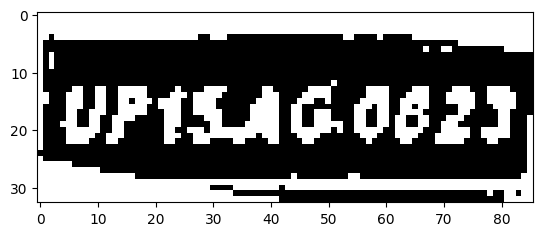

height =  179 width =  168
height =  298 width =  576
height =  88 width =  119
height =  298 width =  394
[247.93650817871094, 193.07952880859375, 334.5767822265625, 224.59107971191406, 0.4746321141719818, 0.0] track_id: 1.0
-0.1746721990082397
[246.54800415039062, 163.81434631347656, 330.4428405761719, 191.04139709472656, 0.2776471972465515, 0.0] track_id: 1.0
-0.16883190201112078
height =  181 width =  172
height =  298 width =  584
height =  88 width =  118
height =  306 width =  409
[257.7603454589844, 196.0745849609375, 347.7822570800781, 231.39613342285156, 0.8180417418479919, 0.0] track_id: 1.0
-0.17559216195018024
height =  184 width =  173
height =  83 width =  115
height =  315 width =  420
[267.1241149902344, 202.63096618652344, 359.6128234863281, 238.65380859375, 0.43601375818252563, 0.0] track_id: 1.0
-0.17573829668536678
height =  183 width =  175
height =  323 width =  433
[277.83709716796875, 206.25704956054688, 371.6993408203125, 243.18238830566406, 0.8461923003196716

[322.55645751953125, 234.51304626464844, 427.4761962890625, 275.7237548828125, 0.2862880825996399, 0.0] track_id: 1.0
-0.17307603116985298
['UP15aG0623']
license before check UP15aG0623
license after check UP15AG0623
License Plate Number with contours :  UP15AG0623 , Score :  0.284434157400438


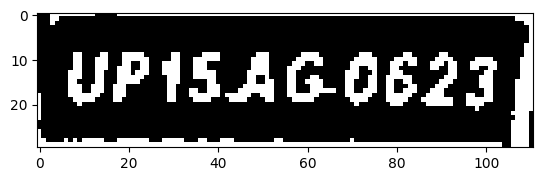

height =  179 width =  186
height =  309 width =  482
height =  88 width =  111
height =  374 width =  515
[341.1683044433594, 210.92630004882812, 444.0077819824219, 242.28976440429688, 0.5421740412712097, 0.0] track_id: 1.0
-0.17005862159205634
[343.12127685546875, 245.7611541748047, 449.0682678222656, 283.77850341796875, 0.33054623007774353, 0.0] track_id: 1.0
-0.17985349979247828
height =  179 width =  195
height =  300 width =  440
height =  89 width =  109
height =  384 width =  535
[359.133544921875, 250.08047485351562, 469.64776611328125, 293.55133056640625, 0.3375791907310486, 0.0] track_id: 1.0
-0.1746721990082397
height =  178 width =  210
height =  298 width =  390
height =  89 width =  103
height =  396 width =  559
[379.483642578125, 261.73455810546875, 492.74957275390625, 303.2631530761719, 0.2891599237918854, 0.0] track_id: 1.0
-0.1767088560700366
height =  179 width =  217
height =  281 width =  345
height =  86 width =  112
height =  84 width =  116
height =  407 width

[398.67266845703125, 271.12554931640625, 516.3572998046875, 315.2034912109375, 0.31524085998535156, 0.0] track_id: 1.0
-0.1707352114752828


['SA']
license before check SA
hello
License Plate Number with contours :  None , Score :  None
-0.171148605416182
['UPISAG0623']
license before check UPISAG0623
license after check UPISAG0623
License Plate Number :  UP1SAG0623 , Score :  0.273911390659979


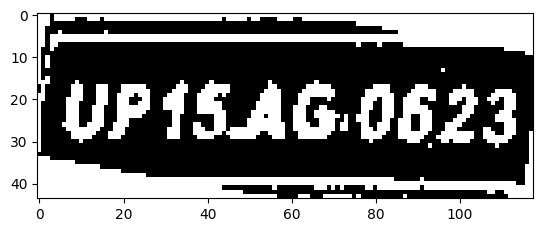

height =  185 width =  221
height =  86 width =  116
height =  87 width =  116
height =  94 width =  107
height =  418 width =  606
[415.22735595703125, 279.74481201171875, 536.8234252929688, 325.8893127441406, 0.3919270634651184, 0.0] track_id: 1.0
-0.16514867741462683
height =  193 width =  225
height =  86 width =  119
height =  89 width =  120
height =  93 width =  107
height =  434 width =  627
[434.9330139160156, 286.4978942871094, 559.202392578125, 340.4213562011719, 0.7162331938743591, 0.0] track_id: 1.0
-0.15790992070951543
height =  198 width =  229
height =  220 width =  199
height =  85 width =  116
height =  92 width =  109
height =  454 width =  661
[466.3598327636719, 303.6839599609375, 592.7908935546875, 358.29632568359375, 0.7560966610908508, 0.0] track_id: 1.0
-0.15913672579869362
height =  202 width =  235
height =  203 width =  153
height =  88 width =  120
height =  80 width =  118
height =  92 width =  110
height =  470 width =  690
[496.0745849609375, 319.4149169

[590.10009765625, 370.7229309082031, 730.4357299804688, 429.4951477050781, 0.6946135759353638, 0.0] track_id: 1.0
-0.1793388317988058


[]
License Plate Number with contours :  None , Score :  None
-0.17593962545252784
['UP1SAg0623']
license before check UP1SAg0623
license after check UP1SAG0623
License Plate Number :  UP1SAG0623 , Score :  0.20332644428188174


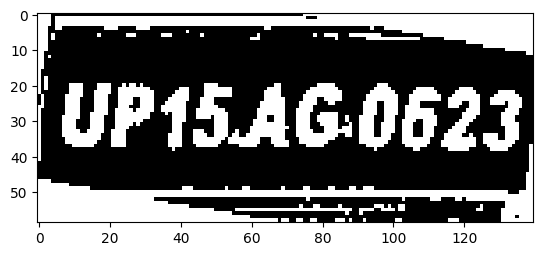

[711.0355224609375, 31.840543746948242, 751.609130859375, 47.35260009765625, 0.6380944848060608, 0.0] track_id: 1.0
0.0


[]
License Plate Number with contours :  None , Score :  None
-0.026309717252922193
['Duln']
license before check Duln
hello
License Plate Number :  None , Score :  None
height =  226 width =  276
height =  91 width =  122
height =  87 width =  122
height =  97 width =  118
height =  549 width =  830


[628.3051147460938, 386.84014892578125, 769.0075073242188, 447.9678955078125, 0.6486269235610962, 0.0] track_id: 1.0
-0.17579790209746762
['UPISAG0623']
license before check UPISAG0623
license after check UPISAG0623
License Plate Number with contours :  UP1SAG0623 , Score :  0.47470979753645814


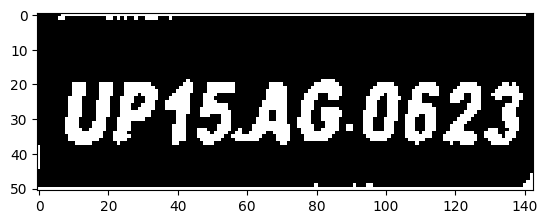

[723.5391845703125, 32.15133285522461, 763.8966674804688, 47.629783630371094, 0.4322153329849243, 0.0] track_id: 1.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['Mhiln']
license before check Mhiln
hello
License Plate Number :  None , Score :  None
height =  235 width =  284
height =  91 width =  122
height =  84 width =  127
height =  98 width =  118
height =  98 width =  321
[262.9674377441406, 59.677669525146484, 303.0165710449219, 71.42922973632812, 0.9089175462722778, 0.0] track_id: 13.0
0.0
height =  575 width =  872


[673.377685546875, 417.5077819824219, 818.3585205078125, 474.1016845703125, 0.4179321527481079, 0.0] track_id: 1.0
-0.1920480172407301


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.18534794999569476
['UP1SAG0623']
license before check UP1SAG0623
license after check UP1SAG0623
License Plate Number :  UP1SAG0623 , Score :  0.7471518714521018


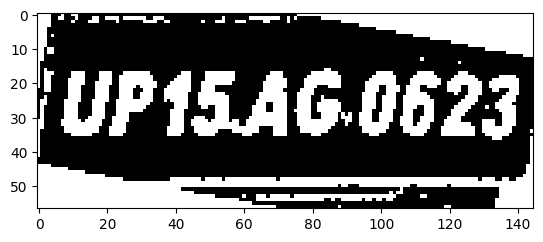

height =  241 width =  298
height =  92 width =  122
height =  88 width =  129
height =  94 width =  118
height =  99 width =  320
[272.43743896484375, 64.55987548828125, 314.47308349609375, 76.80435180664062, 0.896654486656189, 0.0] track_id: 13.0
-0.0688564893010446
height =  603 width =  917


[718.2295532226562, 439.17803955078125, 863.7160034179688, 500.7315979003906, 0.641775906085968, 0.0] track_id: 1.0
-0.21195763724261935


[]
License Plate Number with contours :  None , Score :  None
-0.20982831175965547
['UP15AG0623']
license before check UP15AG0623
license after check UP15AG0623
License Plate Number :  UP15AG0623 , Score :  0.4145504644517651


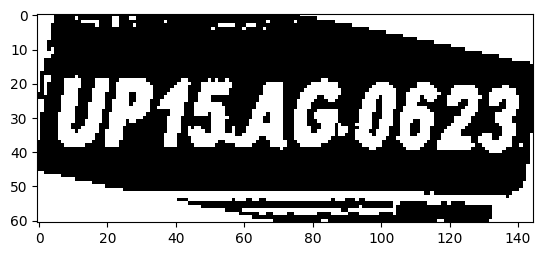

[714.73486328125, 374.7245178222656, 855.8662109375, 434.7611389160156, 0.28721219301223755, 0.0] track_id: 1.0
-0.17593962545252784
height =  249 width =  302
height =  91 width =  121
height =  90 width =  129
height =  91 width =  119
height =  103 width =  323
[270.38922119140625, 70.25662994384766, 311.94427490234375, 82.4668960571289, 0.8947756886482239, 0.0] track_id: 13.0
0.0
height =  638 width =  971


[772.043212890625, 465.68682861328125, 918.1951293945312, 532.9866943359375, 0.7865543365478516, 0.0] track_id: 1.0
-0.22540285082206107


[]
License Plate Number with contours :  None , Score :  None
-0.20687394897974307
['UP1SAG0623']
license before check UP1SAG0623
license after check UP1SAG0623
License Plate Number :  UP1SAG0623 , Score :  0.4228796468600637


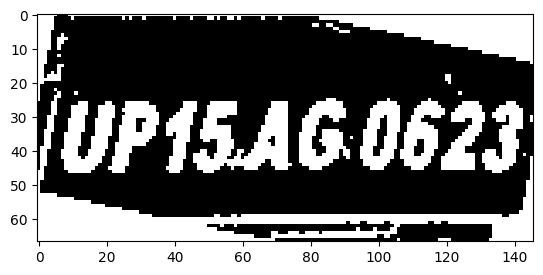

[774.1790161132812, 45.40652847290039, 816.9860229492188, 60.98184585571289, 0.37851259112358093, 0.0] track_id: 1.0
-0.039978687123290044
height =  254 width =  313
height =  95 width =  121
height =  97 width =  130
height =  93 width =  121
height =  103 width =  341
[273.59161376953125, 75.93220520019531, 314.93206787109375, 88.5110855102539, 0.8980854749679565, 0.0] track_id: 13.0
0.0
height =  671 width =  1028


[832.745849609375, 489.71966552734375, 980.91064453125, 562.8765869140625, 0.8689714670181274, 0.0] track_id: 1.0
-0.24347941387536423


['06']
license before check 06
hello
License Plate Number with contours :  None , Score :  None
-0.23753463189561275
['UPISAG0623']
license before check UPISAG0623
license after check UPISAG0623
License Plate Number :  UP1SAG0623 , Score :  0.5332505192425382


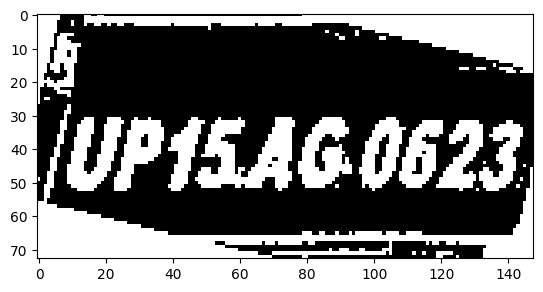

height =  259 width =  337
height =  96 width =  120
height =  99 width =  132
height =  94 width =  126
height =  113 width =  357


[296.2146301269531, 82.18916320800781, 337.1636047363281, 94.98593139648438, 0.884914755821228, 0.0] track_id: 13.0
0.020405330686538086


[]
License Plate Number with contours :  None , Score :  None
0.0
['andlv']
license before check andlv
hello
License Plate Number :  None , Score :  None
height =  711 width =  1080


[891.6425170898438, 525.4202880859375, 1035.663818359375, 600.70849609375, 0.8192280530929565, 0.0] track_id: 1.0
-0.2657819034403842


['0']
license before check 0
hello
License Plate Number with contours :  None , Score :  None
-0.2834212531480521
['Up154G0623']
license before check Up154G0623
license after check UP154G0623
License Plate Number :  UP15AG0623 , Score :  0.29154755671567517


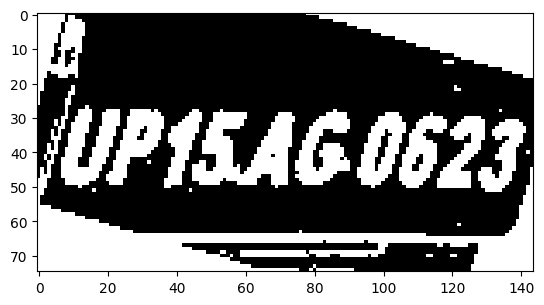

height =  263 width =  348
height =  99 width =  119
height =  101 width =  132
height =  95 width =  128
height =  126 width =  364
[308.5286865234375, 89.41307830810547, 350.6138916015625, 102.76497650146484, 0.8934820294380188, 0.0] track_id: 13.0
0.06656816377582381
height =  268 width =  367
height =  101 width =  119
height =  99 width =  135
height =  90 width =  126
height =  800 width =  1192
[1027.0594482421875, 602.4988403320312, 1166.583251953125, 690.9575805664062, 0.8214516639709473, 0.0] track_id: 1.0
-0.3868757177310281
height =  277 width =  384
height =  102 width =  120
height =  97 width =  139
height =  80 width =  125
height =  851 width =  1253
[1111.3272705078125, 564.9147338867188, 1229.4866943359375, 653.0442504882812, 0.5040026903152466, 0.0] track_id: 1.0
-0.7853981633974483
height =  285 width =  404
height =  105 width =  119
height =  101 width =  142
height =  87 width =  123
height =  904 width =  1310
[95.5842514038086, 140.6314239501953, 171.163833618

[346.59722900390625, 186.8229217529297, 444.84185791015625, 221.2170867919922, 0.7656180262565613, 0.0] track_id: 3.0
-0.05123716740341881


[]
License Plate Number with contours :  None , Score :  None
-0.058755822715722696
['WP1L4hzzzr']
license before check WP1L4hzzzr
hello
License Plate Number :  None , Score :  None
height =  106 width =  123
height =  110 width =  147
height =  95 width =  124
height =  310 width =  491
[362.2066345214844, 194.54689025878906, 450.9070739746094, 229.18777465820312, 0.9035236239433289, 0.0] track_id: 3.0
-0.13402320158006337
height =  106 width =  123
height =  108 width =  137


[0.0, 71.28678894042969, 16.584163665771484, 86.58409118652344, 0.8885947465896606, 0.0] track_id: 11.0
[]
License Plate Number :  None , Score :  None
height =  94 width =  127
height =  318 width =  515


[378.36785888671875, 199.82284545898438, 467.8438415527344, 232.24188232421875, 0.8997048735618591, 0.0] track_id: 3.0
-0.13131543898308803


[]
License Plate Number with contours :  None , Score :  None
-0.02702044918726479
['UP1ZAN2528']
license before check UP1ZAN2528
license after check UP1ZAN2528
License Plate Number :  UP1ZAN2528 , Score :  0.7432469916356578


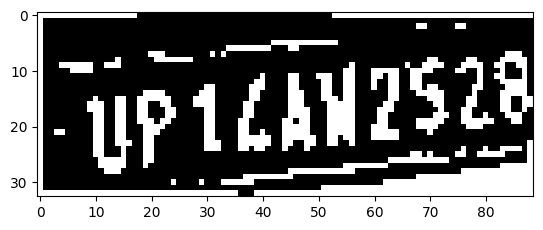

height =  107 width =  124
height =  94 width =  127
height =  173 width =  424
[377.4642333984375, 149.41754150390625, 414.332275390625, 163.6496124267578, 0.9094030857086182, 0.0] track_id: 13.0
0.029403288204005115
height =  325 width =  536
[395.21014404296875, 204.54359436035156, 487.8740234375, 238.17250061035156, 0.9031640291213989, 0.0] track_id: 3.0
-0.13927925953684642
height =  110 width =  125
height =  96 width =  127
height =  334 width =  556
[413.4757080078125, 212.70281982421875, 509.4866027832031, 249.524658203125, 0.9048203229904175, 0.0] track_id: 3.0
-0.135170698649009
height =  108 width =  126
height =  95 width =  126
height =  168 width =  453
[406.3431396484375, 157.8754119873047, 441.1482849121094, 168.0, 0.8757825493812561, 0.0] track_id: 13.0
0.0688564893010446
height =  1260 width =  1454
height =  343 width =  576
[431.322265625, 219.62220764160156, 528.1567993164062, 257.4395751953125, 0.9110078811645508, 0.0] track_id: 3.0
-0.13734127746693392
height = 

[0.6846952438354492, 87.53486633300781, 110.10365295410156, 132.1812744140625, 0.8491733074188232, 0.0] track_id: 1.0
-0.14189705460416394
['UP1LAN2528']
license before check UP1LAN2528
license after check UP1LAN2528
License Plate Number :  UP1LAN2528 , Score :  0.3700196085938852


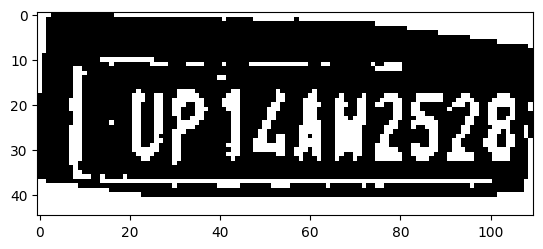

height =  355 width =  596
[453.47723388671875, 229.27137756347656, 551.010498046875, 266.7576599121094, 0.900818943977356, 0.0] track_id: 3.0
0.03945320109703948
height =  105 width =  127
height =  96 width =  129
height =  191 width =  469
[435.1728210449219, 182.78314208984375, 468.2939453125, 190.70318603515625, 0.7747553586959839, 0.0] track_id: 13.0
height =  1247 width =  1339


[0.008843016810715199, 69.61548614501953, 91.60303497314453, 113.02818298339844, 0.8387311100959778, 0.0] track_id: 1.0
-0.146666493797193
['UPLAK2S28']
license before check UPLAK2S28
license after check UPLAK2S28
License Plate Number :  UP4AK2528 , Score :  0.06325361585052053


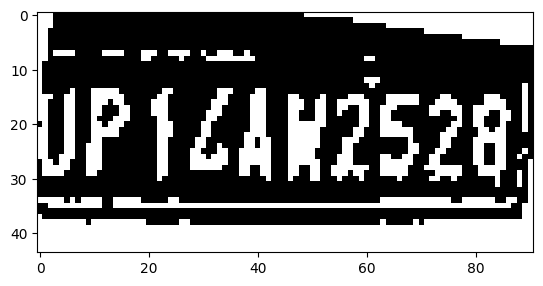

height =  371 width =  623
[475.2159729003906, 240.9784698486328, 574.90478515625, 281.7720031738281, 0.9120857119560242, 0.0] track_id: 3.0
-0.13758673647034989
height =  105 width =  127
height =  96 width =  129
height =  205 width =  479
height =  1208 width =  1257


[0.041986871510744095, 50.51264572143555, 52.48209762573242, 91.53007507324219, 0.6941408514976501, 0.0] track_id: 1.0
-0.15431877592611903
['1x2528']
license before check 1x2528
hello
License Plate Number :  None , Score :  None
height =  386 width =  647
[502.4515686035156, 255.37765502929688, 602.041259765625, 296.65966796875, 0.8914371132850647, 0.0] track_id: 3.0
-0.12308595969500578
height =  106 width =  127
height =  98 width =  129
height =  220 width =  489
[456.73162841796875, 208.90921020507812, 488.727294921875, 220.0, 0.5150728225708008, 0.0] track_id: 13.0
height =  1168 width =  1169


[0.0, 19.187442779541016, 20.66716194152832, 65.02629089355469, 0.6592200398445129, 0.0] track_id: 1.0
['28i']
license before check 28i
hello
License Plate Number :  None , Score :  None
height =  398 width =  677
[529.8848266601562, 267.8382568359375, 630.2168579101562, 309.3885192871094, 0.8980575203895569, 0.0] track_id: 3.0
-0.11942892601833845
height =  107 width =  129
height =  100 width =  129
height =  242 width =  499
[469.42327880859375, 219.6825714111328, 498.2048034667969, 235.95645141601562, 0.6270917057991028, 0.0] track_id: 13.0
0.0
height =  1121 width =  1061
height =  411 width =  703
[558.8062133789062, 277.80267333984375, 660.445068359375, 322.24896240234375, 0.9002266526222229, 0.0] track_id: 3.0
-0.10673567264913564
height =  108 width =  129
height =  262 width =  500


[473.6937255859375, 228.35011291503906, 499.2592468261719, 245.03321838378906, 0.6657974123954773, 0.0] track_id: 13.0
-0.06807645825799948


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  1073 width =  957
height =  428 width =  733


[588.9086303710938, 292.3156433105469, 690.5181884765625, 338.52423095703125, 0.8872010111808777, 0.0] track_id: 3.0
-0.15796489294847935


['Ur4aKJl8']
license before check Ur4aKJl8
hello
License Plate Number with contours :  None , Score :  None
0.0
['1Up144w2528']
license before check 1Up144w2528
hello
License Plate Number :  None , Score :  None
height =  107 width =  129
height =  101 width =  128
height =  276 width =  507
[480.23223876953125, 238.65972900390625, 503.70001220703125, 255.4083251953125, 0.5281159281730652, 0.0] track_id: 13.0
0.17593962545252784
height =  1010 width =  834
height =  444 width =  761
[618.8978881835938, 308.4753112792969, 723.1932373046875, 357.2500915527344, 0.9011384844779968, 0.0] track_id: 3.0
-0.14189705460416394
height =  107 width =  129
height =  288 width =  505
height =  953 width =  709
height =  465 width =  788
[653.0430297851562, 325.5605773925781, 753.7860717773438, 377.6785888671875, 0.9064399600028992, 0.0] track_id: 3.0
-0.1707352114752828
height =  108 width =  131
height =  298 width =  504
height =  861 width =  574
height =  489 width =  822


[691.5763549804688, 343.5230712890625, 793.1156616210938, 398.3153381347656, 0.897240400314331, 0.0] track_id: 3.0
0.0


[]
License Plate Number with contours :  None , Score :  None
-0.1571102653469605
['UP14kH2528']
license before check UP14kH2528
license after check UP14KH2528
License Plate Number :  UP14KH2528 , Score :  0.1648626041019955


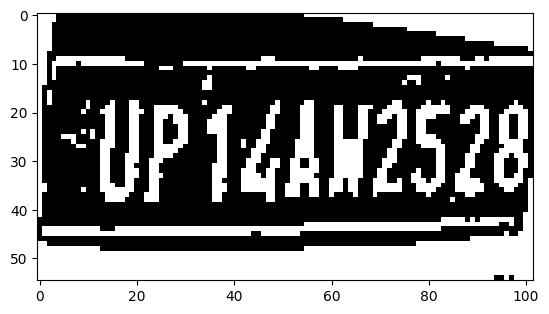

height =  109 width =  131
height =  304 width =  513
height =  782 width =  433
height =  507 width =  853


[732.9979248046875, 359.9070129394531, 833.6226806640625, 415.4132385253906, 0.8713294863700867, 0.0] track_id: 3.0
-0.1848570320184407


[]
License Plate Number with contours :  None , Score :  None
-0.20902294280626463
['UP4LaNz528']
license before check UP4LaNz528
hello
License Plate Number :  None , Score :  None
height =  111 width =  132
height =  311 width =  507
height =  633 width =  284
height =  528 width =  884


[768.9677734375, 377.5957946777344, 870.0719604492188, 432.5604248046875, 0.871254563331604, 0.0] track_id: 3.0
0.0


[]
License Plate Number with contours :  None , Score :  None
-0.19321148384780604
['UP1La425284']
license before check UP1La425284
hello
License Plate Number :  None , Score :  None
height =  112 width =  131
height =  321 width =  459
height =  427 width =  140
height =  554 width =  918


[810.9342041015625, 398.2963562011719, 908.1279907226562, 456.8040466308594, 0.8594917058944702, 0.0] track_id: 3.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.24220858710962045
['Up1Lah2528']
license before check Up1Lah2528
license after check UP1LAH2528
License Plate Number :  UP1LAH2528 , Score :  0.14072641145052556


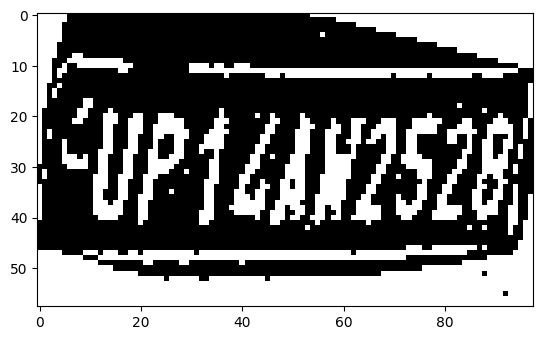

height =  113 width =  132
height =  315 width =  402
height =  586 width =  949


[850.2817993164062, 425.40484619140625, 942.2056274414062, 485.6256408691406, 0.8866519331932068, 0.0] track_id: 3.0
-0.27384203622714276


['Fu']
license before check Fu
hello
License Plate Number with contours :  None , Score :  None
-0.3086508670768651
['Up1uyz5z0']
license before check Up1uyz5z0
hello
License Plate Number :  None , Score :  None
height =  114 width =  132
height =  303 width =  349
height =  611 width =  980
[889.9102172851562, 433.2159118652344, 979.7304077148438, 510.2911376953125, 0.7785996794700623, 0.0] track_id: 3.0
-0.16977827396833844
height =  113 width =  131
height =  102 width =  137
height =  259 width =  294
height =  644 width =  1010


[933.5625, 455.3476257324219, 1010.0, 539.2379150390625, 0.7650966048240662, 0.0] track_id: 3.0
-0.3919475254685127


[]
License Plate Number with contours :  None , Score :  None
-0.7853981633974483
[]
License Plate Number :  None , Score :  None
height =  113 width =  131
height =  101 width =  137
height =  236 width =  241
height =  671 width =  1038


[971.0679321289062, 483.7378234863281, 1038.0, 566.0987548828125, 0.7691957950592041, 0.0] track_id: 3.0
1.5602703997631713


[]
License Plate Number with contours :  None , Score :  None
-1.5707963267948966
[]
License Plate Number :  None , Score :  None
height =  117 width =  131
height =  103 width =  139
height =  225 width =  185
height =  711 width =  1066
[1007.7957153320312, 515.6678466796875, 1066.0, 599.1395263671875, 0.7781150937080383, 0.0] track_id: 3.0
-0.5456550545269917
height =  119 width =  131
height =  223 width =  129
height =  743 width =  1094


[1046.2767333984375, 545.5775146484375, 1094.0, 625.8687133789062, 0.8133652210235596, 0.0] track_id: 3.0
-1.5096481641455954


[]
License Plate Number with contours :  None , Score :  None
-0.7853981633974483
[]
License Plate Number :  None , Score :  None
height =  120 width =  130
height =  779 width =  1112
height =  122 width =  131
height =  103 width =  143
height =  819 width =  1134
height =  125 width =  132
height =  103 width =  143
height =  854 width =  1105
height =  123 width =  131
height =  106 width =  146
height =  887 width =  1032
height =  122 width =  129
height =  109 width =  143
height =  911 width =  950
height =  124 width =  128
height =  112 width =  143
height =  940 width =  866
height =  126 width =  129
height =  114 width =  147
height =  911 width =  780
height =  125 width =  129
height =  114 width =  147
height =  851 width =  687
height =  125 width =  128
height =  117 width =  147
height =  808 width =  586
height =  128 width =  131
height =  122 width =  148
height =  153 width =  190
height =  771 width =  487
height =  128 width =  131
height =  156 width =  193
he

[121.77970886230469, 106.03398895263672, 147.64512634277344, 118.42180633544922, 0.34299200773239136, 0.0] track_id: 12.0
-0.1624891092172034


[]
License Plate Number with contours :  None , Score :  None
['Da4']
license before check Da4
hello
License Plate Number :  None , Score :  None
height =  140 width =  189
height =  176 width =  165
height =  145 width =  201
[121.86621856689453, 106.67765808105469, 166.47872924804688, 120.68411254882812, 0.5379524230957031, 0.0] track_id: 12.0
-0.13381097747459075
height =  138 width =  192
height =  179 width =  164
height =  147 width =  203
height =  141 width =  204
height =  180 width =  166
height =  148 width =  207
height =  148 width =  207
height =  181 width =  171
height =  150 width =  213


[128.7107391357422, 112.46153259277344, 175.9177703857422, 128.00271606445312, 0.47229307889938354, 0.0] track_id: 12.0
-0.16514867741462683


[]
License Plate Number with contours :  None , Score :  None
0.0
['624u']
license before check 624u
hello
License Plate Number :  None , Score :  None
height =  159 width =  217
height =  184 width =  173
height =  151 width =  218
height =  160 width =  223
height =  186 width =  176
height =  151 width =  218
height =  168 width =  231
height =  192 width =  181
height =  152 width =  220
height =  172 width =  237
height =  199 width =  187
height =  157 width =  224
height =  175 width =  240
height =  207 width =  190
height =  159 width =  230
[140.5767822265625, 118.69403076171875, 192.9040985107422, 135.8864288330078, 0.30415937304496765, 0.0] track_id: 12.0
-0.14189705460416394
height =  181 width =  243
height =  211 width =  192
height =  161 width =  235


[143.66119384765625, 119.41265869140625, 196.4071044921875, 136.62501525878906, 0.3937475085258484, 0.0] track_id: 12.0
-0.16514867741462683


[]
License Plate Number with contours :  None , Score :  None
-0.16514867741462683
[]
License Plate Number :  None , Score :  None
height =  189 width =  244
height =  211 width =  193
height =  163 width =  238


[148.74948120117188, 118.9239730834961, 202.7039337158203, 136.4213409423828, 0.253634512424469, 0.0] track_id: 12.0
-0.1607627406258347


[]
License Plate Number with contours :  None , Score :  None
-0.1682067718570861
['LzInt']
license before check LzInt
hello
License Plate Number :  None , Score :  None
height =  193 width =  245
height =  213 width =  199
height =  164 width =  245


[152.63478088378906, 119.61650085449219, 209.35914611816406, 137.288818359375, 0.29120293259620667, 0.0] track_id: 12.0
-0.09966865249116202


[]
License Plate Number with contours :  None , Score :  None
-0.1607627406258347
['MISTILE']
license before check MISTILE
hello
License Plate Number :  None , Score :  None
height =  217 width =  203
height =  167 width =  249
[154.142822265625, 120.24009704589844, 210.59518432617188, 139.50555419921875, 0.5711323618888855, 0.0] track_id: 12.0
-0.1610919045375805
height =  223 width =  210
height =  168 width =  251
[156.1331329345703, 122.82524871826172, 214.26185607910156, 141.75653076171875, 0.8553666472434998, 0.0] track_id: 12.0
-0.20749622643520266
height =  231 width =  217
height =  170 width =  257


[163.64601135253906, 125.09476470947266, 219.35067749023438, 143.5904541015625, 0.7007894515991211, 0.0] track_id: 12.0
-0.24207169457111893


[]
License Plate Number with contours :  None , Score :  None
-0.16514867741462683
['LP4SJezg']
license before check LP4SJezg
hello
License Plate Number :  None , Score :  None
height =  239 width =  227
height =  172 width =  261
height =  243 width =  236
[106.00318908691406, 143.38380432128906, 166.5374755859375, 173.03311157226562, 0.3991250693798065, 0.0] track_id: 10.0
-0.22768931976865586
height =  173 width =  266
[168.5642547607422, 128.55615234375, 227.16197204589844, 149.74142456054688, 0.8029740452766418, 0.0] track_id: 12.0
0.0
height =  248 width =  242
[110.13340759277344, 143.69725036621094, 173.1728057861328, 177.637939453125, 0.25444111227989197, 0.0] track_id: 10.0
-0.2495869254369846
height =  177 width =  268
[170.8929901123047, 131.60000610351562, 230.08351135253906, 152.92636108398438, 0.6683189272880554, 0.0] track_id: 12.0
-0.19270075866238556
height =  253 width =  249
height =  180 width =  277


[178.50546264648438, 134.8166046142578, 236.64720153808594, 154.5842742919922, 0.8640757203102112, 0.0] track_id: 12.0
-0.18362232616928015


[]
License Plate Number with contours :  None , Score :  None
-0.17593962545252784
['W4St4t4']
license before check W4St4t4
hello
License Plate Number :  None , Score :  None
height =  259 width =  258
[119.35006713867188, 155.5816192626953, 186.95762634277344, 187.1836395263672, 0.45438265800476074, 0.0] track_id: 10.0
-0.2405342479459046
height =  184 width =  283
[181.12400817871094, 137.0599822998047, 241.1569366455078, 158.14691162109375, 0.719483494758606, 0.0] track_id: 12.0
-0.14189705460416394
height =  267 width =  264
height =  185 width =  288


[185.3343505859375, 138.4530029296875, 247.3177032470703, 158.94296264648438, 0.8718518614768982, 0.0] track_id: 12.0
-0.18822150530477078


[]
License Plate Number with contours :  None , Score :  None
-0.15660187698201536
['21544PIS']
license before check 21544PIS
hello
License Plate Number :  None , Score :  None
height =  270 width =  276


[129.56167602539062, 166.18768310546875, 201.9030303955078, 195.19212341308594, 0.46993333101272583, 0.0] track_id: 10.0
-0.24069603406324405


['Met5SVe']
license before check Met5SVe
hello
License Plate Number with contours :  None , Score :  None
-0.22810262827994277
[]
License Plate Number :  None , Score :  None
height =  188 width =  293
[190.7145538330078, 141.12701416015625, 253.3571319580078, 160.6872100830078, 0.8166578412055969, 0.0] track_id: 12.0
-0.14010172439663027
height =  279 width =  285
[135.04331970214844, 168.97117614746094, 209.26278686523438, 205.0331268310547, 0.5778149962425232, 0.0] track_id: 10.0
-0.22208190190548016
height =  192 width =  303


[196.69984436035156, 144.47227478027344, 261.3182373046875, 164.73634338378906, 0.8664952516555786, 0.0] track_id: 12.0
-0.13800602365751946


[]
License Plate Number with contours :  None , Score :  None
-0.15499674192394097
['NP15640243']
license before check NP15640243
license after check NP15640243
License Plate Number :  NP15GA0243 , Score :  0.03929053999844517


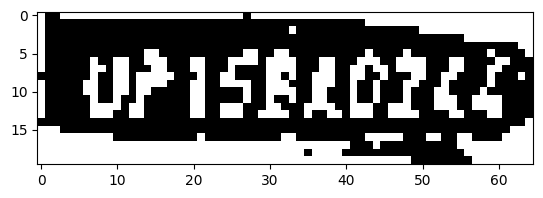

height =  286 width =  295
[141.49058532714844, 171.5267333984375, 218.653076171875, 210.91281127929688, 0.6396912932395935, 0.0] track_id: 10.0
-0.23860932250820097
height =  194 width =  306


[200.03396606445312, 144.5040283203125, 264.8414306640625, 165.87376403808594, 0.8564046621322632, 0.0] track_id: 12.0
-0.1349767498539234


[]
License Plate Number with contours :  None , Score :  None
-0.1767088560700366
['715910256']
license before check 715910256
hello
License Plate Number :  None , Score :  None
height =  295 width =  308


[148.45008850097656, 181.5514678955078, 228.49102783203125, 218.0186767578125, 0.6428826451301575, 0.0] track_id: 10.0
-0.22390450013034954


['Vf12F229552']
license before check Vf12F229552
hello
License Plate Number with contours :  None , Score :  None
-0.22290023232837577
['P4FS9936']
license before check P4FS9936
hello
License Plate Number :  None , Score :  None
height =  198 width =  312
[203.9425048828125, 146.87353515625, 269.9000244140625, 168.13363647460938, 0.8664852976799011, 0.0] track_id: 12.0
-0.18998828791871572
height =  306 width =  322


[157.05397033691406, 186.4117431640625, 239.05441284179688, 224.27874755859375, 0.8073636293411255, 0.0] track_id: 10.0
-0.3473859629183197


['Efe9995']
license before check Efe9995
hello
License Plate Number with contours :  None , Score :  None
-0.22964244228513467
['UP4F85936']
license before check UP4F85936
hello
License Plate Number :  None , Score :  None
height =  201 width =  315
[207.24989318847656, 147.77479553222656, 274.0060119628906, 170.71835327148438, 0.8641974925994873, 0.0] track_id: 12.0
-0.1896136157743894
height =  315 width =  334


[163.21502685546875, 192.7913360595703, 248.26577758789062, 230.64125061035156, 0.8585755825042725, 0.0] track_id: 10.0
-0.22266094063636496


['UPLf899367']
license before check UPLf899367
hello
License Plate Number with contours :  None , Score :  None
-0.21336864215180798
['UP12fR9996']
license before check UP12fR9996
license after check UP12FR9996
License Plate Number :  UP12FR9996 , Score :  0.10998883929435316


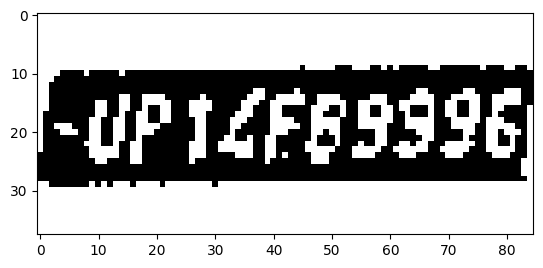

height =  203 width =  320
[211.96914672851562, 148.87179565429688, 280.4593505859375, 172.86376953125, 0.8357323408126831, 0.0] track_id: 12.0
-0.14345226330365873
height =  324 width =  344


[171.4759521484375, 198.86492919921875, 258.21881103515625, 236.57699584960938, 0.853190541267395, 0.0] track_id: 10.0
-0.23154377092565046
['UPIEFB9995']
license before check UPIEFB9995
license after check UPIEFB9995
License Plate Number with contours :  UP1EFB9995 , Score :  0.11647171572825


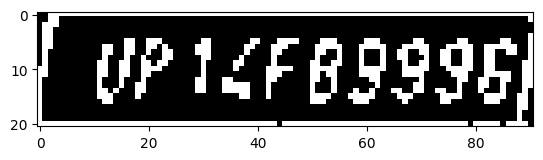

height =  204 width =  324
[213.90956115722656, 152.4993133544922, 284.4064636230469, 175.72093200683594, 0.8251216411590576, 0.0] track_id: 12.0
-0.13335025417155244
height =  334 width =  360


[180.95254516601562, 206.26612854003906, 272.1219177246094, 247.6549530029297, 0.8489606380462646, 0.0] track_id: 10.0
-0.23255694180490905


['Wf12F89996']
license before check Wf12F89996
hello
License Plate Number with contours :  None , Score :  None
-0.22595921768864075
['UPIZFRS936']
license before check UPIZFRS936
license after check UPIZFRS936
License Plate Number :  UP1ZFR5936 , Score :  0.2096794225512517


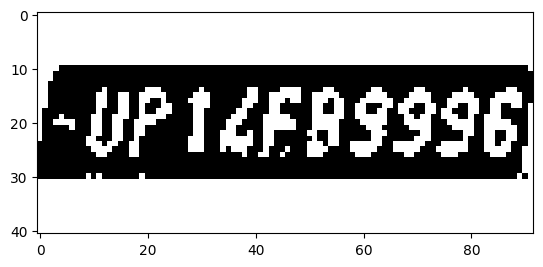

height =  207 width =  328
[220.08236694335938, 156.5819091796875, 290.62811279296875, 180.1825714111328, 0.713993489742279, 0.0] track_id: 12.0
-0.12591262568579822
height =  343 width =  375


[188.1709442138672, 216.8529815673828, 283.81878662109375, 256.5894470214844, 0.8608962297439575, 0.0] track_id: 10.0
-0.2218511149259635


['2f599961']
license before check 2f599961
hello
License Plate Number with contours :  None , Score :  None
-0.22244726542594168
['UPILFBS996']
license before check UPILFBS996
license after check UPILFBS996
License Plate Number :  UP1LFB5996 , Score :  0.11182019168968728


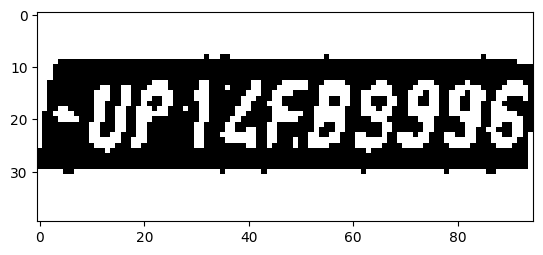

height =  212 width =  340
[227.75242614746094, 159.92379760742188, 298.2953186035156, 183.96240234375, 0.8690725564956665, 0.0] track_id: 12.0
-0.1302114429643964
height =  357 width =  392


[199.5469970703125, 221.85418701171875, 298.4842834472656, 266.1140441894531, 0.8810865879058838, 0.0] track_id: 10.0
-0.22734380712800387
['UP1CFB9996']
license before check UP1CFB9996
license after check UP1CFB9996
License Plate Number with contours :  UP1CFB9996 , Score :  0.2946331215725423


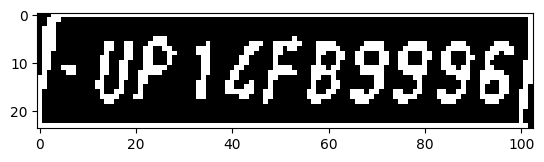

height =  217 width =  351


[235.01339721679688, 163.13414001464844, 307.35638427734375, 187.25033569335938, 0.8742834329605103, 0.0] track_id: 12.0
-0.1672539374622611


[]
License Plate Number with contours :  None , Score :  None
-0.1283232276857948
['UP159J0ZSL']
license before check UP159J0ZSL
hello
License Plate Number :  None , Score :  None
height =  371 width =  411


[211.19595336914062, 235.54751586914062, 315.3992919921875, 279.8370666503906, 0.8805835247039795, 0.0] track_id: 10.0
-0.20668321848424925
['UP1Lfr9996']
license before check UP1Lfr9996
license after check UP1LFR9996
License Plate Number with contours :  UP1LFR9996 , Score :  0.37665771409122


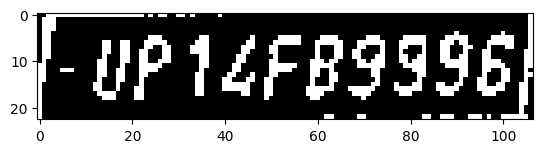

height =  220 width =  377
[259.8240051269531, 165.9989013671875, 332.6899719238281, 191.1795196533203, 0.9154805541038513, 0.0] track_id: 12.0
-0.14189705460416394
height =  385 width =  430


[226.03811645507812, 245.78060913085938, 333.3294372558594, 295.06109619140625, 0.8967137336730957, 0.0] track_id: 10.0
-0.20450781545834348
['UP1LFB9995']
license before check UP1LFB9995
license after check UP1LFB9995
License Plate Number with contours :  UP1LFB9995 , Score :  0.4621917085791573


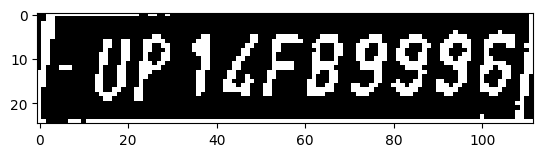

height =  224 width =  373


[256.24603271484375, 170.42306518554688, 330.4014587402344, 195.8186492919922, 0.812953531742096, 0.0] track_id: 12.0
-0.17539422054342257


[]
License Plate Number with contours :  None , Score :  None
-0.15660187698201536
['15940243']
license before check 15940243
hello
License Plate Number :  None , Score :  None
height =  404 width =  454


[240.1865692138672, 259.8457946777344, 352.5611267089844, 311.4287414550781, 0.8920781016349792, 0.0] track_id: 10.0
-0.22785704871709972


['UPILf899961']
license before check UPILf899961
hello
License Plate Number with contours :  None , Score :  None
-0.22064718266034367
['UP1LF89996']
license before check UP1LF89996
hello
License Plate Number :  None , Score :  None
height =  228 width =  380
[261.1291809082031, 173.0758056640625, 336.6108703613281, 199.03012084960938, 0.793404221534729, 0.0] track_id: 12.0
-0.10257985241829468
height =  424 width =  479


[255.27474975585938, 270.425537109375, 373.8580627441406, 327.37017822265625, 0.9061983823776245, 0.0] track_id: 10.0
-0.21535769969773805


['UP1LF89996']
license before check UP1LF89996
hello
License Plate Number with contours :  None , Score :  None
-0.20574261139803554
['UP1LFB9996']
license before check UP1LFB9996
license after check UP1LFB9996
License Plate Number :  UP1LFB9996 , Score :  0.17657560032306877


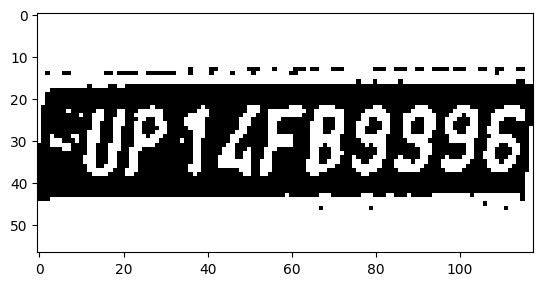

height =  233 width =  380
[258.7403259277344, 176.8069610595703, 334.442138671875, 201.61109924316406, 0.9058598279953003, 0.0] track_id: 12.0
-0.10257985241829468
height =  445 width =  502


[270.7870178222656, 287.1986999511719, 396.2134094238281, 343.6634216308594, 0.9013096690177917, 0.0] track_id: 10.0
-0.27505555035331175


['LF89996']
license before check LF89996
hello
License Plate Number with contours :  None , Score :  None
-0.22347660114063303
['UP1LFB9996']
license before check UP1LFB9996
license after check UP1LFB9996
License Plate Number :  UP1LFB9996 , Score :  0.2513069684192873


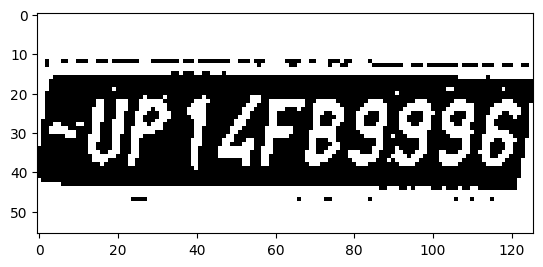

height =  239 width =  385
[263.8558349609375, 181.37950134277344, 340.6499938964844, 207.56744384765625, 0.9087686538696289, 0.0] track_id: 12.0
-0.10801172470004632
height =  468 width =  533


[293.9693603515625, 305.156494140625, 424.4583740234375, 364.67523193359375, 0.8990669846534729, 0.0] track_id: 10.0
-0.2097711656370821
['UP1LFB9995']
license before check UP1LFB9995
license after check UP1LFB9995
License Plate Number with contours :  UP1LFB9995 , Score :  0.8689305612692949


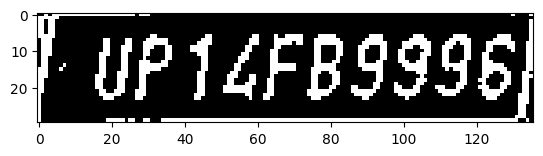

height =  241 width =  397
[272.276611328125, 184.16278076171875, 350.3915100097656, 210.76901245117188, 0.9197765588760376, 0.0] track_id: 12.0
-0.14444157837464397
height =  491 width =  567


[319.2800598144531, 324.62255859375, 456.9424133300781, 385.6542663574219, 0.8995978832244873, 0.0] track_id: 10.0
-0.20574261139803554
['UP1LFB9996']
license before check UP1LFB9996
license after check UP1LFB9996
License Plate Number with contours :  UP1LFB9996 , Score :  0.9263961708962931


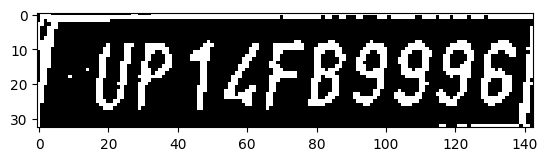

height =  234 width =  398
[275.08233642578125, 184.40867614746094, 354.6768493652344, 212.87376403808594, 0.9047073721885681, 0.0] track_id: 12.0
-0.13509443844935512
height =  520 width =  602


[346.2289123535156, 345.20611572265625, 490.4444580078125, 410.02496337890625, 0.8983669877052307, 0.0] track_id: 10.0
-0.2058341781041252
['UP1LFB9996']
license before check UP1LFB9996
license after check UP1LFB9996
License Plate Number with contours :  UP1LFB9996 , Score :  0.4045190900950927


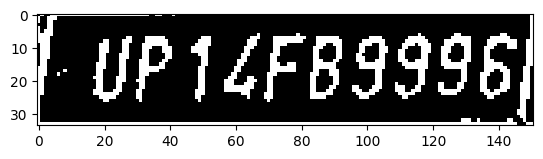

height =  231 width =  403


[276.62091064453125, 190.6444549560547, 357.187744140625, 220.9358673095703, 0.917127251625061, 0.0] track_id: 12.0
-0.12750955821523827


['I0zGL']
license before check I0zGL
hello
License Plate Number with contours :  None , Score :  None
-0.11942892601833845
['Up15810244']
license before check Up15810244
hello
License Plate Number :  None , Score :  None
height =  550 width =  644


[379.3146667480469, 369.63897705078125, 531.7647094726562, 437.4459228515625, 0.9025713205337524, 0.0] track_id: 10.0
-0.2120416496762619
['UP1LFB9996']
license before check UP1LFB9996
license after check UP1LFB9996
License Plate Number with contours :  UP1LFB9996 , Score :  0.62430029885588


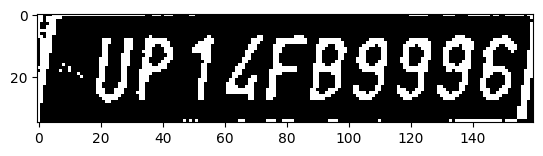

height =  232 width =  403
[275.8554992675781, 195.56349182128906, 357.31964111328125, 223.52735900878906, 0.9040307402610779, 0.0] track_id: 12.0
-0.1255497371085257
height =  584 width =  692


[417.2686767578125, 395.3087463378906, 577.7903442382812, 468.7219543457031, 0.9119330048561096, 0.0] track_id: 10.0
-0.22225530228522308
['UP1LFB9996']
license before check UP1LFB9996
license after check UP1LFB9996
License Plate Number with contours :  UP1LFB9996 , Score :  0.6338054212631492


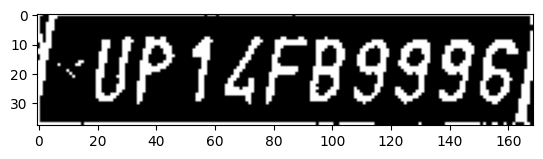

height =  235 width =  411
[282.2323303222656, 198.92596435546875, 364.87646484375, 227.24453735351562, 0.9029197096824646, 0.0] track_id: 12.0
-0.15264932839526515
height =  249 width =  462


[428.3002624511719, 198.30764770507812, 459.1598815917969, 213.07022094726562, 0.8254518508911133, 0.0] track_id: 27.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  622 width =  741


[456.0178527832031, 423.7307434082031, 628.1318359375, 503.79522705078125, 0.9099852442741394, 0.0] track_id: 10.0
-0.22641643889470636
['UP1LFB9996']
license before check UP1LFB9996
license after check UP1LFB9996
License Plate Number with contours :  UP1LFB9996 , Score :  0.3528011721716001


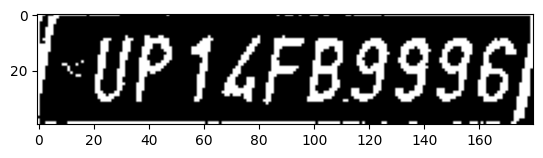

[717.8468627929688, 164.86666870117188, 741.0, 189.5963897705078, 0.7715902924537659, 0.0] track_id: 10.0
-0.0696545737285682
height =  242 width =  414
[284.6274108886719, 205.6480255126953, 368.9731140136719, 234.4019775390625, 0.8932076692581177, 0.0] track_id: 12.0
-0.13509443844935512
height =  262 width =  463
[431.9444580078125, 210.21990966796875, 461.3855895996094, 225.2079620361328, 0.7919484376907349, 0.0] track_id: 27.0
0.034469100999508014
height =  664 width =  798


[507.112548828125, 459.33685302734375, 687.2977294921875, 543.90966796875, 0.9132071733474731, 0.0] track_id: 10.0
-0.22303096837155825
['UP1LFB9996']
license before check UP1LFB9996
license after check UP1LFB9996
License Plate Number with contours :  UP1LFB9996 , Score :  0.46355395108104885


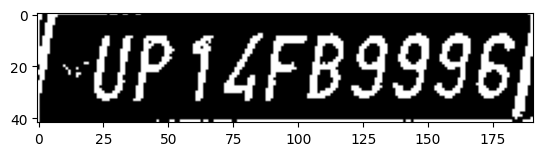

[729.6876220703125, 167.42543029785156, 798.0, 194.91268920898438, 0.8671091198921204, 0.0] track_id: 10.0
-0.09275632018814374
height =  246 width =  420
[288.7919616699219, 211.04019165039062, 374.22314453125, 240.17678833007812, 0.9036500453948975, 0.0] track_id: 12.0
-0.14324294881168684
height =  277 width =  468


[436.5037841796875, 225.6417694091797, 463.2021789550781, 241.1140594482422, 0.5803026556968689, 0.0] track_id: 27.0
0.0


[]
License Plate Number with contours :  None , Score :  None
['Z4']
license before check Z4
hello
License Plate Number :  None , Score :  None
height =  708 width =  862


[565.0859985351562, 497.9903259277344, 756.6466064453125, 587.30029296875, 0.9117812514305115, 0.0] track_id: 10.0
-0.23186466084938878
['UP1LFB9996']
license before check UP1LFB9996
license after check UP1LFB9996
License Plate Number with contours :  UP1LFB9996 , Score :  0.4580488529942878


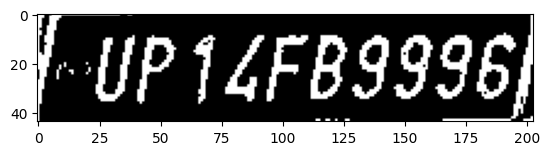

[740.8447875976562, 172.48277282714844, 829.857421875, 200.05055236816406, 0.8517115116119385, 0.0] track_id: 10.0
-0.0688564893010446


[]
License Plate Number with contours :  None , Score :  None
0.0
['FUP', '15810245']
license before check FUP15810245
hello
License Plate Number :  None , Score :  None
height =  250 width =  421
[292.4820556640625, 216.30360412597656, 378.22540283203125, 246.15550231933594, 0.8356553912162781, 0.0] track_id: 12.0
-0.11809202841909398
height =  289 width =  471
height =  765 width =  936


[636.8892822265625, 543.0245361328125, 839.13330078125, 639.9434204101562, 0.9120970964431763, 0.0] track_id: 10.0
-0.24400210093730484
['UP1LFB9996']
license before check UP1LFB9996
license after check UP1LFB9996
License Plate Number with contours :  UP1LFB9996 , Score :  0.9045467805360828


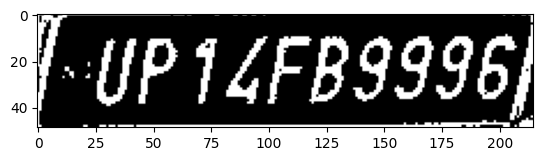

[752.3325805664062, 177.93667602539062, 842.525390625, 206.51126098632812, 0.8322687149047852, 0.0] track_id: 10.0
-0.12062366858010272
height =  255 width =  439
[306.9884948730469, 224.62135314941406, 394.8216552734375, 251.1555938720703, 0.7708541750907898, 0.0] track_id: 12.0
-0.07982998571223732
height =  304 width =  478
height =  823 width =  1021


[723.7508544921875, 588.0419921875, 931.4065551757812, 695.5242309570312, 0.9147090315818787, 0.0] track_id: 10.0
-0.2772255455621181
['UP1LFB9996']
license before check UP1LFB9996
license after check UP1LFB9996
License Plate Number with contours :  UP1LFB9996 , Score :  0.3626577881646558


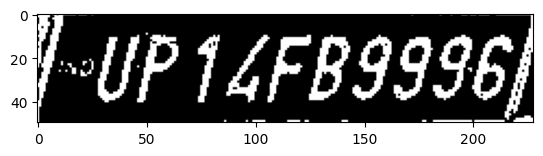

[770.20947265625, 179.17239379882812, 856.8839111328125, 209.07705688476562, 0.6170844435691833, 0.0] track_id: 10.0
-0.11065722117389565
height =  261 width =  468
[344.0089416503906, 229.2275848388672, 422.6480407714844, 256.84619140625, 0.5146399140357971, 0.0] track_id: 12.0
-0.14037498576433333
height =  316 width =  474
height =  895 width =  1109


[822.3159790039062, 645.333740234375, 1035.518798828125, 767.9339599609375, 0.9154416918754578, 0.0] track_id: 10.0
-0.3127879262719864
['UP1LFB9996']
license before check UP1LFB9996
license after check UP1LFB9996
License Plate Number with contours :  UP1LFB9996 , Score :  0.22551373510644718


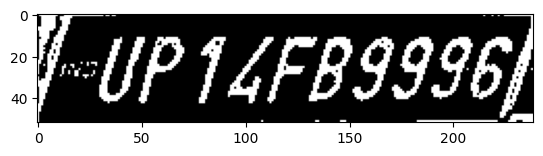

height =  268 width =  475
height =  328 width =  470
height =  987 width =  1211


[945.2255859375, 719.447998046875, 1161.2919921875, 859.103759765625, 0.9154583215713501, 0.0] track_id: 10.0
-0.3851575063634742
['UP1ZFB9996']
license before check UP1ZFB9996
license after check UP1ZFB9996
License Plate Number with contours :  UP1ZFB9996 , Score :  0.30271006689680496


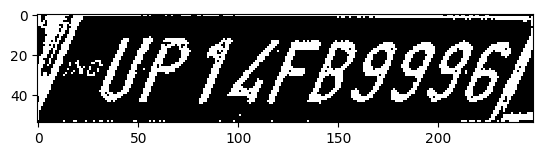

height =  343 width =  469
height =  1105 width =  1327
[1089.964111328125, 810.0796508789062, 1301.2213134765625, 972.1419677734375, 0.9019353985786438, 0.0] track_id: 10.0
-0.4539234422585531
height =  1223 width =  1458
height =  1325 width =  1603
height =  1352 width =  1752
height =  148 width =  507
height =  1340 width =  1895
height =  132 width =  488
height =  1318 width =  1864
height =  147 width =  507
height =  1304 width =  1863
height =  286 width =  181
height =  169 width =  518
height =  1245 width =  1798
height =  270 width =  126
height =  1209 width =  1711
height =  269 width =  549
height =  1176 width =  1603
height =  306 width =  635
height =  1120 width =  1470
height =  384 width =  688
height =  1048 width =  1302
[399.46636962890625, 27.93158721923828, 480.462158203125, 64.31974029541016, 0.5207963585853577, 0.0] track_id: 10.0
-0.1367557117309045
height =  423 width =  727
[608.0059814453125, 380.658447265625, 701.132568359375, 419.81488037109375, 0.89

[722.3237915039062, 443.7676086425781, 802.081298828125, 492.695068359375, 0.9143922328948975, 0.0] track_id: 12.0
-0.08145204430587098


['VP']
license before check VP
hello
License Plate Number with contours :  None , Score :  None
-0.27609701939543646
['UP1584024']
license before check UP1584024
hello
License Plate Number :  None , Score :  None
height =  533 width =  852
[745.6925659179688, 458.7878723144531, 820.0096435546875, 507.90826416015625, 0.8964272141456604, 0.0] track_id: 12.0
-0.23811378241001133
height =  548 width =  872
[770.3466186523438, 476.6080627441406, 844.41162109375, 526.133056640625, 0.9003353118896484, 0.0] track_id: 12.0
-0.24175286786424297
height =  568 width =  888
[793.4913940429688, 493.0405578613281, 865.7955322265625, 547.0715942382812, 0.8918752074241638, 0.0] track_id: 12.0
-0.27829965900511133
height =  589 width =  903


[812.1290893554688, 514.271728515625, 878.528564453125, 574.167236328125, 0.8210169076919556, 0.0] track_id: 12.0
0.507098504392337


[]
License Plate Number with contours :  None , Score :  None
-0.3165692536124036
['UpA5S40']
license before check UpA5S40
hello
License Plate Number :  None , Score :  None
height =  614 width =  917


[832.5240478515625, 535.3692016601562, 893.28076171875, 598.4642333984375, 0.8334625363349915, 0.0] track_id: 12.0
-0.4241944079037666


[]
License Plate Number with contours :  None , Score :  None
-0.37089128881266237
['1p1916']
license before check 1p1916
hello
License Plate Number :  None , Score :  None
height =  634 width =  934
height =  656 width =  943


[869.0061645507812, 559.2678833007812, 927.4990234375, 634.1848754882812, 0.5670398473739624, 0.0] track_id: 12.0
-1.017764882644256


[]
License Plate Number with contours :  None , Score :  None
-0.48689923181126904
[]
License Plate Number :  None , Score :  None
height =  676 width =  952
height =  699 width =  960


[900.38330078125, 593.1744384765625, 951.8114013671875, 677.3230590820312, 0.5500707626342773, 0.0] track_id: 12.0
-0.7853981633974483


[]
License Plate Number with contours :  None , Score :  None
-1.20062549895268
[]
License Plate Number :  None , Score :  None
height =  718 width =  968
height =  741 width =  963
height =  759 width =  914
height =  777 width =  861
height =  796 width =  806
height =  799 width =  749
height =  76 width =  96
height =  803 width =  688
height =  78 width =  93
height =  732 width =  629
height =  82 width =  98
height =  330 width =  536
height =  698 width =  568
height =  659 width =  503
height =  80 width =  97
height =  352 width =  514
height =  641 width =  438
height =  82 width =  96
height =  615 width =  372
height =  85 width =  98
height =  586 width =  306
height =  74 width =  93
height =  570 width =  239
height =  77 width =  99
height =  555 width =  171
height =  81 width =  103
height =  543 width =  106
height =  84 width =  106
height =  71 width =  97
height =  90 width =  107
height =  97 width =  113
height =  99 width =  116
height =  102 width =  120
heig

[0.0, 32.636600494384766, 4.7656049728393555, 42.7181396484375, 0.342624694108963, 0.0] track_id: 32.0
[]
License Plate Number :  None , Score :  None
height =  141 width =  144
height =  145 width =  146
height =  150 width =  150
height =  152 width =  151


[66.12039947509766, 92.9202880859375, 110.5159683227539, 111.231689453125, 0.5605915784835815, 0.0] track_id: 32.0
-0.017542060057402487


[]
License Plate Number with contours :  None , Score :  None
-0.23255694180490905
[]
License Plate Number :  None , Score :  None
height =  150 width =  153
[68.25731658935547, 91.42049407958984, 113.8147964477539, 111.27814483642578, 0.36986279487609863, 0.0] track_id: 32.0
0.14189705460416394
height =  153 width =  154
[69.82460021972656, 91.8742446899414, 115.9876480102539, 111.28668212890625, 0.32022786140441895, 0.0] track_id: 32.0
-0.2629947316809195
height =  156 width =  158
[70.7923583984375, 92.61103057861328, 116.49644470214844, 113.42093658447266, 0.5268581509590149, 0.0] track_id: 32.0
-0.24192056868440487
height =  159 width =  161
[71.63228607177734, 94.35413360595703, 119.08345794677734, 115.33924102783203, 0.3248319923877716, 0.0] track_id: 32.0
0.0
height =  165 width =  161
[71.35633850097656, 97.6634750366211, 118.04690551757812, 118.57750701904297, 0.7275314331054688, 0.0] track_id: 32.0
-0.20349304525756276
height =  124 width =  153
height =  167 width =  164


[73.05632781982422, 98.3318099975586, 120.72139739990234, 120.40303802490234, 0.8402551412582397, 0.0] track_id: 32.0
-0.06769302269396865


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  140 width =  156
height =  168 width =  167


[74.55105590820312, 100.2406997680664, 122.71624755859375, 121.78324127197266, 0.7719589471817017, 0.0] track_id: 32.0
-0.06548002492346482


[]
License Plate Number with contours :  None , Score :  None
-0.26211984126547283
['FKaI']
license before check FKaI
hello
License Plate Number :  None , Score :  None
height =  171 width =  171
[75.32518768310547, 102.66102600097656, 126.19788360595703, 126.3513412475586, 0.5165989995002747, 0.0] track_id: 32.0
-0.23602367862589738
height =  175 width =  175


[78.0134506225586, 105.3858413696289, 129.24029541015625, 128.83197021484375, 0.8428308963775635, 0.0] track_id: 32.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.26448838254923257
['Latt']
license before check Latt
hello
License Plate Number :  None , Score :  None
height =  93 width =  108
height =  179 width =  179


[80.04595184326172, 107.68012237548828, 132.19100952148438, 130.3296356201172, 0.8577431440353394, 0.0] track_id: 32.0
-0.22679884805388587


[]
License Plate Number with contours :  None , Score :  None
-0.25615138256560344
['Ltnaa']
license before check Ltnaa
hello
License Plate Number :  None , Score :  None
height =  180 width =  182


[81.40359497070312, 108.35164642333984, 133.82574462890625, 131.4568328857422, 0.8077375292778015, 0.0] track_id: 32.0
-0.013512691013328216


[]
License Plate Number with contours :  None , Score :  None
-0.2401710078601731
[]
License Plate Number :  None , Score :  None
height =  181 width =  186
[82.10440063476562, 108.52751922607422, 136.81427001953125, 133.0814666748047, 0.8171721696853638, 0.0] track_id: 32.0
-0.013887995930967074
height =  185 width =  189


[82.8503189086914, 111.03180694580078, 138.77159118652344, 137.43463134765625, 0.8317589163780212, 0.0] track_id: 32.0
0.0


[]
License Plate Number with contours :  None , Score :  None
-0.23554498072086333
[]
License Plate Number :  None , Score :  None
height =  189 width =  192


[83.65869903564453, 112.98351287841797, 140.83218383789062, 139.85499572753906, 0.8434498310089111, 0.0] track_id: 32.0
-0.012657551834051962


[]
License Plate Number with contours :  None , Score :  None
-0.25825221981103874
[]
License Plate Number :  None , Score :  None
height =  194 width =  195


[86.44489288330078, 116.207275390625, 144.35536193847656, 143.84361267089844, 0.8744331002235413, 0.0] track_id: 32.0
0.0


[]
License Plate Number with contours :  None , Score :  None
-0.24925214138521365
[]
License Plate Number :  None , Score :  None
height =  198 width =  201


[90.68600463867188, 119.35055541992188, 148.8175811767578, 146.1412811279297, 0.8450617790222168, 0.0] track_id: 32.0
-0.23783592745745075


[]
License Plate Number with contours :  None , Score :  None
-0.23210383807515567
[]
License Plate Number :  None , Score :  None
height =  202 width =  206


[93.6888656616211, 123.25100708007812, 153.26828002929688, 150.40736389160156, 0.8662681579589844, 0.0] track_id: 32.0
-0.24220858710962045


[]
License Plate Number with contours :  None , Score :  None
-0.2510026866430346
[]
License Plate Number :  None , Score :  None
height =  208 width =  209


[94.64079284667969, 125.69698333740234, 155.67820739746094, 153.32415771484375, 0.8603020906448364, 0.0] track_id: 32.0
-0.24848742065740273


[]
License Plate Number with contours :  None , Score :  None
-0.260602391747341
[]
License Plate Number :  None , Score :  None
height =  211 width =  214


[96.17283630371094, 129.52322387695312, 159.2439422607422, 158.31161499023438, 0.8864261507987976, 0.0] track_id: 32.0
0.0


[]
License Plate Number with contours :  None , Score :  None
-0.25436805855326594
['RTre']
license before check RTre
hello
License Plate Number :  None , Score :  None
height =  218 width =  221


[100.20977020263672, 130.85585021972656, 165.75115966796875, 161.99317932128906, 0.8777162432670593, 0.0] track_id: 32.0
0.2401710078601731


[]
License Plate Number with contours :  None , Score :  None
-0.24925214138521365
[]
License Plate Number :  None , Score :  None
height =  224 width =  226


[102.81954956054688, 134.94541931152344, 169.8975067138672, 165.45486450195312, 0.8817749619483948, 0.0] track_id: 32.0
-0.0302937599187751


[]
License Plate Number with contours :  None , Score :  None
-0.2408464552414116
['AEPI']
license before check AEPI
hello
License Plate Number :  None , Score :  None
height =  231 width =  232


[106.78169250488281, 140.50982666015625, 174.28965759277344, 171.17626953125, 0.8824973106384277, 0.0] track_id: 32.0
-0.24207169457111893


['JI']
license before check JI
hello
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  235 width =  240


[110.27641296386719, 142.90045166015625, 180.68760681152344, 174.0736083984375, 0.8795243501663208, 0.0] track_id: 32.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.22923193327699534
['JEAI6IHJ']
license before check JEAI6IHJ
hello
License Plate Number :  None , Score :  None
height =  241 width =  246


[113.91999053955078, 147.23251342773438, 185.70321655273438, 179.77061462402344, 0.8798995018005371, 0.0] track_id: 32.0
-0.23052183904336873


[]
License Plate Number with contours :  None , Score :  None
-0.23374318086890142
['CLjCEZEEI3']
license before check CLjCEZEEI3
hello
License Plate Number :  None , Score :  None
height =  245 width =  253


[117.34160614013672, 149.28305053710938, 191.33665466308594, 183.34097290039062, 0.885047435760498, 0.0] track_id: 32.0
-0.2424470229658554


['Xfd']
license before check Xfd
hello
License Plate Number with contours :  None , Score :  None
-0.24870998909352288
['Micezer82']
license before check Micezer82
hello
License Plate Number :  None , Score :  None
height =  250 width =  262


[121.56222534179688, 150.74612426757812, 198.15867614746094, 186.88430786132812, 0.8814247250556946, 0.0] track_id: 32.0
-0.24735395557182352


['781010']
license before check 781010
hello
License Plate Number with contours :  None , Score :  None
-0.24175286786424297
['0t3cBzet8t']
license before check 0t3cBzet8t
hello
License Plate Number :  None , Score :  None
height =  257 width =  271


[126.80472564697266, 156.0522003173828, 205.30767822265625, 193.5345916748047, 0.8822334408760071, 0.0] track_id: 32.0
-0.23109066719589708


['KE0218']
license before check KE0218
hello
License Plate Number with contours :  None , Score :  None
-0.2216495629786776
['OLJEBzBL81']
license before check OLJEBzBL81
hello
License Plate Number :  None , Score :  None
height =  265 width =  280


[132.73753356933594, 162.94703674316406, 213.8407745361328, 200.8780517578125, 0.8913198709487915, 0.0] track_id: 32.0
-0.2295273542432904


['J8218']
license before check J8218
hello
License Plate Number with contours :  None , Score :  None
-0.22006170263356514
['0lJEBZ8E18']
license before check 0lJEBZ8E18
hello
License Plate Number :  None , Score :  None
height =  274 width =  290


[139.29869079589844, 166.5205078125, 222.838623046875, 206.97474670410156, 0.8858997821807861, 0.0] track_id: 32.0
-0.22747498047282771


['Q1jcs818']
license before check Q1jcs818
hello
License Plate Number with contours :  None , Score :  None
-0.23554498072086333
['OLJcBzBEISC']
license before check OLJcBzBEISC
hello
License Plate Number :  None , Score :  None
height =  283 width =  301


[146.4213104248047, 174.19383239746094, 231.47100830078125, 214.47402954101562, 0.8957081437110901, 0.0] track_id: 32.0
-0.22423475110909616


['0LjcEzBE18']
license before check 0LjcEzBE18
hello
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['C0l3cezez181']
license before check C0l3cezez181
hello
License Plate Number :  None , Score :  None
height =  293 width =  312


[151.7545623779297, 181.0404815673828, 240.32748413085938, 222.06307983398438, 0.8874861598014832, 0.0] track_id: 32.0
-0.2223487820699473
['QL3cez2218']
license before check QL3cez2218
license after check QL3CEZ2218
License Plate Number with contours :  QL3CEZ2218 , Score :  0.09657374533855007


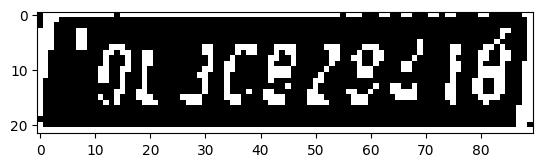

height =  302 width =  322


[158.22671508789062, 189.08375549316406, 249.88031005859375, 229.46868896484375, 0.8967295289039612, 0.0] track_id: 32.0
-0.22679884805388587


['DL3C828218']
license before check DL3C828218
hello
License Plate Number with contours :  None , Score :  None
-0.23893644058616342
['Fdl3c8282185']
license before check Fdl3c8282185
hello
License Plate Number :  None , Score :  None
height =  313 width =  335


[166.1580810546875, 195.81863403320312, 260.8774719238281, 238.01885986328125, 0.9017181992530823, 0.0] track_id: 32.0
-0.2279670718215078


['IL3c822218']
license before check IL3c822218
hello
License Plate Number with contours :  None , Score :  None
-0.22768931976865586
['Fdl3C8282t8']
license before check Fdl3C8282t8
hello
License Plate Number :  None , Score :  None
height =  324 width =  350


[173.9443359375, 202.65704345703125, 273.0167236328125, 248.0245361328125, 0.9036566615104675, 0.0] track_id: 32.0
-0.22571659739416963


['30828218']
license before check 30828218
hello
License Plate Number with contours :  None , Score :  None
-0.22923193327699534
['Pol3cez82t8']
license before check Pol3cez82t8
hello
License Plate Number :  None , Score :  None
height =  336 width =  365


[184.44677734375, 213.16168212890625, 286.0797424316406, 260.2251892089844, 0.9077730178833008, 0.0] track_id: 32.0
-0.22512567616292364


['OL3CBZSZ181']
license before check OL3CBZSZ181
hello
License Plate Number with contours :  None , Score :  None
-0.22441600903714554
['POL3c8284181']
license before check POL3c8284181
hello
License Plate Number :  None , Score :  None
height =  351 width =  382


[196.3190155029297, 223.4735565185547, 301.03582763671875, 273.9046936035156, 0.9113001227378845, 0.0] track_id: 32.0
-0.22679884805388587


['0L3C8Z8418']
license before check 0L3C8Z8418
hello
License Plate Number with contours :  None , Score :  None
-0.22082876972934834
['0L3C828418']
license before check 0L3C828418
hello
License Plate Number :  None , Score :  None
height =  360 width =  399


[206.64202880859375, 232.5738525390625, 315.8753967285156, 284.4789123535156, 0.9047595858573914, 0.0] track_id: 32.0
-0.22679884805388587
['OL3CBZ8LI8']
license before check OL3CBZ8LI8
license after check OL3CBZ8LI8
License Plate Number with contours :  OL3CBZ8418 , Score :  0.45043308922581426


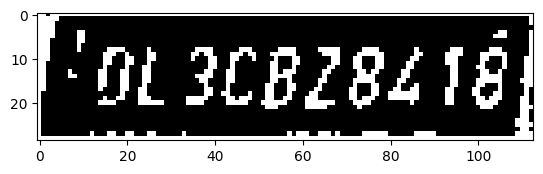

height =  376 width =  419


[219.98175048828125, 244.3354949951172, 333.8685302734375, 298.10650634765625, 0.8989941477775574, 0.0] track_id: 32.0
-0.22512567616292364


['DL3c828418']
license before check DL3c828418
hello
License Plate Number with contours :  None , Score :  None
-0.22064718266034367
['DL30828418']
license before check DL30828418
hello
License Plate Number :  None , Score :  None
height =  394 width =  441


[235.66525268554688, 257.2285461425781, 353.7228088378906, 313.2690124511719, 0.9097692370414734, 0.0] track_id: 32.0
0.0


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
['OL3CB28L18']
license before check OL3CB28L18
hello
License Plate Number :  None , Score :  None
height =  410 width =  464


[252.33547973632812, 269.29119873046875, 375.9111633300781, 327.3310241699219, 0.9163408279418945, 0.0] track_id: 32.0
-0.20668321848424925
['OL3CBZ8418']
license before check OL3CBZ8418
license after check OL3CBZ8418
License Plate Number with contours :  OL3CBZ8418 , Score :  0.24276430146293418


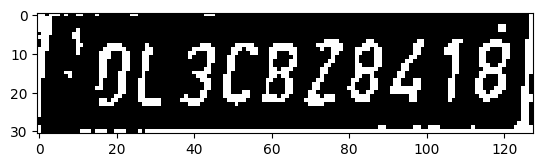

height =  430 width =  490


[270.5611572265625, 285.06475830078125, 400.36187744140625, 345.04290771484375, 0.9155377149581909, 0.0] track_id: 32.0
-0.22725526061918142
['OL3CBZ8L18']
license before check OL3CBZ8L18
license after check OL3CBZ8L18
License Plate Number with contours :  OL3CBZ8418 , Score :  0.4327719035463272


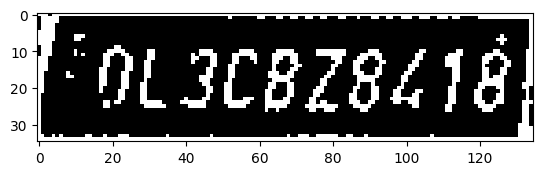

height =  454 width =  519


[289.74615478515625, 301.5751037597656, 426.7719421386719, 365.8009948730469, 0.9128544926643372, 0.0] track_id: 32.0
-0.22423475110909616


['OL3C8Z8L18']
license before check OL3C8Z8L18
hello
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
['DLJCBZ8L18']
license before check DLJCBZ8L18
license after check DLJCBZ8L18
License Plate Number :  DL3CBZ8418 , Score :  0.5684938853608598


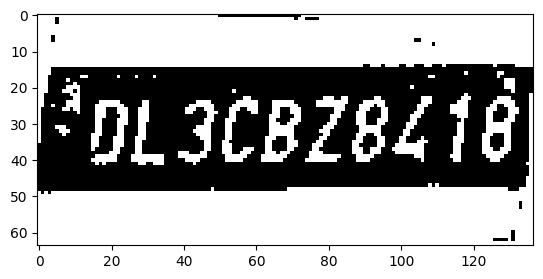

height =  475 width =  550


[312.0474548339844, 316.5682678222656, 455.7852478027344, 382.9136962890625, 0.9130986332893372, 0.0] track_id: 32.0
-0.22762393037490875


['IL3C8Z8L18']
license before check IL3C8Z8L18
hello
License Plate Number with contours :  None , Score :  None
-0.22317004075783917
['L3CBz8LT8']
license before check L3CBz8LT8
hello
License Plate Number :  None , Score :  None
height =  498 width =  586


[337.43524169921875, 336.0815124511719, 488.37933349609375, 407.6133728027344, 0.9185076355934143, 0.0] track_id: 32.0
-0.22821194179065735


['0L3CBZ8L185']
license before check 0L3CBZ8L185
hello
License Plate Number with contours :  None , Score :  None
-0.22252993054933773
['0L3CBZ8L18']
license before check 0L3CBZ8L18
license after check 0L3CBZ8L18
License Plate Number :  OL3CBZ8418 , Score :  0.31464053901885813


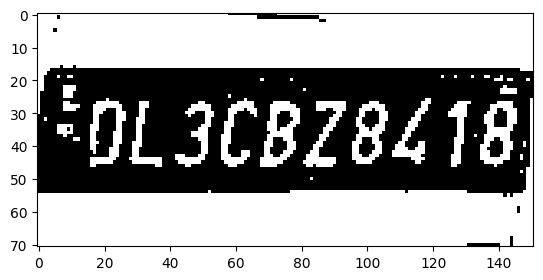

height =  531 width =  630


[372.0167541503906, 360.2047424316406, 530.1478271484375, 434.3396301269531, 0.9115625619888306, 0.0] track_id: 32.0
-0.22303096837155825
['0L3CBZ8418']
license before check 0L3CBZ8418
license after check 0L3CBZ8418
License Plate Number with contours :  OL3CBZ8418 , Score :  0.43844756601606905


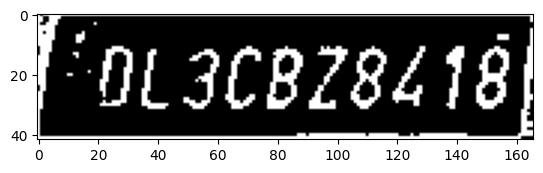

height =  566 width =  674


[408.6132507324219, 389.10565185546875, 574.5946044921875, 467.7301330566406, 0.908208429813385, 0.0] track_id: 32.0
-0.22537333226965947
['OL3CBZ8L18']
license before check OL3CBZ8L18
license after check OL3CBZ8L18
License Plate Number with contours :  OL3CBZ8418 , Score :  0.8099493997196475


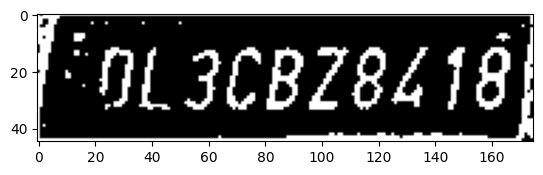

height =  604 width =  727


[451.9654846191406, 421.3545837402344, 626.8514404296875, 503.4559631347656, 0.916814386844635, 0.0] track_id: 32.0
-0.22679884805388587
['0L3CBZ8418']
license before check 0L3CBZ8418
license after check 0L3CBZ8418
License Plate Number with contours :  OL3CBZ8418 , Score :  0.4123635281482492


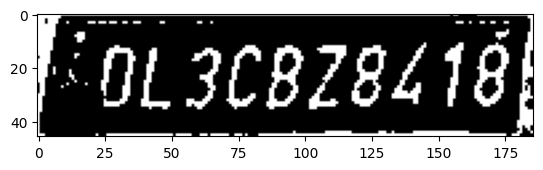

height =  646 width =  782


[500.9682922363281, 455.55780029296875, 684.511474609375, 545.7581787109375, 0.910716712474823, 0.0] track_id: 32.0
-0.26490130706380444
['0L3CBZ8L18']
license before check 0L3CBZ8L18
license after check 0L3CBZ8L18
License Plate Number with contours :  OL3CBZ8418 , Score :  0.5903867214705355


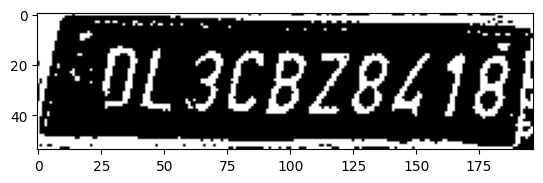

height =  693 width =  847


[561.1854248046875, 495.0397033691406, 752.4260864257812, 593.7387084960938, 0.9176583886146545, 0.0] track_id: 32.0
-0.27712526142406213
['OL3CBZ8L18']
license before check OL3CBZ8L18
license after check OL3CBZ8L18
License Plate Number with contours :  OL3CBZ8418 , Score :  0.6044053325189765


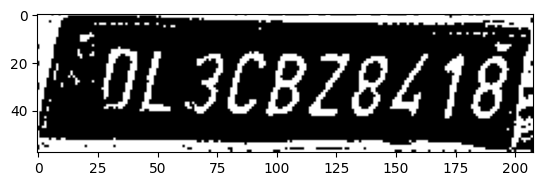

height =  748 width =  920
[631.6665649414062, 540.2916259765625, 831.9254760742188, 646.3571166992188, 0.907414436340332, 0.0] track_id: 32.0
-0.29665674760929417
height =  813 width =  999


[714.3281860351562, 596.1975708007812, 920.2900390625, 706.8411865234375, 0.9167157411575317, 0.0] track_id: 32.0
-0.296792448601017


['IL3C828418']
license before check IL3C828418
hello
License Plate Number with contours :  None , Score :  None
-0.3141171148791491
['OL3CBZ8L18']
license before check OL3CBZ8L18
license after check OL3CBZ8L18
License Plate Number :  OL3CBZ8418 , Score :  0.4365869135052587


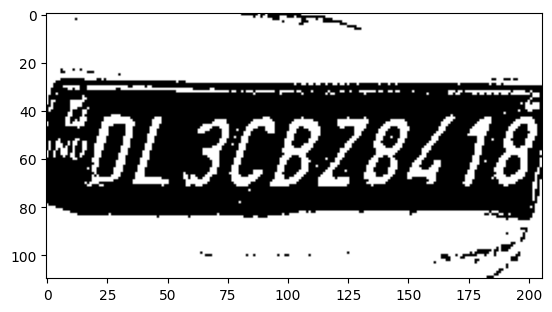

height =  887 width =  1084
[809.7451782226562, 655.1800537109375, 1017.9970092773438, 776.40185546875, 0.8983757495880127, 0.0] track_id: 32.0
-0.33162329426435205
height =  973 width =  1177
[923.6678466796875, 729.2279052734375, 1129.2158203125, 862.0189208984375, 0.8209446668624878, 0.0] track_id: 32.0
-0.39942071625347314
height =  1069 width =  1272
height =  1177 width =  1373
height =  1244 width =  1473
height =  1289 width =  1568
height =  1262 width =  1674
height =  1246 width =  1678
height =  1210 width =  1594
height =  1165 width =  1489
height =  1121 width =  1364
height =  1060 width =  1210
height =  987 width =  1033
height =  201 width =  421


[385.7080383300781, 169.21600341796875, 421.0, 190.65634155273438, 0.8887789845466614, 0.0] track_id: 48.0
0.039195601927054714


[]
License Plate Number with contours :  None , Score :  None
0.0
['90h']
license before check 90h
hello
License Plate Number :  None , Score :  None
height =  235 width =  443
[409.47613525390625, 194.97300720214844, 443.0, 217.75799560546875, 0.8140711784362793, 0.0] track_id: 48.0
-0.01999733397315053
height =  250 width =  451


[418.9913024902344, 206.77577209472656, 450.8831481933594, 227.1915740966797, 0.6297337412834167, 0.0] track_id: 48.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  261 width =  462
[168.43910217285156, 195.94058227539062, 252.04530334472656, 260.60382080078125, 0.3119417130947113, 0.0] track_id: 48.0
0.31383515242790877
height =  273 width =  467
[121.50483703613281, 185.152587890625, 208.5697784423828, 270.6551818847656, 0.7234834432601929, 0.0] track_id: 48.0
0.32740021180022655
height =  286 width =  472
height =  291 width =  474
height =  296 width =  478
height =  302 width =  485
height =  313 width =  468
height =  313 width =  409
height =  304 width =  352
height =  263 width =  225
height =  231 width =  162
height =  83 width =  122
height =  87 width =  122
height =  93 width =  126
height =  95 width =  129
height =  101 width =  130
height =  99 width =  131
height =  107 width =  136
height =  106 width =  138
height =  107 width =  140
height =  108 width =  141
height =  107 width =  145
height =  116 width =  

[0.0032827735412865877, 85.5486831665039, 8.29021167755127, 101.4813232421875, 0.6848730444908142, 0.0] track_id: 51.0
[]
License Plate Number :  None , Score :  None
height =  75 width =  239
[177.34632873535156, 44.3173713684082, 221.75726318359375, 56.60967254638672, 0.8621367812156677, 0.0] track_id: 58.0
0.0
height =  67 width =  141


[0.1368279904127121, 60.0191535949707, 40.60696029663086, 67.0, 0.2926502227783203, 0.0] track_id: 59.0
[]
License Plate Number :  None , Score :  None
height =  66 width =  192
height =  70 width =  191
height =  65 width =  181
height =  72 width =  165
height =  87 width =  162


[98.67748260498047, 52.70725631713867, 144.89547729492188, 66.00957489013672, 0.8827524185180664, 0.0] track_id: 61.0
0.0570807824062646


['JajIn']
license before check JajIn
hello
License Plate Number with contours :  None , Score :  None
0.0
['Iwt']
license before check Iwt
hello
License Plate Number :  None , Score :  None
height =  66 width =  167
height =  77 width =  176
height =  86 width =  166


[106.22007751464844, 54.130069732666016, 152.44638061523438, 67.12303924560547, 0.8963772058486938, 0.0] track_id: 61.0
0.014284742587396631


[]
License Plate Number with contours :  None , Score :  None
0.0
['aI']
license before check aI
hello
License Plate Number :  None , Score :  None
height =  80 width =  187


[0.006906104274094105, 60.78850173950195, 12.000332832336426, 76.3621826171875, 0.7165995240211487, 0.0] track_id: 59.0
[]
License Plate Number :  None , Score :  None
height =  86 width =  172
[110.66703033447266, 56.18073272705078, 158.27816772460938, 68.85554504394531, 0.897641122341156, 0.0] track_id: 61.0
0.013332543294145677
height =  86 width =  194


[0.0, 65.5840835571289, 25.065195083618164, 77.95541381835938, 0.8556819558143616, 0.0] track_id: 59.0
[]
License Plate Number :  None , Score :  None
height =  96 width =  185


[119.69676971435547, 65.96143341064453, 167.3162841796875, 78.59701538085938, 0.9060908555984497, 0.0] track_id: 61.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['Dhivt']
license before check Dhivt
hello
License Plate Number :  None , Score :  None
height =  99 width =  186
[124.25151824951172, 70.30988311767578, 171.99993896484375, 83.01712036132812, 0.9055210947990417, 0.0] track_id: 61.0
-0.016665123713940747
height =  95 width =  200


[22.660255432128906, 79.32987213134766, 69.384765625, 93.30850219726562, 0.8964924216270447, 0.0] track_id: 59.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['piutr']
license before check piutr
hello
License Plate Number :  None , Score :  None
height =  106 width =  196


[131.0709991455078, 73.50286865234375, 176.86373901367188, 85.99081420898438, 0.8507357835769653, 0.0] track_id: 61.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['Imttnt']
license before check Imttnt
hello
License Plate Number :  None , Score :  None
height =  118 width =  205


[138.21133422851562, 79.47762298583984, 187.5448455810547, 93.37074279785156, 0.8687620162963867, 0.0] track_id: 61.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['1J6361778']
license before check 1J6361778
license after check 1J6361778
License Plate Number :  IJ63G1778 , Score :  0.037758039893886715


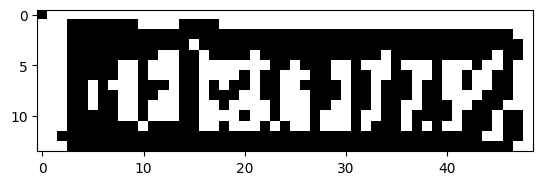

height =  161 width =  381


[324.5155944824219, 128.2821502685547, 370.62469482421875, 146.12440490722656, 0.9138453006744385, 0.0] track_id: 61.0
0.05627853628876196


[]
License Plate Number with contours :  None , Score :  None
0.0
['MH1MX']
license before check MH1MX
hello
License Plate Number :  None , Score :  None
height =  175 width =  402


[350.12957763671875, 139.3651885986328, 395.769775390625, 156.40538024902344, 0.921626627445221, 0.0] track_id: 61.0
0.061460955882765955


['571']
license before check 571
hello
License Plate Number with contours :  None , Score :  None
0.04345089539153084
['hinEe']
license before check hinEe
hello
License Plate Number :  None , Score :  None
height =  184 width =  418


[368.7080993652344, 145.99343872070312, 413.57275390625, 163.5717315673828, 0.9184794425964355, 0.0] track_id: 61.0
0.04164257909858842


['Hy']
license before check Hy
hello
License Plate Number with contours :  None , Score :  None
0.05549850524571683


['OXIDI']
license before check OXIDI
hello
License Plate Number :  None , Score :  None
[0.0, 108.71810150146484, 33.44258499145508, 183.08993530273438, 0.27590611577033997, 0.0] track_id: 61.0
0.18534794999569476
[]
License Plate Number :  None , Score :  None
height =  192 width =  430


[381.76983642578125, 155.24005126953125, 425.2707824707031, 173.16468811035156, 0.9091832041740417, 0.0] track_id: 61.0
0.03277514440407577


['T']
license before check T
hello
License Plate Number with contours :  None , Score :  None
0.0
['MM']
license before check MM
hello
License Plate Number :  None , Score :  None
height =  203 width =  439


[393.08697509765625, 166.32464599609375, 434.85565185546875, 185.04876708984375, 0.8931261897087097, 0.0] track_id: 61.0
0.033885329904117606


['rt']
license before check rt
hello
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  67 width =  148
height =  223 width =  450


[402.4825744628906, 179.8059539794922, 443.59393310546875, 198.62359619140625, 0.8895871043205261, 0.0] track_id: 61.0
0.0425275346197842


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  69 width =  152
height =  71 width =  161
height =  226 width =  466


[424.938232421875, 184.69212341308594, 463.6184387207031, 203.6256866455078, 0.898651123046875, 0.0] track_id: 61.0
0.05352026845931512


[]
License Plate Number with contours :  None , Score :  None
0.06241880999595735
[]
License Plate Number :  None , Score :  None
height =  71 width =  164
height =  235 width =  470


[432.6866760253906, 196.7098388671875, 469.1756896972656, 216.18426513671875, 0.8055480718612671, 0.0] track_id: 61.0
0.0407936828678654


[]
License Plate Number with contours :  None , Score :  None
0.06241880999595735
[]
License Plate Number :  None , Score :  None
[302.165283203125, 219.8454132080078, 385.959716796875, 235.0, 0.3255477249622345, 0.0] track_id: 61.0
0.22679884805388587
height =  71 width =  167
height =  248 width =  472
[438.80438232421875, 206.32252502441406, 471.9297790527344, 228.6704864501953, 0.8280841708183289, 0.0] track_id: 61.0
0.0
height =  74 width =  169
height =  261 width =  475
[444.1609191894531, 217.4993438720703, 474.80694580078125, 239.73915100097656, 0.7589211463928223, 0.0] track_id: 61.0
0.0
[289.2298278808594, 236.69134521484375, 387.584716796875, 261.0, 0.5711331963539124, 0.0] track_id: 61.0
0.3279233155014232
height =  75 width =  172
height =  63 width =  258
height =  271 width =  480
[451.6584777832031, 228.05641174316406, 480.0, 252.00106811523438, 0.8222149610519409, 0.0] track_id: 61.0
0.0
height =  76 width =  169
height =  66 width =  269
height =  272 width =  480
[4

[226.24545288085938, 38.22551345825195, 254.84886169433594, 47.33613204956055, 0.7868237495422363, 0.0] track_id: 64.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  292 width =  484
height =  76 width =  272
height =  140 width =  269
height =  304 width =  484
height =  161 width =  275
height =  312 width =  481
height =  81 width =  279
height =  185 width =  304
height =  320 width =  469
height =  197 width =  340
height =  325 width =  416
height =  80 width =  166
height =  211 width =  362
height =  312 width =  359
height =  222 width =  374
height =  299 width =  300
height =  223 width =  363
height =  280 width =  244
height =  77 width =  166
height =  229 width =  363
height =  253 width =  187
height =  79 width =  165
height =  237 width =  358
height =  233 width =  128
height =  79 width =  166
height =  236 width =  354
height =  214 width =  70
height =  79 width =  164
height =  244 width =  352
height =  81 width =  164
height =  250 width =  356
height =  78 width =  167
height =  250 width =  353
height = 

[274.63421630859375, 88.41405487060547, 302.0779724121094, 99.80352783203125, 0.7096672654151917, 0.0] track_id: 64.0
0.11065722117389565


['6z']
license before check 6z
hello
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  252 width =  350
height =  85 width =  170
height =  255 width =  346
height =  83 width =  168
height =  256 width =  343
height =  84 width =  168
height =  85 width =  163
height =  83 width =  139
height =  146 width =  336


[296.6325988769531, 109.75553894042969, 323.960205078125, 121.97283935546875, 0.36741989850997925, 0.0] track_id: 64.0
0.08490179344972196


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  282 width =  324
height =  81 width =  151
height =  150 width =  335


[299.1240234375, 114.05025482177734, 325.01104736328125, 125.41300964355469, 0.6746838092803955, 0.0] track_id: 64.0
0.06241880999595735


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  281 width =  296
height =  83 width =  156
height =  147 width =  335


[300.761962890625, 110.93721771240234, 325.624755859375, 122.78743743896484, 0.5575492978096008, 0.0] track_id: 64.0
0.04874185130993159


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  275 width =  270
height =  85 width =  161
height =  149 width =  339


[303.7770080566406, 114.19983673095703, 328.4093017578125, 125.60224914550781, 0.478054404258728, 0.0] track_id: 64.0
0.09966865249116202


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  265 width =  242
height =  81 width =  116
height =  85 width =  164
height =  155 width =  341
[308.5504150390625, 120.4448471069336, 332.705322265625, 132.804443359375, 0.6371979117393494, 0.0] track_id: 64.0
0.0302937599187751
height =  234 width =  216
height =  93 width =  121
height =  87 width =  165
height =  162 width =  341


[308.3846130371094, 126.13350677490234, 332.0997009277344, 138.66259765625, 0.7551162242889404, 0.0] track_id: 64.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  96 width =  126
height =  88 width =  166
height =  169 width =  341
[309.612060546875, 132.21717834472656, 332.4535217285156, 144.16558837890625, 0.6906306147575378, 0.0] track_id: 64.0
0.07485984771076686
height =  98 width =  131
height =  90 width =  166
height =  175 width =  346
[310.2606201171875, 137.9066619873047, 334.3031311035156, 150.3037567138672, 0.6796931624412537, 0.0] track_id: 64.0
0.06512516333438588
height =  201 width =  135
height =  106 width =  134
height =  89 width =  168
height =  174 width =  349
[315.21392822265625, 140.14846801757812, 338.1287536621094, 152.113525390625, 0.25785425305366516, 0.0] track_id: 64.0
0.08490179344972196
height =  197 width =  108
height =  105 width =  140
height =  86 width =  168
height =  181 width =  346
height =  190 width =  81
height =  103 width =  138
height =  84 width =  169
height =  188 width =  34

[598.6934204101562, 296.2648010253906, 614.0, 319.61083984375, 0.6004186272621155, 0.0] track_id: 70.0


[]
License Plate Number with contours :  None , Score :  None
['FE']
license before check FE
hello
License Plate Number :  None , Score :  None
height =  86 width =  152
height =  337 width =  615
height =  85 width =  151
height =  357 width =  612
height =  69 width =  319
height =  85 width =  150
height =  358 width =  615
height =  67 width =  318
[267.1581115722656, 34.566593170166016, 298.7579650878906, 43.59736633300781, 0.5785635709762573, 0.0] track_id: 72.0
0.0
height =  87 width =  152
height =  359 width =  566
height =  71 width =  321
height =  89 width =  151
height =  340 width =  474
height =  76 width =  324
[275.18603515625, 39.27897644042969, 308.2662353515625, 48.78650665283203, 0.500355064868927, 0.0] track_id: 72.0
0.08314123188844123
height =  328 width =  388
height =  79 width =  330
[281.4615783691406, 43.08306884765625, 313.603271484375, 52.78575134277344, 0.7915524244308472, 0.0] track_id: 72.0
0.01538340178059515
height =  83 width =  333
[285.09732055664

[293.717041015625, 50.13815689086914, 326.9716796875, 59.735294342041016, 0.6585918068885803, 0.0] track_id: 72.0
-0.047583103276983396


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  205 width =  131


[43.561954498291016, 177.20989990234375, 128.22113037109375, 205.0, 0.29373833537101746, 0.0] track_id: 70.0
0.4315730512235052


[]
License Plate Number with contours :  None , Score :  None
0.42794849632148213
[]
License Plate Number :  None , Score :  None
height =  95 width =  349


[299.5869140625, 53.10398864746094, 332.714111328125, 63.48933792114258, 0.590555727481842, 0.0] track_id: 72.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  97 width =  356


[307.18896484375, 57.42182922363281, 339.9071350097656, 67.89363098144531, 0.34343767166137695, 0.0] track_id: 72.0
0.049140734416020175


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  84 width =  141
height =  87 width =  141
height =  89 width =  142
height =  90 width =  142
height =  91 width =  142
height =  93 width =  141
height =  93 width =  141
height =  92 width =  141
height =  92 width =  141
height =  93 width =  116
height =  91 width =  141
height =  176 width =  437


[402.0220947265625, 139.07183837890625, 428.5910339355469, 151.48587036132812, 0.7564043998718262, 0.0] track_id: 72.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  92 width =  123
height =  91 width =  140
height =  184 width =  442
height =  93 width =  123
height =  90 width =  139
height =  191 width =  451
[418.0836181640625, 153.8885040283203, 444.0195007324219, 166.48178100585938, 0.554786205291748, 0.0] track_id: 72.0
0.0
height =  90 width =  125
height =  89 width =  138
height =  193 width =  456


[426.0906982421875, 156.23829650878906, 451.02593994140625, 168.8964385986328, 0.27019003033638, 0.0] track_id: 72.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  89 width =  103
height =  206 width =  459
[428.56005859375, 167.67626953125, 453.3343811035156, 180.30633544921875, 0.36908388137817383, 0.0] track_id: 72.0
0.10379234045704283
height =  88 width =  137
height =  218 width =  459
height =  89 width =  99
height =  220 width =  463
height =  93 width =  102
height =  90 width =  138
height =  229 width =  464
height =  94 width =  103
height =  238 width =  471
height =  96 width =  114
height =  88 width =  136
height =  247 width =  469
height =  94 width =  124
height =  249 width =  472
height =  88 width =  125
height =  252 width =  476
height =  90 width =  113
height =  259 width =  475
height =  83 width =  120
height =  262 width =  473
height =  85 width =  118
height =  267 width =  472
height =  127 width =  364
[304.27117919921875, 78.35630798339844, 346.7657470703125, 92.49420928955078, 0.85021734237670

[324.5283203125, 91.4488296508789, 366.6147155761719, 106.50331115722656, 0.8231756687164307, 0.0] track_id: 76.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['RriCI']
license before check RriCI
hello
License Plate Number :  None , Score :  None
height =  83 width =  113
height =  298 width =  477
height =  103 width =  122
height =  84 width =  113
height =  303 width =  475
height =  103 width =  122
height =  161 width =  414


[356.9306945800781, 106.89578247070312, 398.1719970703125, 123.02450561523438, 0.8624194860458374, 0.0] track_id: 76.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['JrT']
license before check JrT
hello
License Plate Number :  None , Score :  None
height =  85 width =  111
height =  307 width =  472
height =  107 width =  124
height =  89 width =  108
height =  312 width =  457
height =  112 width =  127
height =  91 width =  105
height =  319 width =  426
height =  116 width =  132
height =  187 width =  422


[368.4128112792969, 134.49639892578125, 408.98980712890625, 152.9979705810547, 0.7649359107017517, 0.0] track_id: 76.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.05258306161094172
['Dz']
license before check Dz
hello
License Plate Number :  None , Score :  None
height =  90 width =  107
height =  329 width =  393


[0.08853571861982346, 180.95834350585938, 35.06719207763672, 326.4350280761719, 0.2622848451137543, 0.0] track_id: 72.0
-1.4108832036366774
[]
License Plate Number :  None , Score :  None
height =  115 width =  135
height =  91 width =  111
height =  325 width =  364
height =  114 width =  140
height =  188 width =  395


[347.0168762207031, 136.9534912109375, 384.04608154296875, 157.1366729736328, 0.8601981997489929, 0.0] track_id: 76.0
0.0


['e0']
license before check e0
hello
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
[166.35919189453125, 167.60354614257812, 264.655517578125, 188.0, 0.30291804671287537, 0.0] track_id: 76.0
0.24795484481569086
height =  91 width =  119
height =  303 width =  330
height =  118 width =  146
height =  205 width =  427


[382.4278564453125, 155.67593383789062, 421.1524353027344, 173.4550323486328, 0.4704083800315857, 0.0] track_id: 76.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  91 width =  121
height =  277 width =  301
height =  119 width =  148
height =  208 width =  369
height =  89 width =  117
height =  259 width =  269
height =  122 width =  150
height =  218 width =  384
height =  246 width =  239
height =  242 width =  209
height =  232 width =  177
height =  247 width =  438
height =  219 width =  146
height =  268 width =  467
height =  83 width =  94
height =  210 width =  117
height =  98 width =  148
height =  282 width =  482
[136.56553649902344, 211.03004455566406, 209.3517303466797, 279.3292541503906, 0.5027368068695068, 0.0] track_id: 76.0
0.3133942029452067
height =  84 width =  89
height =  213 width =  88
height =  105 width =  150
height =  282 width =  491
height =  85 width =  86
height =  198 width =  57
height =  95 width =  146
height =  247 width =  430
height =  86 width =  89
height =  117 width =  150
height

[34.723419189453125, 229.54832458496094, 94.22733306884766, 247.83045959472656, 0.2758227288722992, 0.0] track_id: 76.0
0.43032661312255893


[]
License Plate Number with contours :  None , Score :  None
0.4398425828157362
[]
License Plate Number :  None , Score :  None
height =  102 width =  90
height =  156 width =  187
height =  101 width =  88
height =  164 width =  188
height =  104 width =  92
height =  165 width =  187
height =  105 width =  90
height =  166 width =  189
height =  106 width =  97
height =  173 width =  192
height =  108 width =  96
height =  177 width =  194
height =  112 width =  100
height =  182 width =  197
height =  113 width =  104
height =  185 width =  198
height =  113 width =  105
height =  186 width =  203


[105.12655639648438, 119.19393157958984, 153.93177795410156, 134.5106201171875, 0.26946261525154114, 0.0] track_id: 75.0
-0.14189705460416394


[]
License Plate Number with contours :  None , Score :  None
-0.20963984587421253
[]
License Plate Number :  None , Score :  None
height =  116 width =  110
height =  189 width =  207
[107.91497039794922, 123.10624694824219, 157.86036682128906, 143.0345001220703, 0.7800223231315613, 0.0] track_id: 75.0
-0.19118445959701444
height =  117 width =  108
height =  193 width =  209


[110.05261993408203, 126.24115753173828, 160.29600524902344, 145.3357391357422, 0.7412309050559998, 0.0] track_id: 75.0
-0.23783592745745075


[]
License Plate Number with contours :  None , Score :  None
-0.23860932250820097
[]
License Plate Number :  None , Score :  None
height =  119 width =  115
height =  199 width =  213


[111.54521179199219, 129.34266662597656, 162.6544952392578, 148.54443359375, 0.7818537950515747, 0.0] track_id: 75.0
-0.20846521837998772


[]
License Plate Number with contours :  None , Score :  None
-0.20539538918976738
[]
License Plate Number :  None , Score :  None
height =  119 width =  118
height =  200 width =  218


[114.07958221435547, 130.69088745117188, 166.2043914794922, 147.68588256835938, 0.8229806423187256, 0.0] track_id: 75.0
-0.22768931976865586


[]
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
[]
License Plate Number :  None , Score :  None
height =  121 width =  120
height =  203 width =  224


[117.02281188964844, 132.0367889404297, 169.19566345214844, 151.66404724121094, 0.8748299479484558, 0.0] track_id: 75.0
-0.19164849668667716


[]
License Plate Number with contours :  None , Score :  None
-0.23374318086890142
[]
License Plate Number :  None , Score :  None
height =  121 width =  117
height =  205 width =  226
[118.07475280761719, 132.49795532226562, 172.4578094482422, 151.4317626953125, 0.8457565903663635, 0.0] track_id: 75.0
-0.16514867741462683
height =  121 width =  115
height =  210 width =  230


[120.25515747070312, 136.09266662597656, 175.39280700683594, 154.77525329589844, 0.8492226600646973, 0.0] track_id: 75.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.2213144423477913


[]
License Plate Number :  None , Score :  None
[0.0, 131.1263427734375, 5.999672889709473, 159.67642211914062, 0.2795450985431671, 0.0] track_id: 75.0
[]
License Plate Number :  None , Score :  None
height =  122 width =  120
height =  214 width =  237


[123.55745697021484, 139.8417205810547, 179.9254150390625, 160.67005920410156, 0.8783385157585144, 0.0] track_id: 75.0
-0.21336864215180798


[]
License Plate Number with contours :  None , Score :  None
-0.22347660114063303
[]
License Plate Number :  None , Score :  None
height =  123 width =  120
height =  218 width =  240
[125.76192474365234, 142.53846740722656, 183.3151092529297, 165.87045288085938, 0.8791662454605103, 0.0] track_id: 75.0
-0.22768931976865586
height =  123 width =  119
height =  220 width =  247


[129.2855987548828, 145.4665985107422, 188.2053985595703, 169.48097229003906, 0.8864359259605408, 0.0] track_id: 75.0
-0.23374318086890142


[]
License Plate Number with contours :  None , Score :  None
-0.22810262827994277
[]
License Plate Number :  None , Score :  None
height =  126 width =  120
height =  222 width =  253


[156.61093139648438, 145.73681640625, 192.1207275390625, 161.7411346435547, 0.8306053876876831, 0.0] track_id: 75.0
-0.2284966392918623
[136.25787353515625, 146.18968200683594, 192.0369415283203, 162.957763671875, 0.6800815463066101, 0.0] track_id: 75.0
-0.18622284041114145


[]
License Plate Number with contours :  None , Score :  None
-0.1775961672834879
[]
License Plate Number :  None , Score :  None
[131.4331512451172, 146.38607788085938, 192.0828857421875, 168.7948455810547, 0.4072420001029968, 0.0] track_id: 75.0
-0.20963984587421253
height =  127 width =  126
height =  227 width =  258


[133.6412353515625, 149.4833526611328, 195.43898010253906, 174.64971923828125, 0.8784411549568176, 0.0] track_id: 75.0
-0.20539538918976738


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  127 width =  127
height =  233 width =  264


[136.9944305419922, 154.7576446533203, 201.5130157470703, 180.7293701171875, 0.8851807117462158, 0.0] track_id: 75.0
-0.1950202674049214


[]
License Plate Number with contours :  None , Score :  None
-0.225601243836024
[]
License Plate Number :  None , Score :  None
height =  126 width =  124
height =  238 width =  273


[141.6959686279297, 159.26498413085938, 207.60643005371094, 185.40126037597656, 0.8847925066947937, 0.0] track_id: 75.0
-0.20653607310567618


[]
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
[]
License Plate Number :  None , Score :  None
height =  128 width =  125
height =  245 width =  282
[147.8869171142578, 164.80447387695312, 214.92503356933594, 192.0329132080078, 0.8905816674232483, 0.0] track_id: 75.0
-0.19549080024868076
height =  130 width =  127
height =  254 width =  289
[152.58631896972656, 171.2943878173828, 221.28489685058594, 199.59800720214844, 0.8886943459510803, 0.0] track_id: 75.0
-0.20131710837464076
height =  132 width =  130
height =  264 width =  299
[158.89674377441406, 177.99465942382812, 228.80458068847656, 207.23989868164062, 0.8978869915008545, 0.0] track_id: 75.0
-0.1955806798098265
height =  134 width =  132
height =  272 width =  308
[163.88323974609375, 182.87376403808594, 236.3195343017578, 213.4619903564453, 0.8947358131408691, 0.0] track_id: 75.0
-0.19379845306233687
height =  139 width =  135
height =  278 width =  321
[171.7530059814453, 189.1686248779297

[228.9502410888672, 241.87985229492188, 321.0452575683594, 281.52484130859375, 0.9056774377822876, 0.0] track_id: 75.0
-0.18586394582193286


[]
License Plate Number with contours :  None , Score :  None
-0.17722538494971946
['VI', '183']
license before check VI183
hello
License Plate Number :  None , Score :  None
height =  159 width =  165
height =  354 width =  429
[242.9364471435547, 250.8345947265625, 339.8532409667969, 293.54632568359375, 0.9099960923194885, 0.0] track_id: 75.0
-0.18347995714974089
height =  160 width =  165


[82.67893981933594, 96.8093490600586, 122.31279754638672, 114.28218841552734, 0.5054692029953003, 0.0] track_id: 78.0
-0.23501221572065709


[]
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
[]
License Plate Number :  None , Score :  None
height =  370 width =  451


[258.86798095703125, 263.8305969238281, 359.3431396484375, 308.8651428222656, 0.9133755564689636, 0.0] track_id: 75.0
-0.1571102653469605


[]
License Plate Number with contours :  None , Score :  None
-0.1896136157743894
['VIT', 'J83']
license before check VITJ83
hello
License Plate Number :  None , Score :  None
height =  161 width =  168


[85.01901245117188, 97.12370300292969, 126.23141479492188, 116.82259368896484, 0.6679670214653015, 0.0] track_id: 78.0
-0.2213144423477913


[]
License Plate Number with contours :  None , Score :  None
-0.2213144423477913
[]
License Plate Number :  None , Score :  None
height =  384 width =  475


[276.1320495605469, 275.6888427734375, 381.0522766113281, 320.8468322753906, 0.9165279269218445, 0.0] track_id: 75.0
-0.17037511066261596


[]
License Plate Number with contours :  None , Score :  None
-0.146666493797193
['Ur5', '383']
license before check Ur5383
hello
License Plate Number :  None , Score :  None
height =  166 width =  171


[85.3445053100586, 98.8461685180664, 126.378662109375, 119.69879150390625, 0.8012944459915161, 0.0] track_id: 78.0
-0.23783592745745075


[]
License Plate Number with contours :  None , Score :  None
-0.20232162837830375
[]
License Plate Number :  None , Score :  None
height =  401 width =  502
[295.5631103515625, 289.9761047363281, 405.86822509765625, 337.05389404296875, 0.9118786454200745, 0.0] track_id: 75.0
-0.18822150530477078
height =  169 width =  175
[85.87007141113281, 102.5681381225586, 127.74339294433594, 121.88301086425781, 0.8899559378623962, 0.0] track_id: 78.0
-0.2287988453872256
height =  421 width =  531
[319.0343933105469, 303.62127685546875, 434.263427734375, 354.81842041015625, 0.9141765236854553, 0.0] track_id: 75.0
-0.18622284041114145
height =  171 width =  179


[88.82810974121094, 105.79418182373047, 130.89578247070312, 125.14369201660156, 0.8286799788475037, 0.0] track_id: 78.0
-0.22581168154335537


[]
License Plate Number with contours :  None , Score :  None
-0.2213144423477913
[]
License Plate Number :  None , Score :  None
height =  441 width =  566
[346.36175537109375, 320.802734375, 466.4356384277344, 374.5480041503906, 0.9116080403327942, 0.0] track_id: 75.0
-0.18717693743956257
height =  174 width =  177


[89.39016723632812, 109.16178894042969, 132.0000762939453, 128.3031463623047, 0.7569592595100403, 0.0] track_id: 78.0
-0.23441567572381078


[]
License Plate Number with contours :  None , Score :  None
-0.20232162837830375
[]
License Plate Number :  None , Score :  None
height =  468 width =  603
[376.8666076660156, 341.2539978027344, 503.6122131347656, 397.9161376953125, 0.9172271490097046, 0.0] track_id: 75.0
-0.19164849668667716
height =  177 width =  179


[90.9025650024414, 111.00741577148438, 134.4596710205078, 132.1459503173828, 0.7897714376449585, 0.0] track_id: 78.0
-0.2247111684146427


[]
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
[]
License Plate Number :  None , Score :  None
height =  496 width =  646


[412.10040283203125, 365.47027587890625, 546.5674438476562, 426.9283142089844, 0.9124885201454163, 0.0] track_id: 75.0
-0.19021864958245938


[]
License Plate Number with contours :  None , Score :  None
-0.19142548152534322
['UXc', '983']
license before check UXc983
hello
License Plate Number :  None , Score :  None
height =  183 width =  179
[89.39328002929688, 113.70052337646484, 133.3179473876953, 133.16720581054688, 0.8705277442932129, 0.0] track_id: 78.0
-0.2287988453872256
height =  524 width =  696
[455.464111328125, 391.2697448730469, 595.5443725585938, 456.93896484375, 0.9270926713943481, 0.0] track_id: 75.0
-0.17690220486886468
height =  188 width =  180
[89.24031066894531, 114.93000793457031, 134.2771453857422, 137.7698516845703, 0.8752027153968811, 0.0] track_id: 78.0
-0.22581168154335537
height =  557 width =  746


[501.5703430175781, 423.54583740234375, 649.2379150390625, 491.0786437988281, 0.9217546582221985, 0.0] track_id: 75.0
-0.1920480172407301


[]
License Plate Number with contours :  None , Score :  None
-0.20599133667583147
['cUcr', '1a83']
license before check cUcr1a83
hello
License Plate Number :  None , Score :  None
height =  191 width =  183
[88.46236419677734, 116.72068786621094, 135.4014892578125, 140.6607208251953, 0.6804180145263672, 0.0] track_id: 78.0
-0.20202515640359237
height =  597 width =  810


[559.4769287109375, 457.3014221191406, 712.5156860351562, 530.30908203125, 0.9312524795532227, 0.0] track_id: 75.0
-0.18668933081424932


['IUcc']
license before check IUcc
hello
License Plate Number with contours :  None , Score :  None
-0.18586394582193286
['UX', '283']
license before check UX283
hello
License Plate Number :  None , Score :  None
height =  192 width =  186


[89.2367172241211, 116.37741088867188, 136.98060607910156, 137.5937957763672, 0.8926466703414917, 0.0] track_id: 78.0
-0.23554498072086333


[]
License Plate Number with contours :  None , Score :  None
-0.23684876094692026
[]
License Plate Number :  None , Score :  None
height =  640 width =  875


[623.6626586914062, 496.4277038574219, 783.1055297851562, 576.0721435546875, 0.930275559425354, 0.0] track_id: 75.0
-0.22679884805388587


[]
License Plate Number with contours :  None , Score :  None
-0.21765061628704285
['Ukc283']
license before check Ukc283
hello
License Plate Number :  None , Score :  None
height =  198 width =  187
[89.12430572509766, 120.0394058227539, 138.1812744140625, 142.12606811523438, 0.8934791088104248, 0.0] track_id: 78.0
-0.4955516734858285
height =  689 width =  947
[697.3323364257812, 545.1500244140625, 861.36328125, 629.1539306640625, 0.9199122190475464, 0.0] track_id: 75.0
-0.20749622643520266
height =  203 width =  188
[89.74978637695312, 122.41795349121094, 138.6582794189453, 145.79086303710938, 0.8987930417060852, 0.0] track_id: 78.0
-0.23040243605886154
height =  746 width =  1026
[784.4766235351562, 596.3163452148438, 951.2626953125, 687.9793090820312, 0.9176753759384155, 0.0] track_id: 75.0
-0.2437839205650999
height =  205 width =  191
[90.52595520019531, 123.48149108886719, 141.26487731933594, 146.83270263671875, 0.9041845202445984, 0.0] track_id: 78.0
-0.23040243605886154
heigh

[1002.2283325195312, 711.9417114257812, 1167.15478515625, 826.1217651367188, 0.911317765712738, 0.0] track_id: 75.0
-0.3313965574643195


[]
License Plate Number with contours :  None , Score :  None
-0.33227648142836763
['UKcWineI']
license before check UKcWineI
hello
License Plate Number :  None , Score :  None
height =  208 width =  200
[95.56868743896484, 125.62382507324219, 148.16600036621094, 149.71194458007812, 0.912381112575531, 0.0] track_id: 78.0
-0.22768931976865586
height =  970 width =  1308
[1124.0240478515625, 769.9393920898438, 1281.5565185546875, 900.7653198242188, 0.8798929452896118, 0.0] track_id: 75.0
-0.4363434718778892
height =  212 width =  204


[97.07530212402344, 127.60388946533203, 150.67430114746094, 153.7301788330078, 0.9096475839614868, 0.0] track_id: 78.0
-0.22244726542594168


[]
License Plate Number with contours :  None , Score :  None
-0.22082876972934834
[]
License Plate Number :  None , Score :  None
height =  1072 width =  1408
height =  216 width =  208


[99.10588073730469, 130.0557861328125, 154.36355590820312, 155.26026916503906, 0.9117277264595032, 0.0] track_id: 78.0
-0.22679884805388587


[]
License Plate Number with contours :  None , Score :  None
-0.21243202050874216
[]
License Plate Number :  None , Score :  None
height =  1185 width =  1515
height =  220 width =  215


[102.3664779663086, 133.029541015625, 158.66322326660156, 158.58238220214844, 0.910144031047821, 0.0] track_id: 78.0
-0.2093853929534955


[]
License Plate Number with contours :  None , Score :  None
-0.21655030497608926
[]
License Plate Number :  None , Score :  None
height =  1292 width =  1623
height =  223 width =  221


[104.28202819824219, 134.49749755859375, 162.51783752441406, 160.76560974121094, 0.9099234342575073, 0.0] track_id: 78.0
-0.21866894587394195


[]
License Plate Number with contours :  None , Score :  None
-0.20095426368809702
[]
License Plate Number :  None , Score :  None
height =  1371 width =  1710
height =  228 width =  224


[105.6517562866211, 137.1315460205078, 164.0513458251953, 165.50173950195312, 0.9109177589416504, 0.0] track_id: 78.0
-0.21109333322274654


[]
License Plate Number with contours :  None , Score :  None
-0.22266094063636496
[]
License Plate Number :  None , Score :  None
height =  1393 width =  1703
height =  233 width =  228


[108.35099029541016, 141.1321258544922, 168.64999389648438, 170.574951171875, 0.9084818363189697, 0.0] track_id: 78.0
-0.19999295660618124


[]
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
[]
License Plate Number :  None , Score :  None
height =  1391 width =  1633
height =  239 width =  234


[110.22138977050781, 146.2615203857422, 172.6005859375, 176.71054077148438, 0.9121163487434387, 0.0] track_id: 78.0
-0.21608497229678642


[]
License Plate Number with contours :  None , Score :  None
-0.2204937613666717
[]
License Plate Number :  None , Score :  None
height =  1390 width =  1558
height =  247 width =  239


[111.91780090332031, 151.95765686035156, 176.55564880371094, 183.09620666503906, 0.9069051742553711, 0.0] track_id: 78.0
-0.2217809690225993


[]
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
[]
License Plate Number :  None , Score :  None
height =  1388 width =  1462
height =  252 width =  247


[116.81786346435547, 154.44654846191406, 182.7122039794922, 186.33279418945312, 0.913037896156311, 0.0] track_id: 78.0
-0.21293834957939714


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  1364 width =  1348
height =  263 width =  257


[122.69627380371094, 161.72352600097656, 191.25436401367188, 193.55076599121094, 0.9045819044113159, 0.0] track_id: 78.0
-0.2086817623350266


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  1337 width =  1213
height =  274 width =  265


[126.91837310791016, 167.10220336914062, 197.01193237304688, 198.97996520996094, 0.9104304909706116, 0.0] track_id: 78.0
-0.206992194219821


[]
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
[]
License Plate Number :  None , Score :  None
height =  1276 width =  1053
height =  282 width =  273


[131.91172790527344, 170.27838134765625, 204.2207489013672, 203.4440155029297, 0.9068843722343445, 0.0] track_id: 78.0
-0.21564170991446988


[]
License Plate Number with contours :  None , Score :  None
-0.20304521725346514
['WJIA50']
license before check WJIA50
hello
License Plate Number :  None , Score :  None
height =  1207 width =  874
height =  286 width =  284


[137.94300842285156, 172.2782440185547, 213.16360473632812, 207.97239685058594, 0.905377209186554, 0.0] track_id: 78.0
-0.21866894587394195


['Daiiie']
license before check Daiiie
hello
License Plate Number with contours :  None , Score :  None
-0.2157661964070423
['W737F73z0']
license before check W737F73z0
hello
License Plate Number :  None , Score :  None
height =  1130 width =  677
height =  290 width =  295
[146.0511932373047, 176.8262481689453, 223.80389404296875, 212.2076416015625, 0.903235673904419, 0.0] track_id: 78.0
-0.2093853929534955
height =  1043 width =  469
height =  296 width =  306


[151.77879333496094, 180.3522491455078, 234.29568481445312, 216.47805786132812, 0.9025282263755798, 0.0] track_id: 78.0
-0.20963984587421253


['Ma7nfizd']
license before check Ma7nfizd
hello
License Plate Number with contours :  None , Score :  None
-0.2213144423477913
['3p3zP2570']
license before check 3p3zP2570
license after check 3P3ZP2570
License Plate Number :  JP3ZP2570 , Score :  0.053818662038038784


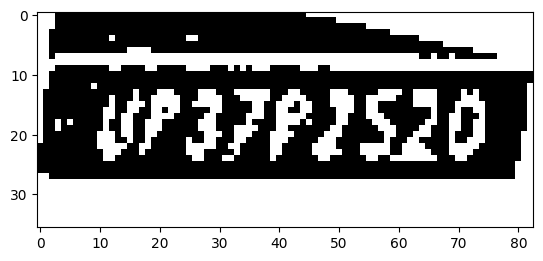

height =  312 width =  316


[157.78530883789062, 190.04293823242188, 241.8779754638672, 227.44305419921875, 0.9071856737136841, 0.0] track_id: 78.0
-0.23109066719589708


['MFafSZu']
license before check MFafSZu
hello
License Plate Number with contours :  None , Score :  None
-0.20232162837830375
['VP37F2520']
license before check VP37F2520
license after check VP37F2520
License Plate Number :  VP37F2520 , Score :  0.21178632314135462


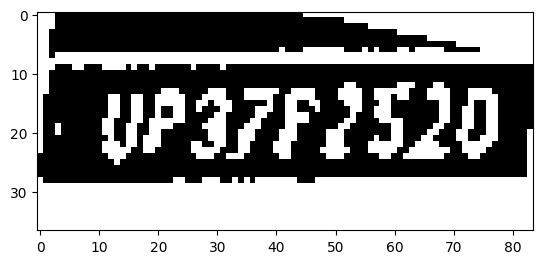

height =  324 width =  329


[165.22097778320312, 199.39776611328125, 252.4578094482422, 240.06919860839844, 0.9098955392837524, 0.0] track_id: 78.0
-0.20795854725293414


['Ur3782520']
license before check Ur3782520
hello
License Plate Number with contours :  None , Score :  None
-0.2213144423477913
['UP37P2570']
license before check UP37P2570
license after check UP37P2570
License Plate Number :  UP37P2570 , Score :  0.7228614265405043


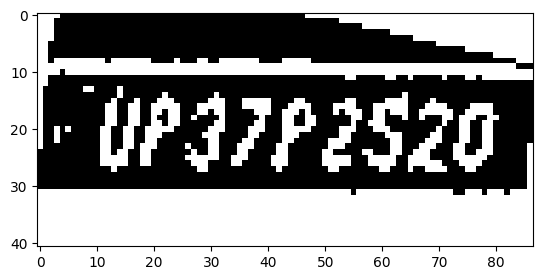

height =  336 width =  343


[173.76492309570312, 208.7420654296875, 265.5236511230469, 250.80528259277344, 0.9115357398986816, 0.0] track_id: 78.0
-0.2049999760035741


['vr97rz520']
license before check vr97rz520
hello
License Plate Number with contours :  None , Score :  None
-0.2063238940297175
['UP3ZP2520']
license before check UP3ZP2520
license after check UP3ZP2520
License Plate Number :  UP3ZP2520 , Score :  0.37938030612575113


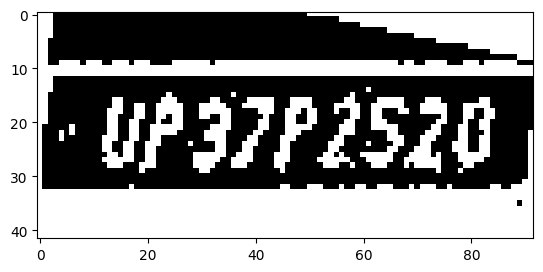

height =  350 width =  359


[184.49111938476562, 219.53358459472656, 279.0743408203125, 261.5061950683594, 0.9065956473350525, 0.0] track_id: 78.0
-0.20749622643520266
['UP37P2520']
license before check UP37P2520
license after check UP37P2520
License Plate Number with contours :  UP37P2520 , Score :  0.19977260777281297


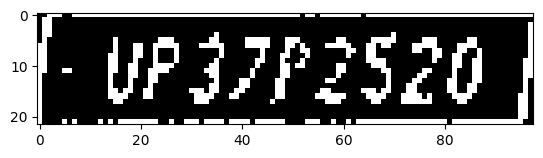

height =  106 width =  104
height =  361 width =  374


[191.5469207763672, 227.865966796875, 290.6785583496094, 273.6400451660156, 0.9028908610343933, 0.0] track_id: 78.0
0.42099057425224573


[]
License Plate Number with contours :  None , Score :  None
-0.2058341781041252
['UP3782520']
license before check UP3782520
hello
License Plate Number :  None , Score :  None
height =  106 width =  106
height =  374 width =  390


[202.98915100097656, 239.67633056640625, 305.42425537109375, 285.1606750488281, 0.9116811752319336, 0.0] track_id: 78.0
-0.20795854725293414
['UF37p2520']
license before check UF37p2520
license after check UF37P2520
License Plate Number with contours :  UF37P2520 , Score :  0.4476327992189423


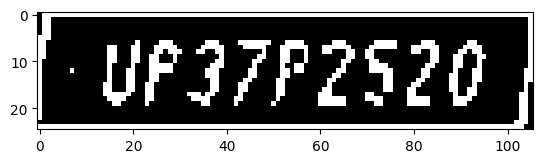

height =  105 width =  108
height =  388 width =  411


[217.93629455566406, 248.5846405029297, 326.2049865722656, 294.447509765625, 0.9081106185913086, 0.0] track_id: 78.0
-0.20431586460012127
['UPJZP2520']
license before check UPJZP2520
license after check UPJZP2520
License Plate Number with contours :  UP3ZP2520 , Score :  0.8794847172470192


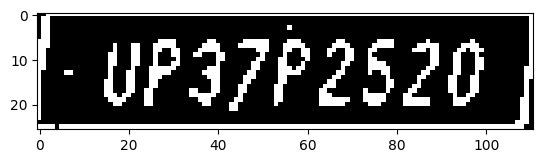

height =  103 width =  108
height =  402 width =  435


[233.5555877685547, 260.2877197265625, 346.4664306640625, 308.3689270019531, 0.9063438773155212, 0.0] track_id: 78.0
-0.20131710837464076
['UP37P2520']
license before check UP37P2520
license after check UP37P2520
License Plate Number with contours :  UP37P2520 , Score :  0.520853538091505


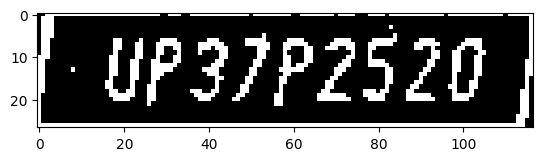

height =  102 width =  108
height =  425 width =  459


[250.31629943847656, 275.4429626464844, 367.5459289550781, 327.6532897949219, 0.9123203754425049, 0.0] track_id: 78.0
-0.19063890591409552


['UpaTPzSZu']
license before check UpaTPzSZu
hello
License Plate Number with contours :  None , Score :  None
-0.20846521837998772
['UP3ZP252O']
license before check UP3ZP252O
license after check UP3ZP252O
License Plate Number :  UP3ZP2520 , Score :  0.38340261986469687


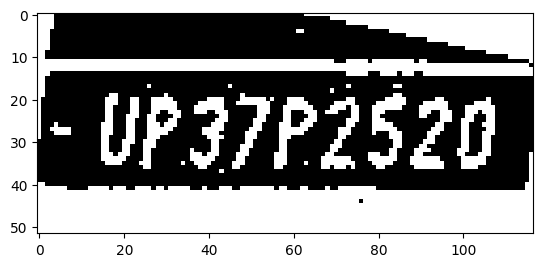

height =  101 width =  108
height =  447 width =  485


[269.89263916015625, 294.60845947265625, 392.1533508300781, 345.5700378417969, 0.9181663393974304, 0.0] track_id: 78.0
-0.2063238940297175
['UP37P2520']
license before check UP37P2520
license after check UP37P2520
License Plate Number with contours :  UP37P2520 , Score :  0.6032757656857113


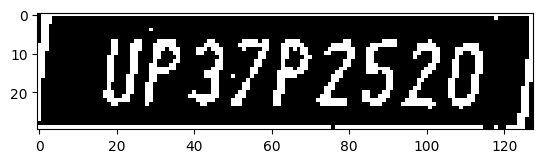

height =  101 width =  113
height =  472 width =  513


[290.0290222167969, 311.6417541503906, 420.12286376953125, 365.6605529785156, 0.9121556878089905, 0.0] track_id: 78.0
-0.20612134187530706
['UP37P2520']
license before check UP37P2520
license after check UP37P2520
License Plate Number with contours :  UP37P2520 , Score :  0.661507842673978


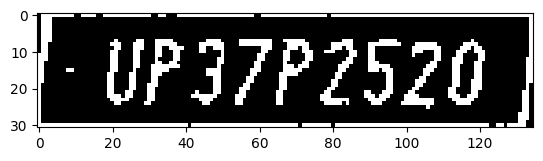

height =  101 width =  116
height =  499 width =  546


[313.36956787109375, 330.4729309082031, 449.08233642578125, 386.7466735839844, 0.9148050546646118, 0.0] track_id: 78.0
-0.20883089364403962
['UP37P2520']
license before check UP37P2520
license after check UP37P2520
License Plate Number with contours :  UP37P2520 , Score :  0.71379041127299


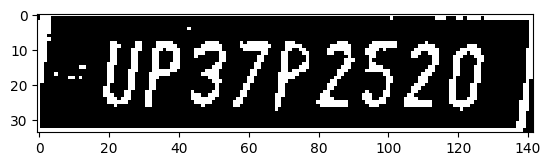

height =  101 width =  118
height =  529 width =  583


[341.2491455078125, 350.42388916015625, 483.96087646484375, 409.7671203613281, 0.9155932068824768, 0.0] track_id: 78.0
-0.2099735128621634
['UP37P2520']
license before check UP37P2520
license after check UP37P2520
License Plate Number with contours :  UP37P2520 , Score :  0.9591646316534971


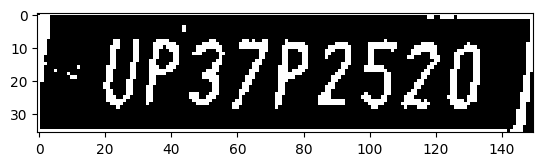

height =  99 width =  117
height =  561 width =  622


[370.725341796875, 374.87188720703125, 521.0136108398438, 439.7008361816406, 0.9131516218185425, 0.0] track_id: 78.0
-0.19612167518864182
['UP3ZP2520']
license before check UP3ZP2520
license after check UP3ZP2520
License Plate Number with contours :  UP3ZP2520 , Score :  0.8282845048162434


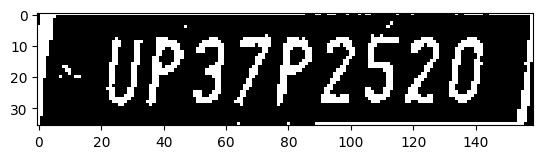

height =  100 width =  120
height =  597 width =  667


[405.916015625, 401.3862609863281, 565.8185424804688, 468.59222412109375, 0.9114923477172852, 0.0] track_id: 78.0
-0.2086817623350266
['UP37P2520']
license before check UP37P2520
license after check UP37P2520
License Plate Number with contours :  UP37P2520 , Score :  0.8541497758732963


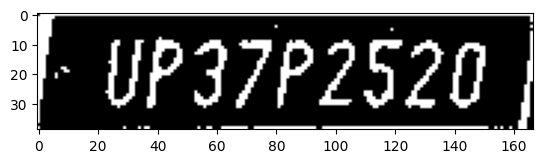

height =  100 width =  121
height =  634 width =  717


[444.83734130859375, 434.0016174316406, 616.5180053710938, 504.1356201171875, 0.9208663702011108, 0.0] track_id: 78.0
-0.21147913567274096
['UP37P2520']
license before check UP37P2520
license after check UP37P2520
License Plate Number with contours :  UP37P2520 , Score :  0.7924439635751889


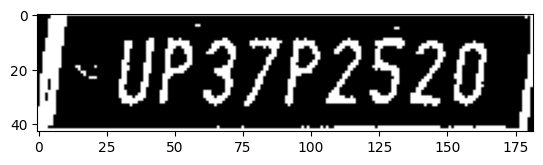

height =  99 width =  122
height =  680 width =  773


[494.10235595703125, 470.0950927734375, 677.2573852539062, 547.440185546875, 0.9209510684013367, 0.0] track_id: 78.0
-0.22370527710280294
['UP37P2520']
license before check UP37P2520
license after check UP37P2520
License Plate Number with contours :  UP37P2520 , Score :  0.8827646114910149


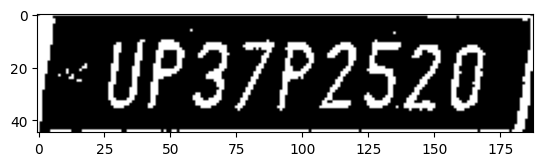

height =  100 width =  123
height =  730 width =  838


[555.3009643554688, 511.94873046875, 745.1701049804688, 594.6969604492188, 0.9125341773033142, 0.0] track_id: 78.0
-0.22970370553323546
['UP3ZP252O']
license before check UP3ZP252O
license after check UP3ZP252O
License Plate Number with contours :  UP3ZP2520 , Score :  0.3215362892553657


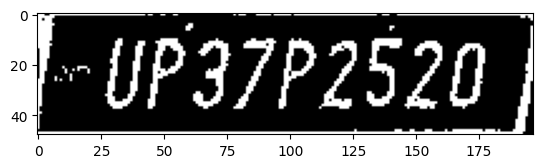

height =  100 width =  125
height =  786 width =  924


[638.6218872070312, 558.6248779296875, 835.0244750976562, 649.9708251953125, 0.9118769764900208, 0.0] track_id: 78.0
-0.24156570709532596
['UP37P252O']
license before check UP37P252O
license after check UP37P252O
License Plate Number with contours :  UP37P2520 , Score :  0.7589825353064819


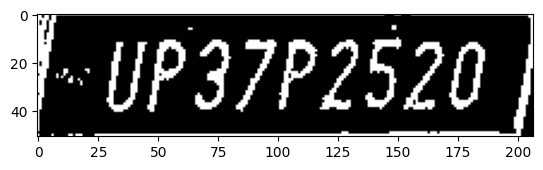

height =  98 width =  124
height =  852 width =  1004


[722.9427490234375, 608.859375, 927.7935180664062, 712.6101684570312, 0.9157477021217346, 0.0] track_id: 78.0
-0.2808377246212029
['UP37P252O']
license before check UP37P252O
license after check UP37P252O
License Plate Number with contours :  UP37P2520 , Score :  0.6831471117829108


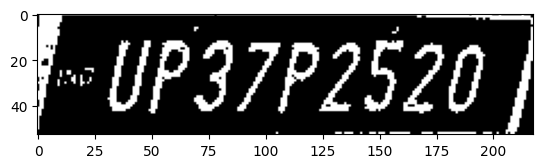

height =  101 width =  127
height =  929 width =  1084


[810.8980102539062, 672.58447265625, 1016.65185546875, 785.6805419921875, 0.9143325686454773, 0.0] track_id: 78.0
-0.3292692097089461


['I']
license before check I
hello
License Plate Number with contours :  None , Score :  None
-0.3139987716844353
['UP37P2520']
license before check UP37P2520
license after check UP37P2520
License Plate Number :  UP37P2520 , Score :  0.761340681580901


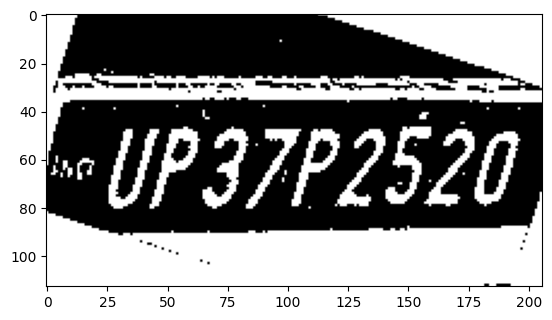

height =  100 width =  126
height =  1015 width =  1172


[917.0665893554688, 730.2723388671875, 1119.986572265625, 868.4633178710938, 0.9161171317100525, 0.0] track_id: 78.0
-0.3693336576736256
['UP37P2520']
license before check UP37P2520
license after check UP37P2520
License Plate Number with contours :  UP37P2520 , Score :  0.7856642602380783


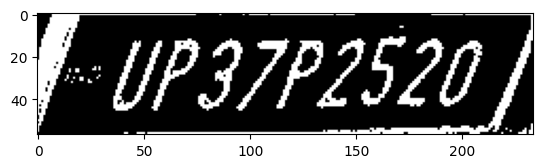

height =  101 width =  124
height =  1114 width =  1268


[1036.7198486328125, 799.3082885742188, 1233.8646240234375, 965.376708984375, 0.879645824432373, 0.0] track_id: 78.0
-0.45364794231414085


[]
License Plate Number with contours :  None , Score :  None
-0.4549142065923795
['UP37p2520']
license before check UP37p2520
license after check UP37P2520
License Plate Number :  UP37P2520 , Score :  0.644909242901617


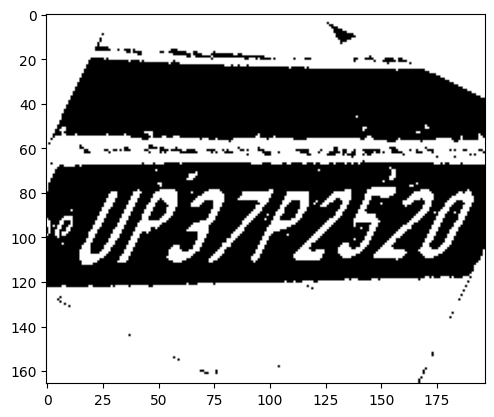

height =  101 width =  124
height =  1225 width =  1367
height =  100 width =  124
height =  1325 width =  1473
height =  100 width =  125
height =  1367 width =  1592
height =  99 width =  122
height =  1360 width =  1713
height =  98 width =  120
height =  1349 width =  1740
height =  97 width =  121
height =  1338 width =  1671
height =  100 width =  124
height =  1307 width =  1584
height =  101 width =  123
height =  1278 width =  1484
height =  100 width =  123
height =  1242 width =  1356
height =  99 width =  124
height =  1206 width =  1206
height =  98 width =  123
height =  1124 width =  1032
height =  99 width =  123
height =  1030 width =  824
height =  96 width =  121
height =  96 width =  240
[177.79884338378906, 61.08674621582031, 221.2517852783203, 73.37164306640625, 0.861794114112854, 0.0] track_id: 87.0
0.0
height =  99 width =  124
height =  101 width =  122
height =  108 width =  301
[243.66146850585938, 68.65018463134766, 288.5450744628906, 86.25587463378906, 0.86

[296.0947265625, 96.79141998291016, 340.7182312011719, 117.14775848388672, 0.8452836871147156, 0.0] track_id: 87.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  95 width =  111
height =  95 width =  114
height =  98 width =  122
height =  172 width =  398


[344.55010986328125, 127.40670013427734, 387.9292297363281, 147.15084838867188, 0.8928242325782776, 0.0] track_id: 87.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  98 width =  117
height =  182 width =  411


[357.595458984375, 140.46517944335938, 399.0716552734375, 158.65150451660156, 0.8336437940597534, 0.0] track_id: 87.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  97 width =  115
height =  194 width =  420


[368.65771484375, 151.931640625, 409.2961120605469, 170.7222137451172, 0.824052631855011, 0.0] track_id: 87.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  99 width =  118
height =  205 width =  428


[379.61181640625, 162.09056091308594, 420.5551452636719, 182.27609252929688, 0.8470662236213684, 0.0] track_id: 87.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  209 width =  438


[391.0546875, 167.81381225585938, 427.5726623535156, 188.9596405029297, 0.8606357574462891, 0.0] track_id: 87.0
0.01817981507297828


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  99 width =  116
height =  217 width =  442


[401.5982666015625, 176.93821716308594, 438.8370361328125, 197.669189453125, 0.8063280582427979, 0.0] track_id: 87.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  98 width =  113
height =  224 width =  451


[413.7665710449219, 185.8853302001953, 449.1419372558594, 206.99314880371094, 0.849896252155304, 0.0] track_id: 87.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  97 width =  112
height =  236 width =  456


[422.78082275390625, 199.7082977294922, 454.57464599609375, 219.548583984375, 0.8389701247215271, 0.0] track_id: 87.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  98 width =  114
height =  250 width =  462


[431.4026794433594, 210.2025146484375, 461.3305358886719, 231.2086944580078, 0.39024782180786133, 0.0] track_id: 87.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  98 width =  114
height =  259 width =  468
height =  97 width =  111
height =  272 width =  470
height =  95 width =  110
height =  282 width =  474
height =  95 width =  112
height =  291 width =  474
height =  95 width =  112
height =  300 width =  472
height =  94 width =  111
height =  310 width =  468
height =  94 width =  111
height =  318 width =  421
height =  96 width =  112
height =  312 width =  358
height =  95 width =  111
height =  289 width =  291
height =  93 width =  110
height =  265 width =  224
height =  93 width =  111
height =  242 width =  157
height =  96 width =  113
height =  95 width =  112
height =  94 width =  111
height =  92 width =  110
height =  95 width =  113
height =  94 width =  113
height =  93 width =  112
height =  91 width =  110
height =  94 width =  113
height =  95 width =  112
height =  95 width =  111
height =  97 width = 

[415.69989013671875, 175.84823608398438, 460.7221374511719, 195.7823486328125, 0.8993464112281799, 0.0] track_id: 97.0
0.07878396098914381


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  95 width =  111
height =  226 width =  491


[444.73736572265625, 196.6296844482422, 488.2216796875, 217.11444091796875, 0.9025204181671143, 0.0] track_id: 97.0
0.08673833867598511


[]
License Plate Number with contours :  None , Score :  None
0.0
['fiOtl']
license before check fiOtl
hello
License Plate Number :  None , Score :  None
height =  96 width =  113
height =  243 width =  513


[464.3945007324219, 219.19261169433594, 506.3670349121094, 239.08851623535156, 0.8776443600654602, 0.0] track_id: 97.0
0.0


['41T']
license before check 41T
hello
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  97 width =  114
height =  257 width =  524


[480.8447265625, 236.28573608398438, 520.6792602539062, 257.0, 0.7337554097175598, 0.0] track_id: 97.0
-0.017542060057402487


[]
License Plate Number with contours :  None , Score :  None
0.0
['3E1F']
license before check 3E1F
hello
License Plate Number :  None , Score :  None
height =  49 width =  163
height =  96 width =  112
height =  288 width =  543


[499.2379150390625, 258.791259765625, 536.89208984375, 282.3426513671875, 0.5559518337249756, 0.0] track_id: 97.0
0.08673833867598511


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  94 width =  110
height =  309 width =  554
height =  53 width =  163
height =  95 width =  111
height =  328 width =  558
height =  97 width =  112
height =  349 width =  565
height =  97 width =  112
height =  361 width =  511
height =  97 width =  112
height =  347 width =  414
height =  98 width =  112
height =  334 width =  313
height =  98 width =  113
height =  281 width =  215
height =  97 width =  112
height =  98 width =  112
height =  100 width =  113
height =  98 width =  112
height =  97 width =  110
height =  95 width =  108
height =  97 width =  111
height =  99 width =  114
height =  97 width =  112
height =  96 width =  111
height =  97 width =  114
height =  96 width =  111
height =  96 width =  110
height =  95 width =  108
height =  94 width =  106
height =  93 width =  106
height =  95 width =  108
height =  95 width =  108
height =  96 width =

[277.0376892089844, 82.23641967773438, 322.258544921875, 96.4668197631836, 0.8670404553413391, 0.0] track_id: 102.0
0.01538340178059515


[]
License Plate Number with contours :  None , Score :  None
0.0
['tld']
license before check tld
hello
License Plate Number :  None , Score :  None
height =  98 width =  110
height =  126 width =  344
[282.5450744628906, 88.06723022460938, 327.0917663574219, 103.23175048828125, 0.8904528617858887, 0.0] track_id: 102.0
0.0
height =  97 width =  109
height =  95 width =  108
height =  94 width =  108
height =  157 width =  362
[310.16290283203125, 114.11699676513672, 354.2279357910156, 129.63792419433594, 0.8862972259521484, 0.0] track_id: 102.0
0.0
height =  93 width =  107
height =  94 width =  108
height =  93 width =  108
height =  92 width =  108
height =  198 width =  400
[349.3971252441406, 157.37643432617188, 390.59173583984375, 174.20303344726562, 0.892214298248291, 0.0] track_id: 102.0
0.05992815512120789
height =  93 width =  109
height =  95 width =  111
height =  95 width =  111
height =  96 width =  112
height =  95 width =  112
height =  247 width =  448


[413.5671691894531, 210.80392456054688, 447.1432189941406, 230.30690002441406, 0.6014224886894226, 0.0] track_id: 102.0
0.08550529367820464


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  95 width =  111
height =  263 width =  458
[424.5592956542969, 225.4385223388672, 457.1592102050781, 250.58673095703125, 0.430481493473053, 0.0] track_id: 102.0
0.11710874456686428
height =  93 width =  108
height =  277 width =  460
[428.8356018066406, 237.162841796875, 458.5621337890625, 262.46258544921875, 0.5951834917068481, 0.0] track_id: 102.0
0.12435499454676144
height =  93 width =  108
height =  293 width =  472


[73.73855590820312, 212.98512268066406, 146.9217987060547, 291.1254577636719, 0.3949563801288605, 0.0] track_id: 102.0
0.2958197685389974


[]
License Plate Number with contours :  None , Score :  None
0.31327618099367155
[]
License Plate Number :  None , Score :  None
height =  94 width =  108
height =  313 width =  464
height =  95 width =  109
height =  95 width =  109
height =  95 width =  109
height =  96 width =  108
height =  97 width =  110
height =  96 width =  110
height =  71 width =  253
[195.8820343017578, 30.995235443115234, 237.94131469726562, 42.658077239990234, 0.7941496968269348, 0.0] track_id: 103.0
-0.03894134309703925
height =  96 width =  109
height =  75 width =  249
[194.6368408203125, 35.37533187866211, 235.77682495117188, 47.673770904541016, 0.8507166504859924, 0.0] track_id: 103.0
-0.03277514440407577
height =  96 width =  110
height =  287 width =  151
height =  83 width =  264
[204.8152313232422, 39.656673431396484, 247.57337951660156, 51.28777313232422, 0.8626841902732849, 0.0] track_id: 103.0
0.0
height =  97 width =  110
height =  272 width =  90
height =  85 width =  273
[213.45169067382812

[230.17262268066406, 51.63871765136719, 274.12921142578125, 64.73037719726562, 0.8796586394309998, 0.0] track_id: 103.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  96 width =  111
height =  98 width =  301
[240.9810333251953, 57.0332145690918, 285.7064208984375, 69.68391418457031, 0.8504115343093872, 0.0] track_id: 103.0
0.0
height =  96 width =  112
height =  105 width =  311
[250.30520629882812, 61.939605712890625, 296.0581359863281, 75.5611801147461, 0.8489274382591248, 0.0] track_id: 103.0
0.0
height =  98 width =  113
height =  109 width =  319
[261.208251953125, 67.2335205078125, 307.72064208984375, 81.01203155517578, 0.8312220573425293, 0.0] track_id: 103.0
0.0
height =  97 width =  112
height =  118 width =  328
[269.2264404296875, 73.53968048095703, 315.52178955078125, 88.18312072753906, 0.8283930420875549, 0.0] track_id: 103.0
0.012986282920172483
height =  99 width =  114
height =  126 width =  337


[279.1205749511719, 80.66709899902344, 326.4592590332031, 95.71768951416016, 0.7744882702827454, 0.0] track_id: 103.0
0.01538340178059515


[]
License Plate Number with contours :  None , Score :  None
0.0
['haIni']
license before check haIni
hello
License Plate Number :  None , Score :  None
height =  100 width =  115
height =  132 width =  349
[291.5263671875, 87.75196075439453, 339.4586181640625, 103.97949981689453, 0.8798691034317017, 0.0] track_id: 103.0
0.03844259002118798
height =  100 width =  116
height =  142 width =  358


[303.0860900878906, 96.0775375366211, 349.5811462402344, 112.23761749267578, 0.8794375061988831, 0.0] track_id: 103.0
0.05654343694481738


[]
License Plate Number with contours :  None , Score :  None
0.0
['ELUJ1']
license before check ELUJ1
hello
License Plate Number :  None , Score :  None
height =  99 width =  114
height =  150 width =  366


[314.2957458496094, 104.99351501464844, 359.06640625, 120.43448638916016, 0.8872084021568298, 0.0] track_id: 103.0
0.05258306161094172


[]
License Plate Number with contours :  None , Score :  None
0.04995839572194276
['Jjiy']
license before check Jjiy
hello
License Plate Number :  None , Score :  None
height =  98 width =  115
height =  161 width =  380
[328.02838134765625, 115.03166961669922, 374.1786804199219, 131.27915954589844, 0.8937652707099915, 0.0] track_id: 103.0
0.04345089539153084
height =  98 width =  117
height =  174 width =  393
[342.3376770019531, 125.38602447509766, 388.03887939453125, 142.11488342285156, 0.88817298412323, 0.0] track_id: 103.0
0.03771795246686421
height =  100 width =  118
height =  184 width =  406
[355.384521484375, 134.14260864257812, 400.6051025390625, 151.581298828125, 0.8717132210731506, 0.0] track_id: 103.0
0.0
height =  99 width =  115
height =  189 width =  414
[366.1551208496094, 143.61985778808594, 410.1232604980469, 161.50732421875, 0.8903200626373291, 0.0] track_id: 103.0
0.0
height =  100 width =  116
height =  186 width =  423
[377.9012451171875, 148.68768310546875, 421

[438.09466552734375, 209.22528076171875, 470.885009765625, 229.7998046875, 0.721233606338501, 0.0] track_id: 103.0
0.0
[369.85992431640625, 4.298576831817627, 469.139404296875, 91.69304656982422, 0.34302085638046265, 0.0] track_id: 103.0
0.2810207407245768
['aES050T', '06l64T']
license before check aES050T06l64T
hello
License Plate Number :  None , Score :  None
height =  98 width =  110
height =  261 width =  479


[446.238037109375, 221.0832977294922, 478.9068908691406, 240.3543701171875, 0.7858163714408875, 0.0] track_id: 103.0
0.020830320036217084


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  98 width =  110
height =  276 width =  486


[120.4352035522461, 190.24368286132812, 198.8775634765625, 271.7712707519531, 0.5115328431129456, 0.0] track_id: 103.0
0.29544083714372


[]
License Plate Number with contours :  None , Score :  None
0.3139382133365411
[]
License Plate Number :  None , Score :  None
[457.9061584472656, 235.060302734375, 485.686767578125, 253.57423400878906, 0.45448845624923706, 0.0] track_id: 103.0
0.0
height =  98 width =  110
height =  288 width =  488


[465.1815490722656, 246.9813995361328, 488.0, 273.5970458984375, 0.8392794132232666, 0.0] track_id: 103.0
-0.024385409172718538


[]
License Plate Number with contours :  None , Score :  None
['13']
license before check 13
hello
License Plate Number :  None , Score :  None
height =  98 width =  110
height =  300 width =  493
[472.0787353515625, 259.5060119628906, 493.0, 283.2081604003906, 0.6313121318817139, 0.0] track_id: 103.0
height =  98 width =  111
height =  311 width =  497
height =  99 width =  111
height =  318 width =  495
height =  99 width =  111
height =  324 width =  451


[182.1734619140625, 243.79757690429688, 270.1840515136719, 323.5468444824219, 0.4874369204044342, 0.0] track_id: 103.0
0.3693336576736256


[]
License Plate Number with contours :  None , Score :  None
0.38248657254393253
[]
License Plate Number :  None , Score :  None
height =  98 width =  110
height =  321 width =  387


[116.27606964111328, 224.7936553955078, 206.35671997070312, 318.55816650390625, 0.4656389057636261, 0.0] track_id: 103.0
0.3656023317069669


[]
License Plate Number with contours :  None , Score :  None
0.3686959026580498
[]
License Plate Number :  None , Score :  None
height =  98 width =  110
height =  304 width =  323
height =  98 width =  110
height =  274 width =  255
height =  100 width =  113
height =  249 width =  188
height =  100 width =  112
height =  230 width =  121
height =  99 width =  112
height =  100 width =  112
height =  100 width =  112
height =  100 width =  112
height =  100 width =  112
height =  100 width =  112
height =  100 width =  113
height =  100 width =  112
height =  99 width =  111
height =  99 width =  111
height =  99 width =  111
height =  99 width =  110
height =  99 width =  111
height =  99 width =  111
height =  98 width =  112
height =  100 width =  113
height =  100 width =  113
height =  98 width =  113
height =  97 width =  113
height =  98 width =  112
height =  100 width =  113
height =  99 width =  111
height =  100 width =  112
height =  98 width =  110
height =  97 width =  

[264.49786376953125, 55.47369384765625, 299.82244873046875, 69.29820251464844, 0.7436566352844238, 0.0] track_id: 108.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  93 width =  105
height =  95 width =  322


[269.1527099609375, 60.80402374267578, 304.8561706542969, 74.04984283447266, 0.6967804431915283, 0.0] track_id: 108.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  92 width =  105
height =  100 width =  330


[277.8087463378906, 63.18878173828125, 314.49896240234375, 78.73114013671875, 0.7749655246734619, 0.0] track_id: 108.0
0.022723360841641064


[]
License Plate Number with contours :  None , Score :  None
0.0
['D1E']
license before check D1E
hello
License Plate Number :  None , Score :  None
height =  92 width =  106
height =  104 width =  337


[285.77587890625, 68.5107650756836, 321.8134765625, 83.6540298461914, 0.8486593961715698, 0.0] track_id: 108.0
0.033320995878247196


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  92 width =  108
height =  107 width =  339
[290.67913818359375, 75.04825592041016, 325.253662109375, 86.99044036865234, 0.7385393381118774, 0.0] track_id: 108.0
0.0
height =  92 width =  109
height =  112 width =  346


[298.3310241699219, 78.97837829589844, 332.9266662597656, 92.64950561523438, 0.8140131235122681, 0.0] track_id: 108.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['0EZ']
license before check 0EZ
hello
License Plate Number :  None , Score :  None
height =  92 width =  110
height =  117 width =  352


[304.0392761230469, 82.76103210449219, 339.74322509765625, 98.57161712646484, 0.8678116798400879, 0.0] track_id: 108.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['D1tEE']
license before check D1tEE
hello
License Plate Number :  None , Score :  None
height =  95 width =  116
height =  123 width =  361
[313.622314453125, 88.6592025756836, 348.715087890625, 104.30069732666016, 0.7962669730186462, 0.0] track_id: 108.0
0.0
height =  95 width =  117
height =  130 width =  371
[321.5460205078125, 95.42863464355469, 357.14678955078125, 109.1897964477539, 0.4466724097728729, 0.0] track_id: 108.0
0.026309717252922193
height =  92 width =  112
height =  135 width =  374
[326.7198181152344, 100.24515533447266, 360.4002685546875, 115.56987762451172, 0.8189027309417725, 0.0] track_id: 108.0
0.03277514440407577
height =  91 width =  112
height =  140 width =  374
[327.865478515625, 107.0373764038086, 361.8210144042969, 121.77515411376953, 0.8476505875587463, 0.0] track_id: 108.0
0.0
height =  91 width =  115
height =  148 width =  377
[333.46746826171875, 113.88939666748047, 366.95672607421875

[238.32057189941406, 75.32202911376953, 276.01019287109375, 89.12081146240234, 0.7436472177505493, 0.0] track_id: 111.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['Oi4t']
license before check Oi4t
hello
License Plate Number :  None , Score :  None
height =  90 width =  116
height =  248 width =  444
height =  112 width =  302


[248.30885314941406, 79.51358795166016, 287.09405517578125, 94.45664978027344, 0.8157802820205688, 0.0] track_id: 111.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['21LE']
license before check 21LE
hello
License Plate Number :  None , Score :  None
height =  89 width =  110
height =  250 width =  444
height =  114 width =  304


[252.0330047607422, 82.61026763916016, 290.548828125, 97.53398895263672, 0.8028326630592346, 0.0] track_id: 111.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['Dui']
license before check Dui
hello
License Plate Number :  None , Score :  None
height =  89 width =  111
height =  253 width =  445
height =  119 width =  311
[257.73004150390625, 87.79802703857422, 295.86285400390625, 103.95906829833984, 0.860707700252533, 0.0] track_id: 111.0
0.01999733397315053
height =  88 width =  111
height =  257 width =  449
height =  127 width =  318


[263.65203857421875, 96.17376708984375, 301.8137512207031, 111.77362060546875, 0.882167637348175, 0.0] track_id: 111.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['pinvz']
license before check pinvz
hello
License Plate Number :  None , Score :  None
height =  88 width =  111
height =  261 width =  443
height =  133 width =  326
[271.14208984375, 101.84609985351562, 309.8591003417969, 118.57821655273438, 0.9059176445007324, 0.0] track_id: 111.0
-0.014284742587396631
height =  87 width =  111
height =  264 width =  435
height =  269 width =  402
height =  276 width =  368
height =  86 width =  110
height =  276 width =  332
height =  160 width =  355


[301.15362548828125, 128.04641723632812, 338.21337890625, 145.20089721679688, 0.8981907963752747, 0.0] track_id: 111.0
0.03224688243525392


[]
License Plate Number with contours :  None , Score :  None
0.0
['0i413']
license before check 0i413
hello
License Plate Number :  None , Score :  None
height =  87 width =  113
height =  253 width =  302
height =  211 width =  265
height =  87 width =  116
height =  88 width =  117
height =  187 width =  196
height =  188 width =  381


[334.3508605957031, 155.80613708496094, 366.3810119628906, 173.62579345703125, 0.8857160806655884, 0.0] track_id: 111.0
0.01587168299179005


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  95 width =  131
height =  88 width =  119
height =  185 width =  161
height =  192 width =  378


[333.8460693359375, 160.4091796875, 365.9036865234375, 177.8545684814453, 0.8736490607261658, 0.0] track_id: 111.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  90 width =  121
height =  177 width =  127
height =  193 width =  383


[340.1106262207031, 162.29624938964844, 371.615234375, 179.8662872314453, 0.8952234387397766, 0.0] track_id: 111.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['J1t']
license before check J1t
hello
License Plate Number :  None , Score :  None
height =  106 width =  155
height =  92 width =  113
height =  197 width =  381


[340.3783264160156, 166.62210083007812, 371.75872802734375, 184.12001037597656, 0.8986806869506836, 0.0] track_id: 111.0
0.07393903765794034


['12']
license before check 12
hello
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  106 width =  144
height =  91 width =  109
height =  208 width =  385


[344.3544616699219, 175.99473571777344, 373.447509765625, 194.3701934814453, 0.8877394795417786, 0.0] track_id: 111.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  217 width =  390


[350.1560363769531, 186.2182159423828, 378.7524108886719, 203.96841430664062, 0.8703563809394836, 0.0] track_id: 111.0
0.022218565326719057


[]
License Plate Number with contours :  None , Score :  None


[]
License Plate Number :  None , Score :  None
[351.1675109863281, 43.44863510131836, 390.0, 94.13880157470703, 0.3805341124534607, 0.0] track_id: 111.0
0.26916749278570046


['3Fat']
license before check 3Fat
hello
License Plate Number with contours :  None , Score :  None
-1.5273454314033659


[]
License Plate Number :  None , Score :  None
[0.9834907650947571, 35.659454345703125, 15.978612899780273, 60.422027587890625, 0.3441165089607239, 0.0] track_id: 111.0
[]
License Plate Number :  None , Score :  None
height =  111 width =  149
height =  230 width =  391


[354.074462890625, 197.05914306640625, 381.7251892089844, 216.2716064453125, 0.8776569366455078, 0.0] track_id: 111.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  113 width =  149
height =  89 width =  116
height =  236 width =  398


[359.896728515625, 203.09945678710938, 386.55322265625, 223.43728637695312, 0.8850078582763672, 0.0] track_id: 111.0
0.07304056530311932


[]
License Plate Number with contours :  None , Score :  None


[]
License Plate Number :  None , Score :  None
[0.1622842699289322, 40.71302795410156, 11.231919288635254, 53.275062561035156, 0.6915678381919861, 0.0] track_id: 111.0
[]
License Plate Number :  None , Score :  None
height =  93 width =  119
height =  246 width =  405


[366.35595703125, 209.29287719726562, 392.6940002441406, 231.01406860351562, 0.8651376962661743, 0.0] track_id: 111.0
0.2984989315861793


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  125 width =  152
height =  96 width =  120
height =  251 width =  403
height =  96 width =  118
height =  257 width =  401
height =  124 width =  158
height =  107 width =  202
height =  96 width =  118
height =  262 width =  401
height =  97 width =  119
height =  267 width =  403
height =  271 width =  402
height =  157 width =  167
height =  276 width =  399
height =  162 width =  170
height =  91 width =  116
height =  283 width =  399
height =  161 width =  172
height =  124 width =  166
height =  169 width =  180
height =  93 width =  112
height =  178 width =  181
height =  94 width =  114
height =  96 width =  116
height =  297 width =  319
height =  164 width =  187
height =  95 width =  116
height =  290 width =  281
height =  186 width =  190
height =  93 width =  116
height =  258 width =  243
height =  181 width =  189
height =  88 width =  116
height =  

[352.1076354980469, 125.87812805175781, 376.99432373046875, 143.083251953125, 0.8829564452171326, 0.0] track_id: 118.0
0.0


[]
License Plate Number with contours :  None , Score :  None
['blg']
license before check blg
hello
License Plate Number :  None , Score :  None
height =  176 width =  400


[362.0048522949219, 135.1502685546875, 400.0, 152.0802764892578, 0.9075000882148743, 0.0] track_id: 118.0
0.019228399099707208


[]
License Plate Number with contours :  None , Score :  None
0.0
['Die']
license before check Die
hello
License Plate Number :  None , Score :  None
height =  187 width =  418


[369.905517578125, 142.4038543701172, 408.1830139160156, 159.56350708007812, 0.8861852884292603, 0.0] track_id: 118.0
0.0


['JEZIF']
license before check JEZIF
hello
License Plate Number with contours :  None , Score :  None
0.06241880999595735
[]
License Plate Number :  None , Score :  None
height =  200 width =  433


[377.2227478027344, 150.5472412109375, 417.2342529296875, 167.91867065429688, 0.8703709244728088, 0.0] track_id: 118.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  204 width =  443


[383.6422119140625, 158.88226318359375, 421.404296875, 175.89695739746094, 0.8544986248016357, 0.0] track_id: 118.0
-0.031239833430268277


[]
License Plate Number with contours :  None , Score :  None
0.0
['01']
license before check 01
hello
License Plate Number :  None , Score :  None
height =  213 width =  452


[392.55084228515625, 167.35633850097656, 428.35552978515625, 185.74891662597656, 0.8491805791854858, 0.0] track_id: 118.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.08800737352774077
[]
License Plate Number :  None , Score :  None
height =  221 width =  471


[414.50872802734375, 175.96160888671875, 450.6549987792969, 194.5769500732422, 0.437758207321167, 0.0] track_id: 118.0
0.01999733397315053


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  226 width =  467


[412.8863525390625, 179.8872833251953, 448.8941955566406, 199.64085388183594, 0.6232240200042725, 0.0] track_id: 118.0
0.015150355874769811


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  232 width =  470


[416.2225646972656, 187.9729766845703, 452.6716613769531, 207.1899871826172, 0.3194447159767151, 0.0] track_id: 118.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.034469100999508014
[]
License Plate Number :  None , Score :  None
height =  74 width =  155
height =  235 width =  472


[420.6619567871094, 190.6820068359375, 454.54986572265625, 210.82965087890625, 0.7725685238838196, 0.0] track_id: 118.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  80 width =  155
height =  239 width =  464


[417.16796875, 198.67320251464844, 450.3256530761719, 219.9798126220703, 0.6756561398506165, 0.0] track_id: 118.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  82 width =  157
height =  82 width =  98
height =  255 width =  465


[409.42279052734375, 205.731201171875, 441.38385009765625, 226.70404052734375, 0.4899653196334839, 0.0] track_id: 118.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  259 width =  461


[415.62945556640625, 217.90318298339844, 444.9739074707031, 238.65245056152344, 0.5867097973823547, 0.0] track_id: 118.0
0.026309717252922193


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  85 width =  96
height =  273 width =  454


[412.5298156738281, 225.9977569580078, 442.2230224609375, 247.2851104736328, 0.2788277864456177, 0.0] track_id: 118.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  86 width =  96
height =  281 width =  466
height =  86 width =  94
height =  287 width =  471
height =  292 width =  480
[436.3922424316406, 246.92652893066406, 460.8875427246094, 269.0977478027344, 0.259658545255661, 0.0] track_id: 118.0
0.7853981633974483
height =  110 width =  320
height =  306 width =  484


[436.2310791015625, 258.4951477050781, 459.2852478027344, 282.46435546875, 0.5161632895469666, 0.0] track_id: 118.0
-0.018865686021670786


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  114 width =  326
[266.18157958984375, 67.90762329101562, 308.7004699707031, 82.68634033203125, 0.3151841461658478, 0.0] track_id: 119.0
0.0
height =  310 width =  472
height =  118 width =  333


[273.5233459472656, 70.78631591796875, 315.7248229980469, 87.11845397949219, 0.749233603477478, 0.0] track_id: 119.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['Dd']
license before check Dd
hello
License Plate Number :  None , Score :  None
height =  316 width =  477
height =  321 width =  446
height =  130 width =  343


[285.9232177734375, 81.29379272460938, 329.18707275390625, 97.41271209716797, 0.5555430054664612, 0.0] track_id: 119.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['pXX']
license before check pXX
hello
License Plate Number :  None , Score :  None
height =  329 width =  398
height =  136 width =  351
[293.6947021484375, 86.81983947753906, 337.4283752441406, 103.61600494384766, 0.580306887626648, 0.0] track_id: 119.0
0.0
height =  343 width =  353
height =  350 width =  369
height =  180 width =  132
height =  195 width =  93
height =  206 width =  404
height =  215 width =  409
height =  217 width =  412
height =  221 width =  417
height =  234 width =  427
height =  241 width =  433
height =  255 width =  435
height =  266 width =  437
height =  275 width =  441


[137.12481689453125, 207.40565490722656, 209.17739868164062, 274.5482177734375, 0.3538867235183716, 0.0] track_id: 119.0
0.3080527810237764


[]
License Plate Number with contours :  None , Score :  None
0.317458735254631
[]
License Plate Number :  None , Score :  None
height =  285 width =  445
height =  290 width =  453
height =  295 width =  455
height =  303 width =  458
[387.9025573730469, 141.02755737304688, 415.7083435058594, 168.0524444580078, 0.2917110323905945, 0.0] track_id: 119.0
0.47783105499211487
height =  307 width =  461
height =  312 width =  462
height =  322 width =  455
height =  330 width =  421
[152.60292053222656, 245.11273193359375, 234.24900817871094, 328.1502380371094, 0.6958918571472168, 0.0] track_id: 119.0
0.37049240570657377
height =  328 width =  379


[110.02323150634766, 231.30950927734375, 203.18128967285156, 324.0055847167969, 0.5246915817260742, 0.0] track_id: 119.0
0.3619587572377291


[]
License Plate Number with contours :  None , Score :  None
0.3603579705247931
[]
License Plate Number :  None , Score :  None
height =  322 width =  339
height =  305 width =  298
height =  286 width =  257


[169.1316375732422, 263.7221984863281, 257.0, 285.8826599121094, 0.3129613399505615, 0.0] track_id: 119.0
0.4398425828157362


[]
License Plate Number with contours :  None , Score :  None
0.43662715981354133
[]
License Plate Number :  None , Score :  None
height =  271 width =  215
[126.64366149902344, 249.4228973388672, 215.0, 270.9408874511719, 0.377897709608078, 0.0] track_id: 119.0
0.45660547189249395
height =  250 width =  173
height =  234 width =  133
height =  227 width =  91
height =  89 width =  126
height =  89 width =  122
height =  88 width =  125
height =  97 width =  124
height =  98 width =  127
height =  96 width =  130
height =  95 width =  129
height =  102 width =  135
height =  103 width =  135
height =  102 width =  138
height =  102 width =  138
height =  102 width =  136
height =  110 width =  139
height =  123 width =  147
height =  122 width =  148
height =  109 width =  149
height =  108 width =  150
height =  119 width =  153
height =  120 width =  154
height =  124 width =  156
height =  133 width =  159
height =  129 width =  155
height =  66 width =  237


[214.27554321289062, 28.362483978271484, 237.0, 38.19686508178711, 0.9013267159461975, 0.0] track_id: 125.0
0.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  73 width =  260
[220.8242950439453, 31.82761001586914, 255.05650329589844, 43.06598663330078, 0.8755848407745361, 0.0] track_id: 125.0
0.0
height =  77 width =  273


[226.43922424316406, 34.55344772338867, 261.7652893066406, 45.72862243652344, 0.873485803604126, 0.0] track_id: 125.0
-0.021273386024061203


[]
License Plate Number with contours :  None , Score :  None
['Dtn']
license before check Dtn
hello
License Plate Number :  None , Score :  None
height =  77 width =  278
[229.5265350341797, 36.85240936279297, 264.343994140625, 48.28275680541992, 0.8337572813034058, 0.0] track_id: 125.0
0.0
height =  82 width =  283


[234.43408203125, 41.454105377197266, 269.8578796386719, 52.49475860595703, 0.8241465091705322, 0.0] track_id: 125.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
[]
License Plate Number :  None , Score :  None
height =  84 width =  285
[235.3716278076172, 44.311344146728516, 271.5784912109375, 56.16663360595703, 0.8354530930519104, 0.0] track_id: 125.0
0.0
height =  92 width =  291
[242.76852416992188, 48.044212341308594, 278.2568359375, 60.22758483886719, 0.8879823684692383, 0.0] track_id: 125.0
0.0
height =  96 width =  294


[246.0759735107422, 52.039634704589844, 282.17840576171875, 64.34835815429688, 0.8484426140785217, 0.0] track_id: 125.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['2ZVD']
license before check 2ZVD
hello
License Plate Number :  None , Score :  None
height =  100 width =  297
[249.35586547851562, 55.71388244628906, 285.0182189941406, 67.51206970214844, 0.8459823727607727, 0.0] track_id: 125.0
0.0
height =  104 width =  303


[255.4805908203125, 60.380821228027344, 290.6569519042969, 72.02123260498047, 0.8409655690193176, 0.0] track_id: 125.0
0.0


[]
License Plate Number with contours :  None , Score :  None
0.0
['AD']
license before check AD
hello
License Plate Number :  None , Score :  None
height =  109 width =  307
[259.3666076660156, 64.12098693847656, 295.282958984375, 76.32318878173828, 0.8803397417068481, 0.0] track_id: 125.0
0.0
height =  119 width =  322
[274.89019775390625, 72.90469360351562, 310.4573059082031, 85.37957763671875, 0.88321852684021, 0.0] track_id: 125.0
0.0
height =  124 width =  328
[278.7438659667969, 77.95134735107422, 312.2623291015625, 90.09249877929688, 0.8266640901565552, 0.0] track_id: 125.0
0.04995839572194276
height =  129 width =  335
[283.0039978027344, 82.8282241821289, 316.83154296875, 94.98664855957031, 0.8634149432182312, 0.0] track_id: 125.0
0.0
height =  134 width =  343
[287.3345031738281, 88.42218017578125, 320.69891357421875, 100.55813598632812, 0.8755833506584167, 0.0] track_id: 125.0
0.028161566987892423
height =  138 width =  353
[293.0374755859375, 92.55406188964844, 325.5904846

[299.3558044433594, 99.3980941772461, 331.3843078613281, 112.20037078857422, 0.8923195004463196, 0.0] track_id: 125.0
0.08673833867598511


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  149 width =  368


[303.11572265625, 104.38821411132812, 335.8380126953125, 117.58629608154297, 0.9027388691902161, 0.0] track_id: 125.0
0.1297025371559121


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  157 width =  376
[307.7906188964844, 110.69745635986328, 338.9668273925781, 123.51480865478516, 0.8736655116081238, 0.0] track_id: 125.0
0.01587168299179005
height =  162 width =  385
[314.1591796875, 115.86246490478516, 344.1372985839844, 128.40895080566406, 0.8692441582679749, 0.0] track_id: 125.0
0.05258306161094172
height =  161 width =  392
[318.7975769042969, 115.44631958007812, 348.3782043457031, 128.5335693359375, 0.8812410831451416, 0.0] track_id: 125.0
0.061460955882765955
height =  158 width =  399
[321.49322509765625, 111.74642181396484, 351.3667907714844, 126.09548950195312, 0.8945503234863281, 0.0] track_id: 125.0
0.0
height =  161 width =  398
[327.8779296875, 118.13806915283203, 356.6282043457031, 131.6552734375, 0.8521143198013306, 0.0] track_id: 125.0
0.018865686021670786
height =  165 width =  401
[333.8790283203125, 121.80042266845703, 362.87438964

[352.0706787109375, 155.7447967529297, 377.876220703125, 169.31857299804688, 0.8574773073196411, 0.0] track_id: 125.0
0.05123716740341881


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  204 width =  377
[353.3345947265625, 161.37554931640625, 377.0, 176.29791259765625, 0.8866353034973145, 0.0] track_id: 125.0
height =  213 width =  379


[356.09063720703125, 168.5078887939453, 378.9950866699219, 183.69252014160156, 0.8583800196647644, 0.0] track_id: 125.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  218 width =  392
[361.2064514160156, 173.0067901611328, 385.26727294921875, 188.26927185058594, 0.8234736919403076, 0.0] track_id: 125.0
height =  218 width =  388
[364.0787658691406, 176.1824951171875, 387.54534912109375, 191.33023071289062, 0.8148314952850342, 0.0] track_id: 125.0
height =  220 width =  387


[365.90673828125, 181.7804718017578, 386.9338073730469, 196.7996368408203, 0.7894567251205444, 0.0] track_id: 125.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  224 width =  381
[367.8958740234375, 184.3744659423828, 381.0, 199.4783477783203, 0.7614814639091492, 0.0] track_id: 125.0
height =  226 width =  382
[370.26513671875, 187.3544158935547, 382.0, 202.75425720214844, 0.7788671851158142, 0.0] track_id: 125.0
height =  235 width =  390
height =  242 width =  390
height =  242 width =  390
height =  242 width =  392


[375.4364013671875, 198.8571014404297, 391.999755859375, 218.27212524414062, 0.42977452278137207, 0.0] track_id: 125.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  151 width =  199
height =  248 width =  401
[378.0107727050781, 204.47145080566406, 393.7979736328125, 221.1261749267578, 0.41793960332870483, 0.0] track_id: 125.0
height =  155 width =  199
height =  257 width =  421
[376.69140625, 207.5060272216797, 390.9442443847656, 225.8647003173828, 0.2520252764225006, 0.0] track_id: 125.0
0.7853981633974483
height =  156 width =  204
height =  272 width =  415
height =  155 width =  213
height =  269 width =  388


[0.4053029716014862, 159.28321838378906, 26.977792739868164, 269.0, 0.2618996202945709, 0.0] track_id: 125.0
-1.4317003853128254
[]
License Plate Number :  None , Score :  None
height =  167 width =  217
height =  277 width =  357
height =  169 width =  219
height =  276 width =  328
height =  173 width =  220
height =  274 width =  292


[17.512826919555664, 222.83135986328125, 111.01409912109375, 274.0, 0.4943978190422058, 0.0] track_id: 125.0
0.3649130991617934
[]
License Plate Number :  None , Score :  None
height =  185 width =  225
height =  268 width =  248
height =  189 width =  224
height =  191 width =  223
height =  199 width =  225
height =  185 width =  134
height =  177 width =  105
height =  173 width =  81
height =  90 width =  112
height =  86 width =  116
height =  81 width =  114
height =  82 width =  117
height =  85 width =  123
height =  82 width =  102
height =  86 width =  120
height =  85 width =  107
height =  88 width =  124
height =  93 width =  124
height =  104 width =  121
height =  97 width =  130
height =  109 width =  123
height =  99 width =  131
height =  114 width =  127
height =  103 width =  129
height =  118 width =  133
height =  104 width =  133
height =  122 width =  141
height =  109 width =  135
height =  132 width =  149
height =  109 width =  137
height =  134 width =  152


[510.4272766113281, 235.5709228515625, 544.95556640625, 259.0337829589844, 0.8239858746528625, 0.0] track_id: 140.0
0.0


[]
License Plate Number with contours :  None , Score :  None
-0.033320995878247196
['LQuz']
license before check LQuz
hello
License Plate Number :  None , Score :  None
height =  158 width =  130
height =  290 width =  555
[529.7644653320312, 253.21676635742188, 555.0, 277.87872314453125, 0.8185822367668152, 0.0] track_id: 140.0
-0.02499479361892016
height =  306 width =  566
[538.1021118164062, 272.8008117675781, 565.9137573242188, 294.5343322753906, 0.7747439742088318, 0.0] track_id: 140.0
0.0
height =  159 width =  94
height =  319 width =  571
[546.4681396484375, 288.31683349609375, 570.8341674804688, 307.54351806640625, 0.845307469367981, 0.0] track_id: 140.0
height =  337 width =  578
height =  350 width =  577
height =  353 width =  524
height =  343 width =  457
height =  323 width =  387
height =  299 width =  312
height =  261 width =  238
height =  123 width =  150
height =  235 width =  160
height =  140 width =  164
height =  149 width =  165
height =  149 width =  164
he

[362.1999206542969, 219.42303466796875, 372.0, 235.9259033203125, 0.4211154878139496, 0.0] track_id: 145.0


['I']
license before check I
hello
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  276 width =  342
height =  278 width =  310
height =  276 width =  280
height =  267 width =  247
height =  251 width =  216
height =  235 width =  183
height =  227 width =  150
height =  217 width =  117
height =  194 width =  86
height =  49 width =  164
height =  53 width =  164
height =  58 width =  178
height =  142 width =  168
height =  100 width =  207
height =  150 width =  171
height =  145 width =  171
height =  147 width =  171
height =  151 width =  175
height =  120 width =  122
height =  115 width =  125
height =  93 width =  120
height =  96 width =  123
height =  101 width =  124
height =  103 width =  128
height =  105 width =  133
height =  110 width =  138
height =  115 width =  142
height =  115 width =  138
height =  115 width =  142
height =  117 width =  143
height =  123 width =  143
height =  135 width =  145


[140.36532592773438, 150.19798278808594, 173.1226348876953, 171.7722930908203, 0.3864794671535492, 0.0] track_id: 170.0
-0.23554498072086333


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  238 width =  275
[146.6201171875, 175.55145263671875, 188.740478515625, 200.89598083496094, 0.8721597790718079, 0.0] track_id: 170.0
-0.22347660114063303
height =  235 width =  278
[148.74630737304688, 177.94578552246094, 192.18020629882812, 204.41990661621094, 0.8910215497016907, 0.0] track_id: 170.0
-0.22290023232837577
height =  242 width =  286
[149.42172241210938, 183.214111328125, 192.53463745117188, 207.4114227294922, 0.8846151232719421, 0.0] track_id: 170.0
-0.21336864215180798
height =  249 width =  293
[152.131591796875, 182.3035888671875, 195.74034118652344, 209.99476623535156, 0.8847037553787231, 0.0] track_id: 170.0
-0.22347660114063303
height =  254 width =  295
[154.23538208007812, 185.45628356933594, 198.58154296875, 213.16981506347656, 0.9148502945899963, 0.0] track_id: 170.0
-0.22785704871709972
height =  259 width =  293
[151.88243103027344, 189.591

[169.19927978515625, 222.25877380371094, 225.4130859375, 259.5687255859375, 0.9007685780525208, 0.0] track_id: 170.0
-0.2284966392918623


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  307 width =  344
[169.8809051513672, 227.98646545410156, 227.32785034179688, 264.9721984863281, 0.9074069857597351, 0.0] track_id: 170.0
-0.22527677921405528
height =  98 width =  85
height =  317 width =  351
[173.64706420898438, 231.29823303222656, 233.3789520263672, 270.5115051269531, 0.8841230273246765, 0.0] track_id: 170.0
-0.2058341781041252
height =  98 width =  84
height =  322 width =  355
[177.25204467773438, 238.4739532470703, 237.73092651367188, 277.3379211425781, 0.9067359566688538, 0.0] track_id: 170.0
-0.23996617377864618
height =  327 width =  366
[182.99429321289062, 245.17739868164062, 245.26968383789062, 284.6656494140625, 0.9011924862861633, 0.0] track_id: 170.0
-0.22390450013034954
height =  334 width =  369
[184.22625732421875, 251.85206604003906, 247.0364532470703, 292.68194580078125, 0.9141587615013123, 0.0] track_id: 170.0

[200.03091430664062, 267.257080078125, 266.6554260253906, 308.44873046875, 0.9200467467308044, 0.0] track_id: 170.0
-0.20749622643520266


[]
License Plate Number with contours :  None , Score :  None
-0.25825221981103874
[]
License Plate Number :  None , Score :  None
height =  363 width =  410
[207.9873809814453, 274.54473876953125, 276.2247314453125, 316.6273498535156, 0.9169169068336487, 0.0] track_id: 170.0
-0.22441600903714554
height =  373 width =  428


[216.36807250976562, 283.83758544921875, 286.0141296386719, 326.1575012207031, 0.9121955037117004, 0.0] track_id: 170.0
-0.22266094063636496


['35']
license before check 35
hello
License Plate Number with contours :  None , Score :  None
-0.22527677921405528
[]
License Plate Number :  None , Score :  None
height =  385 width =  441


[224.7040557861328, 290.9050598144531, 296.1700744628906, 335.09222412109375, 0.9165204167366028, 0.0] track_id: 170.0
-0.21866894587394195


['354']
license before check 354
hello
License Plate Number with contours :  None , Score :  None
-0.225601243836024
[]
License Plate Number :  None , Score :  None
height =  395 width =  457
[233.26898193359375, 300.11065673828125, 305.7976989746094, 346.1280822753906, 0.9161239266395569, 0.0] track_id: 170.0
-0.22747498047282771
height =  493 width =  591
[320.6528625488281, 388.7231140136719, 414.2658996582031, 446.8136291503906, 0.8980767726898193, 0.0] track_id: 170.0
-0.22112997453951658
height =  572 width =  710
[399.9400634765625, 465.522705078125, 512.5177612304688, 530.9730224609375, 0.8990058898925781, 0.0] track_id: 170.0
-0.22064718266034367
height =  604 width =  754


[422.2362365722656, 490.2113037109375, 540.535888671875, 558.043212890625, 0.8701146245002747, 0.0] track_id: 170.0
-0.22545836628305996


['151']
license before check 151
hello
License Plate Number with contours :  None , Score :  None
-0.2275674874105842
[]
License Plate Number :  None , Score :  None
height =  637 width =  791
[447.33050537109375, 518.122802734375, 569.027587890625, 588.3233642578125, 0.8838104009628296, 0.0] track_id: 170.0
-0.22347660114063303
height =  834 width =  1113


[699.114990234375, 716.2509765625, 853.5714721679688, 797.6536254882812, 0.8951393961906433, 0.0] track_id: 170.0
-0.26227253633223535


['7']
license before check 7
hello
License Plate Number with contours :  None , Score :  None
-0.27527242304563926
[]
License Plate Number :  None , Score :  None
height =  1353 width =  2109
height =  1391 width =  2169
height =  0 width =  2323
height =  149 width =  66
height =  162 width =  115
height =  175 width =  146
height =  177 width =  160
height =  116 width =  104
height =  176 width =  172
height =  118 width =  107
height =  172 width =  177
height =  117 width =  110
height =  174 width =  179
height =  118 width =  108
height =  178 width =  180
height =  119 width =  111
height =  180 width =  184
height =  123 width =  118
height =  184 width =  183
height =  127 width =  115
height =  188 width =  186
height =  126 width =  114
height =  192 width =  188
height =  124 width =  116
height =  191 width =  191
height =  122 width =  115
height =  195 width =  193
height =  119 width =  116
height =  198 width =  195
height =  115 width =  115
height =  203 width =  19

[96.69622802734375, 142.6871795654297, 156.1459197998047, 169.57568359375, 0.3930140733718872, 0.0] track_id: 177.0
0.0


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  141 width =  120
height =  236 width =  223
[97.18229675292969, 145.30296325683594, 157.23068237304688, 170.9021453857422, 0.608057975769043, 0.0] track_id: 177.0
-0.22785704871709972
height =  141 width =  119
height =  241 width =  229
[99.79533386230469, 148.30575561523438, 163.17445373535156, 173.1487274169922, 0.8245262503623962, 0.0] track_id: 177.0
-0.24497866312686414
height =  246 width =  234
[103.49308776855469, 151.8677520751953, 166.72879028320312, 176.58810424804688, 0.8337147831916809, 0.0] track_id: 177.0
-0.22347660114063303
height =  248 width =  240
[108.1133804321289, 153.83665466308594, 171.44796752929688, 178.81838989257812, 0.8868890404701233, 0.0] track_id: 177.0
0.15037142800713454
height =  253 width =  245
[110.8192138671875, 156.39537048339844, 176.33270263671875, 182.27244567871094, 0.8620477318763733, 0.0] track_id: 1

[118.18468475341797, 167.7383575439453, 189.25209045410156, 197.98193359375, 0.887161135673523, 0.0] track_id: 177.0
-0.19164849668667716


[]
License Plate Number with contours :  None , Score :  None
-0.24111767845146836
[]
License Plate Number :  None , Score :  None
height =  278 width =  266


[121.62152099609375, 170.6322479248047, 193.968017578125, 201.9488983154297, 0.8975161910057068, 0.0] track_id: 177.0
-0.22964244228513467


['pi']
license before check pi
hello
License Plate Number with contours :  None , Score :  None
-0.23441567572381078
[]
License Plate Number :  None , Score :  None
height =  285 width =  275
[126.25215148925781, 174.3651580810547, 200.52523803710938, 206.9425048828125, 0.8915169835090637, 0.0] track_id: 177.0
-0.19448011621510564
height =  289 width =  283


[129.63148498535156, 178.076416015625, 205.93592834472656, 212.2060089111328, 0.8974454998970032, 0.0] track_id: 177.0
-0.23923159996366056


['pOiic0']
license before check pOiic0
hello
License Plate Number with contours :  None , Score :  None
-0.2216495629786776
['PIEDILGQL']
license before check PIEDILGQL
hello
License Plate Number :  None , Score :  None
height =  294 width =  289
[133.381591796875, 181.95225524902344, 212.02381896972656, 216.0284881591797, 0.898967444896698, 0.0] track_id: 177.0
-0.22104706267501872
height =  300 width =  296
[135.45260620117188, 188.2669219970703, 215.9348907470703, 222.8577117919922, 0.899695098400116, 0.0] track_id: 177.0
-0.22679884805388587
height =  311 width =  304


[140.08151245117188, 194.52626037597656, 222.5731964111328, 229.5042724609375, 0.901972234249115, 0.0] track_id: 177.0
-0.21991427524262383


['Rant7603']
license before check Rant7603
hello
License Plate Number with contours :  None , Score :  None
-0.2172934309230211
['ExRIDALZ602']
license before check ExRIDALZ602
hello
License Plate Number :  None , Score :  None
height =  322 width =  313


[145.58663940429688, 202.12762451171875, 230.02467346191406, 240.44747924804688, 0.9039516448974609, 0.0] track_id: 177.0
-0.21243202050874216
['HSIOXL7604']
license before check HSIOXL7604
license after check HSIOXL7604
License Plate Number with contours :  HS1OXL7604 , Score :  0.08675783567191693


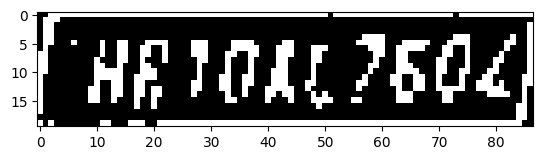

height =  329 width =  324


[152.63699340820312, 205.721923828125, 239.39234924316406, 247.8765106201172, 0.8991140127182007, 0.0] track_id: 177.0
-0.23171684119045063


['HETOXl7602']
license before check HETOXl7602
hello
License Plate Number with contours :  None , Score :  None
-0.20442120537714656
['PRRJOALZGQ2']
license before check PRRJOALZGQ2
hello
License Plate Number :  None , Score :  None
height =  339 width =  333


[156.2117156982422, 217.11639404296875, 245.28138732910156, 257.896484375, 0.9067258834838867, 0.0] track_id: 177.0
-0.22347660114063303


['HRTOKL7E04']
license before check HRTOKL7E04
hello
License Plate Number with contours :  None , Score :  None
-0.2213144423477913
['FHR104L7605']
license before check FHR104L7605
hello
License Plate Number :  None , Score :  None
height =  346 width =  343


[161.71658325195312, 219.23997497558594, 253.73001098632812, 266.0846862792969, 0.9081961512565613, 0.0] track_id: 177.0
-0.22036242435665723
['Kr1aL7GoL']
license before check Kr1aL7GoL
license after check KR1AL7GOL
License Plate Number with contours :  KR1AL7604 , Score :  0.043332266529416935


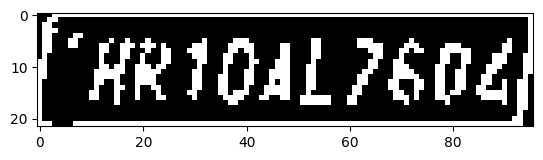

height =  356 width =  354


[168.18356323242188, 231.4435577392578, 263.8760681152344, 274.0313720703125, 0.9049830436706543, 0.0] track_id: 177.0
-0.2260683879938839
['HR10al7604']
license before check HR10al7604
license after check HR10AL7604
License Plate Number with contours :  HR10AL7604 , Score :  0.1385722335751176


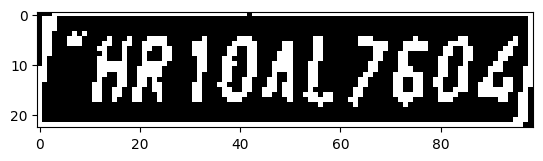

height =  365 width =  366


[174.59454345703125, 237.464111328125, 273.53863525390625, 282.2090148925781, 0.9019397497177124, 0.0] track_id: 177.0
-0.22390450013034954


['HR10AL76od']
license before check HR10AL76od
hello
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
['FHRIOAL7602']
license before check FHRIOAL7602
hello
License Plate Number :  None , Score :  None
height =  377 width =  381


[182.858642578125, 245.36427307128906, 284.96246337890625, 291.23040771484375, 0.9060928821563721, 0.0] track_id: 177.0
-0.17162806838088
['HR104L7602']
license before check HR104L7602
license after check HR104L7602
License Plate Number with contours :  HR10AL7602 , Score :  0.2732685195745257


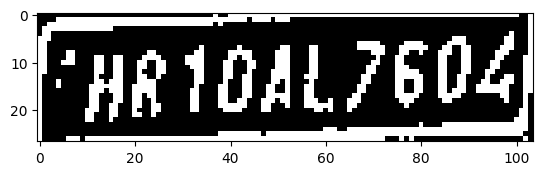

height =  387 width =  394


[191.65322875976562, 253.57708740234375, 296.7865905761719, 301.1658935546875, 0.9047456383705139, 0.0] track_id: 177.0
-0.20374468088385697
['HR10AL7604']
license before check HR10AL7604
license after check HR10AL7604
License Plate Number with contours :  HR10AL7604 , Score :  0.20251886283782042


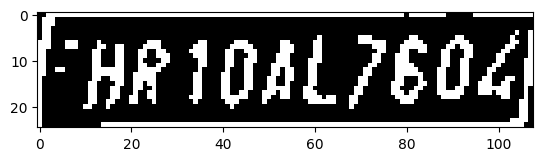

height =  404 width =  407


[199.5517120361328, 263.9004211425781, 308.814453125, 312.4597473144531, 0.9056631326675415, 0.0] track_id: 177.0
-0.2279670718215078
['HR10AL7604']
license before check HR10AL7604
license after check HR10AL7604
License Plate Number with contours :  HR10AL7604 , Score :  0.556792930274262


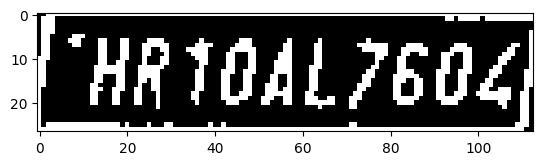

height =  421 width =  425


[208.69383239746094, 275.3906555175781, 322.1711730957031, 325.4466857910156, 0.9047255516052246, 0.0] track_id: 177.0
-0.22266094063636496
['HR10aL7604']
license before check HR10aL7604
license after check HR10AL7604
License Plate Number with contours :  HR10AL7604 , Score :  0.12475881944149378


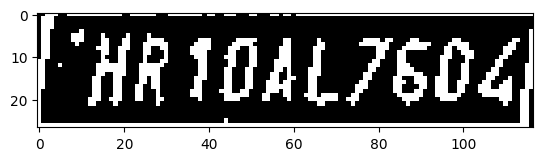

height =  434 width =  443


[220.05551147460938, 284.7688293457031, 338.210205078125, 338.78082275390625, 0.9002434611320496, 0.0] track_id: 177.0
-0.20539538918976738


['HR10aL7G0Li']
license before check HR10aL7G0Li
hello
License Plate Number with contours :  None , Score :  None
-0.212270495716091
['FRTOAL760Z']
license before check FRTOAL760Z
hello
License Plate Number :  None , Score :  None
height =  443 width =  465


[232.61277770996094, 297.5928955078125, 355.7748718261719, 351.74200439453125, 0.9080808758735657, 0.0] track_id: 177.0
-0.20749622643520266


['XRIOAL7SOLR']
license before check XRIOAL7SOLR
hello
License Plate Number with contours :  None , Score :  None
-0.2151070731365696
['PHRIOAL7607']
license before check PHRIOAL7607
hello
License Plate Number :  None , Score :  None
height =  467 width =  484


[244.26821899414062, 312.63104248046875, 373.16375732421875, 368.92047119140625, 0.9096778631210327, 0.0] track_id: 177.0
-0.21439546761559247
['HRIOAL7G04']
license before check HRIOAL7G04
license after check HRIOAL7G04
License Plate Number with contours :  HR1OAL7604 , Score :  0.23855996766362378


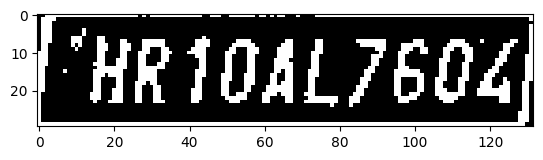

height =  483 width =  509


[258.8497314453125, 327.8201904296875, 394.0518798828125, 384.5645751953125, 0.9071328043937683, 0.0] track_id: 177.0
-0.20478094994297488
['HR10aL760L']
license before check HR10aL760L
license after check HR10AL760L
License Plate Number with contours :  HR10AL7604 , Score :  0.18038374461367881


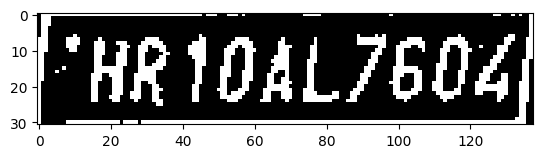

height =  506 width =  533


[276.40399169921875, 342.6515197753906, 417.1905212402344, 403.835693359375, 0.9111117124557495, 0.0] track_id: 177.0
-0.21347996353618615
['hr10AL7604']
license before check hr10AL7604
license after check HR10AL7604
License Plate Number with contours :  HR10AL7604 , Score :  0.29450869191449425


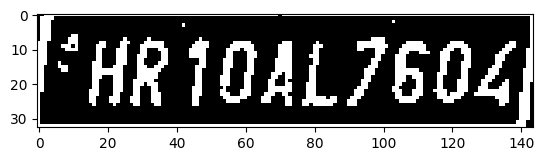

height =  531 width =  562


[294.9220275878906, 360.2763977050781, 441.407958984375, 422.8563232421875, 0.9169003963470459, 0.0] track_id: 177.0
-0.20679125651321525
['HR1OAL7604']
license before check HR1OAL7604
license after check HR1OAL7604
License Plate Number with contours :  HR1OAL7604 , Score :  0.289170354018017


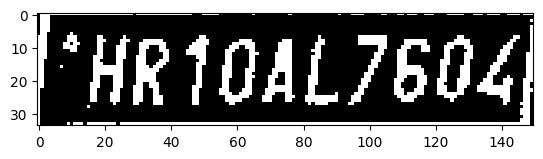

height =  557 width =  593


[314.7769470214844, 380.1861267089844, 471.431396484375, 446.36492919921875, 0.9179807305335999, 0.0] track_id: 177.0
-0.20812220444420662


['hR10ALZGOL']
license before check hR10ALZGOL
hello
License Plate Number with contours :  None , Score :  None
-0.20922155253553004
['EhR1OAL7604']
license before check EhR1OAL7604
hello
License Plate Number :  None , Score :  None
height =  583 width =  626


[339.73883056640625, 400.11859130859375, 501.0235595703125, 469.0870361328125, 0.9089431166648865, 0.0] track_id: 177.0
-0.20779980869667178


['hR1OAL760LP']
license before check hR1OAL760LP
hello
License Plate Number with contours :  None , Score :  None
-0.20883089364403962
['hR10AL76OL']
license before check hR10AL76OL
license after check HR10AL76OL
License Plate Number :  HR10AL7604 , Score :  0.3784223301438533


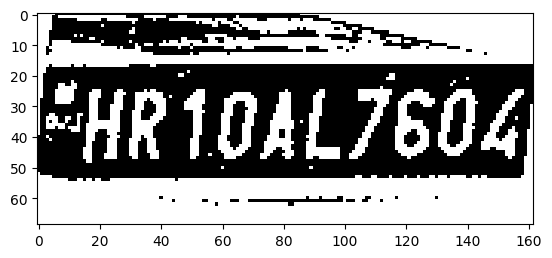

height =  617 width =  668


[368.1725158691406, 426.68341064453125, 539.216552734375, 500.4139099121094, 0.9165064096450806, 0.0] track_id: 177.0
-0.20720985759996088
['HR10AL7S0L']
license before check HR10AL7S0L
license after check HR10AL7S0L
License Plate Number with contours :  HR10AL7504 , Score :  0.7282381638743917


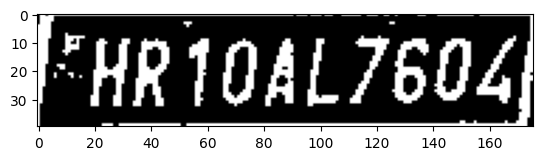

height =  650 width =  710


[397.94683837890625, 455.1610107421875, 580.846435546875, 532.31787109375, 0.9123770594596863, 0.0] track_id: 177.0
-0.2299044281319047


['HRIOALZSOLP']
license before check HRIOALZSOLP
hello
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
['KhRTOAL7SO4']
license before check KhRTOAL7SO4
hello
License Plate Number :  None , Score :  None
height =  689 width =  756


[433.8835754394531, 488.5693359375, 624.6200561523438, 569.9893798828125, 0.9106904864311218, 0.0] track_id: 177.0
-0.22568069719673398
['HRIOAL7S0L']
license before check HRIOAL7S0L
license after check HRIOAL7S0L
License Plate Number with contours :  HR1OAL7504 , Score :  0.3251705370428141


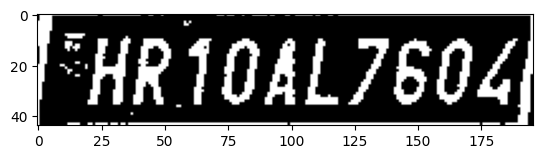

height =  726 width =  810


[475.6536865234375, 524.062744140625, 677.0927734375, 611.9095458984375, 0.9182310104370117, 0.0] track_id: 177.0
-0.2438525374767737


['FHR10AL76OZ']
license before check FHR10AL76OZ
hello
License Plate Number with contours :  None , Score :  None
-0.23154377092565046
['RHR1OAL760Z']
license before check RHR1OAL760Z
hello
License Plate Number :  None , Score :  None
height =  772 width =  867


[521.98828125, 566.0535278320312, 734.5802612304688, 660.0870361328125, 0.9071307182312012, 0.0] track_id: 177.0
-0.24603351505629006


['HR1OALZ60L']
license before check HR1OALZ60L
hello
License Plate Number with contours :  None , Score :  None
-0.2437333337581823
['HR1OAL760L']
license before check HR1OAL760L
license after check HR1OAL760L
License Plate Number :  HR1OAL7604 , Score :  0.4538370967075666


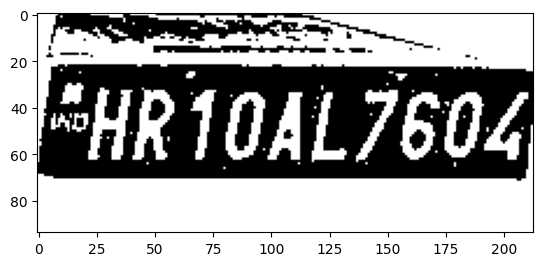

height =  826 width =  930


[578.2149047851562, 610.9163818359375, 801.3068237304688, 712.507080078125, 0.9057371616363525, 0.0] track_id: 177.0
-0.26221833432139385


['HR1OAL7SOZ']
license before check HR1OAL7SOZ
hello
License Plate Number with contours :  None , Score :  None
-0.25807315275233844
['HR1OAL76OL']
license before check HR1OAL76OL
license after check HR1OAL76OL
License Plate Number :  HR1OAL7604 , Score :  0.24977954532395583


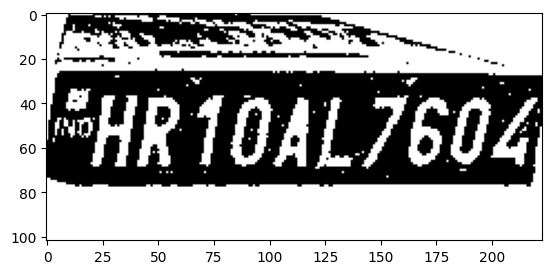

height =  890 width =  1002


[645.5452880859375, 659.7237548828125, 877.0156860351562, 774.0841674804688, 0.902656614780426, 0.0] track_id: 177.0
-0.27994982252379114


['PHR1OAL7SOL']
license before check PHR1OAL7SOL
hello
License Plate Number with contours :  None , Score :  None
-0.27894068455833493
['Wo', 'HR10AL760L']
license before check WoHR10AL760L
hello
License Plate Number :  None , Score :  None
height =  963 width =  1082


[724.6975708007812, 725.21240234375, 964.8699951171875, 846.627197265625, 0.8968886733055115, 0.0] track_id: 177.0
-0.31227216526677987
['HR1OAL7sOL']
license before check HR1OAL7sOL
license after check HR1OAL7SOL
License Plate Number with contours :  HR1OAL7504 , Score :  0.19356635516167442


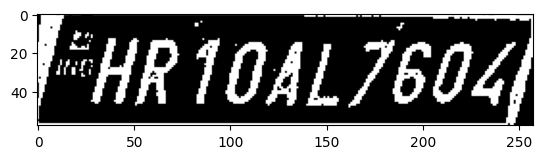

height =  1050 width =  1168


[817.5310668945312, 785.4026489257812, 1061.8507080078125, 926.3881225585938, 0.9068412184715271, 0.0] track_id: 177.0
-0.33098816691713323
['HR1OAL7SO4']
license before check HR1OAL7SO4
license after check HR1OAL7SO4
License Plate Number with contours :  HR1OAL7504 , Score :  0.1625630242653528


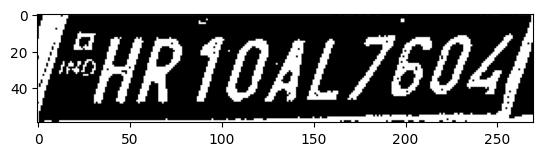

height =  1139 width =  1266
[926.6375122070312, 835.9306030273438, 1171.3001708984375, 1013.2593994140625, 0.7262581586837769, 0.0] track_id: 177.0
-0.3857798944755168
height =  1243 width =  1366


[1045.95703125, 929.6533203125, 1288.9490966796875, 1106.1556396484375, 0.4316158592700958, 0.0] track_id: 177.0
-0.47177751118075


['6']
license before check 6
hello
License Plate Number with contours :  None , Score :  None
-0.472368318154429
['HR10AL7604']
license before check HR10AL7604
license after check HR10AL7604
License Plate Number :  HR10AL7604 , Score :  0.731127866350831


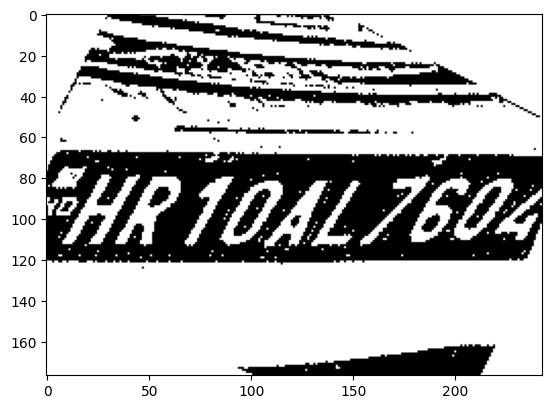

height =  1333 width =  1468
height =  1364 width =  1579
height =  1369 width =  1691
height =  1363 width =  1798
height =  1358 width =  1915
height =  1354 width =  1941
height =  1345 width =  1927
height =  1333 width =  1885
height =  1324 width =  1837
height =  1300 width =  1781
height =  1270 width =  1719
height =  1238 width =  1646
height =  1155 width =  1478
height =  233 width =  209
[84.4734115600586, 169.39663696289062, 133.13095092773438, 189.93064880371094, 0.8715210556983948, 0.0] track_id: 178.0
-0.2648173299057889
height =  236 width =  209


[82.49597930908203, 170.8896484375, 130.81712341308594, 192.27377319335938, 0.8852706551551819, 0.0] track_id: 178.0
-0.29654580906970046


[]
License Plate Number with contours :  None , Score :  None
-0.28897540999256643
['Qiz']
license before check Qiz
hello
License Plate Number :  None , Score :  None
height =  233 width =  212
[83.47348022460938, 172.0803985595703, 132.86795043945312, 194.36277770996094, 0.9051899313926697, 0.0] track_id: 178.0
-0.25580856461537194
height =  244 width =  215
[83.58642578125, 176.17845153808594, 135.71963500976562, 199.5872344970703, 0.8972803950309753, 0.0] track_id: 178.0
-0.28123220191829523
height =  244 width =  218


[84.60112762451172, 177.8660125732422, 136.968994140625, 202.58126831054688, 0.899381697177887, 0.0] track_id: 178.0
-0.29386933503246765


[]
License Plate Number with contours :  None , Score :  None
-0.3217505543966422
['Eun']
license before check Eun
hello
License Plate Number :  None , Score :  None
height =  243 width =  220


[85.38557434082031, 179.74960327148438, 137.76947021484375, 204.28292846679688, 0.909706175327301, 0.0] track_id: 178.0
-0.28927100560914176


[]
License Plate Number with contours :  None , Score :  None
-0.300171170830112
[]
License Plate Number :  None , Score :  None
height =  244 width =  227
[89.20451354980469, 181.68032836914062, 143.34332275390625, 206.52008056640625, 0.8937171697616577, 0.0] track_id: 178.0
-0.2829008535280854
height =  251 width =  227


[88.51456451416016, 181.9132080078125, 142.9955291748047, 209.393798828125, 0.8834793567657471, 0.0] track_id: 178.0
-0.3091989123270746


[]
License Plate Number with contours :  None , Score :  None
-0.2914567944778671
[]
License Plate Number :  None , Score :  None
height =  252 width =  234


[92.3641357421875, 185.3455047607422, 147.81924438476562, 211.5569305419922, 0.9009996652603149, 0.0] track_id: 178.0
-0.3052231337939214


[]
License Plate Number with contours :  None , Score :  None
-0.2935889874087498


[]
License Plate Number :  None , Score :  None
[92.60408020019531, 169.9228515625, 148.00119018554688, 211.81973266601562, 0.4712041914463043, 0.0] track_id: 178.0
-0.25564492527793553


[]
License Plate Number with contours :  None , Score :  None
-0.25044308961135187
[]
License Plate Number :  None , Score :  None
height =  259 width =  241
[96.11224365234375, 188.7964630126953, 152.52178955078125, 214.281005859375, 0.9010134339332581, 0.0] track_id: 178.0
-0.30587887140485215
height =  264 width =  252


[105.37838745117188, 193.689697265625, 162.7941131591797, 220.68850708007812, 0.8988236784934998, 0.0] track_id: 178.0
-0.2962783578859196


['DiWbrje']
license before check DiWbrje
hello
License Plate Number with contours :  None , Score :  None
-0.30161904626623964
[]
License Plate Number :  None , Score :  None
height =  273 width =  254


[105.10487365722656, 196.16943359375, 164.00985717773438, 222.92091369628906, 0.901739239692688, 0.0] track_id: 178.0
-0.2999471564969417


[]
License Plate Number with contours :  None , Score :  None
-0.30161904626623964
['ino']
license before check ino
hello
License Plate Number :  None , Score :  None
height =  284 width =  264
[109.57572174072266, 200.79722595214844, 169.96475219726562, 229.1357421875, 0.8953083157539368, 0.0] track_id: 178.0
-0.303459911439822
height =  291 width =  266
[110.53933715820312, 203.0355682373047, 171.9677734375, 232.7142791748047, 0.8743107914924622, 0.0] track_id: 178.0
-0.2662520491509254
height =  295 width =  269


[112.96305084228516, 206.27462768554688, 175.0991668701172, 235.67373657226562, 0.8827562928199768, 0.0] track_id: 178.0
-0.30932883307468706


[]
License Plate Number with contours :  None , Score :  None
-0.2984989315861793
[]
License Plate Number :  None , Score :  None
height =  299 width =  281


[122.4495849609375, 207.4577178955078, 186.09544372558594, 239.314697265625, 0.8441193103790283, 0.0] track_id: 178.0
-0.2978030374744346


[]
License Plate Number with contours :  None , Score :  None
-0.31038740713235147
['ticz']
license before check ticz
hello
License Plate Number :  None , Score :  None
height =  299 width =  284


[122.38359832763672, 212.16165161132812, 186.38050842285156, 242.81781005859375, 0.9034954905509949, 0.0] track_id: 178.0
-0.2528940650955976
[122.77066040039062, 196.9365997314453, 186.62730407714844, 243.06851196289062, 0.33305320143699646, 0.0] track_id: 178.0
-0.26121853461453504


[]
License Plate Number with contours :  None , Score :  None
-0.2947301052093774
[]
License Plate Number :  None , Score :  None
height =  297 width =  292
[126.94902038574219, 215.89317321777344, 192.52706909179688, 247.6207275390625, 0.8958475589752197, 0.0] track_id: 178.0
-0.3072588153311422
height =  295 width =  293


[123.42200469970703, 217.0369415283203, 191.90191650390625, 251.3850555419922, 0.8810890913009644, 0.0] track_id: 178.0
-0.3080527810237764


['gliltc127']
license before check gliltc127
hello
License Plate Number with contours :  None , Score :  None
-0.2860514417173182
['iioz']
license before check iioz
hello
License Plate Number :  None , Score :  None
[123.67755889892578, 202.06187438964844, 192.08978271484375, 251.4076690673828, 0.4322231709957123, 0.0] track_id: 178.0
-0.2587708919636976
height =  294 width =  298
[127.69493103027344, 221.7674102783203, 195.23912048339844, 255.68795776367188, 0.8875556588172913, 0.0] track_id: 178.0
-0.2931868965578822
height =  296 width =  306
[131.97361755371094, 225.21315002441406, 201.77857971191406, 260.32000732421875, 0.8700839281082153, 0.0] track_id: 178.0
-0.29915553030994335
height =  304 width =  309
[132.23573303222656, 229.37350463867188, 203.4504852294922, 265.0240173339844, 0.8780094981193542, 0.0] track_id: 178.0
-0.29654580906970046
height =  313 width =  312
[133.2425994873047, 227.81512451171875, 205.80931091308594, 268.6954650878906, 0.8895283341407776, 0.0] track_

[138.67620849609375, 240.99240112304688, 213.71969604492188, 277.8570861816406, 0.8852176070213318, 0.0] track_id: 178.0
-0.2924429874520365
['DE1L43927']
license before check DE1L43927
license after check DE1L43927
License Plate Number with contours :  DE1LA3927 , Score :  0.252850791786639


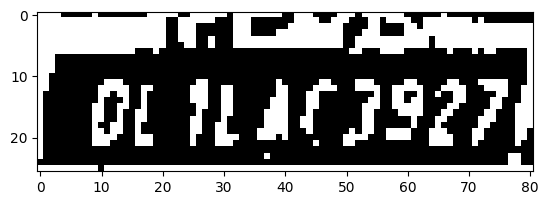

height =  322 width =  335
[144.0640411376953, 245.38424682617188, 220.65396118164062, 283.4944152832031, 0.8752164840698242, 0.0] track_id: 178.0
-0.30337991783948065
height =  327 width =  343


[148.8880157470703, 250.54794311523438, 226.5985565185547, 288.9073791503906, 0.8808268904685974, 0.0] track_id: 178.0
-0.2984989315861793


['OLILXC38274']
license before check OLILXC38274
hello
License Plate Number with contours :  None , Score :  None
-0.3080527810237764
['LLAcoz7']
license before check LLAcoz7
hello
License Plate Number :  None , Score :  None
height =  335 width =  349


[152.06198120117188, 251.56088256835938, 230.69398498535156, 294.6368103027344, 0.863487184047699, 0.0] track_id: 178.0
-0.2984989315861793
['DLILtr3927']
license before check DLILtr3927
license after check DLILTR3927
License Plate Number with contours :  DL1LTR3927 , Score :  0.29310596364663627


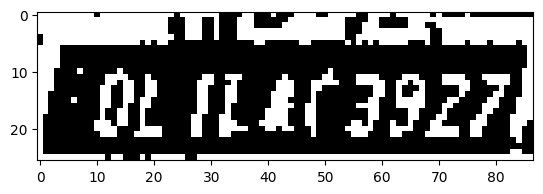

height =  344 width =  354
[150.69044494628906, 246.57150268554688, 232.53883361816406, 299.9382019042969, 0.8409985303878784, 0.0] track_id: 178.0
-0.3084180111024965
height =  348 width =  360
[154.65927124023438, 264.7196044921875, 237.00665283203125, 305.32513427734375, 0.872435986995697, 0.0] track_id: 178.0
-0.29675576077772203
height =  351 width =  370


[159.10452270507812, 270.4206848144531, 243.67872619628906, 311.4334411621094, 0.8842936158180237, 0.0] track_id: 178.0
-0.29675576077772203


[]
License Plate Number with contours :  None , Score :  None
-0.3028848683749714
['EOLILic392']
license before check EOLILic392
hello
License Plate Number :  None , Score :  None
height =  356 width =  380


[167.0449676513672, 275.65386962890625, 251.70265197753906, 317.768798828125, 0.8669533133506775, 0.0] track_id: 178.0
-0.29675576077772203


[]
License Plate Number with contours :  None , Score :  None
-0.30373448584258683
['LIuicj921']
license before check LIuicj921
hello
License Plate Number :  None , Score :  None
height =  364 width =  389
[170.4342041015625, 281.72662353515625, 256.6591491699219, 324.6180419921875, 0.8756410479545593, 0.0] track_id: 178.0
-0.29220250649474844
height =  375 width =  396


[171.8614044189453, 288.156005859375, 260.6759033203125, 331.406982421875, 0.8893713355064392, 0.0] track_id: 178.0
-0.29675576077772203


['392']
license before check 392
hello
License Plate Number with contours :  None , Score :  None
-0.2914567944778671
['PdtIL4C3927']
license before check PdtIL4C3927
hello
License Plate Number :  None , Score :  None
height =  381 width =  409
[180.77334594726562, 293.6872863769531, 272.1502990722656, 338.7645568847656, 0.8892869353294373, 0.0] track_id: 178.0
-0.3048030245902373
height =  388 width =  415
[181.98167419433594, 299.1107177734375, 274.603271484375, 345.95758056640625, 0.8621335625648499, 0.0] track_id: 178.0
-0.29635186027461485
height =  399 width =  422


[185.8982696533203, 304.5366516113281, 281.71771240234375, 353.5721130371094, 0.8758214116096497, 0.0] track_id: 178.0
-0.30161904626623964
['DL1LA63927']
license before check DL1LA63927
license after check DL1LA63927
License Plate Number with contours :  DL1LAG3927 , Score :  0.23568511222560246


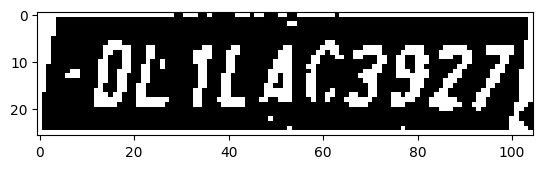

height =  410 width =  433
[191.3814697265625, 308.83209228515625, 289.680908203125, 361.90960693359375, 0.8643217086791992, 0.0] track_id: 178.0
-0.2996411355440586
height =  416 width =  448
[200.76785278320312, 319.1054992675781, 300.0758972167969, 370.58538818359375, 0.8887532949447632, 0.0] track_id: 178.0
-0.27970415246363095
height =  428 width =  460
[209.76382446289062, 323.5475158691406, 313.36016845703125, 378.6795654296875, 0.8477115035057068, 0.0] track_id: 178.0
-0.27384203622714276
height =  438 width =  471
[213.72584533691406, 335.7548828125, 320.11102294921875, 389.0707092285156, 0.8745758533477783, 0.0] track_id: 178.0
-0.31099828060554097
height =  448 width =  481
[216.5463409423828, 345.0247802734375, 322.2486877441406, 399.8022155761719, 0.8732245564460754, 0.0] track_id: 178.0
-0.2935889874087498
height =  460 width =  499
[227.54977416992188, 353.12225341796875, 339.4324645996094, 409.7588195800781, 0.8769338726997375, 0.0] track_id: 178.0
-0.23941285789170996


[229.83615112304688, 289.7399597167969, 348.06732177734375, 354.4960021972656, 0.9081656336784363, 0.0] track_id: 184.0
-0.17985349979247828


[]
License Plate Number with contours :  None , Score :  None
-0.19118445959701444
['JUKOGATOZU']
license before check JUKOGATOZU
hello
License Plate Number :  None , Score :  None
height =  135 width =  104
height =  169 width =  158
height =  429 width =  478


[239.39926147460938, 311.87158203125, 358.5965270996094, 363.4261474609375, 0.9034276008605957, 0.0] track_id: 184.0
-0.19477776478256326
['Uk06To70g']
license before check Uk06To70g
license after check UK06TO70G
License Plate Number with contours :  UK06T0706 , Score :  0.0656712386348984


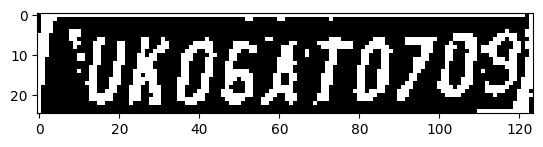

height =  137 width =  104
height =  168 width =  157
height =  437 width =  492


[248.38348388671875, 305.6565246582031, 373.4482421875, 373.40252685546875, 0.9144865274429321, 0.0] track_id: 184.0
-0.1936219928559454
['Uko6aT0703']
license before check Uko6aT0703
license after check UKO6AT0703
License Plate Number with contours :  UK06AT0703 , Score :  0.20970099097187112


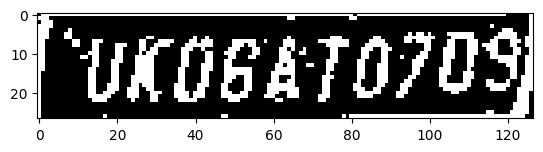

height =  137 width =  105
height =  169 width =  159
height =  447 width =  509


[261.9085998535156, 311.4921875, 392.96417236328125, 382.1170654296875, 0.9129083752632141, 0.0] track_id: 184.0
-0.20333608402827574


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.18677380454271877
['K06ai070S']
license before check K06ai070S
license after check K06AI070S
License Plate Number :  KO6AI0705 , Score :  0.07383250690406161


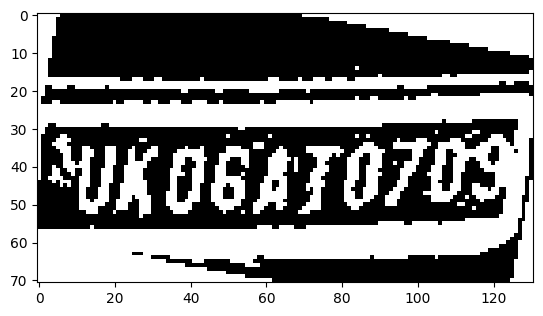

height =  139 width =  106
height =  175 width =  163
height =  462 width =  526


[274.3697814941406, 323.2939758300781, 406.23138427734375, 394.7909240722656, 0.9073722958564758, 0.0] track_id: 184.0
-0.20902294280626463


[]
License Plate Number with contours :  None , Score :  None
-0.19379845306233687
['YK0GATOZOS']
license before check YK0GATOZOS
hello
License Plate Number :  None , Score :  None
height =  139 width =  108
height =  174 width =  164
height =  477 width =  542
[285.7010192871094, 338.8269348144531, 419.8966064453125, 408.96466064453125, 0.8951418399810791, 0.0] track_id: 184.0
-0.18079957330397145
height =  139 width =  107
height =  175 width =  171
height =  491 width =  559
[298.28302001953125, 346.02545166015625, 436.3678894042969, 422.9603271484375, 0.9089933633804321, 0.0] track_id: 184.0
-0.18069952327929278
height =  140 width =  109
height =  174 width =  170
height =  502 width =  575


[310.5942077636719, 353.9042663574219, 457.0626525878906, 433.8781433105469, 0.9124014377593994, 0.0] track_id: 184.0
-0.20846521837998772
['Uk06at0709']
license before check Uk06at0709
license after check UK06AT0709
License Plate Number with contours :  UK06AT0709 , Score :  0.3803932124553305


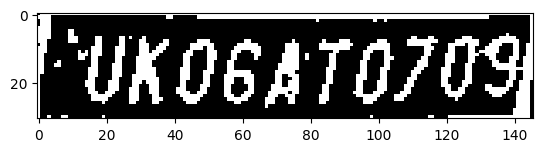

height =  143 width =  113
height =  175 width =  168
height =  522 width =  595
[326.26593017578125, 367.07061767578125, 475.3458251953125, 449.8328857421875, 0.9093732237815857, 0.0] track_id: 184.0
-0.17367119834157382
height =  141 width =  111
height =  176 width =  169
height =  536 width =  615


[341.91668701171875, 380.4957275390625, 500.2895812988281, 464.6142272949219, 0.9053897261619568, 0.0] track_id: 184.0
-0.22679884805388587


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.1934273267108474
['FUKo6AT070S']
license before check FUKo6AT070S
hello
License Plate Number :  None , Score :  None
height =  141 width =  111
height =  176 width =  175
height =  555 width =  636


[358.3331604003906, 395.2418518066406, 521.4631958007812, 482.5512390136719, 0.9079475998878479, 0.0] track_id: 184.0
-0.2347226124851971
['UK06aT070g']
license before check UK06aT070g
license after check UK06AT070G
License Plate Number with contours :  UK06AT0706 , Score :  0.1841478958874517


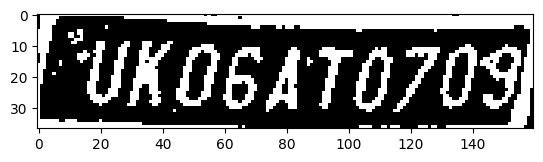

[0.0043083070777356625, 85.36479949951172, 16.449398040771484, 102.90984344482422, 0.5022761225700378, 0.0] track_id: 184.0


[]
License Plate Number :  None , Score :  None
height =  141 width =  111
height =  178 width =  178
height =  571 width =  657


[375.17578125, 406.2786560058594, 542.9754638671875, 497.2554931640625, 0.9139286875724792, 0.0] track_id: 184.0
-0.22923193327699534
['uko6at0709']
license before check uko6at0709
license after check UKO6AT0709
License Plate Number with contours :  UK06AT0709 , Score :  0.1565106498951486


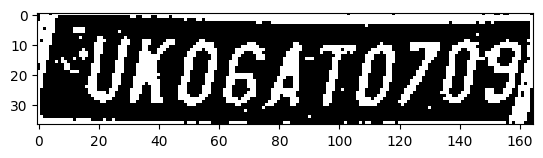

[0.0, 81.4141616821289, 10.095810890197754, 100.01419067382812, 0.32575976848602295, 0.0] track_id: 184.0
[]
License Plate Number :  None , Score :  None
height =  140 width =  113
height =  181 width =  178
height =  590 width =  680
[394.0096130371094, 422.60400390625, 564.925048828125, 515.3167724609375, 0.9203263521194458, 0.0] track_id: 184.0
-0.17583027608172255
height =  140 width =  115
height =  184 width =  187
height =  607 width =  705


[416.5464172363281, 439.5542297363281, 596.035888671875, 536.5604858398438, 0.9171991348266602, 0.0] track_id: 184.0
-0.19291931400804788
['UK06at0703']
license before check UK06at0703
license after check UK06AT0703
License Plate Number with contours :  UK06AT0703 , Score :  0.22846533131051772


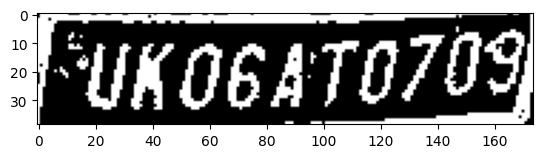

height =  141 width =  114
height =  185 width =  192
height =  628 width =  735
[440.56500244140625, 461.1347351074219, 623.0617065429688, 559.2401733398438, 0.9111044406890869, 0.0] track_id: 184.0
-0.19118445959701444
height =  141 width =  113
height =  184 width =  191
[85.30558776855469, 112.33514404296875, 137.28558349609375, 133.7713165283203, 0.7592058181762695, 0.0] track_id: 183.0
-0.2080561367910258
height =  652 width =  765
[465.9727783203125, 479.22625732421875, 656.1657104492188, 582.6524658203125, 0.9223255515098572, 0.0] track_id: 184.0
-0.20902294280626463
height =  187 width =  193


[85.64724731445312, 114.8372802734375, 138.4981689453125, 136.1165771484375, 0.8248099088668823, 0.0] track_id: 183.0
-0.22423475110909616


[]
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
['DOni']
license before check DOni
hello
License Plate Number :  None , Score :  None
height =  679 width =  797


[494.4988098144531, 497.4379577636719, 689.899169921875, 603.9456176757812, 0.9176309704780579, 0.0] track_id: 184.0
-0.2121437530044756


['Fuko6at0709']
license before check Fuko6at0709
hello
License Plate Number with contours :  None , Score :  None
-0.21038184277005323
['UKO6ATo7dg']
license before check UKO6ATo7dg
hello
License Plate Number :  None , Score :  None
height =  140 width =  108
height =  191 width =  198
[87.49224853515625, 114.68022155761719, 141.7244110107422, 137.03408813476562, 0.8050283789634705, 0.0] track_id: 183.0
-0.20349304525756276
height =  706 width =  830


[523.6329956054688, 519.4010620117188, 724.0648803710938, 633.9563598632812, 0.918889582157135, 0.0] track_id: 184.0
-0.22527677921405528
['Uk06at0709']
license before check Uk06at0709
license after check UK06AT0709
License Plate Number with contours :  UK06AT0709 , Score :  0.4771628303681414


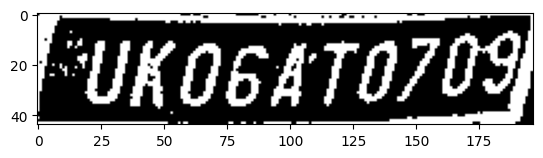

height =  137 width =  115
height =  196 width =  202
[89.31519317626953, 117.86688232421875, 144.26133728027344, 140.1741180419922, 0.7605422735214233, 0.0] track_id: 183.0
-0.19239560151592244
height =  734 width =  868


[556.7154541015625, 541.656982421875, 761.630126953125, 660.23193359375, 0.918351948261261, 0.0] track_id: 184.0
-0.31005518123095327


['06470709']
license before check 06470709
hello
License Plate Number with contours :  None , Score :  None
-0.19424099618140395
['ukogato7og']
license before check ukogato7og
license after check UKOGATO7OG
License Plate Number :  UK0GAT0706 , Score :  0.30445279982699225


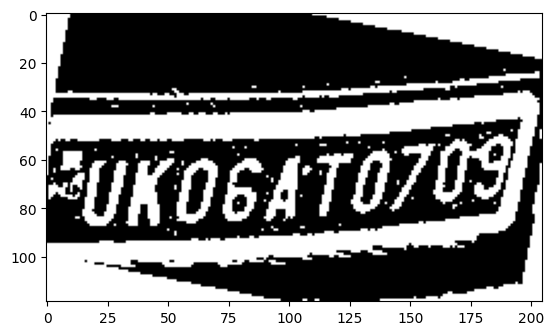

height =  199 width =  204
[88.98097229003906, 119.54385375976562, 143.63412475585938, 142.54116821289062, 0.8588125705718994, 0.0] track_id: 183.0
-0.23374318086890142
height =  764 width =  904


[592.66357421875, 566.3165283203125, 803.2985229492188, 689.7261352539062, 0.9183706641197205, 0.0] track_id: 184.0
-0.20952285944517204


['Fuk064T070g']
license before check Fuk064T070g
hello
License Plate Number with contours :  None , Score :  None
-0.2247111684146427
['UK06aT07O9']
license before check UK06aT07O9
license after check UK06AT07O9
License Plate Number :  UK06AT0709 , Score :  0.12901464453868636


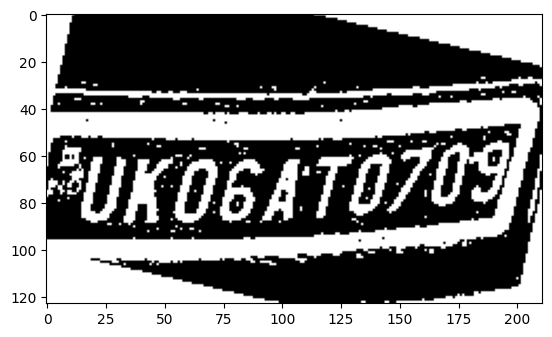

height =  202 width =  205
[90.595703125, 123.5064926147461, 146.12884521484375, 145.487060546875, 0.8390848636627197, 0.0] track_id: 183.0
-0.2093853929534955
height =  794 width =  941


[630.756103515625, 592.734375, 847.394775390625, 718.9134521484375, 0.9197601675987244, 0.0] track_id: 184.0
-0.31441572261167955


['FUK064To709']
license before check FUK064To709
hello
License Plate Number with contours :  None , Score :  None
-0.23554498072086333
['euko64to7g']
license before check euko64to7g
hello
License Plate Number :  None , Score :  None
height =  203 width =  205
[89.85368347167969, 124.4707260131836, 146.43661499023438, 147.3651580810547, 0.8376703262329102, 0.0] track_id: 183.0
-0.2213144423477913
height =  829 width =  985


[674.9035034179688, 623.8466796875, 894.5913696289062, 757.4456176757812, 0.9179920554161072, 0.0] track_id: 184.0
-0.2957823671850858


['06470709']
license before check 06470709
hello
License Plate Number with contours :  None , Score :  None
-0.2264622610588551
['GUKo6aTozog']
license before check GUKo6aTozog
hello
License Plate Number :  None , Score :  None
height =  206 width =  207
height =  867 width =  1037


[720.9501953125, 656.9515380859375, 944.2072143554688, 800.8836669921875, 0.9159947037696838, 0.0] track_id: 184.0
-0.3658221179612921


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.27891962172791485
['EUK064T079']
license before check EUK064T079
hello
License Plate Number :  None , Score :  None
height =  209 width =  209
[90.31185150146484, 128.71298217773438, 149.06997680664062, 152.23336791992188, 0.8214235901832581, 0.0] track_id: 183.0
-0.23040243605886154
height =  908 width =  1084


[773.0784301757812, 691.9403076171875, 998.2322387695312, 838.863037109375, 0.9105781316757202, 0.0] track_id: 184.0
-0.38477377652812605


['X']
license before check X
hello
License Plate Number with contours :  None , Score :  None
-0.28002528283152595
['MUKOGA', 'T0709']
license before check MUKOGAT0709
hello
License Plate Number :  None , Score :  None
height =  139 width =  124
height =  212 width =  211


[90.16117095947266, 131.3584442138672, 149.9434051513672, 156.2807159423828, 0.8908803462982178, 0.0] track_id: 183.0
-0.21109333322274654


[]
License Plate Number with contours :  None , Score :  None
-0.22082876972934834
[]
License Plate Number :  None , Score :  None
height =  949 width =  1137


[827.9807739257812, 727.5264892578125, 1052.5794677734375, 889.1201782226562, 0.8614839911460876, 0.0] track_id: 184.0
-0.3849573862941024


['Fuko6ato7o9']
license before check Fuko6ato7o9
hello
License Plate Number with contours :  None , Score :  None
-0.4692655274257615
['Gukogatoo']
license before check Gukogatoo
hello
License Plate Number :  None , Score :  None
height =  139 width =  124
height =  213 width =  217


[93.19634246826172, 135.5012664794922, 154.90635681152344, 159.64349365234375, 0.8128261566162109, 0.0] track_id: 183.0
-0.21182754748141747


[]
License Plate Number with contours :  None , Score :  None
-0.22527677921405528
[]
License Plate Number :  None , Score :  None
height =  998 width =  1192


[882.6005859375, 756.5499877929688, 1113.4937744140625, 944.7899169921875, 0.5200654864311218, 0.0] track_id: 184.0
-0.33365475395495203


['K']
license before check K
hello
License Plate Number with contours :  None , Score :  None
-0.32918536164184053
['KO6ATOZ']
license before check KO6ATOZ
hello
License Plate Number :  None , Score :  None
height =  217 width =  220


[93.93956756591797, 138.14364624023438, 156.86985778808594, 162.5736083984375, 0.8404117822647095, 0.0] track_id: 183.0
-0.22244726542594168


[]
License Plate Number with contours :  None , Score :  None
-0.21243202050874216
[]
License Plate Number :  None , Score :  None
height =  1052 width =  1249
height =  143 width =  131
height =  222 width =  222


[93.47193145751953, 139.68019104003906, 156.9026336669922, 164.786865234375, 0.8199360966682434, 0.0] track_id: 183.0
-0.20401797959254858


[]
License Plate Number with contours :  None , Score :  None
-0.22527677921405528
[]
License Plate Number :  None , Score :  None
height =  1107 width =  1307
height =  226 width =  225


[95.61609649658203, 140.7804718017578, 159.87298583984375, 166.40147399902344, 0.8524888753890991, 0.0] track_id: 183.0
-0.20963984587421253


[]
License Plate Number with contours :  None , Score :  None
-0.21406068356382152
[]
License Plate Number :  None , Score :  None
height =  1168 width =  1374
height =  142 width =  129
height =  226 width =  230


[100.75546264648438, 140.2755126953125, 165.0526580810547, 166.4138946533203, 0.8767319321632385, 0.0] track_id: 183.0
-0.20668321848424925


[]
License Plate Number with contours :  None , Score :  None
-0.20401797959254858
['TEI']
license before check TEI
hello
License Plate Number :  None , Score :  None
height =  1237 width =  1431
height =  229 width =  232


[100.46997833251953, 142.2937774658203, 166.43577575683594, 169.25437927246094, 0.8751376867294312, 0.0] track_id: 183.0
-0.21320451938945426


['']
License Plate Number with contours :  None , Score :  None
-0.22423475110909616
['tH']
license before check tH
hello
License Plate Number :  None , Score :  None
height =  1291 width =  1495
height =  235 width =  238
[104.0813980102539, 145.3017120361328, 170.5604248046875, 173.17445373535156, 0.879888117313385, 0.0] track_id: 183.0
-0.18725391973348288
height =  1306 width =  1562
height =  141 width =  118
height =  239 width =  242


[105.35376739501953, 148.78411865234375, 173.67982482910156, 177.3388214111328, 0.88580322265625, 0.0] track_id: 183.0
-0.21243202050874216


['WrTI']
license before check WrTI
hello
License Plate Number with contours :  None , Score :  None
-0.19739555984988075
['Ti']
license before check Ti
hello
License Plate Number :  None , Score :  None
height =  1313 width =  1636
height =  141 width =  122
height =  246 width =  249


[107.81455993652344, 152.86863708496094, 177.755615234375, 181.99884033203125, 0.897099494934082, 0.0] track_id: 183.0
-0.2063238940297175


[]
License Plate Number with contours :  None , Score :  None
-0.21535769969773805
[]
License Plate Number :  None , Score :  None
height =  1306 width =  1683
height =  251 width =  252
[109.55103302001953, 156.24436950683594, 180.73460388183594, 186.27081298828125, 0.9005273580551147, 0.0] track_id: 183.0
-0.20653607310567618
height =  1309 width =  1751
height =  144 width =  124
height =  258 width =  257


[111.24919128417969, 159.97959899902344, 184.10694885253906, 190.43980407714844, 0.890251636505127, 0.0] track_id: 183.0
-0.20464180982977792


[]
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
['PELQQUID']
license before check PELQQUID
hello
License Plate Number :  None , Score :  None
height =  1286 width =  1790
height =  144 width =  130
height =  260 width =  260


[113.40538787841797, 162.2960968017578, 187.80209350585938, 193.85391235351562, 0.8992379903793335, 0.0] track_id: 183.0
-0.21109333322274654


['ed']
license before check ed
hello
License Plate Number with contours :  None , Score :  None
-0.20304521725346514
[]
License Plate Number :  None , Score :  None
height =  1272 width =  1763
height =  143 width =  132
height =  263 width =  266
[116.58639526367188, 164.94131469726562, 190.97271728515625, 195.87330627441406, 0.9085583090782166, 0.0] track_id: 183.0
-0.2063238940297175
height =  1253 width =  1722
height =  147 width =  140
height =  267 width =  275


[120.83854675292969, 168.68789672851562, 196.4736785888672, 200.94921875, 0.9086246490478516, 0.0] track_id: 183.0
-0.20982831175965547


['PrR']
license before check PrR
hello
License Plate Number with contours :  None , Score :  None
-0.20902294280626463
[]
License Plate Number :  None , Score :  None
height =  1240 width =  1674
height =  148 width =  134
height =  271 width =  280


[122.89701080322266, 171.71275329589844, 201.59616088867188, 206.33181762695312, 0.9048225283622742, 0.0] track_id: 183.0
-0.20795854725293414


['aisij0b']
license before check aisij0b
hello
License Plate Number with contours :  None , Score :  None
-0.2082059495239874
['P80en22016']
license before check P80en22016
hello
License Plate Number :  None , Score :  None
height =  1220 width =  1623
height =  152 width =  160
height =  273 width =  285


[125.44343566894531, 176.18946838378906, 205.7318115234375, 210.2606201171875, 0.9073411226272583, 0.0] track_id: 183.0
-0.20902294280626463
['PeoeDJ0I5']
license before check PeoeDJ0I5
license after check PEOEDJ0I5
License Plate Number with contours :  PE0ED3015 , Score :  0.0300206788450956


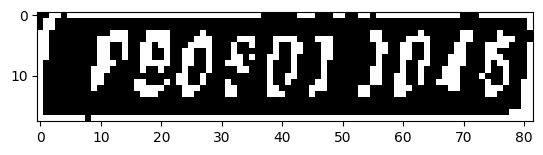

height =  1196 width =  1561
height =  282 width =  292


[130.5195770263672, 180.2620849609375, 211.67295837402344, 214.7147979736328, 0.9078801274299622, 0.0] track_id: 183.0
-0.20653607310567618


['FrgIq1jonq']
license before check FrgIq1jonq
hello
License Plate Number with contours :  None , Score :  None
-0.2082059495239874
['PE08028076']
license before check PE08028076
hello
License Plate Number :  None , Score :  None
height =  1174 width =  1491
height =  290 width =  298


[132.30303955078125, 185.7621612548828, 215.3196258544922, 219.98033142089844, 0.9058458209037781, 0.0] track_id: 183.0
-0.20749622643520266


['TRGEOLMQ']
license before check TRGEOLMQ
hello
License Plate Number with contours :  None , Score :  None
-0.20539538918976738
['P20801306']
license before check P20801306
hello
License Plate Number :  None , Score :  None
height =  1144 width =  1411
height =  296 width =  305


[135.7040557861328, 189.6912841796875, 220.211181640625, 224.5946044921875, 0.9024330377578735, 0.0] track_id: 183.0
-0.20464180982977792


['PBCQIJ0Ig']
license before check PBCQIJ0Ig
hello
License Plate Number with contours :  None , Score :  None
-0.21018258666216955
['LP80201uz6']
license before check LP80201uz6
hello
License Plate Number :  None , Score :  None
height =  1108 width =  1323
height =  301 width =  312


[139.6992645263672, 194.13934326171875, 226.85060119628906, 230.9442138671875, 0.9112786650657654, 0.0] track_id: 183.0
-0.20401797959254858


['PrdeniJddT']
license before check PrdeniJddT
hello
License Plate Number with contours :  None , Score :  None
-0.21018258666216955
['PBu8012QES']
license before check PBu8012QES
hello
License Plate Number :  None , Score :  None
height =  1109 width =  1224
height =  306 width =  318


[144.24325561523438, 199.5581512451172, 233.01953125, 237.2900848388672, 0.9091994762420654, 0.0] track_id: 183.0
-0.2979455282115723


['P20201z048']
license before check P20201z048
hello
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
['PbrdI0T6']
license before check PbrdI0T6
hello
License Plate Number :  None , Score :  None
height =  1033 width =  1117
height =  155 width =  176
height =  312 width =  326


[147.68678283691406, 204.1827392578125, 238.43643188476562, 242.0653839111328, 0.9106298089027405, 0.0] track_id: 183.0
-0.20846521837998772


['PeEeDJZ626']
license before check PeEeDJZ626
hello
License Plate Number with contours :  None , Score :  None
-0.1950202674049214
['P80201J076']
license before check P80201J076
hello
License Plate Number :  None , Score :  None
height =  971 width =  993
height =  155 width =  178
height =  318 width =  334


[152.1485137939453, 209.82553100585938, 244.8301239013672, 248.1570587158203, 0.9053840637207031, 0.0] track_id: 183.0
-0.20877718218206526
['ProbdiJ06']
license before check ProbdiJ06
license after check PROBDIJ06
License Plate Number with contours :  PR0BD1306 , Score :  0.05757721972883052


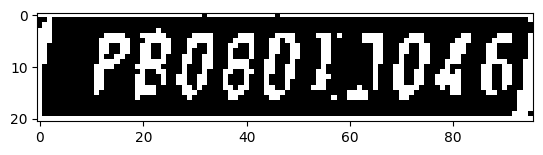

height =  911 width =  849
height =  155 width =  177
height =  327 width =  340


[154.16355895996094, 215.67340087890625, 249.44676208496094, 254.5193634033203, 0.9000741243362427, 0.0] track_id: 183.0
-0.1188403445677652


['PQdBDJ']
license before check PQdBDJ
hello
License Plate Number with contours :  None , Score :  None
-0.2093853929534955
['FPR080I3076']
license before check FPR080I3076
hello
License Plate Number :  None , Score :  None
height =  851 width =  683
height =  157 width =  178
height =  339 width =  347


[158.7841339111328, 220.9325408935547, 255.56552124023438, 261.1525573730469, 0.9027699828147888, 0.0] track_id: 183.0
-0.20254131203030573


['PBQ80IJO46']
license before check PBQ80IJO46
hello
License Plate Number with contours :  None , Score :  None
-0.21406068356382152
['FPe0801J046']
license before check FPe0801J046
hello
License Plate Number :  None , Score :  None
height =  160 width =  179
height =  347 width =  357


[162.90371704101562, 227.94273376464844, 262.0961608886719, 269.6931457519531, 0.9097675085067749, 0.0] track_id: 183.0
-0.20431586460012127


['P80801J046']
license before check P80801J046
hello
License Plate Number with contours :  None , Score :  None
-0.2086817623350266
['Epeo801046']
license before check Epeo801046
hello
License Plate Number :  None , Score :  None
height =  159 width =  179
height =  353 width =  365


[167.57374572753906, 234.25436401367188, 269.28228759765625, 276.9010925292969, 0.9077466130256653, 0.0] track_id: 183.0
-0.20401797959254858


['P8o8o1j046']
license before check P8o8o1j046
hello
License Plate Number with contours :  None , Score :  None
-0.2080561367910258
['FPBO8002046']
license before check FPBO8002046
hello
License Plate Number :  None , Score :  None
height =  160 width =  180
height =  361 width =  374


[173.36477661132812, 240.2067108154297, 277.5945129394531, 285.01226806640625, 0.9017021059989929, 0.0] track_id: 183.0
-0.20374468088385697


['P8O80YJQ46']
license before check P8O80YJQ46
hello
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
['P8og0x30u6']
license before check P8og0x30u6
hello
License Plate Number :  None , Score :  None
height =  162 width =  190
height =  372 width =  385


[178.9062042236328, 247.0452880859375, 286.9204406738281, 292.87933349609375, 0.9007111191749573, 0.0] track_id: 183.0
-0.17879305480292143
['PBO8OIJ046']
license before check PBO8OIJ046
license after check PBO8OIJ046
License Plate Number with contours :  PB08OI3046 , Score :  0.046267682182245855


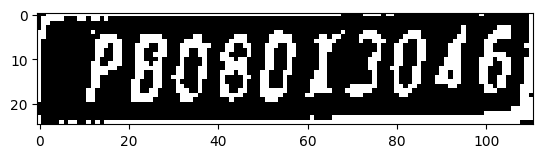

height =  382 width =  396


[186.05145263671875, 251.76806640625, 296.8352355957031, 299.5594177246094, 0.9045430421829224, 0.0] track_id: 183.0
-0.20349304525756276


['P808013046']
license before check P808013046
hello
License Plate Number with contours :  None , Score :  None
-0.20539538918976738
['P808013046']
license before check P808013046
hello
License Plate Number :  None , Score :  None
height =  392 width =  408


[193.24514770507812, 263.3808898925781, 306.6925048828125, 313.1617736816406, 0.9133251905441284, 0.0] track_id: 183.0
-0.20922155253553004


['PBOaDX306']
license before check PBOaDX306
hello
License Plate Number with contours :  None , Score :  None
-0.20278150417940963
['PBo8dT3046']
license before check PBo8dT3046
license after check PBO8DT3046
License Plate Number :  PB08DT3046 , Score :  0.09126210734958906


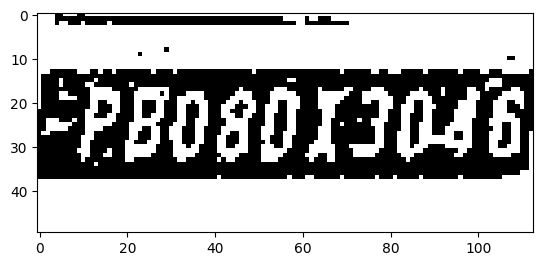

height =  162 width =  198
height =  401 width =  421


[199.73899841308594, 274.0692138671875, 317.37158203125, 323.2547912597656, 0.9094398617744446, 0.0] track_id: 183.0
-0.20512736453791688


['P8080t3046']
license before check P8080t3046
hello
License Plate Number with contours :  None , Score :  None
-0.20795854725293414
['CP80B0IJ046']
license before check CP80B0IJ046
hello
License Plate Number :  None , Score :  None
height =  162 width =  200
height =  416 width =  435


[207.04263305664062, 282.3327941894531, 329.1330871582031, 333.5899963378906, 0.9125374555587769, 0.0] track_id: 183.0
-0.17421578644294416
['PbO8dX3046']
license before check PbO8dX3046
license after check PBO8DX3046
License Plate Number with contours :  PB08DX3046 , Score :  0.48654921946151336


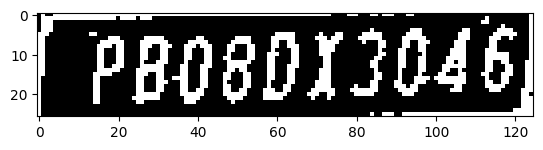

height =  426 width =  450


[214.880859375, 291.7808532714844, 340.4595642089844, 343.4483642578125, 0.9145525693893433, 0.0] track_id: 183.0
-0.205640367136851
['PboadxJ046']
license before check PboadxJ046
license after check PBOADXJ046
License Plate Number with contours :  PB0ADX3046 , Score :  0.15914977371113173


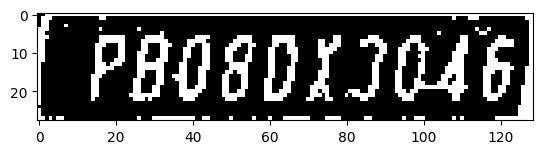

height =  164 width =  204
height =  440 width =  467


[226.3214111328125, 301.9884948730469, 354.7247314453125, 355.4539794921875, 0.9169654250144958, 0.0] track_id: 183.0
-0.1958688434788188
['PBo80XJ046']
license before check PBo80XJ046
license after check PBO80XJ046
License Plate Number with contours :  PB08OX3046 , Score :  0.1800322751521585


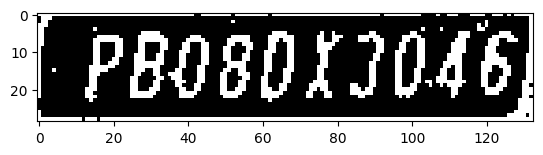

height =  447 width =  487


[238.19601440429688, 308.8705139160156, 370.4978942871094, 364.8149108886719, 0.9143831729888916, 0.0] track_id: 183.0
-0.20349304525756276


['P8080x3046']
license before check P8080x3046
hello
License Plate Number with contours :  None , Score :  None
-0.20668321848424925
['Peo8dt3046']
license before check Peo8dt3046
license after check PEO8DT3046
License Plate Number :  PE08DT3046 , Score :  0.3248162471844572


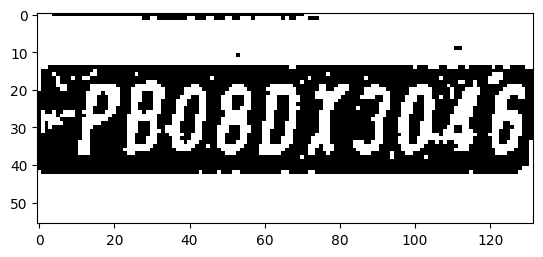

height =  462 width =  502


[248.38015747070312, 320.1994934082031, 385.9812927246094, 378.89178466796875, 0.9121707081794739, 0.0] track_id: 183.0
-0.17307603116985298
['PBo8dx3046']
license before check PBo8dx3046
license after check PBO8DX3046
License Plate Number with contours :  PB08DX3046 , Score :  0.7233393093304626


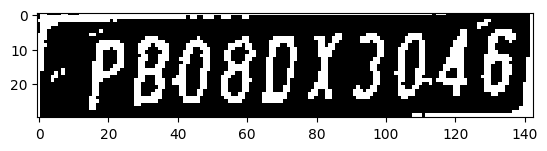

height =  479 width =  523


[260.41162109375, 331.9919128417969, 403.13543701171875, 393.3180847167969, 0.9111151695251465, 0.0] track_id: 183.0
-0.19405853107987997
['PBo8dx3446']
license before check PBo8dx3446
license after check PBO8DX3446
License Plate Number with contours :  PB08DX3446 , Score :  0.45171669283946336


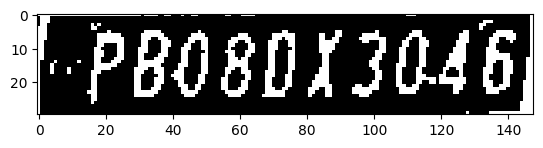

height =  500 width =  543


[272.37738037109375, 346.4014892578125, 421.54486083984375, 410.1682434082031, 0.9062597155570984, 0.0] track_id: 183.0
-0.20359126743581482


['P8o8dX3046']
license before check P8o8dX3046
hello
License Plate Number with contours :  None , Score :  None
-0.20963984587421253
['P8o8dx2046']
license before check P8o8dx2046
hello
License Plate Number :  None , Score :  None
height =  525 width =  567


[286.7038269042969, 361.60791015625, 441.84088134765625, 428.8382568359375, 0.907686173915863, 0.0] track_id: 183.0
-0.2059008225558759


['P8oadx3046']
license before check P8oadx3046
hello
License Plate Number with contours :  None , Score :  None
-0.20539538918976738
['PBo8dx3046']
license before check PBo8dx3046
license after check PBO8DX3046
License Plate Number :  PB08DX3046 , Score :  0.0855615128440562


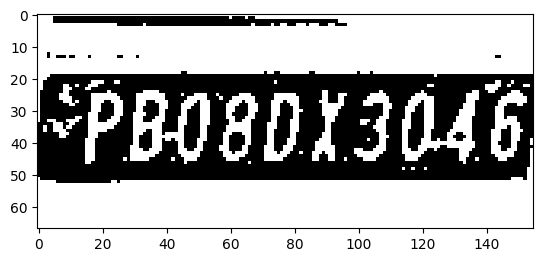

height =  545 width =  592


[304.36883544921875, 380.5030212402344, 464.5634765625, 448.7386474609375, 0.9142636060714722, 0.0] track_id: 183.0
-0.20922155253553004
['PBO8DX3046']
license before check PBO8DX3046
license after check PBO8DX3046
License Plate Number with contours :  PB08DX3046 , Score :  0.26945980227627386


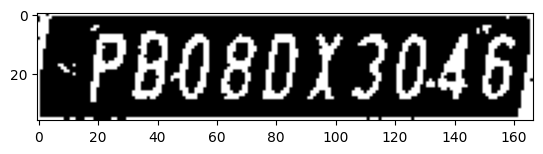

height =  568 width =  621


[323.7079772949219, 399.37994384765625, 490.2109680175781, 472.9922790527344, 0.9152590036392212, 0.0] track_id: 183.0
-0.19092315832258525


['P8O8Dx3046']
license before check P8O8Dx3046
hello
License Plate Number with contours :  None , Score :  None
-0.21066377998456154
['S908dx3046']
license before check S908dx3046
hello
License Plate Number :  None , Score :  None
height =  592 width =  649


[342.67376708984375, 418.01055908203125, 518.3060302734375, 494.860595703125, 0.9164358377456665, 0.0] track_id: 183.0
-0.20749622643520266
['PBO80x3046']
license before check PBO80x3046
license after check PBO80X3046
License Plate Number with contours :  PB08OX3046 , Score :  0.2811980549536242


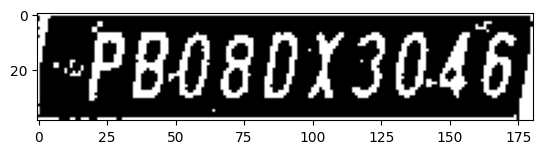

height =  619 width =  682


[366.8344421386719, 438.4173889160156, 549.2454833984375, 519.0321044921875, 0.9225993156433105, 0.0] track_id: 183.0
-0.2091597229996395
['PBo8dx3046']
license before check PBo8dx3046
license after check PBO8DX3046
License Plate Number with contours :  PB08DX3046 , Score :  0.3193043216598155


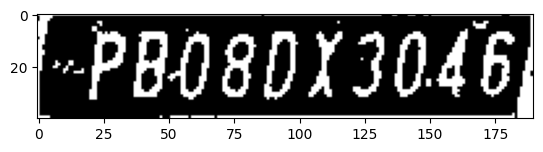

height =  649 width =  718


[395.5190734863281, 466.7449951171875, 585.5950927734375, 550.0880737304688, 0.9161008596420288, 0.0] track_id: 183.0
-0.2227600978001451
['PBO8DX3046']
license before check PBO8DX3046
license after check PBO8DX3046
License Plate Number with contours :  PB08DX3046 , Score :  0.09140095271290259


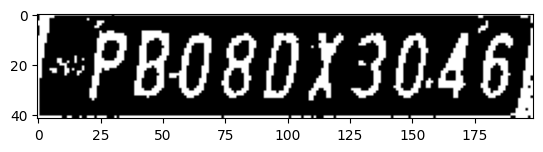

height =  172 width =  208
height =  683 width =  761


[428.89215087890625, 493.0126953125, 626.5482788085938, 579.5863037109375, 0.9115918874740601, 0.0] track_id: 183.0
-0.2247111684146427


['7PBO80X30461']
license before check 7PBO80X30461
hello
License Plate Number with contours :  None , Score :  None
-0.21979507152403238
['PBO80X3046']
license before check PBO80X3046
license after check PBO80X3046
License Plate Number :  PB08OX3046 , Score :  0.4066977209333596


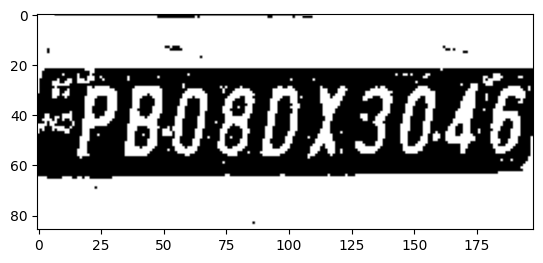

height =  172 width =  210
height =  722 width =  803


[462.4251708984375, 523.4483642578125, 669.6719360351562, 615.9962768554688, 0.917303740978241, 0.0] track_id: 183.0
-0.22734380712800387
['PBO80X3046']
license before check PBO80X3046
license after check PBO80X3046
License Plate Number with contours :  PB08OX3046 , Score :  0.5326962329295322


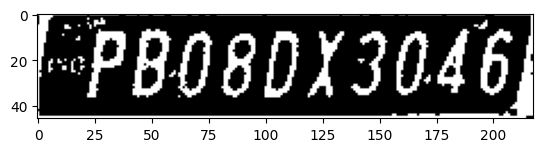

height =  176 width =  214
height =  770 width =  857
[503.4634094238281, 562.6767578125, 721.3388671875, 660.9534912109375, 0.9111411571502686, 0.0] track_id: 183.0
-0.24404843083704467
height =  177 width =  216
height =  814 width =  913


[552.43212890625, 598.7379760742188, 776.4277954101562, 703.9297485351562, 0.9229078888893127, 0.0] track_id: 183.0
-0.24400210093730484


['FPBO8DX3046']
license before check FPBO8DX3046
hello
License Plate Number with contours :  None , Score :  None
-0.2622395874030875
['PBo80Y3046']
license before check PBo80Y3046
license after check PBO80Y3046
License Plate Number :  PB08OY3046 , Score :  0.22971333254799509


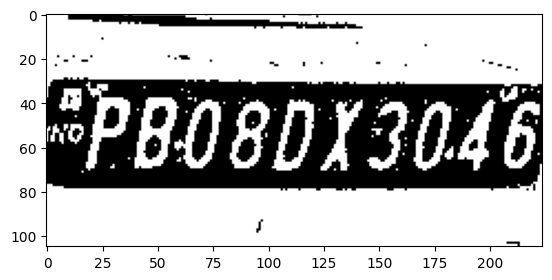

height =  180 width =  215
height =  869 width =  971


[605.9610595703125, 641.7150268554688, 840.9425048828125, 753.5916748046875, 0.9117190837860107, 0.0] track_id: 183.0
-0.2603620649074593
['PBO8DX3046']
license before check PBO8DX3046
license after check PBO8DX3046
License Plate Number with contours :  PB08DX3046 , Score :  0.2896216282290635


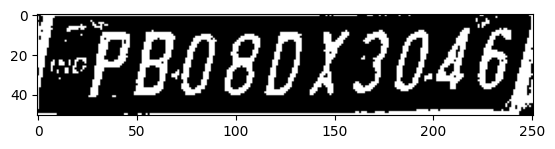

height =  182 width =  215
height =  929 width =  1033


[667.1002807617188, 696.1320190429688, 911.3396606445312, 813.1223754882812, 0.921838104724884, 0.0] track_id: 183.0
-0.296844673376403


['PPBo8dx3046']
license before check PPBo8dx3046
hello
License Plate Number with contours :  None , Score :  None
-0.29723230781769117
['PBo80x3046']
license before check PBo80x3046
license after check PBO80X3046
License Plate Number :  PB08OX3046 , Score :  0.5691874711717887


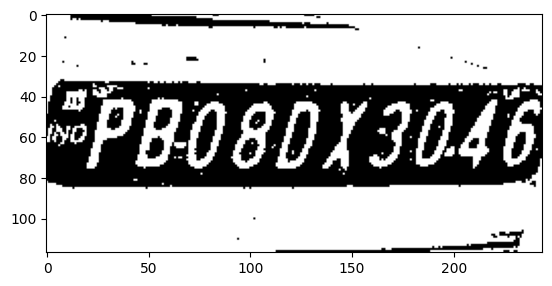

height =  996 width =  1110


[742.8350219726562, 746.5769653320312, 991.9876098632812, 873.5465698242188, 0.9131855964660645, 0.0] track_id: 183.0
-0.3324263053840973
['PBO8dx3046']
license before check PBO8dx3046
license after check PBO8DX3046
License Plate Number with contours :  PB08DX3046 , Score :  0.25864220765061186


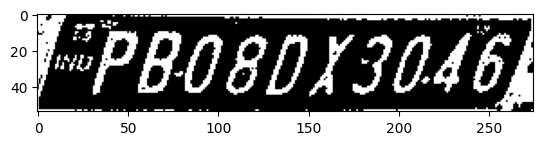

height =  1071 width =  1189


[828.8184204101562, 801.371337890625, 1080.7327880859375, 943.3446655273438, 0.8946648836135864, 0.0] track_id: 183.0
-0.36758998027775897


['FPBo8dx3046']
license before check FPBo8dx3046
hello
License Plate Number with contours :  None , Score :  None
-0.3457459479885121
['PBo8dx3046']
license before check PBo8dx3046
license after check PBO8DX3046
License Plate Number :  PB08DX3046 , Score :  0.37279344000448505


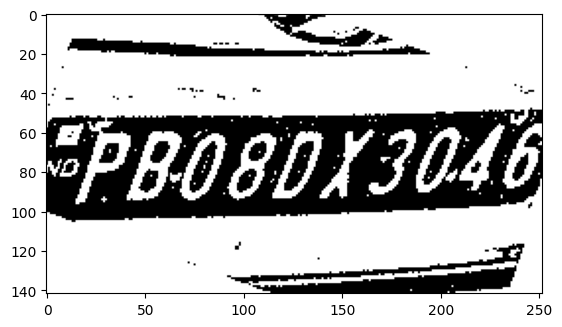

height =  1154 width =  1272


[922.9777221679688, 862.0576782226562, 1173.08056640625, 1024.2366943359375, 0.675647497177124, 0.0] track_id: 183.0
-0.4003628317432013


['p']
license before check p
hello
License Plate Number with contours :  None , Score :  None
-0.4345296274937672
['PBo80x3046']
license before check PBo80x3046
license after check PBO80X3046
License Plate Number :  PB08OX3046 , Score :  0.7576851024648845


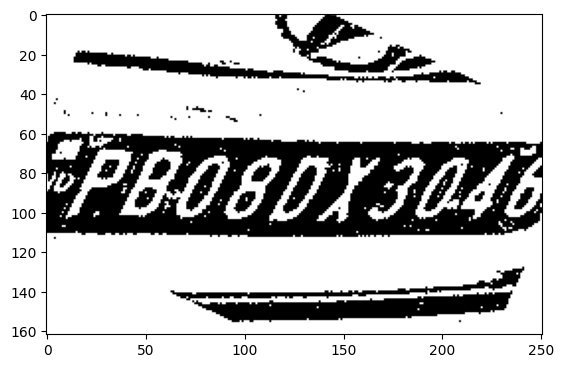

height =  1238 width =  1357
height =  1274 width =  1445
height =  1287 width =  1540
height =  1268 width =  1631
height =  1254 width =  1731
height =  1246 width =  1829
height =  1233 width =  1898
height =  1202 width =  1924
height =  1169 width =  1888
height =  1129 width =  1845
height =  1088 width =  1794
height =  1030 width =  1735
height =  974 width =  1663
height =  911 width =  1578
height =  852 width =  1476
height =  777 width =  1357
height =  697 width =  1210
height =  613 width =  1016
height =  535 width =  768
height =  284 width =  314
height =  523 width =  686
[515.4712524414062, 271.92279052734375, 592.6141967773438, 335.158447265625, 0.5578092932701111, 0.0] track_id: 185.0
-0.2408464552414116
height =  75 width =  98
height =  311 width =  185
height =  80 width =  102
height =  326 width =  230


[184.99818420410156, 204.04690551757812, 229.6697540283203, 248.6095733642578, 0.8717140555381775, 0.0] track_id: 194.0
-0.14888994760949725


[]
License Plate Number with contours :  None , Score :  None
-0.15660187698201536
['FUP1G']
license before check FUP1G
hello
License Plate Number :  None , Score :  None
height =  80 width =  102
height =  73 width =  90
height =  350 width =  289
[192.596923828125, 228.3502197265625, 287.8879089355469, 269.51055908203125, 0.9024220705032349, 0.0] track_id: 194.0
-0.15264932839526515
height =  76 width =  100
height =  74 width =  92
height =  366 width =  358


[205.33740234375, 239.04603576660156, 311.0612487792969, 281.73516845703125, 0.8909747004508972, 0.0] track_id: 194.0
-0.15612636584334216


['UPLOL3ESZ']
license before check UPLOL3ESZ
hello
License Plate Number with contours :  None , Score :  None
-0.15499674192394097
['EUPZDL3257']
license before check EUPZDL3257
hello
License Plate Number :  None , Score :  None
height =  69 width =  95
height =  72 width =  89
height =  383 width =  397


[213.65892028808594, 249.2987518310547, 325.2485046386719, 293.8175354003906, 0.8833760619163513, 0.0] track_id: 194.0
0.0


['ILDLSL5ZI']
license before check ILDLSL5ZI
hello
License Plate Number with contours :  None , Score :  None
-0.17301015067716222
['FUP1ZDL3Z57']
license before check FUP1ZDL3Z57
hello
License Plate Number :  None , Score :  None
height =  73 width =  87
height =  397 width =  417


[223.02816772460938, 260.3468933105469, 337.82391357421875, 305.1020202636719, 0.8840581774711609, 0.0] track_id: 194.0
-0.17573829668536678


['UPILDL925Z']
license before check UPILDL925Z
hello
License Plate Number with contours :  None , Score :  None
-0.17573829668536678
['FupILQL9L57']
license before check FupILQL9L57
hello
License Plate Number :  None , Score :  None
height =  75 width =  89
height =  73 width =  88
height =  421 width =  456


[247.14804077148438, 279.3927917480469, 369.9867248535156, 327.8740234375, 0.907303512096405, 0.0] track_id: 194.0
-0.15264932839526515


['UP1LpL9Z57']
license before check UP1LpL9Z57
hello
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['UP1LDL9457']
license before check UP1LDL9457
license after check UP1LDL9457
License Plate Number :  UP1LDL9457 , Score :  0.3480322398508335


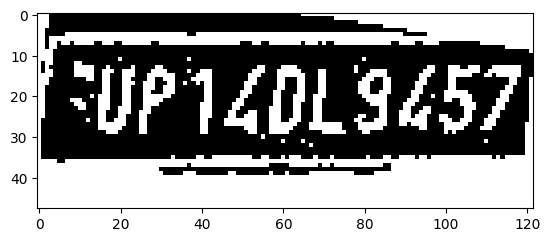

height =  74 width =  88
height =  74 width =  87
height =  75 width =  86
height =  478 width =  524


[296.31573486328125, 317.8385314941406, 435.1976013183594, 375.6820373535156, 0.9096665382385254, 0.0] track_id: 194.0
-0.15922457610155116


['UPIL0L9L5Z']
license before check UPIL0L9L5Z
hello
License Plate Number with contours :  None , Score :  None
-0.17644054376094007
['IP140L3L57']
license before check IP140L3L57
license after check IP140L3L57
License Plate Number :  IP14OL3457 , Score :  0.3225945784679014


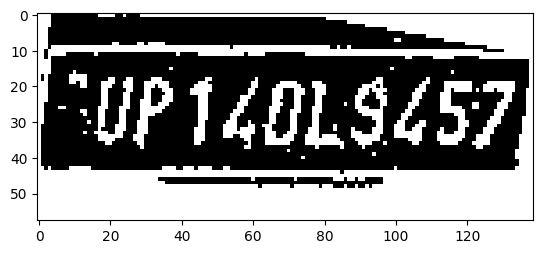

height =  75 width =  85
height =  499 width =  551
[317.31317138671875, 338.0728759765625, 460.92218017578125, 394.9420471191406, 0.9166757464408875, 0.0] track_id: 194.0
-0.1594733694486595
height =  74 width =  84
height =  523 width =  582
[341.0727844238281, 349.4493408203125, 491.7133483886719, 411.947998046875, 0.9119506478309631, 0.0] track_id: 194.0
-0.1624891092172034
height =  76 width =  101
height =  71 width =  79
height =  552 width =  613
[369.2320861816406, 369.360595703125, 524.8622436523438, 435.56829833984375, 0.918714165687561, 0.0] track_id: 194.0
-0.17268149161800542
height =  578 width =  651


[400.1795959472656, 390.7342224121094, 563.3080444335938, 458.2594909667969, 0.9177389740943909, 0.0] track_id: 194.0
-0.1558682013983225


['FUPILDL9L57']
license before check FUPILDL9L57
hello
License Plate Number with contours :  None , Score :  None
-0.1775961672834879
['UP1LDL94571']
license before check UP1LDL94571
hello
License Plate Number :  None , Score :  None
height =  94 width =  112
height =  66 width =  74
height =  609 width =  691
[432.34637451171875, 416.35943603515625, 605.1431274414062, 486.67108154296875, 0.9149824976921082, 0.0] track_id: 194.0
-0.15660187698201536
height =  66 width =  72
height =  641 width =  736
[472.5473937988281, 448.11248779296875, 649.9044189453125, 521.3790893554688, 0.913272500038147, 0.0] track_id: 194.0
-0.15660187698201536
height =  69 width =  72
height =  686 width =  785
[516.9500732421875, 481.70025634765625, 699.4940185546875, 562.5728759765625, 0.9135827422142029, 0.0] track_id: 194.0
-0.1740452398427387
height =  104 width =  134
height =  67 width =  71
height =  729 width =  840


[568.787353515625, 521.439208984375, 761.8986206054688, 604.9637451171875, 0.9136777520179749, 0.0] track_id: 194.0
0.08887417481310786


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.18998828791871572
['FUP1LDL945Z']
license before check FUP1LDL945Z
hello
License Plate Number :  None , Score :  None
height =  67 width =  69
height =  782 width =  902


[631.4916381835938, 564.0321044921875, 828.239501953125, 655.996826171875, 0.9150300025939941, 0.0] track_id: 194.0
-0.20932342356645206


[]
License Plate Number with contours :  None , Score :  None
-0.2093853929534955
['IPUPI4DL945Z']
license before check IPUPI4DL945Z
hello
License Plate Number :  None , Score :  None
height =  107 width =  134
height =  70 width =  70
height =  837 width =  967


[697.728271484375, 609.4498901367188, 901.6381225585938, 707.1514892578125, 0.8824846744537354, 0.0] track_id: 194.0
-0.22679884805388587


[]
License Plate Number with contours :  None , Score :  None
-0.2263885074942332
['FUPIDL94571']
license before check FUPIDL94571
hello
License Plate Number :  None , Score :  None
height =  106 width =  144
height =  69 width =  69
height =  901 width =  1038


[775.572998046875, 659.6010131835938, 983.4743041992188, 768.7908935546875, 0.8715388178825378, 0.0] track_id: 194.0
-0.2624593998262764


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.2793232001011071
['FAUP1LDL9L57']
license before check FAUP1LDL9L57
hello
License Plate Number :  None , Score :  None
height =  109 width =  143
height =  67 width =  71
height =  971 width =  1115


[858.8345947265625, 716.3400268554688, 1070.27392578125, 832.101806640625, 0.8648669123649597, 0.0] track_id: 194.0
-0.3126322660794467


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.3347368373168147
['FUp140L9457']
license before check FUp140L9457
hello
License Plate Number :  None , Score :  None
height =  108 width =  145
height =  1125 width =  1282
height =  1214 width =  1366
height =  1308 width =  1444
height =  1359 width =  1530
height =  1365 width =  1627
height =  1355 width =  1624
height =  1340 width =  1600
height =  1321 width =  1489
height =  1252 width =  1443
height =  1277 width =  1372
height =  1260 width =  1270
height =  120 width =  194
height =  1230 width =  1147
height =  119 width =  195
height =  1184 width =  1002
height =  122 width =  197
height =  1132 width =  847
height =  124 width =  201
height =  125 width =  204
height =  124 width =  206
height =  127 width =  206
height =  125 width =  208
height =  152 width =  144
height =  172 width =  157
height =  183 width =  162
[70.30164337158203, 113.57853698730469, 114.0058059692382

[74.3206787109375, 115.18429565429688, 121.75254821777344, 137.18136596679688, 0.8721505999565125, 0.0] track_id: 195.0
-0.22768931976865586


[]
License Plate Number with contours :  None , Score :  None
-0.22347660114063303
[]
License Plate Number :  None , Score :  None
height =  95 width =  101
height =  194 width =  176


[74.47416687011719, 116.52912139892578, 123.04600524902344, 139.9367218017578, 0.8496958613395691, 0.0] track_id: 195.0
-0.22679884805388587


[]
License Plate Number with contours :  None , Score :  None
-0.23374318086890142
[]
License Plate Number :  None , Score :  None
height =  102 width =  105
height =  199 width =  178


[76.3611068725586, 120.33991241455078, 125.85140991210938, 143.244873046875, 0.8815721869468689, 0.0] track_id: 195.0
-0.22923193327699534


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  103 width =  104
height =  201 width =  182


[79.77670288085938, 120.92866516113281, 129.6993408203125, 142.86619567871094, 0.8765522837638855, 0.0] track_id: 195.0
-0.21866894587394195


[]
License Plate Number with contours :  None , Score :  None
-0.2284966392918623
[]
License Plate Number :  None , Score :  None
height =  103 width =  105
height =  203 width =  184
[79.78578186035156, 123.24031829833984, 130.79110717773438, 146.78468322753906, 0.862777590751648, 0.0] track_id: 195.0
-0.21535769969773805
height =  102 width =  104
height =  206 width =  187


[81.44681549072266, 124.47132873535156, 132.48739624023438, 149.25665283203125, 0.8769245147705078, 0.0] track_id: 195.0
-0.2171113147349052


[]
License Plate Number with contours :  None , Score :  None
-0.18164883000001195
[]
License Plate Number :  None , Score :  None
height =  103 width =  101
height =  206 width =  192


[81.51663208007812, 122.9303207397461, 133.94900512695312, 150.56886291503906, 0.5159295201301575, 0.0] track_id: 195.0
-0.2082059495239874


[]
License Plate Number with contours :  None , Score :  None
-0.22347660114063303
[]
License Plate Number :  None , Score :  None
height =  103 width =  104
height =  211 width =  196


[84.39505767822266, 122.7660903930664, 137.6092071533203, 148.86911010742188, 0.8507278561592102, 0.0] track_id: 195.0
-0.20902294280626463


[]
License Plate Number with contours :  None , Score :  None
-0.21243202050874216
[]
License Plate Number :  None , Score :  None
height =  103 width =  102
height =  215 width =  200
[86.34056854248047, 124.88299560546875, 141.23629760742188, 152.87693786621094, 0.8427957892417908, 0.0] track_id: 195.0
-0.20539538918976738
height =  105 width =  101
height =  213 width =  202
[87.51465606689453, 126.45690155029297, 142.4556427001953, 152.1938018798828, 0.8781191110610962, 0.0] track_id: 195.0
-0.22679884805388587
height =  112 width =  106
height =  209 width =  204


[87.91044616699219, 130.0352020263672, 143.5125732421875, 156.22909545898438, 0.8570090532302856, 0.0] track_id: 195.0
-0.22208190190548016


[]
License Plate Number with contours :  None , Score :  None
-0.2299044281319047
[]
License Plate Number :  None , Score :  None
height =  111 width =  107
height =  213 width =  207


[89.04859161376953, 130.89508056640625, 146.2254638671875, 158.27955627441406, 0.8369982838630676, 0.0] track_id: 195.0
-0.21866894587394195


[]
License Plate Number with contours :  None , Score :  None
-0.21655030497608926
[]
License Plate Number :  None , Score :  None
height =  107 width =  107
height =  224 width =  212
[91.4051742553711, 136.53884887695312, 150.9974365234375, 165.68063354492188, 0.8922418355941772, 0.0] track_id: 195.0
-0.21109333322274654
height =  112 width =  120
height =  228 width =  216
[94.1084213256836, 138.91436767578125, 153.95159912109375, 168.6302032470703, 0.8964512348175049, 0.0] track_id: 195.0
-0.19321148384780604
height =  110 width =  113
height =  235 width =  222


[95.48939514160156, 141.7189178466797, 157.35287475585938, 170.97850036621094, 0.848488450050354, 0.0] track_id: 195.0
-0.20304521725346514


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
[]
License Plate Number :  None , Score :  None
height =  242 width =  227


[97.83714294433594, 143.51473999023438, 160.7572021484375, 173.95370483398438, 0.89544677734375, 0.0] track_id: 195.0
-0.21866894587394195


[]
License Plate Number with contours :  None , Score :  None
-0.2168736156664083
[]
License Plate Number :  None , Score :  None
height =  244 width =  233


[100.86168670654297, 146.83375549316406, 165.4126739501953, 179.2806854248047, 0.9023141264915466, 0.0] track_id: 195.0
-0.2260683879938839


[]
License Plate Number with contours :  None , Score :  None
-0.2204937613666717
[]
License Plate Number :  None , Score :  None
height =  116 width =  109
height =  248 width =  238
[103.31239318847656, 149.530517578125, 169.56985473632812, 182.7937469482422, 0.8996837139129639, 0.0] track_id: 195.0
-0.21535769969773805
height =  110 width =  103
height =  251 width =  244
[105.49738311767578, 151.7368621826172, 174.10060119628906, 186.2000732421875, 0.9118624925613403, 0.0] track_id: 195.0
-0.20687394897974307
height =  96 width =  100
height =  262 width =  250


[108.17219543457031, 158.94129943847656, 178.31402587890625, 193.0211639404297, 0.8994311690330505, 0.0] track_id: 195.0
-0.23186466084938878


['Pib']
license before check Pib
hello
License Plate Number with contours :  None , Score :  None
-0.20304521725346514
[]
License Plate Number :  None , Score :  None
height =  106 width =  103
height =  266 width =  258


[112.958984375, 162.39205932617188, 185.140380859375, 197.362548828125, 0.9173274040222168, 0.0] track_id: 195.0
-0.24273651441777036


['X']
license before check X
hello
License Plate Number with contours :  None , Score :  None
-0.22347660114063303
['EvPTIcTQC']
license before check EvPTIcTQC
hello
License Plate Number :  None , Score :  None
height =  109 width =  102
height =  275 width =  263


[117.59123992919922, 169.61183166503906, 190.59967041015625, 204.74591064453125, 0.910041093826294, 0.0] track_id: 195.0
-0.22152880461674798


['DX']
license before check DX
hello
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
['EPIIEOOE']
license before check EPIIEOOE
hello
License Plate Number :  None , Score :  None
height =  109 width =  100
height =  282 width =  271


[122.58553314208984, 173.4228973388672, 197.5771484375, 209.85643005371094, 0.9108632802963257, 0.0] track_id: 195.0
-0.2086817623350266


['XW']
license before check XW
hello
License Plate Number with contours :  None , Score :  None
-0.20018106796588866
['ErPriccj07']
license before check ErPriccj07
hello
License Plate Number :  None , Score :  None
height =  108 width =  99
height =  289 width =  282


[126.58746337890625, 177.40138244628906, 204.0778045654297, 214.35972595214844, 0.9155093431472778, 0.0] track_id: 195.0
-0.20653607310567618


['']
License Plate Number with contours :  None , Score :  None
-0.2247111684146427
['FBr1CcOJDS']
license before check FBr1CcOJDS
hello
License Plate Number :  None , Score :  None
height =  109 width =  100
height =  298 width =  291


[131.8701629638672, 182.927490234375, 211.66983032226562, 222.26934814453125, 0.9100912809371948, 0.0] track_id: 195.0
-0.1957371865774664


['Kjj']
license before check Kjj
hello
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
['EupIIcCQJOJ']
license before check EupIIcCQJOJ
hello
License Plate Number :  None , Score :  None
height =  113 width =  102
height =  302 width =  298


[135.2389678955078, 189.2733154296875, 216.76873779296875, 229.8023223876953, 0.9069094657897949, 0.0] track_id: 195.0
-0.20131710837464076


['Wjoj']
license before check Wjoj
hello
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
['Fur1TccQ303']
license before check Fur1TccQ303
hello
License Plate Number :  None , Score :  None
height =  114 width =  102
height =  314 width =  306


[140.29721069335938, 194.52362060546875, 223.9219512939453, 236.09426879882812, 0.9050764441490173, 0.0] track_id: 195.0
-0.20401797959254858


['QCTFCEDQ']
license before check QCTFCEDQ
hello
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
['FUPIICE0JOJ']
license before check FUPIICE0JOJ
hello
License Plate Number :  None , Score :  None
height =  117 width =  104
height =  326 width =  316


[145.20947265625, 202.48028564453125, 231.30889892578125, 245.32427978515625, 0.9059823155403137, 0.0] track_id: 195.0
-0.20112688581653948


['UPHIcEQ3oj']
license before check UPHIcEQ3oj
hello
License Plate Number with contours :  None , Score :  None
-0.20442120537714656
['FuP1JCE0J03']
license before check FuP1JCE0J03
hello
License Plate Number :  None , Score :  None
height =  115 width =  104
height =  338 width =  328


[151.49777221679688, 212.36624145507812, 241.1195831298828, 256.06805419921875, 0.9104556441307068, 0.0] track_id: 195.0
-0.20749622643520266


['VPICEDJO']
license before check VPICEDJO
hello
License Plate Number with contours :  None , Score :  None
-0.2086817623350266
['FuP11CE03Q']
license before check FuP11CE03Q
hello
License Plate Number :  None , Score :  None
height =  116 width =  103
height =  352 width =  343


[159.334228515625, 220.84872436523438, 252.86248779296875, 267.0316162109375, 0.9075507521629333, 0.0] track_id: 195.0
-0.20846521837998772


['UPTICOJD']
license before check UPTICOJD
hello
License Plate Number with contours :  None , Score :  None
-0.21032587366505767
['EUPTICE0JQJ']
license before check EUPTICE0JQJ
hello
License Plate Number :  None , Score :  None
height =  118 width =  105
height =  364 width =  356


[166.98716735839844, 232.2095489501953, 263.6008605957031, 279.26226806640625, 0.9181180596351624, 0.0] track_id: 195.0
-0.20278150417940963


['UPTCEOOZ']
license before check UPTCEOOZ
hello
License Plate Number with contours :  None , Score :  None
-0.21634066137329055
['FUPTICE03O']
license before check FUPTICE03O
hello
License Plate Number :  None , Score :  None
height =  122 width =  108
height =  376 width =  371


[174.97938537597656, 245.9769287109375, 276.2860107421875, 293.0885314941406, 0.9041946530342102, 0.0] track_id: 195.0
-0.1407301939902253


['UP1ACEOJO']
license before check UP1ACEOJO
hello
License Plate Number with contours :  None , Score :  None
-0.21182754748141747
['EuP1ICE03O3']
license before check EuP1ICE03O3
hello
License Plate Number :  None , Score :  None
height =  126 width =  113
height =  391 width =  385


[184.5106964111328, 255.97561645507812, 289.1062316894531, 306.0059509277344, 0.9049524664878845, 0.0] track_id: 195.0
-0.18919902209996817


['UP11CE0Ju']
license before check UP11CE0Ju
hello
License Plate Number with contours :  None , Score :  None
-0.2275674874105842
['EUP11CE030']
license before check EUP11CE030
hello
License Plate Number :  None , Score :  None
height =  130 width =  118
height =  405 width =  402


[196.56260681152344, 261.943115234375, 305.40850830078125, 313.27044677734375, 0.9096401929855347, 0.0] track_id: 195.0
-0.20478094994297488


['UptiCE0jO']
license before check UptiCE0jO
hello
License Plate Number with contours :  None , Score :  None
-0.20653607310567618
['FUPTICEDJOT']
license before check FUPTICEDJOT
hello
License Plate Number :  None , Score :  None
height =  137 width =  128
height =  421 width =  420


[206.67578125, 274.3363952636719, 320.48028564453125, 326.06597900390625, 0.9041600823402405, 0.0] track_id: 195.0
-0.20401797959254858
['Upi1ce030j']
license before check Upi1ce030j
license after check UPI1CE030J
License Plate Number with contours :  UP11CE0303 , Score :  0.12772200250143906


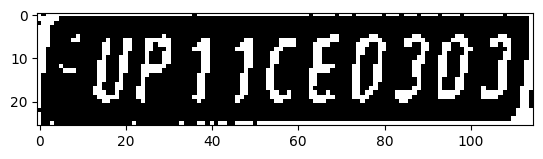

height =  138 width =  125
height =  436 width =  437


[216.68310546875, 287.4923400878906, 335.4338073730469, 341.2038879394531, 0.9106233716011047, 0.0] track_id: 195.0
-0.13411078259227596


['UPTTCE03OJ']
license before check UPTTCE03OJ
hello
License Plate Number with contours :  None , Score :  None
-0.2148154004016586
['FUPT1CE0JO3']
license before check FUPT1CE0JO3
hello
License Plate Number :  None , Score :  None
height =  140 width =  126
height =  448 width =  457


[230.52085876464844, 296.9501953125, 353.44744873046875, 352.8885192871094, 0.9108719825744629, 0.0] track_id: 195.0
-0.1555948279770297


['UPTICE0303']
license before check UPTICE0303
hello
License Plate Number with contours :  None , Score :  None
-0.20574261139803554
['FUP11CEJO3']
license before check FUP11CEJO3
hello
License Plate Number :  None , Score :  None
height =  140 width =  125
height =  467 width =  480


[243.76922607421875, 311.7451171875, 372.3343505859375, 369.1937255859375, 0.9104949831962585, 0.0] track_id: 195.0
-0.19566245933205176
['UP11CE03OJ']
license before check UP11CE03OJ
license after check UP11CE03OJ
License Plate Number with contours :  UP11CE0303 , Score :  0.2328656886226987


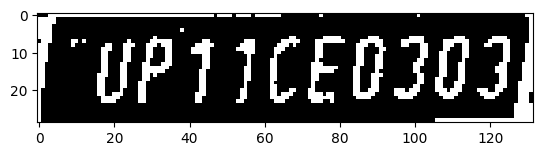

height =  141 width =  128
height =  492 width =  505


[259.6755065917969, 330.7363586425781, 393.31463623046875, 391.4057922363281, 0.9062215089797974, 0.0] track_id: 195.0
-0.20539538918976738
['UP11CEO303']
license before check UP11CEO303
license after check UP11CEO303
License Plate Number with contours :  UP11CE0303 , Score :  0.6182178004377218


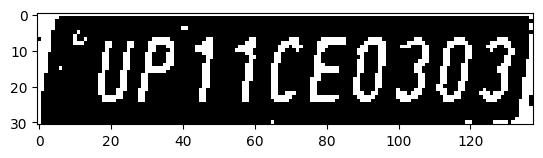

height =  140 width =  131
[56.040164947509766, 84.18612670898438, 94.18063354492188, 100.50176239013672, 0.5217107534408569, 0.0] track_id: 198.0
-0.23824475817874502
height =  514 width =  530


[276.4702453613281, 344.09405517578125, 417.52777099609375, 408.9092102050781, 0.9120205044746399, 0.0] track_id: 195.0
-0.21264492235777152


['1ce0j03']
license before check 1ce0j03
hello
License Plate Number with contours :  None , Score :  None
-0.20326059523850443
['PUPTICEO303']
license before check PUPTICEO303
hello
License Plate Number :  None , Score :  None
height =  140 width =  134
height =  539 width =  563


[296.41497802734375, 364.8694763183594, 446.3838806152344, 431.5846252441406, 0.9120988845825195, 0.0] track_id: 195.0
-0.21109333322274654


['UPTICEO303']
license before check UPTICEO303
hello
License Plate Number with contours :  None , Score :  None
-0.20859957280615768
['UPTICEOJO3']
license before check UPTICEOJO3
hello
License Plate Number :  None , Score :  None
height =  143 width =  141
[56.31429672241211, 86.5018310546875, 94.81703186035156, 103.93017578125, 0.2690439522266388, 0.0] track_id: 198.0
-0.2596296294082575
height =  564 width =  598


[322.4922180175781, 389.3671875, 478.57537841796875, 460.1190490722656, 0.9073370695114136, 0.0] track_id: 195.0
-0.21195763724261935


['UPTICE03O3']
license before check UPTICE03O3
hello
License Plate Number with contours :  None , Score :  None
-0.20783904438543416
['UP11CE03O3']
license before check UP11CE03O3
license after check UP11CE03O3
License Plate Number :  UP11CE0303 , Score :  0.3686831508211928


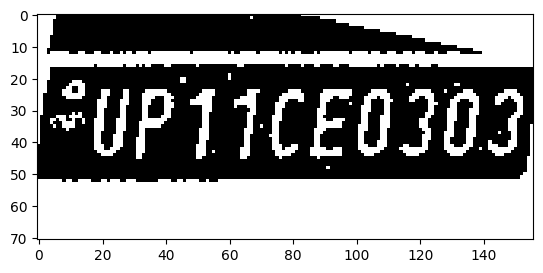

height =  145 width =  142
height =  600 width =  636


[348.74871826171875, 415.57342529296875, 514.1935424804688, 490.8392333984375, 0.9128672480583191, 0.0] track_id: 195.0
-0.20693927856742042
['UP11CEO303']
license before check UP11CEO303
license after check UP11CEO303
License Plate Number with contours :  UP11CE0303 , Score :  0.3358175852999779


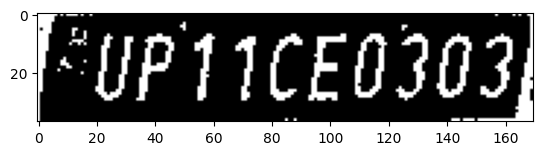

height =  145 width =  143
height =  632 width =  678


[378.53167724609375, 441.2723083496094, 552.8397216796875, 520.6664428710938, 0.9192016124725342, 0.0] track_id: 195.0
-0.21293834957939714


['1CE03O3']
license before check 1CE03O3
hello
License Plate Number with contours :  None , Score :  None
-0.20687394897974307
['FUP11CEO3O']
license before check FUP11CEO3O
hello
License Plate Number :  None , Score :  None
height =  147 width =  144
[57.862911224365234, 89.52983856201172, 98.41657257080078, 107.5464859008789, 0.3579842150211334, 0.0] track_id: 198.0
-0.2587708919636976
height =  665 width =  728


[417.6973571777344, 470.44921875, 600.9270629882812, 554.4764404296875, 0.9149731397628784, 0.0] track_id: 195.0
-0.21147913567274096


['FUPTICEO3O3']
license before check FUPTICEO3O3
hello
License Plate Number with contours :  None , Score :  None
-0.20952285944517204
['FUPT1CEO3O3']
license before check FUPT1CEO3O3
hello
License Plate Number :  None , Score :  None
height =  153 width =  148
[59.46883773803711, 94.04200744628906, 100.73017120361328, 112.1546401977539, 0.3104020655155182, 0.0] track_id: 198.0
-0.225601243836024
height =  706 width =  783


[460.7803649902344, 506.10687255859375, 656.0424194335938, 596.6639404296875, 0.9154548048973083, 0.0] track_id: 195.0
-0.14189705460416394


['FUpTICE03O']
license before check FUpTICE03O
hello
License Plate Number with contours :  None , Score :  None
-0.2213144423477913
['UP1ICEO3O3']
license before check UP1ICEO3O3
license after check UP1ICEO3O3
License Plate Number :  UP1ICE0303 , Score :  0.22266067677655593


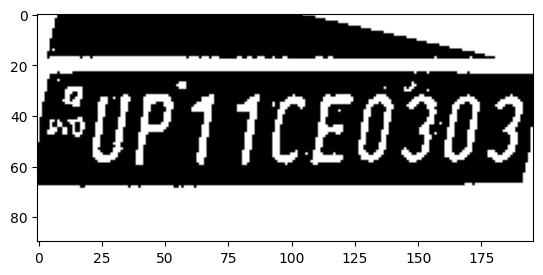

height =  156 width =  150
[61.40064239501953, 96.81378936767578, 103.68289184570312, 114.44552612304688, 0.45544731616973877, 0.0] track_id: 198.0
-0.23783592745745075
height =  751 width =  843


[509.853515625, 548.210205078125, 717.700439453125, 646.310791015625, 0.9140713214874268, 0.0] track_id: 195.0
-0.22366209548092808


['FUPTICEO303']
license before check FUPTICEO303
hello
License Plate Number with contours :  None , Score :  None
-0.22390450013034954
['FUP11CEO3O3']
license before check FUP11CEO3O3
hello
License Plate Number :  None , Score :  None
height =  158 width =  152
[60.356658935546875, 97.57447814941406, 102.87688446044922, 115.79022216796875, 0.6337656378746033, 0.0] track_id: 198.0
-0.23501221572065709
height =  788 width =  910


[570.916748046875, 577.7234497070312, 789.7086181640625, 685.271484375, 0.9136417508125305, 0.0] track_id: 195.0
-0.2440334838242063


['FUP1ICEO303']
license before check FUP1ICEO303
hello
License Plate Number with contours :  None , Score :  None
-0.24149839875592433
['UPTICEO303']
license before check UPTICEO303
hello
License Plate Number :  None , Score :  None
height =  162 width =  155
[62.0012092590332, 101.02507019042969, 104.89096069335938, 120.68256378173828, 0.6335197687149048, 0.0] track_id: 198.0
-0.23783592745745075
height =  854 width =  983


[643.2727661132812, 637.3274536132812, 871.8189086914062, 753.7716674804688, 0.924689769744873, 0.0] track_id: 195.0
-0.2628126818012631


['FUP1ICEO3031']
license before check FUP1ICEO3031
hello
License Plate Number with contours :  None , Score :  None
-0.25988270853226214
['PUP11CE0303']
license before check PUP11CE0303
hello
License Plate Number :  None , Score :  None
height =  166 width =  160
[64.2311019897461, 105.37052154541016, 108.15226745605469, 125.37761688232422, 0.4499295949935913, 0.0] track_id: 198.0
-0.24156570709532596
height =  925 width =  1067


[725.5352783203125, 701.4078369140625, 965.72900390625, 824.4256591796875, 0.9243239760398865, 0.0] track_id: 195.0
-0.2767572437758286


['FUPT1CEO3O31']
license before check FUPT1CEO3O31
hello
License Plate Number with contours :  None , Score :  None
-0.27829965900511133
['UPTICEO3O3']
license before check UPTICEO3O3
hello
License Plate Number :  None , Score :  None
height =  171 width =  162
[66.06047821044922, 108.38756561279297, 110.21490478515625, 130.26007080078125, 0.5230214595794678, 0.0] track_id: 198.0
-0.23824475817874502
height =  1004 width =  1164


[824.7482299804688, 764.6170043945312, 1071.3607177734375, 899.8762817382812, 0.9138909578323364, 0.0] track_id: 195.0
-0.311800634003837


['BUP11CE0303F']
license before check BUP11CE0303F
hello
License Plate Number with contours :  None , Score :  None
-0.3148541120082937
['UP11CEO3OS']
license before check UP11CEO3OS
license after check UP11CEO3OS
License Plate Number :  UP11CE0305 , Score :  0.20889037702364296


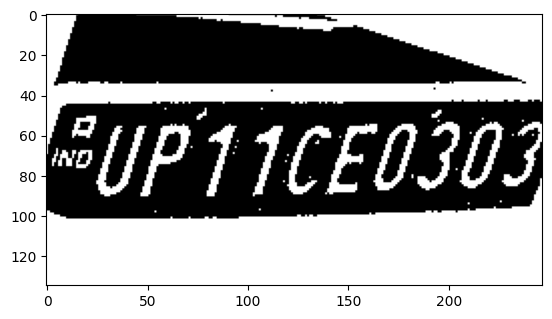

height =  188 width =  184
[88.11137390136719, 123.40790557861328, 132.96697998046875, 146.63755798339844, 0.6045369505882263, 0.0] track_id: 198.0
-0.2405342479459046
height =  1099 width =  1265


[943.3040161132812, 834.0567626953125, 1191.64111328125, 992.8858032226562, 0.8743445873260498, 0.0] track_id: 195.0
-0.3661139508022687


['FUP11CE0303f']
license before check FUP11CE0303f
hello
License Plate Number with contours :  None , Score :  None
-0.3678716704111534
['UPTCE03OJ']
license before check UPTCE03OJ
hello
License Plate Number :  None , Score :  None
height =  196 width =  191
height =  1215 width =  1373


[1074.590087890625, 914.5846557617188, 1318.406005859375, 1110.3370361328125, 0.8122157454490662, 0.0] track_id: 195.0
-0.4555832676940391


['Il']
license before check Il
hello
License Plate Number with contours :  None , Score :  None
-0.4547982824845484
['EUPTTCEO3OS']
license before check EUPTTCEO3OS
hello
License Plate Number :  None , Score :  None
height =  202 width =  197
[98.66606140136719, 134.80776977539062, 145.46778869628906, 158.10606384277344, 0.3694213330745697, 0.0] track_id: 198.0
-0.24135549057540379
height =  1320 width =  1491
height =  202 width =  200


[100.5076675415039, 133.17454528808594, 147.99913024902344, 156.9656982421875, 0.5967203974723816, 0.0] track_id: 198.0
-0.23783592745745075


[]
License Plate Number with contours :  None , Score :  None
-0.23255694180490905
['400']
license before check 400
hello
License Plate Number :  None , Score :  None
height =  1364 width =  1649
height =  203 width =  193
[92.2978744506836, 133.49468994140625, 140.38101196289062, 157.6800537109375, 0.771172285079956, 0.0] track_id: 198.0
-0.24192056868440487
height =  1378 width =  1780
height =  195 width =  191


[88.16239929199219, 122.97254180908203, 137.2888641357422, 147.6304168701172, 0.8433377146720886, 0.0] track_id: 198.0
-0.24156570709532596


[]
License Plate Number with contours :  None , Score :  None
-0.2587708919636976
[]
License Plate Number :  None , Score :  None
height =  1368 width =  1935
height =  190 width =  188


[84.0013427734375, 120.08426666259766, 134.1938018798828, 142.99749755859375, 0.8293020725250244, 0.0] track_id: 198.0
-0.2551823906208184


[]
License Plate Number with contours :  None , Score :  None
-0.2347226124851971
['DELt']
license before check DELt
hello
License Plate Number :  None , Score :  None
height =  1359 width =  2018
height =  207 width =  202


[97.01028442382812, 131.57688903808594, 147.0728302001953, 157.41030883789062, 0.845396876335144, 0.0] track_id: 198.0
-0.2596296294082575


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  1352 width =  2013
height =  217 width =  210
[103.83644104003906, 141.3925323486328, 155.1466522216797, 167.61119079589844, 0.8486164808273315, 0.0] track_id: 198.0
-0.2405342479459046
height =  224 width =  217


[108.85536193847656, 147.562255859375, 161.00753784179688, 174.48040771484375, 0.8981457948684692, 0.0] track_id: 198.0
-0.2541247495556341


[]
License Plate Number with contours :  None , Score :  None
-0.2299044281319047
[]
License Plate Number :  None , Score :  None
height =  1312 width =  1937
height =  228 width =  219


[109.16594696044922, 152.72755432128906, 162.22161865234375, 179.4889373779297, 0.9014204740524292, 0.0] track_id: 198.0
-0.25580856461537194


[]
License Plate Number with contours :  None , Score :  None
-0.23109066719589708
[]
License Plate Number :  None , Score :  None
height =  1278 width =  1891
height =  230 width =  223


[112.20176696777344, 154.01416015625, 166.22549438476562, 181.39801025390625, 0.8736399412155151, 0.0] track_id: 198.0
-0.2510026866430346


[]
License Plate Number with contours :  None , Score :  None
-0.22527677921405528
['3zD']
license before check 3zD
hello
License Plate Number :  None , Score :  None
height =  1249 width =  1824
height =  233 width =  229


[115.95838165283203, 153.8070068359375, 170.95364379882812, 182.4151611328125, 0.8957171440124512, 0.0] track_id: 198.0
-0.225601243836024


[]
License Plate Number with contours :  None , Score :  None
-0.23554498072086333
[]
License Plate Number :  None , Score :  None
height =  1220 width =  1754
height =  234 width =  231


[115.4730453491211, 154.71530151367188, 171.7783660888672, 183.19973754882812, 0.9043952822685242, 0.0] track_id: 198.0
-0.23186466084938878


[]
License Plate Number with contours :  None , Score :  None
-0.2401710078601731
['IFtth']
license before check IFtth
hello
License Plate Number :  None , Score :  None
height =  1185 width =  1654
height =  234 width =  230


[112.7939682006836, 154.7320556640625, 169.99411010742188, 183.63133239746094, 0.9095602631568909, 0.0] track_id: 198.0
-0.24207169457111893


[]
License Plate Number with contours :  None , Score :  None
-0.22266094063636496
[]
License Plate Number :  None , Score :  None
height =  240 width =  237


[115.45903015136719, 158.0806427001953, 174.15769958496094, 186.9850311279297, 0.8813416361808777, 0.0] track_id: 198.0
-0.220248723390689


[]
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
['Iu']
license before check Iu
hello
License Plate Number :  None , Score :  None
height =  246 width =  246


[121.69818878173828, 162.3366241455078, 181.91912841796875, 192.08383178710938, 0.8934751152992249, 0.0] track_id: 198.0
-0.23186466084938878


[]
License Plate Number with contours :  None , Score :  None
-0.2405342479459046
[]
License Plate Number :  None , Score :  None
height =  251 width =  251


[122.7055892944336, 165.71725463867188, 184.16941833496094, 196.07867431640625, 0.9111489653587341, 0.0] track_id: 198.0
-0.25800724186395513


[]
License Plate Number with contours :  None , Score :  None
-0.23684876094692026
[]
License Plate Number :  None , Score :  None
height =  253 width =  253


[123.18657684326172, 166.76809692382812, 186.5127716064453, 197.25135803222656, 0.9014951586723328, 0.0] track_id: 198.0
-0.22581168154335537


[]
License Plate Number with contours :  None , Score :  None
-0.22810262827994277
[]
License Plate Number :  None , Score :  None
height =  257 width =  252


[121.56391143798828, 168.2913818359375, 185.53445434570312, 199.73291015625, 0.9044923782348633, 0.0] track_id: 198.0
-0.23923159996366056


[]
License Plate Number with contours :  None , Score :  None
-0.225601243836024
[]
License Plate Number :  None , Score :  None
height =  244 width =  242


[108.62898254394531, 156.207275390625, 174.0472412109375, 188.92892456054688, 0.9178581833839417, 0.0] track_id: 198.0
-0.23374318086890142


[]
License Plate Number with contours :  None , Score :  None
-0.24896270579271707
['4JE0n']
license before check 4JE0n
hello
License Plate Number :  None , Score :  None
height =  242 width =  242


[107.31014251708984, 152.79530334472656, 174.05906677246094, 185.51451110839844, 0.8977463841438293, 0.0] track_id: 198.0
-0.24035975832980774


[]
License Plate Number with contours :  None , Score :  None
-0.23021958727684372
['EEa']
license before check EEa
hello
License Plate Number :  None , Score :  None
height =  246 width =  245


[107.33367156982422, 156.66856384277344, 175.69696044921875, 190.0611572265625, 0.9139165878295898, 0.0] track_id: 198.0
-0.252095980668074


['int']
license before check int
hello
License Plate Number with contours :  None , Score :  None
-0.23374318086890142
['LVZCQII']
license before check LVZCQII
hello
License Plate Number :  None , Score :  None
height =  249 width =  252


[110.90644836425781, 160.8402099609375, 181.138427734375, 194.22378540039062, 0.9093955159187317, 0.0] track_id: 198.0
-0.22768931976865586


['N']
license before check N
hello
License Plate Number with contours :  None , Score :  None
-0.23783592745745075
['TEIvaiTI']
license before check TEIvaiTI
hello
License Plate Number :  None , Score :  None
height =  258 width =  259


[115.71743774414062, 164.42349243164062, 188.394775390625, 200.26046752929688, 0.9162194132804871, 0.0] track_id: 198.0
-0.2401710078601731


['Vb']
license before check Vb
hello
License Plate Number with contours :  None , Score :  None
-0.23441567572381078
['Eli04ts']
license before check Eli04ts
hello
License Plate Number :  None , Score :  None
height =  263 width =  266


[118.18352508544922, 167.9903106689453, 193.0823211669922, 204.35821533203125, 0.9135121703147888, 0.0] track_id: 198.0
-0.2629947316809195


['WrPo']
license before check WrPo
hello
License Plate Number with contours :  None , Score :  None
-0.23186466084938878
['Nneco']
license before check Nneco
hello
License Plate Number :  None , Score :  None
height =  272 width =  277


[124.14401245117188, 170.78756713867188, 201.77867126464844, 209.78782653808594, 0.9038143157958984, 0.0] track_id: 198.0
-0.2536740961386427


['0LZrerto']
license before check 0LZrerto
hello
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
['Ol12c0466']
license before check Ol12c0466
license after check OL12C0466
License Plate Number :  OL12C0466 , Score :  0.1317043442744926


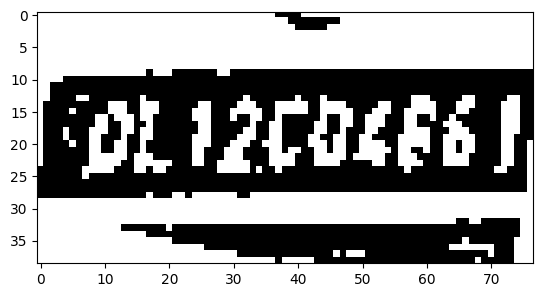

height =  277 width =  281


[125.31147766113281, 177.2462158203125, 205.4981689453125, 216.72320556640625, 0.9212310910224915, 0.0] track_id: 198.0
-0.2424470229658554


['Dxrelfr']
license before check Dxrelfr
hello
License Plate Number with contours :  None , Score :  None
-0.24111767845146836
['CoLIzcoze6']
license before check CoLIzcoze6
hello
License Plate Number :  None , Score :  None
height =  118 width =  169
height =  283 width =  291


[129.7445068359375, 181.5225372314453, 211.96884155273438, 222.09487915039062, 0.9191591143608093, 0.0] track_id: 198.0
-0.24220858710962045
['DL1200486']
license before check DL1200486
license after check DL1200486
License Plate Number with contours :  DL12O0486 , Score :  0.23889718038366758


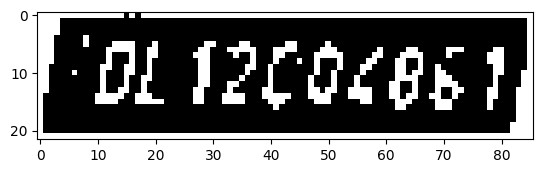

height =  115 width =  166
height =  291 width =  304


[133.4513397216797, 187.61892700195312, 218.2823486328125, 229.4234619140625, 0.924551248550415, 0.0] track_id: 198.0
-0.22382797147051578
['OL12c0286']
license before check OL12c0286
license after check OL12C0286
License Plate Number with contours :  OL12C0286 , Score :  0.19441289905338713


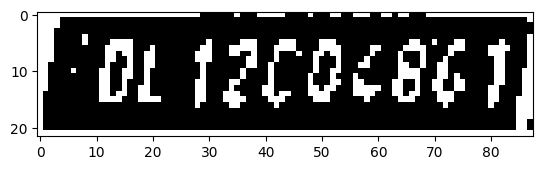

height =  117 width =  167
height =  297 width =  324


[140.60791015625, 192.28639221191406, 227.27566528320312, 234.86045837402344, 0.9048703908920288, 0.0] track_id: 198.0
-0.2262191379738982


['DLizcolsc']
license before check DLizcolsc
hello
License Plate Number with contours :  None , Score :  None
-0.20442120537714656
['Fol72c0286']
license before check Fol72c0286
hello
License Plate Number :  None , Score :  None
height =  125 width =  166
height =  303 width =  329


[146.64266967773438, 200.11514282226562, 235.91793823242188, 244.16525268554688, 0.9229950308799744, 0.0] track_id: 198.0
-0.2624593998262764
['DLi2c0286']
license before check DLi2c0286
license after check DLI2C0286
License Plate Number with contours :  DL12C0286 , Score :  0.5062548327148298


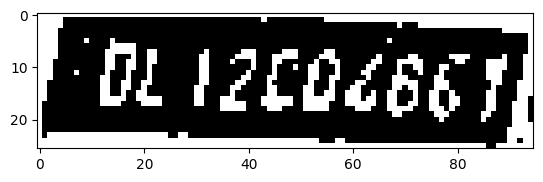

height =  132 width =  165
height =  312 width =  334


[151.6903076171875, 209.4576416015625, 244.49618530273438, 254.5284881591797, 0.9091764092445374, 0.0] track_id: 198.0
-0.20963984587421253
['OLi2c0l86']
license before check OLi2c0l86
license after check OLI2C0L86
License Plate Number with contours :  OL12C0486 , Score :  0.25207278856238635


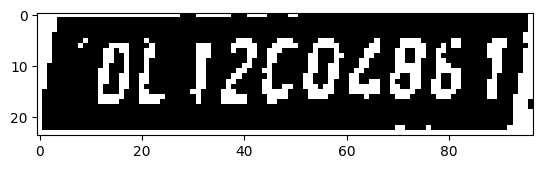

height =  126 width =  161
height =  324 width =  342


[157.21896362304688, 217.05181884765625, 253.2571563720703, 264.52880859375, 0.9307683110237122, 0.0] track_id: 198.0
-0.22899423420849846
['DL12c0286']
license before check DL12c0286
license after check DL12C0286
License Plate Number with contours :  DL12C0286 , Score :  0.28644327622697663


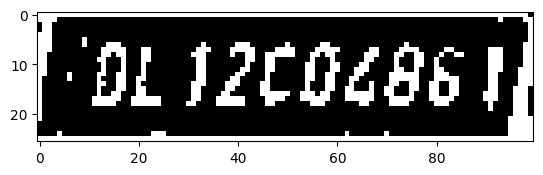

height =  124 width =  158
height =  338 width =  354


[164.53330993652344, 226.4555206298828, 263.3393859863281, 274.7770690917969, 0.9285855889320374, 0.0] track_id: 198.0
-0.22303096837155825
['OL12c0286']
license before check OL12c0286
license after check OL12C0286
License Plate Number with contours :  OL12C0286 , Score :  0.6124857152520552


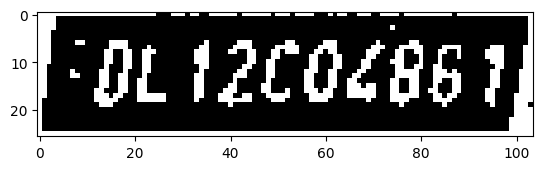

height =  117 width =  149
height =  355 width =  367


[174.1909942626953, 234.29898071289062, 277.2261962890625, 285.99176025390625, 0.9172565340995789, 0.0] track_id: 198.0
-0.22382797147051578
['DLi2c0l86i']
license before check DLi2c0l86i
license after check DLI2C0L86I
License Plate Number with contours :  DL12CO4861 , Score :  0.06291662249083255


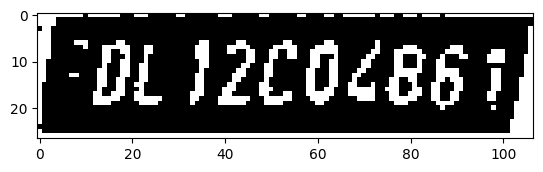

height =  118 width =  137
height =  370 width =  381


[182.8417510986328, 246.32086181640625, 289.2875671386719, 299.1490478515625, 0.9269457459449768, 0.0] track_id: 198.0
-0.22892499651560902


['OlZc0lBs']
license before check OlZc0lBs
hello
License Plate Number with contours :  None , Score :  None
-0.22303096837155825
['EOL12c0486']
license before check EOL12c0486
hello
License Plate Number :  None , Score :  None
height =  123 width =  146
height =  382 width =  397


[191.96539306640625, 256.2542419433594, 303.172607421875, 310.82928466796875, 0.9283324480056763, 0.0] track_id: 198.0
-0.23109066719589708
['OL12c0686']
license before check OL12c0686
license after check OL12C0686
License Plate Number with contours :  OL12C0686 , Score :  0.4569037222067029


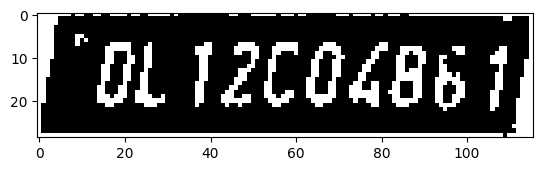

height =  125 width =  138
height =  398 width =  414


[202.2672882080078, 267.3404541015625, 316.6471252441406, 324.1006774902344, 0.9268664717674255, 0.0] track_id: 198.0
-0.2231133610549015
['OL12c0286']
license before check OL12c0286
license after check OL12C0286
License Plate Number with contours :  OL12C0286 , Score :  0.12391324647262572


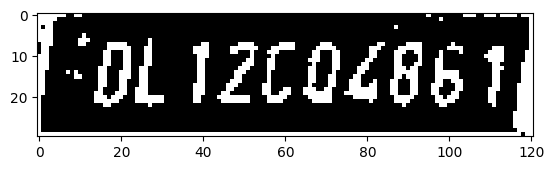

height =  125 width =  130
height =  415 width =  434


[214.64588928222656, 279.9272155761719, 333.34100341796875, 338.3834228515625, 0.9228531718254089, 0.0] track_id: 198.0
-0.22252993054933773
['DL1zc0486']
license before check DL1zc0486
license after check DL1ZC0486
License Plate Number with contours :  DL1ZC0486 , Score :  0.16848838087526688


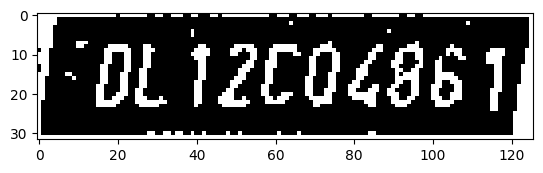

height =  126 width =  126
height =  428 width =  453


[227.3588409423828, 291.7281494140625, 351.9546203613281, 352.2906799316406, 0.9158402681350708, 0.0] track_id: 198.0
-0.22527677921405528
['DL12c0486']
license before check DL12c0486
license after check DL12C0486
License Plate Number with contours :  DL12C0486 , Score :  0.6934954166120281


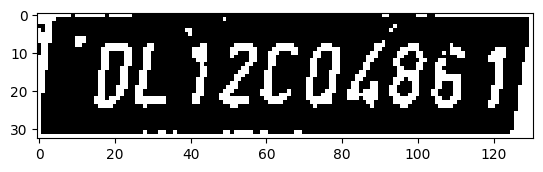

height =  126 width =  130
height =  439 width =  477


[242.92848205566406, 302.8558349609375, 371.9213562011719, 366.009033203125, 0.9164145588874817, 0.0] track_id: 198.0
-0.20927955044754018
['DL12c04861']
license before check DL12c04861
license after check DL12C04861
License Plate Number with contours :  DL12CO4861 , Score :  0.6077606321985718


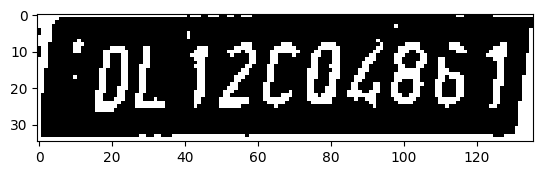

height =  129 width =  132
height =  459 width =  504


[258.1670837402344, 317.37615966796875, 393.585205078125, 383.47906494140625, 0.9138705730438232, 0.0] track_id: 198.0
-0.20859957280615768
['DL12COL86']
license before check DL12COL86
license after check DL12COL86
License Plate Number with contours :  DL12C0486 , Score :  0.5530953923986518


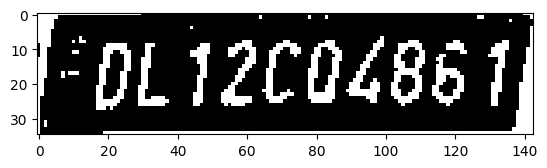

height =  132 width =  130
height =  480 width =  532


[276.72772216796875, 329.8039855957031, 418.84661865234375, 398.9173583984375, 0.9282076358795166, 0.0] track_id: 198.0
-0.22290023232837577
['0L12C0L86']
license before check 0L12C0L86
license after check 0L12C0L86
License Plate Number with contours :  OL12C0486 , Score :  0.34610348747267533


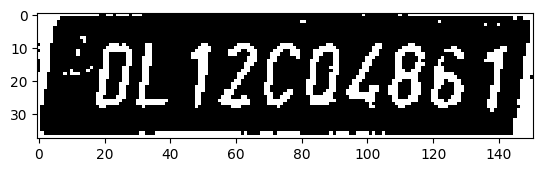

height =  130 width =  130
height =  502 width =  559


[296.8476257324219, 349.7484436035156, 445.2489318847656, 421.7644958496094, 0.9173470139503479, 0.0] track_id: 198.0
-0.2218511149259635
['DL12c0486']
license before check DL12c0486
license after check DL12C0486
License Plate Number with contours :  DL12C0486 , Score :  0.49950938652799076


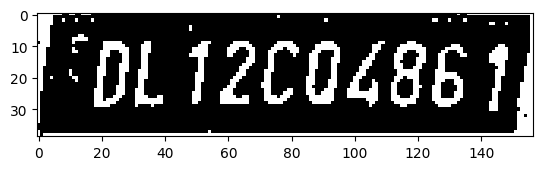

height =  133 width =  132
height =  531 width =  591


[320.4416198730469, 373.3153076171875, 476.7898254394531, 449.3309631347656, 0.9200292825698853, 0.0] track_id: 198.0
-0.2237354003066978
['OLI2COL86']
license before check OLI2COL86
license after check OLI2COL86
License Plate Number with contours :  OL12C0486 , Score :  0.31485543127900734


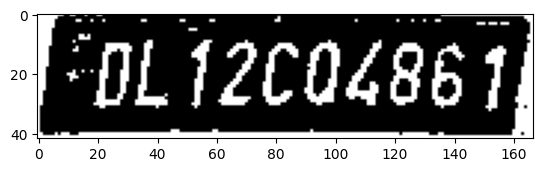

height =  133 width =  134
height =  557 width =  627


[347.6640625, 394.0508117675781, 513.1725463867188, 473.830810546875, 0.923846423625946, 0.0] track_id: 198.0
-0.2251661964433018
['DL12c0L86']
license before check DL12c0L86
license after check DL12C0L86
License Plate Number with contours :  DL12C0486 , Score :  0.5328286006835845


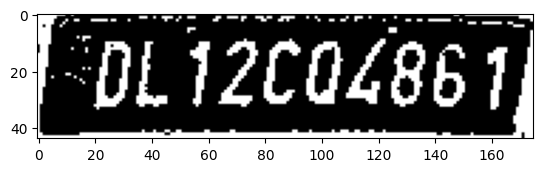

height =  135 width =  133
height =  591 width =  667


[378.4148254394531, 421.1119384765625, 551.3162841796875, 506.9326171875, 0.9181334376335144, 0.0] track_id: 198.0
-0.20749622643520266
['DL12C0L86']
license before check DL12C0L86
license after check DL12C0L86
License Plate Number with contours :  DL12C0486 , Score :  0.6679193784876432


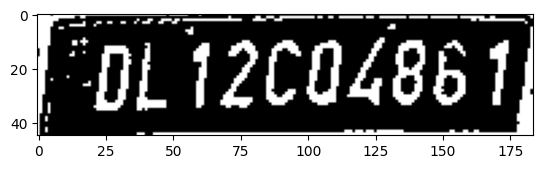

height =  136 width =  134
height =  631 width =  710


[412.98834228515625, 452.41033935546875, 596.0103149414062, 543.2192993164062, 0.9270371198654175, 0.0] track_id: 198.0
-0.21109333322274654
['DL12c0486']
license before check DL12c0486
license after check DL12C0486
License Plate Number with contours :  DL12C0486 , Score :  0.7631375871619348


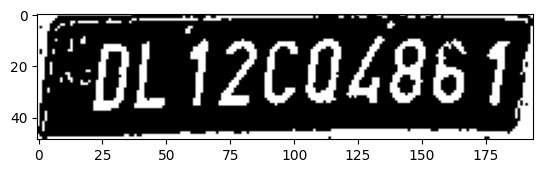

height =  139 width =  136
height =  673 width =  758


[454.4012756347656, 488.9201965332031, 644.9306640625, 585.8425903320312, 0.9194517731666565, 0.0] track_id: 198.0
-0.24344020280217726
['0L12COL86']
license before check 0L12COL86
license after check 0L12COL86
License Plate Number with contours :  OL12C0486 , Score :  0.27857925899824804


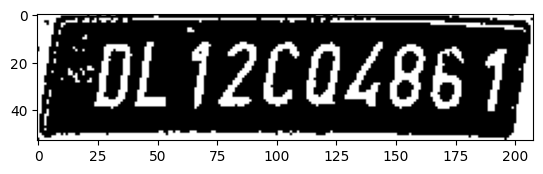

height =  140 width =  138
height =  713 width =  815


[501.5729675292969, 522.3311157226562, 704.5442504882812, 624.2777709960938, 0.9165527820587158, 0.0] track_id: 198.0
-0.24618493515939638


[]
License Plate Number with contours :  None , Score :  None
-0.22899423420849846
['DL12c0486']
license before check DL12c0486
license after check DL12C0486
License Plate Number :  DL12C0486 , Score :  0.4443638106469884


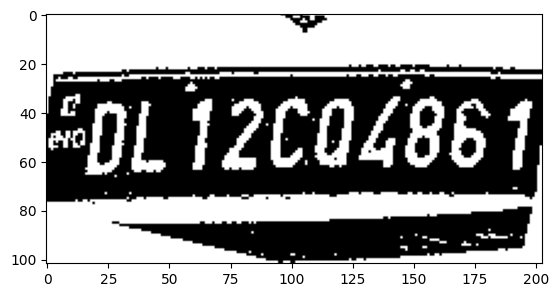

height =  144 width =  139
height =  768 width =  873
[553.1996459960938, 566.5226440429688, 767.6398315429688, 678.3919067382812, 0.9306615591049194, 0.0] track_id: 198.0
-0.2741674511196588
height =  150 width =  139
height =  825 width =  945


[616.6118774414062, 610.0604248046875, 841.7164306640625, 730.6331176757812, 0.922747015953064, 0.0] track_id: 198.0
-0.2765139466174741


[]
License Plate Number with contours :  None , Score :  None
-0.23974310887045658
['MOL12c04861']
license before check MOL12c04861
hello
License Plate Number :  None , Score :  None
height =  152 width =  141
height =  890 width =  1018
[690.3369750976562, 664.5009155273438, 925.223388671875, 794.4606323242188, 0.9275302886962891, 0.0] track_id: 198.0
-0.3094055025524177
height =  156 width =  143
height =  966 width =  1102
[778.8573608398438, 724.5866088867188, 1018.7570190429688, 865.8059692382812, 0.9206787347793579, 0.0] track_id: 198.0
-0.33019426204611374
height =  161 width =  143
height =  1057 width =  1192


[878.8549194335938, 800.8045654296875, 1120.578369140625, 956.5731811523438, 0.8806306719779968, 0.0] track_id: 198.0
-0.4016253489989333


[]
License Plate Number with contours :  None , Score :  None
-0.40122879900484876
['DL12c0486']
license before check DL12c0486
license after check DL12C0486
License Plate Number :  DL12C0486 , Score :  0.43075065655051703


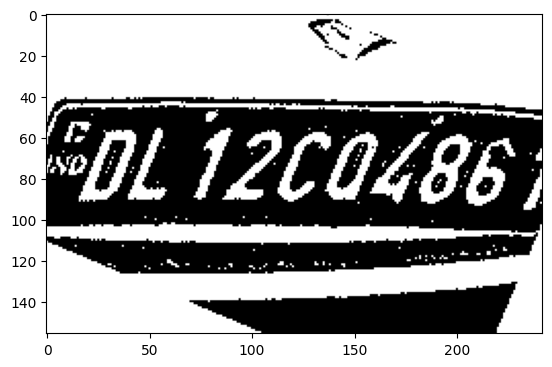

height =  166 width =  143
height =  1151 width =  1288
[992.1774291992188, 882.4954833984375, 1243.110107421875, 1049.5155029296875, 0.7831235527992249, 0.0] track_id: 198.0
-0.471399391713013
height =  168 width =  145
height =  1244 width =  1395
height =  167 width =  146
height =  1282 width =  1508
height =  170 width =  150
height =  1293 width =  1630
height =  175 width =  153
height =  1274 width =  1755
height =  179 width =  154
height =  1276 width =  1883
height =  184 width =  156
height =  1279 width =  1945
height =  187 width =  159
height =  1303 width =  1935
height =  186 width =  160
height =  1270 width =  1888
height =  189 width =  161
height =  1182 width =  1824
height =  188 width =  163
height =  192 width =  165
height =  195 width =  166
height =  196 width =  168
height =  198 width =  171
height =  201 width =  174
height =  778 width =  994
height =  201 width =  177
height =  202 width =  180
height =  204 width =  183
height =  208 width =  187
heigh

[84.61851501464844, 141.32644653320312, 134.65509033203125, 167.5394287109375, 0.28191691637039185, 0.0] track_id: 199.0
-0.24175286786424297


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  214 width =  194
[87.0060043334961, 144.23780822753906, 137.93467712402344, 171.4022216796875, 0.506997287273407, 0.0] track_id: 199.0
-0.09966865249116202
height =  216 width =  198


[88.44580841064453, 145.88876342773438, 140.17514038085938, 173.59054565429688, 0.7431958317756653, 0.0] track_id: 199.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.2347226124851971
[]
License Plate Number :  None , Score :  None
height =  220 width =  201


[89.07406616210938, 148.1927032470703, 141.89822387695312, 176.4686279296875, 0.8183659911155701, 0.0] track_id: 199.0
-0.23824475817874502


[]
License Plate Number with contours :  None , Score :  None
-0.22347660114063303
[]
License Plate Number :  None , Score :  None
height =  224 width =  204
[92.09733581542969, 152.77499389648438, 145.08323669433594, 181.21949768066406, 0.7376024127006531, 0.0] track_id: 199.0
-0.23783592745745075
height =  227 width =  207


[93.3101577758789, 155.4513702392578, 146.81692504882812, 183.68492126464844, 0.9137744903564453, 0.0] track_id: 199.0
-0.25800724186395513


[]
License Plate Number with contours :  None , Score :  None
-0.22082876972934834
[]
License Plate Number :  None , Score :  None
height =  226 width =  210


[94.33650207519531, 154.4430694580078, 149.1626434326172, 183.5782470703125, 0.9113759994506836, 0.0] track_id: 199.0
-0.24175286786424297


[]
License Plate Number with contours :  None , Score :  None
-0.26791042242333973
[]
License Plate Number :  None , Score :  None
height =  227 width =  213


[95.72073364257812, 156.4237518310547, 151.43374633789062, 185.48388671875, 0.9081831574440002, 0.0] track_id: 199.0
-0.2405342479459046


[]
License Plate Number with contours :  None , Score :  None
-0.22082876972934834
[]
License Plate Number :  None , Score :  None
height =  231 width =  217


[98.36334991455078, 160.7811737060547, 155.25733947753906, 189.31130981445312, 0.9024990797042847, 0.0] track_id: 199.0
-0.22679884805388587


[]
License Plate Number with contours :  None , Score :  None
-0.22082876972934834
['Ftei']
license before check Ftei
hello
License Plate Number :  None , Score :  None
height =  234 width =  221
[100.11909484863281, 162.0382843017578, 158.34942626953125, 192.2373809814453, 0.8853415846824646, 0.0] track_id: 199.0
-0.24220858710962045
height =  239 width =  224


[102.14778137207031, 165.69618225097656, 161.3476104736328, 196.64442443847656, 0.9030514359474182, 0.0] track_id: 199.0
-0.22785704871709972


[]
License Plate Number with contours :  None , Score :  None
-0.23554498072086333
[]
License Plate Number :  None , Score :  None
height =  240 width =  229


[103.53746795654297, 165.32955932617188, 164.50906372070312, 198.2647705078125, 0.9123806953430176, 0.0] track_id: 199.0
-0.23974310887045658


['mi']
license before check mi
hello
License Plate Number with contours :  None , Score :  None
-0.24896270579271707
['HESST']
license before check HESST
hello
License Plate Number :  None , Score :  None
height =  247 width =  236


[107.3534164428711, 167.64691162109375, 169.71841430664062, 201.71128845214844, 0.9111961722373962, 0.0] track_id: 199.0
-0.22768931976865586


[]
License Plate Number with contours :  None , Score :  None
-0.225601243836024
['FfNlV']
license before check FfNlV
hello
License Plate Number :  None , Score :  None
height =  248 width =  243


[109.9690933227539, 168.88458251953125, 174.3751220703125, 202.94461059570312, 0.9112651944160461, 0.0] track_id: 199.0
-0.206992194219821


['']
License Plate Number with contours :  None , Score :  None
-0.22923193327699534
['WxraWy']
license before check WxraWy
hello
License Plate Number :  None , Score :  None
height =  248 width =  247


[113.52783203125, 167.2473907470703, 178.3938751220703, 201.8618927001953, 0.9096288084983826, 0.0] track_id: 199.0
-0.22347660114063303


['']
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
['Winours']
license before check Winours
hello
License Plate Number :  None , Score :  None
height =  253 width =  254


[118.15245056152344, 169.80029296875, 184.59762573242188, 204.47048950195312, 0.9086899757385254, 0.0] track_id: 199.0
-0.2260683879938839


['Menu']
license before check Menu
hello
License Plate Number with contours :  None , Score :  None
-0.2373742469731708
['IVrkoou']
license before check IVrkoou
hello
License Plate Number :  None , Score :  None
height =  255 width =  259


[120.45692443847656, 168.53048706054688, 188.4759979248047, 204.25161743164062, 0.9007877707481384, 0.0] track_id: 199.0
-0.2213144423477913


[]
License Plate Number with contours :  None , Score :  None
-0.22923193327699534
['DfchFFSZ']
license before check DfchFFSZ
hello
License Plate Number :  None , Score :  None
height =  76 width =  105
height =  261 width =  266


[125.08372497558594, 173.71414184570312, 194.55612182617188, 210.09466552734375, 0.9058924913406372, 0.0] track_id: 199.0
-0.22679884805388587


['MRCOE']
license before check MRCOE
hello
License Plate Number with contours :  None , Score :  None
-0.22923193327699534
['up1gcue52']
license before check up1gcue52
hello
License Plate Number :  None , Score :  None
height =  74 width =  105
height =  268 width =  273


[127.3156509399414, 174.64056396484375, 198.73455810546875, 214.22647094726562, 0.9022091627120972, 0.0] track_id: 199.0
-0.22390450013034954
['WI6008654']
license before check WI6008654
license after check WI6008654
License Plate Number with contours :  WI60O8654 , Score :  0.0449642852617342


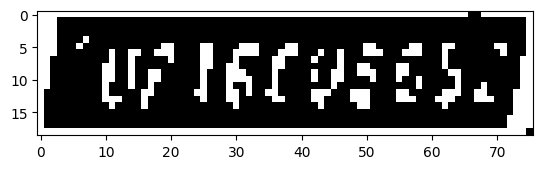

height =  76 width =  105
height =  269 width =  279


[131.3256072998047, 174.72666931152344, 203.97702026367188, 216.58485412597656, 0.9063211679458618, 0.0] track_id: 199.0
-0.20176234432028708


['UfIscus6s']
license before check UfIscus6s
hello
License Plate Number with contours :  None , Score :  None
-0.2171113147349052
['UP1Scu3657']
license before check UP1Scu3657
license after check UP1SCU3657
License Plate Number :  UP1SCU3657 , Score :  0.03189244715789435


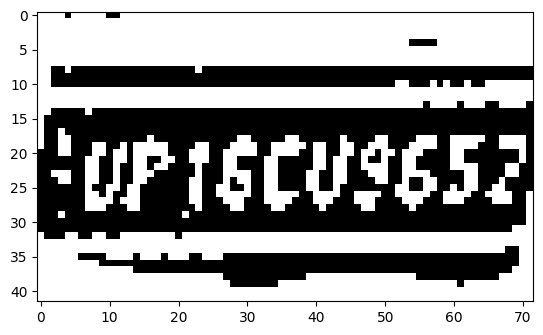

height =  79 width =  104
height =  275 width =  286
[135.6509552001953, 177.10179138183594, 210.23226928710938, 222.57095336914062, 0.9015341997146606, 0.0] track_id: 199.0
-0.206992194219821
height =  81 width =  103
height =  278 width =  295


[141.7578582763672, 186.2477264404297, 218.46124267578125, 226.88304138183594, 0.9135385751724243, 0.0] track_id: 199.0
-0.2217809690225993


['NFIfcu3eS']
license before check NFIfcu3eS
hello
License Plate Number with contours :  None , Score :  None
-0.23186466084938878
['YUP6cUG5Z']
license before check YUP6cUG5Z
hello
License Plate Number :  None , Score :  None
height =  82 width =  103
height =  284 width =  301


[144.36016845703125, 193.44744873046875, 223.24378967285156, 235.38006591796875, 0.9161501526832581, 0.0] track_id: 199.0
-0.22347660114063303


['WF16V355']
license before check WF16V355
hello
License Plate Number with contours :  None , Score :  None
-0.23554498072086333
['CuP6CU9652']
license before check CuP6CU9652
hello
License Plate Number :  None , Score :  None
height =  84 width =  103
height =  289 width =  309


[147.80816650390625, 198.23666381835938, 228.66619873046875, 242.4436492919922, 0.9096207618713379, 0.0] track_id: 199.0
-0.22347660114063303


['UfI6CU36578']
license before check UfI6CU36578
hello
License Plate Number with contours :  None , Score :  None
-0.22006170263356514
['CupscuggszS']
license before check CupscuggszS
hello
License Plate Number :  None , Score :  None
height =  84 width =  102
height =  301 width =  318


[153.74046325683594, 204.4120635986328, 236.89596557617188, 251.7171173095703, 0.9101300835609436, 0.0] track_id: 199.0
-0.22810262827994277
['UPI6CU9652']
license before check UPI6CU9652
license after check UPI6CU9652
License Plate Number with contours :  UP16CU9652 , Score :  0.38575674909029983


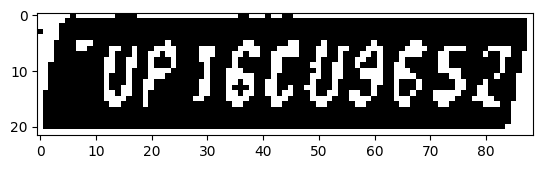

height =  85 width =  102
height =  309 width =  328


[159.7472381591797, 210.6307373046875, 245.0867156982422, 259.01239013671875, 0.9115539193153381, 0.0] track_id: 199.0
-0.20749622643520266
['Dp16cU9652']
license before check Dp16cU9652
license after check DP16CU9652
License Plate Number with contours :  DP16CU9652 , Score :  0.361933772524459


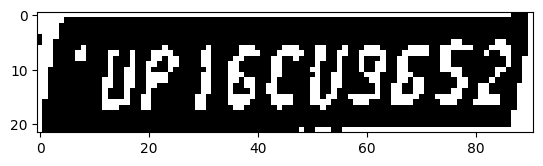

height =  84 width =  101
height =  315 width =  339


[167.38865661621094, 215.41049194335938, 254.5018768310547, 264.63006591796875, 0.9139329791069031, 0.0] track_id: 199.0
-0.22244726542594168


['6cu9g52']
license before check 6cu9g52
hello
License Plate Number with contours :  None , Score :  None
-0.22810262827994277
['UP16cU952']
license before check UP16cU952
hello
License Plate Number :  None , Score :  None
height =  84 width =  102
height =  324 width =  349


[173.33302307128906, 225.431396484375, 262.5814514160156, 273.28802490234375, 0.9131699204444885, 0.0] track_id: 199.0
-0.2284966392918623
['UP1sCUS652']
license before check UP1sCUS652
license after check UP1SCUS652
License Plate Number with contours :  UP1SCU5652 , Score :  0.15637600392097548


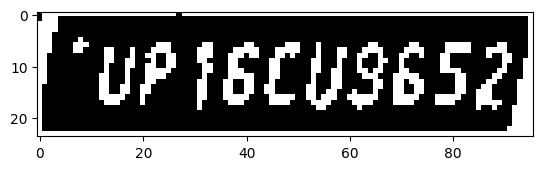

height =  84 width =  101
height =  331 width =  362


[180.49993896484375, 229.30592346191406, 272.6931457519531, 279.9088134765625, 0.9130774736404419, 0.0] track_id: 199.0
-0.23860932250820097
['UP1scu9652']
license before check UP1scu9652
license after check UP1SCU9652
License Plate Number with contours :  UP1SCU9652 , Score :  0.06712382341601782


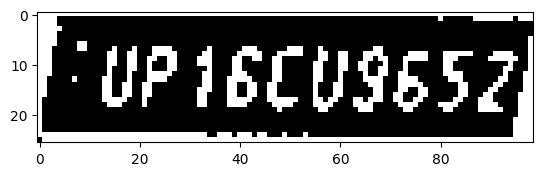

height =  83 width =  103
height =  342 width =  374


[187.53590393066406, 236.02769470214844, 282.9105224609375, 287.9779968261719, 0.9132471680641174, 0.0] track_id: 199.0
-0.22441600903714554
['UP16CU3552']
license before check UP16CU3552
license after check UP16CU3552
License Plate Number with contours :  UP16CU3552 , Score :  0.24127521031977525


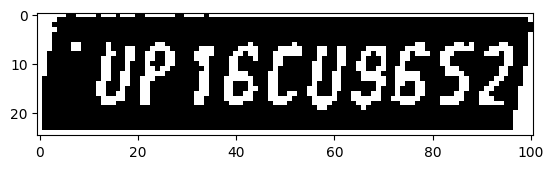

height =  84 width =  102
height =  352 width =  387


[195.7581024169922, 245.0033721923828, 295.0808410644531, 296.8189392089844, 0.9137188792228699, 0.0] track_id: 199.0
-0.22679884805388587
['Up16cu9652']
license before check Up16cu9652
license after check UP16CU9652
License Plate Number with contours :  UP16CU9652 , Score :  0.4138275616493763


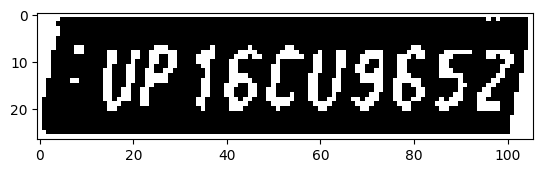

height =  84 width =  101
height =  362 width =  398


[204.30435180664062, 251.58103942871094, 305.78619384765625, 305.22998046875, 0.9105062484741211, 0.0] track_id: 199.0
-0.21109333322274654
['UP16cu9652']
license before check UP16cu9652
license after check UP16CU9652
License Plate Number with contours :  UP16CU9652 , Score :  0.4762169209906691


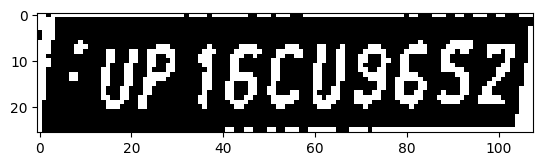

height =  83 width =  100
height =  374 width =  413


[213.2552490234375, 258.005615234375, 318.32672119140625, 316.94158935546875, 0.9109013676643372, 0.0] track_id: 199.0
-0.21109333322274654
['UP16cU9652']
license before check UP16cU9652
license after check UP16CU9652
License Plate Number with contours :  UP16CU9652 , Score :  0.5911372682011711


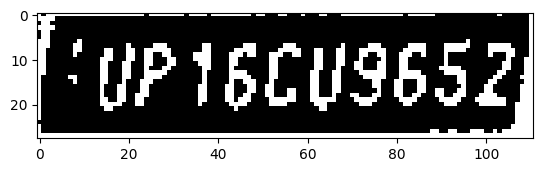

height =  82 width =  101
height =  387 width =  429


[223.4869842529297, 272.3605041503906, 332.2549743652344, 328.7719421386719, 0.9160413146018982, 0.0] track_id: 199.0
-0.20877718218206526
['UP16cu9652']
license before check UP16cu9652
license after check UP16CU9652
License Plate Number with contours :  UP16CU9652 , Score :  0.40469753504504336


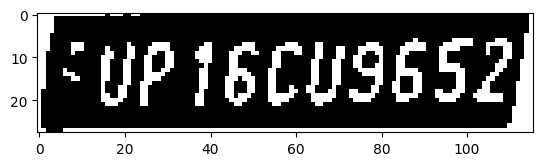

height =  82 width =  101
height =  400 width =  446


[234.86083984375, 280.2168884277344, 346.36669921875, 339.42840576171875, 0.9146419167518616, 0.0] track_id: 199.0
-0.2082059495239874
['UP16cu9652']
license before check UP16cu9652
license after check UP16CU9652
License Plate Number with contours :  UP16CU9652 , Score :  0.3968777154557636


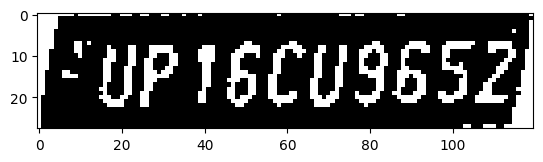

height =  82 width =  102
height =  412 width =  466


[247.70596313476562, 294.07025146484375, 365.12091064453125, 353.53607177734375, 0.9162952899932861, 0.0] track_id: 199.0
-0.20982831175965547


['UP16cU96521']
license before check UP16cU96521
hello
License Plate Number with contours :  None , Score :  None
-0.20982831175965547
['Upigcu9652']
license before check Upigcu9652
license after check UPIGCU9652
License Plate Number :  UP1GCU9652 , Score :  0.33090579720807856


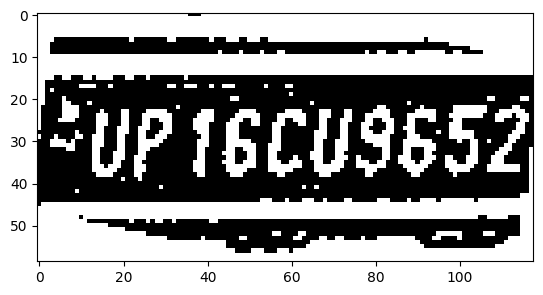

height =  81 width =  102
height =  426 width =  485


[261.0860595703125, 306.3517150878906, 382.134033203125, 367.312255859375, 0.9160937070846558, 0.0] track_id: 199.0
-0.22627336202763532


['UP16CU96521']
license before check UP16CU96521
hello
License Plate Number with contours :  None , Score :  None
-0.22494126505117096
['Up16cu9652']
license before check Up16cu9652
license after check UP16CU9652
License Plate Number :  UP16CU9652 , Score :  0.40128595877107476


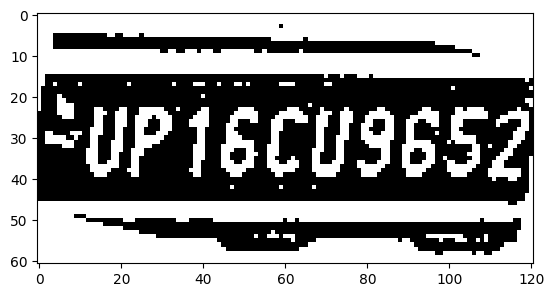

height =  81 width =  102
height =  447 width =  505


[275.93072509765625, 319.5394592285156, 401.6709289550781, 384.42205810546875, 0.9178280830383301, 0.0] track_id: 199.0
-0.20883089364403962
['UP16CU9652']
license before check UP16CU9652
license after check UP16CU9652
License Plate Number with contours :  UP16CU9652 , Score :  0.6534214751282118


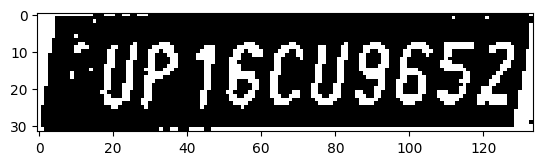

height =  79 width =  101
height =  463 width =  529


[292.8634033203125, 332.167236328125, 423.12933349609375, 398.91314697265625, 0.913453221321106, 0.0] track_id: 199.0
-0.22512567616292364


['UP16cU96525']
license before check UP16cU96525
hello
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
['UP16cU9652']
license before check UP16cU9652
license after check UP16CU9652
License Plate Number :  UP16CU9652 , Score :  0.42905294212816236


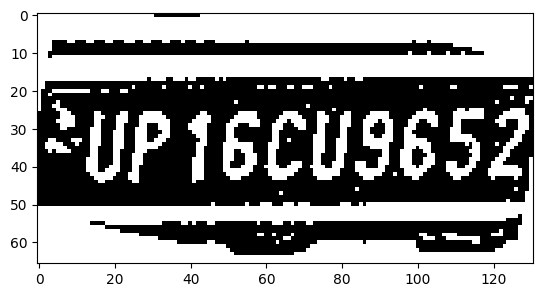

height =  78 width =  100
height =  481 width =  553


[308.59271240234375, 345.6458740234375, 444.1730041503906, 416.7839050292969, 0.9165246486663818, 0.0] track_id: 199.0
-0.2172934309230211
['UP16CU9652']
license before check UP16CU9652
license after check UP16CU9652
License Plate Number with contours :  UP16CU9652 , Score :  0.854790687613816


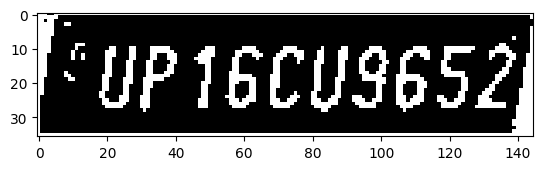

height =  79 width =  101
height =  502 width =  580


[327.8580017089844, 361.9758605957031, 469.5068054199219, 435.8818054199219, 0.921934187412262, 0.0] track_id: 199.0
-0.2080561367910258
['Up16cU9652']
license before check Up16cU9652
license after check UP16CU9652
License Plate Number with contours :  UP16CU9652 , Score :  0.4100676451943112


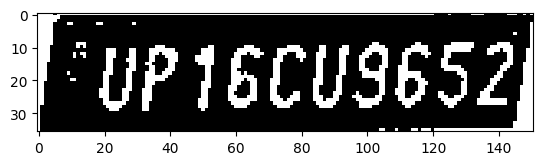

height =  80 width =  101
height =  524 width =  610


[349.8490295410156, 382.412353515625, 497.9925537109375, 457.46221923828125, 0.9207887053489685, 0.0] track_id: 199.0
-0.21406068356382152


['Up1scU96521']
license before check Up1scU96521
hello
License Plate Number with contours :  None , Score :  None
-0.20963984587421253
['UP16Cu9652']
license before check UP16Cu9652
license after check UP16CU9652
License Plate Number :  UP16CU9652 , Score :  0.4197699330874445


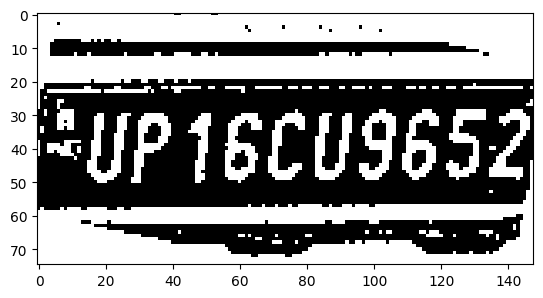

height =  79 width =  101
height =  549 width =  641


[375.00018310546875, 402.419921875, 527.8414306640625, 481.80572509765625, 0.9168866872787476, 0.0] track_id: 199.0
-0.20693927856742042
['UP16cu9652']
license before check UP16cu9652
license after check UP16CU9652
License Plate Number with contours :  UP16CU9652 , Score :  0.47032475809527796


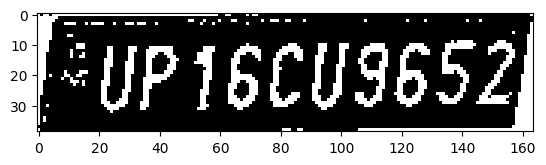

height =  79 width =  100
height =  579 width =  676


[401.4957580566406, 423.4429016113281, 562.670166015625, 509.10992431640625, 0.9207927584648132, 0.0] track_id: 199.0
-0.2248886307020433


['UP16cU96521']
license before check UP16cU96521
hello
License Plate Number with contours :  None , Score :  None
-0.22540285082206107
['UP16cU9652']
license before check UP16cU9652
license after check UP16CU9652
License Plate Number :  UP16CU9652 , Score :  0.4669930552814102


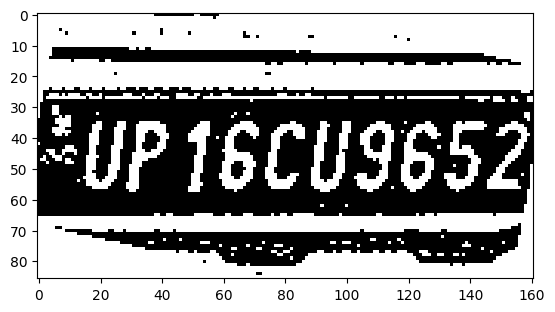

height =  80 width =  100
height =  605 width =  710


[429.8236999511719, 445.95843505859375, 598.1289672851562, 533.292724609375, 0.9181848168373108, 0.0] track_id: 199.0
-0.23109066719589708
['UP16CU9652']
license before check UP16CU9652
license after check UP16CU9652
License Plate Number with contours :  UP16CU9652 , Score :  0.21837427811405397


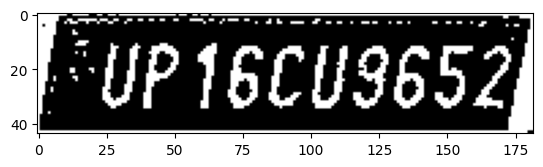

height =  80 width =  103
height =  633 width =  753


[464.8042297363281, 470.1748352050781, 639.2454223632812, 563.8271484375, 0.9247283935546875, 0.0] track_id: 199.0
-0.22722096706638278
['UP16CU9652']
license before check UP16CU9652
license after check UP16CU9652
License Plate Number with contours :  UP16CU9652 , Score :  0.6174733934920928


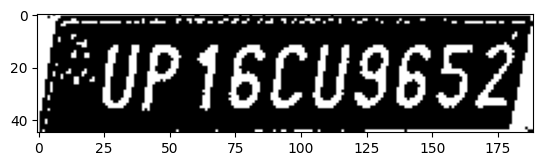

height =  81 width =  105
height =  665 width =  798


[502.1636962890625, 501.3250427246094, 685.4957885742188, 597.114013671875, 0.9212757349014282, 0.0] track_id: 199.0
-0.22601759821283154
['UP16CU9652']
license before check UP16CU9652
license after check UP16CU9652
License Plate Number with contours :  UP16CU9652 , Score :  0.6881061692577748


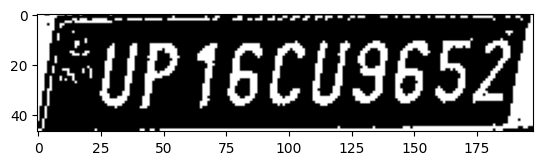

height =  82 width =  105
height =  703 width =  847


[545.4115600585938, 534.550537109375, 736.1920776367188, 637.59912109375, 0.9245074391365051, 0.0] track_id: 199.0
-0.2424470229658554


['PUP16CU96520']
license before check PUP16CU96520
hello
License Plate Number with contours :  None , Score :  None
-0.24239134677861826
['UP16CU9652']
license before check UP16CU9652
license after check UP16CU9652
License Plate Number :  UP16CU9652 , Score :  0.5435093646154129


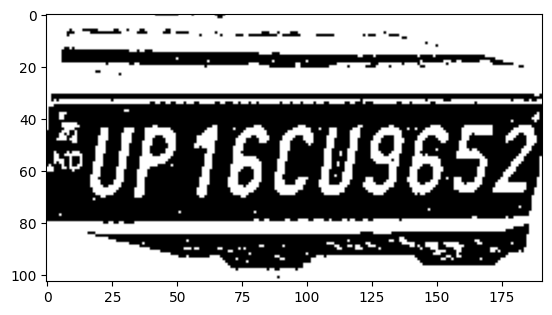

height =  81 width =  101
height =  740 width =  901


[595.6062622070312, 565.7671508789062, 793.2454223632812, 677.1011962890625, 0.9236751198768616, 0.0] track_id: 199.0
-0.2598143698458381


[]
License Plate Number with contours :  None , Score :  None
-0.2299044281319047
['UP16CU9652']
license before check UP16CU9652
license after check UP16CU9652
License Plate Number :  UP16CU9652 , Score :  0.6038462239415798


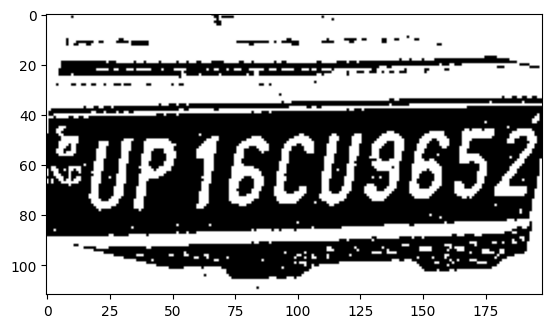

height =  81 width =  100
height =  783 width =  962


[652.130859375, 611.0433349609375, 856.6589965820312, 723.4616088867188, 0.9186423420906067, 0.0] track_id: 199.0
-0.2794138646721664


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.28360113352565963
['UP16cU9652']
license before check UP16cU9652
license after check UP16CU9652
License Plate Number :  UP16CU9652 , Score :  0.4686373992849627


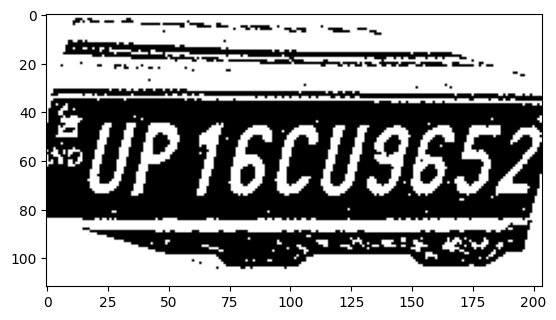

height =  81 width =  99
height =  836 width =  1021
[713.66015625, 652.0330200195312, 924.011962890625, 777.9989624023438, 0.9194176197052002, 0.0] track_id: 199.0
-0.29544083714372
height =  80 width =  100
height =  890 width =  1089
[783.33349609375, 705.1846313476562, 997.6223754882812, 837.165283203125, 0.9212809801101685, 0.0] track_id: 199.0
-0.29488290526930827
height =  80 width =  99
height =  957 width =  1165
[864.3696899414062, 757.4736328125, 1083.6768798828125, 906.620849609375, 0.921779453754425, 0.0] track_id: 199.0
-0.36653850988845144
height =  80 width =  99
height =  1028 width =  1242


[951.2628784179688, 815.1075439453125, 1169.4964599609375, 976.705322265625, 0.9303372502326965, 0.0] track_id: 199.0
-0.4182243295792291


[]
License Plate Number with contours :  None , Score :  None
-0.4533386958545628
['UP16CU9652']
license before check UP16CU9652
license after check UP16CU9652
License Plate Number :  UP16CU9652 , Score :  0.7960443035553767


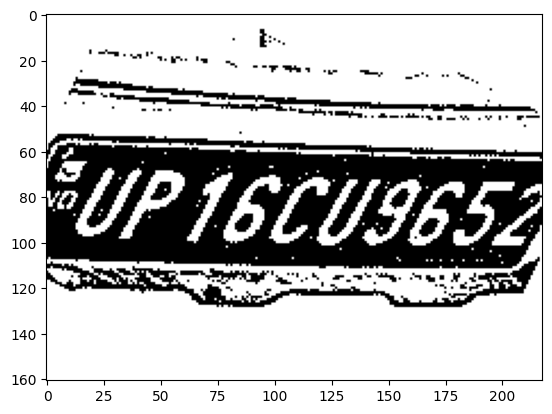

height =  81 width =  98
height =  1108 width =  1322
[1044.9337158203125, 876.6719970703125, 1263.6297607421875, 1054.5523681640625, 0.9148781895637512, 0.0] track_id: 199.0
-0.46978250135868205
height =  80 width =  98
height =  1193 width =  1411


[1147.60205078125, 930.9349975585938, 1360.788818359375, 1130.588134765625, 0.8964665532112122, 0.0] track_id: 199.0
-0.5239193476851991


[]
License Plate Number with contours :  None , Score :  None
-0.5572430774770983
['UP16C19552']
license before check UP16C19552
license after check UP16C19552
License Plate Number :  UP16CI9552 , Score :  0.38459234563850553


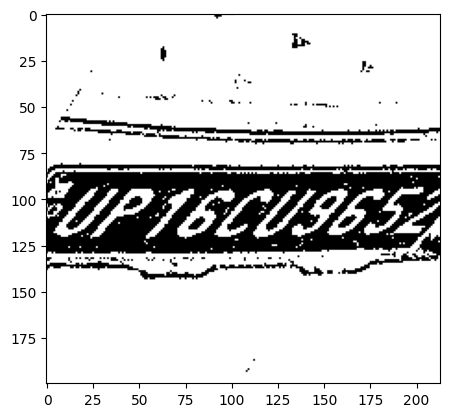

height =  80 width =  99
height =  1277 width =  1503
height =  80 width =  98
height =  1310 width =  1607
height =  79 width =  100
height =  1320 width =  1713
height =  79 width =  100
height =  1310 width =  1808
height =  78 width =  99
height =  1305 width =  1861
height =  79 width =  100
height =  1301 width =  1835
height =  79 width =  99
height =  1274 width =  1790
height =  79 width =  99
height =  1252 width =  1734
height =  79 width =  99
height =  1206 width =  1672
height =  79 width =  99
height =  1178 width =  1604
[878.0904541015625, 333.40130615234375, 1363.5445556640625, 911.3409423828125, 0.49383997917175293, 0.0] track_id: 199.0
0.4725687024180458
height =  79 width =  98
height =  1143 width =  1522
height =  79 width =  98
height =  1134 width =  1431
height =  79 width =  98
height =  1069 width =  1325
height =  80 width =  100
height =  1028 width =  1202
height =  82 width =  101
height =  948 width =  1064
height =  83 width =  101
height =  890 width 

[83.06481170654297, 153.2849578857422, 131.14859008789062, 175.8092498779297, 0.7349772453308105, 0.0] track_id: 208.0
-0.2373742469731708


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  229 width =  189


[86.00210571289062, 154.78765869140625, 134.39646911621094, 179.5839080810547, 0.7021594047546387, 0.0] track_id: 208.0
-0.23374318086890142


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  227 width =  193
height =  229 width =  199


[86.0089111328125, 152.7416534423828, 139.3483123779297, 177.63037109375, 0.6368371248245239, 0.0] track_id: 208.0
-0.23684876094692026


[]
License Plate Number with contours :  None , Score :  None
-0.21243202050874216
[]
License Plate Number :  None , Score :  None
height =  225 width =  206


[88.56151580810547, 147.81605529785156, 145.072265625, 172.17999267578125, 0.48037225008010864, 0.0] track_id: 208.0
-0.22581168154335537


[]
License Plate Number with contours :  None , Score :  None
-0.21406068356382152
[]
License Plate Number :  None , Score :  None
height =  233 width =  211
[87.93658447265625, 152.99806213378906, 151.7178192138672, 179.35952758789062, 0.2835291028022766, 0.0] track_id: 208.0
-0.2082059495239874
height =  240 width =  216
[96.26016998291016, 159.6722412109375, 154.8777618408203, 185.557861328125, 0.6529935002326965, 0.0] track_id: 208.0
-0.22347660114063303
height =  235 width =  221


[94.0191650390625, 152.65843200683594, 159.272216796875, 180.73159790039062, 0.8013951182365417, 0.0] track_id: 208.0
-0.20304521725346514


[]
License Plate Number with contours :  None , Score :  None
-0.23297923907710288
[]
License Plate Number :  None , Score :  None
height =  240 width =  227
[96.75627136230469, 154.56814575195312, 163.40301513671875, 182.10845947265625, 0.450451523065567, 0.0] track_id: 208.0
-0.20846521837998772
height =  244 width =  237
[101.93997955322266, 155.5716552734375, 171.8221893310547, 185.03138732910156, 0.7988683581352234, 0.0] track_id: 208.0
-0.22347660114063303
height =  65 width =  108
height =  252 width =  249
[106.98863220214844, 162.24024963378906, 178.81011962890625, 192.31593322753906, 0.7742055058479309, 0.0] track_id: 208.0
-0.22441600903714554
height =  71 width =  105
height =  264 width =  261


[114.38815307617188, 168.51351928710938, 189.4028778076172, 199.78196716308594, 0.8299682140350342, 0.0] track_id: 208.0
-0.22527677921405528


['DFrJJ']
license before check DFrJJ
hello
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
['UfJ5k4BJ']
license before check UfJ5k4BJ
hello
License Plate Number :  None , Score :  None
height =  75 width =  104
height =  277 width =  271
[119.53449249267578, 177.18829345703125, 197.40333557128906, 210.0483856201172, 0.8307777643203735, 0.0] track_id: 208.0
-0.21050956212735614
height =  78 width =  103
height =  289 width =  285
[128.4339141845703, 185.82904052734375, 209.1128692626953, 221.17262268066406, 0.8703141212463379, 0.0] track_id: 208.0
-0.20877718218206526
height =  81 width =  104
height =  297 width =  298


[134.5619354248047, 195.01358032226562, 220.22317504882812, 231.2926025390625, 0.8925828337669373, 0.0] track_id: 208.0
-0.21273178069161022


['VPiS0rJ']
license before check VPiS0rJ
hello
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['FUP15c08333']
license before check FUP15c08333
hello
License Plate Number :  None , Score :  None
height =  84 width =  105
height =  309 width =  316
[145.0089874267578, 204.4615936279297, 235.36337280273438, 243.0186309814453, 0.8830011487007141, 0.0] track_id: 208.0
-0.20947956377909527
height =  84 width =  105
height =  327 width =  331
[154.9008331298828, 217.23165893554688, 248.7651824951172, 256.4653625488281, 0.8966466188430786, 0.0] track_id: 208.0
-0.2063238940297175
height =  84 width =  105
height =  341 width =  351
[167.28045654296875, 228.74932861328125, 265.45281982421875, 269.7218017578125, 0.891890287399292, 0.0] track_id: 208.0
-0.22615243573280183
height =  84 width =  104
height =  356 width =  369
[177.43960571289062, 242.0304412841797, 281.67236328125, 285.9384460449219, 0.902460515499115, 0.0] track_id: 208.0
-0.20963984587421253
heig

[335.9691467285156, 386.82745361328125, 495.9231872558594, 457.97149658203125, 0.9055036902427673, 0.0] track_id: 208.0
-0.20988072266107496
['UP15c48333']
license before check UP15c48333
license after check UP15C48333
License Plate Number with contours :  UP15CA8333 , Score :  0.6443440848486718


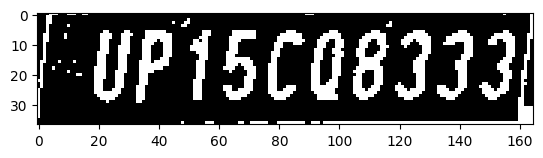

height =  83 width =  101
height =  575 width =  663


[378.89501953125, 425.2276306152344, 552.931884765625, 503.0126647949219, 0.9112898707389832, 0.0] track_id: 208.0
-0.22939239540655523


[]
License Plate Number with contours :  None , Score :  None
-0.22729561900159553
['0', 'UP15c48333']
license before check 0UP15c48333
hello
License Plate Number :  None , Score :  None
height =  629 width =  733


[432.0713806152344, 469.6182556152344, 620.4010009765625, 554.5763549804688, 0.9086402058601379, 0.0] track_id: 208.0
-0.23071655572812796
['UP15c48333']
license before check UP15c48333
license after check UP15C48333
License Plate Number with contours :  UP15CA8333 , Score :  0.18174989008439957


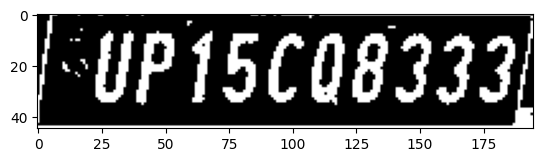

height =  82 width =  101
height =  695 width =  810


[502.17022705078125, 524.645751953125, 703.0337524414062, 617.6870727539062, 0.9053175449371338, 0.0] track_id: 208.0
-0.2438940648536731


['UP15c483331']
license before check UP15c483331
hello
License Plate Number with contours :  None , Score :  None
-0.24361811974866845
['UP15c08333']
license before check UP15c08333
license after check UP15C08333
License Plate Number :  UP15CO8333 , Score :  0.6362775922897828


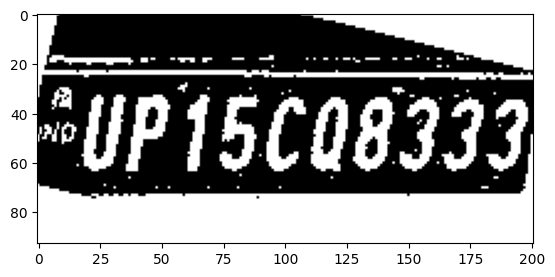

height =  82 width =  103
height =  775 width =  907


[584.2508544921875, 591.5056762695312, 805.96142578125, 697.097900390625, 0.9092596769332886, 0.0] track_id: 208.0
-0.2616437868408049


[]
License Plate Number with contours :  None , Score :  None
-0.2600312895821321
['UP15c48333']
license before check UP15c48333
license after check UP15C48333
License Plate Number :  UP15CA8333 , Score :  0.26959271933402895


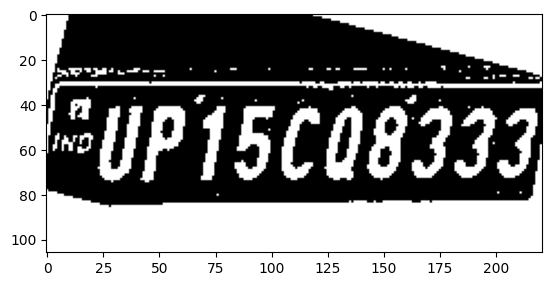

height =  82 width =  103
height =  875 width =  1017


[697.1988525390625, 670.8653564453125, 932.6912841796875, 794.8543701171875, 0.8974685668945312, 0.0] track_id: 208.0
-0.29493705884880694


['FUP15c083331']
license before check FUP15c083331
hello
License Plate Number with contours :  None , Score :  None
-0.2969837812304626
['UP15c08333']
license before check UP15c08333
license after check UP15C08333
License Plate Number :  UP15CO8333 , Score :  0.8899597003714658


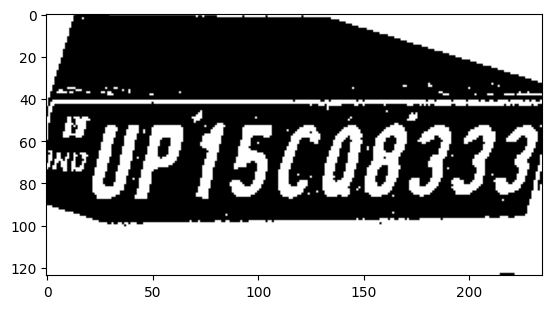

height =  82 width =  101
height =  992 width =  1140


[836.1964111328125, 766.693115234375, 1078.482666015625, 914.599365234375, 0.7885320782661438, 0.0] track_id: 208.0
-0.3477669878570153
['UP15c08333']
license before check UP15c08333
license after check UP15C08333
License Plate Number with contours :  UP15CO8333 , Score :  0.9156605247588472


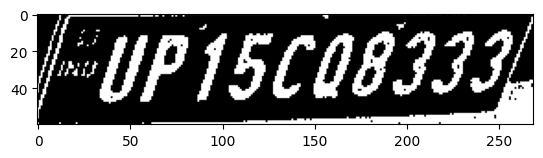

height =  82 width =  100
height =  1134 width =  1282
height =  82 width =  99
height =  1233 width =  1448
height =  82 width =  100
height =  1267 width =  1628
height =  81 width =  99
height =  1269 width =  1835
height =  81 width =  100
height =  1274 width =  1928
height =  83 width =  101
height =  82 width =  98
height =  1140 width =  1840
height =  83 width =  99
height =  1072 width =  1741
height =  84 width =  98
height =  1011 width =  1409
height =  778 width =  1118
height =  610 width =  704
height =  87 width =  100
height =  86 width =  100
height =  84 width =  100
height =  84 width =  99
height =  85 width =  99
height =  86 width =  99
height =  84 width =  99
height =  86 width =  99
height =  86 width =  100
height =  84 width =  100
height =  86 width =  101
height =  86 width =  100
height =  83 width =  100
height =  85 width =  100
height =  83 width =  100
height =  83 width =  100
height =  83 width =  98
height =  83 width =  98
height =  83 width =  9

[0.008830070495605469, 14.65485954284668, 15.85624885559082, 42.081417083740234, 0.569223165512085, 0.0] track_id: 212.0
[]
License Plate Number :  None , Score :  None
height =  79 width =  94
height =  80 width =  93
height =  96 width =  99


[0.0, 17.441823959350586, 14.086016654968262, 44.75034713745117, 0.36523765325546265, 0.0] track_id: 212.0
['4']
license before check 4
hello
License Plate Number :  None , Score :  None
height =  78 width =  91
height =  101 width =  102


[0.0, 21.228561401367188, 16.074026107788086, 49.1595458984375, 0.3111305236816406, 0.0] track_id: 212.0
['Ii']
license before check Ii
hello
License Plate Number :  None , Score :  None
height =  94 width =  105
height =  72 width =  85
height =  98 width =  107
height =  73 width =  84
height =  96 width =  109
height =  72 width =  84
height =  102 width =  107
height =  73 width =  75
height =  70 width =  72
height =  118 width =  117
height =  71 width =  72
height =  118 width =  114
height =  71 width =  65
height =  125 width =  118
height =  70 width =  61
height =  127 width =  119
height =  143 width =  144
height =  142 width =  142
height =  145 width =  141
height =  148 width =  145
height =  148 width =  150
height =  150 width =  150
height =  153 width =  150
height =  168 width =  153
height =  177 width =  161
height =  186 width =  166
height =  198 width =  173
height =  211 width =  183
height =  212 width =  188
[84.54113006591797, 124.04922485351562, 135.05519

[189.55007934570312, 252.16970825195312, 290.39703369140625, 297.9293212890625, 0.8927168250083923, 0.0] track_id: 212.0
-0.22423475110909616
['UP14F07222']
license before check UP14F07222
license after check UP14F07222
License Plate Number with contours :  UP14FO7222 , Score :  0.5173464903039144


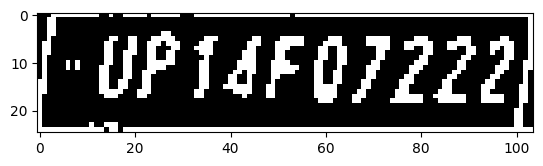

height =  434 width =  414


[203.134765625, 265.8775634765625, 309.1927490234375, 314.4092712402344, 0.8988615274429321, 0.0] track_id: 212.0
-0.20679125651321525
['UP14F07222']
license before check UP14F07222
license after check UP14F07222
License Plate Number with contours :  UP14FO7222 , Score :  0.5453782193446141


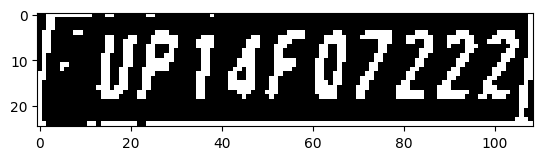

height =  451 width =  436


[217.23094177246094, 277.00994873046875, 328.99945068359375, 330.95379638671875, 0.9010095596313477, 0.0] track_id: 212.0
-0.21050956212735614


['UP14F0T222']
license before check UP14F0T222
hello
License Plate Number with contours :  None , Score :  None
-0.20846521837998772
['FUP14F07222']
license before check FUP14F07222
hello
License Plate Number :  None , Score :  None
height =  473 width =  465


[235.20480346679688, 294.7735900878906, 353.66302490234375, 348.63043212890625, 0.9110041260719299, 0.0] track_id: 212.0
-0.20783904438543416
['UP14F07222']
license before check UP14F07222
license after check UP14F07222
License Plate Number with contours :  UP14FO7222 , Score :  0.6593075179202487


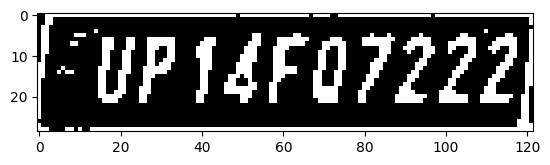

height =  501 width =  496


[253.79327392578125, 312.10931396484375, 380.916748046875, 370.21051025390625, 0.9133574366569519, 0.0] track_id: 212.0
-0.20947956377909527
['UPI4F07222']
license before check UPI4F07222
license after check UPI4F07222
License Plate Number with contours :  UP14FO7222 , Score :  0.512121378364195


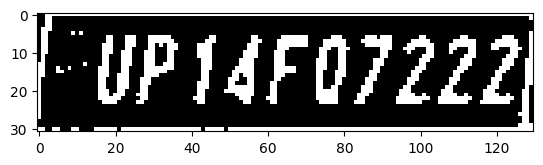

height =  533 width =  531


[277.2574462890625, 332.847412109375, 412.8632507324219, 399.1671142578125, 0.9072956442832947, 0.0] track_id: 212.0
-0.20304521725346514
['UP14F47222']
license before check UP14F47222
license after check UP14F47222
License Plate Number with contours :  UP14FA7222 , Score :  0.5575950968842347


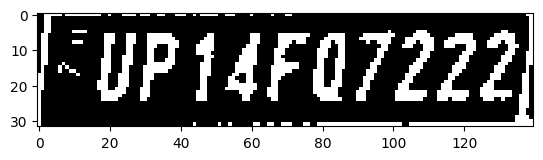

height =  569 width =  573


[306.4234313964844, 357.2676696777344, 452.0511779785156, 427.81951904296875, 0.9134673476219177, 0.0] track_id: 212.0
-0.21256680956305457


['UP14F072227']
license before check UP14F072227
hello
License Plate Number with contours :  None , Score :  None
-0.21256680956305457
['EUP4FQ7222']
license before check EUP4FQ7222
hello
License Plate Number :  None , Score :  None
height =  610 width =  621


[339.529541015625, 387.59722900390625, 495.1855773925781, 462.3658752441406, 0.9101309776306152, 0.0] track_id: 212.0
-0.22635617433335467
['UP14F07222']
license before check UP14F07222
license after check UP14F07222
License Plate Number with contours :  UP14FO7222 , Score :  0.45663613704969996


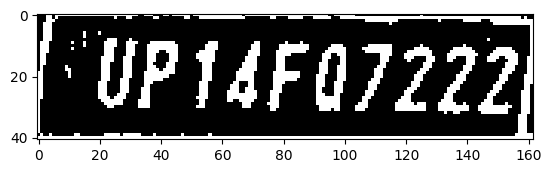

height =  652 width =  675
[378.26318359375, 418.7948913574219, 547.8782348632812, 501.2832946777344, 0.9132953882217407, 0.0] track_id: 212.0
-0.20749622643520266
height =  706 width =  741


[431.0028991699219, 462.5556945800781, 612.1050415039062, 548.90869140625, 0.9133543372154236, 0.0] track_id: 212.0
-0.22719146680088895


[]
License Plate Number with contours :  None , Score :  None
-0.20988072266107496
['UPI4F47222']
license before check UPI4F47222
license after check UPI4F47222
License Plate Number :  UP14FA7222 , Score :  0.3544240564091616


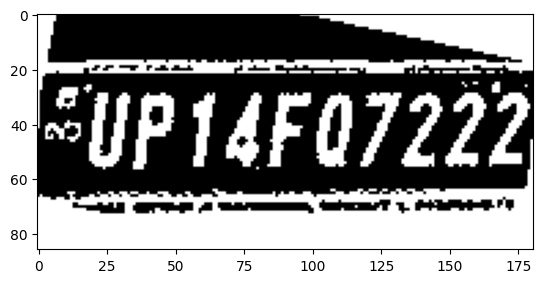

height =  84 width =  98
height =  84 width =  99
height =  84 width =  99
height =  84 width =  99
height =  948 width =  1039


[678.3087158203125, 640.1676025390625, 905.9486083984375, 762.5116577148438, 0.9152615070343018, 0.0] track_id: 214.0
-0.2794477641263722


[]
License Plate Number with contours :  None , Score :  None
-0.27625606511974155
['14FQ7222', 'GUP']
license before check 14FQ7222GUP
hello
License Plate Number :  None , Score :  None
height =  1034 width =  1138


[812.0296630859375, 725.3258056640625, 1050.350341796875, 864.856201171875, 0.9041522741317749, 0.0] track_id: 212.0
-0.28147929852804265


['FfuP14F07222']
license before check FfuP14F07222
hello
License Plate Number with contours :  None , Score :  None
-0.3127879262719864
['UP14FQ7222']
license before check UP14FQ7222
license after check UP14FQ7222
License Plate Number :  UP14FQ7222 , Score :  0.6510431804398233


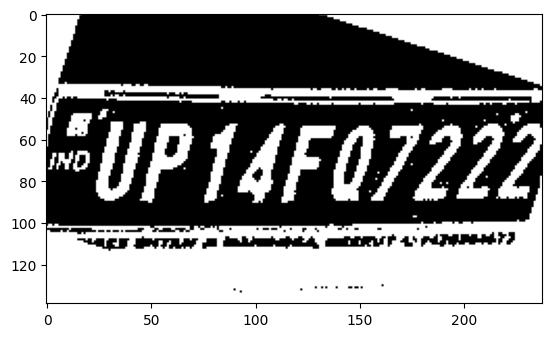

height =  82 width =  99
height =  82 width =  97
height =  83 width =  99
height =  82 width =  98
height =  82 width =  98
height =  82 width =  100
height =  1424 width =  1934
height =  82 width =  99
height =  80 width =  100
height =  1420 width =  1933
height =  79 width =  101
height =  1426 width =  1870
height =  78 width =  101
height =  1429 width =  1782
height =  77 width =  101
height =  1426 width =  1661
height =  75 width =  99
height =  1380 width =  1309
height =  74 width =  101
height =  74 width =  99
height =  75 width =  99
height =  75 width =  97
height =  76 width =  99
height =  76 width =  98
height =  79 width =  97
height =  80 width =  97
height =  81 width =  99
height =  81 width =  99
height =  81 width =  99
height =  83 width =  100
height =  84 width =  98
height =  86 width =  99
height =  87 width =  101
height =  86 width =  100
height =  84 width =  98
height =  82 width =  98
height =  82 width =  99
height =  81 width =  97
height =  80 widt

[66.36769104003906, 113.31388854980469, 108.61640167236328, 135.12767028808594, 0.7696863412857056, 0.0] track_id: 215.0
-0.22679884805388587


[]
License Plate Number with contours :  None , Score :  None
-0.2510026866430346
[]
License Plate Number :  None , Score :  None
height =  182 width =  153


[66.57659149169922, 117.2835922241211, 110.11864471435547, 140.095458984375, 0.8045100569725037, 0.0] track_id: 215.0
-0.2567083304333857


[]
License Plate Number with contours :  None , Score :  None
-0.2213144423477913
[]
License Plate Number :  None , Score :  None
height =  188 width =  159


[70.50362396240234, 123.26834106445312, 115.90560150146484, 144.76559448242188, 0.572190523147583, 0.0] track_id: 215.0
-0.2510026866430346


[]
License Plate Number with contours :  None , Score :  None
-0.23860932250820097
['Pcr']
license before check Pcr
hello
License Plate Number :  None , Score :  None
height =  189 width =  165
[74.13648223876953, 122.98164367675781, 120.17534637451172, 144.03689575195312, 0.4108922779560089, 0.0] track_id: 215.0
-0.260602391747341
height =  190 width =  168
[75.85450744628906, 120.83604431152344, 122.84454345703125, 143.0047607421875, 0.6811679601669312, 0.0] track_id: 215.0
-0.23501221572065709
height =  195 width =  174
[78.60796356201172, 121.37776184082031, 127.39835357666016, 145.928466796875, 0.7959654331207275, 0.0] track_id: 215.0
-0.22679884805388587
height =  200 width =  176


[80.19245147705078, 125.8062515258789, 130.6299591064453, 149.60336303710938, 0.8057556748390198, 0.0] track_id: 215.0
-0.20599133667583147


[]
License Plate Number with contours :  None , Score :  None
-0.2587708919636976
['uaTI']
license before check uaTI
hello
License Plate Number :  None , Score :  None
height =  203 width =  182


[82.5479507446289, 127.24122619628906, 135.35305786132812, 151.3887939453125, 0.8423399329185486, 0.0] track_id: 215.0
-0.23109066719589708


[]
License Plate Number with contours :  None , Score :  None
-0.23974310887045658
['ubd']
license before check ubd
hello
License Plate Number :  None , Score :  None
height =  211 width =  190


[86.63272857666016, 132.40757751464844, 140.37681579589844, 157.7308349609375, 0.8354235887527466, 0.0] track_id: 215.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.23109066719589708
['Wtmi']
license before check Wtmi
hello
License Plate Number :  None , Score :  None
height =  216 width =  198


[89.54220581054688, 135.26646423339844, 145.5938262939453, 161.15310668945312, 0.8581926226615906, 0.0] track_id: 215.0
-0.24220858710962045


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['Duvs']
license before check Duvs
hello
License Plate Number :  None , Score :  None
height =  216 width =  203


[93.66740417480469, 135.8348388671875, 150.9854736328125, 162.74057006835938, 0.861909031867981, 0.0] track_id: 215.0
-0.20749622643520266


[]
License Plate Number with contours :  None , Score :  None
-0.23624526071843754
[]
License Plate Number :  None , Score :  None
height =  218 width =  207


[96.96993255615234, 136.45042419433594, 157.6050567626953, 163.79205322265625, 0.8657243847846985, 0.0] track_id: 215.0
-0.21979507152403238


[]
License Plate Number with contours :  None , Score :  None
-0.2408464552414116
['4azTte']
license before check 4azTte
hello
License Plate Number :  None , Score :  None
height =  76 width =  84
height =  107 width =  49
height =  224 width =  217


[99.96688079833984, 140.93052673339844, 163.30545043945312, 168.3157196044922, 0.8560642004013062, 0.0] track_id: 215.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.2408464552414116
[]
License Plate Number :  None , Score :  None
height =  77 width =  88
height =  232 width =  226


[105.83438110351562, 144.69126892089844, 170.7579345703125, 173.20973205566406, 0.870420515537262, 0.0] track_id: 215.0
-0.23021958727684372


['W']
license before check W
hello
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
['VKitES']
license before check VKitES
hello
License Plate Number :  None , Score :  None
height =  80 width =  93
height =  104 width =  51
height =  238 width =  234


[110.27203369140625, 146.09548950195312, 176.956298828125, 175.70452880859375, 0.8841593861579895, 0.0] track_id: 215.0
-0.2172934309230211


['W']
license before check W
hello
License Plate Number with contours :  None , Score :  None
-0.20846521837998772
['UEVbe']
license before check UEVbe
hello
License Plate Number :  None , Score :  None
height =  86 width =  96
height =  98 width =  51
height =  244 width =  243


[115.60368347167969, 149.17636108398438, 185.2821044921875, 179.98240661621094, 0.8879857659339905, 0.0] track_id: 215.0
-0.22347660114063303


['Wo']
license before check Wo
hello
License Plate Number with contours :  None , Score :  None
-0.23210383807515567
['VEREQ2zJe']
license before check VEREQ2zJe
hello
License Plate Number :  None , Score :  None
height =  93 width =  98
height =  103 width =  52
height =  253 width =  255


[121.3355941772461, 156.2109375, 194.49288940429688, 187.4149627685547, 0.8926753997802734, 0.0] track_id: 215.0
-0.23501221572065709


['EE4ert5']
license before check EE4ert5
hello
License Plate Number with contours :  None , Score :  None
-0.22347660114063303
['VfKEQ3765']
license before check VfKEQ3765
hello
License Plate Number :  None , Score :  None
height =  95 width =  99
height =  98 width =  49
height =  263 width =  266


[127.30687713623047, 161.3946990966797, 203.05392456054688, 193.60513305664062, 0.8821732401847839, 0.0] track_id: 215.0
-0.23949926591015905


['fitc2756']
license before check fitc2756
hello
License Plate Number with contours :  None , Score :  None
-0.22810262827994277
['UfkF09785']
license before check UfkF09785
hello
License Plate Number :  None , Score :  None
height =  92 width =  100
height =  98 width =  48
height =  271 width =  278


[132.73193359375, 168.0135040283203, 212.2834930419922, 202.3365020751953, 0.8961146473884583, 0.0] track_id: 215.0
-0.22441600903714554


['NPIA0s7es']
license before check NPIA0s7es
hello
License Plate Number with contours :  None , Score :  None
-0.23109066719589708
['Vup1E03766']
license before check Vup1E03766
hello
License Plate Number :  None , Score :  None
height =  100 width =  106
height =  86 width =  47
height =  282 width =  291


[141.6663818359375, 178.5605926513672, 225.4131317138672, 213.1806182861328, 0.8709509968757629, 0.0] track_id: 215.0
-0.22494126505117096


['UPh0S7e6']
license before check UPh0S7e6
hello
License Plate Number with contours :  None , Score :  None
-0.23860932250820097
['PupE09786']
license before check PupE09786
hello
License Plate Number :  None , Score :  None
height =  105 width =  110
height =  293 width =  307


[151.4861297607422, 186.2250518798828, 238.99208068847656, 223.15003967285156, 0.8855341076850891, 0.0] track_id: 215.0
-0.22423475110909616


['UPizE0978e']
license before check UPizE0978e
hello
License Plate Number with contours :  None , Score :  None
-0.22402364703792346
['PVP14E037861']
license before check PVP14E037861
hello
License Plate Number :  None , Score :  None
height =  107 width =  111
height =  98 width =  52
height =  308 width =  325


[163.46224975585938, 195.25827026367188, 255.33155822753906, 233.7196807861328, 0.8962521553039551, 0.0] track_id: 215.0
-0.23824475817874502


['V712e09705']
license before check V712e09705
hello
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
['UP1LE09786']
license before check UP1LE09786
license after check UP1LE09786
License Plate Number :  UP1LEO9786 , Score :  0.2252785565382723


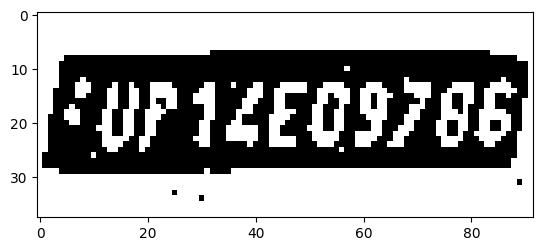

height =  111 width =  116
height =  69 width =  73
height =  324 width =  345


[176.16848754882812, 205.980224609375, 273.0157165527344, 247.88206481933594, 0.89607173204422, 0.0] track_id: 215.0
-0.22347660114063303
['NP1LED9785']
license before check NP1LED9785
license after check NP1LED9785
License Plate Number with contours :  NP1LED9785 , Score :  0.210338834240477


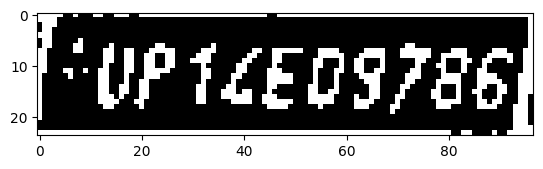

height =  112 width =  116
height =  68 width =  77
height =  339 width =  363


[187.81434631347656, 217.2256622314453, 289.6322326660156, 260.7041015625, 0.8909909725189209, 0.0] track_id: 215.0
-0.21109333322274654
['UPILE09786']
license before check UPILE09786
license after check UPILE09786
License Plate Number with contours :  UP1LEO9786 , Score :  0.33338228007135123


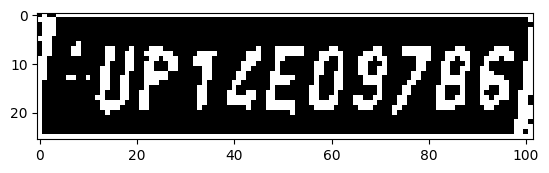

height =  116 width =  119
height =  67 width =  86
height =  357 width =  387


[205.10621643066406, 231.90684509277344, 311.9764709472656, 279.8213195800781, 0.9048808217048645, 0.0] track_id: 215.0
-0.20707267711703156
['UP14E09786']
license before check UP14E09786
license after check UP14E09786
License Plate Number with contours :  UP14EO9786 , Score :  0.2714312620123295


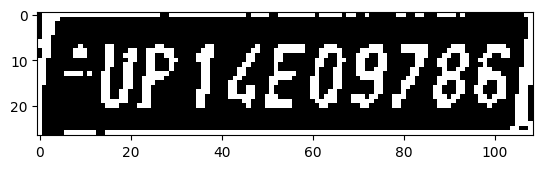

height =  115 width =  120
height =  68 width =  80
height =  379 width =  415


[225.09461975097656, 247.1837615966797, 338.21453857421875, 298.613037109375, 0.9119933843612671, 0.0] track_id: 215.0
-0.19092315832258525
['UP1LEQ9786']
license before check UP1LEQ9786
license after check UP1LEQ9786
License Plate Number with contours :  UP1LEQ9786 , Score :  0.5946348501891747


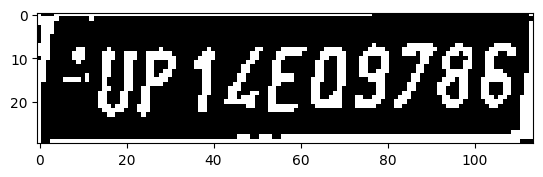

height =  117 width =  122
height =  69 width =  75
height =  405 width =  450


[248.54983520507812, 267.04595947265625, 368.9649658203125, 321.164794921875, 0.9148035049438477, 0.0] track_id: 215.0
-0.21057195683620386
['UP1LE09785']
license before check UP1LE09785
license after check UP1LE09785
License Plate Number with contours :  UP1LEO9785 , Score :  0.5460412902223036


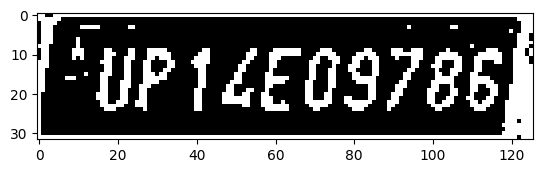

height =  118 width =  125
height =  67 width =  69
height =  432 width =  485


[272.8079833984375, 287.54254150390625, 400.8995666503906, 345.7278747558594, 0.9091634154319763, 0.0] track_id: 215.0
-0.21109333322274654
['UP1LEQ9786']
license before check UP1LEQ9786
license after check UP1LEQ9786
License Plate Number with contours :  UP1LEQ9786 , Score :  0.45537566430405385


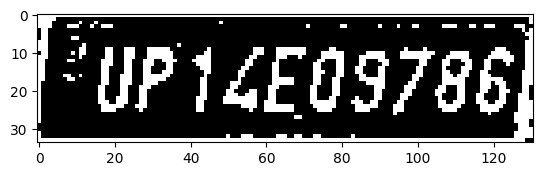

height =  115 width =  125
height =  68 width =  62
height =  461 width =  525
[304.8309020996094, 311.8013000488281, 441.6471862792969, 373.199462890625, 0.9116281270980835, 0.0] track_id: 215.0
-0.2121437530044756
height =  122 width =  127
height =  66 width =  66
height =  500 width =  576


[343.77313232421875, 339.7881774902344, 489.8716735839844, 405.9242858886719, 0.9109970927238464, 0.0] track_id: 215.0
-0.21018258666216955
['UP1LeQ9786']
license before check UP1LeQ9786
license after check UP1LEQ9786
License Plate Number with contours :  UP1LEQ9786 , Score :  0.2532944768160648


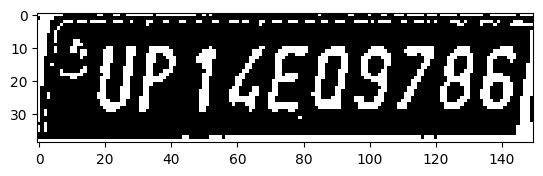

height =  124 width =  133
height =  544 width =  635
[389.92889404296875, 372.7192687988281, 545.9730834960938, 445.0565185546875, 0.9181612730026245, 0.0] track_id: 215.0
-0.22595921768864075
height =  135 width =  137
height =  592 width =  697


[446.4145812988281, 414.2698059082031, 614.4284057617188, 492.03009033203125, 0.9220159649848938, 0.0] track_id: 215.0
-0.2237354003066978


['UP1LE097861']
license before check UP1LE097861
hello
License Plate Number with contours :  None , Score :  None
-0.2248886307020433
['LUP1LEO9786']
license before check LUP1LEO9786
hello
License Plate Number :  None , Score :  None
height =  137 width =  139
height =  650 width =  776
[517.3076782226562, 460.8644104003906, 697.0241088867188, 547.7570190429688, 0.9132643342018127, 0.0] track_id: 215.0
-0.23013494910523036
height =  149 width =  147
height =  720 width =  869


[608.0552978515625, 518.7714233398438, 800.3626098632812, 617.4190063476562, 0.924363911151886, 0.0] track_id: 215.0
-0.2615451947363801


['1']
license before check 1
hello
License Plate Number with contours :  None , Score :  None
-0.2642600199133301
['UP1LE09786']
license before check UP1LE09786
license after check UP1LE09786
License Plate Number :  UP1LEO9786 , Score :  0.5754357568601604


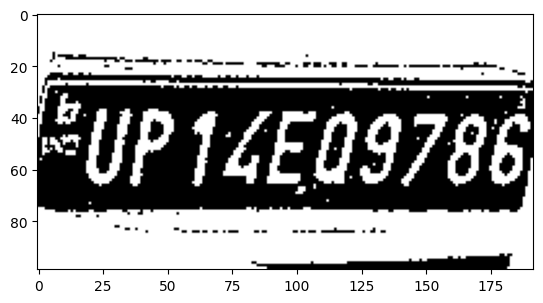

height =  160 width =  147
height =  805 width =  978


[726.0648803710938, 592.2940673828125, 925.3070068359375, 703.2135009765625, 0.9233384132385254, 0.0] track_id: 215.0
-0.27894068455833493


[]
License Plate Number with contours :  None , Score :  None
-0.2924990035846241
['UP1LE09786']
license before check UP1LE09786
license after check UP1LE09786
License Plate Number :  UP1LEO9786 , Score :  0.5007865989793248


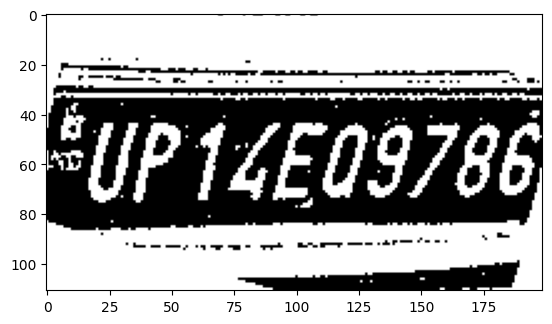

height =  170 width =  149
height =  909 width =  1100


[868.7778930664062, 681.5718994140625, 1068.6953125, 809.260009765625, 0.9203771352767944, 0.0] track_id: 215.0
-0.36574730126234445


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.3644075891452026
['UP14E09786']
license before check UP14E09786
license after check UP14E09786
License Plate Number :  UP14EO9786 , Score :  0.4757356676563471


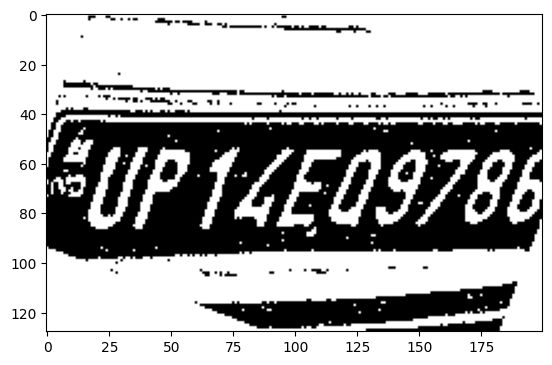

height =  174 width =  156
height =  1040 width =  1239


[1047.5125732421875, 745.506591796875, 1238.416015625, 935.255859375, 0.7749196290969849, 0.0] track_id: 215.0
-0.5245742877113148


[]
License Plate Number with contours :  None , Score :  None
-0.5044902682620107
['Up14E09786']
license before check Up14E09786
license after check UP14E09786
License Plate Number :  UP14EO9786 , Score :  0.2618658760218545


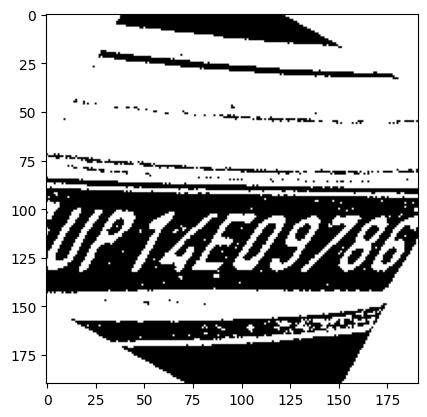

[1048.25537109375, 805.8201904296875, 1238.742919921875, 935.53955078125, 0.4712764024734497, 0.0] track_id: 215.0
-0.4531216819690807


['Ur']
license before check Ur
hello
License Plate Number with contours :  None , Score :  None
-0.4742105964038595
['UP14E09782']
license before check UP14E09782
license after check UP14E09782
License Plate Number :  UP14EO9782 , Score :  0.4475768775734344


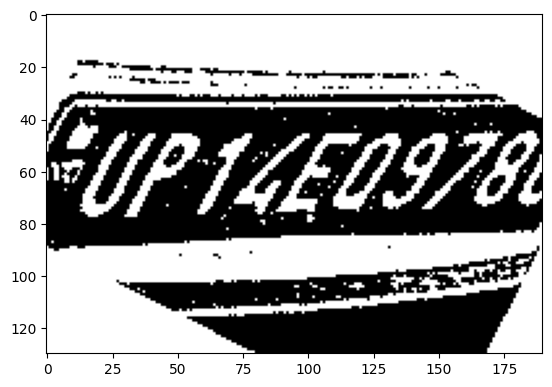

height =  176 width =  160
height =  1185 width =  1388
height =  179 width =  166
height =  1267 width =  1543
height =  183 width =  168
height =  1285 width =  1684
height =  187 width =  170
height =  1269 width =  1704
height =  192 width =  177
height =  1231 width =  1609
height =  201 width =  184
height =  1169 width =  1457
height =  207 width =  191
[90.03424835205078, 127.08081817626953, 140.45335388183594, 152.2085723876953, 0.6297136545181274, 0.0] track_id: 216.0
-0.24192056868440487
height =  1100 width =  1254
height =  212 width =  196
[92.584716796875, 129.56752014160156, 144.8011932373047, 155.5821990966797, 0.6483020186424255, 0.0] track_id: 216.0
-0.2284966392918623
height =  1000 width =  998
height =  216 width =  200


[93.93846130371094, 130.31253051757812, 148.896240234375, 155.82786560058594, 0.6601458787918091, 0.0] track_id: 216.0
-0.2099735128621634


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  223 width =  208


[99.95413208007812, 134.12644958496094, 157.10665893554688, 159.66017150878906, 0.6405453085899353, 0.0] track_id: 216.0
-0.2171113147349052


[]
License Plate Number with contours :  None , Score :  None
-0.23554498072086333
[]
License Plate Number :  None , Score :  None
height =  231 width =  216


[103.5261001586914, 140.81204223632812, 162.68411254882812, 166.5828857421875, 0.8271399736404419, 0.0] track_id: 216.0
-0.19739555984988075


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  236 width =  224


[107.45616149902344, 142.8369598388672, 170.2742919921875, 172.1348419189453, 0.6796150207519531, 0.0] track_id: 216.0
-0.3947911196997615


[]
License Plate Number with contours :  None , Score :  None
-0.225601243836024
[]
License Plate Number :  None , Score :  None
height =  111 width =  65
height =  246 width =  234
[112.57331848144531, 147.2984161376953, 175.4936981201172, 176.51904296875, 0.8962329030036926, 0.0] track_id: 216.0
-0.23052183904336873
height =  105 width =  59
height =  258 width =  245
[119.41097259521484, 153.9911651611328, 186.6662139892578, 184.9649200439453, 0.865967869758606, 0.0] track_id: 216.0
-0.21866894587394195
height =  106 width =  58
height =  264 width =  256
[125.02812957763672, 157.65823364257812, 195.1570587158203, 189.2757110595703, 0.8780491948127747, 0.0] track_id: 216.0
-0.22266094063636496
height =  103 width =  57
height =  274 width =  267


[131.95034790039062, 166.71072387695312, 205.55113220214844, 197.9709930419922, 0.8832026124000549, 0.0] track_id: 216.0
-0.2093853929534955


[]
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
[]
License Plate Number :  None , Score :  None
height =  104 width =  56
height =  285 width =  283
[141.2576446533203, 173.85206604003906, 217.616455078125, 206.12147521972656, 0.8854921460151672, 0.0] track_id: 216.0
-0.21109333322274654
height =  105 width =  58
height =  295 width =  293


[147.13919067382812, 182.6701202392578, 227.4639129638672, 218.92100524902344, 0.8974533081054688, 0.0] track_id: 216.0
0.17219081452293902


['07181n9330']
license before check 07181n9330
hello
License Plate Number with contours :  None , Score :  None
-0.21018258666216955
['16148226']
license before check 16148226
hello
License Plate Number :  None , Score :  None
height =  105 width =  58
height =  305 width =  307


[153.46231079101562, 189.8634796142578, 237.3633575439453, 227.7763671875, 0.9041785001754761, 0.0] track_id: 216.0
-0.20487671703710847
['VP161m8226']
license before check VP161m8226
license after check VP161M8226
License Plate Number with contours :  VP16IM8226 , Score :  0.05764653801418577


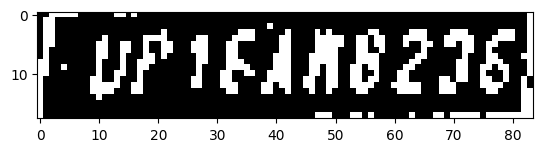

height =  105 width =  55
height =  324 width =  326


[165.98069763183594, 202.0631866455078, 253.00823974609375, 241.20248413085938, 0.9031075835227966, 0.0] track_id: 216.0
-0.18873776752013358
['V164R8276']
license before check V164R8276
license after check V164R8276
License Plate Number with contours :  VI64R8276 , Score :  0.37216787357377984


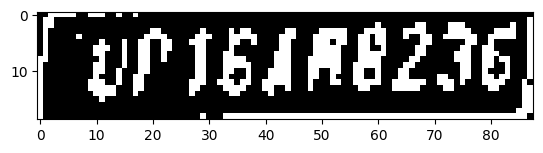

height =  103 width =  55
height =  337 width =  344


[178.30807495117188, 214.15565490722656, 271.7924499511719, 255.45608520507812, 0.8914476633071899, 0.0] track_id: 216.0
-0.21406068356382152


['UP16178275']
license before check UP16178275
hello
License Plate Number with contours :  None , Score :  None
-0.2063238940297175
['Up16438236T']
license before check Up16438236T
hello
License Plate Number :  None , Score :  None
height =  106 width =  55
height =  359 width =  366


[192.11343383789062, 227.0534210205078, 291.3173828125, 272.91595458984375, 0.8958119750022888, 0.0] track_id: 216.0
-0.20713099635648255


['UP164X8Z36']
license before check UP164X8Z36
hello
License Plate Number with contours :  None , Score :  None
-0.20333608402827574
['Vp16438236']
license before check Vp16438236
license after check VP16438236
License Plate Number :  VP16AJ8236 , Score :  0.10771830972497017


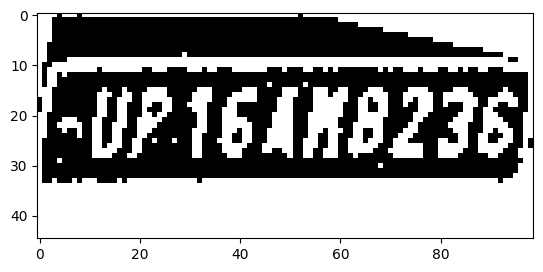

height =  106 width =  54
height =  93 width =  108
height =  376 width =  390


[209.45465087890625, 243.3723907470703, 313.6716003417969, 289.1419677734375, 0.9015519022941589, 0.0] track_id: 216.0
-0.20112688581653948


['Up16nBZ3G']
license before check Up16nBZ3G
hello
License Plate Number with contours :  None , Score :  None
-0.19321148384780604
['UP7643B236']
license before check UP7643B236
hello
License Plate Number :  None , Score :  None
height =  107 width =  55
height =  96 width =  110
height =  404 width =  420


[228.66114807128906, 262.2862854003906, 340.27850341796875, 311.05450439453125, 0.9081123471260071, 0.0] track_id: 216.0
-0.19032853969190713
['UP64n8236']
license before check UP64n8236
license after check UP64N8236
License Plate Number with contours :  UP64N8236 , Score :  0.20157928804399397


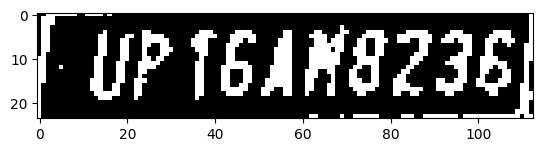

height =  106 width =  56
height =  93 width =  112
height =  432 width =  454


[251.30584716796875, 278.5829772949219, 371.06060791015625, 331.8802490234375, 0.9044063687324524, 0.0] track_id: 216.0
-0.1925016348099795
['UP164H8236']
license before check UP164H8236
license after check UP164H8236
License Plate Number with contours :  UP16AH8236 , Score :  0.31746165361409545


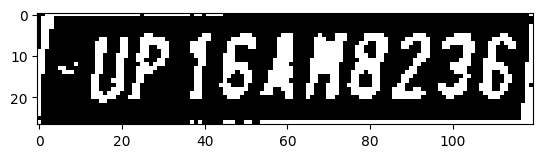

height =  107 width =  56
height =  96 width =  118
height =  72 width =  94
height =  457 width =  492


[278.6667175292969, 301.52728271484375, 407.5583801269531, 356.7989196777344, 0.9010546803474426, 0.0] track_id: 216.0
-0.19288431225797467
['UP16448236']
license before check UP16448236
license after check UP16448236
License Plate Number with contours :  UP16AA8236 , Score :  0.6045451889625392


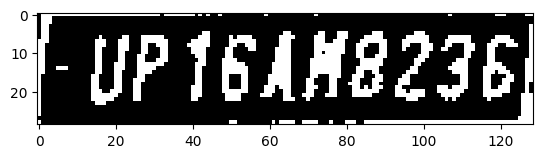

height =  106 width =  55
height =  100 width =  116
height =  72 width =  96
height =  495 width =  538


[312.8590393066406, 331.51739501953125, 449.9212341308594, 391.55731201171875, 0.9139525890350342, 0.0] track_id: 216.0
-0.22615243573280183
['UP164n8236']
license before check UP164n8236
license after check UP164N8236
License Plate Number with contours :  UP16AN8236 , Score :  0.40067432559172533


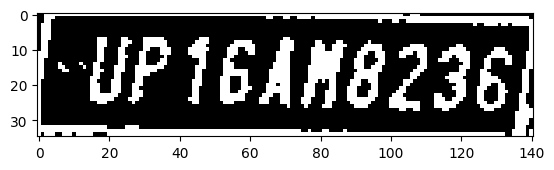

height =  107 width =  56
height =  101 width =  117
height =  72 width =  85
height =  541 width =  591


[353.52496337890625, 364.342529296875, 502.5096130371094, 431.4433898925781, 0.9098709225654602, 0.0] track_id: 216.0
-0.20487671703710847
['UP16408236']
license before check UP16408236
license after check UP16408236
License Plate Number with contours :  UP16AO8236 , Score :  0.32993850188029944


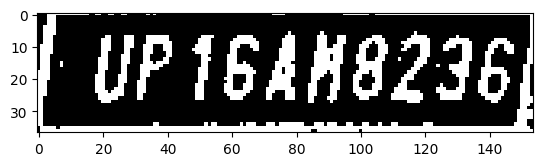

height =  101 width =  117
height =  72 width =  80
height =  592 width =  653


[401.3463134765625, 404.6811828613281, 565.2376098632812, 474.98345947265625, 0.9067625403404236, 0.0] track_id: 216.0
-0.20795854725293414
['UP16AN8236']
license before check UP16AN8236
license after check UP16AN8236
License Plate Number with contours :  UP16AN8236 , Score :  0.6085297139051409


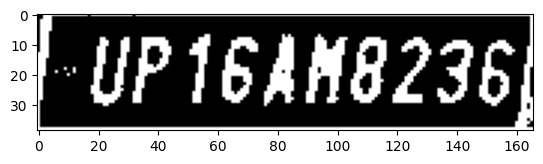

height =  102 width =  119
height =  72 width =  79
height =  648 width =  726


[465.125, 448.919921875, 642.5501708984375, 524.8043823242188, 0.9105751514434814, 0.0] track_id: 216.0
-0.2128085974067764
['UP16448236']
license before check UP16448236
license after check UP16448236
License Plate Number with contours :  UP16AA8236 , Score :  0.3634569429473212


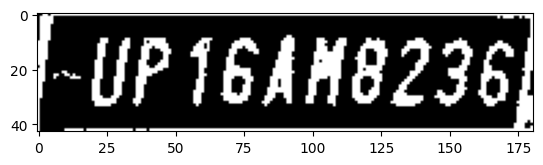

height =  106 width =  120
height =  73 width =  87
height =  718 width =  814


[546.2515258789062, 507.7438659667969, 737.8430786132812, 593.4279174804688, 0.9155921936035156, 0.0] track_id: 216.0
-0.22540285082206107


['UP16am82361']
license before check UP16am82361
hello
License Plate Number with contours :  None , Score :  None
-0.21439546761559247
['UP164H8236']
license before check UP164H8236
license after check UP164H8236
License Plate Number :  UP16AH8236 , Score :  0.5814945901582049


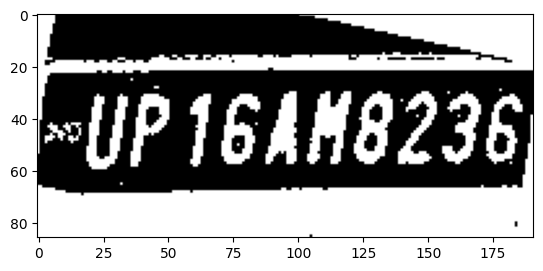

height =  107 width =  122
height =  73 width =  81
height =  811 width =  919


[651.8500366210938, 587.7163696289062, 859.9435424804688, 682.3744506835938, 0.9127622246742249, 0.0] track_id: 216.0
-0.26188526468051904
['UP164h8236']
license before check UP164h8236
license after check UP164H8236
License Plate Number with contours :  UP16AH8236 , Score :  0.409402231756988


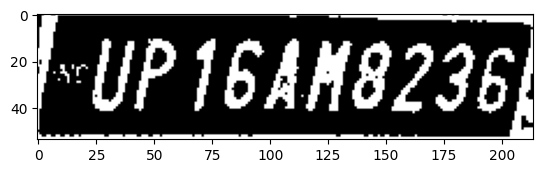

height =  111 width =  125
height =  75 width =  87
height =  919 width =  1045


[790.8150024414062, 679.087158203125, 1004.4635620117188, 793.6708374023438, 0.9156589508056641, 0.0] track_id: 216.0
-0.2809260482387086


['UP164H82361']
license before check UP164H82361
hello
License Plate Number with contours :  None , Score :  None
-0.3132037539640307
['UP164H8236']
license before check UP164H8236
license after check UP164H8236
License Plate Number :  UP16AH8236 , Score :  0.9100055521350794


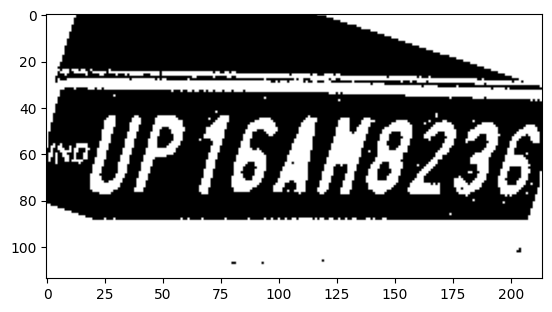

height =  114 width =  124
height =  74 width =  90
height =  1058 width =  1191


[963.3163452148438, 791.0571899414062, 1184.8360595703125, 926.7949829101562, 0.5568724870681763, 0.0] track_id: 216.0
-0.3813596192261242


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.3805063771123649
['Up164H8236']
license before check Up164H8236
license after check UP164H8236
License Plate Number :  UP16AH8236 , Score :  0.38670901659708784


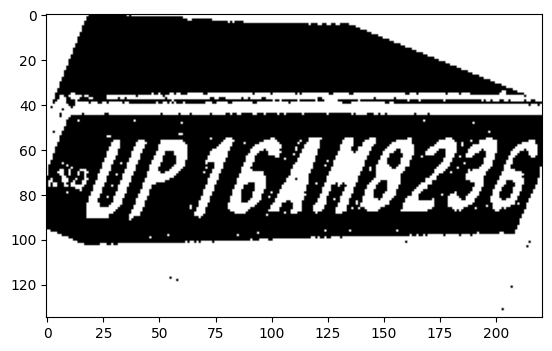

height =  115 width =  125
height =  72 width =  94
height =  1220 width =  1352
height =  117 width =  125
height =  1340 width =  1535
height =  117 width =  126
height =  1380 width =  1729
height =  120 width =  127
height =  1383 width =  1821
height =  123 width =  131
height =  1362 width =  1804
height =  125 width =  135
height =  1346 width =  1705
height =  128 width =  138
height =  1312 width =  1576
height =  132 width =  139
height =  1261 width =  1380
height =  154 width =  148
height =  159 width =  152
height =  163 width =  158
height =  168 width =  161
height =  172 width =  165
height =  175 width =  169


[77.30056762695312, 113.04632568359375, 122.17686462402344, 130.1303253173828, 0.40899282693862915, 0.0] track_id: 220.0
-0.22923193327699534


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  179 width =  175
height =  185 width =  180
[85.28563690185547, 116.59381103515625, 129.1032257080078, 133.92190551757812, 0.7493458986282349, 0.0] track_id: 220.0
-0.23684876094692026
height =  186 width =  184
height =  194 width =  192
[87.64029693603516, 122.61434173583984, 137.55662536621094, 141.12062072753906, 0.7698733806610107, 0.0] track_id: 220.0
-0.22679884805388587
height =  200 width =  194
[88.13953399658203, 125.60697174072266, 138.9616241455078, 144.5078887939453, 0.7864841222763062, 0.0] track_id: 220.0
-0.23374318086890142
height =  202 width =  200
[89.28045654296875, 127.45048522949219, 143.61776733398438, 147.50221252441406, 0.8886590600013733, 0.0] track_id: 220.0
-0.21406068356382152
height =  206 width =  205
[91.47222900390625, 130.8977813720703, 148.392822265625, 150.71243286132812, 0.8666941523551941, 0.0] track_id: 220.0
-0.223476601140633

[97.24594116210938, 134.41090393066406, 155.22776794433594, 156.04530334472656, 0.8907374143600464, 0.0] track_id: 220.0
-0.22104706267501872


[]
License Plate Number with contours :  None , Score :  None
-0.2347226124851971
[]
License Plate Number :  None , Score :  None
height =  218 width =  221
[100.9898681640625, 137.307373046875, 161.04966735839844, 159.96243286132812, 0.8936356902122498, 0.0] track_id: 220.0
-0.2275674874105842
height =  221 width =  227


[106.02388000488281, 139.42605590820312, 165.73992919921875, 163.467041015625, 0.9080461859703064, 0.0] track_id: 220.0
-0.22581168154335537


[]
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
[]
License Plate Number :  None , Score :  None
height =  228 width =  235
[110.00856018066406, 143.7174530029297, 171.83828735351562, 168.8516387939453, 0.899331271648407, 0.0] track_id: 220.0
-0.22266094063636496
height =  236 width =  243
[111.99307250976562, 149.2457733154297, 176.98377990722656, 174.04991149902344, 0.8948577046394348, 0.0] track_id: 220.0
-0.19448011621510564
height =  246 width =  251


[116.58475494384766, 156.19024658203125, 183.6051788330078, 181.02232360839844, 0.8918418884277344, 0.0] track_id: 220.0
-0.20487671703710847


[]
License Plate Number with contours :  None , Score :  None
-0.20902294280626463
[]
License Plate Number :  None , Score :  None
height =  253 width =  261


[122.26486206054688, 161.84107971191406, 192.2798614501953, 188.40594482421875, 0.8959569334983826, 0.0] track_id: 220.0
-0.21032587366505767


[]
License Plate Number with contours :  None , Score :  None
-0.23297923907710288
[]
License Plate Number :  None , Score :  None
height =  263 width =  271


[127.46190643310547, 166.89779663085938, 200.9342498779297, 194.94825744628906, 0.8901600241661072, 0.0] track_id: 220.0
-0.22347660114063303


[]
License Plate Number with contours :  None , Score :  None
-0.2168736156664083
[]
License Plate Number :  None , Score :  None
height =  274 width =  285
[134.69810485839844, 173.76583862304688, 211.99757385253906, 203.6877899169922, 0.9014705419540405, 0.0] track_id: 220.0
-0.23860932250820097
height =  73 width =  91
height =  281 width =  298


[142.69805908203125, 183.61866760253906, 222.42173767089844, 213.74441528320312, 0.8994551301002502, 0.0] track_id: 220.0
-0.20963984587421253


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
['31438a0']
license before check 31438a0
hello
License Plate Number :  None , Score :  None
height =  75 width =  94
height =  293 width =  311
[149.42445373535156, 193.61729431152344, 233.4932403564453, 225.24066162109375, 0.9005885720252991, 0.0] track_id: 220.0
-0.2933670118297097
height =  78 width =  96
height =  310 width =  329
[159.96043395996094, 203.75900268554688, 248.76963806152344, 237.2141876220703, 0.8917413353919983, 0.0] track_id: 220.0
-0.1908311027212619
height =  79 width =  98
height =  327 width =  349
[173.60943603515625, 216.18238830566406, 266.7493591308594, 250.8473663330078, 0.8971797227859497, 0.0] track_id: 220.0
-0.20902294280626463
height =  80 width =  104
height =  341 width =  369


[186.88673400878906, 225.60865783691406, 284.5180358886719, 262.98675537109375, 0.8956647515296936, 0.0] track_id: 220.0
-0.21032587366505767


[]
License Plate Number with contours :  None , Score :  None
-0.22290023232837577
['UP37493107']
license before check UP37493107
hello
License Plate Number :  None , Score :  None
height =  84 width =  101
height =  69 width =  45
height =  355 width =  389
[197.11265563964844, 239.60751342773438, 301.67822265625, 279.3455505371094, 0.9072043299674988, 0.0] track_id: 220.0
-0.17307603116985298
height =  88 width =  102
height =  370 width =  415
[215.46893310546875, 253.7521209716797, 325.0029602050781, 291.93695068359375, 0.910101056098938, 0.0] track_id: 220.0
-0.24315384763413442
height =  90 width =  102
height =  392 width =  444
[236.1571807861328, 266.2671813964844, 351.740966796875, 308.35345458984375, 0.9097965359687805, 0.0] track_id: 220.0
-0.20749622643520266
height =  88 width =  106
height =  415 width =  480
[260.56591796875, 282.43243408203125, 383.8946228027344, 329.6532287597656, 0.9065877199172974, 0.0] track_id: 220.0
-0.19032853969190713
height =  93 width =  109


[532.690185546875, 485.2974853515625, 722.5264892578125, 567.3390502929688, 0.9175355434417725, 0.0] track_id: 220.0
-0.22601759821283154


[]
License Plate Number with contours :  None , Score :  None
-0.22347660114063303
['UP37H9340']
license before check UP37H9340
license after check UP37H9340
License Plate Number :  UP37H9340 , Score :  0.4240764997640971


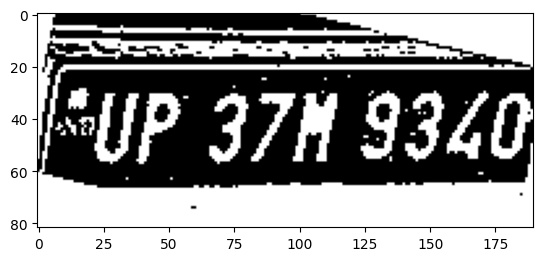

height =  107 width =  119
height =  730 width =  909


[628.6115112304688, 545.2997436523438, 826.7891235351562, 637.30810546875, 0.9144801497459412, 0.0] track_id: 220.0
-0.25933174440068485


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.23996617377864618
['RUP37193L0']
license before check RUP37193L0
hello
License Plate Number :  None , Score :  None
height =  108 width =  120
height =  815 width =  1017


[745.5296630859375, 616.4920654296875, 955.0625, 727.47216796875, 0.9149768352508545, 0.0] track_id: 220.0
-0.296792448601017


[]
License Plate Number with contours :  None , Score :  None
-0.2770043229420266
['UP37N9340']
license before check UP37N9340
license after check UP37N9340
License Plate Number :  UP37N9340 , Score :  0.41670376238648293


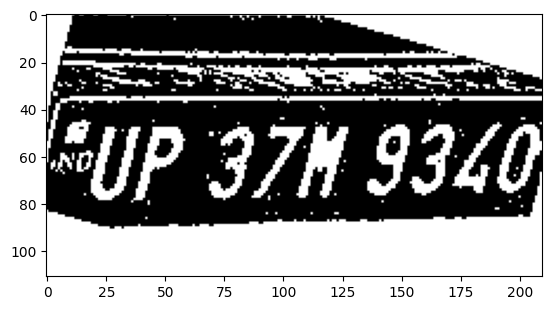

height =  110 width =  123
height =  922 width =  1145


[893.8353271484375, 703.8656616210938, 1109.412109375, 838.41015625, 0.9098799228668213, 0.0] track_id: 220.0
-0.35081948142872593


['H']
license before check H
hello
License Plate Number with contours :  None , Score :  None
-0.3460662188352013
['UP37N9340']
license before check UP37N9340
license after check UP37N9340
License Plate Number :  UP37N9340 , Score :  0.40922709522573564


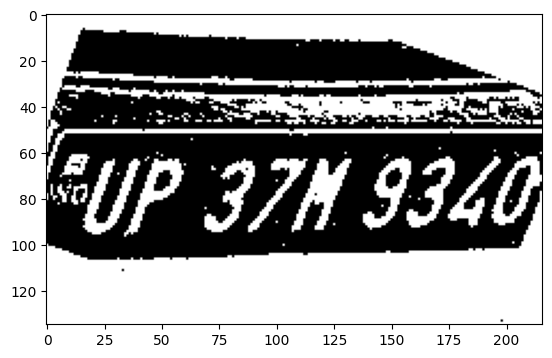

height =  112 width =  125
height =  1046 width =  1289


[1069.0426025390625, 797.876953125, 1284.204833984375, 971.47412109375, 0.6811445355415344, 0.0] track_id: 220.0
-0.4859562806527454


[]
License Plate Number with contours :  None , Score :  None
-0.4559995745652645
['UP3749340']
license before check UP3749340
license after check UP3749340
License Plate Number :  UP37A9340 , Score :  0.5874071218172383


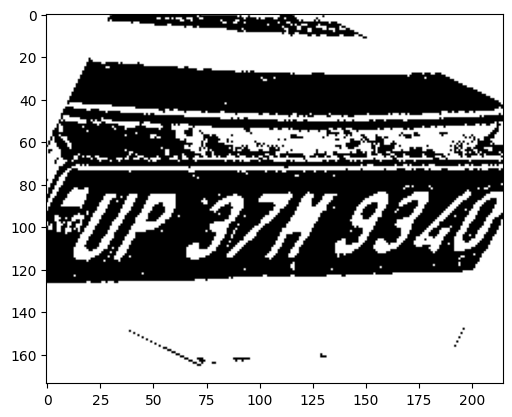

height =  113 width =  127
height =  1196 width =  1442
height =  115 width =  129
height =  1298 width =  1616
height =  117 width =  131
height =  1325 width =  1792
height =  121 width =  134
height =  1319 width =  1852
height =  123 width =  138
height =  1293 width =  1807
height =  126 width =  139
height =  1258 width =  1701
height =  128 width =  142
height =  1217 width =  1587
height =  128 width =  140
height =  1153 width =  1538
height =  132 width =  143
height =  1134 width =  1421
height =  139 width =  147
height =  1061 width =  1235
height =  150 width =  152
height =  953 width =  925
height =  149 width =  156
height =  738 width =  473
height =  154 width =  159
height =  159 width =  162
height =  164 width =  165
height =  174 width =  169
height =  183 width =  173
height =  187 width =  177
height =  184 width =  181
height =  185 width =  186
height =  186 width =  193
height =  192 width =  198


[86.6024398803711, 118.79456329345703, 142.83175659179688, 146.8031463623047, 0.7589290142059326, 0.0] track_id: 222.0
0.4182243295792291


[]
License Plate Number with contours :  None , Score :  None
-0.22082876972934834
[]
License Plate Number :  None , Score :  None
height =  194 width =  205


[89.41728210449219, 119.97078704833984, 146.94813537597656, 147.3822784423828, 0.7747641205787659, 0.0] track_id: 222.0
-0.24870998909352288


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
[]
License Plate Number :  None , Score :  None
height =  197 width =  210


[91.17056274414062, 118.95563507080078, 151.72276306152344, 150.34152221679688, 0.7490513324737549, 0.0] track_id: 222.0
-0.22527677921405528


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['IX']
license before check IX
hello
License Plate Number :  None , Score :  None
height =  203 width =  215
[93.59209442138672, 121.26435089111328, 155.5818328857422, 153.76620483398438, 0.7971580624580383, 0.0] track_id: 222.0
-0.21109333322274654
height =  206 width =  219


[95.90679931640625, 123.03597259521484, 159.632568359375, 155.7347412109375, 0.8660352826118469, 0.0] track_id: 222.0
-0.252095980668074


[]
License Plate Number with contours :  None , Score :  None
-0.23684876094692026
['VJUEIJ']
license before check VJUEIJ
hello
License Plate Number :  None , Score :  None
height =  215 width =  229


[101.03163146972656, 124.33586883544922, 166.98492431640625, 159.22962951660156, 0.9043219685554504, 0.0] track_id: 222.0
-0.23441567572381078


[]
License Plate Number with contours :  None , Score :  None
-0.23210383807515567
['Naja']
license before check Naja
hello
License Plate Number :  None , Score :  None
height =  84 width =  109
height =  223 width =  240


[106.8687973022461, 130.10751342773438, 174.91270446777344, 166.03591918945312, 0.8931059837341309, 0.0] track_id: 222.0
0.44378267274964117


[]
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
['ISppJIS']
license before check ISppJIS
hello
License Plate Number :  None , Score :  None
height =  86 width =  109
height =  231 width =  250


[112.86947631835938, 136.59194946289062, 183.24545288085938, 171.3730010986328, 0.8977223634719849, 0.0] track_id: 222.0
-0.23783592745745075


['3']
license before check 3
hello
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
['F5FSooUD']
license before check F5FSooUD
hello
License Plate Number :  None , Score :  None
height =  87 width =  109
height =  244 width =  261


[118.07585144042969, 140.984619140625, 191.83383178710938, 181.06304931640625, 0.907749354839325, 0.0] track_id: 222.0
-0.22208190190548016


['Urtcorad']
license before check Urtcorad
hello
License Plate Number with contours :  None , Score :  None
-0.24135549057540379
['EUAsDo7Jo9']
license before check EUAsDo7Jo9
license after check EUASDO7JO9
License Plate Number :  EU4SDO7309 , Score :  0.020361987317275156


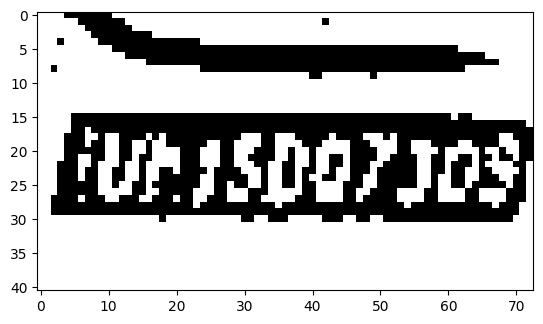

height =  88 width =  112
height =  253 width =  271


[124.2884750366211, 147.3180694580078, 201.59786987304688, 189.58685302734375, 0.9087958931922913, 0.0] track_id: 222.0
-0.24828990930306807


['UrascpJ03']
license before check UrascpJ03
hello
License Plate Number with contours :  None , Score :  None
-0.22581168154335537
['Eun4500J03']
license before check Eun4500J03
hello
License Plate Number :  None , Score :  None
height =  87 width =  113
height =  263 width =  282


[129.4288787841797, 154.70033264160156, 209.31378173828125, 196.7471466064453, 0.9049196839332581, 0.0] track_id: 222.0
-0.23186466084938878


['V1S0iJiS']
license before check V1S0iJiS
hello
License Plate Number with contours :  None , Score :  None
-0.23109066719589708
['5002303']
license before check 5002303
hello
License Plate Number :  None , Score :  None
height =  89 width =  113
height =  272 width =  294


[134.9376220703125, 165.1421356201172, 218.59786987304688, 207.69715881347656, 0.890205442905426, 0.0] track_id: 222.0
-0.047583103276983396


['EQiJug']
license before check EQiJug
hello
License Plate Number with contours :  None , Score :  None
-0.22964244228513467
['E0P15002308']
license before check E0P15002308
hello
License Plate Number :  None , Score :  None
height =  91 width =  113
height =  285 width =  307


[142.81846618652344, 177.31756591796875, 230.01304626464844, 217.99588012695312, 0.9066043496131897, 0.0] track_id: 222.0
-0.21866894587394195
['UR15007203']
license before check UR15007203
license after check UR15007203
License Plate Number with contours :  UR15OO7203 , Score :  0.2965953933262602


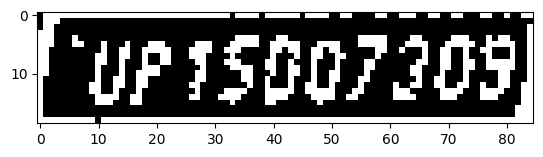

height =  93 width =  113
height =  297 width =  322


[151.9957733154297, 182.24468994140625, 242.7413787841797, 229.02490234375, 0.9013761281967163, 0.0] track_id: 222.0
-0.017855245139552514


['8152073091']
license before check 8152073091
hello
License Plate Number with contours :  None , Score :  None
-0.2171113147349052
['UP15007309']
license before check UP15007309
license after check UP15007309
License Plate Number :  UP15OO7309 , Score :  0.5364656095389684


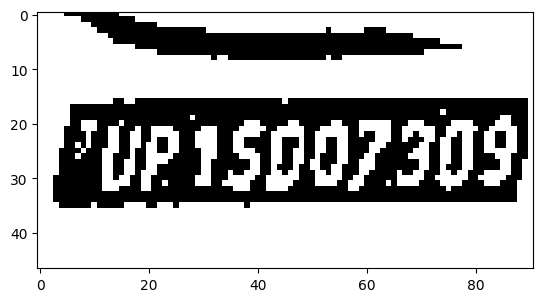

height =  97 width =  110
height =  310 width =  339


[162.9799346923828, 194.64682006835938, 256.7688903808594, 240.95713806152344, 0.8991988301277161, 0.0] track_id: 222.0
-0.21195763724261935
['UP15007309']
license before check UP15007309
license after check UP15007309
License Plate Number with contours :  UP15OO7309 , Score :  0.5727390966819351


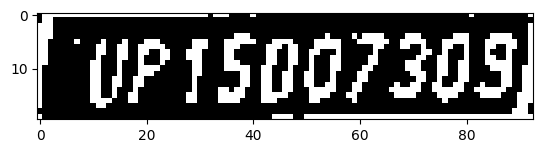

height =  99 width =  110
height =  325 width =  357


[172.0481414794922, 210.07090759277344, 271.5002136230469, 257.58453369140625, 0.8958762288093567, 0.0] track_id: 222.0
-0.2284966392918623
['UP15007309']
license before check UP15007309
license after check UP15007309
License Plate Number with contours :  UP15OO7309 , Score :  0.878707986991221


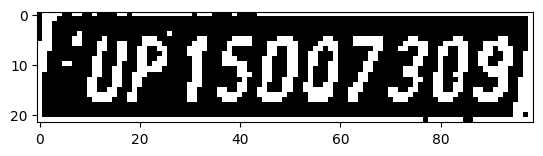

height =  99 width =  110
height =  339 width =  377


[186.54322814941406, 224.2045440673828, 290.6671142578125, 272.6355285644531, 0.8968797922134399, 0.0] track_id: 222.0
-0.22679884805388587
['UP15007303']
license before check UP15007303
license after check UP15007303
License Plate Number with contours :  UP15OO7303 , Score :  0.6155044889091476


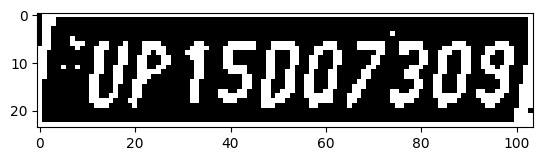

height =  99 width =  110
height =  359 width =  400


[201.61532592773438, 239.08709716796875, 311.4184265136719, 288.5132141113281, 0.8927261829376221, 0.0] track_id: 222.0
-0.22679884805388587
['UP15007309']
license before check UP15007309
license after check UP15007309
License Plate Number with contours :  UP15OO7309 , Score :  0.7316604784663393


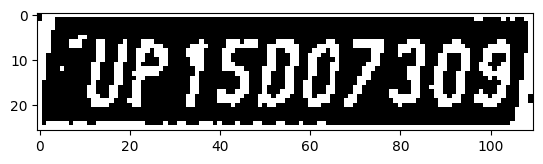

height =  97 width =  110
height =  382 width =  427


[219.04074096679688, 256.2610778808594, 333.51422119140625, 308.8540344238281, 0.9018809199333191, 0.0] track_id: 222.0
-0.225601243836024
['UP15007309']
license before check UP15007309
license after check UP15007309
License Plate Number with contours :  UP15OO7309 , Score :  0.9691175994354136


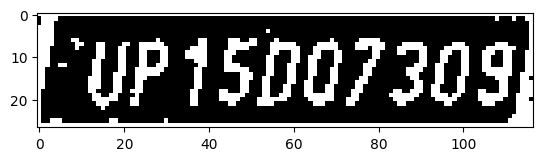

height =  93 width =  112
height =  404 width =  457


[238.9632568359375, 275.43145751953125, 361.2184143066406, 330.6817626953125, 0.9056678414344788, 0.0] track_id: 222.0
-0.21406068356382152
['UP15007309']
license before check UP15007309
license after check UP15007309
License Plate Number with contours :  UP15OO7309 , Score :  0.4461478896214785


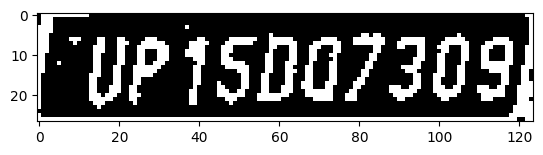

height =  94 width =  111
height =  434 width =  490


[261.7640686035156, 299.6579284667969, 390.3403015136719, 356.4126892089844, 0.9065045118331909, 0.0] track_id: 222.0
-0.23154377092565046
['UP15007309']
license before check UP15007309
license after check UP15007309
License Plate Number with contours :  UP15OO7309 , Score :  0.6027775830564235


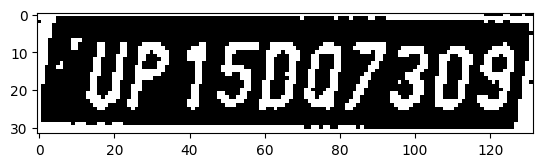

height =  91 width =  112
height =  458 width =  529


[288.9243469238281, 318.14794921875, 428.6761474609375, 379.9293518066406, 0.9142597317695618, 0.0] track_id: 222.0
-0.2213144423477913


['UP150073031']
license before check UP150073031
hello
License Plate Number with contours :  None , Score :  None
-0.20599133667583147
['UP15007309']
license before check UP15007309
license after check UP15007309
License Plate Number :  UP15OO7309 , Score :  0.7100634729134524


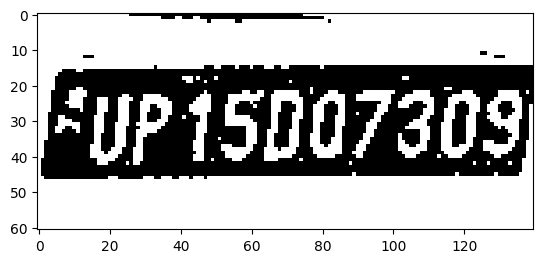

height =  96 width =  112
height =  490 width =  573


[319.59088134765625, 340.9933166503906, 468.51885986328125, 405.8548278808594, 0.9161794781684875, 0.0] track_id: 222.0
-0.2299044281319047
['UP15007309']
license before check UP15007309
license after check UP15007309
License Plate Number with contours :  UP15OO7309 , Score :  0.6658217038349963


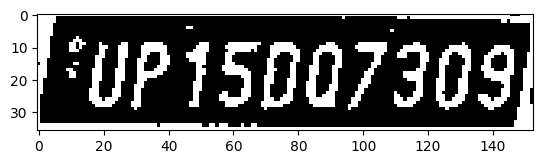

height =  93 width =  111
height =  529 width =  625


[358.458984375, 373.9784851074219, 519.9017333984375, 443.84112548828125, 0.912279486656189, 0.0] track_id: 222.0
-0.220248723390689
['UP15007309']
license before check UP15007309
license after check UP15007309
License Plate Number with contours :  UP15OO7309 , Score :  0.8257233705605067


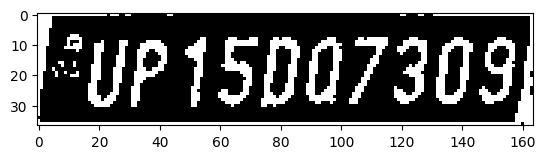

height =  96 width =  113
height =  572 width =  685


[408.2420349121094, 409.1280517578125, 580.2902221679688, 489.765625, 0.9093179106712341, 0.0] track_id: 222.0
-0.22402364703792346


['FUP15007303']
license before check FUP15007303
hello
License Plate Number with contours :  None , Score :  None
-0.22503828649260516
['UP15007309']
license before check UP15007309
license after check UP15007309
License Plate Number :  UP15OO7309 , Score :  0.5356536255684593


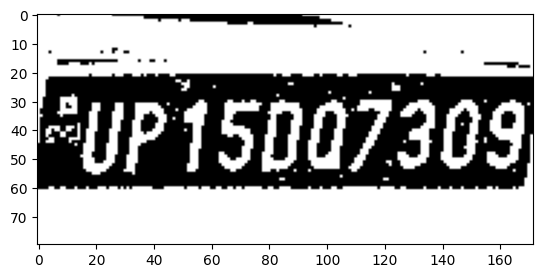

height =  625 width =  755


[466.2953186035156, 454.58282470703125, 653.80078125, 543.3814086914062, 0.9145438075065613, 0.0] track_id: 222.0
-0.2227600978001451


['FUP15007309']
license before check FUP15007309
hello
License Plate Number with contours :  None , Score :  None
-0.2263885074942332
['EUP15007309']
license before check EUP15007309
hello
License Plate Number :  None , Score :  None
height =  690 width =  838


[543.2192993164062, 510.3944396972656, 744.0728149414062, 609.7354736328125, 0.9108383655548096, 0.0] track_id: 222.0
-0.24380770347469657


['FUP15007309']
license before check FUP15007309
hello
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
['EUP15007309']
license before check EUP15007309
hello
License Plate Number :  None , Score :  None
height =  98 width =  119
height =  769 width =  936


[637.651611328125, 580.0492553710938, 854.4427490234375, 689.878662109375, 0.9196364283561707, 0.0] track_id: 222.0
-0.2796068478030448


['FUP150073091']
license before check FUP150073091
hello
License Plate Number with contours :  None , Score :  None
-0.27632727497506515
['UP15007309']
license before check UP15007309
license after check UP15007309
License Plate Number :  UP15OO7309 , Score :  0.41652520942753374


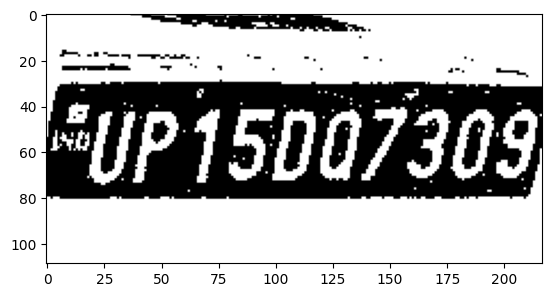

height =  96 width =  117
height =  870 width =  1047


[756.4405517578125, 667.870849609375, 983.179443359375, 792.0534057617188, 0.9124974012374878, 0.0] track_id: 222.0
-0.2984989315861793


['FUP15007309']
license before check FUP15007309
hello
License Plate Number with contours :  None , Score :  None
-0.33054798139042213
['RUP15007309']
license before check RUP15007309
hello
License Plate Number :  None , Score :  None
height =  988 width =  1181


[914.9046020507812, 739.6170043945312, 1147.585205078125, 910.2833862304688, 0.8889704942703247, 0.0] track_id: 222.0
-0.40057349110389384


['FUP151073091']
license before check FUP151073091
hello
License Plate Number with contours :  None , Score :  None
-0.4000542289973569
['P15007309']
license before check P15007309
license after check P15007309
License Plate Number :  PI50O7309 , Score :  0.4791339771702661


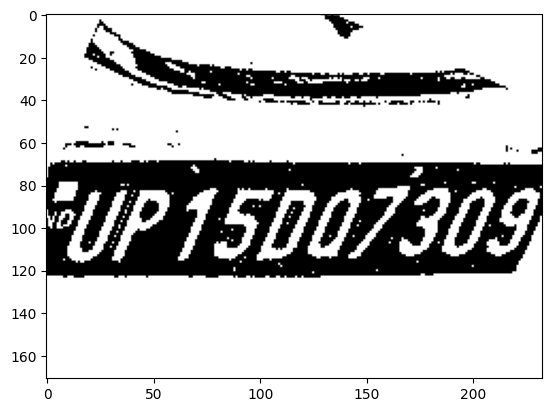

height =  1135 width =  1328
height =  1240 width =  1489
height =  1279 width =  1657
height =  1275 width =  1821
height =  1289 width =  1829
height =  1249 width =  1827
height =  1179 width =  1729
height =  1112 width =  1587
height =  1025 width =  1398
height =  897 width =  1134
height =  756 width =  776
height =  90 width =  110
height =  90 width =  109
height =  90 width =  109
height =  90 width =  107
height =  89 width =  107
height =  88 width =  108
height =  87 width =  108
height =  88 width =  107
height =  86 width =  106
height =  89 width =  106
height =  90 width =  107
height =  89 width =  107
height =  88 width =  108
height =  86 width =  105
height =  85 width =  105
height =  86 width =  104
height =  87 width =  105
height =  86 width =  105
height =  85 width =  104
height =  85 width =  105
height =  83 width =  104
height =  86 width =  104
height =  86 width =  107
height =  86 width =  107
height =  83 width =  106
height =  84 width =  106
height =

[181.9837646484375, 166.34642028808594, 228.7112274169922, 201.3103790283203, 0.9205965399742126, 0.0] track_id: 229.0
-0.2216495629786776


[]
License Plate Number with contours :  None , Score :  None
-0.7853981633974483
[]
License Plate Number :  None , Score :  None
height =  291 width =  352


[192.51194763183594, 176.03268432617188, 241.81979370117188, 213.0637664794922, 0.9213424921035767, 0.0] track_id: 229.0
-0.220248723390689


['7rto']
license before check 7rto
hello
License Plate Number with contours :  None , Score :  None
-0.20232162837830375
[]
License Plate Number :  None , Score :  None
height =  297 width =  363


[198.5688018798828, 181.97042846679688, 248.97364807128906, 219.70834350585938, 0.9199289679527283, 0.0] track_id: 229.0
-0.2247111684146427


['12ID']
license before check 12ID
hello
License Plate Number with contours :  None , Score :  None
-0.19321148384780604
['Ea']
license before check Ea
hello
License Plate Number :  None , Score :  None
height =  308 width =  376


[206.07659912109375, 186.92568969726562, 258.4731140136719, 226.17652893066406, 0.9263263940811157, 0.0] track_id: 229.0
-0.2080561367910258


[]
License Plate Number with contours :  None , Score :  None
-0.19739555984988075
['Md']
license before check Md
hello
License Plate Number :  None , Score :  None
height =  317 width =  386
[211.68701171875, 193.1014862060547, 265.55633544921875, 233.50482177734375, 0.9259659647941589, 0.0] track_id: 229.0
-0.22679884805388587
height =  337 width =  411


[224.7262725830078, 205.44456481933594, 282.1217041015625, 247.66127014160156, 0.9230400919914246, 0.0] track_id: 229.0
-0.23021958727684372


['UP374', 'Thz20']
license before check UP374Thz20
hello
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  348 width =  426


[234.1410675048828, 214.8607635498047, 293.0444030761719, 257.2607116699219, 0.9229063987731934, 0.0] track_id: 229.0
-0.22208190190548016


['127']
license before check 127
hello
License Plate Number with contours :  None , Score :  None
-0.18164883000001195
['E21']
license before check E21
hello
License Plate Number :  None , Score :  None
height =  385 width =  478


[265.7616271972656, 240.1746063232422, 333.6164855957031, 289.7067565917969, 0.9150129556655884, 0.0] track_id: 229.0
-0.22208190190548016
['Up374', 'T7240']
license before check Up374T7240
license after check UP374T7240
License Plate Number with contours :  UP37AT7240 , Score :  0.5788886811107127


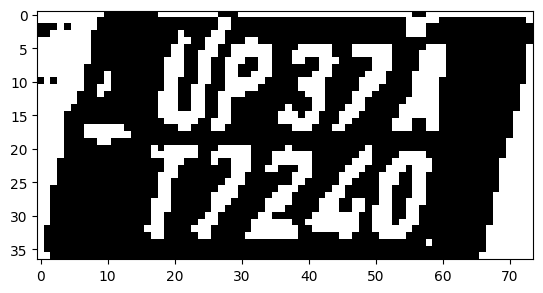

height =  1372 width =  2031
height =  77 width =  101
height =  76 width =  102
height =  73 width =  96
height =  72 width =  98
height =  73 width =  99
height =  75 width =  101
height =  73 width =  100
height =  75 width =  103
height =  77 width =  105
height =  76 width =  105
height =  75 width =  104
height =  75 width =  102
height =  74 width =  102
height =  74 width =  102
height =  73 width =  102
height =  74 width =  101
height =  74 width =  105
height =  94 width =  99
height =  73 width =  103
height =  92 width =  103
height =  92 width =  102
height =  88 width =  102
height =  94 width =  108
height =  70 width =  92
height =  98 width =  109
height =  88 width =  115
height =  66 width =  77
height =  103 width =  120
height =  64 width =  69
height =  104 width =  117
height =  62 width =  67
height =  106 width =  120
height =  99 width =  123
height =  103 width =  126
height =  112 width =  132
height =  116 width =  132
height =  63 width =  66
height =  11

[78.86178588867188, 108.54682922363281, 122.51274871826172, 130.9783172607422, 0.6593826413154602, 0.0] track_id: 237.0
-0.26448838254923257


[]
License Plate Number with contours :  None , Score :  None
-0.23860932250820097
[]
License Plate Number :  None , Score :  None
height =  177 width =  169
[78.26663970947266, 109.47832489013672, 123.90081787109375, 132.612548828125, 0.8213335275650024, 0.0] track_id: 237.0
-0.18822150530477078
height =  182 width =  172


[82.50347900390625, 111.60738372802734, 127.17701721191406, 134.03732299804688, 0.3587689697742462, 0.0] track_id: 237.0
-0.25732371497108864


[]
License Plate Number with contours :  None , Score :  None
-0.20176234432028708
[]
License Plate Number :  None , Score :  None
height =  183 width =  178
[85.24102020263672, 110.31527709960938, 131.21255493164062, 132.94247436523438, 0.7038079500198364, 0.0] track_id: 237.0
-0.225601243836024
height =  187 width =  181
[83.69884490966797, 112.48500061035156, 134.00538635253906, 137.73110961914062, 0.8336104154586792, 0.0] track_id: 237.0
-0.20902294280626463
height =  188 width =  184


[83.61410522460938, 113.7829360961914, 134.99798583984375, 139.797607421875, 0.8003556728363037, 0.0] track_id: 237.0
-0.25933174440068485


[]
License Plate Number with contours :  None , Score :  None
-0.22347660114063303
[]
License Plate Number :  None , Score :  None
height =  189 width =  187


[84.01468658447266, 113.0268325805664, 135.55679321289062, 137.12637329101562, 0.8896333575248718, 0.0] track_id: 237.0
-0.24192056868440487


[]
License Plate Number with contours :  None , Score :  None
-0.19739555984988075
[]
License Plate Number :  None , Score :  None
height =  195 width =  194


[86.97412872314453, 115.76187133789062, 139.01016235351562, 140.7305145263672, 0.8956450819969177, 0.0] track_id: 237.0
-0.20668321848424925


[]
License Plate Number with contours :  None , Score :  None
-0.21655030497608926
[]
License Plate Number :  None , Score :  None
height =  197 width =  197


[89.08110046386719, 117.16716766357422, 141.97201538085938, 142.88389587402344, 0.8864470720291138, 0.0] track_id: 237.0
-0.2401710078601731


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
['DOQ']
license before check DOQ
hello
License Plate Number :  None , Score :  None
height =  201 width =  201
[92.35490417480469, 120.47396087646484, 146.53953552246094, 148.08738708496094, 0.8661091923713684, 0.0] track_id: 237.0
-0.2247111684146427
height =  204 width =  206
[94.59296417236328, 122.31731414794922, 149.03265380859375, 150.35641479492188, 0.8988251090049744, 0.0] track_id: 237.0
-0.20265866914747613
height =  210 width =  213


[98.12784576416016, 125.56536102294922, 153.78346252441406, 153.7632598876953, 0.9025692939758301, 0.0] track_id: 237.0
-0.22208190190548016


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  214 width =  218


[101.5761947631836, 129.6366729736328, 159.49073791503906, 159.39682006835938, 0.8981302380561829, 0.0] track_id: 237.0
-0.23893644058616342


[]
License Plate Number with contours :  None , Score :  None
-0.2148154004016586
[]
License Plate Number :  None , Score :  None
height =  223 width =  223


[103.2287826538086, 132.4641876220703, 162.3594207763672, 161.36016845703125, 0.909401535987854, 0.0] track_id: 237.0
-0.22527677921405528


[]
License Plate Number with contours :  None , Score :  None
-0.21406068356382152
[]
License Plate Number :  None , Score :  None
height =  229 width =  229
[106.4205322265625, 135.9192657470703, 167.81370544433594, 165.1383819580078, 0.9186464548110962, 0.0] track_id: 237.0
-0.22581168154335537
height =  235 width =  237
[110.21736907958984, 138.82034301757812, 173.48321533203125, 169.2159423828125, 0.9138970375061035, 0.0] track_id: 237.0
-0.23021958727684372
height =  244 width =  245
[114.9588851928711, 143.6500244140625, 179.21670532226562, 175.25779724121094, 0.911872148513794, 0.0] track_id: 237.0
-0.22441600903714554
height =  251 width =  251
[117.92853546142578, 148.30462646484375, 185.27169799804688, 181.42503356933594, 0.9203025102615356, 0.0] track_id: 237.0
-0.20442120537714656
height =  259 width =  261
[122.86447143554688, 153.31024169921875, 192.39947509765625, 187.01806640625, 0.9190285801887512, 0.0] track_id: 237.0
-0.23171684119045063
height =  266 width =  270


[127.41737365722656, 158.14964294433594, 199.6042938232422, 193.22406005859375, 0.9182819128036499, 0.0] track_id: 237.0
-0.20749622643520266


[]
License Plate Number with contours :  None , Score :  None
-0.19739555984988075
['JPT6B19588']
license before check JPT6B19588
hello
License Plate Number :  None , Score :  None
height =  87 width =  117
height =  273 width =  277


[131.2147216796875, 162.29995727539062, 206.32894897460938, 198.01197814941406, 0.9126226305961609, 0.0] track_id: 237.0
-0.19063890591409552


['5538']
license before check 5538
hello
License Plate Number with contours :  None , Score :  None
-0.21406068356382152
['VPIGRT3588']
license before check VPIGRT3588
license after check VPIGRT3588
License Plate Number :  VP1GRT3588 , Score :  0.12276110371752932


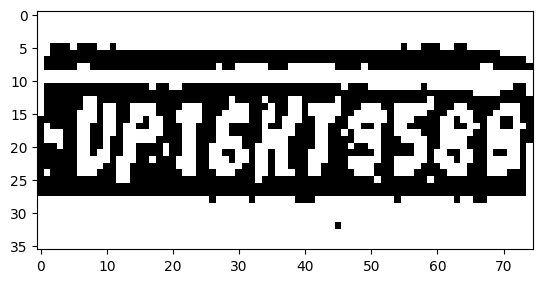

height =  90 width =  121
height =  285 width =  289
[137.25323486328125, 170.3763427734375, 214.499267578125, 207.5888214111328, 0.9108636379241943, 0.0] track_id: 237.0
-0.22679884805388587
height =  93 width =  126
height =  290 width =  300
[143.8713836669922, 174.3933868408203, 223.82916259765625, 213.08059692382812, 0.9075621962547302, 0.0] track_id: 237.0
-0.19982864507299022
height =  94 width =  130
height =  301 width =  311
[150.04200744628906, 182.11300659179688, 233.05715942382812, 223.98097229003906, 0.9075762033462524, 0.0] track_id: 237.0
-0.20401797959254858
height =  96 width =  132
height =  309 width =  321
[157.57379150390625, 190.85073852539062, 244.52699279785156, 232.2758026123047, 0.916683554649353, 0.0] track_id: 237.0
-0.20831556258942585
height =  97 width =  130
[73.13558197021484, 59.01398468017578, 99.61528015136719, 73.0110092163086, 0.6755552887916565, 0.0] track_id: 238.0
-0.2401710078601731
height =  322 width =  337
[166.8211212158203, 200.4087677001

[76.54141998291016, 60.29982376098633, 103.60657501220703, 74.91272735595703, 0.3006384074687958, 0.0] track_id: 238.0
-0.23783592745745075


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  335 width =  353
[177.34710693359375, 210.93881225585938, 272.6023864746094, 256.08538818359375, 0.9087427258491516, 0.0] track_id: 237.0
-0.20431586460012127
height =  101 width =  131
[73.895263671875, 59.718528747558594, 101.74678802490234, 74.95613098144531, 0.25703367590904236, 0.0] track_id: 238.0
-0.24925214138521365
height =  350 width =  372
[189.2550506591797, 223.40806579589844, 289.2068786621094, 272.4050598144531, 0.9145164489746094, 0.0] track_id: 237.0
-0.20859957280615768
height =  102 width =  121
height =  368 width =  388
[199.1458740234375, 236.7793731689453, 303.84478759765625, 287.1697998046875, 0.9159398078918457, 0.0] track_id: 237.0
-0.20679125651321525
height =  101 width =  118
height =  389 width =  410


[213.51284790039062, 251.18502807617188, 323.76165771484375, 303.14306640625, 0.913139283657074, 0.0] track_id: 237.0
-0.194863919688872


['UP168T9588']
license before check UP168T9588
hello
License Plate Number with contours :  None , Score :  None
-0.18998828791871572
['UPICHT9588']
license before check UPICHT9588
license after check UPICHT9588
License Plate Number :  UP1CHT9588 , Score :  0.3040437448574873


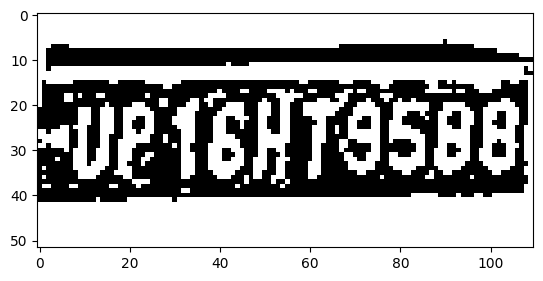

height =  103 width =  118
height =  406 width =  433
[227.10238647460938, 264.1352233886719, 345.0616149902344, 320.4410095214844, 0.9112836122512817, 0.0] track_id: 237.0
-0.20749622643520266
height =  107 width =  119
height =  425 width =  458
[244.97459411621094, 281.8974609375, 367.6528625488281, 341.70159912109375, 0.9115498065948486, 0.0] track_id: 237.0
-0.2059008225558759
height =  109 width =  118
height =  441 width =  488
[266.3426818847656, 293.53173828125, 397.3087158203125, 357.493408203125, 0.9113509058952332, 0.0] track_id: 237.0
-0.20668321848424925
height =  110 width =  121
height =  471 width =  523
[290.5840148925781, 314.60479736328125, 430.1694641113281, 380.5804443359375, 0.9110488295555115, 0.0] track_id: 237.0
-0.20713099635648255
height =  110 width =  125
height =  498 width =  561
[317.6332702636719, 338.9363708496094, 464.5933837890625, 407.1021423339844, 0.9057329893112183, 0.0] track_id: 237.0
-0.20902294280626463
height =  112 width =  129
height =  5

[391.9167175292969, 397.71844482421875, 562.7457275390625, 478.0932312011719, 0.917955219745636, 0.0] track_id: 237.0
-0.2104302033464736


[]
License Plate Number with contours :  None , Score :  None
-0.19509141646207634
['Up16KT9588']
license before check Up16KT9588
license after check UP16KT9588
License Plate Number :  UP16KT9588 , Score :  0.30606243457843163


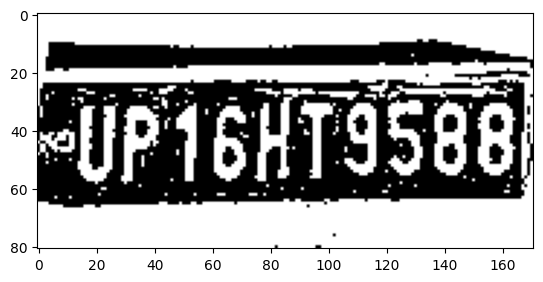

height =  115 width =  129
height =  618 width =  715


[440.8216552734375, 435.0357666015625, 622.8494262695312, 523.9359130859375, 0.9019841551780701, 0.0] track_id: 237.0
-0.18873776752013358


[]
License Plate Number with contours :  None , Score :  None
-0.20836003272769868
['UPIGHT9588']
license before check UPIGHT9588
license after check UPIGHT9588
License Plate Number :  UP1GHT9588 , Score :  0.6988395764321838


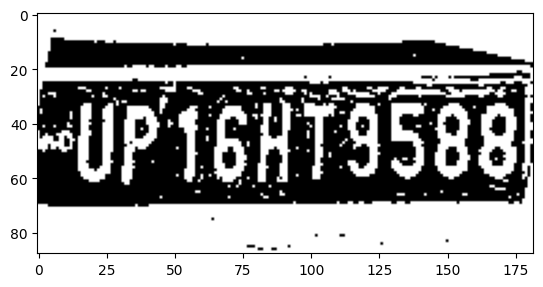

height =  116 width =  128
height =  668 width =  781


[497.78314208984375, 477.7325744628906, 693.749755859375, 574.5422973632812, 0.9081605076789856, 0.0] track_id: 237.0
-0.22679884805388587


[]
License Plate Number with contours :  None , Score :  None
-0.22887267336789618
['UP16hT9588']
license before check UP16hT9588
license after check UP16HT9588
License Plate Number :  UP16HT9588 , Score :  0.37232873651186693


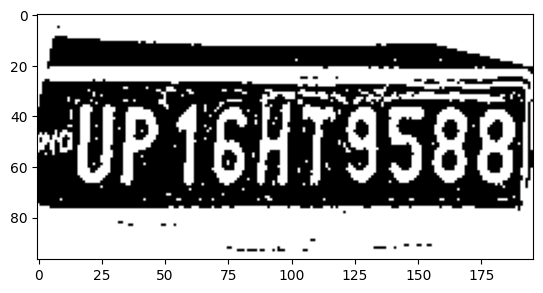

height =  122 width =  133
height =  726 width =  856


[566.9924926757812, 528.5167236328125, 776.6566162109375, 635.1754150390625, 0.9148497581481934, 0.0] track_id: 237.0
-0.24149839875592433


[]
License Plate Number with contours :  None , Score :  None
-0.2275182723901997
['UP16h79588']
license before check UP16h79588
hello
License Plate Number :  None , Score :  None
height =  126 width =  139
height =  801 width =  945


[654.529296875, 589.7523803710938, 874.14306640625, 710.3054809570312, 0.9180923700332642, 0.0] track_id: 237.0
-0.2766199293418931
['UP16ht9588']
license before check UP16ht9588
license after check UP16HT9588
License Plate Number with contours :  UP16HT9588 , Score :  0.5424411364316629


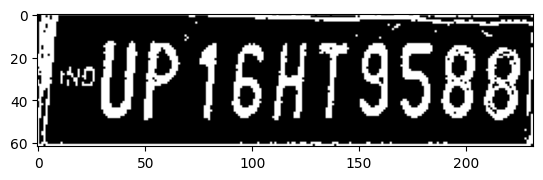

height =  133 width =  166
height =  891 width =  1046


[766.9239501953125, 660.2111206054688, 995.6130981445312, 795.3296508789062, 0.9256599545478821, 0.0] track_id: 237.0
-0.29611514587496474


[]
License Plate Number with contours :  None , Score :  None
-0.33237230970380416
['UP16HT9588']
license before check UP16HT9588
license after check UP16HT9588
License Plate Number :  UP16HT9588 , Score :  0.5573647374336399


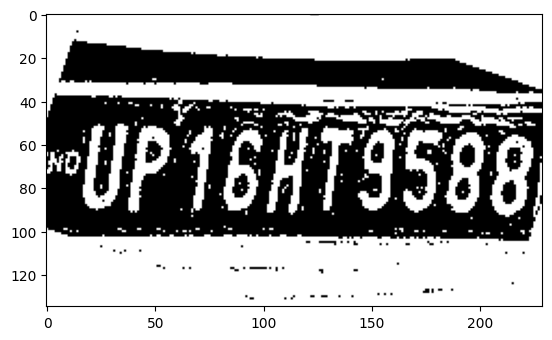

height =  134 width =  149
height =  995 width =  1164


[901.3872680664062, 741.2872924804688, 1132.732666015625, 893.7119140625, 0.9052892923355103, 0.0] track_id: 237.0
-0.3491069122041248


[]
License Plate Number with contours :  None , Score :  None
-0.38500578431942517
['UP16k79588']
license before check UP16k79588
hello
License Plate Number :  None , Score :  None
height =  138 width =  143
height =  1118 width =  1291


[1057.531005859375, 828.7100830078125, 1283.75341796875, 1015.1209106445312, 0.9153605699539185, 0.0] track_id: 237.0
-0.4899573262537283


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.4541240874071933
['UP16179588']
license before check UP16179588
hello
License Plate Number :  None , Score :  None
height =  137 width =  143
height =  1238 width =  1423


[1230.2117919921875, 969.26513671875, 1421.46875, 1158.7025146484375, 0.7284120917320251, 0.0] track_id: 237.0
-0.5601213841833931


['th']
license before check th
hello
License Plate Number with contours :  None , Score :  None
-0.6103141027979991
['Up164195']
license before check Up164195
hello
License Plate Number :  None , Score :  None
height =  143 width =  148
[69.23843383789062, 87.857666015625, 107.09243774414062, 105.68889617919922, 0.36320847272872925, 0.0] track_id: 238.0
-0.2247111684146427
height =  1283 width =  1567
height =  146 width =  148
height =  1283 width =  1700
height =  153 width =  152
[71.31195831298828, 95.15938568115234, 110.31932830810547, 112.93254089355469, 0.5016668438911438, 0.0] track_id: 238.0
-0.2247111684146427
height =  1267 width =  1826
height =  154 width =  155
[72.62403869628906, 94.23526763916016, 112.19752502441406, 112.79882049560547, 0.636191725730896, 0.0] track_id: 238.0
-0.22785704871709972
height =  1240 width =  1838
height =  152 width =  156
height =  1230 width =  1785
height =  152 width =  164


[77.10028076171875, 95.14179992675781, 118.43338775634766, 112.97245025634766, 0.5177072882652283, 0.0] track_id: 238.0
-0.26211984126547283


[]
License Plate Number with contours :  None , Score :  None
-0.21293834957939714
[]
License Plate Number :  None , Score :  None
height =  1155 width =  1693
height =  153 width =  159
[70.08218383789062, 94.01683044433594, 112.8930892944336, 112.92777252197266, 0.6557675004005432, 0.0] track_id: 238.0
-0.20749622643520266
height =  1094 width =  1575
height =  154 width =  161
[69.43135833740234, 92.39076232910156, 113.04158020019531, 112.61381530761719, 0.5358706116676331, 0.0] track_id: 238.0
-0.2405342479459046
height =  116 width =  102
height =  160 width =  163
[71.08621215820312, 98.20691680908203, 114.94983673095703, 116.73954010009766, 0.6499674916267395, 0.0] track_id: 238.0
-0.21866894587394195
height =  119 width =  101
height =  888 width =  1240
height =  162 width =  167
[73.27182006835938, 99.47543334960938, 118.20719146728516, 118.48233795166016, 0.531201183795929, 0.0] track_id: 238.0
-0.24497866312686414
height =  752 width =  958
height =  164 width =  168
[72.55

[75.69546508789062, 104.73442077636719, 124.39820098876953, 128.40835571289062, 0.8486830592155457, 0.0] track_id: 238.0
-0.20749622643520266


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  130 width =  129
height =  181 width =  182
[76.6466293334961, 110.32103729248047, 126.7299575805664, 132.05581665039062, 0.7888267636299133, 0.0] track_id: 238.0
-0.18998828791871572
height =  132 width =  127
height =  187 width =  188


[80.36405944824219, 114.07909393310547, 131.20733642578125, 137.15249633789062, 0.8671030402183533, 0.0] track_id: 238.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.20963984587421253
[]
License Plate Number :  None , Score :  None
height =  189 width =  195


[83.98661041259766, 115.4932632446289, 136.96035766601562, 139.73898315429688, 0.9025404453277588, 0.0] track_id: 238.0
-0.22964244228513467


[]
License Plate Number with contours :  None , Score :  None
-0.23974310887045658
[]
License Plate Number :  None , Score :  None
height =  195 width =  200


[88.35942840576172, 120.32676696777344, 142.4505615234375, 145.17718505859375, 0.8901553750038147, 0.0] track_id: 238.0
-0.21501488174750655


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  199 width =  202
[88.8891830444336, 122.04764556884766, 144.07162475585938, 147.98143005371094, 0.8961813449859619, 0.0] track_id: 238.0
-0.22423475110909616
height =  204 width =  206


[89.35559844970703, 125.30535125732422, 146.15188598632812, 151.866455078125, 0.8958659172058105, 0.0] track_id: 238.0
-0.21182754748141747


[]
License Plate Number with contours :  None , Score :  None
-0.23860932250820097
[]
License Plate Number :  None , Score :  None
height =  149 width =  147
height =  204 width =  209


[89.94664001464844, 123.88013458251953, 148.37840270996094, 150.56570434570312, 0.8687887191772461, 0.0] track_id: 238.0
-0.22923193327699534


[]
License Plate Number with contours :  None , Score :  None
-0.20095426368809702
[]
License Plate Number :  None , Score :  None
height =  147 width =  151
height =  209 width =  213


[93.04537200927734, 126.9718246459961, 152.2633819580078, 155.50006103515625, 0.9034200310707092, 0.0] track_id: 238.0
-0.22290023232837577


[]
License Plate Number with contours :  None , Score :  None
-0.22266094063636496
[]
License Plate Number :  None , Score :  None
height =  146 width =  144
height =  217 width =  219


[94.72164916992188, 132.0476837158203, 156.25054931640625, 160.98829650878906, 0.9035451412200928, 0.0] track_id: 238.0
-0.21991427524262383


[]
License Plate Number with contours :  None , Score :  None
-0.2168736156664083
[]
License Plate Number :  None , Score :  None
height =  155 width =  154
height =  223 width =  226


[98.0622787475586, 136.1248321533203, 161.19984436035156, 165.52395629882812, 0.9013898372650146, 0.0] track_id: 238.0
-0.2157661964070423


[]
License Plate Number with contours :  None , Score :  None
-0.22810262827994277
[]
License Plate Number :  None , Score :  None
height =  162 width =  152
height =  230 width =  234


[101.4166030883789, 141.33251953125, 166.18907165527344, 171.26258850097656, 0.9055321216583252, 0.0] track_id: 238.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
[]
License Plate Number :  None , Score :  None
height =  159 width =  150
height =  234 width =  242


[107.33547973632812, 144.16293334960938, 173.958740234375, 174.73182678222656, 0.9070416688919067, 0.0] track_id: 238.0
-0.2135604334804882


[]
License Plate Number with contours :  None , Score :  None
-0.2168736156664083
[]
License Plate Number :  None , Score :  None
height =  156 width =  146
height =  241 width =  251


[111.81462860107422, 148.1728973388672, 180.63510131835938, 181.24990844726562, 0.9192385673522949, 0.0] track_id: 238.0
-0.21743741940294756


[]
License Plate Number with contours :  None , Score :  None
-0.21535769969773805
['0J945']
license before check 0J945
hello
License Plate Number :  None , Score :  None
height =  164 width =  145
height =  247 width =  258


[114.70161437988281, 151.9755401611328, 185.0747833251953, 186.3260498046875, 0.9264671802520752, 0.0] track_id: 238.0
-0.21501488174750655


[]
License Plate Number with contours :  None , Score :  None
-0.20902294280626463
['Fur701328']
license before check Fur701328
hello
License Plate Number :  None , Score :  None
height =  168 width =  148
height =  253 width =  263


[116.1956787109375, 154.59686279296875, 188.9561767578125, 190.28111267089844, 0.9208700060844421, 0.0] track_id: 238.0
-0.22347660114063303


['3785']
license before check 3785
hello
License Plate Number with contours :  None , Score :  None
-0.225601243836024
['Vi0JHIS']
license before check Vi0JHIS
hello
License Plate Number :  None , Score :  None
height =  177 width =  151
height =  259 width =  269


[118.99048614501953, 157.32427978515625, 193.82252502441406, 194.4949951171875, 0.9152016043663025, 0.0] track_id: 238.0
-0.20963984587421253


[]
License Plate Number with contours :  None , Score :  None
-0.2171113147349052
['vP', '03345']
license before check vP03345
hello
License Plate Number :  None , Score :  None
height =  179 width =  152
height =  266 width =  278


[122.94230651855469, 165.4823455810547, 200.9800567626953, 203.7029571533203, 0.9205910563468933, 0.0] track_id: 238.0
-0.22810262827994277


['07227']
license before check 07227
hello
License Plate Number with contours :  None , Score :  None
-0.2157661964070423
['AvF703925']
license before check AvF703925
hello
License Plate Number :  None , Score :  None
height =  189 width =  155
height =  280 width =  289


[128.80422973632812, 173.26785278320312, 209.32223510742188, 212.87672424316406, 0.9232817888259888, 0.0] track_id: 238.0
-0.20707267711703156


['03225']
license before check 03225
hello
License Plate Number with contours :  None , Score :  None
-0.225601243836024
['UP', '103345']
license before check UP103345
hello
License Plate Number :  None , Score :  None
height =  291 width =  298


[131.75755310058594, 181.07603454589844, 215.50372314453125, 221.20046997070312, 0.9214929342269897, 0.0] track_id: 238.0
-0.22768931976865586


['03225']
license before check 03225
hello
License Plate Number with contours :  None , Score :  None
-0.225601243836024
['PUP', '703925']
license before check PUP703925
hello
License Plate Number :  None , Score :  None
height =  189 width =  159
height =  301 width =  307


[136.31103515625, 188.43678283691406, 222.863037109375, 228.71678161621094, 0.9152254462242126, 0.0] track_id: 238.0
-0.21032587366505767


['3315']
license before check 3315
hello
License Plate Number with contours :  None , Score :  None
-0.2093853929534955
['enP', '703925']
license before check enP703925
hello
License Plate Number :  None , Score :  None
height =  205 width =  158
height =  313 width =  319


[142.6492156982422, 197.31655883789062, 232.20010375976562, 239.82643127441406, 0.9087012410163879, 0.0] track_id: 238.0
-0.22679884805388587


[]
License Plate Number with contours :  None , Score :  None
-0.2086817623350266
['FupJ03925']
license before check FupJ03925
hello
License Plate Number :  None , Score :  None
height =  214 width =  161
height =  325 width =  331


[149.24310302734375, 207.1631622314453, 242.4126739501953, 250.473876953125, 0.9159842133522034, 0.0] track_id: 238.0
-0.20464180982977792


['039L5']
license before check 039L5
hello
License Plate Number with contours :  None , Score :  None
-0.21264492235777152
['FuP1703925']
license before check FuP1703925
hello
License Plate Number :  None , Score :  None
height =  220 width =  163
height =  333 width =  344


[156.25694274902344, 217.7825927734375, 253.47544860839844, 262.2988586425781, 0.9237008690834045, 0.0] track_id: 238.0
-0.20254131203030573


['7039L51']
license before check 7039L51
hello
License Plate Number with contours :  None , Score :  None
-0.21406068356382152
['FUP1703925']
license before check FUP1703925
hello
License Plate Number :  None , Score :  None
height =  224 width =  168
height =  346 width =  358


[163.6644744873047, 227.260498046875, 264.2942810058594, 273.2529296875, 0.9102728962898254, 0.0] track_id: 238.0
-0.20947956377909527


['703925']
license before check 703925
hello
License Plate Number with contours :  None , Score :  None
-0.2080561367910258
['EvP17033L5']
license before check EvP17033L5
hello
License Plate Number :  None , Score :  None
height =  228 width =  169
height =  357 width =  375


[172.9251708984375, 238.71942138671875, 277.0537414550781, 285.7998352050781, 0.9204917550086975, 0.0] track_id: 238.0
-0.21109333322274654


['7039251']
license before check 7039251
hello
License Plate Number with contours :  None , Score :  None
-0.22402364703792346
['FUP703945']
license before check FUP703945
hello
License Plate Number :  None , Score :  None
height =  228 width =  172
height =  373 width =  391


[183.29530334472656, 249.95681762695312, 291.82025146484375, 300.0603332519531, 0.9264363646507263, 0.0] track_id: 238.0
-0.22494126505117096


['039L5']
license before check 039L5
hello
License Plate Number with contours :  None , Score :  None
-0.22290023232837577
['FUp1703925']
license before check FUp1703925
hello
License Plate Number :  None , Score :  None
height =  236 width =  181
height =  388 width =  410


[192.89956665039062, 262.2878112792969, 306.98162841796875, 314.646484375, 0.9249114990234375, 0.0] track_id: 238.0
-0.20374468088385697


['703945']
license before check 703945
hello
License Plate Number with contours :  None , Score :  None
-0.20464180982977792
['EUP1703975', 'L7o']
license before check EUP1703975L7o
hello
License Plate Number :  None , Score :  None
height =  236 width =  188
height =  404 width =  432


[207.03854370117188, 275.8271789550781, 327.3778991699219, 330.86785888671875, 0.9220527410507202, 0.0] track_id: 238.0
-0.22679884805388587


['0395']
license before check 0395
hello
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
['EUP1J03925']
license before check EUP1J03925
hello
License Plate Number :  None , Score :  None
height =  240 width =  199
height =  419 width =  457
[223.3258819580078, 286.9732360839844, 349.2406005859375, 343.884765625, 0.9284331798553467, 0.0] track_id: 238.0
-0.20679125651321525
height =  238 width =  207
height =  439 width =  485


[240.8848419189453, 302.25390625, 373.69195556640625, 361.47503662109375, 0.925544023513794, 0.0] track_id: 238.0
-0.207889927202263


['7039L5']
license before check 7039L5
hello
License Plate Number with contours :  None , Score :  None
-0.21373882969659588
['PUP', '703945']
license before check PUP703945
hello
License Plate Number :  None , Score :  None
height =  245 width =  212
height =  462 width =  515


[261.9561767578125, 319.3482666015625, 401.29217529296875, 382.4893798828125, 0.919026255607605, 0.0] track_id: 238.0
-0.20749622643520266
[0.0, 125.38943481445312, 9.28191089630127, 147.54969787597656, 0.25925761461257935, 0.0] track_id: 238.0
[]
License Plate Number :  None , Score :  None
height =  253 width =  220
height =  487 width =  544
[280.84051513671875, 339.9397888183594, 427.8760070800781, 407.39691162109375, 0.9218583703041077, 0.0] track_id: 238.0
-0.21109333322274654
height =  257 width =  236
height =  519 width =  583
[307.7533874511719, 360.7807312011719, 464.4418640136719, 433.99176025390625, 0.9226493835449219, 0.0] track_id: 238.0
-0.21018258666216955
height =  263 width =  233
height =  551 width =  624


[338.244873046875, 388.64495849609375, 504.4628601074219, 464.68310546875, 0.9184375405311584, 0.0] track_id: 238.0
-0.21026034715968


[]
License Plate Number with contours :  None , Score :  None
-0.2093853929534955
['FUP17039L5']
license before check FUP17039L5
hello
License Plate Number :  None , Score :  None
height =  270 width =  237
height =  588 width =  667
[372.7287292480469, 417.5586853027344, 548.3648681640625, 498.3249816894531, 0.9248338341712952, 0.0] track_id: 238.0
-0.21066377998456154
height =  280 width =  251
height =  634 width =  719


[412.6490173339844, 455.012451171875, 600.0963134765625, 543.3383178710938, 0.9315995573997498, 0.0] track_id: 238.0
-0.22729561900159553
['UP17039451']
license before check UP17039451
license after check UP17039451
License Plate Number with contours :  UP17OJ9451 , Score :  0.3407199949847133


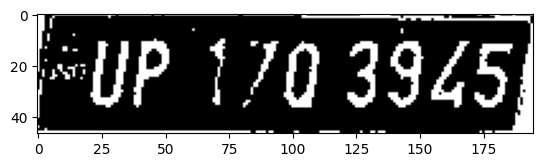

height =  290 width =  263
height =  686 width =  776


[459.6328125, 502.5600891113281, 658.9160766601562, 597.985107421875, 0.9155085682868958, 0.0] track_id: 238.0
-0.22679884805388587
['UP1703945']
license before check UP1703945
license after check UP1703945
License Plate Number with contours :  UP17O3945 , Score :  0.5132959381309957


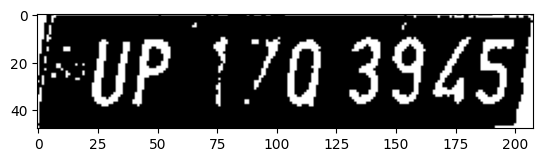

height =  300 width =  269
height =  743 width =  843


[518.835205078125, 550.18212890625, 729.956787109375, 653.26318359375, 0.9163700342178345, 0.0] track_id: 238.0
-0.24393263840377064


[]
License Plate Number with contours :  None , Score :  None
-0.2422723097884356
['UP1703945']
license before check UP1703945
license after check UP1703945
License Plate Number :  UP17O3945 , Score :  0.737539555892984


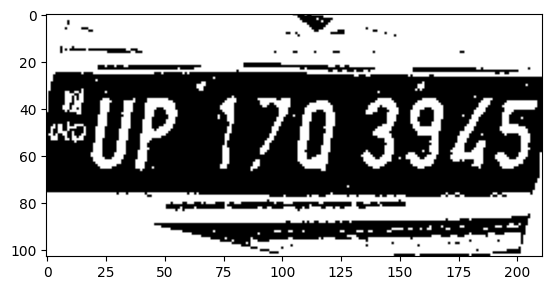

height =  306 width =  285
height =  816 width =  921


[589.1808471679688, 609.77783203125, 813.774169921875, 724.126953125, 0.9257345199584961, 0.0] track_id: 238.0
-0.27891962172791485


[]
License Plate Number with contours :  None , Score :  None
-0.27917994046787675
['UP1703945']
license before check UP1703945
license after check UP1703945
License Plate Number :  UP17O3945 , Score :  0.844985532498752


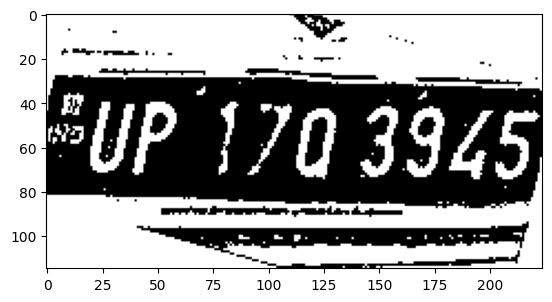

height =  314 width =  292
height =  887 width =  1004


[674.5219116210938, 665.3279418945312, 910.659912109375, 792.2664794921875, 0.9263637065887451, 0.0] track_id: 238.0
-0.2810605575670801


[]
License Plate Number with contours :  None , Score :  None
-0.267259098155911
['UP1703945']
license before check UP1703945
license after check UP1703945
License Plate Number :  UP17O3945 , Score :  0.503246823991094


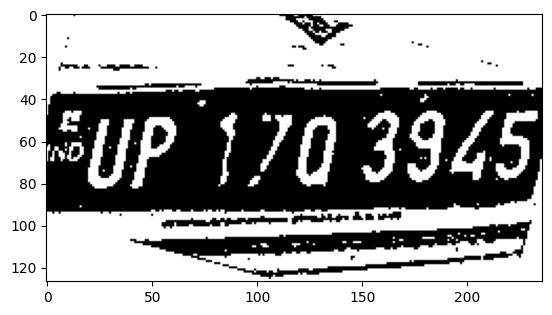

height =  323 width =  314
height =  88 width =  106
height =  972 width =  1102


[779.531982421875, 736.0119018554688, 1021.268798828125, 873.9552612304688, 0.9188463687896729, 0.0] track_id: 238.0
-0.31348627973699106


['FUP17039451']
license before check FUP17039451
hello
License Plate Number with contours :  None , Score :  None
-0.38588266939807375
['UP1703945']
license before check UP1703945
license after check UP1703945
License Plate Number :  UP17O3945 , Score :  0.4315392161622671


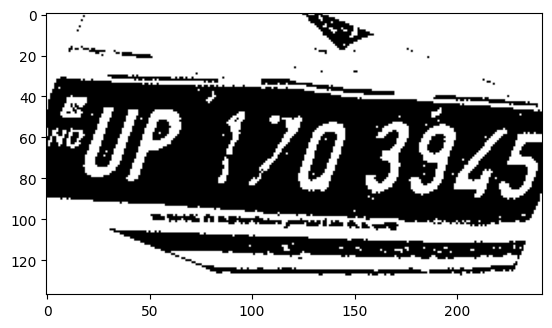

height =  334 width =  335
height =  88 width =  107
height =  1073 width =  1206


[898.4192504882812, 814.70361328125, 1147.394775390625, 972.10205078125, 0.9171819090843201, 0.0] track_id: 238.0
-0.3818118593994475


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.38450955829000477
['UP1703945']
license before check UP1703945
license after check UP1703945
License Plate Number :  UP17O3945 , Score :  0.7121133588156702


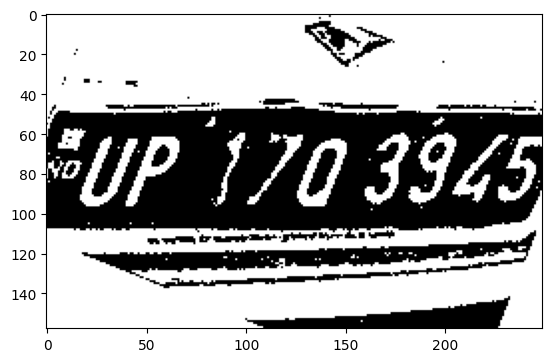

height =  344 width =  350
height =  89 width =  109
height =  1183 width =  1322


[1040.003662109375, 894.8194580078125, 1291.7637939453125, 1086.3331298828125, 0.8624793887138367, 0.0] track_id: 238.0
-0.47145995006090724


[]
License Plate Number with contours :  None , Score :  None
-0.4704042629365914
['UP1703945']
license before check UP1703945
license after check UP1703945
License Plate Number :  UP17O3945 , Score :  0.835700450262968


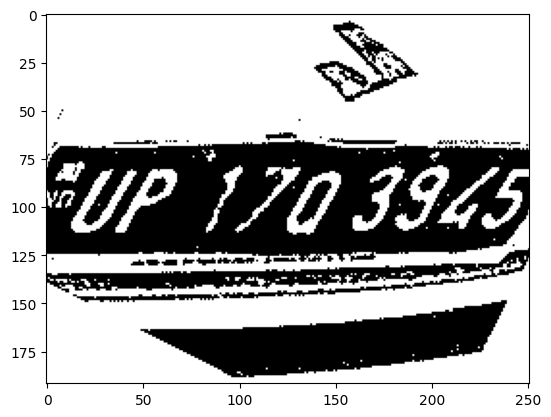

height =  361 width =  369
height =  89 width =  110
height =  1261 width =  1447
height =  376 width =  386
[201.13954162597656, 253.71836853027344, 259.3459777832031, 288.0097351074219, 0.5463061332702637, 0.0] track_id: 239.0
-0.18998828791871572
height =  89 width =  112
height =  1275 width =  1585
height =  387 width =  406


[214.99830627441406, 260.59912109375, 303.716796875, 299.50140380859375, 0.783560037612915, 0.0] track_id: 239.0
-0.21109333322274654


[]
License Plate Number with contours :  None , Score :  None
-0.22581168154335537
['UP140C2C']
license before check UP140C2C
hello
License Plate Number :  None , Score :  None
height =  89 width =  111
height =  1274 width =  1717
[24.33550262451172, 128.0323486328125, 139.71034240722656, 171.99710083007812, 0.3905991017818451, 0.0] track_id: 238.0
-0.22377466372495083
height =  393 width =  428
[227.92913818359375, 261.90362548828125, 339.7770080566406, 305.64404296875, 0.8375596404075623, 0.0] track_id: 239.0
0.11832578250553305
height =  89 width =  111
height =  1284 width =  1852


[9.326102256774902, 148.5416259765625, 141.54591369628906, 194.74244689941406, 0.8714859485626221, 0.0] track_id: 238.0
-0.22527677921405528
['EiP140C2070']
license before check EiP140C2070
hello
License Plate Number :  None , Score :  None
height =  411 width =  453
[241.79690551757812, 271.01495361328125, 360.9003601074219, 319.7662353515625, 0.9062769412994385, 0.0] track_id: 239.0
-0.22868682567222423
height =  88 width =  113
height =  1279 width =  1889


[0.0, 157.89419555664062, 122.61768341064453, 212.92747497558594, 0.5936597585678101, 0.0] track_id: 238.0
-0.206992194219821
['UP140C2070']
license before check UP140C2070
license after check UP140C2070
License Plate Number :  UP14OC2070 , Score :  0.6863075114959091


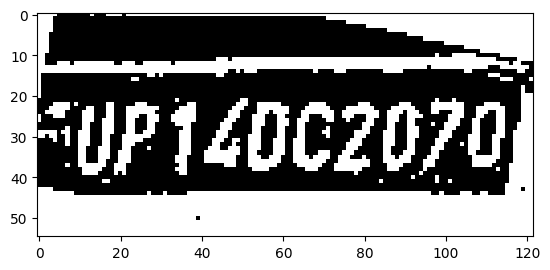

height =  426 width =  480
[255.4362030029297, 285.0508728027344, 381.4555969238281, 336.4108581542969, 0.9086737632751465, 0.0] track_id: 239.0
-0.18468438008645455
height =  86 width =  111
height =  1284 width =  1891


[0.0, 179.0799560546875, 101.61856079101562, 227.5303192138672, 0.7721036672592163, 0.0] track_id: 238.0
-0.20749622643520266
['140C20ZO']
license before check 140C20ZO
hello
License Plate Number :  None , Score :  None
height =  448 width =  511
[274.5190734863281, 298.30865478515625, 409.2723693847656, 352.6568908691406, 0.9020972847938538, 0.0] track_id: 239.0
-0.21057195683620386
[495.60699462890625, 209.1650848388672, 511.0, 312.811279296875, 0.36436331272125244, 0.0] track_id: 239.0
1.4382447944982226
height =  86 width =  110
height =  1202 width =  1842


[0.17316904664039612, 114.8201904296875, 82.11711883544922, 166.75611877441406, 0.7985563278198242, 0.0] track_id: 238.0
-0.21018258666216955
['0C2O7O']
license before check 0C2O7O
hello
License Plate Number :  None , Score :  None
height =  474 width =  544


[296.0240478515625, 318.01641845703125, 438.5638732910156, 375.8937072753906, 0.915894091129303, 0.0] track_id: 239.0
-0.22252993054933773
['UPILDC207O']
license before check UPILDC207O
license after check UPILDC207O
License Plate Number with contours :  UP1LDC2070 , Score :  0.41919940066413097


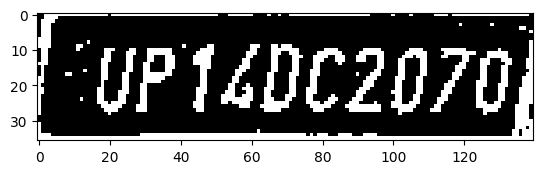

height =  85 width =  107
height =  1127 width =  1747


[0.0, 35.60173797607422, 30.60280418395996, 117.7091064453125, 0.620279848575592, 0.0] track_id: 238.0
1.519992622736675
[]
License Plate Number :  None , Score :  None
height =  496 width =  582


[322.7304992675781, 334.8587646484375, 471.356201171875, 395.66131591796875, 0.9182378649711609, 0.0] track_id: 239.0
-0.22601759821283154


['LDC207O']
license before check LDC207O
hello
License Plate Number with contours :  None , Score :  None
-0.22244726542594168
['Fup1LDC2O7OE']
license before check Fup1LDC2O7OE
hello
License Plate Number :  None , Score :  None
height =  84 width =  107
height =  1067 width =  1637
height =  522 width =  618
[349.87359619140625, 353.12664794921875, 506.1650390625, 418.8323974609375, 0.9095870852470398, 0.0] track_id: 239.0
-0.2148154004016586
height =  86 width =  107
height =  557 width =  661
[382.52294921875, 377.8070983886719, 548.2655029296875, 447.3627014160156, 0.9127191305160522, 0.0] track_id: 239.0
-0.21535769969773805
height =  85 width =  109
height =  595 width =  709
[420.29620361328125, 409.1658935546875, 595.4664306640625, 482.6836242675781, 0.9094641208648682, 0.0] track_id: 239.0
-0.2063238940297175
height =  84 width =  109
height =  629 width =  762
[462.1560363769531, 436.12982177734375, 649.1181640625, 515.7613525390625, 0.9100120067596436, 0.0] track_id: 239.0
-

[517.0471801757812, 468.445556640625, 714.50048828125, 559.2859497070312, 0.9138376116752625, 0.0] track_id: 239.0
-0.24111767845146836


['1']
license before check 1
hello
License Plate Number with contours :  None , Score :  None
-0.22411212695275184
['FUP1LDC2O7O']
license before check FUP1LDC2O7O
hello
License Plate Number :  None , Score :  None
height =  84 width =  109
height =  724 width =  888
[580.9827880859375, 514.2993774414062, 787.0119018554688, 611.9273681640625, 0.9188501834869385, 0.0] track_id: 239.0
-0.24497866312686414
height =  85 width =  107
height =  789 width =  962


[656.8297729492188, 568.5178833007812, 869.1862182617188, 676.4523315429688, 0.9181121587753296, 0.0] track_id: 239.0
-0.1941749590686425


['0']
license before check 0
hello
License Plate Number with contours :  None , Score :  None
-0.25933174440068485
['F2UP14dC2070']
license before check F2UP14dC2070
hello
License Plate Number :  None , Score :  None
height =  88 width =  109
height =  854 width =  1046


[745.4425048828125, 621.6134033203125, 965.9620361328125, 738.2957763671875, 0.9188695549964905, 0.0] track_id: 239.0
-0.22827377323805273


['D']
license before check D
hello
License Plate Number with contours :  None , Score :  None
-0.3462277740722243
['UP1LOC2O7O']
license before check UP1LOC2O7O
license after check UP1LOC2O7O
License Plate Number :  UP1LOC2070 , Score :  0.22803641011743975


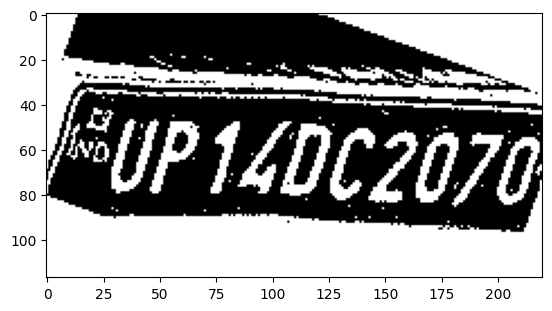

height =  931 width =  1137


[857.9494018554688, 687.34912109375, 1076.735107421875, 824.1636352539062, 0.9213513135910034, 0.0] track_id: 239.0
-0.349484524690076


['D']
license before check D
hello
License Plate Number with contours :  None , Score :  None
-0.36397895650964407
['KUP1ZDC207O']
license before check KUP1ZDC207O
hello
License Plate Number :  None , Score :  None
height =  86 width =  108
height =  1025 width =  1239


[979.2947998046875, 753.247314453125, 1202.4000244140625, 915.5385131835938, 0.9183043241500854, 0.0] track_id: 239.0
-0.41704924198848525


['D']
license before check D
hello
License Plate Number with contours :  None , Score :  None
-0.4186681821910052
['RBUP1ZDC2O70']
license before check RBUP1ZDC2O70
hello
License Plate Number :  None , Score :  None
height =  86 width =  108
height =  1131 width =  1347
[1119.3194580078125, 831.6168212890625, 1334.1563720703125, 1027.5498046875, 0.9067079424858093, 0.0] track_id: 239.0
-0.5240721827749459
height =  86 width =  106
height =  1251 width =  1465
height =  85 width =  107
height =  1329 width =  1601
height =  86 width =  107
height =  1359 width =  1725
height =  89 width =  106
height =  1351 width =  1846
height =  92 width =  106
height =  1340 width =  1872
height =  90 width =  107
height =  1318 width =  1811
height =  88 width =  107
height =  1290 width =  1743
height =  87 width =  108
height =  1256 width =  1655
height =  1225 width =  1549
height =  1179 width =  1509
height =  1173 width =  1419
height =  1166 width =  1412
height =  1127 width =  1267
height

[81.37959289550781, 112.31547546386719, 130.44711303710938, 139.13006591796875, 0.6816006898880005, 0.0] track_id: 243.0
-0.24175286786424297


[]
License Plate Number with contours :  None , Score :  None
-0.22347660114063303
[]
License Plate Number :  None , Score :  None
height =  187 width =  189
[82.15744018554688, 112.01799774169922, 132.2784423828125, 139.226806640625, 0.4305276870727539, 0.0] track_id: 243.0
-0.2624593998262764
height =  187 width =  192


[83.0923843383789, 111.34783172607422, 134.79150390625, 140.73570251464844, 0.6325533986091614, 0.0] track_id: 243.0
-0.24111767845146836


[]
License Plate Number with contours :  None , Score :  None
-0.2347226124851971
[]
License Plate Number :  None , Score :  None
height =  189 width =  198
height =  193 width =  203


[86.20063018798828, 115.3428726196289, 141.35459899902344, 144.22454833984375, 0.8103814721107483, 0.0] track_id: 243.0
-0.22503828649260516


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  200 width =  205


[86.63102722167969, 118.30525970458984, 143.7351837158203, 149.74522399902344, 0.7722816467285156, 0.0] track_id: 243.0
-0.23923159996366056


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
[]
License Plate Number :  None , Score :  None
height =  205 width =  209


[89.15927124023438, 123.69082641601562, 146.99012756347656, 153.8271026611328, 0.8468237519264221, 0.0] track_id: 243.0
-0.23040243605886154


['PKja']
license before check PKja
hello
License Plate Number with contours :  None , Score :  None
-0.2405342479459046
[]
License Plate Number :  None , Score :  None
height =  214 width =  214
[90.24263763427734, 128.71286010742188, 149.78524780273438, 159.3769073486328, 0.8919556140899658, 0.0] track_id: 243.0
-0.24175286786424297
height =  218 width =  220
[91.74220275878906, 133.3961181640625, 153.33123779296875, 165.5378875732422, 0.8968892693519592, 0.0] track_id: 243.0
-0.2425514834271907
height =  229 width =  228


[96.12915802001953, 140.17311096191406, 158.81832885742188, 171.8636474609375, 0.9024502635002136, 0.0] track_id: 243.0
-0.24192056868440487


['VIETDJ5S']
license before check VIETDJ5S
hello
License Plate Number with contours :  None , Score :  None
-0.2168736156664083
[]
License Plate Number :  None , Score :  None
height =  235 width =  232
[95.85577392578125, 144.20053100585938, 161.3835906982422, 177.42193603515625, 0.9034488201141357, 0.0] track_id: 243.0
-0.2425514834271907
height =  239 width =  238
[97.83793640136719, 147.06251525878906, 165.4891815185547, 182.33192443847656, 0.8959019780158997, 0.0] track_id: 243.0
-0.24273651441777036
height =  247 width =  245
[99.7732162475586, 152.65631103515625, 169.51116943359375, 189.81085205078125, 0.9011877775192261, 0.0] track_id: 243.0
-0.2331798006468164
height =  257 width =  255


[103.9999008178711, 159.1477508544922, 176.76219177246094, 197.16456604003906, 0.8967700600624084, 0.0] track_id: 243.0
-0.22347660114063303


['WIEE42J58']
license before check WIEE42J58
hello
License Plate Number with contours :  None , Score :  None
-0.23441567572381078
['UP46812258']
license before check UP46812258
hello
License Plate Number :  None , Score :  None
height =  263 width =  262


[106.77521514892578, 164.9296112060547, 181.75473022460938, 202.1174774169922, 0.8987165689468384, 0.0] track_id: 243.0
-0.24233316665301483


['UPE012350']
license before check UPE012350
hello
License Plate Number with contours :  None , Score :  None
-0.23824475817874502
['FUP8E81T3SO']
license before check FUP8E81T3SO
hello
License Plate Number :  None , Score :  None
height =  271 width =  270


[109.52517700195312, 171.09889221191406, 187.03494262695312, 208.7819061279297, 0.9135348796844482, 0.0] track_id: 243.0
-0.24233316665301483


['U716613585']
license before check U716613585
hello
License Plate Number with contours :  None , Score :  None
-0.2287988453872256
['EUP6bILJSB']
license before check EUP6bILJSB
hello
License Plate Number :  None , Score :  None
height =  279 width =  278


[111.91114044189453, 178.87054443359375, 192.8719940185547, 217.59996032714844, 0.9098844528198242, 0.0] track_id: 243.0
-0.23255694180490905
['WF16B12J58']
license before check WF16B12J58
license after check WF16B12J58
License Plate Number with contours :  WF16BI2358 , Score :  0.19137625757416568


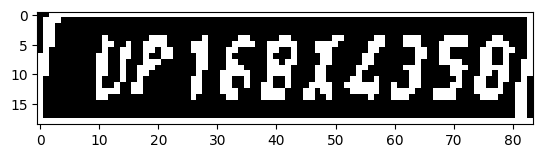

height =  294 width =  288


[116.37664031982422, 188.19796752929688, 200.6474151611328, 228.4325408935547, 0.9090462327003479, 0.0] track_id: 243.0
-0.21655030497608926


['76812358']
license before check 76812358
hello
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['VP168IL358']
license before check VP168IL358
hello
License Plate Number :  None , Score :  None
height =  307 width =  297


[118.8292007446289, 199.6111602783203, 205.98583984375, 241.69671630859375, 0.9010399580001831, 0.0] track_id: 243.0
-0.2401710078601731


['UPI68XLJS8']
license before check UPI68XLJS8
hello
License Plate Number with contours :  None , Score :  None
-0.24192056868440487
['CUP16812358']
license before check CUP16812358
hello
License Plate Number :  None , Score :  None
height =  319 width =  307


[122.70439147949219, 207.78831481933594, 213.7665252685547, 251.7690887451172, 0.8926426768302917, 0.0] track_id: 243.0
-0.22595921768864075


['UF168X43581']
license before check UF168X43581
hello
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
['UF16814358']
license before check UF16814358
hello
License Plate Number :  None , Score :  None
height =  329 width =  323


[132.2615966796875, 215.46192932128906, 225.97589111328125, 261.0141296386719, 0.9032143950462341, 0.0] track_id: 243.0
-0.22679884805388587
['UP16BXL358']
license before check UP16BXL358
license after check UP16BXL358
License Plate Number with contours :  UP16BX4358 , Score :  0.5781412230257452


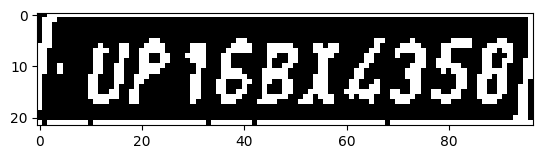

height =  348 width =  337


[138.61685180664062, 228.3341064453125, 236.49484252929688, 275.8222351074219, 0.9082355499267578, 0.0] track_id: 243.0
-0.22615243573280183


['UP168X2358']
license before check UP168X2358
hello
License Plate Number with contours :  None , Score :  None
-0.22527677921405528
['VP16814358']
license before check VP16814358
hello
License Plate Number :  None , Score :  None
height =  360 width =  350


[146.71107482910156, 241.35716247558594, 250.02029418945312, 292.3072509765625, 0.9051811695098877, 0.0] track_id: 243.0
-0.2295273542432904


['WP168XL3581']
license before check WP168XL3581
hello
License Plate Number with contours :  None , Score :  None
-0.22303096837155825
['EUP16BX4358']
license before check EUP16BX4358
hello
License Plate Number :  None , Score :  None
height =  378 width =  369


[156.35009765625, 255.85487365722656, 264.7674255371094, 307.1986389160156, 0.9033897519111633, 0.0] track_id: 243.0
-0.2279670718215078


['UP16BXL3581']
license before check UP16BXL3581
hello
License Plate Number with contours :  None , Score :  None
-0.22892499651560902
['FuP16BXL358']
license before check FuP16BXL358
hello
License Plate Number :  None , Score :  None
height =  395 width =  387


[165.5858917236328, 268.0910339355469, 279.429931640625, 322.6658630371094, 0.9075375199317932, 0.0] track_id: 243.0
-0.22679884805388587
['UP16BXL358']
license before check UP16BXL358
license after check UP16BXL358
License Plate Number with contours :  UP16BX4358 , Score :  0.16796358436372286


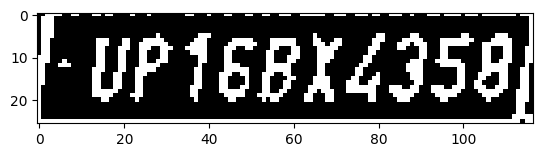

height =  415 width =  406


[174.9387664794922, 282.0741882324219, 294.3125, 339.0709533691406, 0.9114242792129517, 0.0] track_id: 243.0
-0.22923193327699534
['UP16BXL358']
license before check UP16BXL358
license after check UP16BXL358
License Plate Number with contours :  UP16BX4358 , Score :  0.6069544039654448


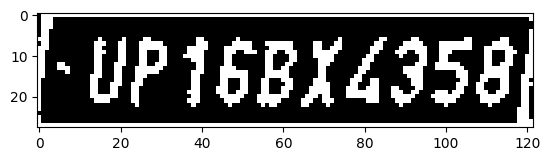

height =  426 width =  428


[187.84246826171875, 292.75335693359375, 313.4754638671875, 351.77685546875, 0.9111999869346619, 0.0] track_id: 243.0
-0.22679884805388587
['UP16BX4358']
license before check UP16BX4358
license after check UP16BX4358
License Plate Number with contours :  UP16BX4358 , Score :  0.6571065261389675


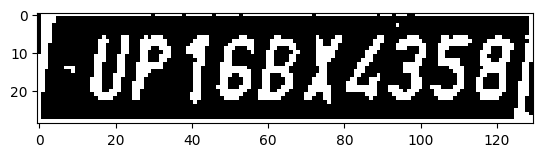

height =  446 width =  454


[202.00094604492188, 309.0868835449219, 335.3966979980469, 370.9024353027344, 0.9148072004318237, 0.0] track_id: 243.0
-0.22923193327699534
['UP16BX4358']
license before check UP16BX4358
license after check UP16BX4358
License Plate Number with contours :  UP16BX4358 , Score :  0.5575755283274356


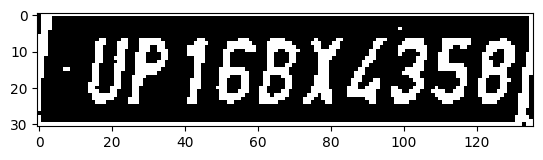

height =  468 width =  479


[216.26637268066406, 329.3022766113281, 357.8080749511719, 396.4071044921875, 0.9049047231674194, 0.0] track_id: 243.0
-0.22899423420849846


['UP168X4358']
license before check UP168X4358
hello
License Plate Number with contours :  None , Score :  None
-0.22512567616292364
['UP16BX4358']
license before check UP16BX4358
license after check UP16BX4358
License Plate Number :  UP16BX4358 , Score :  0.5325512004106404


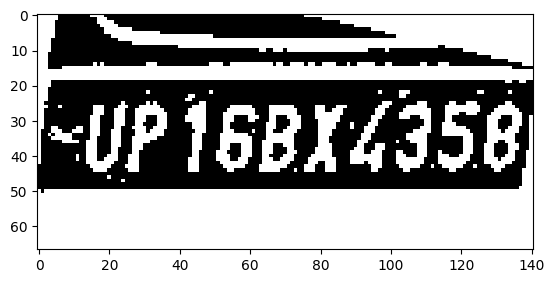

height =  496 width =  518


[239.17462158203125, 352.05950927734375, 389.8388977050781, 424.1584167480469, 0.9039973616600037, 0.0] track_id: 243.0
-0.22402364703792346


['UP16BXL3587']
license before check UP16BXL3587
hello
License Plate Number with contours :  None , Score :  None
-0.22627336202763532
['UP16BX4358']
license before check UP16BX4358
license after check UP16BX4358
License Plate Number :  UP16BX4358 , Score :  0.18614440465281262


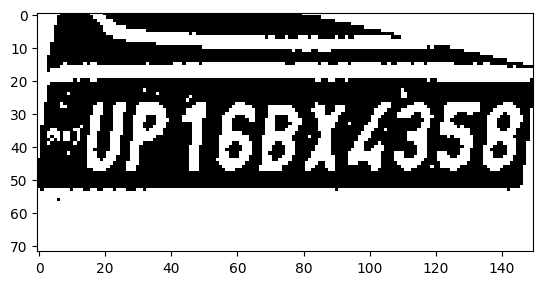

height =  526 width =  551


[261.5361328125, 377.180419921875, 421.0989074707031, 452.5133972167969, 0.9144190549850464, 0.0] track_id: 243.0
-0.2243466705266479
['UP16BX4358']
license before check UP16BX4358
license after check UP16BX4358
License Plate Number with contours :  UP16BX4358 , Score :  0.2776986160554192


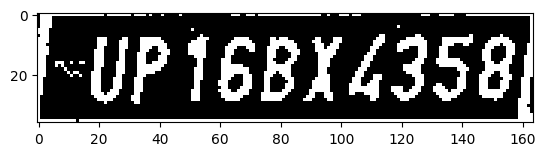

height =  565 width =  590


[283.673828125, 411.13116455078125, 455.28009033203125, 489.7204895019531, 0.9084845781326294, 0.0] track_id: 243.0
-0.22595921768864075
['UP16BX4358']
license before check UP16BX4358
license after check UP16BX4358
License Plate Number with contours :  UP16BX4358 , Score :  0.26301244903519916


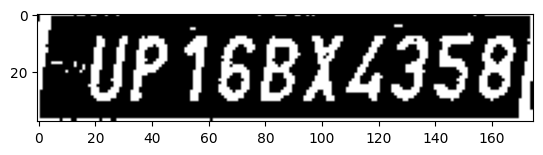

height =  607 width =  635


[312.0148010253906, 447.96624755859375, 496.3827819824219, 533.4830932617188, 0.9144701957702637, 0.0] track_id: 243.0
-0.22347660114063303


['UP168X4358']
license before check UP168X4358
hello
License Plate Number with contours :  None , Score :  None
-0.2255096351884239
['UP16BXL358']
license before check UP16BXL358
license after check UP16BXL358
License Plate Number :  UP16BX4358 , Score :  0.6329236185058047


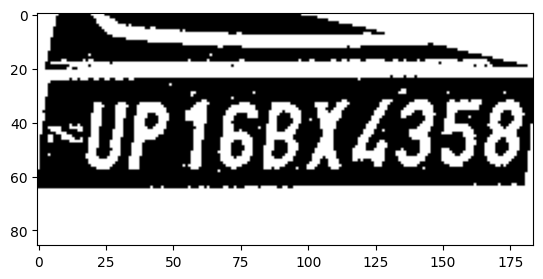

height =  659 width =  689


[347.7778015136719, 489.16107177734375, 548.2587280273438, 581.8082275390625, 0.9164671301841736, 0.0] track_id: 243.0
-0.22527677921405528


['UP168XL358']
license before check UP168XL358
hello
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['16BX4358', 'UP']
license before check 16BX4358UP
hello
License Plate Number :  None , Score :  None
height =  715 width =  748


[390.80279541015625, 539.0494995117188, 606.1257934570312, 634.3955078125, 0.9185740947723389, 0.0] track_id: 243.0
-0.24383055800560333


['UP16BXL3581']
license before check UP16BXL3581
hello
License Plate Number with contours :  None , Score :  None
-0.24142838218545037
['UP16BXL358']
license before check UP16BXL358
license after check UP16BXL358
License Plate Number :  UP16BX4358 , Score :  0.3943587991094327


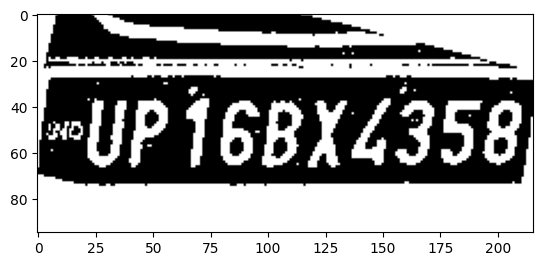

height =  782 width =  817


[443.6868896484375, 591.923828125, 678.6328735351562, 700.6077880859375, 0.9129167795181274, 0.0] track_id: 243.0
-0.2463227483389765
['UP16BXL358']
license before check UP16BXL358
license after check UP16BXL358
License Plate Number with contours :  UP16BX4358 , Score :  0.3591739094964877


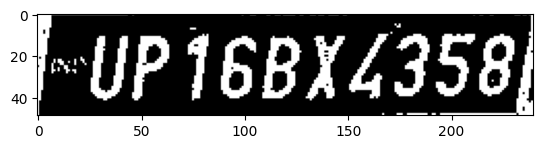

height =  865 width =  899


[513.3703002929688, 660.8895874023438, 765.3554077148438, 783.1119384765625, 0.9205082058906555, 0.0] track_id: 243.0
-0.2613259806225024
['UP16BXL358']
license before check UP16BXL358
license after check UP16BXL358
License Plate Number with contours :  UP16BX4358 , Score :  0.8137342106286233


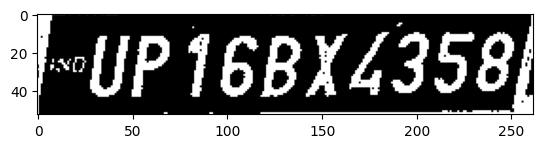

height =  961 width =  994


[601.1157836914062, 739.643310546875, 876.1806030273438, 875.87353515625, 0.9146324992179871, 0.0] track_id: 243.0
-0.2957260624639944
['UP16BXLJ58']
license before check UP16BXLJ58
license after check UP16BXLJ58
License Plate Number with contours :  UP16BX4358 , Score :  0.43489782724474835


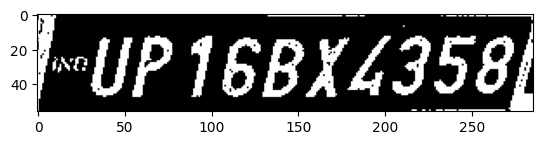

height =  1077 width =  1107


[717.44677734375, 836.2567749023438, 1008.3102416992188, 996.1209106445312, 0.9179229736328125, 0.0] track_id: 243.0
-0.31378259553512067


['B']
license before check B
hello
License Plate Number with contours :  None , Score :  None
-0.3162861279121545
['woUP16BXL358']
license before check woUP16BXL358
hello
License Plate Number :  None , Score :  None
height =  1212 width =  1234


[854.4910888671875, 952.237060546875, 1157.571533203125, 1138.4371337890625, 0.7501106262207031, 0.0] track_id: 243.0
-0.4359136387073723


['B']
license before check B
hello
License Plate Number with contours :  None , Score :  None
-0.41779067826209315
['UP16BX4358']
license before check UP16BX4358
license after check UP16BX4358
License Plate Number :  UP16BX4358 , Score :  0.7721219959476848


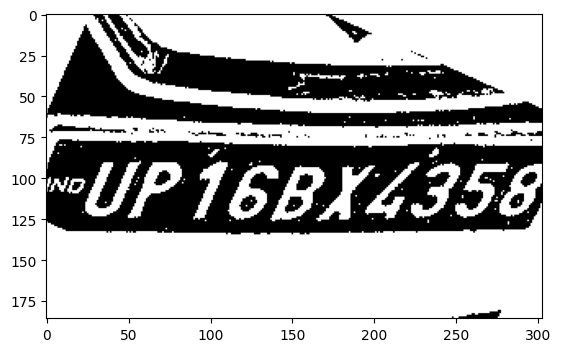

height =  1277 width =  1396
height =  1284 width =  1545
height =  1233 width =  2040
height =  1214 width =  2039
height =  1155 width =  1980
height =  1089 width =  1894
height =  991 width =  1778
height =  892 width =  1614
height =  765 width =  1364
height =  609 width =  924
height =  107 width =  102
height =  109 width =  104
height =  115 width =  108
height =  119 width =  111
height =  126 width =  113
height =  129 width =  115
height =  128 width =  115
height =  136 width =  119
height =  139 width =  121
height =  139 width =  124
height =  143 width =  127
height =  149 width =  129
[53.152320861816406, 87.6357192993164, 93.89358520507812, 107.984619140625, 0.2777390778064728, 0.0] track_id: 246.0
-0.2629947316809195
height =  151 width =  130
height =  163 width =  137
[53.53339767456055, 96.81812286376953, 97.97836303710938, 119.77008819580078, 0.7716881036758423, 0.0] track_id: 246.0
-0.23624526071843754
height =  164 width =  137


[52.632938385009766, 99.55604553222656, 98.18872833251953, 121.55706024169922, 0.8728495836257935, 0.0] track_id: 246.0
-0.23501221572065709


[]
License Plate Number with contours :  None , Score :  None
-0.23923159996366056
['5144']
license before check 5144
hello
License Plate Number :  None , Score :  None
height =  168 width =  143
[56.15276336669922, 101.64447784423828, 102.46269989013672, 122.62312316894531, 0.842503011226654, 0.0] track_id: 246.0
-0.23624526071843754
height =  179 width =  149
[58.590877532958984, 108.72863006591797, 106.13285827636719, 131.8065643310547, 0.7964645624160767, 0.0] track_id: 246.0
-0.2825549524695875
height =  192 width =  152


[59.7496452331543, 117.05671691894531, 109.0955810546875, 142.9998779296875, 0.8444302678108215, 0.0] track_id: 246.0
-0.24192056868440487


[]
License Plate Number with contours :  None , Score :  None
-0.25615138256560344
[]
License Plate Number :  None , Score :  None
height =  198 width =  156
[62.09806823730469, 121.46126556396484, 111.75920867919922, 147.90528869628906, 0.8578048944473267, 0.0] track_id: 246.0
-0.2536740961386427
height =  209 width =  159


[62.118873596191406, 131.8519744873047, 114.31441497802734, 158.43663024902344, 0.8725205659866333, 0.0] track_id: 246.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.22527677921405528
['Hautt']
license before check Hautt
hello
License Plate Number :  None , Score :  None
height =  216 width =  165


[65.29745483398438, 136.0889434814453, 118.90213775634766, 163.15159606933594, 0.8860310316085815, 0.0] track_id: 246.0
-0.2642600199133301


[]
License Plate Number with contours :  None , Score :  None
-0.23109066719589708
[]
License Plate Number :  None , Score :  None
height =  218 width =  170


[67.85429382324219, 137.21543884277344, 122.3076171875, 164.75335693359375, 0.8757923245429993, 0.0] track_id: 246.0
-0.23441567572381078


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  222 width =  173


[70.03722381591797, 139.86474609375, 125.62606048583984, 167.8590850830078, 0.9065335988998413, 0.0] track_id: 246.0
-0.23783592745745075


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
[]
License Plate Number :  None , Score :  None
height =  221 width =  180


[73.13784790039062, 138.58155822753906, 130.29795837402344, 167.0166015625, 0.9056669473648071, 0.0] track_id: 246.0
-0.22785704871709972


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['JuirI']
license before check JuirI
hello
License Plate Number :  None , Score :  None
height =  229 width =  187


[76.4433822631836, 143.4693603515625, 136.3279266357422, 172.7491912841797, 0.9006979465484619, 0.0] track_id: 246.0
-0.22402364703792346


['nd']
license before check nd
hello
License Plate Number with contours :  None , Score :  None
-0.2405342479459046
['cIMcS']
license before check cIMcS
hello
License Plate Number :  None , Score :  None
height =  231 width =  194


[79.57884979248047, 143.30101013183594, 140.7689971923828, 172.4867401123047, 0.902747631072998, 0.0] track_id: 246.0
-0.21109333322274654


['W']
license before check W
hello
License Plate Number with contours :  None , Score :  None
-0.23624526071843754
[]
License Plate Number :  None , Score :  None
height =  231 width =  200


[81.89826202392578, 140.93707275390625, 144.95437622070312, 172.80699157714844, 0.9060173630714417, 0.0] track_id: 246.0
0.04491359546978934


[]
License Plate Number with contours :  None , Score :  None
-0.2247111684146427
['DncIIosr']
license before check DncIIosr
hello
License Plate Number :  None , Score :  None
height =  237 width =  208


[85.4811782836914, 144.29803466796875, 152.235107421875, 175.7128448486328, 0.8867663145065308, 0.0] track_id: 246.0
-0.23501221572065709


['14ki']
license before check 14ki
hello
License Plate Number with contours :  None , Score :  None
-0.2408464552414116
['WoXuIas']
license before check WoXuIas
hello
License Plate Number :  None , Score :  None
height =  246 width =  212


[87.13169860839844, 148.1827850341797, 155.10086059570312, 181.71917724609375, 0.8955569863319397, 0.0] track_id: 246.0
-0.23374318086890142


['W10id3']
license before check W10id3
hello
License Plate Number with contours :  None , Score :  None
-0.2373742469731708
['WXcMfs5s']
license before check WXcMfs5s
hello
License Plate Number :  None , Score :  None
height =  253 width =  219


[90.66411590576172, 152.8297119140625, 161.6143341064453, 187.6822052001953, 0.9002783298492432, 0.0] track_id: 246.0
-0.2425514834271907


['MAiCLfJ']
license before check MAiCLfJ
hello
License Plate Number with contours :  None , Score :  None
-0.24135549057540379
['Wr1c4u6653']
license before check Wr1c4u6653
license after check WR1C4U6653
License Plate Number :  WR1CAU6653 , Score :  0.030819889732077447


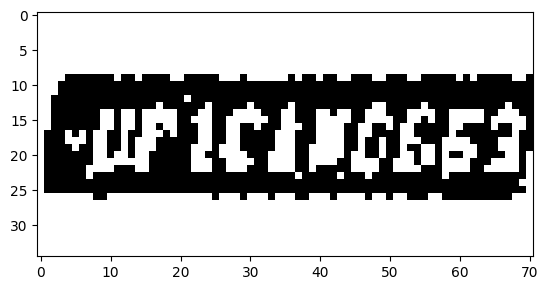

height =  261 width =  226


[94.45199584960938, 157.81619262695312, 167.91574096679688, 193.46652221679688, 0.8923662900924683, 0.0] track_id: 246.0
-0.2424470229658554


['Uel4titoj']
license before check Uel4titoj
hello
License Plate Number with contours :  None , Score :  None
-0.23441567572381078
['UP510t65J']
license before check UP510t65J
hello
License Plate Number :  None , Score :  None
height =  274 width =  234


[98.68742370605469, 164.2489471435547, 175.24586486816406, 201.71600341796875, 0.9016252756118774, 0.0] track_id: 246.0
-0.23645614219991717


['Uctc442gs']
license before check Uctc442gs
hello
License Plate Number with contours :  None , Score :  None
-0.23186466084938878
['UaJgX40653']
license before check UaJgX40653
license after check UAJGX40653
License Plate Number :  UA3GXA0653 , Score :  0.012963942005981253


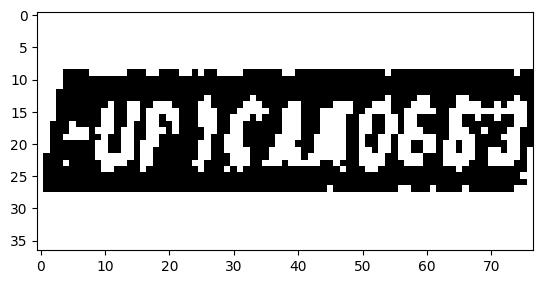

height =  283 width =  249


[105.71469116210938, 169.67141723632812, 186.40553283691406, 209.94972229003906, 0.8991824388504028, 0.0] track_id: 246.0
-0.24497866312686414


['Ficixdssy']
license before check Ficixdssy
hello
License Plate Number with contours :  None , Score :  None
-0.23824475817874502
['UaJGiRu5S']
license before check UaJGiRu5S
hello
License Plate Number :  None , Score :  None
height =  295 width =  258


[109.3973388671875, 176.58038330078125, 193.9738006591797, 218.3544158935547, 0.8995009064674377, 0.0] track_id: 246.0
-0.22747498047282771


['NP1kdseJ']
license before check NP1kdseJ
hello
License Plate Number with contours :  None , Score :  None
-0.23554498072086333
['UPC14066J']
license before check UPC14066J
hello
License Plate Number :  None , Score :  None
height =  305 width =  268


[113.1068344116211, 184.0537109375, 201.5319366455078, 227.1815185546875, 0.9009356498718262, 0.0] track_id: 246.0
-0.22064718266034367


['0ficIXcesJ']
license before check 0ficIXcesJ
hello
License Plate Number with contours :  None , Score :  None
-0.24207169457111893
['1gkN5s']
license before check 1gkN5s
hello
License Plate Number :  None , Score :  None
height =  316 width =  282


[119.560546875, 191.90451049804688, 213.16534423828125, 237.29122924804688, 0.8950499892234802, 0.0] track_id: 246.0
-0.2260683879938839


['Up1can06631']
license before check Up1can06631
hello
License Plate Number with contours :  None , Score :  None
-0.2284966392918623
['UP1gkX0s63']
license before check UP1gkX0s63
license after check UP1GKX0S63
License Plate Number :  UP1GKX0563 , Score :  0.00910552814658484


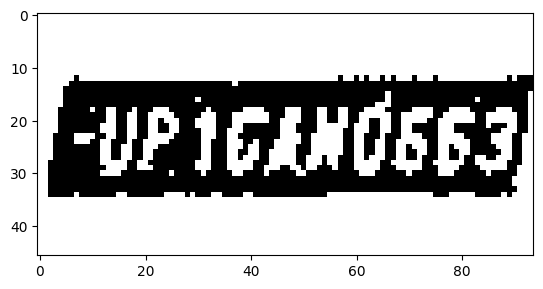

height =  331 width =  298


[128.52166748046875, 200.3227081298828, 226.13417053222656, 247.90347290039062, 0.899474024772644, 0.0] track_id: 246.0
-0.24717646178597003
['UpicANOSS3']
license before check UpicANOSS3
license after check UPICANOSS3
License Plate Number with contours :  UP1CAN0553 , Score :  0.05277948753393833


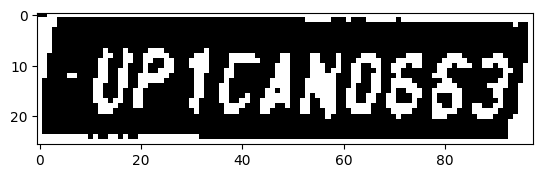

height =  348 width =  314


[137.48849487304688, 213.2456512451172, 239.2833251953125, 261.2378845214844, 0.9001083374023438, 0.0] track_id: 246.0
-0.22208190190548016


['Up1gaN0g6e']
license before check Up1gaN0g6e
hello
License Plate Number with contours :  None , Score :  None
-0.2299044281319047
['Up164N0663']
license before check Up164N0663
license after check UP164N0663
License Plate Number :  UP16AN0663 , Score :  0.19974977911106548


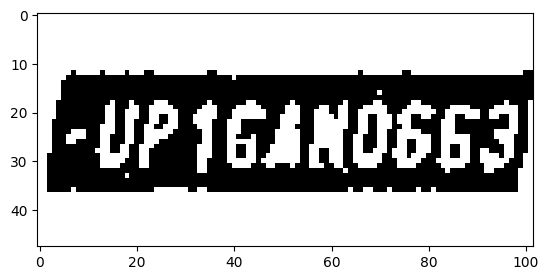

height =  367 width =  330


[146.8484344482422, 225.2523651123047, 252.789794921875, 276.404296875, 0.9047935605049133, 0.0] track_id: 246.0
-0.23109066719589708


['Up1can06s31']
license before check Up1can06s31
hello
License Plate Number with contours :  None , Score :  None
-0.23052183904336873
['UPIgANOGSJ']
license before check UPIgANOGSJ
license after check UPIGANOGSJ
License Plate Number :  UP1GAN0653 , Score :  0.034187694510633894


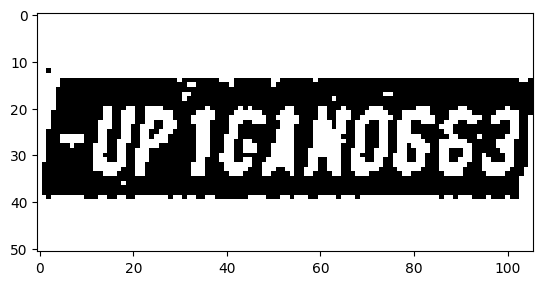

height =  385 width =  351


[157.30355834960938, 239.91009521484375, 267.90093994140625, 293.8516540527344, 0.9117019772529602, 0.0] track_id: 246.0
-0.23052183904336873
['UPIcan06s3']
license before check UPIcan06s3
license after check UPICAN06S3
License Plate Number with contours :  UP1CAN0653 , Score :  0.19482820697942574


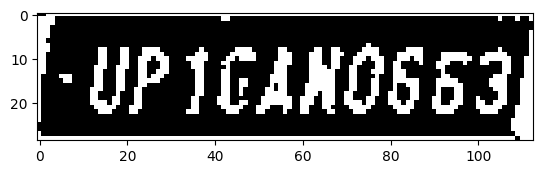

height =  401 width =  371


[168.3268585205078, 253.9595947265625, 286.215087890625, 310.5003356933594, 0.9096099138259888, 0.0] track_id: 246.0
-0.2247111684146427
['UPIcan0gS3']
license before check UPIcan0gS3
license after check UPICAN0GS3
License Plate Number with contours :  UP1CAN0653 , Score :  0.2413463884893588


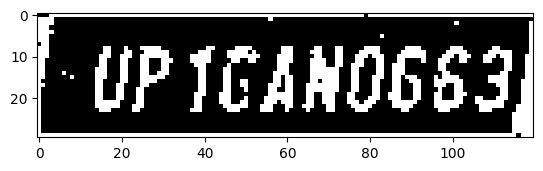

height =  88 width =  110
height =  421 width =  392


[181.59210205078125, 268.6925354003906, 305.6403503417969, 325.98468017578125, 0.9070568680763245, 0.0] track_id: 246.0
-0.22923193327699534


['UP1caNOGS']
license before check UP1caNOGS
hello
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['UPIgANO653']
license before check UPIgANO653
license after check UPIGANO653
License Plate Number :  UP1GAN0653 , Score :  0.1179269588889612


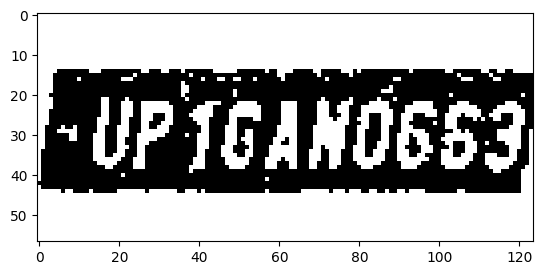

height =  444 width =  419


[197.29930114746094, 283.8907165527344, 330.4681701660156, 348.6579895019531, 0.9086684584617615, 0.0] track_id: 246.0
-0.22347660114063303
['UpIgan0gs3']
license before check UpIgan0gs3
license after check UPIGAN0GS3
License Plate Number with contours :  UP1GAN0653 , Score :  0.2987908774481693


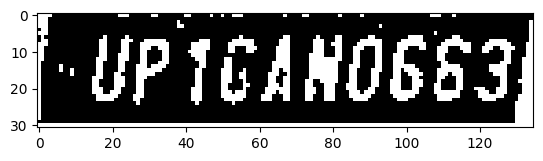

height =  474 width =  450


[217.19293212890625, 307.2337341308594, 359.1330871582031, 375.747802734375, 0.9050251841545105, 0.0] track_id: 246.0
-0.22627336202763532


['UP16ah06S31']
license before check UP16ah06S31
hello
License Plate Number with contours :  None , Score :  None
-0.22512567616292364
['Up1GANO6S3']
license before check Up1GANO6S3
license after check UP1GANO6S3
License Plate Number :  UP1GAN0653 , Score :  0.06786958920553418


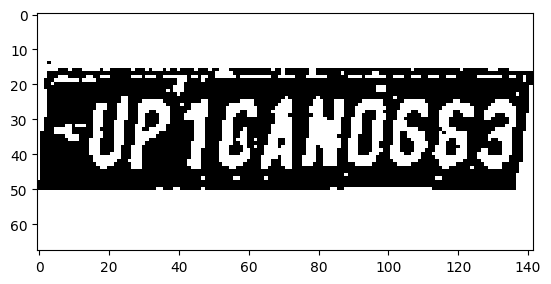

height =  508 width =  488
[240.79959106445312, 335.1680603027344, 390.3956604003906, 404.7698059082031, 0.9119805693626404, 0.0] track_id: 246.0
-0.22923193327699534
height =  545 width =  530
[269.0965270996094, 361.3467102050781, 430.1572265625, 437.07708740234375, 0.9203159213066101, 0.0] track_id: 246.0
-0.22441600903714554
height =  583 width =  578
[302.4841003417969, 390.51959228515625, 475.03448486328125, 474.7437438964844, 0.9126547574996948, 0.0] track_id: 246.0
-0.22810262827994277
height =  632 width =  636


[343.793701171875, 427.0208435058594, 530.4459228515625, 519.5691528320312, 0.9160997271537781, 0.0] track_id: 246.0
-0.24750710274506085
['UP1uanOgS3']
license before check UP1uanOgS3
license after check UP1UANOGS3
License Plate Number with contours :  UP1UAN0653 , Score :  0.18679464901568135


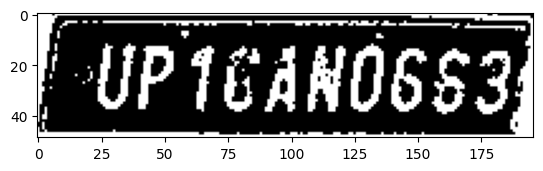

height =  690 width =  702


[396.1326599121094, 474.4571228027344, 598.1017456054688, 573.9720458984375, 0.9203880429267883, 0.0] track_id: 246.0
-0.2091597229996395


['Uptgan0gs3']
license before check Uptgan0gs3
hello
License Plate Number with contours :  None , Score :  None
-0.24361811974866845
['Upigan0gs3']
license before check Upigan0gs3
license after check UPIGAN0GS3
License Plate Number :  UP1GAN0653 , Score :  0.525718680809161


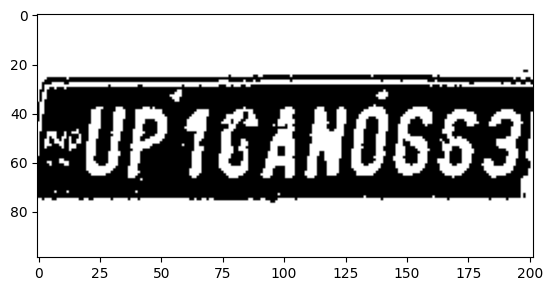

height =  754 width =  780


[459.8775634765625, 527.283447265625, 677.752197265625, 637.8814086914062, 0.9225079417228699, 0.0] track_id: 246.0
-0.2609282307713259
['UP1gan0gs3']
license before check UP1gan0gs3
license after check UP1GAN0GS3
License Plate Number with contours :  UP1GAN0653 , Score :  0.22640042515617287


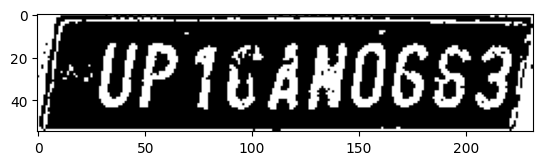

height =  828 width =  867


[539.2859497070312, 592.1107177734375, 774.4327392578125, 712.2388305664062, 0.922736406326294, 0.0] track_id: 246.0
-0.27671403665532207


['0']
license before check 0
hello
License Plate Number with contours :  None , Score :  None
-0.28060513042474605
['UP16ANO6S3']
license before check UP16ANO6S3
license after check UP16ANO6S3
License Plate Number :  UP16AN0653 , Score :  0.4034383898678507


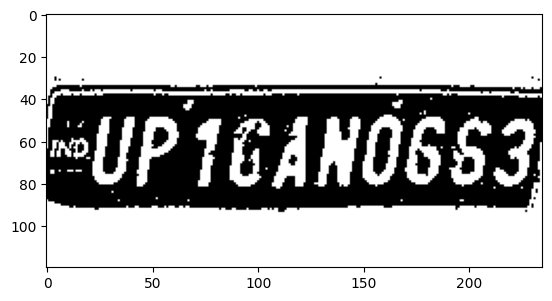

height =  919 width =  970
[643.423095703125, 670.3698120117188, 892.0751342773438, 803.828369140625, 0.9214015007019043, 0.0] track_id: 246.0
-0.2952895283235704
height =  1027 width =  1092


[775.89453125, 761.749267578125, 1034.3101806640625, 914.2550048828125, 0.9209753274917603, 0.0] track_id: 246.0
-0.37191763125078114


['6']
license before check 6
hello
License Plate Number with contours :  None , Score :  None
-0.383899069778045
['UP1GANOGS3']
license before check UP1GANOGS3
license after check UP1GANOGS3
License Plate Number :  UP1GAN0653 , Score :  0.2791177263917191


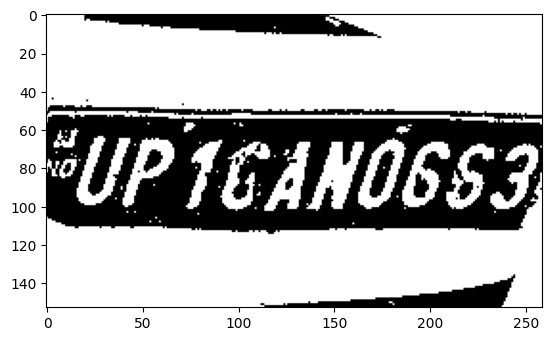

height =  1155 width =  1225


[933.6109008789062, 850.722412109375, 1198.3062744140625, 1050.8970947265625, 0.8394111394882202, 0.0] track_id: 246.0
-0.47070216569231643


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.4361908596667056
['UP164N06S3']
license before check UP164N06S3
license after check UP164N06S3
License Plate Number :  UP16AN0653 , Score :  0.2895106404797978


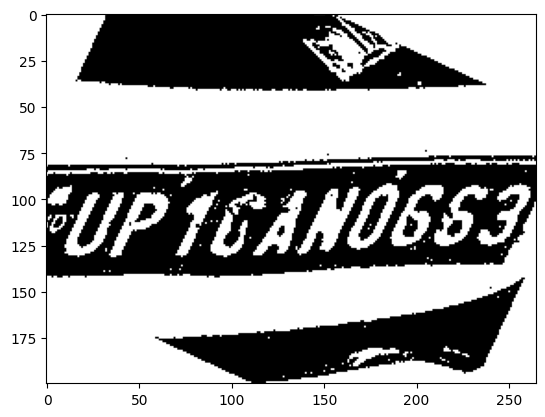

height =  1238 width =  1375


[1115.7296142578125, 964.0272827148438, 1373.4356689453125, 1214.81884765625, 0.3343377709388733, 0.0] track_id: 246.0
-0.6123610185240448


[]
License Plate Number with contours :  None , Score :  None
-0.5917761705415029
['FUPTcaNOGS']
license before check FUPTcaNOGS
hello
License Plate Number :  None , Score :  None
height =  1255 width =  1544
height =  1244 width =  1838
height =  1170 width =  1802
height =  1099 width =  1687
height =  1021 width =  1530
height =  937 width =  1325
height =  701 width =  647
height =  74 width =  94
height =  91 width =  99
height =  100 width =  104
height =  99 width =  109
height =  104 width =  118
height =  111 width =  121
height =  114 width =  121
height =  117 width =  125
height =  119 width =  126
height =  123 width =  128
height =  122 width =  133
height =  124 width =  135
height =  133 width =  138
height =  137 width =  140
height =  151 width =  146
height =  148 width =  150
height =  149 width =  155
height =  156 width =  158
height =  155 width =  161


[63.5290412902832, 86.91832733154297, 112.67472076416016, 115.87012481689453, 0.45829930901527405, 0.0] track_id: 252.0
-0.22347660114063303


[]
License Plate Number with contours :  None , Score :  None
-0.20963984587421253
[]
License Plate Number :  None , Score :  None
height =  163 width =  166
[65.73368072509766, 96.46531677246094, 116.31756591796875, 119.0240249633789, 0.5203282833099365, 0.0] track_id: 252.0
-0.23554498072086333
height =  171 width =  170


[68.25342559814453, 100.59146118164062, 118.59956359863281, 123.05448913574219, 0.7623682618141174, 0.0] track_id: 252.0
0.4487233440107211


[]
License Plate Number with contours :  None , Score :  None
-0.21406068356382152
[]
License Plate Number :  None , Score :  None
height =  181 width =  176
[70.40174102783203, 105.34892272949219, 123.23955535888672, 132.58885192871094, 0.6388193964958191, 0.0] track_id: 252.0
-0.22679884805388587
height =  183 width =  180


[71.65745544433594, 108.68514251708984, 125.89588165283203, 137.4420166015625, 0.6163163781166077, 0.0] track_id: 252.0
-0.2408464552414116


[]
License Plate Number with contours :  None , Score :  None
-0.2299044281319047
[]
License Plate Number :  None , Score :  None
height =  188 width =  186


[74.91858673095703, 110.6482925415039, 129.98599243164062, 140.27975463867188, 0.8574789762496948, 0.0] track_id: 252.0
-0.21655030497608926


[]
License Plate Number with contours :  None , Score :  None
-0.21655030497608926
[]
License Plate Number :  None , Score :  None
height =  188 width =  191


[76.32783508300781, 112.98280334472656, 133.04754638671875, 141.13880920410156, 0.8040998578071594, 0.0] track_id: 252.0
0.0


[]
License Plate Number with contours :  None , Score :  None
-0.20539538918976738
[]
License Plate Number :  None , Score :  None
height =  192 width =  197


[76.8426742553711, 115.67486572265625, 136.5989227294922, 147.23184204101562, 0.8529133796691895, 0.0] track_id: 252.0
0.39585044133741604


[]
License Plate Number with contours :  None , Score :  None
-0.20846521837998772
[]
License Plate Number :  None , Score :  None
height =  198 width =  204


[81.32272338867188, 117.45346069335938, 141.67678833007812, 150.1228485107422, 0.8707432150840759, 0.0] track_id: 252.0
-0.21866894587394195


[]
License Plate Number with contours :  None , Score :  None
-0.22266094063636496
[]
License Plate Number :  None , Score :  None
height =  203 width =  210


[84.16788482666016, 119.20442962646484, 146.93667602539062, 153.09585571289062, 0.885404109954834, 0.0] track_id: 252.0
-0.20442120537714656


[]
License Plate Number with contours :  None , Score :  None
-0.21655030497608926
['FutTffiftY']
license before check FutTffiftY
hello
License Plate Number :  None , Score :  None
height =  210 width =  216


[86.90866088867188, 122.83968353271484, 151.69349670410156, 157.98780822753906, 0.8906206488609314, 0.0] track_id: 252.0
0.48312566481733366


[]
License Plate Number with contours :  None , Score :  None
-0.22266094063636496
['DXfUIYJ']
license before check DXfUIYJ
hello
License Plate Number :  None , Score :  None
height =  220 width =  222


[87.87779998779297, 129.34652709960938, 154.8088836669922, 164.8061981201172, 0.8912561535835266, 0.0] track_id: 252.0
-0.2847304385227122


['Ku']
license before check Ku
hello
License Plate Number with contours :  None , Score :  None
-0.22923193327699534
[]
License Plate Number :  None , Score :  None
height =  223 width =  230


[92.56652069091797, 133.0722198486328, 161.33029174804688, 169.7561492919922, 0.9037717580795288, 0.0] track_id: 252.0
-0.23824475817874502


['VBU']
license before check VBU
hello
License Plate Number with contours :  None , Score :  None
-0.23624526071843754
['ViGcTIS8']
license before check ViGcTIS8
hello
License Plate Number :  None , Score :  None
height =  235 width =  238


[95.11080932617188, 142.21755981445312, 166.15419006347656, 181.25326538085938, 0.8932740688323975, 0.0] track_id: 252.0
-0.23021958727684372


['Tikuif']
license before check Tikuif
hello
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
['FuIIec75t58']
license before check FuIIec75t58
hello
License Plate Number :  None , Score :  None
height =  95 width =  106
height =  244 width =  246


[97.61039733886719, 146.82388305664062, 171.53530883789062, 188.04837036132812, 0.8949235677719116, 0.0] track_id: 252.0
0.5404195002705842


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['PW16C5350']
license before check PW16C5350
license after check PW16C5350
License Plate Number :  PW16C5350 , Score :  0.11921055612359807


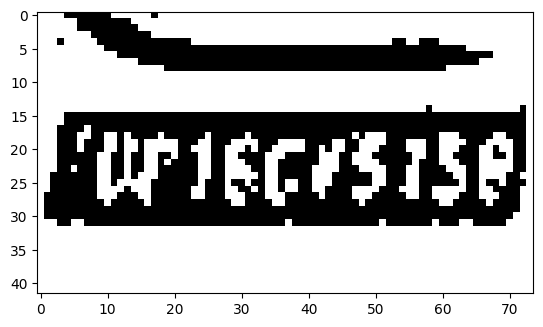

height =  100 width =  112
height =  256 width =  258


[103.89617156982422, 154.7202606201172, 181.13449096679688, 197.90797424316406, 0.8946318626403809, 0.0] track_id: 252.0
-0.22785704871709972


['XECtS1S']
license before check XECtS1S
hello
License Plate Number with contours :  None , Score :  None
-0.2247111684146427
['RurIECTSISR']
license before check RurIECTSISR
hello
License Plate Number :  None , Score :  None
height =  98 width =  112
height =  267 width =  270


[109.57106018066406, 163.9276123046875, 191.32530212402344, 206.70831298828125, 0.9052640795707703, 0.0] track_id: 252.0
-0.2172934309230211
['UT16015158']
license before check UT16015158
license after check UT16015158
License Plate Number with contours :  UT16OI5158 , Score :  0.06062511879184911


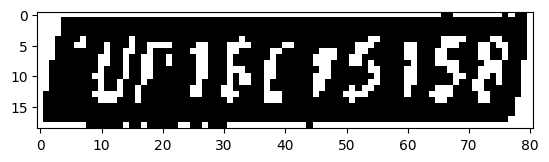

height =  105 width =  108
height =  281 width =  284


[117.53331756591797, 171.01031494140625, 202.9750518798828, 218.95567321777344, 0.89493328332901, 0.0] track_id: 252.0
0.5597969195614243


[]
License Plate Number with contours :  None , Score :  None
-0.22290023232837577
['EOp16015458']
license before check EOp16015458
hello
License Plate Number :  None , Score :  None
height =  292 width =  297


[125.10293579101562, 177.59844970703125, 213.90989685058594, 227.55722045898438, 0.8974138498306274, 0.0] track_id: 252.0
-0.22402364703792346
['VPIecrsiS8']
license before check VPIecrsiS8
license after check VPIECRSIS8
License Plate Number with contours :  VP1ECR5158 , Score :  0.08484098418898596


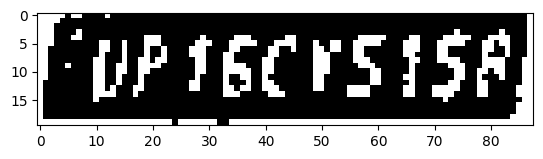

height =  115 width =  115
height =  302 width =  314


[134.3855743408203, 186.090576171875, 228.03260803222656, 238.23182678222656, 0.9031945466995239, 0.0] track_id: 252.0
-0.21866894587394195
['UPI6cvs158']
license before check UPI6cvs158
license after check UPI6CVS158
License Plate Number with contours :  UP16CV5158 , Score :  0.08928683837707503


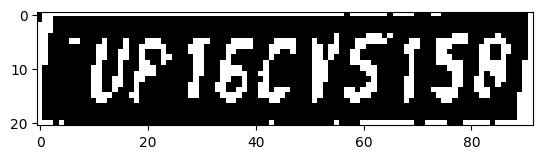

height =  110 width =  113
height =  320 width =  333
[144.48660278320312, 199.76071166992188, 243.76968383789062, 253.20045471191406, 0.9015588164329529, 0.0] track_id: 252.0
0.5050985070589972
height =  109 width =  108
height =  339 width =  355


[158.1385498046875, 215.5454864501953, 262.1914367675781, 267.2164001464844, 0.8935871124267578, 0.0] track_id: 252.0
-0.22441600903714554
['UpI6cY5158']
license before check UpI6cY5158
license after check UPI6CY5158
License Plate Number with contours :  UP16CY5158 , Score :  0.15980212552480355


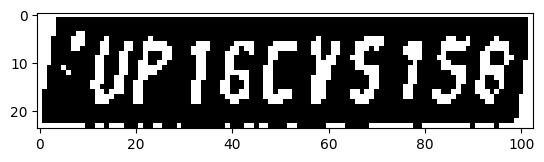

height =  357 width =  378


[172.62205505371094, 227.24806213378906, 281.1048583984375, 285.6773986816406, 0.8998820781707764, 0.0] track_id: 252.0
-0.2275674874105842
['UP16cY5158']
license before check UP16cY5158
license after check UP16CY5158
License Plate Number with contours :  UP16CY5158 , Score :  0.5146935650648053


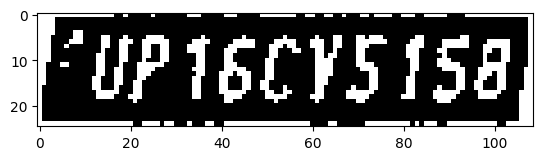

height =  113 width =  120
height =  378 width =  402


[185.92422485351562, 249.50015258789062, 300.4190368652344, 306.5795593261719, 0.8928253054618835, 0.0] track_id: 252.0
-0.2247111684146427
['Up16cy5158']
license before check Up16cy5158
license after check UP16CY5158
License Plate Number with contours :  UP16CY5158 , Score :  0.356531206341312


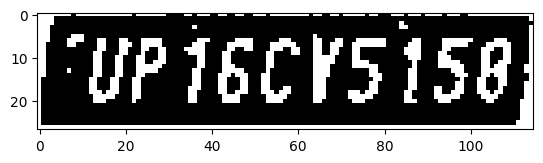

height =  118 width =  125
height =  407 width =  429


[202.8562774658203, 271.0584411621094, 325.4322204589844, 330.27923583984375, 0.8960339426994324, 0.0] track_id: 252.0
-0.22615243573280183


['UP16CV51581']
license before check UP16CV51581
hello
License Plate Number with contours :  None , Score :  None
-0.2223487820699473
['EUp16cY5158']
license before check EUp16cY5158
hello
License Plate Number :  None , Score :  None
height =  118 width =  126
height =  428 width =  459


[223.60093688964844, 287.8677062988281, 352.6345520019531, 351.7461853027344, 0.9036844372749329, 0.0] track_id: 252.0
-0.2231133610549015
['Up16cY5158']
license before check Up16cY5158
license after check UP16CY5158
License Plate Number with contours :  UP16CY5158 , Score :  0.42991682350160104


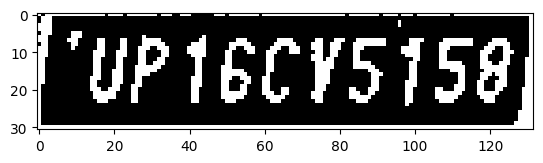

height =  118 width =  126
height =  454 width =  496


[244.95677185058594, 306.1668701171875, 385.2767639160156, 382.14080810546875, 0.8959554433822632, 0.0] track_id: 252.0
-0.22679884805388587
['UP16CV5158']
license before check UP16CV5158
license after check UP16CV5158
License Plate Number with contours :  UP16CV5158 , Score :  0.30508986572208785


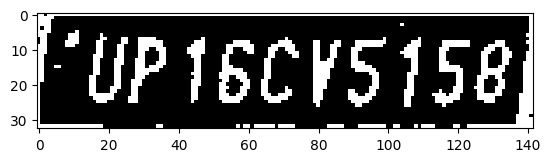

height =  486 width =  539


[274.77569580078125, 345.06988525390625, 424.93157958984375, 415.10223388671875, 0.9142112731933594, 0.0] track_id: 252.0
-0.22082876972934834


['FUP16CV5158']
license before check FUP16CV5158
hello
License Plate Number with contours :  None , Score :  None
-0.22627336202763532
['Up16cY5158']
license before check Up16cY5158
license after check UP16CY5158
License Plate Number :  UP16CY5158 , Score :  0.4074343135332012


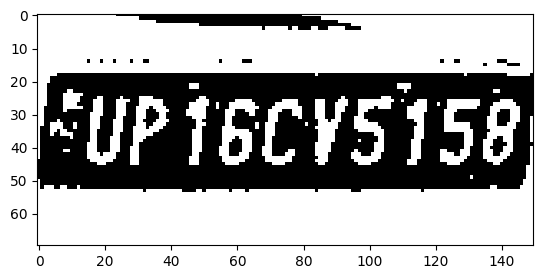

height =  129 width =  133
height =  534 width =  591


[310.5108947753906, 382.616943359375, 473.8364562988281, 458.7225341796875, 0.904593825340271, 0.0] track_id: 252.0
-0.22402364703792346
['UP16cY5158']
license before check UP16cY5158
license after check UP16CY5158
License Plate Number with contours :  UP16CY5158 , Score :  0.26988693243873596


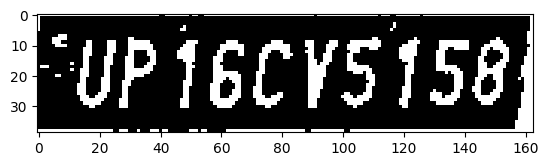

height =  582 width =  651


[355.24609375, 426.2209777832031, 532.814453125, 509.4703369140625, 0.9078583121299744, 0.0] track_id: 252.0
-0.22635617433335467


['Fup16cy5158']
license before check Fup16cy5158
hello
License Plate Number with contours :  None , Score :  None
-0.22402364703792346
['FUP16CY5158']
license before check FUP16CY5158
hello
License Plate Number :  None , Score :  None
height =  132 width =  139
height =  646 width =  725


[413.1986999511719, 478.8983459472656, 608.3359375, 573.2470092773438, 0.9152237772941589, 0.0] track_id: 252.0
-0.23148875634684254


[]
License Plate Number with contours :  None , Score :  None
-0.24264766501773763
['UP16cv5158']
license before check UP16cv5158
license after check UP16CV5158
License Plate Number :  UP16CV5158 , Score :  0.5216655495624728


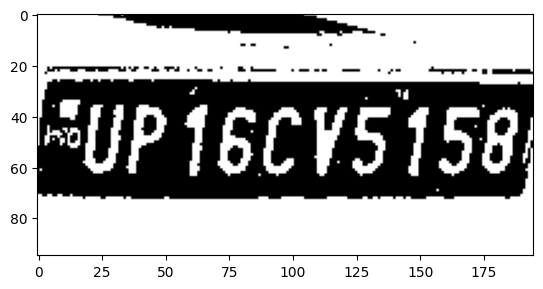

height =  717 width =  813


[488.7360534667969, 537.6312255859375, 701.0442504882812, 643.3301391601562, 0.9115490913391113, 0.0] track_id: 252.0
-0.24358590636724095


[]
License Plate Number with contours :  None , Score :  None
-0.24260054632578737
['Fup16cy5158']
license before check Fup16cy5158
hello
License Plate Number :  None , Score :  None
height =  813 width =  916


[584.2493896484375, 618.9566650390625, 816.1471557617188, 740.1345825195312, 0.9126262068748474, 0.0] track_id: 252.0
-0.28005199366008954


[]
License Plate Number with contours :  None , Score :  None
-0.2944136161388178
['RUP16cv5158']
license before check RUP16cv5158
hello
License Plate Number :  None , Score :  None
height =  926 width =  1041


[713.9522705078125, 712.7217407226562, 963.0951538085938, 851.6272583007812, 0.9161234498023987, 0.0] track_id: 252.0
-0.31322457341772525


[]
License Plate Number with contours :  None , Score :  None
-0.3143249483071088
['UP16CV5158']
license before check UP16CV5158
license after check UP16CV5158
License Plate Number :  UP16CV5158 , Score :  0.388584544500655


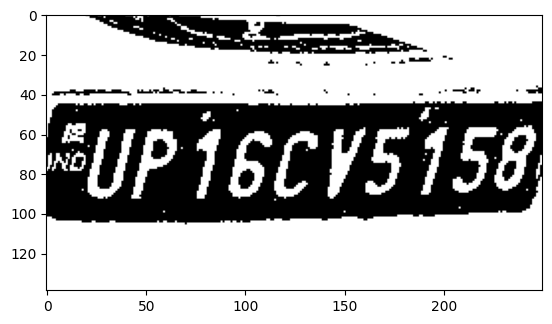

height =  1064 width =  1188


[880.1820678710938, 816.8073120117188, 1140.11279296875, 994.2463989257812, 0.9195473194122314, 0.0] track_id: 252.0
-0.4023210978604407


['FUP16CY5158']
license before check FUP16CY5158
hello
License Plate Number with contours :  None , Score :  None
-0.40102333362865644
['UP16c15158']
license before check UP16c15158
license after check UP16C15158
License Plate Number :  UP16CI5158 , Score :  0.2731118426160441


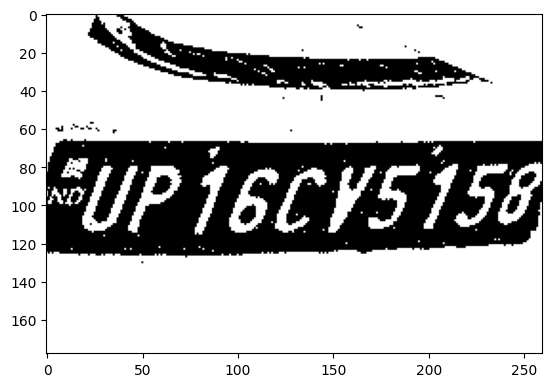

height =  1191 width =  1352
height =  173 width =  173
height =  1240 width =  1531
height =  1246 width =  1738
height =  162 width =  160
height =  161 width =  160
height =  1186 width =  1888
height =  154 width =  164
[69.51463317871094, 84.31958770751953, 114.12117767333984, 108.72154998779297, 0.6194010376930237, 0.0] track_id: 254.0
-0.22208190190548016
height =  1141 width =  1897
height =  158 width =  167
height =  1107 width =  1796
height =  170 width =  169
height =  1015 width =  1633
height =  175 width =  172
height =  885 width =  1397
height =  182 width =  175
height =  733 width =  1041
height =  185 width =  180
height =  189 width =  185
height =  193 width =  192
height =  197 width =  197


[84.21569061279297, 116.4212875366211, 138.6295166015625, 147.11569213867188, 0.8500661253929138, 0.0] track_id: 254.0
-0.24156570709532596


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  208 width =  203


[86.32142639160156, 121.71634674072266, 143.1873016357422, 156.12631225585938, 0.8470950722694397, 0.0] track_id: 254.0
-0.22208190190548016


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
['Ihing']
license before check Ihing
hello
License Plate Number :  None , Score :  None
height =  211 width =  208


[89.04804229736328, 125.3473892211914, 146.89845275878906, 158.021484375, 0.8693721294403076, 0.0] track_id: 254.0
-0.2287988453872256


[]
License Plate Number with contours :  None , Score :  None
-0.2148154004016586
['4WJD']
license before check 4WJD
hello
License Plate Number :  None , Score :  None
height =  214 width =  214


[92.26850128173828, 125.7116928100586, 152.43624877929688, 161.30075073242188, 0.8641154170036316, 0.0] track_id: 254.0
-0.22827377323805273


[]
License Plate Number with contours :  None , Score :  None
-0.21655030497608926
['TmI']
license before check TmI
hello
License Plate Number :  None , Score :  None
height =  217 width =  221


[95.16250610351562, 128.85020446777344, 156.97933959960938, 164.40234375, 0.8875398635864258, 0.0] track_id: 254.0
-0.22827377323805273


['Wl']
license before check Wl
hello
License Plate Number with contours :  None , Score :  None
-0.22810262827994277
['0l0it14s4']
license before check 0l0it14s4
license after check 0L0IT14S4
License Plate Number :  OL0IT1454 , Score :  0.0034785564258067226


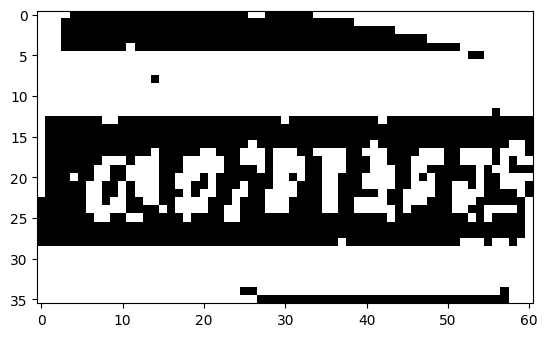

height =  226 width =  228


[98.47674560546875, 134.33790588378906, 161.98330688476562, 169.842529296875, 0.8950100541114807, 0.0] track_id: 254.0
-0.23186466084938878


['Tf1ra']
license before check Tf1ra
hello
License Plate Number with contours :  None , Score :  None
-0.24111767845146836
['aLciTI']
license before check aLciTI
hello
License Plate Number :  None , Score :  None
height =  231 width =  232


[100.64981079101562, 136.0336151123047, 167.01678466796875, 174.03021240234375, 0.8831776976585388, 0.0] track_id: 254.0
-0.20152776773533332


['WARa']
license before check WARa
hello
License Plate Number with contours :  None , Score :  None
-0.23374318086890142
['IAEHHEv']
license before check IAEHHEv
hello
License Plate Number :  None , Score :  None
height =  237 width =  240


[103.406005859375, 139.29209899902344, 171.8223114013672, 180.55624389648438, 0.8950179219245911, 0.0] track_id: 254.0
-0.22679884805388587


['ATni']
license before check ATni
hello
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
['qubjfnev']
license before check qubjfnev
hello
License Plate Number :  None , Score :  None
height =  250 width =  248


[106.57463073730469, 146.68446350097656, 178.44515991210938, 189.1504364013672, 0.8885876536369324, 0.0] track_id: 254.0
-0.22747498047282771


['NICFUFQ']
license before check NICFUFQ
hello
License Plate Number with contours :  None , Score :  None
-0.23441567572381078
['VIQTATSEUS']
license before check VIQTATSEUS
hello
License Plate Number :  None , Score :  None
height =  261 width =  258


[111.31497192382812, 154.0292205810547, 185.78550720214844, 197.17372131347656, 0.8933247327804565, 0.0] track_id: 254.0
-0.22152880461674798


['UCf1eE']
license before check UCf1eE
hello
License Plate Number with contours :  None , Score :  None
-0.2247111684146427
['VKQZPISEDS']
license before check VKQZPISEDS
hello
License Plate Number :  None , Score :  None
height =  266 width =  268


[117.33155822753906, 157.70262145996094, 195.236083984375, 202.81300354003906, 0.8838819265365601, 0.0] track_id: 254.0
-0.22679884805388587


['NCZFTSS0R']
license before check NCZFTSS0R
hello
License Plate Number with contours :  None , Score :  None
-0.23860932250820097
['0k0781S8081']
license before check 0k0781S8081
hello
License Plate Number :  None , Score :  None
height =  282 width =  282


[125.18558502197266, 169.33663940429688, 205.82000732421875, 211.03594970703125, 0.8965124487876892, 0.0] track_id: 254.0
-0.2275674874105842


['VAOTPISF0J']
license before check VAOTPISF0J
hello
License Plate Number with contours :  None , Score :  None
-0.24175286786424297
['FuozerSGQ']
license before check FuozerSGQ
hello
License Plate Number :  None , Score :  None
height =  79 width =  109
height =  295 width =  298


[133.08676147460938, 179.23582458496094, 216.73406982421875, 221.9121551513672, 0.891643226146698, 0.0] track_id: 254.0
-0.22082876972934834


['0KQ7RI9803']
license before check 0KQ7RI9803
hello
License Plate Number with contours :  None , Score :  None
-0.22581168154335537
['UK0789809']
license before check UK0789809
hello
License Plate Number :  None , Score :  None
height =  82 width =  107
height =  308 width =  313


[142.30963134765625, 186.93280029296875, 229.12225341796875, 232.65969848632812, 0.8896272778511047, 0.0] track_id: 254.0
-0.20963984587421253
['0X07R19809']
license before check 0X07R19809
license after check 0X07R19809
License Plate Number with contours :  OX07RI9809 , Score :  0.22111513871152413


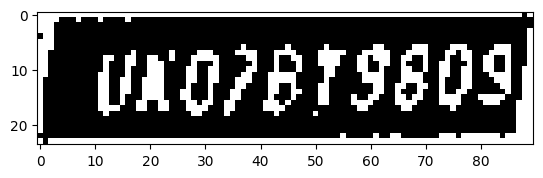

height =  81 width =  104
height =  320 width =  325


[150.4501190185547, 201.30068969726562, 241.0590362548828, 245.091552734375, 0.8841093182563782, 0.0] track_id: 254.0
-0.22266094063636496


[]
License Plate Number with contours :  None , Score :  None
-0.23109066719589708
['UK07B9809']
license before check UK07B9809
license after check UK07B9809
License Plate Number :  UK07B9809 , Score :  0.41487089778718084


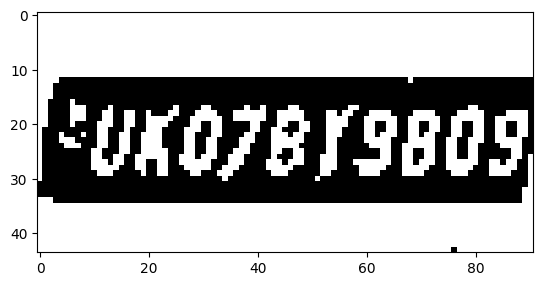

height =  81 width =  103
height =  334 width =  341


[160.67330932617188, 211.68145751953125, 255.33578491210938, 258.2271728515625, 0.8886597156524658, 0.0] track_id: 254.0
-0.22923193327699534
['UKO7B9809']
license before check UKO7B9809
license after check UKO7B9809
License Plate Number with contours :  UK07B9809 , Score :  0.14011832711034874


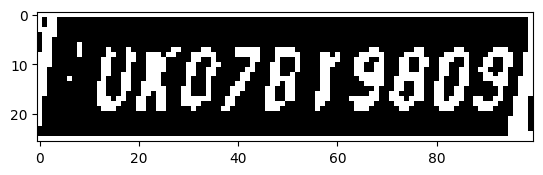

height =  81 width =  104
height =  347 width =  358


[170.84506225585938, 221.9213409423828, 271.4859313964844, 269.6962890625, 0.8976626396179199, 0.0] track_id: 254.0
-0.23052183904336873


['UK07879809']
license before check UK07879809
hello
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['Euk078t9803']
license before check Euk078t9803
hello
License Plate Number :  None , Score :  None
height =  370 width =  377


[182.5277557373047, 239.46751403808594, 288.40777587890625, 288.4368591308594, 0.8922289609909058, 0.0] track_id: 254.0
-0.22390450013034954


['UKO78Y9803']
license before check UKO78Y9803
hello
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['VUK078T9809']
license before check VUK078T9809
hello
License Plate Number :  None , Score :  None
height =  82 width =  104
height =  384 width =  400


[197.13485717773438, 253.50967407226562, 308.79217529296875, 306.7303466796875, 0.886629581451416, 0.0] track_id: 254.0
-0.20112688581653948
['Uk07ex9809']
license before check Uk07ex9809
license after check UK07EX9809
License Plate Number with contours :  UK07EX9809 , Score :  0.3286926166180134


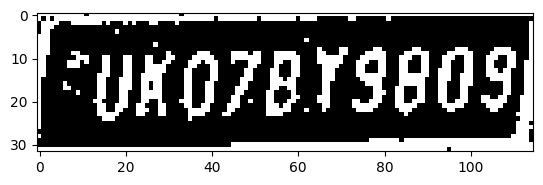

height =  82 width =  102
height =  397 width =  425


[212.83724975585938, 266.49169921875, 331.84710693359375, 322.5395812988281, 0.9013844132423401, 0.0] track_id: 254.0
-0.22615243573280183


['Uk079t9809']
license before check Uk079t9809
hello
License Plate Number with contours :  None , Score :  None
-0.22347660114063303
['UK07BY9809']
license before check UK07BY9809
license after check UK07BY9809
License Plate Number :  UK07BY9809 , Score :  0.3794729058938669


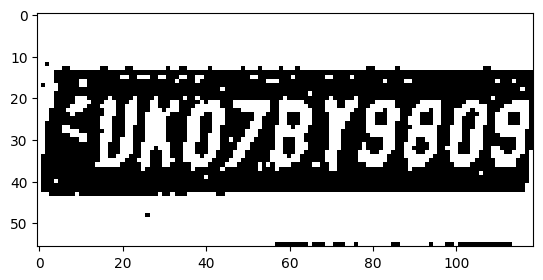

height =  418 width =  452
[229.75587463378906, 281.9126281738281, 356.03125, 340.4076843261719, 0.9155679941177368, 0.0] track_id: 254.0
-0.20612134187530706
height =  438 width =  486
[251.3907928466797, 299.85430908203125, 384.57861328125, 361.531494140625, 0.9179597496986389, 0.0] track_id: 254.0
-0.23032173232245376
height =  472 width =  526


[278.331298828125, 323.2978515625, 421.71990966796875, 390.5793151855469, 0.9153721928596497, 0.0] track_id: 254.0
-0.22887267336789618
['UK07bY9809']
license before check UK07bY9809
license after check UK07BY9809
License Plate Number with contours :  UK07BY9809 , Score :  0.24852761748758723


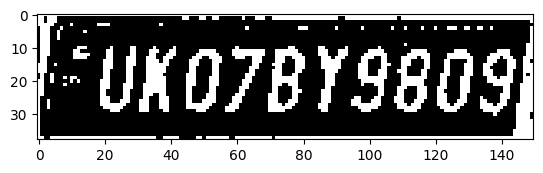

height =  502 width =  572


[312.9427185058594, 349.0509033203125, 465.3022155761719, 419.41619873046875, 0.9209685325622559, 0.0] track_id: 254.0
-0.22631830988808688
['UKO7bY9809']
license before check UKO7bY9809
license after check UKO7BY9809
License Plate Number with contours :  UK07BY9809 , Score :  0.1797341726166059


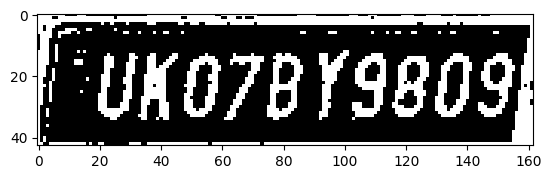

height =  96 width =  200
height =  549 width =  621


[350.26416015625, 386.2995300292969, 513.0458374023438, 462.1408386230469, 0.9083654880523682, 0.0] track_id: 254.0
-0.22679884805388587
['UK07BY9809']
license before check UK07BY9809
license after check UK07BY9809
License Plate Number with contours :  UK07BY9809 , Score :  0.6896345958377216


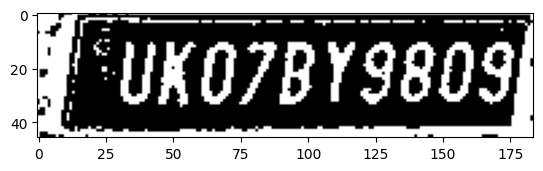

height =  101 width =  217
height =  597 width =  677


[393.9571533203125, 426.50555419921875, 572.3131103515625, 511.24664306640625, 0.9211288690567017, 0.0] track_id: 254.0
-0.2260683879938839
['UK07BY9809']
license before check UK07BY9809
license after check UK07BY9809
License Plate Number with contours :  UK07BY9809 , Score :  0.6217608816093023


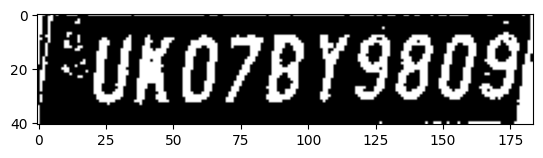

height =  102 width =  225
height =  653 width =  746


[452.11865234375, 473.7305908203125, 644.322998046875, 565.1099243164062, 0.9161718487739563, 0.0] track_id: 254.0
-0.24601493218598205


['UK']
license before check UK
hello
License Plate Number with contours :  None , Score :  None
-0.2284966392918623
['UK07BY9809']
license before check UK07BY9809
license after check UK07BY9809
License Plate Number :  UK07BY9809 , Score :  0.7280477002927878


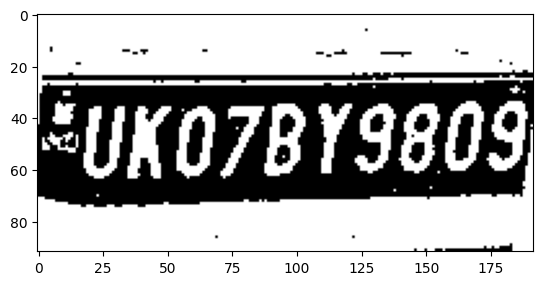

height =  102 width =  228
height =  718 width =  825


[522.9486083984375, 526.78125, 730.1427612304688, 630.1968994140625, 0.9136987328529358, 0.0] track_id: 254.0
-0.2751892491291713


[]
License Plate Number with contours :  None , Score :  None
-0.26199272800824464
['UK07BY9809']
license before check UK07BY9809
license after check UK07BY9809
License Plate Number :  UK07BY9809 , Score :  0.8585779530336061


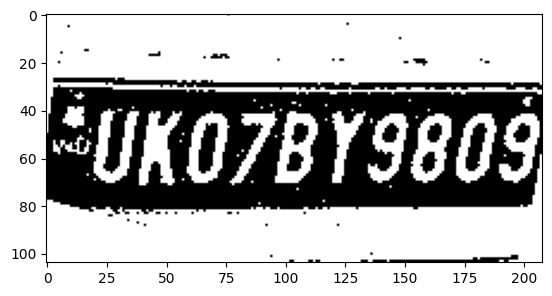

height =  0 width =  229
height =  801 width =  922


[614.6569213867188, 594.781494140625, 836.6253662109375, 712.0111083984375, 0.9238439202308655, 0.0] track_id: 254.0
-0.29736514522392365


['K']
license before check K
hello
License Plate Number with contours :  None , Score :  None
-0.2936929267078246
['UK07BY9809']
license before check UK07BY9809
license after check UK07BY9809
License Plate Number :  UK07BY9809 , Score :  0.6979206348044159


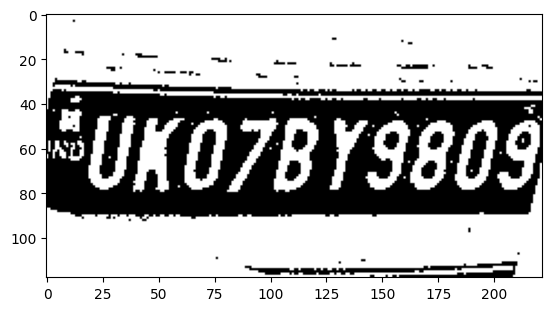

height =  0 width =  230
height =  899 width =  1033


[732.1588134765625, 677.0098876953125, 966.7999877929688, 812.4610595703125, 0.9211567640304565, 0.0] track_id: 254.0
-0.3324263053840973


['K']
license before check K
hello
License Plate Number with contours :  None , Score :  None
-0.27829965900511133
['UK07BY9809']
license before check UK07BY9809
license after check UK07BY9809
License Plate Number :  UK07BY9809 , Score :  0.7293441878066419


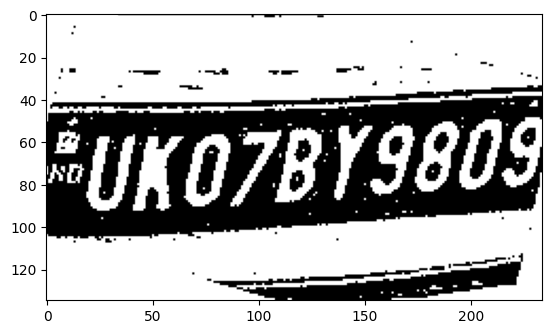

height =  102 width =  230
height =  1026 width =  1154


[877.441162109375, 776.3397216796875, 1118.412353515625, 934.0668334960938, 0.9222696423530579, 0.0] track_id: 254.0
-0.33424990341600386


['B']
license before check B
hello
License Plate Number with contours :  None , Score :  None
-0.41549209594089065
['UK07BY9809']
license before check UK07BY9809
license after check UK07BY9809
License Plate Number :  UK07BY9809 , Score :  0.6947854985586017


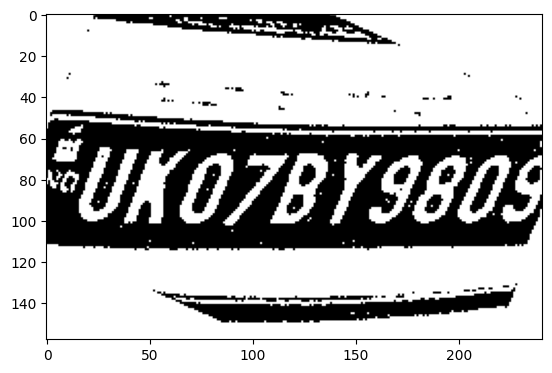

height =  1167 width =  1304


[1057.09765625, 860.7927856445312, 1296.849609375, 1081.999267578125, 0.8829283714294434, 0.0] track_id: 254.0
-0.47046181358109507


[]
License Plate Number with contours :  None , Score :  None
-0.5425793241259905
['UXo7br9bos']
license before check UXo7br9bos
hello
License Plate Number :  None , Score :  None
height =  1252 width =  1478
height =  1274 width =  1665
height =  1260 width =  1838
height =  1251 width =  1925
height =  1272 width =  1909
height =  1243 width =  1841
height =  1134 width =  1717
height =  1034 width =  1561
height =  970 width =  1351
height =  602 width =  608
height =  77 width =  96
height =  78 width =  97
height =  79 width =  97
height =  80 width =  100
height =  78 width =  99
height =  77 width =  98
height =  78 width =  97
height =  81 width =  100
height =  83 width =  102
height =  81 width =  102
height =  80 width =  103
height =  79 width =  100
height =  80 width =  99
height =  80 width =  100
height =  79 width =  98
height =  77 width =  97
height =  78 width =  97
height =  79 width =  97
height =  79 width =  97
height =  74 width =  95
height =  78 width =  99
h

[0.0, 12.389537811279297, 20.20427703857422, 37.35512924194336, 0.290472149848938, 0.0] track_id: 258.0
[]
License Plate Number :  None , Score :  None
height =  75 width =  97
height =  92 width =  102
height =  76 width =  98
height =  97 width =  105
height =  78 width =  100
height =  99 width =  106
height =  77 width =  99
height =  101 width =  108
height =  100 width =  109
height =  76 width =  95
height =  102 width =  110
height =  77 width =  96
height =  103 width =  115
height =  77 width =  95
height =  110 width =  118
height =  76 width =  96
height =  112 width =  121
height =  74 width =  92
height =  113 width =  124
height =  74 width =  89
height =  119 width =  127
height =  75 width =  91
height =  120 width =  132
height =  76 width =  92
height =  125 width =  135
height =  76 width =  93
height =  129 width =  139
height =  74 width =  86
height =  128 width =  139
height =  130 width =  138


[65.23065948486328, 69.75300598144531, 99.08970642089844, 85.36804962158203, 0.5287345051765442, 0.0] track_id: 258.0
-0.22923193327699534


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  136 width =  140
[65.3055648803711, 72.61587524414062, 100.09689331054688, 88.01481628417969, 0.30050334334373474, 0.0] track_id: 258.0
-0.225601243836024
height =  74 width =  91
height =  142 width =  146
[69.52262878417969, 77.26608276367188, 102.78691101074219, 92.43561553955078, 0.6474589705467224, 0.0] track_id: 258.0
-0.23501221572065709
height =  145 width =  148
[70.49386596679688, 78.07923126220703, 106.23566436767578, 96.29818725585938, 0.8101264238357544, 0.0] track_id: 258.0
-0.23974310887045658
height =  181 width =  174
[82.4194107055664, 99.61114501953125, 125.65868377685547, 120.62647247314453, 0.8757516741752625, 0.0] track_id: 258.0
-0.23040243605886154
height =  188 width =  179
[85.33625793457031, 104.62446594238281, 130.10968017578125, 126.36457824707031, 0.8779646158218384, 0.0] track_id: 258.0
-0.2172934309230211
height =  189 width =  186
[89.

[97.77071380615234, 112.88948822021484, 148.4840545654297, 139.09735107421875, 0.8959884643554688, 0.0] track_id: 258.0
-0.22768931976865586


[]
License Plate Number with contours :  None , Score :  None
-0.2347226124851971
[]
License Plate Number :  None , Score :  None
height =  210 width =  211
[99.53046417236328, 115.0884017944336, 151.95262145996094, 141.4193878173828, 0.9000426530838013, 0.0] track_id: 258.0
-0.22679884805388587
height =  218 width =  217


[103.68690490722656, 119.63463592529297, 158.14720153808594, 146.51611328125, 0.8969864249229431, 0.0] track_id: 258.0
-0.22208190190548016


[]
License Plate Number with contours :  None , Score :  None
-0.23109066719589708
['TInfju']
license before check TInfju
hello
License Plate Number :  None , Score :  None
height =  221 width =  226
[108.3863754272461, 123.38595581054688, 164.70465087890625, 151.36611938476562, 0.8938830494880676, 0.0] track_id: 258.0
-0.22208190190548016
height =  228 width =  233
[112.14215850830078, 128.22874450683594, 171.25250244140625, 158.09397888183594, 0.9151723384857178, 0.0] track_id: 258.0
-0.22347660114063303
height =  236 width =  241


[116.0536880493164, 131.3739776611328, 176.62258911132812, 161.61802673339844, 0.905729353427887, 0.0] track_id: 258.0
-0.22082876972934834


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
['rIfoI']
license before check rIfoI
hello
License Plate Number :  None , Score :  None
height =  248 width =  250
[120.70172119140625, 136.39073181152344, 184.33387756347656, 167.8277587890625, 0.9058517217636108, 0.0] track_id: 258.0
-0.21293834957939714
height =  260 width =  261


[127.17064666748047, 142.39292907714844, 194.09671020507812, 175.4917449951172, 0.9067085385322571, 0.0] track_id: 258.0
-0.22208190190548016


['NPhUe']
license before check NPhUe
hello
License Plate Number with contours :  None , Score :  None
-0.2204937613666717
['Netedrj']
license before check Netedrj
hello
License Plate Number :  None , Score :  None
height =  274 width =  274


[134.6797637939453, 150.407470703125, 204.04051208496094, 184.16830444335938, 0.9059507846832275, 0.0] track_id: 258.0
-0.21979507152403238


['TfniJit']
license before check TfniJit
hello
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
['VP0rt']
license before check VP0rt
hello
License Plate Number :  None , Score :  None
height =  284 width =  285


[141.17965698242188, 156.5297393798828, 213.6206817626953, 192.2829132080078, 0.909149706363678, 0.0] track_id: 258.0
-0.22581168154335537


['51EDYSIJ']
license before check 51EDYSIJ
hello
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
['WPieoyjhjl']
license before check WPieoyjhjl
hello
License Plate Number :  None , Score :  None
height =  292 width =  303


[151.04360961914062, 160.59246826171875, 227.26751708984375, 198.16908264160156, 0.9076638221740723, 0.0] track_id: 258.0
-0.21866894587394195


['WFHEDIJIJU']
license before check WFHEDIJIJU
hello
License Plate Number with contours :  None , Score :  None
-0.2082059495239874
['FUPTep1J12t']
license before check FUPTep1J12t
hello
License Plate Number :  None , Score :  None
height =  307 width =  318


[161.07476806640625, 170.04183959960938, 241.11422729492188, 209.39028930664062, 0.9056202173233032, 0.0] track_id: 258.0
-0.2536740961386427
['Ur60Y3120']
license before check Ur60Y3120
license after check UR60Y3120
License Plate Number with contours :  UR60Y3120 , Score :  0.049770101178783714


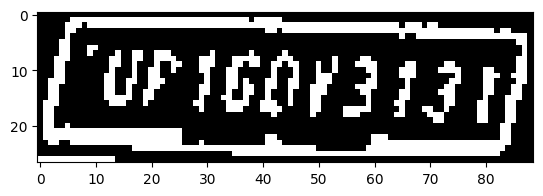

height =  321 width =  334


[170.91259765625, 177.55038452148438, 255.41883850097656, 218.89231872558594, 0.9047130346298218, 0.0] track_id: 258.0
-0.20902294280626463


['UP603138']
license before check UP603138
hello
License Plate Number with contours :  None , Score :  None
-0.22768931976865586
['FuP16013131']
license before check FuP16013131
hello
License Plate Number :  None , Score :  None
height =  332 width =  351


[180.43492126464844, 187.87698364257812, 268.370361328125, 230.30975341796875, 0.9149595499038696, 0.0] track_id: 258.0
-0.20831556258942585
['UP160Y3121']
license before check UP160Y3121
license after check UP160Y3121
License Plate Number with contours :  UP16OY3121 , Score :  0.3025375032076591


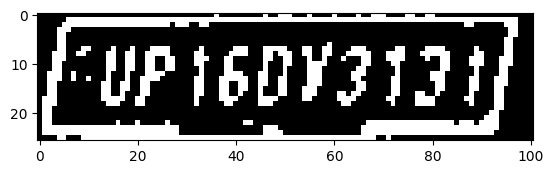

height =  348 width =  372


[194.7406005859375, 200.28939819335938, 287.85406494140625, 245.3239288330078, 0.9120222330093384, 0.0] track_id: 258.0
-0.20668321848424925


['Fup160y3130']
license before check Fup160y3130
hello
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
['CuP16DK31JI']
license before check CuP16DK31JI
hello
License Plate Number :  None , Score :  None
height =  371 width =  396


[210.84259033203125, 214.3258819580078, 310.48736572265625, 262.05633544921875, 0.9164602160453796, 0.0] track_id: 258.0
-0.207889927202263
['UP16013131']
license before check UP16013131
license after check UP16013131
License Plate Number with contours :  UP16OI3131 , Score :  0.7129771163907203


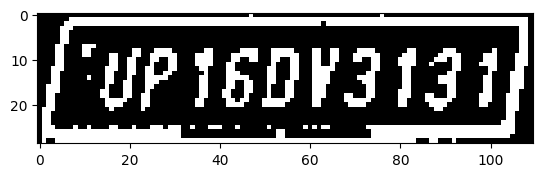

height =  97 width =  123
height =  396 width =  423


[229.336669921875, 231.1878204345703, 335.3913269042969, 281.7159729003906, 0.9109888076782227, 0.0] track_id: 258.0
-0.20478094994297488
['UP160K3131']
license before check UP160K3131
license after check UP160K3131
License Plate Number with contours :  UP16OK3131 , Score :  0.22676720896426109


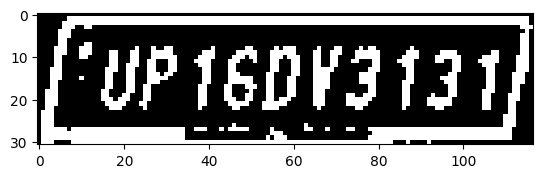

height =  90 width =  122
height =  425 width =  457


[252.02906799316406, 250.5372772216797, 365.30902099609375, 304.9502868652344, 0.9154595136642456, 0.0] track_id: 258.0
-0.1859456785557108
['UP16DV3131']
license before check UP16DV3131
license after check UP16DV3131
License Plate Number with contours :  UP16DV3131 , Score :  0.1944914193314179


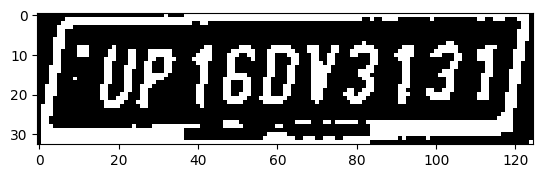

height =  83 width =  106
height =  453 width =  490


[275.9435119628906, 269.8079528808594, 397.217041015625, 327.116455078125, 0.9204021692276001, 0.0] track_id: 258.0
-0.18394345653717517


['UP160Y313']
license before check UP160Y313
hello
License Plate Number with contours :  None , Score :  None
-0.1925016348099795
['FUP160Y313']
license before check FUP160Y313
hello
License Plate Number :  None , Score :  None
height =  84 width =  104
height =  489 width =  531


[306.2055358886719, 297.939453125, 435.64581298828125, 359.6611328125, 0.9124727845191956, 0.0] track_id: 258.0
-0.20304521725346514
['UP1601313']
license before check UP1601313
license after check UP1601313
License Plate Number with contours :  UP16O1313 , Score :  0.5305176217053109


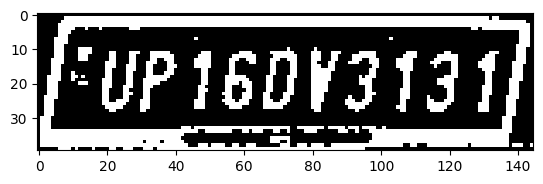

height =  86 width =  108
height =  526 width =  579


[341.4021911621094, 323.689208984375, 482.8418273925781, 389.7225646972656, 0.9189325571060181, 0.0] track_id: 258.0
-0.22679884805388587


['UP160V313']
license before check UP160V313
hello
License Plate Number with contours :  None , Score :  None
-0.19118445959701444
['UP160v313']
license before check UP160v313
hello
License Plate Number :  None , Score :  None
height =  89 width =  108
height =  570 width =  636


[387.2558288574219, 357.7708435058594, 538.8225708007812, 429.0879211425781, 0.9151843190193176, 0.0] track_id: 258.0
-0.18974264803173782


['UP160V313']
license before check UP160V313
hello
License Plate Number with contours :  None , Score :  None
-0.19424099618140395
['UP160v3131']
license before check UP160v3131
license after check UP160V3131
License Plate Number :  UP16OV3131 , Score :  0.6732433436130655


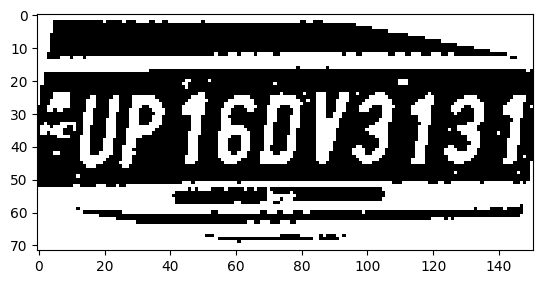

height =  89 width =  106
height =  625 width =  700


[441.71337890625, 400.24920654296875, 607.6939697265625, 479.2618408203125, 0.9138546586036682, 0.0] track_id: 258.0
-0.18131977440149022
['UP160V3133']
license before check UP160V3133
license after check UP160V3133
License Plate Number with contours :  UP16OV3133 , Score :  0.3895503691027426


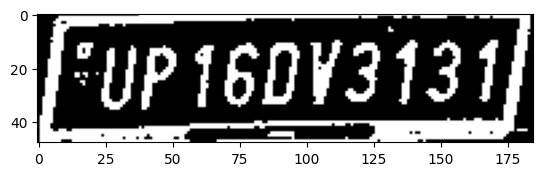

height =  93 width =  108
height =  682 width =  780


[511.7667541503906, 447.44451904296875, 692.5806884765625, 533.9149169921875, 0.9223946928977966, 0.0] track_id: 258.0
-0.20749622643520266


['FUP16093131']
license before check FUP16093131
hello
License Plate Number with contours :  None , Score :  None
-0.20982831175965547
['UP160V3131']
license before check UP160V3131
license after check UP160V3131
License Plate Number :  UP16OV3131 , Score :  0.3694747534831522


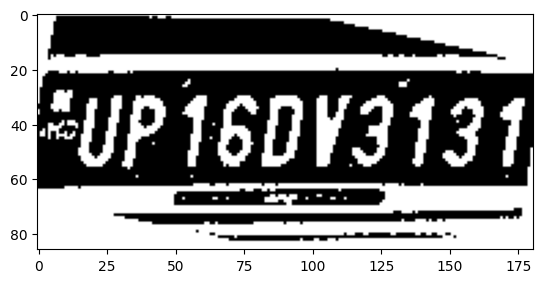

height =  748 width =  877


[601.8153686523438, 504.4782409667969, 799.4266357421875, 600.6586303710938, 0.9185183048248291, 0.0] track_id: 258.0
-0.24233316665301483


['UP160V313']
license before check UP160V313
hello
License Plate Number with contours :  None , Score :  None
-0.22631830988808688
['UP160V3131']
license before check UP160V3131
license after check UP160V3131
License Plate Number :  UP16OV3131 , Score :  0.2704535608006411


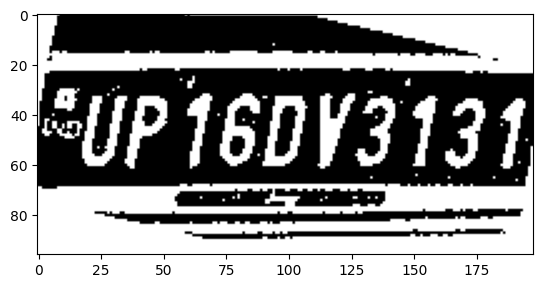

height =  837 width =  990


[719.903076171875, 579.9838256835938, 932.013427734375, 687.4768676757812, 0.9236193895339966, 0.0] track_id: 258.0
-0.25942210312457376


['FUP160Y3131']
license before check FUP160Y3131
hello
License Plate Number with contours :  None , Score :  None
-0.2765139466174741
['PUP160V313']
license before check PUP160V313
hello
License Plate Number :  None , Score :  None
height =  948 width =  1120


[871.2439575195312, 676.23486328125, 1092.417236328125, 803.646240234375, 0.9041697978973389, 0.0] track_id: 258.0
-0.3164314556251264


['LUP16013131']
license before check LUP16013131
hello
License Plate Number with contours :  None , Score :  None
-0.32571878753567557
['UP16013131']
license before check UP16013131
license after check UP16013131
License Plate Number :  UP16OI3131 , Score :  0.59575494100811


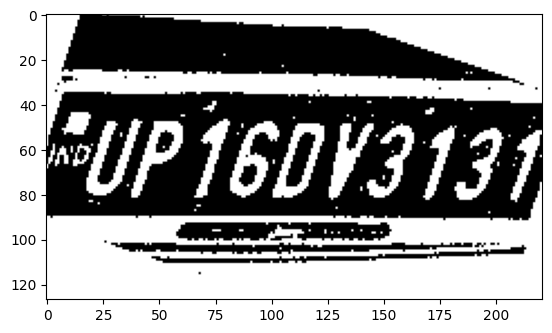

height =  92 width =  105
height =  1078 width =  1280
[1073.835205078125, 706.8499145507812, 1279.638916015625, 935.6752319335938, 0.8185985088348389, 0.0] track_id: 258.0
-0.36644919626389544
height =  90 width =  106
height =  1236 width =  1461
height =  1339 width =  1679
height =  1370 width =  1876
height =  1362 width =  1925
height =  1337 width =  1882
height =  1319 width =  1798
height =  1309 width =  1691
height =  1270 width =  1536
height =  1204 width =  1315
height =  1098 width =  1021
height =  975 width =  631
height =  78 width =  99
height =  78 width =  96
height =  81 width =  97
height =  83 width =  99
height =  82 width =  98
height =  79 width =  96
height =  81 width =  79
height =  80 width =  78
height =  79 width =  98
height =  83 width =  84
height =  72 width =  102
height =  92 width =  91
height =  93 width =  97
height =  96 width =  96
height =  99 width =  98
height =  101 width =  102
height =  105 width =  105
height =  115 width =  119
height

[62.105220794677734, 89.17916870117188, 98.6241226196289, 106.8839111328125, 0.32995083928108215, 0.0] track_id: 261.0
-0.225601243836024


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  145 width =  138
height =  164 width =  139
[61.535274505615234, 109.13290405273438, 102.88162994384766, 128.18980407714844, 0.7075071334838867, 0.0] track_id: 261.0
-0.23210383807515567
height =  164 width =  142


[62.535945892333984, 108.25204467773438, 104.64069366455078, 127.87178039550781, 0.8485023379325867, 0.0] track_id: 261.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.23860932250820097
[]
License Plate Number :  None , Score :  None
height =  166 width =  144
[60.14301300048828, 108.61376953125, 104.19514465332031, 128.91986083984375, 0.6856970191001892, 0.0] track_id: 261.0
-0.21866894587394195
height =  170 width =  144
[60.028507232666016, 111.41490936279297, 104.7573013305664, 132.3296356201172, 0.8867159485816956, 0.0] track_id: 261.0
-0.225601243836024
height =  174 width =  147


[62.576377868652344, 114.31407165527344, 107.5978775024414, 135.9405517578125, 0.901301920413971, 0.0] track_id: 261.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.2213144423477913
[]
License Plate Number :  None , Score :  None
height =  181 width =  151


[63.42791748046875, 119.26651000976562, 110.24483489990234, 141.13185119628906, 0.9049151539802551, 0.0] track_id: 261.0
-0.22923193327699534


[]
License Plate Number with contours :  None , Score :  None
-0.22347660114063303
['F23E']
license before check F23E
hello
License Plate Number :  None , Score :  None
height =  187 width =  156


[66.16788482666016, 124.77208709716797, 113.520263671875, 147.1195526123047, 0.8793202638626099, 0.0] track_id: 261.0
-0.220248723390689


[]
License Plate Number with contours :  None , Score :  None
-0.2284966392918623
[]
License Plate Number :  None , Score :  None
height =  188 width =  162
[69.00918579101562, 128.33018493652344, 118.17568969726562, 148.8881378173828, 0.8504503965377808, 0.0] track_id: 261.0
-0.22290023232837577
height =  195 width =  168


[70.87165832519531, 129.01190185546875, 121.40478515625, 152.4475860595703, 0.8875705003738403, 0.0] track_id: 261.0
-0.2408464552414116


[]
License Plate Number with contours :  None , Score :  None
-0.23374318086890142
['di']
license before check di
hello
License Plate Number :  None , Score :  None
height =  198 width =  174


[73.75167083740234, 130.55198669433594, 125.9289779663086, 154.5304718017578, 0.8920981884002686, 0.0] track_id: 261.0
-0.20687394897974307


[]
License Plate Number with contours :  None , Score :  None
-0.2347226124851971
[]
License Plate Number :  None , Score :  None
height =  198 width =  176


[74.23387908935547, 130.00112915039062, 127.1688003540039, 155.0264434814453, 0.9110062122344971, 0.0] track_id: 261.0
-0.24207169457111893


[]
License Plate Number with contours :  None , Score :  None
-0.21406068356382152
['5I33']
license before check 5I33
hello
License Plate Number :  None , Score :  None
height =  201 width =  180


[76.3587646484375, 131.66412353515625, 131.3926544189453, 156.70217895507812, 0.8942427635192871, 0.0] track_id: 261.0
-0.2086817623350266


[]
License Plate Number with contours :  None , Score :  None
-0.22527677921405528
['7r0r']
license before check 7r0r
hello
License Plate Number :  None , Score :  None
height =  205 width =  183


[76.1502685546875, 134.2637939453125, 132.31854248046875, 160.3168487548828, 0.90845787525177, 0.0] track_id: 261.0
-0.2086817623350266


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  210 width =  188


[80.30326843261719, 137.8287353515625, 137.8706817626953, 164.76194763183594, 0.9086130261421204, 0.0] track_id: 261.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  214 width =  196


[84.83032989501953, 140.14971923828125, 145.30734252929688, 166.54446411132812, 0.8963516354560852, 0.0] track_id: 261.0
-0.22768931976865586


[]
License Plate Number with contours :  None , Score :  None
-0.22527677921405528
['WRILZEZE']
license before check WRILZEZE
hello
License Plate Number :  None , Score :  None
height =  219 width =  204


[90.27494812011719, 143.7830047607422, 151.94296264648438, 172.13595581054688, 0.9073736667633057, 0.0] track_id: 261.0
-0.23109066719589708


[]
License Plate Number with contours :  None , Score :  None
-0.22266094063636496
['ptiztI']
license before check ptiztI
hello
License Plate Number :  None , Score :  None
height =  228 width =  208


[91.32011413574219, 145.70977783203125, 155.16188049316406, 175.67893981933594, 0.9109193682670593, 0.0] track_id: 261.0
-0.23228898897102182


[]
License Plate Number with contours :  None , Score :  None
-0.23684876094692026
[]
License Plate Number :  None , Score :  None
height =  235 width =  218


[96.40751647949219, 149.81491088867188, 162.82579040527344, 180.95895385742188, 0.9121881127357483, 0.0] track_id: 261.0
-0.21866894587394195


[]
License Plate Number with contours :  None , Score :  None
-0.225601243836024
['V712E42fZ']
license before check V712E42fZ
hello
License Plate Number :  None , Score :  None
height =  243 width =  226


[99.58379364013672, 154.5908966064453, 168.9783172607422, 186.44871520996094, 0.9118298888206482, 0.0] track_id: 261.0
-0.2260683879938839


['Vui']
license before check Vui
hello
License Plate Number with contours :  None , Score :  None
-0.23210383807515567
['U1E9i7622']
license before check U1E9i7622
hello
License Plate Number :  None , Score :  None
height =  249 width =  232


[102.87165069580078, 157.23143005371094, 175.06967163085938, 190.9864044189453, 0.9051586985588074, 0.0] track_id: 261.0
-0.20278150417940963


['0fIEr6']
license before check 0fIEr6
hello
License Plate Number with contours :  None , Score :  None
-0.20902294280626463
['VP12861624']
license before check VP12861624
hello
License Plate Number :  None , Score :  None
height =  102 width =  104
height =  259 width =  243


[109.32096862792969, 163.2467498779297, 184.26766967773438, 198.65745544433594, 0.9067940711975098, 0.0] track_id: 261.0
-0.24289533280760475


['P1252']
license before check P1252
hello
License Plate Number with contours :  None , Score :  None
-0.23109066719589708
['UP12852622']
license before check UP12852622
hello
License Plate Number :  None , Score :  None
height =  97 width =  104
height =  267 width =  253


[113.69544219970703, 172.13314819335938, 191.6338348388672, 208.40020751953125, 0.9153439402580261, 0.0] track_id: 261.0
-0.22545836628305996


['16R824']
license before check 16R824
hello
License Plate Number with contours :  None , Score :  None
-0.22785704871709972
['UP126R26247']
license before check UP126R26247
hello
License Plate Number :  None , Score :  None
height =  104 width =  111
height =  272 width =  265


[120.44921112060547, 179.9599609375, 201.12852478027344, 217.42457580566406, 0.9190440773963928, 0.0] track_id: 261.0
-0.22347660114063303


['DFZ8F2624']
license before check DFZ8F2624
hello
License Plate Number with contours :  None , Score :  None
-0.21018258666216955
['UP12852624']
license before check UP12852624
hello
License Plate Number :  None , Score :  None
height =  101 width =  115
height =  288 width =  280


[129.0487823486328, 188.2457733154297, 213.0284881591797, 228.42579650878906, 0.9097670316696167, 0.0] track_id: 261.0
-0.22615243573280183
['UF1200262']
license before check UF1200262
license after check UF1200262
License Plate Number with contours :  UF12O0262 , Score :  0.17934631367530246


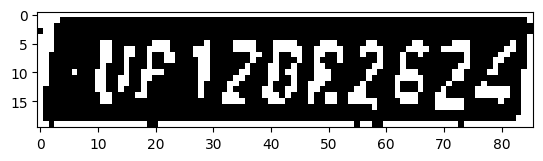

height =  94 width =  115
height =  303 width =  292


[137.1876678466797, 197.72921752929688, 224.28826904296875, 238.54283142089844, 0.9112458825111389, 0.0] track_id: 261.0
-0.17573829668536678


['UP12872624']
license before check UP12872624
hello
License Plate Number with contours :  None , Score :  None
-0.22768931976865586
['UP12BR2622']
license before check UP12BR2622
license after check UP12BR2622
License Plate Number :  UP12BR2622 , Score :  0.15559099437958468


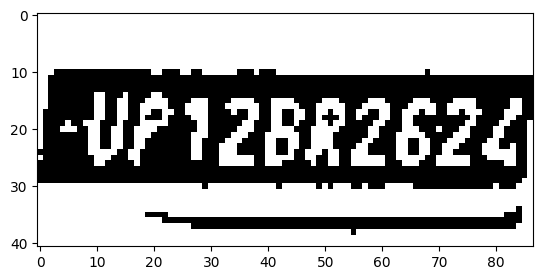

height =  110 width =  119
height =  316 width =  307


[146.36239624023438, 207.5526580810547, 238.8548126220703, 250.39529418945312, 0.9130845069885254, 0.0] track_id: 261.0
-0.20374468088385697


['UP12882624']
license before check UP12882624
hello
License Plate Number with contours :  None , Score :  None
-0.2086817623350266
['FUP12BR2524']
license before check FUP12BR2524
hello
License Plate Number :  None , Score :  None
height =  124 width =  126
height =  329 width =  324


[155.99639892578125, 218.89166259765625, 252.8978729248047, 264.1091003417969, 0.9189947247505188, 0.0] track_id: 261.0
-0.20749622643520266


['UPIZBR262']
license before check UPIZBR262
hello
License Plate Number with contours :  None , Score :  None
-0.2216495629786776
['VP128R262L']
license before check VP128R262L
hello
License Plate Number :  None , Score :  None
height =  126 width =  125
height =  345 width =  343


[166.3288116455078, 230.6910400390625, 268.09503173828125, 277.5726318359375, 0.9122611284255981, 0.0] track_id: 261.0
-0.225601243836024
['UP12BR2624']
license before check UP12BR2624
license after check UP12BR2624
License Plate Number with contours :  UP12BR2624 , Score :  0.28259135224900905


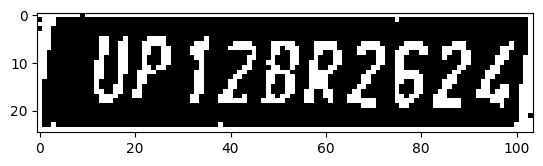

height =  131 width =  127
height =  64 width =  65
height =  365 width =  364


[181.79852294921875, 247.1345672607422, 288.35137939453125, 296.88165283203125, 0.9044579863548279, 0.0] track_id: 261.0
-0.2279670718215078


['UP12BRZ6ZL']
license before check UP12BRZ6ZL
hello
License Plate Number with contours :  None , Score :  None
-0.22290023232837577
['UP12BR2624']
license before check UP12BR2624
license after check UP12BR2624
License Plate Number :  UP12BR2624 , Score :  0.14734308084815423


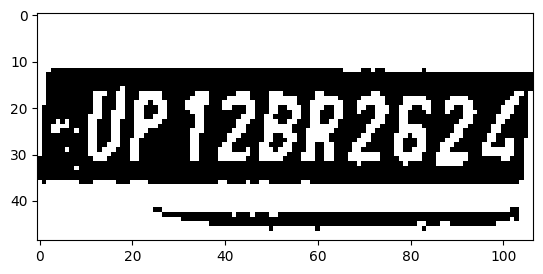

height =  137 width =  134
height =  384 width =  387


[194.84228515625, 262.1601257324219, 308.5040588378906, 314.2301330566406, 0.9102392196655273, 0.0] track_id: 261.0
-0.20846521837998772
['UP12BR2622']
license before check UP12BR2622
license after check UP12BR2622
License Plate Number with contours :  UP12BR2622 , Score :  0.2448152644264359


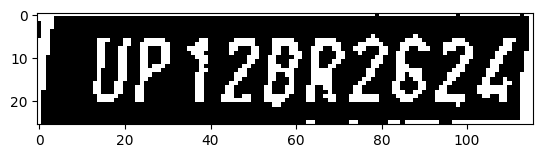

height =  138 width =  133
height =  61 width =  62
height =  405 width =  413


[210.8688201904297, 279.17181396484375, 330.9622802734375, 333.8077087402344, 0.9206724762916565, 0.0] track_id: 261.0
-0.21050956212735614


['UP128R2624']
license before check UP128R2624
hello
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
['UPI2BR262L']
license before check UPI2BR262L
license after check UPI2BR262L
License Plate Number :  UP12BR2624 , Score :  0.3411484816025242


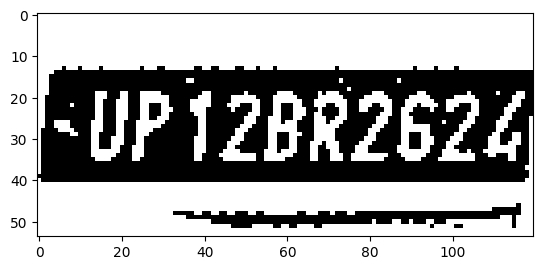

height =  140 width =  134
height =  62 width =  61
height =  435 width =  444


[229.16268920898438, 300.2676086425781, 356.7060546875, 358.7305908203125, 0.9162540435791016, 0.0] track_id: 261.0
-0.2059008225558759
['UP12BR2624']
license before check UP12BR2624
license after check UP12BR2624
License Plate Number with contours :  UP12BR2624 , Score :  0.4785034505291889


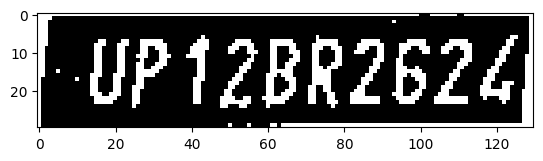

height =  144 width =  140
height =  58 width =  68
height =  462 width =  480


[254.98077392578125, 323.3668518066406, 390.8646240234375, 386.6854553222656, 0.9244878888130188, 0.0] track_id: 261.0
-0.21313102780437307
['UP12BR2624']
license before check UP12BR2624
license after check UP12BR2624
License Plate Number with contours :  UP12BR2624 , Score :  0.3463921959446597


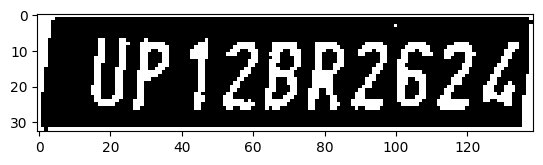

height =  149 width =  142
height =  497 width =  520


[284.6122741699219, 348.2420654296875, 430.0069885253906, 416.5348205566406, 0.9167120456695557, 0.0] track_id: 261.0
-0.2247111684146427


['UP12BR26ZL']
license before check UP12BR26ZL
hello
License Plate Number with contours :  None , Score :  None
-0.22382797147051578
['UP12BR262L']
license before check UP12BR262L
license after check UP12BR262L
License Plate Number :  UP12BR2624 , Score :  0.6548759756844664


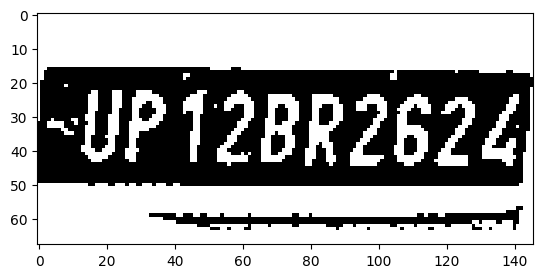

height =  154 width =  144
height =  536 width =  570


[320.76947021484375, 381.3918762207031, 477.53448486328125, 455.5334777832031, 0.9210165739059448, 0.0] track_id: 261.0
-0.20707267711703156
['UP12BR2624']
license before check UP12BR2624
license after check UP12BR2624
License Plate Number with contours :  UP12BR2624 , Score :  0.45638359083119423


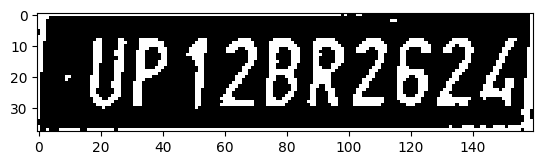

height =  158 width =  145
[61.59275817871094, 95.23268127441406, 99.38478088378906, 113.0122299194336, 0.2627340257167816, 0.0] track_id: 262.0
-0.25044308961135187
height =  581 width =  625


[364.9351501464844, 418.59326171875, 532.1990966796875, 501.0355529785156, 0.9142810106277466, 0.0] track_id: 261.0
-0.2251661964433018
['UP12BR262L']
license before check UP12BR262L
license after check UP12BR262L
License Plate Number with contours :  UP12BR2624 , Score :  0.676348155739469


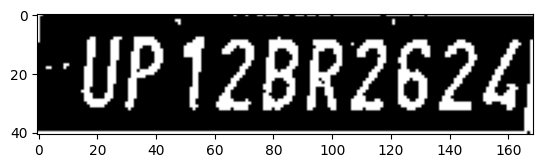

height =  161 width =  147
[62.37467956542969, 96.39523315429688, 100.80615997314453, 114.31055450439453, 0.3848179578781128, 0.0] track_id: 262.0
-0.2687030246351711
height =  631 width =  688


[414.379150390625, 461.7747497558594, 599.6586303710938, 550.6771850585938, 0.9220545291900635, 0.0] track_id: 261.0
-0.2227600978001451
['UP12BR262L']
license before check UP12BR262L
license after check UP12BR262L
License Plate Number with contours :  UP12BR2624 , Score :  0.49941839995411025


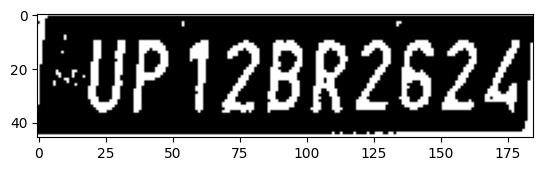

height =  164 width =  151
[63.7746696472168, 99.09994506835938, 103.80973052978516, 117.88042449951172, 0.43486839532852173, 0.0] track_id: 262.0
-0.21293834957939714
height =  692 width =  767


[484.32293701171875, 513.5853271484375, 683.2456665039062, 615.0023193359375, 0.9238462448120117, 0.0] track_id: 261.0
-0.26265637946916537
['UP12BR2624']
license before check UP12BR2624
license after check UP12BR2624
License Plate Number with contours :  UP12BR2624 , Score :  0.6870253223468226


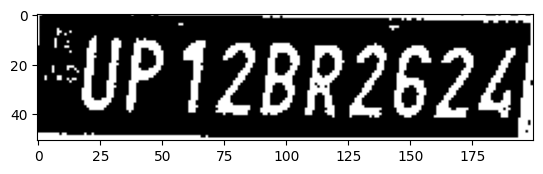

height =  771 width =  859


[572.03515625, 582.7654418945312, 782.1419677734375, 696.0289916992188, 0.9182141423225403, 0.0] track_id: 261.0
-0.2600312895821321


['FUP12BR2624']
license before check FUP12BR2624
hello
License Plate Number with contours :  None , Score :  None
-0.26188526468051904
['UP12BR262L']
license before check UP12BR262L
license after check UP12BR262L
License Plate Number :  UP12BR2624 , Score :  0.4973207694140495


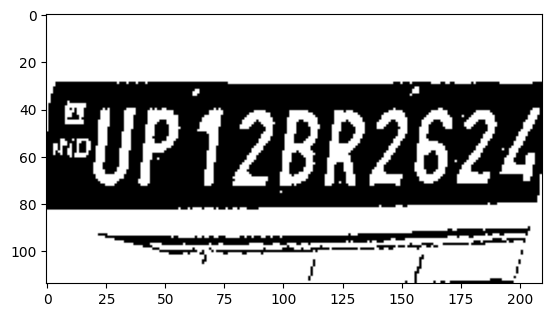

height =  173 width =  161
[71.60466766357422, 103.39524841308594, 114.03749084472656, 123.84770202636719, 0.7434207797050476, 0.0] track_id: 262.0
-0.1343214419529685
height =  858 width =  967


[682.3038330078125, 660.8842163085938, 906.2420654296875, 790.9793090820312, 0.9214534163475037, 0.0] track_id: 261.0
-0.3313965574643195


['EUPI2BR2624']
license before check EUPI2BR2624
hello
License Plate Number with contours :  None , Score :  None
-0.29715349008386427
['UP12BR2624']
license before check UP12BR2624
license after check UP12BR2624
License Plate Number :  UP12BR2624 , Score :  0.5958229480491161


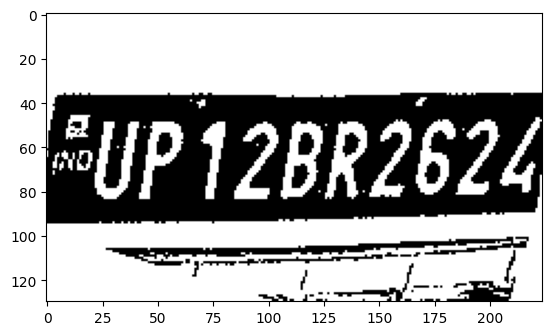

height =  154 width =  164
[72.4760971069336, 81.38672637939453, 115.5569076538086, 103.15505981445312, 0.28857487440109253, 0.0] track_id: 262.0
-0.23374318086890142
height =  966 width =  1091


[823.8756713867188, 760.1896362304688, 1050.67919921875, 911.1279296875, 0.9095974564552307, 0.0] track_id: 261.0
-0.40122879900484876


['FUP12BR2624']
license before check FUP12BR2624
hello
License Plate Number with contours :  None , Score :  None
-0.39990429646811904
['UP12BR2622']
license before check UP12BR2622
license after check UP12BR2622
License Plate Number :  UP12BR2622 , Score :  0.6202441524121476


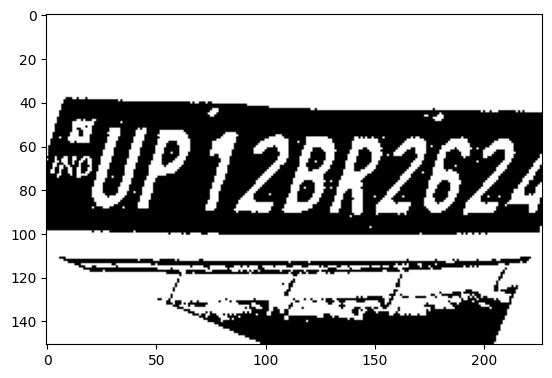

height =  169 width =  167
[73.98294830322266, 94.68138122558594, 118.86270904541016, 114.7123794555664, 0.59288090467453, 0.0] track_id: 262.0
-0.3507279482482035
height =  1094 width =  1227
[996.3987426757812, 871.1795654296875, 1221.9837646484375, 1046.9794921875, 0.8642474412918091, 0.0] track_id: 261.0
-0.507098504392337
height =  184 width =  174
[76.71192932128906, 110.1357192993164, 122.65342712402344, 132.35748291015625, 0.47546541690826416, 0.0] track_id: 262.0
-0.2567083304333857
height =  1227 width =  1373
[1189.00537109375, 928.723388671875, 1372.8203125, 1210.120361328125, 0.3654053509235382, 0.0] track_id: 261.0
-0.6840516601317805
height =  196 width =  177
[76.5781021118164, 116.76476287841797, 123.31587982177734, 138.43052673339844, 0.7639890313148499, 0.0] track_id: 262.0
-0.23783592745745075
height =  1285 width =  1552
height =  203 width =  180
[77.46658325195312, 119.26339721679688, 125.90156555175781, 146.13229370117188, 0.8677635788917542, 0.0] track_id: 262.

[85.88993835449219, 133.5714111328125, 139.60914611816406, 162.49208068847656, 0.8582599759101868, 0.0] track_id: 262.0
-0.2591020177794102


[]
License Plate Number with contours :  None , Score :  None
-0.2347226124851971
[]
License Plate Number :  None , Score :  None
height =  1156 width =  1573
height =  234 width =  206


[88.47201538085938, 137.41500854492188, 146.0495147705078, 166.94863891601562, 0.8587996959686279, 0.0] track_id: 262.0
-0.2591020177794102


[]
License Plate Number with contours :  None , Score :  None
-0.2401710078601731
[]
License Plate Number :  None , Score :  None
height =  1061 width =  1389
height =  243 width =  215


[94.0672378540039, 145.1115264892578, 154.46014404296875, 178.5894775390625, 0.8229666948318481, 0.0] track_id: 262.0
-0.259940140188528


[]
License Plate Number with contours :  None , Score :  None
-0.2405342479459046
['YfWt']
license before check YfWt
hello
License Plate Number :  None , Score :  None
height =  954 width =  1149
height =  254 width =  224


[98.43386840820312, 152.1673126220703, 160.25892639160156, 184.9435577392578, 0.8451148271560669, 0.0] track_id: 262.0
-0.22679884805388587


[]
License Plate Number with contours :  None , Score :  None
-0.22266094063636496
[]
License Plate Number :  None , Score :  None
height =  823 width =  802
height =  261 width =  232


[102.1070785522461, 159.00164794921875, 166.5813751220703, 191.72695922851562, 0.8689693808555603, 0.0] track_id: 262.0
-0.26121853461453504


[]
License Plate Number with contours :  None , Score :  None
-0.23210383807515567
[]
License Plate Number :  None , Score :  None
height =  270 width =  244


[108.48966979980469, 159.5164337158203, 175.03424072265625, 196.181396484375, 0.8901268839836121, 0.0] track_id: 262.0
-0.23645614219991717


[]
License Plate Number with contours :  None , Score :  None
-0.2373742469731708
[]
License Plate Number :  None , Score :  None
height =  279 width =  255


[114.17840576171875, 164.5428466796875, 183.5732421875, 203.43531799316406, 0.8986783623695374, 0.0] track_id: 262.0
-0.2551823906208184


['iva']
license before check iva
hello
License Plate Number with contours :  None , Score :  None
-0.22347660114063303
['RIPMITJWTS']
license before check RIPMITJWTS
hello
License Plate Number :  None , Score :  None
height =  292 width =  269


[122.52584838867188, 175.73385620117188, 196.05906677246094, 212.22528076171875, 0.8858562707901001, 0.0] track_id: 262.0
-0.20927955044754018


[]
License Plate Number with contours :  None , Score :  None
-0.2373742469731708
['YMfisg']
license before check YMfisg
hello
License Plate Number :  None , Score :  None
height =  306 width =  281


[129.65640258789062, 181.9329833984375, 206.77337646484375, 225.1486358642578, 0.8898427486419678, 0.0] track_id: 262.0
-0.15991312315821926


['E1PR1S']
license before check E1PR1S
hello
License Plate Number with contours :  None , Score :  None
-0.2513277841608404
['UMEJtain']
license before check UMEJtain
hello
License Plate Number :  None , Score :  None
height =  319 width =  296


[139.29745483398438, 193.6632537841797, 218.88328552246094, 235.11636352539062, 0.89140784740448, 0.0] track_id: 262.0
-0.24098666836444116


['RWIS']
license before check RWIS
hello
License Plate Number with contours :  None , Score :  None
-0.23186466084938878
['FuPTEleR']
license before check FuPTEleR
hello
License Plate Number :  None , Score :  None
height =  330 width =  313


[149.19223022460938, 200.22242736816406, 234.88304138183594, 245.4362335205078, 0.903923511505127, 0.0] track_id: 262.0
-0.20831556258942585


['DPrlE71f']
license before check DPrlE71f
hello
License Plate Number with contours :  None , Score :  None
-0.24175286786424297
['0FTu1uu18']
license before check 0FTu1uu18
hello
License Plate Number :  None , Score :  None
height =  341 width =  330


[157.65634155273438, 207.46029663085938, 248.29771423339844, 259.64739990234375, 0.8921980261802673, 0.0] track_id: 262.0
-0.24135549057540379


['MFWE173130']
license before check MFWE173130
hello
License Plate Number with contours :  None , Score :  None
-0.24220858710962045
['UERZET88']
license before check UERZET88
hello
License Plate Number :  None , Score :  None
height =  358 width =  350


[170.38424682617188, 222.25241088867188, 264.8636474609375, 275.01300048828125, 0.8940939903259277, 0.0] track_id: 262.0
-0.24320875347056967


['WFhE17818']
license before check WFhE17818
hello
License Plate Number with contours :  None , Score :  None
-0.2284966392918623
['uF14E17818']
license before check uF14E17818
license after check UF14E17818
License Plate Number :  UF14EI7818 , Score :  0.026411208041966686


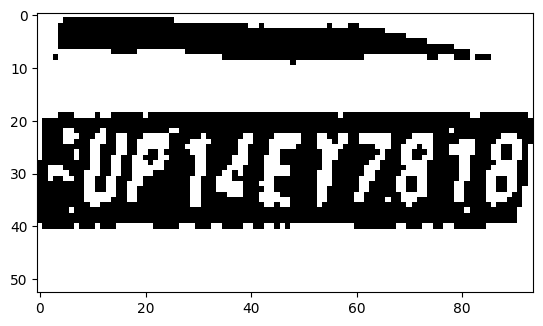

height =  381 width =  374


[184.37754821777344, 240.3563690185547, 285.4564514160156, 293.7035827636719, 0.8973618745803833, 0.0] track_id: 262.0
-0.15808997112168574


['12E178']
license before check 12E178
hello
License Plate Number with contours :  None , Score :  None
-0.22441600903714554
['FUP12E17018']
license before check FUP12E17018
hello
License Plate Number :  None , Score :  None
height =  408 width =  401


[200.5074005126953, 256.54217529296875, 309.9352722167969, 314.4744567871094, 0.9026162624359131, 0.0] track_id: 262.0
-0.2401710078601731


['UP1ZEY78']
license before check UP1ZEY78
hello
License Plate Number with contours :  None , Score :  None
-0.2425514834271907
['UP1LEX7818']
license before check UP1LEX7818
license after check UP1LEX7818
License Plate Number :  UP1LEX7818 , Score :  0.5406818525482802


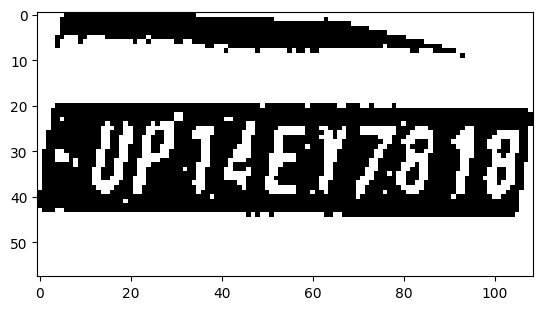

height =  434 width =  429


[217.79425048828125, 280.0342712402344, 334.22357177734375, 336.3844299316406, 0.8950411081314087, 0.0] track_id: 262.0
-0.23109066719589708


['UP14EX78185']
license before check UP14EX78185
hello
License Plate Number with contours :  None , Score :  None
-0.22615243573280183
['UP14EY7818']
license before check UP14EY7818
license after check UP14EY7818
License Plate Number :  UP14EY7818 , Score :  0.7658132919674724


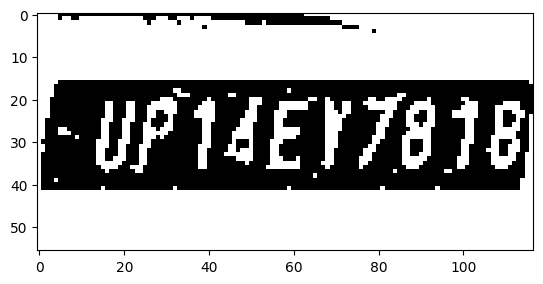

height =  460 width =  464


[241.96702575683594, 302.555419921875, 365.55181884765625, 360.5016174316406, 0.8974090218544006, 0.0] track_id: 262.0
-0.23032173232245376


['UPT4EY7818']
license before check UPT4EY7818
hello
License Plate Number with contours :  None , Score :  None
-0.2223487820699473
['PUP14ET7818']
license before check PUP14ET7818
hello
License Plate Number :  None , Score :  None
height =  107 width =  113
height =  496 width =  504


[268.9839782714844, 331.5241394042969, 402.0878601074219, 392.9704284667969, 0.8996025919914246, 0.0] track_id: 262.0
-0.22382797147051578
['UP14E17818']
license before check UP14E17818
license after check UP14E17818
License Plate Number with contours :  UP14EI7818 , Score :  0.4434024721496034


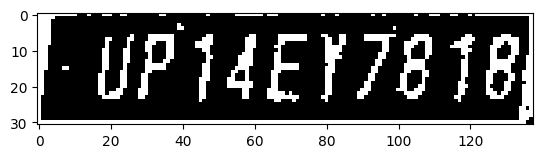

height =  109 width =  115
height =  543 width =  551


[300.1598205566406, 364.4373474121094, 445.60498046875, 440.9778747558594, 0.9094217419624329, 0.0] track_id: 262.0
-0.22252993054933773
['UP14EX7818']
license before check UP14EX7818
license after check UP14EX7818
License Plate Number with contours :  UP14EX7818 , Score :  0.7340091010381652


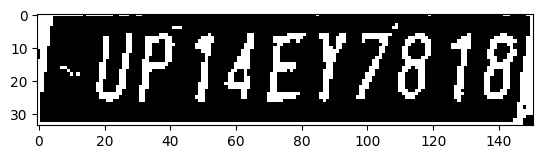

height =  114 width =  119
height =  586 width =  606


[341.5477600097656, 400.2344665527344, 499.3815002441406, 479.3884582519531, 0.9067336916923523, 0.0] track_id: 262.0
-0.22457333244032607
['UP14EY7818']
license before check UP14EY7818
license after check UP14EY7818
License Plate Number with contours :  UP14EY7818 , Score :  0.7296475121799426


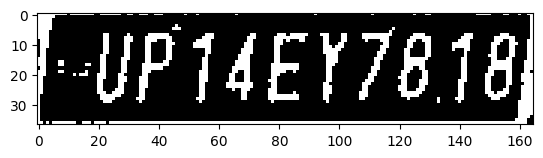

height =  115 width =  121
height =  639 width =  673


[393.10748291015625, 445.5390930175781, 565.5511474609375, 526.1536865234375, 0.9058396816253662, 0.0] track_id: 262.0
-0.22725526061918142
['UP14EY7818']
license before check UP14EY7818
license after check UP14EY7818
License Plate Number with contours :  UP14EY7818 , Score :  0.747777782562827


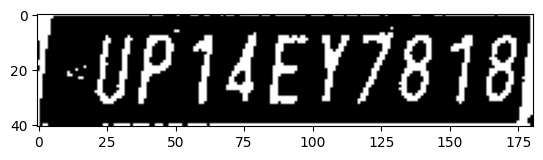

height =  120 width =  127
height =  700 width =  756


[461.2004089355469, 495.02349853515625, 653.0753173828125, 589.3177490234375, 0.9069132208824158, 0.0] track_id: 262.0
-0.24269295282170106
['UP14EY7818']
license before check UP14EY7818
license after check UP14EY7818
License Plate Number with contours :  UP14EY7818 , Score :  0.8989795201942585


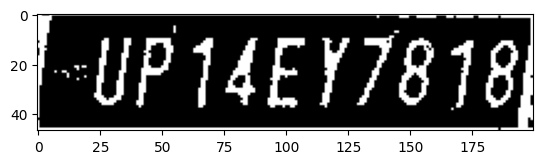

height =  126 width =  130
height =  775 width =  852


[549.1223754882812, 566.2579345703125, 759.9865112304688, 670.3949584960938, 0.9156685471534729, 0.0] track_id: 262.0
-0.24717646178597003


['LUP14EY7818']
license before check LUP14EY7818
hello
License Plate Number with contours :  None , Score :  None
-0.25825221981103874
['UPT4EY7818']
license before check UPT4EY7818
hello
License Plate Number :  None , Score :  None
height =  128 width =  132
height =  67 width =  68
height =  876 width =  976


[670.870361328125, 649.8626708984375, 901.9381713867188, 787.3975219726562, 0.9137189388275146, 0.0] track_id: 262.0
-0.27656855859928864


['FFUP14EY7818']
license before check FFUP14EY7818
hello
License Plate Number with contours :  None , Score :  None
-0.29397991780322114
['UP14EY7818']
license before check UP14EY7818
license after check UP14EY7818
License Plate Number :  UP14EY7818 , Score :  0.6841730899170885


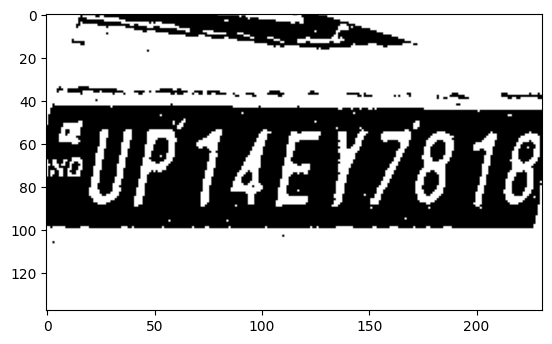

height =  134 width =  133
height =  1012 width =  1124


[835.8720092773438, 772.5188598632812, 1085.0992431640625, 918.0186157226562, 0.9173482656478882, 0.0] track_id: 262.0
-0.3477669878570153


['FAUP4EY7818']
license before check FAUP4EY7818
hello
License Plate Number with contours :  None , Score :  None
-0.34744869030501446
['UP14EY7818']
license before check UP14EY7818
license after check UP14EY7818
License Plate Number :  UP14EY7818 , Score :  0.9830339969769125


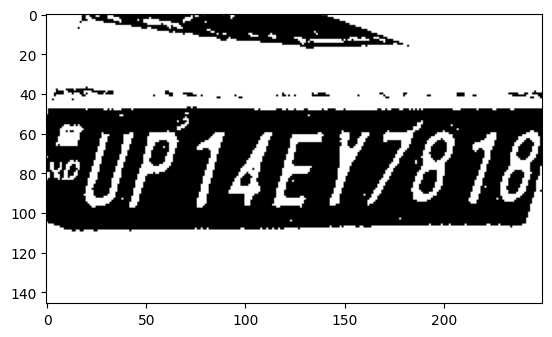

height =  137 width =  137
height =  1208 width =  1299


[1056.063232421875, 893.21240234375, 1298.310791015625, 1107.0313720703125, 0.8097266554832458, 0.0] track_id: 262.0
-0.4897286502915584


[]
License Plate Number with contours :  None , Score :  None
-0.4720507725484531
['UP14ET7816']
license before check UP14ET7816
license after check UP14ET7816
License Plate Number :  UP14ET7816 , Score :  0.4647537769410071


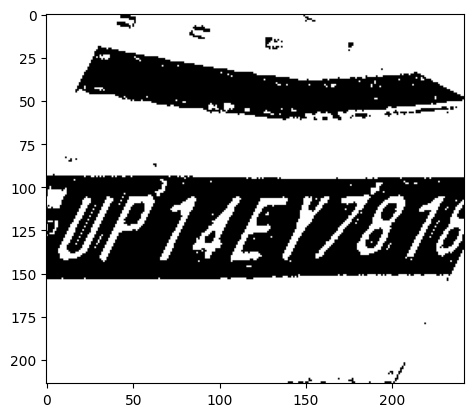

height =  140 width =  140
height =  146 width =  142
height =  1370 width =  1761
height =  149 width =  143
height =  1371 width =  1969
height =  166 width =  148
height =  1328 width =  1991
height =  173 width =  150
height =  1285 width =  1907
height =  171 width =  154
height =  1246 width =  1791
height =  190 width =  159
height =  1158 width =  1702
height =  1170 width =  1613
height =  188 width =  162
height =  1145 width =  1597
height =  190 width =  168
height =  194 width =  172
height =  919 width =  933
height =  194 width =  176
height =  195 width =  180
height =  202 width =  184
height =  210 width =  189
height =  216 width =  196
height =  221 width =  203
height =  224 width =  209
height =  229 width =  218
height =  236 width =  225
height =  243 width =  231
[105.76895141601562, 154.8087921142578, 173.48291015625, 182.30653381347656, 0.34134939312934875, 0.0] track_id: 264.0
-0.23297923907710288
height =  251 width =  242
[111.34495544433594, 159.142456054

[167.52188110351562, 212.39993286132812, 261.294677734375, 255.62623596191406, 0.895979106426239, 0.0] track_id: 264.0
-0.20612134187530706


[]
License Plate Number with contours :  None , Score :  None
-0.20401797959254858
['FuPJSCL45834']
license before check FuPJSCL45834
hello
License Plate Number :  None , Score :  None
height =  349 width =  358
[178.7645263671875, 226.26370239257812, 278.494384765625, 270.30316162109375, 0.8969763517379761, 0.0] track_id: 264.0
-0.207889927202263
height =  367 width =  381
[193.42575073242188, 241.06466674804688, 297.9300537109375, 286.3874816894531, 0.8889551758766174, 0.0] track_id: 264.0
-0.21313102780437307
height =  84 width =  105
height =  388 width =  404
[207.688720703125, 254.31048583984375, 319.54241943359375, 305.20599365234375, 0.9005144238471985, 0.0] track_id: 264.0
-0.207889927202263
height =  85 width =  111
height =  410 width =  433
[226.98292541503906, 272.8501892089844, 347.1540832519531, 327.368408203125, 0.9033797979354858, 0.0] track_id: 264.0
-0.22402364703792346
height =  85 width =  108
height =  432 width =  465
[250.68658447265625, 291.6098327636719, 377.1

[541.6294555664062, 527.4924926757812, 738.8271484375, 625.2844848632812, 0.9215937256813049, 0.0] track_id: 264.0
-0.20927955044754018


[]
License Plate Number with contours :  None , Score :  None
-0.22719146680088895
['UP15CLL583']
license before check UP15CLL583
license after check UP15CLL583
License Plate Number :  UP15CL4583 , Score :  0.8686895272350755


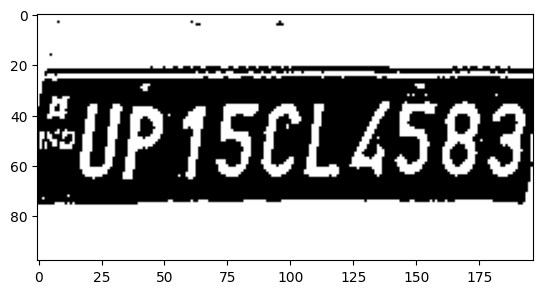

height =  786 width =  902


[636.8184814453125, 596.89404296875, 853.8222045898438, 712.72998046875, 0.9112325310707092, 0.0] track_id: 264.0
-0.2610286491810302


[]
License Plate Number with contours :  None , Score :  None
-0.2634950651948732
['UP15CLL583']
license before check UP15CLL583
license after check UP15CLL583
License Plate Number :  UP15CL4583 , Score :  0.7588272767656002


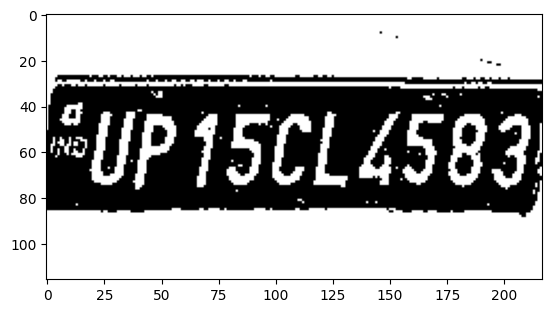

height =  885 width =  1022


[766.2460327148438, 687.24365234375, 991.9083251953125, 815.064453125, 0.9229674935340881, 0.0] track_id: 264.0
-0.31383515242790877


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.29736514522392365
['UP15CL4583']
license before check UP15CL4583
license after check UP15CL4583
License Plate Number :  UP15CL4583 , Score :  0.514602746436382


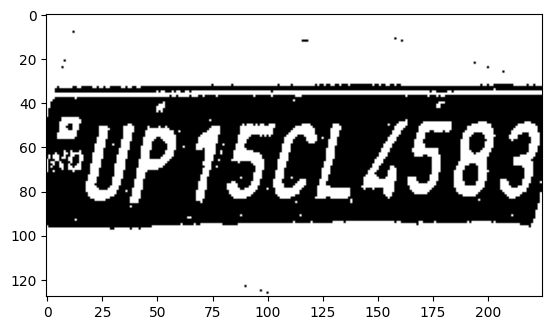

height =  1006 width =  1162


[932.860595703125, 760.5969848632812, 1161.248779296875, 957.6461181640625, 0.8943274617195129, 0.0] track_id: 264.0
-0.38366592426060625


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.3852644696746504
['UP15CL4583']
license before check UP15CL4583
license after check UP15CL4583
License Plate Number :  UP15CL4583 , Score :  0.6866392748476606


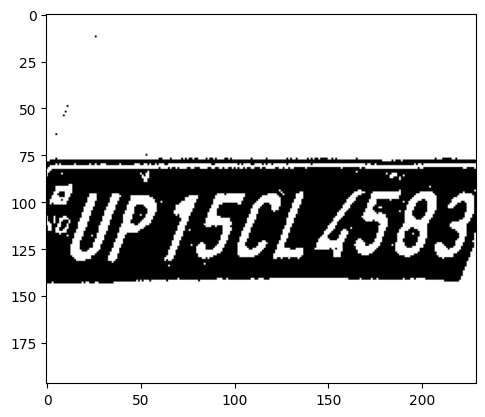

height =  1153 width =  1320


[1131.87060546875, 880.5386962890625, 1319.018310546875, 1114.431884765625, 0.5167540311813354, 0.0] track_id: 264.0
-0.5412227129492587


[]
License Plate Number with contours :  None , Score :  None
-0.5220362796096631
['UP15CL45']
license before check UP15CL45
hello
License Plate Number :  None , Score :  None
height =  1280 width =  1504
height =  1323 width =  1691
height =  1325 width =  1839
height =  1312 width =  1856
height =  1286 width =  1772
height =  1243 width =  1651
height =  1179 width =  1474
height =  1093 width =  1230
height =  979 width =  911
height =  96 width =  91
height =  97 width =  93
height =  99 width =  97
height =  101 width =  100
height =  102 width =  105
height =  105 width =  108
height =  109 width =  111
height =  112 width =  116
height =  115 width =  116
height =  119 width =  118
height =  119 width =  116
height =  121 width =  115
height =  126 width =  117
height =  131 width =  119
height =  136 width =  123
height =  143 width =  124
height =  146 width =  126
height =  148 width =  128
height =  154 width =  135
height =  162 width =  142
height =  173 width =  150
heig

[90.54259490966797, 139.52928161621094, 148.0518035888672, 165.9976043701172, 0.45177188515663147, 0.0] track_id: 272.0
-0.21991427524262383


[]
License Plate Number with contours :  None , Score :  None
-0.22527677921405528
[]
License Plate Number :  None , Score :  None
height =  220 width =  200


[94.48185729980469, 144.59019470214844, 154.62887573242188, 171.38519287109375, 0.746114194393158, 0.0] track_id: 272.0
-0.26171350240120506


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  223 width =  209


[99.5940933227539, 147.6313934326172, 161.8890380859375, 175.4816131591797, 0.5197033882141113, 0.0] track_id: 272.0
-0.1297025371559121


[]
License Plate Number with contours :  None , Score :  None
-0.22423475110909616
[]
License Plate Number :  None , Score :  None
height =  240 width =  218
[103.80134582519531, 150.4272918701172, 169.74179077148438, 184.45130920410156, 0.5638580322265625, 0.0] track_id: 272.0
-0.13640260440094742
height =  249 width =  228
[108.66159057617188, 160.57708740234375, 176.82701110839844, 193.20465087890625, 0.7862464189529419, 0.0] track_id: 272.0
-0.2247111684146427
height =  265 width =  238
[114.13439178466797, 173.80747985839844, 185.23875427246094, 204.5573272705078, 0.8718297481536865, 0.0] track_id: 272.0
-0.22244726542594168
height =  273 width =  250
[120.53956604003906, 181.29232788085938, 195.09034729003906, 213.1861114501953, 0.8819900155067444, 0.0] track_id: 272.0
-0.22923193327699534
height =  278 width =  262
[126.17127227783203, 188.78240966796875, 205.32110595703125, 224.2300262451172, 0.8580758571624756, 0.0] track_id: 272.0
-0.22679884805388587
height =  78 width =  80

[185.502685546875, 258.969482421875, 291.5692443847656, 306.84271240234375, 0.8796601295471191, 0.0] track_id: 272.0
-0.2566253910622563


[]
License Plate Number with contours :  None , Score :  None
-0.19739555984988075
['OL3cBL7373']
license before check OL3cBL7373
license after check OL3CBL7373
License Plate Number :  OL3CBL7373 , Score :  0.25032835379073876


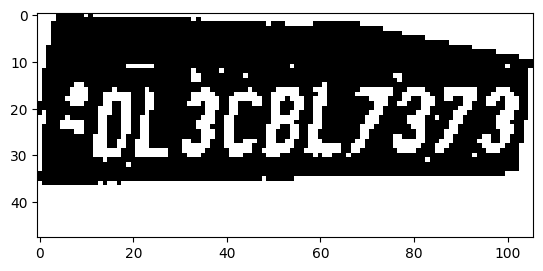

height =  79 width =  103
height =  92 width =  101
height =  387 width =  387
[205.69447326660156, 282.2286376953125, 318.77337646484375, 328.9456787109375, 0.8787072896957397, 0.0] track_id: 272.0
-0.11809202841909398
height =  80 width =  98
height =  96 width =  99
height =  414 width =  420
[227.4877166748047, 308.084228515625, 349.78936767578125, 354.45654296875, 0.8917400240898132, 0.0] track_id: 272.0
-0.22679884805388587
height =  82 width =  93
height =  102 width =  104
height =  446 width =  459
[256.6798400878906, 328.9269104003906, 387.72564697265625, 385.16754150390625, 0.8895345330238342, 0.0] track_id: 272.0
-0.22382797147051578
height =  82 width =  89
height =  109 width =  142
height =  484 width =  508
[293.5740051269531, 359.03070068359375, 435.44482421875, 419.321533203125, 0.9099767804145813, 0.0] track_id: 272.0
-0.20568266295376947
height =  82 width =  89
height =  106 width =  125
height =  531 width =  566
[336.5780334472656, 396.4664306640625, 491.39111328

[850.4710693359375, 738.4193115234375, 1069.4798583984375, 904.8240966796875, 0.6992486715316772, 0.0] track_id: 272.0
-0.4363434718778892


['C']
license before check C
hello
License Plate Number with contours :  None , Score :  None
-0.400861871428361
['DL3CBL7373']
license before check DL3CBL7373
license after check DL3CBL7373
License Plate Number :  DL3CBL7373 , Score :  0.7629535224680509


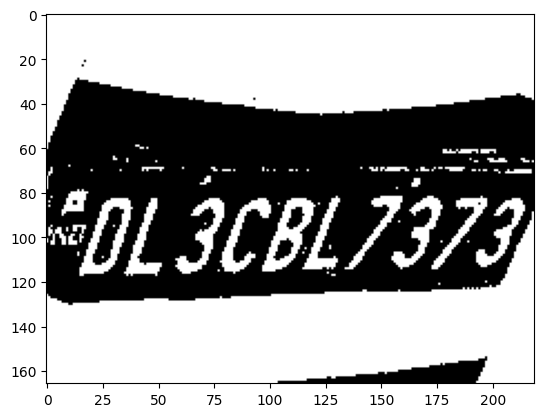

height =  116 width =  122
height =  1139 width =  1236
height =  121 width =  127
height =  1286 width =  1415
height =  123 width =  130
height =  1339 width =  1590
height =  129 width =  132
height =  1343 width =  1703
height =  132 width =  134
height =  1317 width =  1677
height =  130 width =  135
height =  1271 width =  1523
height =  135 width =  135
height =  1168 width =  1474
height =  139 width =  140
height =  1174 width =  1269
height =  145 width =  144
height =  1097 width =  1018
height =  154 width =  150
height =  165 width =  155
height =  167 width =  159
height =  172 width =  163
height =  180 width =  168
height =  181 width =  170
height =  185 width =  171
height =  190 width =  177
height =  197 width =  183
height =  200 width =  189
height =  199 width =  196
height =  202 width =  204
height =  208 width =  210
height =  215 width =  217


[101.08623504638672, 141.11708068847656, 161.66627502441406, 168.14840698242188, 0.6074195504188538, 0.0] track_id: 275.0
-0.2093853929534955


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  106 width =  112
height =  223 width =  223


[104.4242172241211, 145.1215362548828, 167.00888061523438, 173.09422302246094, 0.7499922513961792, 0.0] track_id: 275.0
-0.22441600903714554


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['IaRtC']
license before check IaRtC
hello
License Plate Number :  None , Score :  None
height =  107 width =  117
height =  232 width =  232


[107.25126647949219, 151.41400146484375, 172.3017120361328, 179.97418212890625, 0.6408492922782898, 0.0] track_id: 275.0
-0.2331798006468164


[]
License Plate Number with contours :  None , Score :  None
-0.23210383807515567
[]
License Plate Number :  None , Score :  None
height =  110 width =  122
height =  239 width =  241


[112.24391174316406, 156.1317138671875, 179.5453643798828, 186.49827575683594, 0.8453778028488159, 0.0] track_id: 275.0
-0.2247111684146427


['DR37']
license before check DR37
hello
License Plate Number with contours :  None , Score :  None
-0.23021958727684372
['UorDn7FL']
license before check UorDn7FL
hello
License Plate Number :  None , Score :  None
height =  111 width =  122
height =  248 width =  249


[115.32720947265625, 161.91268920898438, 186.4962921142578, 193.9534149169922, 0.8404680490493774, 0.0] track_id: 275.0
-0.2217809690225993


[]
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
['Vaspen0ZIU']
license before check Vaspen0ZIU
hello
License Plate Number :  None , Score :  None
height =  258 width =  261


[122.79783630371094, 168.72633361816406, 195.97006225585938, 203.4988250732422, 0.8967676758766174, 0.0] track_id: 275.0
-0.22064718266034367


['W33rZ']
license before check W33rZ
hello
License Plate Number with contours :  None , Score :  None
-0.22785704871709972
['W626p0z70']
license before check W626p0z70
hello
License Plate Number :  None , Score :  None
height =  113 width =  121
height =  267 width =  272


[130.31700134277344, 174.29173278808594, 205.6774444580078, 211.95372009277344, 0.9010904431343079, 0.0] track_id: 275.0
-0.21182754748141747


['Vcr30270']
license before check Vcr30270
hello
License Plate Number with contours :  None , Score :  None
-0.23501221572065709
['W805002z0']
license before check W805002z0
hello
License Plate Number :  None , Score :  None
height =  116 width =  126
height =  276 width =  283


[136.551025390625, 183.17538452148438, 215.92156982421875, 220.2626190185547, 0.9074053764343262, 0.0] track_id: 275.0
-0.23052183904336873


['Erosoozo8']
license before check Erosoozo8
hello
License Plate Number with contours :  None , Score :  None
-0.21018258666216955
['p80500z70']
license before check p80500z70
hello
License Plate Number :  None , Score :  None
height =  117 width =  122
height =  285 width =  296


[143.60958862304688, 193.0858612060547, 225.5063018798828, 230.78846740722656, 0.9043747782707214, 0.0] track_id: 275.0
-0.20927955044754018


['VP8Cz00z70']
license before check VP8Cz00z70
hello
License Plate Number with contours :  None , Score :  None
-0.22964244228513467


['EWP80500210']
license before check EWP80500210
hello
License Plate Number :  None , Score :  None
[0.04535964876413345, 63.5533561706543, 6.493863105773926, 79.4198989868164, 0.3769870698451996, 0.0] track_id: 275.0
[]
License Plate Number :  None , Score :  None
height =  117 width =  120
height =  300 width =  312


[152.46746826171875, 202.96629333496094, 238.32737731933594, 242.75228881835938, 0.8960422873497009, 0.0] track_id: 275.0
-0.21866894587394195


['UPapg00z70']
license before check UPapg00z70
hello
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['0p30600270']
license before check 0p30600270
license after check 0P30600270
License Plate Number :  OP30GO0270 , Score :  0.1905106528390327


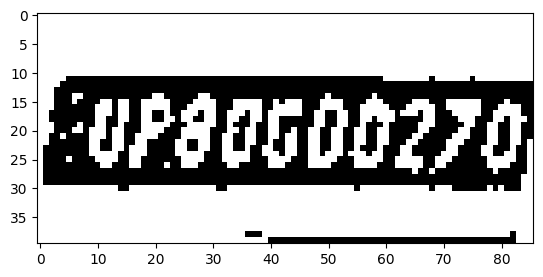

height =  122 width =  131
height =  314 width =  328


[164.13401794433594, 213.00904846191406, 253.95912170410156, 254.2252197265625, 0.8956528902053833, 0.0] track_id: 275.0
0.036347621019020664


['UP80c002Z0']
license before check UP80c002Z0
hello
License Plate Number with contours :  None , Score :  None
-0.22768931976865586


['Fup80g0027g']
license before check Fup80g0027g
hello
License Plate Number :  None , Score :  None
[0.0, 64.23976135253906, 4.698425769805908, 78.88438415527344, 0.35621169209480286, 0.0] track_id: 275.0
[]
License Plate Number :  None , Score :  None
height =  124 width =  137
height =  331 width =  348


[177.89498901367188, 227.34942626953125, 271.06036376953125, 269.8523254394531, 0.8963202834129333, 0.0] track_id: 275.0
-0.2247111684146427


['Up8ogq0z70']
license before check Up8ogq0z70
hello
License Plate Number with contours :  None , Score :  None
-0.21406068356382152
['Eup8ocpoz70']
license before check Eup8ocpoz70
hello
License Plate Number :  None , Score :  None
height =  126 width =  139
height =  347 width =  367


[189.0679931640625, 241.14048767089844, 288.51043701171875, 285.4064025878906, 0.8924670219421387, 0.0] track_id: 275.0
-0.2080561367910258
['Up8og00270']
license before check Up8og00270
license after check UP8OG00270
License Plate Number with contours :  UP8OGO0270 , Score :  0.39889002518567884


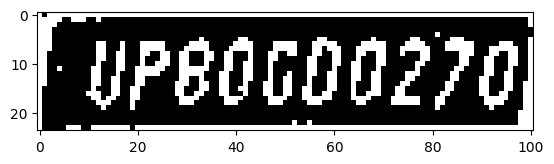

height =  131 width =  145
height =  366 width =  389


[204.51116943359375, 254.70945739746094, 309.511962890625, 305.069091796875, 0.9065886735916138, 0.0] track_id: 275.0
-0.22595921768864075


['UPbOCd0270']
license before check UPbOCd0270
hello
License Plate Number with contours :  None , Score :  None
-0.2213144423477913
['Up80G00z7o']
license before check Up80G00z7o
hello
License Plate Number :  None , Score :  None
height =  134 width =  150
height =  386 width =  415


[222.2799835205078, 271.7271728515625, 333.2898864746094, 323.13525390625, 0.9089276790618896, 0.0] track_id: 275.0
-0.21535769969773805


['Up80g00z70']
license before check Up80g00z70
hello
License Plate Number with contours :  None , Score :  None
-0.2093853929534955
['Up80g0oz7o']
license before check Up80g0oz7o
hello
License Plate Number :  None , Score :  None
height =  136 width =  150
height =  409 width =  446


[244.5291290283203, 288.3824157714844, 361.90301513671875, 345.1898498535156, 0.9117705225944519, 0.0] track_id: 275.0
-0.22615243573280183
['UP80G00270']
license before check UP80G00270
license after check UP80G00270
License Plate Number with contours :  UP80GO0270 , Score :  0.1776222228105742


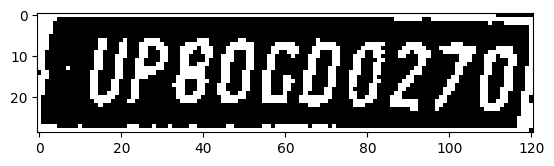

height =  140 width =  148
height =  437 width =  478


[268.03375244140625, 309.21282958984375, 393.11810302734375, 369.8100891113281, 0.9088618159294128, 0.0] track_id: 275.0
-0.2168736156664083
['UP80G00270']
license before check UP80G00270
license after check UP80G00270
License Plate Number with contours :  UP80GO0270 , Score :  0.39255175359911054


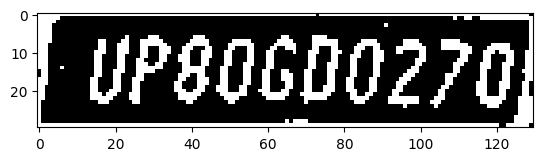

height =  144 width =  151


[0.037008341401815414, 69.7043685913086, 5.0418901443481445, 81.79035186767578, 0.3028634488582611, 0.0] track_id: 282.0
[]
License Plate Number :  None , Score :  None
height =  466 width =  516


[296.0928649902344, 333.0232238769531, 429.7279968261719, 397.0737609863281, 0.9033520221710205, 0.0] track_id: 275.0
-0.19051808919364915


['Up8OGd0z70']
license before check Up8OGd0z70
hello
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
['PuP80cu0z70']
license before check PuP80cu0z70
hello
License Plate Number :  None , Score :  None
height =  498 width =  562


[333.41656494140625, 361.44256591796875, 476.0625915527344, 427.6069030761719, 0.9077969789505005, 0.0] track_id: 275.0
-0.19270075866238556
['UP80c00270']
license before check UP80c00270
license after check UP80C00270
License Plate Number with contours :  UP80CO0270 , Score :  0.432634445019388


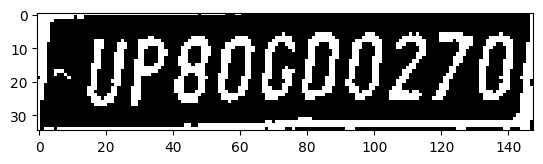

height =  145 width =  159
height =  536 width =  612


[371.79266357421875, 386.9043273925781, 526.3035888671875, 464.56195068359375, 0.9100157618522644, 0.0] track_id: 275.0
-0.22527677921405528
['Up80g00270']
license before check Up80g00270
license after check UP80G00270
License Plate Number with contours :  UP80GO0270 , Score :  0.787799427133266


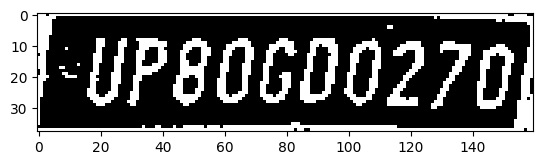

height =  151 width =  164
height =  582 width =  666


[420.5476379394531, 424.6587219238281, 584.216552734375, 511.0018310546875, 0.9108443856239319, 0.0] track_id: 275.0
-0.24380770347469657
['UP8OGD0270']
license before check UP8OGD0270
license after check UP8OGD0270
License Plate Number with contours :  UP8OGD0270 , Score :  0.38518558225655825


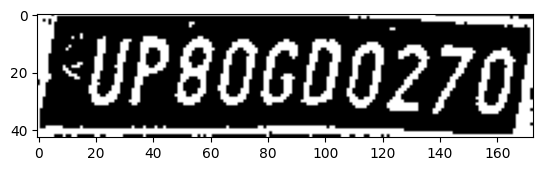

height =  157 width =  167
height =  637 width =  734


[481.0871276855469, 476.70849609375, 658.1251831054688, 567.3330688476562, 0.913695752620697, 0.0] track_id: 275.0
-0.22716582051447684
['UP8Ocdo270']
license before check UP8Ocdo270
license after check UP8OCDO270
License Plate Number with contours :  UP8OCD0270 , Score :  0.07776091702319404


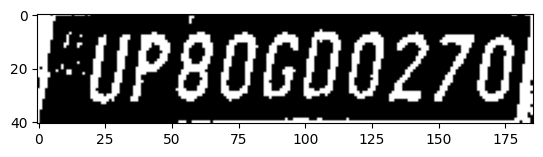

height =  166 width =  171
height =  697 width =  812


[559.9909057617188, 533.6961669921875, 747.802001953125, 631.5149536132812, 0.9051724672317505, 0.0] track_id: 275.0
-0.27829965900511133


['FUP80G00270']
license before check FUP80G00270
hello
License Plate Number with contours :  None , Score :  None
-0.2653320862089848
['TP8Oc00270']
license before check TP8Oc00270
license after check TP8OC00270
License Plate Number :  TP8OCO0270 , Score :  0.1059225896535693


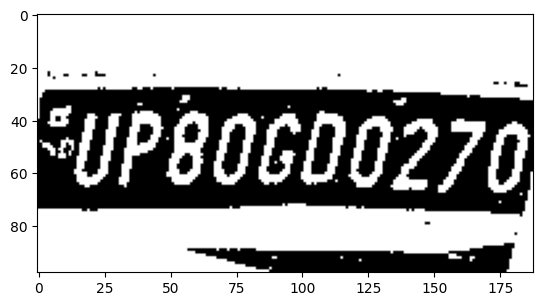

height =  173 width =  172
height =  771 width =  903


[654.785400390625, 599.385498046875, 853.5560302734375, 714.4514770507812, 0.914499819278717, 0.0] track_id: 275.0
-0.3126322660794467
['UP80c00270']
license before check UP80c00270
license after check UP80C00270
License Plate Number with contours :  UP80CO0270 , Score :  0.5180170454523655


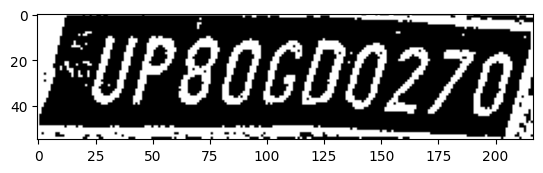

height =  178 width =  174
height =  855 width =  1008


[772.7335205078125, 679.1552734375, 980.60009765625, 811.019775390625, 0.9133251309394836, 0.0] track_id: 275.0
-0.33029735482925365
['Up80600270']
license before check Up80600270
license after check UP80600270
License Plate Number with contours :  UP80GO0270 , Score :  0.2873571350991827


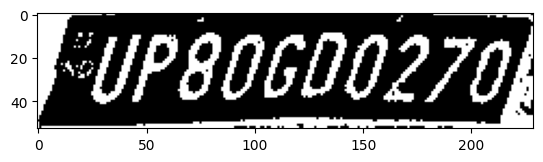

height =  184 width =  179


[81.98352813720703, 113.65563201904297, 129.41502380371094, 134.17088317871094, 0.6267684102058411, 0.0] track_id: 282.0
-0.24111767845146836


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  964 width =  1127
[917.8577270507812, 772.0374145507812, 1123.241943359375, 929.1873168945312, 0.8963654041290283, 0.0] track_id: 275.0
-0.4382127821633306
height =  189 width =  182
height =  1090 width =  1257
height =  192 width =  184
[84.19815826416016, 115.258544921875, 133.01097106933594, 136.27891540527344, 0.8444215059280396, 0.0] track_id: 282.0
-0.22679884805388587
height =  1231 width =  1406
height =  198 width =  190


[86.4542236328125, 110.1686782836914, 136.0201416015625, 142.07667541503906, 0.5567453503608704, 0.0] track_id: 282.0
-0.23021958727684372
[86.56776428222656, 120.11937713623047, 135.91006469726562, 141.7427978515625, 0.27034205198287964, 0.0] track_id: 282.0
-0.23783592745745075


[]
License Plate Number with contours :  None , Score :  None
-0.23109066719589708
[]
License Plate Number :  None , Score :  None
height =  1285 width =  1551
height =  201 width =  190


[86.02507781982422, 125.21272277832031, 135.93165588378906, 147.55758666992188, 0.9054889678955078, 0.0] track_id: 282.0
-0.21535769969773805


[]
License Plate Number with contours :  None , Score :  None
-0.2510026866430346
['Aeia']
license before check Aeia
hello
License Plate Number :  None , Score :  None
height =  1299 width =  1705
height =  208 width =  194


[87.6322021484375, 129.3281707763672, 138.418212890625, 152.2963409423828, 0.8869767189025879, 0.0] track_id: 282.0
-0.21535769969773805


[]
License Plate Number with contours :  None , Score :  None
-0.2510026866430346
[]
License Plate Number :  None , Score :  None
height =  1285 width =  1743
height =  206 width =  198


[88.51326751708984, 128.15626525878906, 141.3188018798828, 151.6574249267578, 0.8868970274925232, 0.0] track_id: 282.0
-0.22244726542594168


[]
License Plate Number with contours :  None , Score :  None
-0.22923193327699534
[]
License Plate Number :  None , Score :  None
height =  1255 width =  1675
height =  212 width =  203


[90.57451629638672, 129.8358917236328, 145.37806701660156, 155.06130981445312, 0.8400978446006775, 0.0] track_id: 282.0
-0.2331798006468164


[]
License Plate Number with contours :  None , Score :  None
-0.2284966392918623
[]
License Plate Number :  None , Score :  None
height =  1216 width =  1545
height =  216 width =  211
[94.78880310058594, 131.55487060546875, 150.84713745117188, 157.38436889648438, 0.8517956733703613, 0.0] track_id: 282.0
-0.23255694180490905
height =  1171 width =  1377
height =  220 width =  216
[97.87571716308594, 135.21665954589844, 155.31494140625, 161.09779357910156, 0.8909803032875061, 0.0] track_id: 282.0
-0.2247111684146427
height =  99 width =  109
height =  1100 width =  1161
height =  224 width =  222
[100.40641784667969, 138.50198364257812, 160.1205291748047, 165.82080078125, 0.9001086950302124, 0.0] track_id: 282.0
-0.225601243836024
height =  99 width =  116
height =  231 width =  229


[104.24171447753906, 142.72274780273438, 165.4906768798828, 171.09185791015625, 0.897040605545044, 0.0] track_id: 282.0
-0.22503828649260516


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  104 width =  119
height =  238 width =  236


[106.11289978027344, 143.7142333984375, 169.9818878173828, 174.65216064453125, 0.8922629356384277, 0.0] track_id: 282.0
-0.2260683879938839


['0j']
license before check 0j
hello
License Plate Number with contours :  None , Score :  None
-0.21243202050874216
[]
License Plate Number :  None , Score :  None
height =  112 width =  120
height =  244 width =  243


[108.83854675292969, 145.48529052734375, 175.31582641601562, 175.45516967773438, 0.8931249976158142, 0.0] track_id: 282.0
-0.22503828649260516


['XS']
license before check XS
hello
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
[]
License Plate Number :  None , Score :  None
height =  111 width =  118
height =  249 width =  249


[112.364990234375, 148.42701721191406, 181.104248046875, 179.31033325195312, 0.900031328201294, 0.0] track_id: 282.0
-0.22679884805388587


['MQebh']
license before check MQebh
hello
License Plate Number with contours :  None , Score :  None
-0.24135549057540379
['iktdJjbs']
license before check iktdJjbs
hello
License Plate Number :  None , Score :  None
height =  115 width =  121
height =  254 width =  258


[116.51522827148438, 151.94326782226562, 187.39089965820312, 184.52769470214844, 0.9021600484848022, 0.0] track_id: 282.0
-0.22595921768864075


['OPw']
license before check OPw
hello
License Plate Number with contours :  None , Score :  None
-0.220248723390689
['NTIDRIES']
license before check NTIDRIES
hello
License Plate Number :  None , Score :  None
height =  120 width =  123
height =  263 width =  266


[120.67203521728516, 157.60752868652344, 193.53565979003906, 189.1260223388672, 0.9017936587333679, 0.0] track_id: 282.0
-0.22768931976865586


['V08Ss']
license before check V08Ss
hello
License Plate Number with contours :  None , Score :  None
-0.23441567572381078
['u08585']
license before check u08585
hello
License Plate Number :  None , Score :  None
height =  118 width =  128
height =  270 width =  278


[126.73192596435547, 162.80531311035156, 203.04713439941406, 196.94288635253906, 0.903349757194519, 0.0] track_id: 282.0
-0.21406068356382152


['NIYaRSRS']
license before check NIYaRSRS
hello
License Plate Number with contours :  None , Score :  None
-0.22581168154335537
['VIt7dbsp5']
license before check VIt7dbsp5
hello
License Plate Number :  None , Score :  None
height =  118 width =  127
height =  279 width =  289


[132.1160430908203, 169.924072265625, 211.16775512695312, 205.45860290527344, 0.9050571322441101, 0.0] track_id: 282.0
-0.21979507152403238


['VX706285']
license before check VX706285
hello
License Plate Number with contours :  None , Score :  None
-0.23554498072086333
['FukJ708585']
license before check FukJ708585
hello
License Plate Number :  None , Score :  None
height =  118 width =  128
height =  290 width =  302


[138.646728515625, 177.97174072265625, 222.24371337890625, 213.97366333007812, 0.8980688452720642, 0.0] track_id: 282.0
-0.22390450013034954


['0108565']
license before check 0108565
hello
License Plate Number with contours :  None , Score :  None
-0.22006170263356514
['EuXTZ48585']
license before check EuXTZ48585
hello
License Plate Number :  None , Score :  None
height =  118 width =  130
height =  303 width =  315


[147.5767364501953, 186.2191619873047, 233.3745880126953, 224.97805786132812, 0.9026235938072205, 0.0] track_id: 282.0
-0.23329695153662725


['VX170e585']
license before check VX170e585
hello
License Plate Number with contours :  None , Score :  None
-0.23441567572381078
['UI1708585']
license before check UI1708585
license after check UI1708585
License Plate Number :  UI17O8585 , Score :  0.06768139735153289


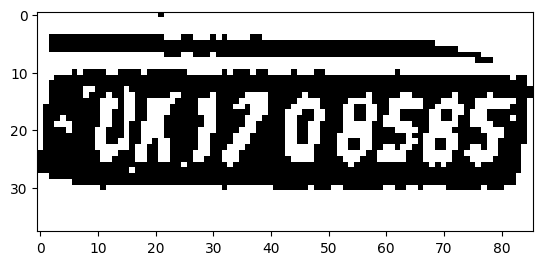

height =  120 width =  132
height =  314 width =  329


[155.53475952148438, 195.41867065429688, 245.2706756591797, 237.00677490234375, 0.9056078195571899, 0.0] track_id: 282.0
-0.20278150417940963
['0A17Q8565']
license before check 0A17Q8565
license after check 0A17Q8565
License Plate Number with contours :  OA17Q8565 , Score :  0.35494314350458833


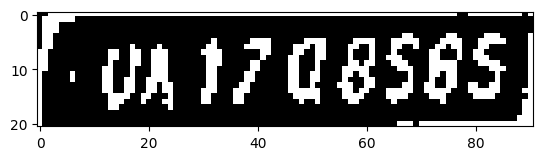

height =  332 width =  346


[163.61111450195312, 207.9368438720703, 258.2215576171875, 251.86717224121094, 0.9092199802398682, 0.0] track_id: 282.0
-0.22266094063636496
['UX1708585']
license before check UX1708585
license after check UX1708585
License Plate Number with contours :  UX17O8585 , Score :  0.7208217396849417


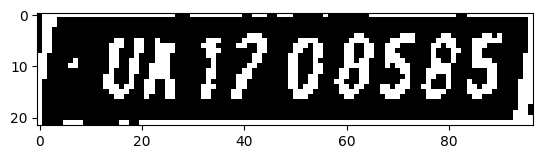

height =  128 width =  144
height =  347 width =  363


[174.756103515625, 220.443359375, 273.782470703125, 266.39752197265625, 0.9113047122955322, 0.0] track_id: 282.0
-0.2063238940297175
['0K1708585']
license before check 0K1708585
license after check 0K1708585
License Plate Number with contours :  OK17O8585 , Score :  0.5490491506150534


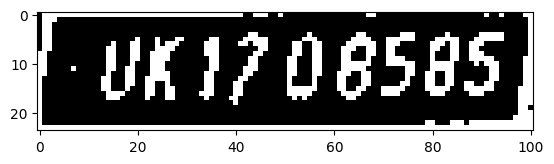

height =  128 width =  144
height =  365 width =  383


[184.66110229492188, 234.99996948242188, 289.308349609375, 280.2803649902344, 0.9140045046806335, 0.0] track_id: 282.0
-0.22152880461674798
['UKI708585']
license before check UKI708585
license after check UKI708585
License Plate Number with contours :  UK17O8585 , Score :  0.6072724194132552


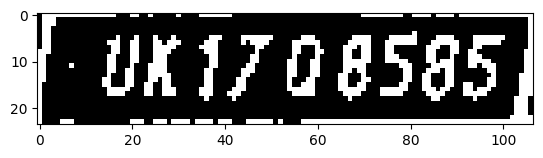

height =  381 width =  403


[198.00608825683594, 249.43682861328125, 307.7923889160156, 297.2273864746094, 0.9031969904899597, 0.0] track_id: 282.0
-0.20859957280615768
['0K1708585']
license before check 0K1708585
license after check 0K1708585
License Plate Number with contours :  OK17O8585 , Score :  0.417326685362096


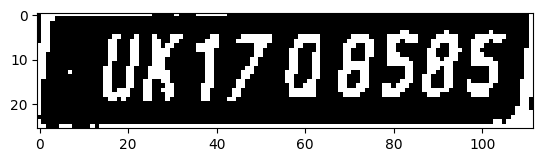

height =  143 width =  159
height =  400 width =  427


[211.78834533691406, 260.742431640625, 328.1355895996094, 311.86700439453125, 0.9083004593849182, 0.0] track_id: 282.0
-0.20401797959254858
['UK1708585']
license before check UK1708585
license after check UK1708585
License Plate Number with contours :  UK17O8585 , Score :  0.9450309231065336


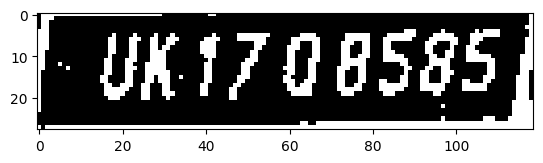

height =  170 width =  161
height =  423 width =  454


[228.56211853027344, 277.3594055175781, 352.06103515625, 331.95928955078125, 0.905776858329773, 0.0] track_id: 282.0
-0.20539538918976738
['UK17Q8585']
license before check UK17Q8585
license after check UK17Q8585
License Plate Number with contours :  UK17Q8585 , Score :  0.3471068940034238


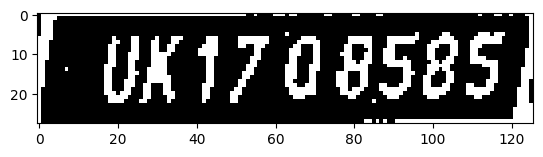

height =  448 width =  484


[247.60914611816406, 297.9342041015625, 378.9246826171875, 353.6724853515625, 0.9108113646507263, 0.0] track_id: 282.0
-0.20401797959254858
['UK1708585']
license before check UK1708585
license after check UK1708585
License Plate Number with contours :  UK17O8585 , Score :  0.3389161072224646


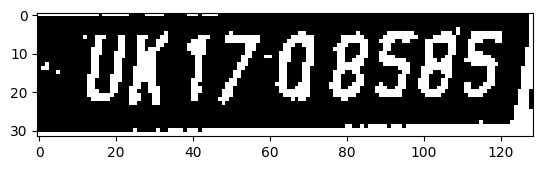

height =  473 width =  523


[273.1957092285156, 316.5988464355469, 413.48406982421875, 376.2578125, 0.9064943194389343, 0.0] track_id: 282.0
-0.20947956377909527
['UK1708585']
license before check UK1708585
license after check UK1708585
License Plate Number with contours :  UK17O8585 , Score :  0.789026670911366


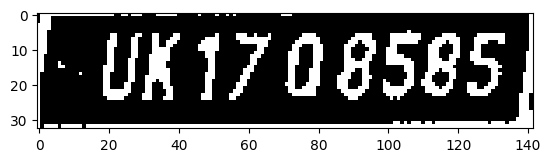

height =  164 width =  188
height =  505 width =  563


[300.2581787109375, 340.2972106933594, 451.1838684082031, 401.492431640625, 0.9083822965621948, 0.0] track_id: 282.0
-0.20359126743581482


['708585']
license before check 708585
hello
License Plate Number with contours :  None , Score :  None
-0.225601243836024
['UK1708585']
license before check UK1708585
license after check UK1708585
License Plate Number :  UK17O8585 , Score :  0.6294298572525644


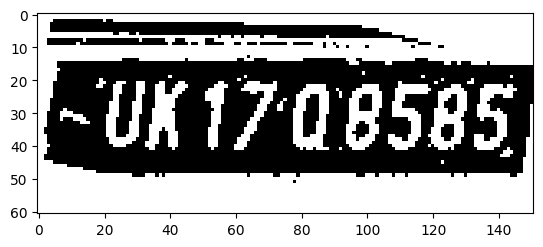

height =  154 width =  176
height =  540 width =  611
[335.2584533691406, 368.60369873046875, 497.4176940917969, 435.95660400390625, 0.9108383655548096, 0.0] track_id: 282.0
-0.20717519915891144
height =  158 width =  174
height =  581 width =  667
[377.2082214355469, 401.75341796875, 550.5005493164062, 474.26617431640625, 0.9028952121734619, 0.0] track_id: 282.0
-0.20687394897974307
height =  175 width =  171
height =  631 width =  731


[430.21484375, 443.58074951171875, 615.3901977539062, 521.5849609375, 0.9152131080627441, 0.0] track_id: 282.0
-0.24370639918227371


[]
License Plate Number with contours :  None , Score :  None
-0.22280115375939452
['UK1708585']
license before check UK1708585
license after check UK1708585
License Plate Number :  UK17O8585 , Score :  0.29533826195997276


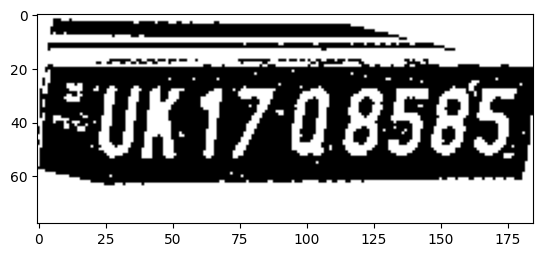

height =  172 width =  174
height =  688 width =  800


[489.53375244140625, 491.42584228515625, 689.9551391601562, 579.810546875, 0.9069050550460815, 0.0] track_id: 282.0
-0.22785704871709972


['K']
license before check K
hello
License Plate Number with contours :  None , Score :  None
-0.2255096351884239
['FUK1708585']
license before check FUK1708585
hello
License Plate Number :  None , Score :  None
height =  174 width =  176
height =  752 width =  885


[565.0, 553.4814453125, 781.0130004882812, 650.01123046875, 0.9216030836105347, 0.0] track_id: 282.0
-0.24713615708243294


['K']
license before check K
hello
License Plate Number with contours :  None , Score :  None
-0.24264766501773763
['FUK1708585']
license before check FUK1708585
hello
License Plate Number :  None , Score :  None
height =  170 width =  181
height =  833 width =  986


[664.1138916015625, 614.4931030273438, 893.468994140625, 731.5685424804688, 0.9053570032119751, 0.0] track_id: 282.0
-0.29715349008386427


['FUK1708585']
license before check FUK1708585
hello
License Plate Number with contours :  None , Score :  None
-0.27510137566718307
['FUK1708585']
license before check FUK1708585
hello
License Plate Number :  None , Score :  None
height =  172 width =  180


[84.06985473632812, 107.75859832763672, 132.21961975097656, 130.14767456054688, 0.5769882202148438, 0.0] track_id: 284.0
-0.2247111684146427


[]
License Plate Number with contours :  None , Score :  None
-0.23374318086890142
[]
License Plate Number :  None , Score :  None
height =  931 width =  1104


[790.265380859375, 701.5750122070312, 1030.6920166015625, 834.5518188476562, 0.9060911536216736, 0.0] track_id: 282.0
-0.27881752534928783
['UK1708585']
license before check UK1708585
license after check UK1708585
License Plate Number with contours :  UK17O8585 , Score :  0.7302722949022044


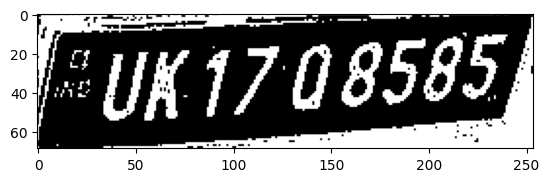

height =  174 width =  185


[85.9283218383789, 109.28271484375, 134.8668975830078, 132.1111602783203, 0.7722724080085754, 0.0] track_id: 284.0
-0.23554498072086333


[]
License Plate Number with contours :  None , Score :  None
-0.23923159996366056
[]
License Plate Number :  None , Score :  None
height =  1056 width =  1238


[951.4586791992188, 795.3197631835938, 1189.0125732421875, 964.1360473632812, 0.8881189823150635, 0.0] track_id: 282.0
-0.4006243868693222


['K']
license before check K
hello
License Plate Number with contours :  None , Score :  None
-0.40024065703397416
['UK1708585']
license before check UK1708585
license after check UK1708585
License Plate Number :  UK17O8585 , Score :  0.5759048606649149


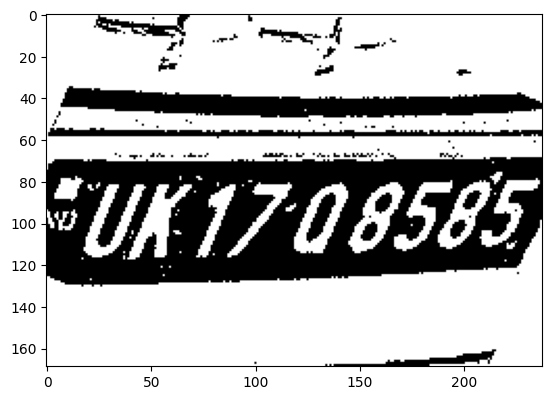

height =  178 width =  189


[85.94493103027344, 110.04786682128906, 137.94285583496094, 134.398681640625, 0.8251804709434509, 0.0] track_id: 284.0
-0.2204937613666717


[]
License Plate Number with contours :  None , Score :  None
-0.23974310887045658
[]
License Plate Number :  None , Score :  None
height =  180 width =  194
[89.23652648925781, 112.22732543945312, 142.11659240722656, 137.4290008544922, 0.851250946521759, 0.0] track_id: 284.0
0.0
height =  187 width =  200


[92.54922485351562, 115.29037475585938, 147.07618713378906, 141.42691040039062, 0.8109253644943237, 0.0] track_id: 284.0
-0.24828990930306807


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  1322 width =  1622
height =  191 width =  204
[95.58492279052734, 118.12566375732422, 153.0104217529297, 145.25331115722656, 0.8729713559150696, 0.0] track_id: 284.0
-0.22208190190548016
height =  195 width =  213
[99.34798431396484, 121.41693878173828, 157.99765014648438, 149.1942138671875, 0.8993843197822571, 0.0] track_id: 284.0
-0.22679884805388587
height =  1306 width =  1853
height =  202 width =  221
[102.99140930175781, 125.8834228515625, 163.8892822265625, 154.6929931640625, 0.8212373852729797, 0.0] track_id: 284.0
0.0
height =  1285 width =  1872
height =  209 width =  227
[107.24063110351562, 128.95355224609375, 170.7703094482422, 160.2364959716797, 0.9013445973396301, 0.0] track_id: 284.0
-0.2171113147349052
height =  1280 width =  1831
height =  217 width =  233
[108.89141845703125, 134.13632202148438, 174.19839477539062, 165.84121704

[119.84892272949219, 145.9619140625, 190.80661010742188, 178.754150390625, 0.911522626876831, 0.0] track_id: 284.0
-0.2157661964070423


[]
License Plate Number with contours :  None , Score :  None
-0.23374318086890142
[]
License Plate Number :  None , Score :  None
height =  1093 width =  1430
height =  238 width =  258


[123.4001693725586, 151.0113983154297, 196.64816284179688, 184.31468200683594, 0.8972947001457214, 0.0] track_id: 284.0
-0.23974310887045658


[]
License Plate Number with contours :  None , Score :  None
-0.225601243836024
['WLJTBIESSZ']
license before check WLJTBIESSZ
hello
License Plate Number :  None , Score :  None
height =  96 width =  122
height =  248 width =  268


[126.74663543701172, 155.69485473632812, 202.7489013671875, 190.4846954345703, 0.9055132865905762, 0.0] track_id: 284.0
-0.22679884805388587


['DLJPE3l']
license before check DLJPE3l
hello
License Plate Number with contours :  None , Score :  None
-0.22581168154335537
['DLZLBIS5J8']
license before check DLZLBIS5J8
hello
License Plate Number :  None , Score :  None
height =  878 width =  879
height =  92 width =  121
height =  255 width =  281
[132.07615661621094, 161.91555786132812, 212.39976501464844, 198.70196533203125, 0.9082925915718079, 0.0] track_id: 284.0
-0.21406068356382152
height =  92 width =  123
height =  266 width =  293


[140.45069885253906, 168.77969360351562, 223.9610137939453, 207.28334045410156, 0.9062254428863525, 0.0] track_id: 284.0
-0.22244726542594168


['WjcBEsYF']
license before check WjcBEsYF
hello
License Plate Number with contours :  None , Score :  None
-0.21195763724261935
['pJE81ss921']
license before check pJE81ss921
hello
License Plate Number :  None , Score :  None
height =  96 width =  118
height =  284 width =  303
[147.2221221923828, 180.01837158203125, 235.1964874267578, 219.49314880371094, 0.8945411443710327, 0.0] track_id: 284.0
-0.20982831175965547
height =  92 width =  114
height =  296 width =  317
[154.10675048828125, 189.77053833007812, 246.95790100097656, 231.98568725585938, 0.9002066254615784, 0.0] track_id: 284.0
-0.20982831175965547
height =  90 width =  112
height =  306 width =  333
[163.15611267089844, 199.10546875, 259.81976318359375, 242.9456024169922, 0.9096896052360535, 0.0] track_id: 284.0
-0.21109333322274654
height =  90 width =  112
height =  319 width =  350
[174.40255737304688, 210.1468963623047, 275.53143310546875, 255.81056213378906, 0.9145142436027527, 0.0] track_id: 284.0
0.10134650326566776


[183.2314910888672, 222.8339385986328, 290.3367614746094, 270.0198974609375, 0.9005711674690247, 0.0] track_id: 284.0
-0.20963984587421253
['DL3CBY6598']
license before check DL3CBY6598
license after check DL3CBY6598
License Plate Number with contours :  DL3CBY6598 , Score :  0.2828054408481927


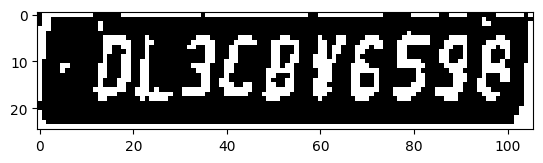

height =  90 width =  112
height =  355 width =  388


[196.93701171875, 237.99375915527344, 308.8096008300781, 287.5740966796875, 0.905464231967926, 0.0] track_id: 284.0
-0.2049999760035741
['DL3CBK6592']
license before check DL3CBK6592
license after check DL3CBK6592
License Plate Number with contours :  DL3CBK6592 , Score :  0.1579416061293992


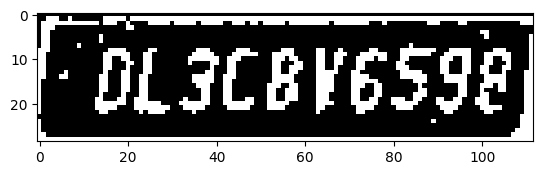

height =  92 width =  114
height =  368 width =  411


[211.71192932128906, 253.00938415527344, 328.8304138183594, 306.6209716796875, 0.9135527610778809, 0.0] track_id: 284.0
-0.18873776752013358
['DL3CBYSSS8']
license before check DL3CBYSSS8
license after check DL3CBYSSS8
License Plate Number with contours :  DL3CBY5558 , Score :  0.22954981799712032


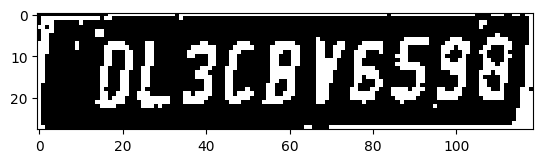

height =  390 width =  437


[228.46649169921875, 271.4620056152344, 352.71728515625, 326.9770202636719, 0.9093531370162964, 0.0] track_id: 284.0
-0.20431586460012127


[]
License Plate Number with contours :  None , Score :  None
-0.22740234828236858
['EoL3CBY6S98']
license before check EoL3CBY6S98
hello
License Plate Number :  None , Score :  None
height =  414 width =  466


[248.15846252441406, 289.91064453125, 380.71649169921875, 349.1628112792969, 0.9052154421806335, 0.0] track_id: 284.0
-0.20859957280615768
['DL3CBY6538']
license before check DL3CBY6538
license after check DL3CBY6538
License Plate Number with contours :  DL3CBY6538 , Score :  0.5243000391729759


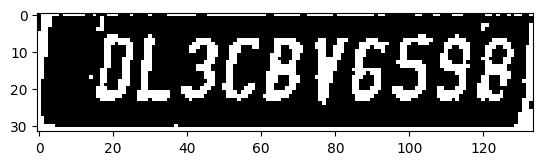

height =  441 width =  501
[270.9998474121094, 312.0368347167969, 413.4236145019531, 375.76190185546875, 0.912433385848999, 0.0] track_id: 284.0
-0.20859957280615768
height =  468 width =  539
[298.6288757324219, 334.132568359375, 451.8681640625, 403.74578857421875, 0.9252960085868835, 0.0] track_id: 284.0
-0.20783904438543416
height =  505 width =  586
[332.6897277832031, 364.1933288574219, 497.0682373046875, 437.03955078125, 0.9122852683067322, 0.0] track_id: 284.0
-0.21018258666216955
height =  545 width =  641
[377.18878173828125, 398.82708740234375, 553.6803588867188, 479.6845703125, 0.9077265858650208, 0.0] track_id: 284.0
-0.2086817623350266
height =  581 width =  703
[427.45001220703125, 436.6114196777344, 617.0142822265625, 521.4940185546875, 0.9214597940444946, 0.0] track_id: 284.0
-0.2255096351884239
height =  632 width =  774
[488.19097900390625, 478.64801025390625, 695.780517578125, 573.1591186523438, 0.9161351323127747, 0.0] track_id: 284.0
-0.23210383807515567
height =  

[805.356201171875, 700.8827514648438, 1046.4404296875, 842.060302734375, 0.9118391275405884, 0.0] track_id: 284.0
-0.3133271675841541


['0']
license before check 0
hello
License Plate Number with contours :  None , Score :  None
-0.3321940389321956
['DL3CBY6598']
license before check DL3CBY6598
license after check DL3CBY6598
License Plate Number :  DL3CBY6598 , Score :  0.40002019470450306


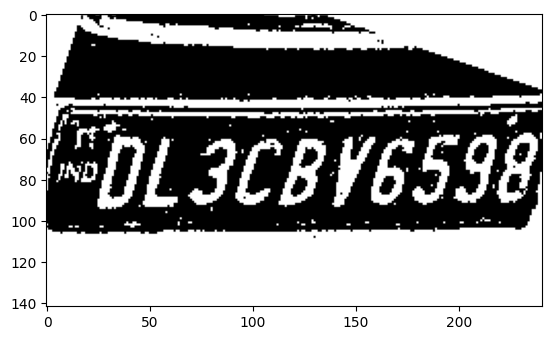

height =  1006 width =  1207


[962.163818359375, 788.1854858398438, 1205.4564208984375, 966.5679931640625, 0.6932154893875122, 0.0] track_id: 284.0
-0.4033758703164132


['0']
license before check 0
hello
License Plate Number with contours :  None , Score :  None
-0.4215932107141323
['DL3CB16598']
license before check DL3CB16598
license after check DL3CB16598
License Plate Number :  DL3CBI6598 , Score :  0.5852822190488486


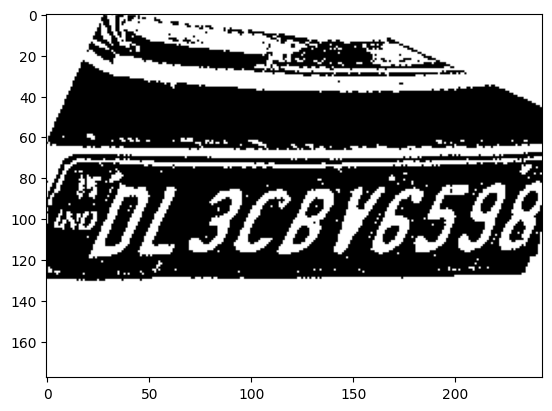

height =  1149 width =  1352


[1212.4027099609375, 817.7691650390625, 1290.628662109375, 935.5640258789062, 0.49763113260269165, 0.0] track_id: 284.0
1.4977557614917774


[]
License Plate Number with contours :  None , Score :  None
1.484802035600656
[]
License Plate Number :  None , Score :  None
height =  1244 width =  1525
height =  1277 width =  1682
height =  1255 width =  1858
height =  1238 width =  1892
height =  1193 width =  1842
height =  1132 width =  1761
height =  1049 width =  1649
height =  959 width =  1499
height =  898 width =  1296
height =  761 width =  1026
height =  630 width =  662
height =  85 width =  85
height =  87 width =  89
height =  89 width =  92
height =  92 width =  97
height =  92 width =  99
height =  93 width =  104
height =  94 width =  107
height =  97 width =  108
height =  99 width =  110
height =  103 width =  110
height =  101 width =  111
height =  101 width =  113
height =  108 width =  116
height =  110 width =  118
height =  114 width =  120
height =  118 width =  120
height =  123 width =  124
height =  132 width =  125
height =  141 width =  129
height =  139 width =  133
height =  150 width =  135
heigh

[67.1837387084961, 122.63557434082031, 120.85757446289062, 146.2296905517578, 0.7677904367446899, 0.0] track_id: 290.0
-0.22679884805388587


[]
License Plate Number with contours :  None , Score :  None
-0.22082876972934834
[]
License Plate Number :  None , Score :  None
height =  194 width =  176
[68.3734359741211, 124.37791442871094, 123.91143798828125, 146.4344024658203, 0.5845542550086975, 0.0] track_id: 290.0
-0.02702044918726479
height =  199 width =  178
[67.91079711914062, 129.23065185546875, 124.97113037109375, 152.09347534179688, 0.682468593120575, 0.0] track_id: 290.0
0.0
height =  201 width =  182
[67.12345123291016, 131.27162170410156, 126.91024017333984, 154.28524780273438, 0.6572397351264954, 0.0] track_id: 290.0
-0.21979507152403238
height =  201 width =  186


[69.00440979003906, 130.326171875, 128.87442016601562, 155.8978271484375, 0.6877761483192444, 0.0] track_id: 290.0
-0.22923193327699534


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['4SrkTe']
license before check 4SrkTe
hello
License Plate Number :  None , Score :  None
height =  206 width =  191


[72.07654571533203, 133.79156494140625, 132.89561462402344, 159.90606689453125, 0.884096086025238, 0.0] track_id: 290.0
-0.20963984587421253


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
[]
License Plate Number :  None , Score :  None
height =  217 width =  198


[76.18778991699219, 140.8238067626953, 139.07369995117188, 167.14431762695312, 0.9035055637359619, 0.0] track_id: 290.0
-0.23210383807515567


[]
License Plate Number with contours :  None , Score :  None
-0.22423475110909616
[]
License Plate Number :  None , Score :  None
height =  227 width =  203
[78.17152404785156, 147.69654846191406, 143.89955139160156, 174.04031372070312, 0.8941192626953125, 0.0] track_id: 290.0
-0.26791042242333973
height =  234 width =  208


[79.75346374511719, 152.66336059570312, 147.69143676757812, 180.3405303955078, 0.896642804145813, 0.0] track_id: 290.0
-0.21109333322274654


[]
License Plate Number with contours :  None , Score :  None
-0.20176234432028708
['KaRSIG']
license before check KaRSIG
hello
License Plate Number :  None , Score :  None
height =  239 width =  215


[82.94308471679688, 156.0484619140625, 153.42640686035156, 183.92605590820312, 0.8884214758872986, 0.0] track_id: 290.0
-0.22747498047282771


[]
License Plate Number with contours :  None , Score :  None
-0.20963984587421253
['EoL3EtiEeey']
license before check EoL3EtiEeey
hello
License Plate Number :  None , Score :  None
height =  249 width =  226
[88.794921875, 161.5963897705078, 161.4081268310547, 191.43785095214844, 0.9045234322547913, 0.0] track_id: 290.0
0.0
height =  254 width =  234


[91.90575408935547, 165.43165588378906, 166.7425079345703, 197.42999267578125, 0.9072675108909607, 0.0] track_id: 290.0
-0.2342552135942509


['IfelF']
license before check IfelF
hello
License Plate Number with contours :  None , Score :  None
-0.23109066719589708
['OLSCAIGLEI']
license before check OLSCAIGLEI
hello
License Plate Number :  None , Score :  None
height =  261 width =  242


[95.89470672607422, 170.39434814453125, 173.64242553710938, 204.4521942138672, 0.9008557796478271, 0.0] track_id: 290.0
-0.21866894587394195


[]
License Plate Number with contours :  None , Score :  None
-0.2287988453872256
['LoL3C1G6269']
license before check LoL3C1G6269
hello
License Plate Number :  None , Score :  None
height =  276 width =  255


[101.9169692993164, 178.75302124023438, 183.048583984375, 212.59178161621094, 0.9094361066818237, 0.0] track_id: 290.0
-0.12538912034151625


['L69']
license before check L69
hello
License Plate Number with contours :  None , Score :  None
-0.22581168154335537
['oLSc4RBZSS']
license before check oLSc4RBZSS
hello
License Plate Number :  None , Score :  None
height =  290 width =  266
[106.11278533935547, 190.61776733398438, 190.2861785888672, 224.44943237304688, 0.8989120125770569, 0.0] track_id: 290.0
-0.13958224392387875
height =  303 width =  280
[113.14754486083984, 197.9134521484375, 201.07728576660156, 235.34548950195312, 0.8866717219352722, 0.0] track_id: 290.0
-0.21050956212735614
height =  313 width =  291
[119.40282440185547, 207.9944610595703, 211.92202758789062, 247.37315368652344, 0.8857187032699585, 0.0] track_id: 290.0
-0.16261382859794857
height =  323 width =  303
[126.44532012939453, 216.3912353515625, 221.61129760742188, 257.09478759765625, 0.9024777412414551, 0.0] track_id: 290.0
-0.23066836992370324
height =  341 width =  317
[134.0115203857422, 228.52304077148438, 234.15638732910156, 273.49847412109375, 

[164.27651977539062, 268.990966796875, 279.23724365234375, 322.59716796875, 0.9053493142127991, 0.0] track_id: 290.0
-0.22631830988808688


['SS']
license before check SS
hello
License Plate Number with contours :  None , Score :  None
-0.2295273542432904
['OLIcARSZS9']
license before check OLIcARSZS9
hello
License Plate Number :  None , Score :  None
height =  417 width =  401
[179.50057983398438, 282.45440673828125, 301.0480041503906, 338.2847900390625, 0.901342511177063, 0.0] track_id: 290.0
-0.22402364703792346
height =  442 width =  428
[195.86085510253906, 300.9400939941406, 325.5882568359375, 359.2918701171875, 0.9045271873474121, 0.0] track_id: 290.0
-0.22244726542594168
height =  467 width =  459
[215.12603759765625, 322.4131774902344, 353.13525390625, 385.2685546875, 0.9035832285881042, 0.0] track_id: 290.0
-0.22402364703792346
height =  495 width =  495
[237.1994171142578, 347.23211669921875, 386.2842102050781, 414.8386535644531, 0.9028714895248413, 0.0] track_id: 290.0
-0.22679884805388587
height =  539 width =  539
[267.05682373046875, 375.7260437011719, 425.2470703125, 449.1543884277344, 0.9065920114517212, 0

[386.3287658691406, 501.370849609375, 586.96435546875, 596.6839599609375, 0.9140573740005493, 0.0] track_id: 290.0
-0.2438736912008837


['R']
license before check R
hello
License Plate Number with contours :  None , Score :  None
-0.2463227483389765
['DLICAR6L69']
license before check DLICAR6L69
license after check DLICAR6L69
License Plate Number :  DL1CAR6469 , Score :  0.35508169045954774


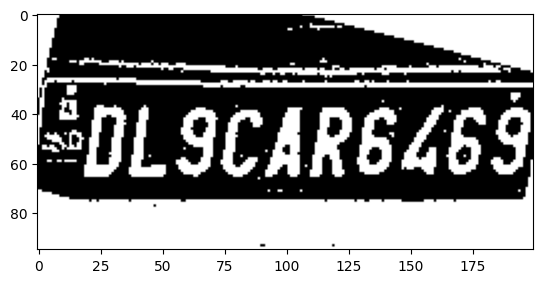

height =  756 width =  786
[450.42169189453125, 563.8192749023438, 669.4796142578125, 667.579345703125, 0.9148004651069641, 0.0] track_id: 290.0
-0.24774490779988076
height =  841 width =  881
[532.9844970703125, 635.667724609375, 770.1690673828125, 755.3434448242188, 0.9154836535453796, 0.0] track_id: 290.0
-0.27994982252379114
height =  937 width =  990


[638.3987426757812, 720.642578125, 890.5801391601562, 850.9288330078125, 0.9143471121788025, 0.0] track_id: 290.0
-0.2982254834114253


['0']
license before check 0
hello
License Plate Number with contours :  None , Score :  None
-0.31322457341772525
['DLICAR6LSS']
license before check DLICAR6LSS
license after check DLICAR6LSS
License Plate Number :  DL1CAR6455 , Score :  0.18566576770044782


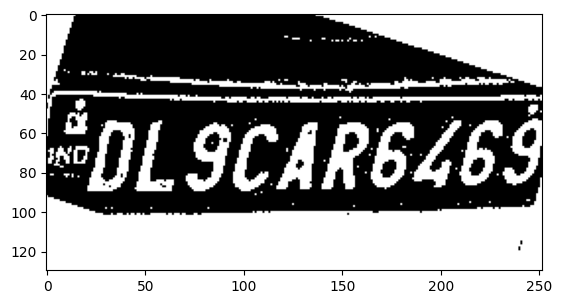

height =  1064 width =  1110


[770.9197998046875, 826.9669799804688, 1036.4737548828125, 980.519287109375, 0.9097259044647217, 0.0] track_id: 290.0
-0.38437482976879184


['D']
license before check D
hello
License Plate Number with contours :  None , Score :  None
-0.3478513226660079
['DL9CAR6Z69']
license before check DL9CAR6Z69
hello
License Plate Number :  None , Score :  None
height =  1208 width =  1252
height =  1258 width =  1401
height =  1267 width =  1581
height =  1238 width =  1843
height =  1205 width =  1867
height =  1076 width =  1670
height =  984 width =  1502
height =  89 width =  105
height =  90 width =  105
height =  92 width =  107
height =  93 width =  109
height =  94 width =  107
height =  95 width =  109
height =  96 width =  109
height =  96 width =  108
height =  97 width =  107
height =  96 width =  106
height =  91 width =  104
height =  92 width =  104
height =  92 width =  106
height =  97 width =  110
height =  97 width =  110
height =  96 width =  108
height =  98 width =  108
height =  98 width =  108
height =  98 width =  109
height =  96 width =  110
height =  95 width =  109
height =  97 width =  110
height =  97 w

[77.5030517578125, 100.76873779296875, 123.5323257446289, 120.45750427246094, 0.5576423406600952, 0.0] track_id: 292.0
-0.19063890591409552


[]
License Plate Number with contours :  None , Score :  None
-0.18394345653717517
['3']
license before check 3
hello
License Plate Number :  None , Score :  None
height =  166 width =  178
height =  167 width =  178


[76.00871276855469, 102.95233917236328, 123.40937042236328, 122.73023986816406, 0.5390032529830933, 0.0] track_id: 292.0
-0.20232162837830375


[]
License Plate Number with contours :  None , Score :  None
-0.17985349979247828
[]
License Plate Number :  None , Score :  None
height =  168 width =  178


[75.84032440185547, 104.22944641113281, 123.22125244140625, 122.9925308227539, 0.27246859669685364, 0.0] track_id: 292.0
-0.19164849668667716


[]
License Plate Number with contours :  None , Score :  None
-0.19739555984988075
[]
License Plate Number :  None , Score :  None
height =  169 width =  178
height =  169 width =  180
height =  172 width =  180
[74.95690155029297, 107.14155578613281, 124.34899139404297, 126.33673095703125, 0.30392181873321533, 0.0] track_id: 292.0
-0.18622284041114145
height =  175 width =  180
height =  177 width =  180


[74.18267059326172, 107.72175598144531, 123.69960021972656, 128.53451538085938, 0.5323925018310547, 0.0] track_id: 292.0
-0.18622284041114145


[]
License Plate Number with contours :  None , Score :  None
-0.18822150530477078
['7m15m']
license before check 7m15m
hello
License Plate Number :  None , Score :  None
height =  177 width =  182


[75.01416015625, 107.89090728759766, 125.5841064453125, 129.76760864257812, 0.5906890630722046, 0.0] track_id: 292.0
-0.18394345653717517


[]
License Plate Number with contours :  None , Score :  None
-0.17219081452293902
[]
License Plate Number :  None , Score :  None
height =  180 width =  183
[74.42503356933594, 111.08116912841797, 124.83984375, 133.0888671875, 0.2535659968852997, 0.0] track_id: 292.0
-0.18109265653121864
height =  184 width =  184
[73.183349609375, 114.42864990234375, 124.7926025390625, 135.57000732421875, 0.5649309754371643, 0.0] track_id: 292.0
-0.18948015788114733
height =  185 width =  183
[71.3432388305664, 117.81378173828125, 123.34068298339844, 137.77320861816406, 0.6131188273429871, 0.0] track_id: 292.0
-0.18092646075412158
height =  187 width =  184
[71.19674682617188, 118.52812194824219, 124.00029754638672, 139.6900634765625, 0.5215126276016235, 0.0] track_id: 292.0
-0.16514867741462683
height =  190 width =  182


[69.67340850830078, 117.99411010742188, 123.09953308105469, 143.05801391601562, 0.4344472885131836, 0.0] track_id: 292.0
-0.18822150530477078


[]
License Plate Number with contours :  None , Score :  None
-0.17219081452293902
[]
License Plate Number :  None , Score :  None
height =  190 width =  184


[70.0956039428711, 120.9936294555664, 123.45942687988281, 143.8306427001953, 0.5168502926826477, 0.0] track_id: 292.0
-0.18311081726248413


[]
License Plate Number with contours :  None , Score :  None
-0.19739555984988075
[]
License Plate Number :  None , Score :  None
height =  191 width =  186
[70.4355697631836, 121.81422424316406, 124.72116088867188, 143.89646911621094, 0.6790036559104919, 0.0] track_id: 292.0
-0.19739555984988075
height =  194 width =  187
[70.54206848144531, 124.1811294555664, 125.17765808105469, 145.4366455078125, 0.7276378870010376, 0.0] track_id: 292.0
-0.22347660114063303
height =  197 width =  189
[70.3480453491211, 126.58232116699219, 125.50106048583984, 147.94522094726562, 0.7358473539352417, 0.0] track_id: 292.0
-0.18873776752013358
height =  198 width =  191


[71.92166900634766, 127.47037506103516, 127.37886810302734, 149.8002471923828, 0.7618430852890015, 0.0] track_id: 292.0
-0.19528139809489925


[]
License Plate Number with contours :  None , Score :  None
-0.18394345653717517
[]
License Plate Number :  None , Score :  None
height =  200 width =  193
[72.77227020263672, 128.8897247314453, 129.03329467773438, 150.98960876464844, 0.4502829313278198, 0.0] track_id: 292.0
-0.19739555984988075
height =  204 width =  195
[72.87120819091797, 131.2612762451172, 130.28936767578125, 153.28675842285156, 0.6756731867790222, 0.0] track_id: 292.0
-0.1950202674049214
height =  205 width =  198
[74.26446533203125, 133.53517150878906, 132.2835693359375, 155.92974853515625, 0.8105555772781372, 0.0] track_id: 292.0
-0.15354378253955608
height =  209 width =  201
[75.18939208984375, 135.20384216308594, 133.39382934570312, 157.92677307128906, 0.7916262149810791, 0.0] track_id: 292.0
-0.21264492235777152
height =  212 width =  202
[74.941650390625, 137.05850219726562, 134.3877410888672, 160.07666015625, 0.7940756678581238, 0.0] track_id: 292.0
-0.1915017184696188
height =  215 width =  206
[75.4408

[86.98548126220703, 145.7050323486328, 152.68295288085938, 171.69740295410156, 0.8631671667098999, 0.0] track_id: 292.0
-0.18919902209996817


[]
License Plate Number with contours :  None , Score :  None
-0.16789592325037456
['IbojbW']
license before check IbojbW
hello
License Plate Number :  None , Score :  None
height =  229 width =  230


[89.81082153320312, 148.21165466308594, 156.24562072753906, 174.9698486328125, 0.8863082528114319, 0.0] track_id: 292.0
-0.18822150530477078


[]
License Plate Number with contours :  None , Score :  None
-0.21535769969773805
[]
License Plate Number :  None , Score :  None
height =  228 width =  233
[90.63057708740234, 150.68115234375, 157.53843688964844, 176.21730041503906, 0.8919400572776794, 0.0] track_id: 292.0
-0.1936219928559454
height =  230 width =  236
[90.87763214111328, 151.98114013671875, 159.39984130859375, 178.4961395263672, 0.8954469561576843, 0.0] track_id: 292.0
-0.18919902209996817
height =  233 width =  241
[93.87743377685547, 152.1075439453125, 163.27024841308594, 179.7944793701172, 0.8918284773826599, 0.0] track_id: 292.0
-0.19528139809489925
height =  242 width =  245
[96.38084411621094, 158.78643798828125, 167.1014862060547, 185.37200927734375, 0.8992647528648376, 0.0] track_id: 292.0
-0.18468438008645455
height =  246 width =  247
[96.65313720703125, 161.4881591796875, 167.59341430664062, 188.55792236328125, 0.8951470255851746, 0.0] track_id: 292.0
-0.19118445959701444
height =  254 width =  251
[98.30

[108.06159210205078, 181.048583984375, 186.56826782226562, 210.66983032226562, 0.9002571702003479, 0.0] track_id: 292.0
-0.15394466445834992


['T60b1']
license before check T60b1
hello
License Plate Number with contours :  None , Score :  None
-0.16514867741462683
['UI505213']
license before check UI505213
hello
License Plate Number :  None , Score :  None
height =  269 width =  279
[111.21118927001953, 182.75572204589844, 190.9015655517578, 213.3130645751953, 0.8951605558395386, 0.0] track_id: 292.0
-0.17985349979247828
height =  273 width =  284
[113.31803131103516, 187.5032958984375, 194.99107360839844, 218.5939178466797, 0.8954746723175049, 0.0] track_id: 292.0
-0.17707315477887528
height =  279 width =  290
[115.9100112915039, 191.85667419433594, 199.10711669921875, 223.4903564453125, 0.8951704502105713, 0.0] track_id: 292.0
-0.18863921622450308
height =  282 width =  294
[118.7155990600586, 195.5354461669922, 202.25115966796875, 228.1378936767578, 0.8999118208885193, 0.0] track_id: 292.0
-0.18534794999569476
height =  285 width =  299


[121.29916381835938, 198.12911987304688, 206.36744689941406, 232.24977111816406, 0.8993229866027832, 0.0] track_id: 292.0
-0.1877619465135934


['1609313']
license before check 1609313
hello
License Plate Number with contours :  None , Score :  None
-0.17722538494971946
['NF13809313']
license before check NF13809313
hello
License Plate Number :  None , Score :  None
height =  293 width =  306
[124.8994140625, 203.36297607421875, 212.0558319091797, 237.70938110351562, 0.8990679383277893, 0.0] track_id: 292.0
-0.20795854725293414
height =  302 width =  313
[127.949462890625, 208.89952087402344, 216.71334838867188, 243.5230255126953, 0.9006547927856445, 0.0] track_id: 292.0
-0.16261382859794857
height =  308 width =  323
[133.705322265625, 213.2852783203125, 224.2394256591797, 248.42845153808594, 0.8997175097465515, 0.0] track_id: 292.0
-0.18534794999569476
height =  315 width =  328
[135.60128784179688, 217.89376831054688, 228.78038024902344, 254.04666137695312, 0.897644579410553, 0.0] track_id: 292.0
-0.19142548152534322
height =  325 width =  335
[140.97357177734375, 223.87503051757812, 235.09934997558594, 260.8458557128906, 0

[160.1500701904297, 255.49325561523438, 266.52984619140625, 297.5223388671875, 0.8993093371391296, 0.0] track_id: 292.0
-0.18784171041228362


['9313']
license before check 9313
hello
License Plate Number with contours :  None , Score :  None
-0.1936219928559454
['FUPB09313']
license before check FUPB09313
hello
License Plate Number :  None , Score :  None
height =  369 width =  384
[166.52911376953125, 259.4741516113281, 274.6044921875, 302.2353515625, 0.9004777073860168, 0.0] track_id: 292.0
-0.19178814198670507
height =  374 width =  395
[172.2526092529297, 264.3102722167969, 283.5279846191406, 311.17877197265625, 0.9010055065155029, 0.0] track_id: 292.0
-0.18863921622450308
height =  389 width =  406
[179.2783203125, 272.20611572265625, 292.9244079589844, 318.89385986328125, 0.900185763835907, 0.0] track_id: 292.0
-0.19142548152534322
height =  400 width =  417
[186.0427703857422, 279.0964660644531, 303.0282287597656, 327.82220458984375, 0.9075939655303955, 0.0] track_id: 292.0
-0.1920480172407301
height =  413 width =  433
[196.82406616210938, 288.9520568847656, 316.6400451660156, 338.939208984375, 0.9013652801513672, 0.

[543.4036254882812, 528.8587036132812, 738.5853271484375, 623.0645141601562, 0.9114691615104675, 0.0] track_id: 292.0
-0.20425416286638085


[]
License Plate Number with contours :  None , Score :  None
-0.2097711656370821
['FUf11BO9313']
license before check FUf11BO9313
hello
License Plate Number :  None , Score :  None
height =  748 width =  917


[589.172119140625, 558.7684936523438, 790.0990600585938, 655.8233642578125, 0.9174081087112427, 0.0] track_id: 292.0
-0.2271433192769126


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.22601759821283154
['CUP11B09313']
license before check CUP11B09313
hello
License Plate Number :  None , Score :  None
height =  785 width =  969
[638.7522583007812, 592.1267700195312, 846.2164916992188, 695.165771484375, 0.9113340973854065, 0.0] track_id: 292.0
-0.22441600903714554
height =  827 width =  1018
[695.4141845703125, 624.7366333007812, 904.3463134765625, 735.0956420898438, 0.918329656124115, 0.0] track_id: 292.0
-0.2260683879938839
height =  870 width =  1076
[752.3071899414062, 658.47998046875, 966.1751098632812, 776.1346435546875, 0.8897473216056824, 0.0] track_id: 292.0
-0.28005199366008954
height =  920 width =  1136


[815.8841552734375, 694.1519165039062, 1037.3802490234375, 823.4592895507812, 0.8775109648704529, 0.0] track_id: 292.0
-0.31255239068523183


[]
License Plate Number with contours :  None , Score :  None
-0.2808377246212029
['FUF11B09313']
license before check FUF11B09313
hello
License Plate Number :  None , Score :  None
height =  973 width =  1198


[890.7211303710938, 740.8365478515625, 1108.30078125, 876.4999389648438, 0.8987486362457275, 0.0] track_id: 292.0
-0.3687914318897042


[]
License Plate Number with contours :  None , Score :  None
-0.3457233939716455
['11B09313', 'wUF']
license before check 11B09313wUF
hello
License Plate Number :  None , Score :  None
height =  1029 width =  1262


[963.2765502929688, 774.4268188476562, 1183.817138671875, 928.4855346679688, 0.8510776162147522, 0.0] track_id: 292.0
-0.38117706782333605


[]
License Plate Number with contours :  None , Score :  None
-0.3813193850633183
['EUf11809313']
license before check EUf11809313
hello
License Plate Number :  None , Score :  None
height =  1087 width =  1327
[1038.1328125, 813.3042602539062, 1256.871337890625, 979.1547241210938, 0.8645961880683899, 0.0] track_id: 292.0
-0.43561756904095966
height =  1151 width =  1395


[1123.56884765625, 858.5086059570312, 1332.142333984375, 1043.35693359375, 0.8351442217826843, 0.0] track_id: 292.0
-0.48953179436451943


['J1809313']
license before check J1809313
hello
License Plate Number with contours :  None , Score :  None
-0.7853981633974483
['2', 'UF', '1809']
license before check 2UF1809
hello
License Plate Number :  None , Score :  None
height =  1218 width =  1470
height =  1286 width =  1536
height =  1334 width =  1615
height =  1349 width =  1692
height =  1343 width =  1749
height =  1334 width =  1816
height =  1323 width =  1869
height =  1312 width =  1853
height =  1304 width =  1817
height =  1272 width =  1780
height =  1267 width =  1751
height =  1251 width =  1696
height =  1235 width =  1644
height =  1215 width =  1589
height =  1189 width =  1524
height =  1162 width =  1451
height =  1132 width =  1374
height =  1106 width =  1290
height =  1064 width =  1195
height =  1017 width =  1096
height =  974 width =  986
height =  927 width =  868
height =  876 width =  733
height =  778 width =  586
height =  658 width =  432
height =  104 width =  116
height =  106 width =  120
hei

[57.272037506103516, 59.425262451171875, 88.55299377441406, 77.90972137451172, 0.29091450572013855, 0.0] track_id: 296.0
-0.2629947316809195


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  108 width =  124


[59.07051467895508, 60.64559555053711, 91.55052185058594, 80.07026672363281, 0.48545870184898376, 0.0] track_id: 296.0
-0.2408464552414116


[]
License Plate Number with contours :  None , Score :  None
-0.25255427577805956
[]
License Plate Number :  None , Score :  None
height =  111 width =  127
[59.89148712158203, 62.812652587890625, 92.16120147705078, 82.30458068847656, 0.5154880285263062, 0.0] track_id: 296.0
-0.2662520491509254
height =  118 width =  127
[59.632625579833984, 67.94706726074219, 93.28369903564453, 87.48104858398438, 0.6061995029449463, 0.0] track_id: 296.0
0.33029735482925365
height =  123 width =  131
[62.040714263916016, 71.50907135009766, 94.5740737915039, 90.43909454345703, 0.6374159455299377, 0.0] track_id: 296.0
-0.23974310887045658
height =  127 width =  135
[62.75860595703125, 73.755126953125, 96.86280822753906, 93.83626556396484, 0.5170199871063232, 0.0] track_id: 296.0
-0.2635638835830379
height =  132 width =  136


[63.27560806274414, 76.79299926757812, 97.38237762451172, 96.98038482666016, 0.5133296847343445, 0.0] track_id: 296.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  133 width =  138
[64.33043670654297, 79.1589126586914, 98.11109924316406, 98.61933898925781, 0.8479979038238525, 0.0] track_id: 296.0
-0.26211984126547283
height =  135 width =  141


[64.98721313476562, 79.4481201171875, 99.57691955566406, 98.82701873779297, 0.8763045072555542, 0.0] track_id: 296.0
-0.2587708919636976


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  140 width =  144
[67.05892181396484, 81.64501953125, 102.8252182006836, 101.78071594238281, 0.8786166310310364, 0.0] track_id: 296.0
-0.2408464552414116
height =  141 width =  148
[68.02376556396484, 80.41476440429688, 104.06748962402344, 101.14164733886719, 0.8749200105667114, 0.0] track_id: 296.0
-0.24828990930306807
height =  142 width =  149
[68.48430633544922, 79.7801742553711, 104.66240692138672, 100.423583984375, 0.9025651216506958, 0.0] track_id: 296.0
-0.2635638835830379
height =  141 width =  151
[69.39664459228516, 79.03990173339844, 106.34102630615234, 99.34484100341797, 0.9103572368621826, 0.0] track_id: 296.0
-0.23441567572381078
height =  144 width =  152
[71.43474578857422, 81.93594360351562, 108.94573974609375, 102.70591735839844, 0.8900152444839478, 0.0] track_id: 296.0
-0.23824475817874502
height =  146 width =  156
[73.19905853

[72.44998168945312, 88.0914306640625, 111.07472229003906, 109.21070098876953, 0.9064467549324036, 0.0] track_id: 296.0
-0.22964244228513467


[]
License Plate Number with contours :  None , Score :  None
-0.20902294280626463
[]
License Plate Number :  None , Score :  None
height =  155 width =  160
[73.35395812988281, 89.62550354003906, 112.86210632324219, 111.17436218261719, 0.9006215333938599, 0.0] track_id: 296.0
-0.2624593998262764
height =  158 width =  163
[74.50279235839844, 90.69200134277344, 115.27919006347656, 113.37041473388672, 0.8996585607528687, 0.0] track_id: 296.0
-0.2546246661945415
height =  161 width =  166
[74.51680755615234, 93.86223602294922, 115.8567886352539, 116.74797821044922, 0.9106627106666565, 0.0] track_id: 296.0
-0.2513277841608404
height =  164 width =  169
[76.26944732666016, 96.5977554321289, 118.50091552734375, 119.72718811035156, 0.9041381478309631, 0.0] track_id: 296.0
-0.24497866312686414
height =  167 width =  172


[77.57221221923828, 97.92249298095703, 120.58676147460938, 120.92903900146484, 0.9091205596923828, 0.0] track_id: 296.0
-0.23893644058616342


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  172 width =  175
[78.74302673339844, 100.0998306274414, 123.35002136230469, 123.871337890625, 0.9113689661026001, 0.0] track_id: 296.0
-0.2591020177794102
height =  175 width =  179
[80.66365814208984, 101.90929412841797, 126.06002807617188, 126.04476165771484, 0.9065035581588745, 0.0] track_id: 296.0
-0.2567083304333857
height =  179 width =  182
[81.40740966796875, 104.92498779296875, 127.5623550415039, 129.47117614746094, 0.9087761044502258, 0.0] track_id: 296.0
-0.2629947316809195
height =  183 width =  184
[83.43036651611328, 108.44683074951172, 130.22938537597656, 132.95103454589844, 0.9124643802642822, 0.0] track_id: 296.0
-0.26791042242333973
height =  189 width =  188
[84.67430114746094, 112.42790985107422, 132.7666473388672, 138.2733154296875, 0.9097769856452942, 0.0] track_id: 296.0
-0.23974310887045658
height =  195 width =  192
[87.05

[89.348388671875, 120.55118560791016, 140.54640197753906, 148.2060089111328, 0.9151381850242615, 0.0] track_id: 296.0
-0.2633976325455006


[]
License Plate Number with contours :  None , Score :  None
-0.2401710078601731
[]
License Plate Number :  None , Score :  None
height =  202 width =  205
[93.21168518066406, 122.52548217773438, 145.0894012451172, 150.55419921875, 0.9162231087684631, 0.0] track_id: 296.0
-0.24207169457111893
height =  209 width =  212


[96.88842010498047, 125.33216857910156, 150.74856567382812, 155.02008056640625, 0.9125110507011414, 0.0] track_id: 296.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.2405342479459046
[]
License Plate Number :  None , Score :  None
height =  213 width =  217


[98.78911590576172, 127.64579010009766, 154.0284881591797, 158.03260803222656, 0.907964825630188, 0.0] track_id: 296.0
-0.24220858710962045


['BNIEX']
license before check BNIEX
hello
License Plate Number with contours :  None , Score :  None
-0.25436805855326594
[]
License Plate Number :  None , Score :  None
height =  216 width =  222


[101.95684814453125, 127.66783142089844, 158.7601318359375, 157.71656799316406, 0.9164820909500122, 0.0] track_id: 296.0
-0.2648173299057889


['cini']
license before check cini
hello
License Plate Number with contours :  None , Score :  None
-0.22527677921405528
['WodE']
license before check WodE
hello
License Plate Number :  None , Score :  None
height =  218 width =  224
[103.07840728759766, 131.08102416992188, 160.86972045898438, 162.5110321044922, 0.9041662812232971, 0.0] track_id: 296.0
-0.259940140188528
height =  225 width =  231
[105.8584213256836, 134.09539794921875, 165.85560607910156, 167.51394653320312, 0.9112681746482849, 0.0] track_id: 296.0
-0.25933174440068485
height =  230 width =  237


[109.69365692138672, 138.49368286132812, 171.01852416992188, 172.1387939453125, 0.9085217118263245, 0.0] track_id: 296.0
0.1006686521578289


[]
License Plate Number with contours :  None , Score :  None
-0.2662520491509254
['VLOTDTTSE']
license before check VLOTDTTSE
hello
License Plate Number :  None , Score :  None
height =  236 width =  241
[111.07269287109375, 143.09239196777344, 174.0737762451172, 177.21878051757812, 0.9153919816017151, 0.0] track_id: 296.0
-0.25682644996980775
height =  241 width =  249


[114.95278930664062, 145.8468017578125, 179.58062744140625, 180.45602416992188, 0.9127572774887085, 0.0] track_id: 296.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  243 width =  255


[119.33273315429688, 149.81509399414062, 186.1958465576172, 186.1428985595703, 0.9135936498641968, 0.0] track_id: 296.0
-0.2405342479459046


['OTTE5E9D']
license before check OTTE5E9D
hello
License Plate Number with contours :  None , Score :  None
-0.24135549057540379
[]
License Plate Number :  None , Score :  None
height =  251 width =  264
[123.71765899658203, 153.94644165039062, 192.96224975585938, 191.16525268554688, 0.9147463440895081, 0.0] track_id: 296.0
-0.2424470229658554
height =  259 width =  274
[128.36936950683594, 157.37168884277344, 199.4357147216797, 195.51803588867188, 0.9155629873275757, 0.0] track_id: 296.0
-0.24497866312686414
height =  269 width =  283
[133.43179321289062, 162.04039001464844, 207.19105529785156, 202.14608764648438, 0.9099059700965881, 0.0] track_id: 296.0
-0.24709730402471683
height =  279 width =  294
[139.62303161621094, 165.8072052001953, 215.62472534179688, 207.8300018310547, 0.9190912246704102, 0.0] track_id: 296.0
-0.24702365005121815
height =  284 width =  306
[145.025390625, 173.76571655273438, 223.74232482910156, 215.31466674804688, 0.9215299487113953, 0.0] track_id: 296.0
-0.

[206.45166015625, 234.3094482421875, 310.4053955078125, 287.4095764160156, 0.9170857667922974, 0.0] track_id: 296.0
-0.24330921559601026
['UK07TB5690']
license before check UK07TB5690
license after check UK07TB5690
License Plate Number with contours :  UK07TB5690 , Score :  0.12357532002439654


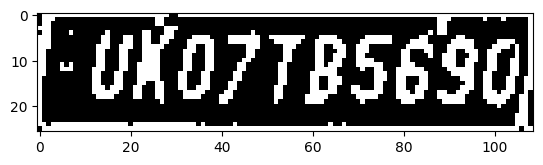

height =  374 width =  422
[218.10911560058594, 245.04727172851562, 325.506591796875, 300.6572265625, 0.9176516532897949, 0.0] track_id: 296.0
-0.24289533280760475
height =  390 width =  443
[230.1666259765625, 258.5632629394531, 342.1868591308594, 315.09136962890625, 0.9149748086929321, 0.0] track_id: 296.0
-0.2425514834271907
height =  406 width =  465
[243.5727996826172, 269.0715026855469, 361.5912170410156, 328.7430419921875, 0.9160658121109009, 0.0] track_id: 296.0
-0.22734380712800387
height =  429 width =  492
[261.7309265136719, 285.5327453613281, 386.26739501953125, 348.4915771484375, 0.9191433787345886, 0.0] track_id: 296.0
-0.22581168154335537
height =  447 width =  522
[283.8717956542969, 301.8398132324219, 413.8165588378906, 368.64031982421875, 0.9181470274925232, 0.0] track_id: 296.0
-0.23032173232245376
height =  476 width =  556
[307.7403564453125, 321.0531005859375, 443.9178771972656, 392.2134094238281, 0.9145158529281616, 0.0] track_id: 296.0
-0.22540285082206107
heig

[330.9847106933594, 340.8602600097656, 476.0218811035156, 413.9161682128906, 0.921005368232727, 0.0] track_id: 296.0
-0.24497866312686414
['UK0ztB5690']
license before check UK0ztB5690
license after check UK0ZTB5690
License Plate Number with contours :  UK0ZTB5690 , Score :  0.20905434613719182


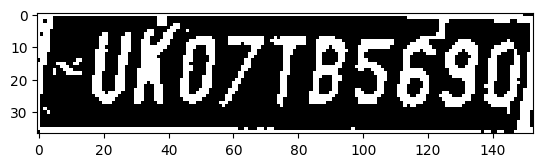

height =  531 width =  635
[362.9518737792969, 360.80615234375, 516.3303833007812, 439.5515441894531, 0.9173000454902649, 0.0] track_id: 296.0
-0.24497866312686414
height =  564 width =  680
[395.9007568359375, 388.0861511230469, 558.0326538085938, 471.7542724609375, 0.9189440011978149, 0.0] track_id: 296.0
-0.2422723097884356
height =  593 width =  731


[434.4860534667969, 412.65838623046875, 607.5620727539062, 501.8509216308594, 0.9261261224746704, 0.0] track_id: 296.0
-0.24044868278824572


[]
License Plate Number with contours :  None , Score :  None
-0.24199804602212852
['JUk07TB5690']
license before check JUk07TB5690
hello
License Plate Number :  None , Score :  None
height =  642 width =  786


[479.3204040527344, 448.0088195800781, 662.3287353515625, 545.8990478515625, 0.9282156825065613, 0.0] track_id: 296.0
-0.24309542618184357


[]
License Plate Number with contours :  None , Score :  None
-0.24347941387536423
['Uk07t85690']
license before check Uk07t85690
hello
License Plate Number :  None , Score :  None
height =  694 width =  853


[532.03515625, 488.2247314453125, 726.8242797851562, 594.0961303710938, 0.924201250076294, 0.0] track_id: 296.0
-0.2578134308966809


[]
License Plate Number with contours :  None , Score :  None
-0.2642600199133301
['U07t85690']
license before check U07t85690
hello
License Plate Number :  None , Score :  None
height =  748 width =  926


[597.6264038085938, 537.5338745117188, 804.0831909179688, 650.8591918945312, 0.9155710935592651, 0.0] track_id: 296.0
-0.26252072318426667


[]
License Plate Number with contours :  None , Score :  None
-0.27898741680588834
['IUko7tB5690']
license before check IUko7tB5690
hello
License Plate Number :  None , Score :  None
height =  815 width =  1013


[680.1498413085938, 592.9863891601562, 893.501220703125, 718.0707397460938, 0.9290562868118286, 0.0] track_id: 296.0
-0.29788240885294875


['K']
license before check K
hello
License Plate Number with contours :  None , Score :  None
-0.29770020971130084
['UKo7tB5690']
license before check UKo7tB5690
license after check UKO7TB5690
License Plate Number :  UK07TB5690 , Score :  0.3726156972025403


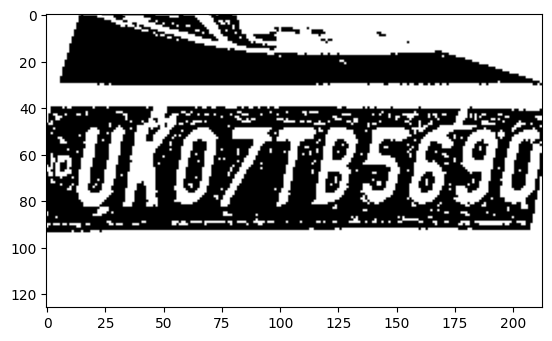

height =  893 width =  1098


[769.5430297851562, 649.5325927734375, 994.5186767578125, 790.2027587890625, 0.9212842583656311, 0.0] track_id: 296.0
-0.3326857199660251


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.328553170551451
['UK07TB569g']
license before check UK07TB569g
license after check UK07TB569G
License Plate Number :  UK07TB5696 , Score :  0.28278969401364246


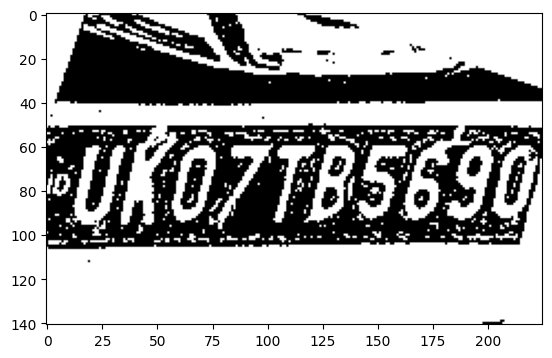

height =  984 width =  1196


[877.9802856445312, 719.6386108398438, 1104.1451416015625, 874.5564575195312, 0.9240453243255615, 0.0] track_id: 296.0
-0.40122879900484876


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.4036781946478685
['Ukd7tB5690']
license before check Ukd7tB5690
hello
License Plate Number :  None , Score :  None
height =  1095 width =  1308


[1007.3914794921875, 807.5127563476562, 1233.906982421875, 976.8902587890625, 0.889079749584198, 0.0] track_id: 296.0
-0.4522474514291617


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.4546388437103892
['UK07tB5690']
license before check UK07tB5690
license after check UK07TB5690
License Plate Number :  UK07TB5690 , Score :  0.2126904826766


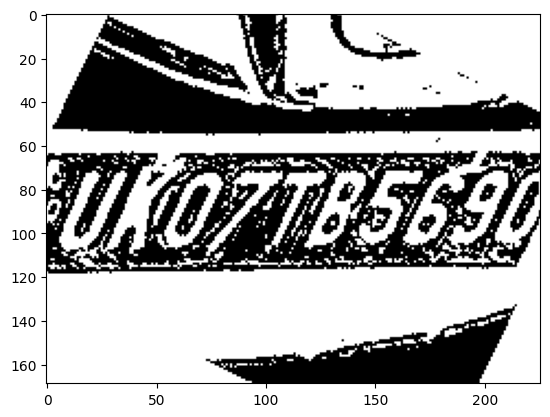

height =  1210 width =  1426


[1148.2374267578125, 901.3436279296875, 1365.3883056640625, 1080.7109375, 0.38318249583244324, 0.0] track_id: 296.0
-0.5762132248044912


[]
License Plate Number with contours :  None , Score :  None
-0.5571243901593956
['UK071B569E']
license before check UK071B569E
hello
License Plate Number :  None , Score :  None
height =  1261 width =  1548
height =  1265 width =  1658
height =  1252 width =  1772
height =  1236 width =  1903
height =  1220 width =  1931
height =  1174 width =  1888
height =  1132 width =  1831
height =  1065 width =  1762
height =  994 width =  1681
height =  923 width =  1574
height =  831 width =  1447
height =  745 width =  1292
height =  655 width =  1068
height =  564 width =  790
height =  110 width =  122
height =  116 width =  126
height =  120 width =  128
height =  120 width =  128
height =  123 width =  131
height =  126 width =  133
height =  129 width =  136
height =  129 width =  141
height =  130 width =  142
height =  129 width =  147
height =  128 width =  151
height =  134 width =  152
[76.28288269042969, 87.42070770263672, 112.14419555664062, 102.023193359375, 0.2686444818973541, 

[98.07333374023438, 135.3982391357422, 153.7242431640625, 161.7574920654297, 0.8817633390426636, 0.0] track_id: 298.0
-0.20442120537714656


[]
License Plate Number with contours :  None , Score :  None
-0.19739555984988075
['FTE']
license before check FTE
hello
License Plate Number :  None , Score :  None
height =  215 width =  219
[99.596923828125, 139.82400512695312, 156.4733123779297, 165.8831329345703, 0.9074956774711609, 0.0] track_id: 298.0
-0.20365852597754822
height =  222 width =  222
[101.02427673339844, 144.6220703125, 159.26438903808594, 171.1910400390625, 0.9066261053085327, 0.0] track_id: 298.0
-0.2171113147349052
height =  225 width =  229


[104.26250457763672, 147.903076171875, 163.69744873046875, 174.31997680664062, 0.9120422601699829, 0.0] track_id: 298.0
-0.18919902209996817


[]
License Plate Number with contours :  None , Score :  None
-0.20846521837998772
['Fi23D7']
license before check Fi23D7
hello
License Plate Number :  None , Score :  None
height =  227 width =  233
[104.71540832519531, 151.402099609375, 165.89120483398438, 178.98687744140625, 0.9032787680625916, 0.0] track_id: 298.0
-0.19944054677423476
height =  235 width =  236
[104.53040313720703, 155.6708526611328, 167.5296630859375, 183.2890167236328, 0.9089990854263306, 0.0] track_id: 298.0
-0.19118445959701444
height =  243 width =  245


[109.11997985839844, 159.9515838623047, 173.4191131591797, 188.631591796875, 0.9144593477249146, 0.0] track_id: 298.0
-0.20687394897974307


[]
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
['RTfo7P7']
license before check RTfo7P7
hello
License Plate Number :  None , Score :  None
height =  251 width =  251


[111.9693374633789, 166.38722229003906, 178.14144897460938, 196.05735778808594, 0.9118875861167908, 0.0] track_id: 298.0
-0.2080561367910258


['Wtne']
license before check Wtne
hello
License Plate Number with contours :  None , Score :  None
-0.2099735128621634
['torKfcctet']
license before check torKfcctet
hello
License Plate Number :  None , Score :  None
height =  258 width =  257
[114.98574829101562, 172.35079956054688, 182.3993682861328, 203.11021423339844, 0.9100724458694458, 0.0] track_id: 298.0
-0.1762346977366758
height =  264 width =  262
[116.62255096435547, 178.7899932861328, 186.1693572998047, 210.22007751464844, 0.91780024766922, 0.0] track_id: 298.0
-0.19043511541355415
height =  274 width =  270


[119.93596649169922, 184.69088745117188, 192.12599182128906, 217.57090759277344, 0.9184697270393372, 0.0] track_id: 298.0
-0.1746721990082397


['fning']
license before check fning
hello
License Plate Number with contours :  None , Score :  None
-0.18622284041114145
['PuTecTubdB']
license before check PuTecTubdB
hello
License Plate Number :  None , Score :  None
height =  283 width =  279


[124.68267822265625, 191.28538513183594, 198.14944458007812, 224.89443969726562, 0.9143585562705994, 0.0] track_id: 298.0
-0.1920480172407301


['WfIfjee']
license before check WfIfjee
hello
License Plate Number with contours :  None , Score :  None
-0.20599133667583147
['VPIgpQns']
license before check VPIgpQns
hello
License Plate Number :  None , Score :  None
height =  289 width =  287


[127.88329315185547, 198.028564453125, 204.55584716796875, 231.7527618408203, 0.907952070236206, 0.0] track_id: 298.0
-0.20152776773533332


['EMNjeH']
license before check EMNjeH
hello
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
['EuPIGcFDopa']
license before check EuPIGcFDopa
hello
License Plate Number :  None , Score :  None
height =  295 width =  297


[132.79736328125, 202.12156677246094, 212.00592041015625, 237.83987426757812, 0.9103915095329285, 0.0] track_id: 298.0
-0.20401797959254858


['Vtf0e0b']
license before check Vtf0e0b
hello
License Plate Number with contours :  None , Score :  None
-0.18948015788114733
['EWPIGCFODQT']
license before check EWPIGCFODQT
hello
License Plate Number :  None , Score :  None
height =  302 width =  303


[134.9897003173828, 208.53390502929688, 216.4566650390625, 245.9930877685547, 0.9136555790901184, 0.0] track_id: 298.0
-0.20877718218206526


['Urierf0om']
license before check Urierf0om
hello
License Plate Number with contours :  None , Score :  None
-0.19239560151592244
['FupI6cfODQ8']
license before check FupI6cfODQ8
hello
License Plate Number :  None , Score :  None
height =  315 width =  313


[140.3372344970703, 219.98550415039062, 224.04071044921875, 257.704833984375, 0.9174613952636719, 0.0] track_id: 298.0
-0.21866894587394195


['16CF4ooB']
license before check 16CF4ooB
hello
License Plate Number with contours :  None , Score :  None
-0.20687394897974307
['FVPI6CFODOB']
license before check FVPI6CFODOB
hello
License Plate Number :  None , Score :  None
height =  331 width =  323


[144.0930938720703, 229.13038635253906, 230.80429077148438, 267.516845703125, 0.9166955947875977, 0.0] track_id: 298.0
-0.1920480172407301


['UpIGcF000b']
license before check UpIGcF000b
hello
License Plate Number with contours :  None , Score :  None
-0.19043511541355415
['EWPIecfodpe']
license before check EWPIecfodpe
hello
License Plate Number :  None , Score :  None
height =  346 width =  333


[149.5723114013672, 241.42982482910156, 238.87745666503906, 281.2371520996094, 0.9201211333274841, 0.0] track_id: 298.0
-0.19228487180759413
['UP1gcfOOO8']
license before check UP1gcfOOO8
license after check UP1GCFOOO8
License Plate Number with contours :  UP1GCF0008 , Score :  0.07149437099635891


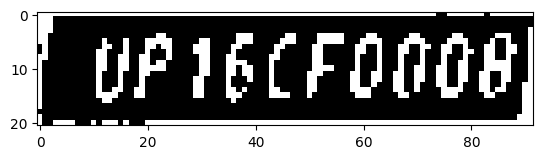

height =  360 width =  346


[156.506591796875, 251.4658203125, 249.3992919921875, 293.197265625, 0.9196842312812805, 0.0] track_id: 298.0
-0.20749622643520266


['tPi6cfQoob']
license before check tPi6cfQoob
hello
License Plate Number with contours :  None , Score :  None
-0.1908311027212619
['FvP16cfQoo8']
license before check FvP16cfQoo8
hello
License Plate Number :  None , Score :  None
height =  375 width =  360


[164.33705139160156, 262.89666748046875, 261.48895263671875, 305.3883056640625, 0.9136475920677185, 0.0] track_id: 298.0
-0.20152776773533332


['Up1gcFoqo8']
license before check Up1gcFoqo8
hello
License Plate Number with contours :  None , Score :  None
-0.21182754748141747
['UP1gcfQ0o8']
license before check UP1gcfQ0o8
hello
License Plate Number :  None , Score :  None
height =  390 width =  376


[174.9407196044922, 274.8312683105469, 274.70928955078125, 320.0945739746094, 0.9084537029266357, 0.0] track_id: 298.0
-0.19118445959701444


['UptecfoobT']
license before check UptecfoobT
hello
License Plate Number with contours :  None , Score :  None
-0.1934273267108474
['PUPTgcFOQOB']
license before check PUPTgcFOQOB
hello
License Plate Number :  None , Score :  None
height =  407 width =  388


[180.4415283203125, 287.9712219238281, 283.9762268066406, 335.38092041015625, 0.9146755933761597, 0.0] track_id: 298.0
-0.21109333322274654


['UPT6tFOoo8']
license before check UPT6tFOoo8
hello
License Plate Number with contours :  None , Score :  None
-0.20687394897974307
['eUptgcfooo8']
license before check eUptgcfooo8
hello
License Plate Number :  None , Score :  None
height =  418 width =  404


[188.35548400878906, 297.06451416015625, 296.05206298828125, 346.12542724609375, 0.9141772985458374, 0.0] track_id: 298.0
-0.1751109879225975


['UP16cf0d08']
license before check UP16cf0d08
hello
License Plate Number with contours :  None , Score :  None
-0.18998828791871572
['UpigcfoQo8']
license before check UpigcfoQo8
hello
License Plate Number :  None , Score :  None
height =  434 width =  423


[198.72044372558594, 308.0234069824219, 311.9711608886719, 358.7485046386719, 0.9183085560798645, 0.0] track_id: 298.0
-0.17593962545252784
['Up16cF0o08']
license before check Up16cF0o08
license after check UP16CF0O08
License Plate Number with contours :  UP16CF0008 , Score :  0.16820413235141501


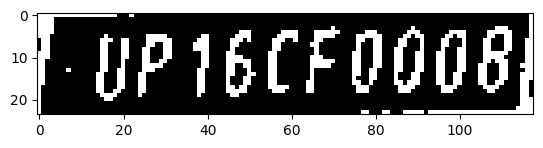

height =  446 width =  440


[208.09971618652344, 319.2552185058594, 326.1617431640625, 372.4096984863281, 0.9191432595252991, 0.0] track_id: 298.0
-0.18580187642843055
['Up16cF00o8']
license before check Up16cF00o8
license after check UP16CF00O8
License Plate Number with contours :  UP16CF0008 , Score :  0.17592201413477132


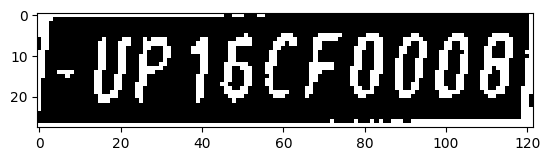

height =  460 width =  462


[221.9674835205078, 333.8202819824219, 346.2283935546875, 389.2267150878906, 0.9115688800811768, 0.0] track_id: 298.0
-0.17421578644294416
['Up1cF00o8']
license before check Up1cF00o8
license after check UP1CF00O8
License Plate Number with contours :  UP1CF0008 , Score :  0.2511632828431383


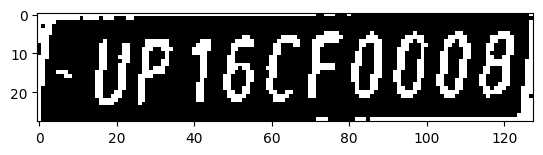

height =  482 width =  485


[236.1651153564453, 350.1025085449219, 365.4725646972656, 408.30108642578125, 0.9081474542617798, 0.0] track_id: 298.0
-0.19051808919364915
['Up16cF0oo8']
license before check Up16cF0oo8
license after check UP16CF0OO8
License Plate Number with contours :  UP16CF0008 , Score :  0.2538739299493902


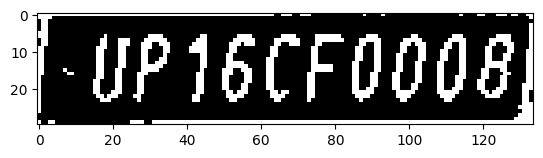

height =  505 width =  510


[251.62664794921875, 370.12322998046875, 386.8675231933594, 431.0433044433594, 0.913642942905426, 0.0] track_id: 298.0
-0.19142548152534322
['UP16cFOO81']
license before check UP16cFOO81
license after check UP16CFOO81
License Plate Number with contours :  UP16CF0081 , Score :  0.1362122672868595


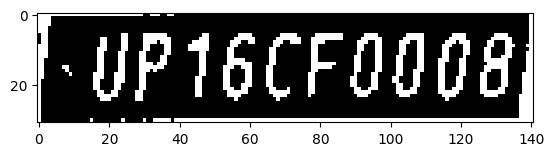

height =  532 width =  539


[269.5864562988281, 390.6269226074219, 412.23321533203125, 454.9041748046875, 0.9127811193466187, 0.0] track_id: 298.0
-0.19982864507299022
['Up16cFOOO8']
license before check Up16cFOOO8
license after check UP16CFOOO8
License Plate Number with contours :  UP16CF0008 , Score :  0.20578445169346016


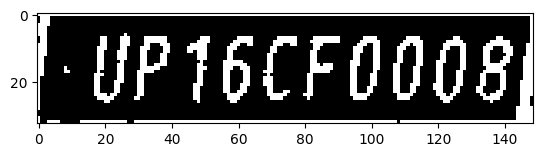

height =  557 width =  569


[288.53546142578125, 412.3273620605469, 439.06854248046875, 478.8974609375, 0.9193505644798279, 0.0] track_id: 298.0
-0.1960313042160443
['UP16CF0OO8']
license before check UP16CF0OO8
license after check UP16CF0OO8
License Plate Number with contours :  UP16CF0008 , Score :  0.09653370073119572


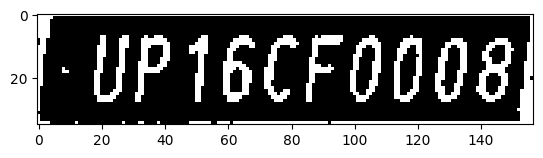

height =  586 width =  604


[311.373046875, 436.77459716796875, 469.2417297363281, 508.13507080078125, 0.9139103889465332, 0.0] track_id: 298.0
-0.20982831175965547
['UP1GCFO008']
license before check UP1GCFO008
license after check UP1GCFO008
License Plate Number with contours :  UP1GCF0008 , Score :  0.4362404810801763


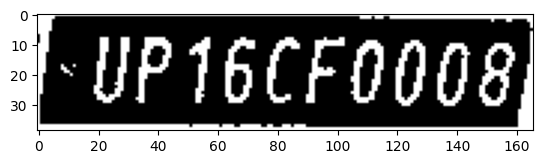

height =  620 width =  640


[337.13818359375, 469.0616455078125, 504.004150390625, 543.52392578125, 0.9182690382003784, 0.0] track_id: 298.0
-0.21075354390520853
['UP16CFooo8']
license before check UP16CFooo8
license after check UP16CFOOO8
License Plate Number with contours :  UP16CF0008 , Score :  0.19472955195455596


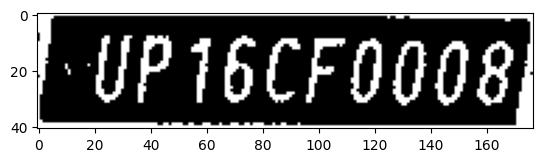

height =  650 width =  681


[363.4654235839844, 500.61444091796875, 542.54052734375, 582.4349365234375, 0.9122569561004639, 0.0] track_id: 298.0
-0.2082059495239874


['UP16CFO0081']
license before check UP16CFO0081
hello
License Plate Number with contours :  None , Score :  None
-0.20836003272769868
['Up16cFooo8']
license before check Up16cFooo8
license after check UP16CFOOO8
License Plate Number :  UP16CF0008 , Score :  0.121537834790944


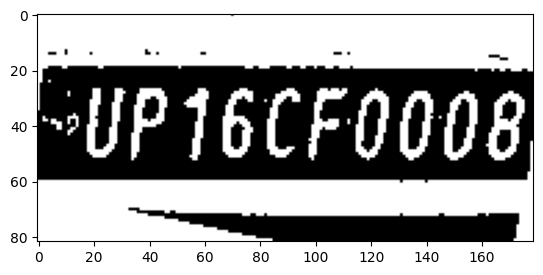

height =  688 width =  727


[397.3274230957031, 536.0993041992188, 585.1044311523438, 620.1549682617188, 0.9235110282897949, 0.0] track_id: 298.0
-0.2077686317676094
['UP16CFOO08']
license before check UP16CFOO08
license after check UP16CFOO08
License Plate Number with contours :  UP16CF0008 , Score :  0.26750712733949067


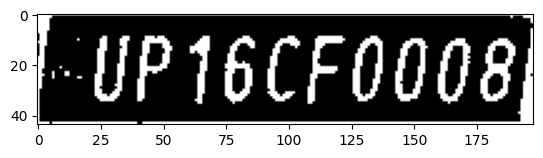

height =  730 width =  777


[431.58551025390625, 574.0294189453125, 634.230712890625, 667.8114624023438, 0.9189179539680481, 0.0] track_id: 298.0
-0.2082059495239874
['UP16CF0008']
license before check UP16CF0008
license after check UP16CF0008
License Plate Number with contours :  UP16CF0008 , Score :  0.32111129171525415


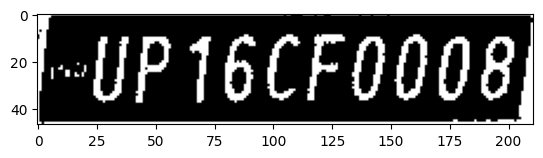

height =  778 width =  832


[477.1476745605469, 620.6455078125, 691.08837890625, 722.7579956054688, 0.918445885181427, 0.0] track_id: 298.0
-0.22981189551442102
['UP16CFOOO8']
license before check UP16CFOOO8
license after check UP16CFOOO8
License Plate Number with contours :  UP16CF0008 , Score :  0.31874421644087514


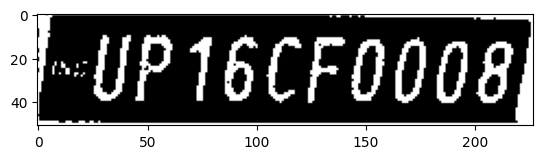

height =  834 width =  895


[528.8634033203125, 670.3453369140625, 758.12109375, 784.4114990234375, 0.9142597913742065, 0.0] track_id: 298.0
-0.22460947005233695
['UPI6CFOO08']
license before check UPI6CFOO08
license after check UPI6CFOO08
License Plate Number with contours :  UP16CF0008 , Score :  0.22850338003357787


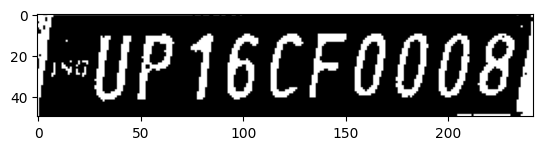

height =  897 width =  966


[593.1128540039062, 730.0545043945312, 837.6660766601562, 855.7628173828125, 0.9206310510635376, 0.0] track_id: 298.0
-0.2631411017032934
['UP16CFOO08']
license before check UP16CFOO08
license after check UP16CFOO08
License Plate Number with contours :  UP16CF0008 , Score :  0.24074183123228216


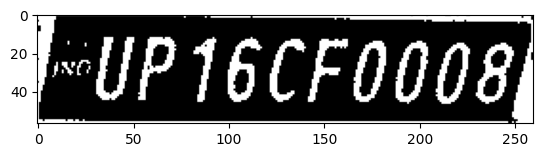

height =  972 width =  1048


[670.5296630859375, 798.4017944335938, 931.7694702148438, 939.8236694335938, 0.9195907711982727, 0.0] track_id: 298.0
-0.27829965900511133


['UP16CFOO081']
license before check UP16CFOO081
hello
License Plate Number with contours :  None , Score :  None
-0.27891962172791485
['UP16CF0008']
license before check UP16CF0008
license after check UP16CF0008
License Plate Number :  UP16CF0008 , Score :  0.4617678641876321


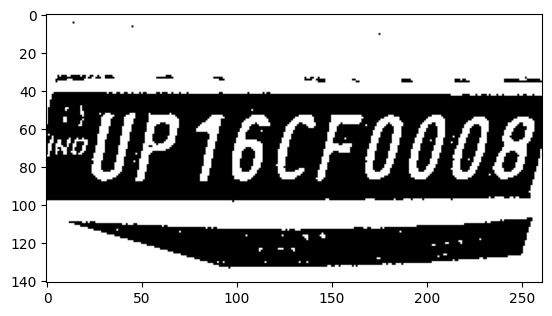

height =  1061 width =  1137


[765.371826171875, 871.5933837890625, 1038.79345703125, 1031.4287109375, 0.9175741672515869, 0.0] track_id: 298.0
-0.3140137648625382
['UP16CF0008']
license before check UP16CF0008
license after check UP16CF0008
License Plate Number with contours :  UP16CF0008 , Score :  0.7816973894017117


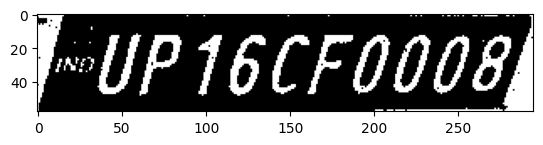

height =  1166 width =  1240


[877.9110107421875, 959.0160522460938, 1158.655517578125, 1135.9349365234375, 0.9211400747299194, 0.0] track_id: 298.0
-0.3664967858512578
['UP16CF0008']
license before check UP16CF0008
license after check UP16CF0008
License Plate Number with contours :  UP16CF0008 , Score :  0.32551577507427454


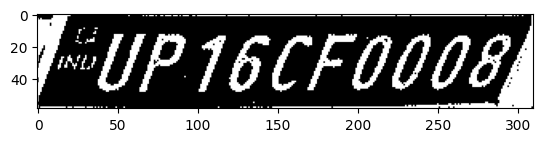

[490.2479248046875, 785.468017578125, 662.7249755859375, 867.3827514648438, 0.2605568468570709, 0.0] track_id: 298.0
0.17383724234170828


[]
License Plate Number with contours :  None , Score :  None
0.260602391747341
[]
License Plate Number :  None , Score :  None
height =  1289 width =  1352
[1003.7816162109375, 1058.1737060546875, 1288.3358154296875, 1262.3414306640625, 0.9169761538505554, 0.0] track_id: 298.0
-0.4368178903090351
height =  1370 width =  1477


[1161.3499755859375, 1151.432861328125, 1432.209716796875, 1370.0, 0.3615402281284332, 0.0] track_id: 298.0
-0.5244092235441183


[]
License Plate Number with contours :  None , Score :  None
-0.5411436131056458
['UP76CFOOOG']
license before check UP76CFOOOG
license after check UP76CFOOOG
License Plate Number :  UP76CF0006 , Score :  0.11020451041774744


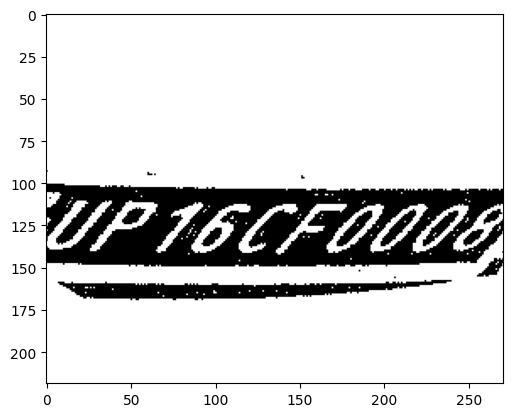

height =  1403 width =  1620
height =  1399 width =  1737
height =  1334 width =  2024
height =  1323 width =  1992
height =  1300 width =  1951
height =  1273 width =  1899
height =  1272 width =  1842
height =  1253 width =  1760
height =  1159 width =  1524
height =  202 width =  320
height =  210 width =  336
height =  212 width =  342
[124.35863494873047, 143.54547119140625, 161.16004943847656, 177.00994873046875, 0.7396005988121033, 0.0] track_id: 301.0
1.5475447039844337
height =  215 width =  344
[122.10750579833984, 147.37606811523438, 159.82044982910156, 181.1116180419922, 0.5824188590049744, 0.0] track_id: 301.0
-0.2721458905311873
height =  224 width =  337
[111.48316955566406, 148.3280792236328, 149.7237091064453, 184.78305053710938, 0.7744024991989136, 0.0] track_id: 301.0
-1.5707963267948966
height =  226 width =  346
[115.32725524902344, 150.1084442138672, 155.09176635742188, 188.06312561035156, 0.4460878074169159, 0.0] track_id: 301.0
1.5522799247268875
height =  228 w

[122.47541809082031, 153.1256866455078, 163.86439514160156, 191.8547821044922, 0.5971102714538574, 0.0] track_id: 301.0
1.5707963267948966


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  229 width =  367
[125.49342346191406, 157.19496154785156, 167.40267944335938, 195.06338500976562, 0.6545423865318298, 0.0] track_id: 301.0
1.5707963267948966
height =  236 width =  369
[120.93733215332031, 160.87721252441406, 163.2710418701172, 199.16116333007812, 0.5512281060218811, 0.0] track_id: 301.0
1.550798992821746
height =  242 width =  380
[127.11542510986328, 164.37002563476562, 170.57115173339844, 204.39503479003906, 0.41740623116493225, 0.0] track_id: 301.0
1.551190995937692
height =  252 width =  361
height =  257 width =  354


[215.3112030029297, 0.0, 287.70684814453125, 42.69651412963867, 0.5271360874176025, 0.0] track_id: 301.0
-0.21406068356382152
[]
License Plate Number :  None , Score :  None
[86.9359130859375, 170.34014892578125, 133.60244750976562, 213.5670166015625, 0.4918636679649353, 0.0] track_id: 301.0
1.5374753309166493
height =  262 width =  360


[86.17902374267578, 176.12709045410156, 132.00979614257812, 218.83538818359375, 0.6419104933738708, 0.0] track_id: 301.0
-0.2536740961386427
[220.60772705078125, 0.0, 291.6539611816406, 43.30989074707031, 0.46667447686195374, 0.0] track_id: 301.0
-0.23109066719589708
[]
License Plate Number :  None , Score :  None
height =  267 width =  379


[98.40819549560547, 175.4200439453125, 147.0281219482422, 224.05221557617188, 0.5217288136482239, 0.0] track_id: 301.0
1.5413930385908916
[232.55435180664062, 0.0, 310.0058898925781, 44.48329544067383, 0.49426206946372986, 0.0] track_id: 301.0
-0.2408464552414116
['JirW']
license before check JirW
hello
License Plate Number :  None , Score :  None
height =  282 width =  380


[233.3682861328125, 0.0, 311.4033203125, 44.4124641418457, 0.5958968997001648, 0.0] track_id: 301.0
-0.24192056868440487


[]
License Plate Number :  None , Score :  None
[94.04423522949219, 177.01751708984375, 142.8220977783203, 229.28968811035156, 0.5882322192192078, 0.0] track_id: 301.0
1.526050095340281


[]
License Plate Number with contours :  None , Score :  None
-0.2984989315861793
[]
License Plate Number :  None , Score :  None
height =  285 width =  402


[250.794921875, 0.4303407669067383, 330.5687255859375, 44.41803741455078, 0.7060998678207397, 0.0] track_id: 301.0
-0.2510026866430346
['4i7XI']
license before check 4i7XI
hello
License Plate Number :  None , Score :  None
[108.08525848388672, 180.84103393554688, 157.66061401367188, 235.1894073486328, 0.5936859846115112, 0.0] track_id: 301.0
1.5409544421277872
height =  295 width =  414


[252.2312774658203, 0.728469729423523, 338.55224609375, 44.678741455078125, 0.8069843649864197, 0.0] track_id: 301.0
-0.22244726542594168


[]
License Plate Number :  None , Score :  None
[101.734619140625, 186.7881622314453, 156.10643005371094, 248.0939483642578, 0.3345198333263397, 0.0] track_id: 301.0
-0.2751892491291713


['46za1']
license before check 46za1
hello
License Plate Number with contours :  None , Score :  None
-0.26211984126547283
[]
License Plate Number :  None , Score :  None
height =  303 width =  423


[257.3521423339844, 0.0, 346.1789855957031, 46.28131103515625, 0.7957929372787476, 0.0] track_id: 301.0
-0.23684876094692026


['73jrpnwy']
license before check 73jrpnwy
hello
License Plate Number :  None , Score :  None
[102.66466522216797, 197.67384338378906, 158.0026092529297, 254.52818298339844, 0.35441941022872925, 0.0] track_id: 301.0
1.5152978215491797


['2', '2']
license before check 22
hello
License Plate Number with contours :  None , Score :  None
-0.2860514417173182
[]
License Plate Number :  None , Score :  None
height =  311 width =  432


[260.4309387207031, 0.0, 350.3311462402344, 46.89384460449219, 0.7562341094017029, 0.0] track_id: 301.0
-0.23171684119045063
['7h4t3I']
license before check 7h4t3I
hello
License Plate Number :  None , Score :  None
height =  321 width =  446


[268.69921875, 0.0, 361.7778015136719, 45.28185272216797, 0.8035746216773987, 0.0] track_id: 301.0
-0.2347226124851971
['7pai74']
license before check 7pai74
hello
License Plate Number :  None , Score :  None
height =  328 width =  463
height =  339 width =  479


[288.8262023925781, 0.0, 390.9199523925781, 46.49174499511719, 0.4881221055984497, 0.0] track_id: 301.0
-0.22303096837155825
['Tp44a']
license before check Tp44a
hello
License Plate Number :  None , Score :  None
height =  348 width =  495


[297.56292724609375, 0.0, 403.23095703125, 49.26151657104492, 0.43448278307914734, 0.0] track_id: 301.0
-0.22390450013034954


['Aamd740']
license before check Aamd740
hello
License Plate Number :  None , Score :  None
[117.15411376953125, 237.527587890625, 178.9950714111328, 295.691650390625, 0.3028407096862793, 0.0] track_id: 301.0
1.5042281630190728


['2']
license before check 2
hello
License Plate Number with contours :  None , Score :  None
-0.2551823906208184
['SUP78E', 'Y6237']
license before check SUP78EY6237
hello
License Plate Number :  None , Score :  None
height =  355 width =  513


[308.5474853515625, 0.0, 420.4890441894531, 47.38450622558594, 0.9045119285583496, 0.0] track_id: 301.0
-0.2049999760035741
['Aiard']
license before check Aiard
hello
License Plate Number :  None , Score :  None
height =  369 width =  539


[325.7048645019531, 0.0, 441.51531982421875, 49.60577392578125, 0.8343483209609985, 0.0] track_id: 301.0
-0.20653607310567618
['ra78']
license before check ra78
hello
License Plate Number :  None , Score :  None
height =  383 width =  559


[337.9428405761719, 0.0, 457.97674560546875, 50.64347457885742, 0.8274988532066345, 0.0] track_id: 301.0
-0.20795854725293414
['A143073']
license before check A143073
hello
License Plate Number :  None , Score :  None
height =  399 width =  580


[353.3470764160156, 0.0, 478.3492736816406, 53.246212005615234, 0.8506356477737427, 0.0] track_id: 301.0
-0.20539538918976738


['am4j765']
license before check am4j765
hello
License Plate Number :  None , Score :  None
[142.46600341796875, 273.0605163574219, 213.523681640625, 343.9209289550781, 0.3800579607486725, 0.0] track_id: 301.0
1.4923062241575646


[]
License Plate Number with contours :  None , Score :  None
-0.25825221981103874
['Fup78F', 'N6297']
license before check Fup78FN6297
hello
License Plate Number :  None , Score :  None
height =  410 width =  603


[149.23582458496094, 272.1578369140625, 230.37396240234375, 358.85784912109375, 0.6808022260665894, 0.0] track_id: 301.0
1.4994888620096063


[]
License Plate Number with contours :  None , Score :  None
-0.2629947316809195


['UP7BF', '186237']
license before check UP7BF186237
hello
License Plate Number :  None , Score :  None
[368.08367919921875, 0.0, 498.91278076171875, 56.0350456237793, 0.48135459423065186, 0.0] track_id: 301.0
-0.20831556258942585
['gtd7']
license before check gtd7
hello
License Plate Number :  None , Score :  None
height =  428 width =  633


[388.1650085449219, 0.0, 524.7762451171875, 54.375, 0.34080269932746887, 0.0] track_id: 301.0
-0.1936219928559454
['ikd7']
license before check ikd7
hello
License Plate Number :  None , Score :  None
height =  446 width =  664


[412.40692138671875, 0.0, 553.0419921875, 56.84783172607422, 0.7257881164550781, 0.0] track_id: 301.0
-0.1439254493882163
['a41IL']
license before check a41IL
hello
License Plate Number :  None , Score :  None
height =  467 width =  699


[438.382568359375, 0.0, 583.4716796875, 61.505367279052734, 0.6968659162521362, 0.0] track_id: 301.0
-0.2331798006468164


['amtoJW']
license before check amtoJW
hello
License Plate Number :  None , Score :  None
[184.4047393798828, 314.2384338378906, 270.1519775390625, 409.19287109375, 0.5977522730827332, 0.0] track_id: 301.0
1.488414396203206


[]
License Plate Number with contours :  None , Score :  None
-0.2847304385227122
['UP78F', 'N6287']
license before check UP78FN6287
license after check UP78FN6287
License Plate Number :  UP78FN6287 , Score :  0.3385215181682261


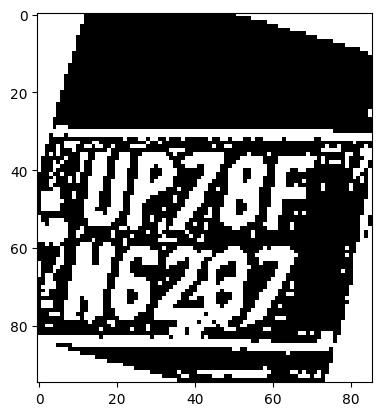

height =  488 width =  741


[463.6642761230469, 0.0, 618.6675415039062, 62.66716766357422, 0.8518005013465881, 0.0] track_id: 301.0
-0.17891717047809394


['atTi']
license before check atTi
hello
License Plate Number :  None , Score :  None
[199.2999267578125, 322.5343933105469, 292.5155944824219, 429.7821350097656, 0.8124464750289917, 0.0] track_id: 301.0
-0.26121853461453504


['6237']
license before check 6237
hello
License Plate Number with contours :  None , Score :  None
-0.2650428598974545
['UP78F', 'N6237']
license before check UP78FN6237
license after check UP78FN6237
License Plate Number :  UP78FN6237 , Score :  0.5867640120388031


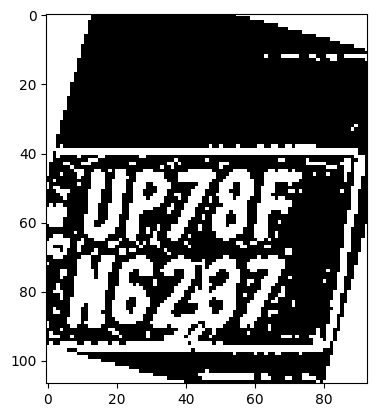

height =  512 width =  779


[213.07003784179688, 338.14422607421875, 314.2991943359375, 453.02899169921875, 0.8945382833480835, 0.0] track_id: 301.0
1.4816027142031634


[]
License Plate Number with contours :  None , Score :  None
-0.2633976325455006
['UP78F', 'N6231']
license before check UP78FN6231
license after check UP78FN6231
License Plate Number :  UP78FN6231 , Score :  0.40431551325377413


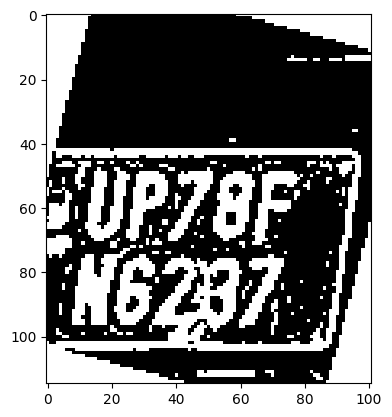

[491.76336669921875, 0.0, 656.0252685546875, 62.994606018066406, 0.8672871589660645, 0.0] track_id: 301.0
-0.16958815990218784
['aiJ407']
license before check aiJ407
hello
License Plate Number :  None , Score :  None
height =  538 width =  827


[525.1552734375, 0.0, 700.9315795898438, 67.04117584228516, 0.8965272307395935, 0.0] track_id: 301.0
-0.15660187698201536


['QioAM']
license before check QioAM
hello
License Plate Number :  None , Score :  None
[233.6873321533203, 355.6099853515625, 340.3368225097656, 481.0250549316406, 0.8711707592010498, 0.0] track_id: 301.0
-0.24330921559601026


['N6237']
license before check N6237
hello
License Plate Number with contours :  None , Score :  None
-0.259940140188528
['UP78F', 'N62337']
license before check UP78FN62337
hello
License Plate Number :  None , Score :  None
height =  568 width =  876


[255.05604553222656, 378.4551086425781, 372.2391052246094, 510.70623779296875, 0.9121005535125732, 0.0] track_id: 301.0
1.4689600476408782


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
['UP78F', 'N6287']
license before check UP78FN6287
license after check UP78FN6287
License Plate Number :  UP78FN6287 , Score :  0.758007229024321


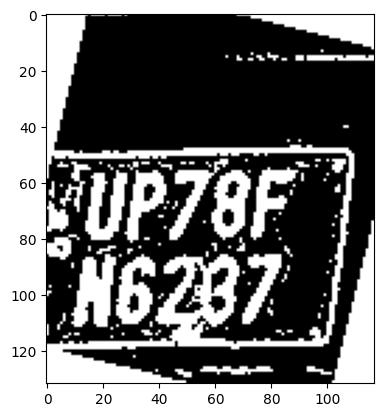

[565.5633544921875, 0.0, 748.41357421875, 69.95219421386719, 0.9061871767044067, 0.0] track_id: 301.0
-0.18575313635925825
['Tgid', 'ie']
license before check Tgidie
hello
License Plate Number :  None , Score :  None
height =  606 width =  933


[276.8814697265625, 403.7071533203125, 402.5928955078125, 545.0189819335938, 0.9120954871177673, 0.0] track_id: 301.0
1.4725223735388875


[]
License Plate Number with contours :  None , Score :  None
-0.26211984126547283


['UPZ8F', 'N6237']
license before check UPZ8FN6237
hello
License Plate Number :  None , Score :  None
[604.8493041992188, 0.0, 799.8651733398438, 73.42427062988281, 0.8927463293075562, 0.0] track_id: 301.0
-0.15625013587798461
['Akto7']
license before check Akto7
hello
License Plate Number :  None , Score :  None
height =  324 width =  212
height =  1420 width =  1867


[0.0, 262.28472900390625, 35.891929626464844, 307.024658203125, 0.6340847611427307, 0.0] track_id: 301.0
-0.16514867741462683
['0551']
license before check 0551
hello
License Plate Number :  None , Score :  None
height =  334 width =  287
[209.5556182861328, 233.1475067138672, 286.09320068359375, 267.28094482421875, 0.8718881011009216, 0.0] track_id: 305.0
-0.25564492527793553
height =  1425 width =  1719
height =  350 width =  387
[220.8746337890625, 236.64337158203125, 333.26226806640625, 283.6034240722656, 0.8820515871047974, 0.0] track_id: 305.0
-0.1746721990082397
height =  362 width =  442
[232.2909393310547, 244.22552490234375, 349.74371337890625, 294.3576354980469, 0.9123575687408447, 0.0] track_id: 305.0
-0.1704607124429239
height =  375 width =  478


[245.1092071533203, 255.685302734375, 369.2574768066406, 307.8077392578125, 0.9066364765167236, 0.0] track_id: 305.0
-0.17421578644294416
['UPSCXO55S']
license before check UPSCXO55S
license after check UPSCXO55S
License Plate Number with contours :  UP5CX0555 , Score :  0.3766490999940555


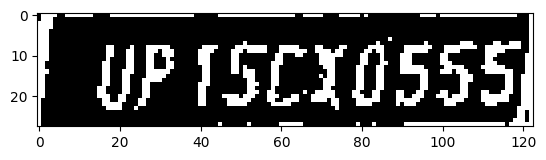

height =  398 width =  507
[261.7137756347656, 268.433349609375, 390.3534240722656, 323.04669189453125, 0.9103868007659912, 0.0] track_id: 305.0
-0.1751109879225975
height =  413 width =  532


[277.7246398925781, 283.2791442871094, 411.4815368652344, 339.79827880859375, 0.9079970717430115, 0.0] track_id: 305.0
-0.18937004997584467
['UP15CX0555']
license before check UP15CX0555
license after check UP15CX0555
License Plate Number with contours :  UP15CX0555 , Score :  0.47544831919284686


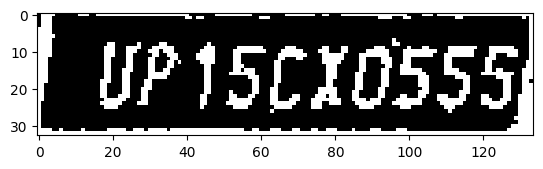

height =  434 width =  559


[295.7073669433594, 298.693603515625, 435.4195251464844, 356.33172607421875, 0.9139421582221985, 0.0] track_id: 305.0
-0.1762346977366758
['UPI5cX0S55']
license before check UPI5cX0S55
license after check UPI5CX0S55
License Plate Number with contours :  UP15CX0555 , Score :  0.1918550126878734


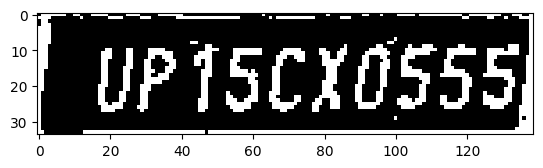

height =  459 width =  586


[314.8316345214844, 313.98675537109375, 462.1385192871094, 374.9250183105469, 0.9177956581115723, 0.0] track_id: 305.0
-0.17926283240694726
['UPI5CXO5S5']
license before check UPI5CXO5S5
license after check UPI5CXO5S5
License Plate Number with contours :  UP15CX0555 , Score :  0.427984744730129


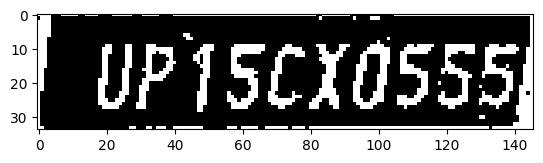

height =  481 width =  618


[338.967529296875, 331.47698974609375, 493.2340393066406, 396.60650634765625, 0.9091770052909851, 0.0] track_id: 305.0
-0.18732033402574094
['UP15CXO5SS']
license before check UP15CXO5SS
license after check UP15CXO5SS
License Plate Number with contours :  UP15CX0555 , Score :  0.39061729378869103


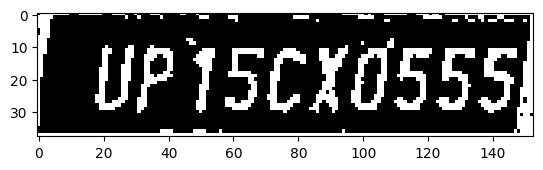

height =  503 width =  652


[365.40667724609375, 351.2611999511719, 527.7157592773438, 419.4506530761719, 0.9125334620475769, 0.0] track_id: 305.0
-0.19374149572344534
['UP15CXO55S']
license before check UP15CXO55S
license after check UP15CXO55S
License Plate Number with contours :  UP15CX0555 , Score :  0.20127791983383245


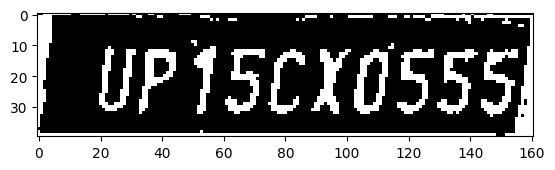

height =  528 width =  692


[398.1144104003906, 374.87420654296875, 567.77978515625, 446.1214904785156, 0.913288414478302, 0.0] track_id: 305.0
-0.1908311027212619
['UP15CXO555']
license before check UP15CXO555
license after check UP15CXO555
License Plate Number with contours :  UP15CX0555 , Score :  0.590991552942502


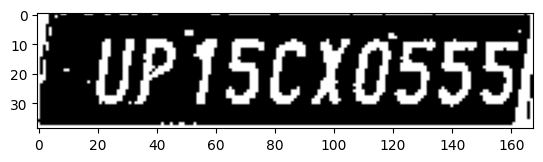

height =  561 width =  734


[432.6923522949219, 399.3258972167969, 611.212158203125, 475.1257019042969, 0.9227803945541382, 0.0] track_id: 305.0
-0.19633286099381592
['UP15cXOS5S']
license before check UP15cXOS5S
license after check UP15CXOS5S
License Plate Number with contours :  UP15CX0555 , Score :  0.2095873376922368


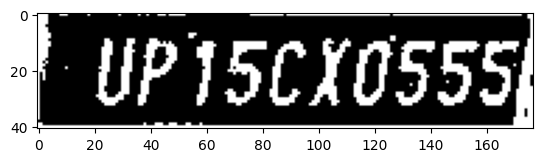

height =  596 width =  783


[473.01324462890625, 423.9548034667969, 658.3163452148438, 506.8483581542969, 0.9169002175331116, 0.0] track_id: 305.0
-0.1901866219105618
['UP15CXO555']
license before check UP15CXO555
license after check UP15CXO555
License Plate Number with contours :  UP15CX0555 , Score :  0.4409477537450176


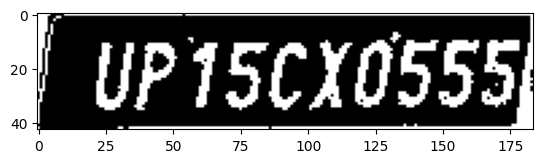

height =  633 width =  833


[517.5423583984375, 460.5096740722656, 713.3905029296875, 544.2307739257812, 0.9150326251983643, 0.0] track_id: 305.0
-0.22785704871709972
['UP15CXo555']
license before check UP15CXo555
license after check UP15CXO555
License Plate Number with contours :  UP15CX0555 , Score :  0.3556902076052326


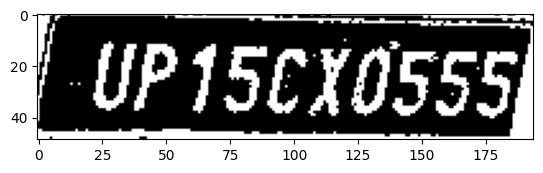

height =  678 width =  889


[569.3990478515625, 496.6370849609375, 773.3171997070312, 586.8491821289062, 0.8989747762680054, 0.0] track_id: 305.0
-0.2082059495239874
['UP15cX0555']
license before check UP15cX0555
license after check UP15CX0555
License Plate Number with contours :  UP15CX0555 , Score :  0.3351093624475209


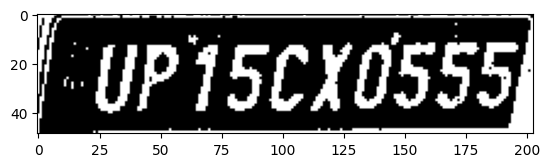

height =  724 width =  947


[626.2380981445312, 532.6304321289062, 838.0713500976562, 630.2142944335938, 0.9160161018371582, 0.0] track_id: 305.0
-0.22446318329883336
['UP15CX0555']
license before check UP15CX0555
license after check UP15CX0555
License Plate Number with contours :  UP15CX0555 , Score :  0.4807030589298132


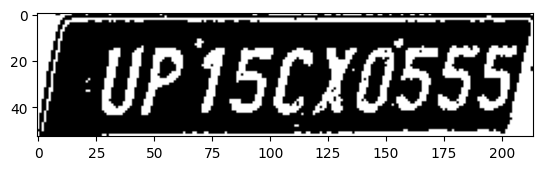

height =  781 width =  1018


[701.681640625, 574.968505859375, 916.208251953125, 683.002685546875, 0.9264199733734131, 0.0] track_id: 305.0
-0.2429315830794659
['UP15CX055S']
license before check UP15CX055S
license after check UP15CX055S
License Plate Number with contours :  UP15CX0555 , Score :  0.5935955077185178


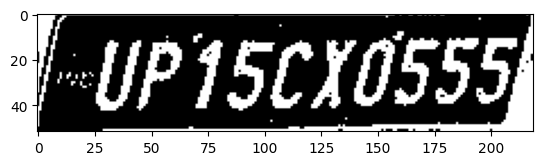

height =  844 width =  1091


[783.15478515625, 624.1315307617188, 1001.4100952148438, 742.2223510742188, 0.844315767288208, 0.0] track_id: 305.0
-0.29603761447490295


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.27766149699857035
['IUP15CX0555']
license before check IUP15CX0555
hello
License Plate Number :  None , Score :  None
height =  917 width =  1168


[877.2798461914062, 678.3494262695312, 1091.5748291015625, 811.1415405273438, 0.8176225423812866, 0.0] track_id: 305.0
-0.349451275587814
['UP15CX05S5']
license before check UP15CX05S5
license after check UP15CX05S5
License Plate Number with contours :  UP15CX0555 , Score :  0.46161199475738524


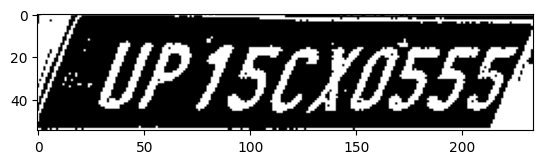

height =  995 width =  1253


[980.9696044921875, 742.2410888671875, 1191.836669921875, 885.6522827148438, 0.8697341084480286, 0.0] track_id: 305.0
-0.3844187202182019


[]
License Plate Number with contours :  None , Score :  None
-0.3291578263278072
['GUP15CY0555']
license before check GUP15CY0555
hello
License Plate Number :  None , Score :  None
height =  1080 width =  1340
height =  1175 width =  1430
height =  1256 width =  1521
height =  1291 width =  1614
height =  1309 width =  1706
height =  1290 width =  1758
height =  1273 width =  1725
height =  1254 width =  1666
height =  1210 width =  1613
height =  1163 width =  1523
height =  1129 width =  1422
height =  1089 width =  1306
height =  1032 width =  1177
height =  955 width =  1032
height =  882 width =  867
height =  805 width =  678
height =  671 width =  459
height =  87 width =  94
height =  85 width =  95
height =  84 width =  102
height =  90 width =  98
height =  90 width =  99
height =  93 width =  100
height =  92 width =  99
height =  91 width =  101
height =  90 width =  104
height =  87 width =  106
height =  84 width =  110
height =  75 width =  109
height =  76 width =  113

[63.16318893432617, 100.75797271728516, 105.07160186767578, 119.6424560546875, 0.6565147638320923, 0.0] track_id: 307.0
-0.21866894587394195


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  165 width =  148
[62.41650390625, 100.85985565185547, 104.97096252441406, 121.34176635742188, 0.632604718208313, 0.0] track_id: 307.0
-0.22402364703792346
height =  167 width =  151
[63.12269973754883, 102.11099243164062, 107.21158599853516, 121.78055572509766, 0.8684729337692261, 0.0] track_id: 307.0
-0.24997862146082248
height =  169 width =  152
[63.05511474609375, 104.28868103027344, 107.45973205566406, 123.86273193359375, 0.7315839529037476, 0.0] track_id: 307.0
-0.2172934309230211
height =  169 width =  153
[62.403621673583984, 103.77023315429688, 107.5391616821289, 125.3764877319336, 0.8342255353927612, 0.0] track_id: 307.0
-0.1349767498539234
height =  172 width =  155


[63.504356384277344, 104.46939086914062, 108.78060913085938, 127.44805908203125, 0.890446662902832, 0.0] track_id: 307.0
-0.20539538918976738


[]
License Plate Number with contours :  None , Score :  None
-0.19739555984988075
[]
License Plate Number :  None , Score :  None
height =  174 width =  157


[63.423580169677734, 107.07917022705078, 110.24195098876953, 126.99325561523438, 0.7730335593223572, 0.0] track_id: 307.0
-0.23441567572381078


[]
License Plate Number with contours :  None , Score :  None
-0.21293834957939714
['76700']
license before check 76700
hello
License Plate Number :  None , Score :  None
height =  176 width =  158
[63.553226470947266, 109.2494888305664, 110.99717712402344, 127.19196319580078, 0.7958976030349731, 0.0] track_id: 307.0
-0.1349767498539234
height =  179 width =  161


[66.3956069946289, 110.92711639404297, 113.97129821777344, 129.717041015625, 0.8630011081695557, 0.0] track_id: 307.0
-0.23374318086890142


[]
License Plate Number with contours :  None , Score :  None
-0.21608497229678642
[]
License Plate Number :  None , Score :  None
height =  179 width =  162
[65.03733825683594, 108.88086700439453, 113.69449615478516, 130.89639282226562, 0.811988115310669, 0.0] track_id: 307.0
-0.13255153229667402
height =  184 width =  166


[67.50023651123047, 112.73792266845703, 116.8465805053711, 133.611328125, 0.8500810265541077, 0.0] track_id: 307.0
-0.20846521837998772


[]
License Plate Number with contours :  None , Score :  None
-0.2284966392918623
[]
License Plate Number :  None , Score :  None
height =  189 width =  169
[67.76274108886719, 114.71771240234375, 118.48920440673828, 136.25782775878906, 0.8440337181091309, 0.0] track_id: 307.0
-0.24497866312686414
height =  191 width =  172
[69.2970962524414, 115.5513687133789, 120.91661834716797, 138.80001831054688, 0.8676996827125549, 0.0] track_id: 307.0
-0.12062366858010272
height =  195 width =  173


[68.38873291015625, 117.0523681640625, 120.16790008544922, 140.47402954101562, 0.8956044316291809, 0.0] track_id: 307.0
-0.23554498072086333


[]
License Plate Number with contours :  None , Score :  None
-0.19739555984988075
['7E7']
license before check 7E7
hello
License Plate Number :  None , Score :  None
height =  196 width =  174


[67.47807312011719, 117.32295227050781, 120.43500518798828, 141.08078002929688, 0.8935970067977905, 0.0] track_id: 307.0
-0.31362065221669827


[]
License Plate Number with contours :  None , Score :  None
-0.20963984587421253
[]
License Plate Number :  None , Score :  None
height =  199 width =  179


[71.01544952392578, 121.88786315917969, 123.87679290771484, 144.14608764648438, 0.8848510384559631, 0.0] track_id: 307.0
-0.2284966392918623


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  206 width =  186
[72.42912292480469, 126.49130249023438, 128.0823974609375, 148.50181579589844, 0.8927673697471619, 0.0] track_id: 307.0
-0.2342552135942509
height =  209 width =  192
[75.5345230102539, 127.58375549316406, 131.441162109375, 152.1785888671875, 0.8819127678871155, 0.0] track_id: 307.0
-0.24497866312686414
height =  211 width =  195
[76.8832778930664, 128.18551635742188, 134.5547637939453, 152.6397705078125, 0.8948301076889038, 0.0] track_id: 307.0
-0.2342552135942509
height =  214 width =  198
[77.60040283203125, 129.92666625976562, 136.3448486328125, 155.9990997314453, 0.867385983467102, 0.0] track_id: 307.0
-0.14981245657289735
height =  70 width =  92
height =  219 width =  200
[78.07164764404297, 133.75587463378906, 138.40821838378906, 160.79852294921875, 0.8764401078224182, 0.0] track_id: 307.0
-0.2148154004016586
height =  78 

[90.5974349975586, 154.75355529785156, 157.66709899902344, 183.71966552734375, 0.9019857048988342, 0.0] track_id: 307.0
0.08200744552618561


[]
License Plate Number with contours :  None , Score :  None
-0.2204937613666717
['715']
license before check 715
hello
License Plate Number :  None , Score :  None
height =  79 width =  96
height =  255 width =  231
[94.0832748413086, 156.404052734375, 163.2801513671875, 186.8172607421875, 0.900668740272522, 0.0] track_id: 307.0
-0.23893644058616342
height =  76 width =  90
height =  259 width =  237
[96.99980163574219, 160.30970764160156, 167.9064178466797, 191.13719177246094, 0.9021150469779968, 0.0] track_id: 307.0
-0.2347226124851971
height =  80 width =  93
height =  265 width =  243
[100.08024597167969, 165.24575805664062, 172.34669494628906, 196.48988342285156, 0.9087274670600891, 0.0] track_id: 307.0
-0.21501488174750655
height =  271 width =  252


[105.2221908569336, 167.8324432373047, 179.2317352294922, 200.12603759765625, 0.9097086191177368, 0.0] track_id: 307.0
-0.19118445959701444


[]
License Plate Number with contours :  None , Score :  None
-0.220248723390689
['UFJ7n1si5']
license before check UFJ7n1si5
license after check UFJ7N1SI5
License Plate Number :  UF37N1515 , Score :  0.07168220855915612


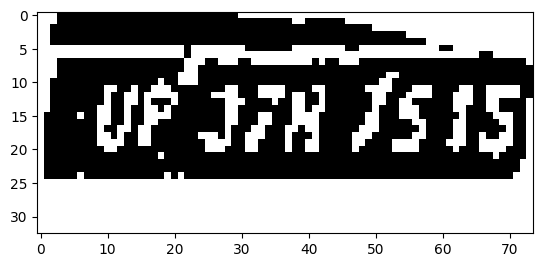

height =  86 width =  98
height =  273 width =  257
[107.8371810913086, 172.06871032714844, 183.8382568359375, 202.34901428222656, 0.9104357957839966, 0.0] track_id: 307.0
-0.15935164090391687
height =  92 width =  96
height =  283 width =  266
[113.84503173828125, 178.2061004638672, 192.2935791015625, 209.1826629638672, 0.89960116147995, 0.0] track_id: 307.0
-0.20442120537714656
height =  90 width =  93
height =  292 width =  275


[118.0596694946289, 182.98822021484375, 198.10476684570312, 213.2627410888672, 0.8976472616195679, 0.0] track_id: 307.0
-0.2172934309230211


['1Xts15']
license before check 1Xts15
hello
License Plate Number with contours :  None , Score :  None
-0.20304521725346514
['JPJzH7515']
license before check JPJzH7515
license after check JPJZH7515
License Plate Number :  JP3ZH7515 , Score :  0.06369256367038008


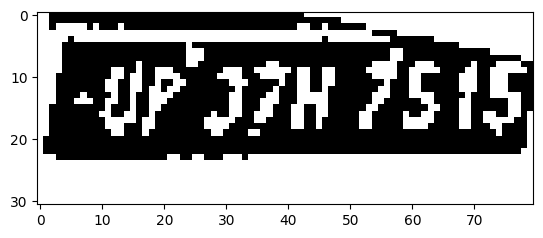

height =  87 width =  88
height =  296 width =  286


[125.03478240966797, 184.47463989257812, 206.8632354736328, 216.67169189453125, 0.8955028653144836, 0.0] track_id: 307.0
-0.2148154004016586


['WJx565']
license before check WJx565
hello
License Plate Number with contours :  None , Score :  None
-0.20539538918976738
['UP37HJ515']
license before check UP37HJ515
license after check UP37HJ515
License Plate Number :  UP37H3515 , Score :  0.16512695946318437


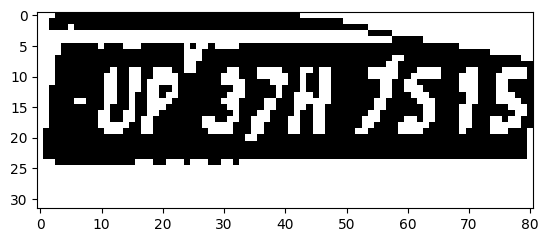

height =  88 width =  89
height =  305 width =  294
[130.65167236328125, 192.844482421875, 214.7645263671875, 225.56007385253906, 0.9045969843864441, 0.0] track_id: 307.0
-0.23109066719589708
height =  100 width =  92
height =  315 width =  302


[134.5176544189453, 200.54559326171875, 220.80667114257812, 233.13475036621094, 0.9085915684700012, 0.0] track_id: 307.0
-0.19118445959701444


['VP378515']
license before check VP378515
hello
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['3781515']
license before check 3781515
hello
License Plate Number :  None , Score :  None
height =  99 width =  95
height =  323 width =  312


[139.3048095703125, 204.7222137451172, 228.60116577148438, 241.418701171875, 0.8977882266044617, 0.0] track_id: 307.0
-0.207889927202263
['VP37h7515']
license before check VP37h7515
license after check VP37H7515
License Plate Number with contours :  VP37H7515 , Score :  0.19095560675968495


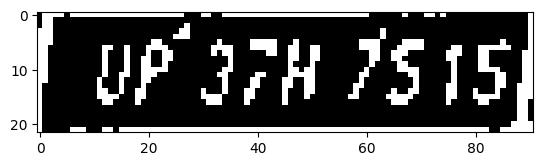

height =  110 width =  97
height =  332 width =  322


[146.23617553710938, 214.9072723388672, 237.34701538085938, 250.8449249267578, 0.894905686378479, 0.0] track_id: 307.0
-0.21182754748141747


['BP37875151']
license before check BP37875151
hello
License Plate Number with contours :  None , Score :  None
-0.20442120537714656
['VP37H1s15']
license before check VP37H1s15
license after check VP37H1S15
License Plate Number :  VP37H1515 , Score :  0.4631848771014364


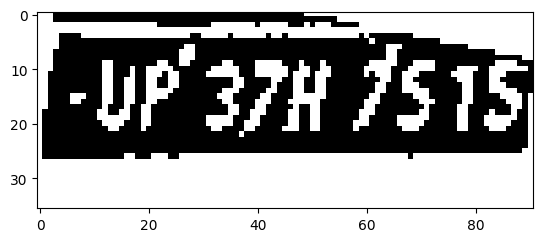

[0.35020729899406433, 87.84403228759766, 21.91562271118164, 97.43157958984375, 0.47720199823379517, 0.0] track_id: 307.0
[]
License Plate Number :  None , Score :  None
height =  102 width =  95
height =  339 width =  333


[151.85565185546875, 218.88436889648438, 245.83737182617188, 257.7331237792969, 0.8976395130157471, 0.0] track_id: 307.0
-0.22527677921405528
['UP3fH7515']
license before check UP3fH7515
license after check UP3FH7515
License Plate Number with contours :  UP3FH7515 , Score :  0.15508983885067204


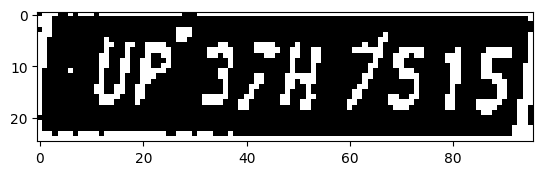

height =  347 width =  345


[158.69583129882812, 227.41510009765625, 256.6029968261719, 266.14630126953125, 0.8979032635688782, 0.0] track_id: 307.0
-0.22527677921405528
['VP37H15152']
license before check VP37H15152
license after check VP37H15152
License Plate Number with contours :  VP37HI5152 , Score :  0.18720171740546776


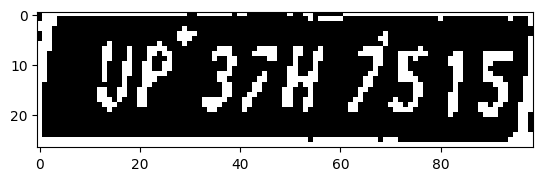

height =  120 width =  123
height =  360 width =  356


[165.79922485351562, 237.37582397460938, 265.7249450683594, 276.43426513671875, 0.898705005645752, 0.0] track_id: 307.0
-0.2049999760035741
['VP37H7515']
license before check VP37H7515
license after check VP37H7515
License Plate Number with contours :  VP37H7515 , Score :  0.22197087455476694


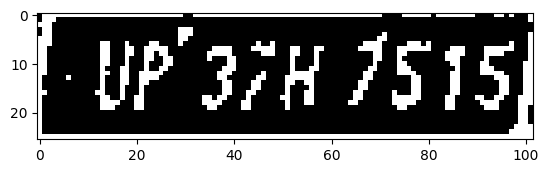

height =  126 width =  115
height =  375 width =  369


[172.19981384277344, 244.78028869628906, 275.75762939453125, 287.6908264160156, 0.902014434337616, 0.0] track_id: 307.0
-0.20982831175965547


['UP371515']
license before check UP371515
hello
License Plate Number with contours :  None , Score :  None
-0.21320451938945426
['UP378', '75151']
license before check UP37875151
hello
License Plate Number :  None , Score :  None
height =  138 width =  119
height =  388 width =  381
[179.3757781982422, 255.29397583007812, 286.6936340332031, 297.51812744140625, 0.9074850678443909, 0.0] track_id: 307.0
-0.2049999760035741
height =  143 width =  119
height =  398 width =  398


[189.27139282226562, 261.6986083984375, 299.94146728515625, 306.8570251464844, 0.9100732207298279, 0.0] track_id: 307.0
-0.1610919045375805


['UP3787515']
license before check UP3787515
hello
License Plate Number with contours :  None , Score :  None
-0.20539538918976738
['UP37H1515']
license before check UP37H1515
license after check UP37H1515
License Plate Number :  UP37H1515 , Score :  0.13274807624472326


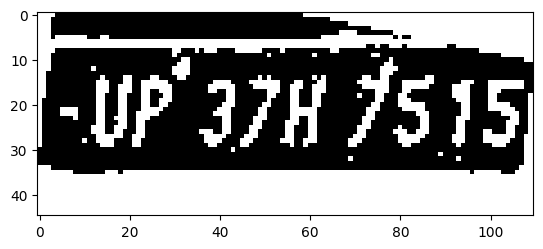

height =  146 width =  131
height =  408 width =  413


[198.87074279785156, 272.29315185546875, 313.35650634765625, 319.806884765625, 0.8947824835777283, 0.0] track_id: 307.0
-0.20254131203030573
['UP37H7515']
license before check UP37H7515
license after check UP37H7515
License Plate Number with contours :  UP37H7515 , Score :  0.34628446309833055


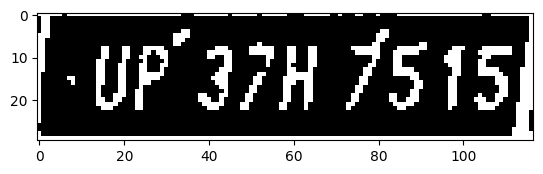

[0.0, 95.10377502441406, 24.60980796813965, 109.93840026855469, 0.6995965838432312, 0.0] track_id: 307.0
[]
License Plate Number :  None , Score :  None
height =  144 width =  132
height =  421 width =  429


[209.04949951171875, 281.4527587890625, 328.11883544921875, 331.0249328613281, 0.8961536288261414, 0.0] track_id: 307.0
-0.20947956377909527
['UP37H7515']
license before check UP37H7515
license after check UP37H7515
License Plate Number with contours :  UP37H7515 , Score :  0.5416947183895917


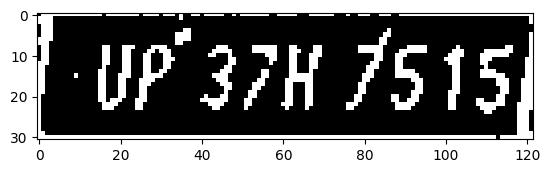

[0.03927101194858551, 97.15953826904297, 23.719684600830078, 111.13790893554688, 0.4913400411605835, 0.0] track_id: 307.0
[]
License Plate Number :  None , Score :  None
height =  145 width =  131
height =  437 width =  445
[217.62940979003906, 290.40826416015625, 341.3848571777344, 342.1751708984375, 0.8979002833366394, 0.0] track_id: 307.0
-0.13888501552021304
height =  140 width =  129
height =  451 width =  464
[229.56112670898438, 302.0696716308594, 357.41192626953125, 357.7628479003906, 0.909569263458252, 0.0] track_id: 307.0
-0.2063238940297175
height =  145 width =  137
height =  469 width =  487


[243.23927307128906, 314.8398742675781, 377.3731689453125, 373.30560302734375, 0.9139288067817688, 0.0] track_id: 307.0
-0.20647442842569014
['UP37H1515']
license before check UP37H1515
license after check UP37H1515
License Plate Number with contours :  UP37H1515 , Score :  0.33303546182885085


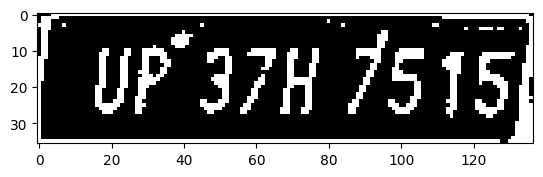

height =  149 width =  162
height =  485 width =  512


[260.0445251464844, 329.21380615234375, 399.52886962890625, 390.2511291503906, 0.9131867289543152, 0.0] track_id: 307.0
-0.19239560151592244
['UP37K7515']
license before check UP37K7515
license after check UP37K7515
License Plate Number with contours :  UP37K7515 , Score :  0.7168756292348987


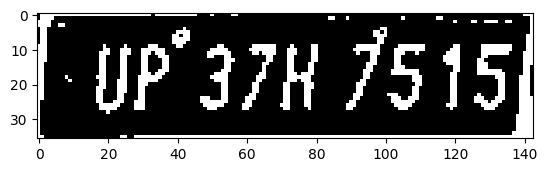

height =  153 width =  153
height =  506 width =  540


[280.9737854003906, 342.3733825683594, 424.98358154296875, 406.177734375, 0.9211695790290833, 0.0] track_id: 307.0
-0.20349304525756276


['UP37H75151']
license before check UP37H75151
hello
License Plate Number with contours :  None , Score :  None
-0.20478094994297488


['UP37H75151']
license before check UP37H75151
hello
License Plate Number :  None , Score :  None
[0.0, 94.77008056640625, 22.42616844177246, 109.56343841552734, 0.3055853545665741, 0.0] track_id: 307.0
[]
License Plate Number :  None , Score :  None
height =  159 width =  145
height =  529 width =  568


[300.08447265625, 360.53387451171875, 450.55059814453125, 426.7431945800781, 0.9200683236122131, 0.0] track_id: 307.0
-0.2093853929534955


['UP37H75151']
license before check UP37H75151
hello
License Plate Number with contours :  None , Score :  None
-0.2049999760035741
['Up37H75150']
license before check Up37H75150
hello
License Plate Number :  None , Score :  None
height =  163 width =  147
height =  558 width =  600


[323.5068359375, 382.19635009765625, 480.8836975097656, 449.60174560546875, 0.9152974486351013, 0.0] track_id: 307.0
-0.11809202841909398
['UP37H7515']
license before check UP37H7515
license after check UP37H7515
License Plate Number with contours :  UP37H7515 , Score :  0.8447639372311573


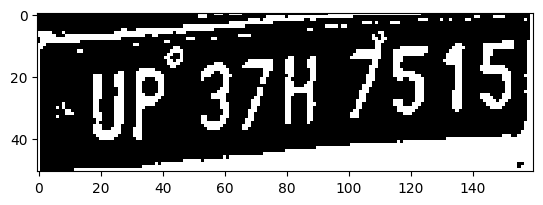

height =  167 width =  147
height =  582 width =  635


[348.0172119140625, 400.3991394042969, 510.80450439453125, 473.9344787597656, 0.9180929660797119, 0.0] track_id: 307.0
-0.20982831175965547
['UP37H1515']
license before check UP37H1515
license after check UP37H1515
License Plate Number with contours :  UP37H1515 , Score :  0.528850417331604


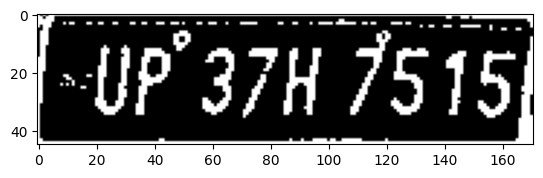

height =  170 width =  150
height =  613 width =  671


[376.338623046875, 425.2421875, 548.4594116210938, 503.97576904296875, 0.9161977767944336, 0.0] track_id: 307.0
-0.17268149161800542
['UP37H7515']
license before check UP37H7515
license after check UP37H7515
License Plate Number with contours :  UP37H7515 , Score :  0.41480126951555096


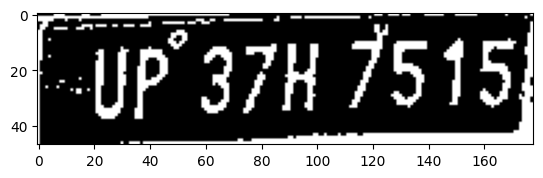

[0.0, 94.0960922241211, 9.904571533203125, 115.41477966308594, 0.4154646098613739, 0.0] track_id: 307.0


[]
License Plate Number :  None , Score :  None
height =  174 width =  155
height =  642 width =  715


[411.3940124511719, 450.0368347167969, 591.04833984375, 531.28857421875, 0.9129847288131714, 0.0] track_id: 307.0
-0.2132672428416708
['UP37H7515']
license before check UP37H7515
license after check UP37H7515
License Plate Number with contours :  UP37H7515 , Score :  0.7956860898880004


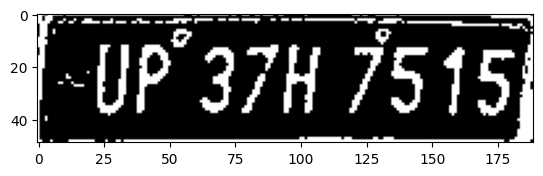

height =  178 width =  162
height =  86 width =  111
height =  681 width =  762


[446.91094970703125, 481.1017150878906, 637.3760986328125, 567.8761596679688, 0.9209879636764526, 0.0] track_id: 307.0
-0.1915017184696188


['UP37H75151']
license before check UP37H75151
hello
License Plate Number with contours :  None , Score :  None
-0.19270075866238556
['UP37H75151']
license before check UP37H75151
hello
License Plate Number :  None , Score :  None
height =  180 width =  165
height =  86 width =  110
height =  721 width =  814


[488.8404846191406, 512.6077880859375, 688.5687866210938, 605.8728637695312, 0.9215002059936523, 0.0] track_id: 307.0
-0.2255096351884239
['UP37H7515']
license before check UP37H7515
license after check UP37H7515
License Plate Number with contours :  UP37H7515 , Score :  0.887978061392747


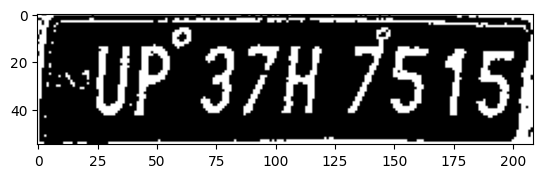

height =  184 width =  169
height =  85 width =  105
height =  770 width =  872


[539.2296142578125, 549.1403198242188, 749.2850952148438, 647.7632446289062, 0.9219085574150085, 0.0] track_id: 307.0
-0.26233050062616536


[]
License Plate Number with contours :  None , Score :  None
-0.24183895601830027
['UP37H7515']
license before check UP37H7515
license after check UP37H7515
License Plate Number :  UP37H7515 , Score :  0.6467911808872568


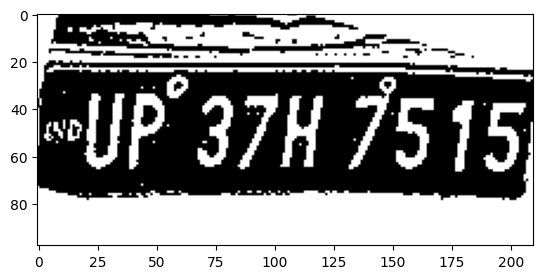

height =  187 width =  173
height =  86 width =  108
height =  823 width =  932


[597.33935546875, 589.5638427734375, 815.6032104492188, 694.1709594726562, 0.9237502217292786, 0.0] track_id: 307.0
-0.18919902209996817


['FUP37H75151']
license before check FUP37H75151
hello
License Plate Number with contours :  None , Score :  None
-0.23590861706847166
['UP37H1515']
license before check UP37H1515
license after check UP37H1515
License Plate Number :  UP37H1515 , Score :  0.44169786859505655


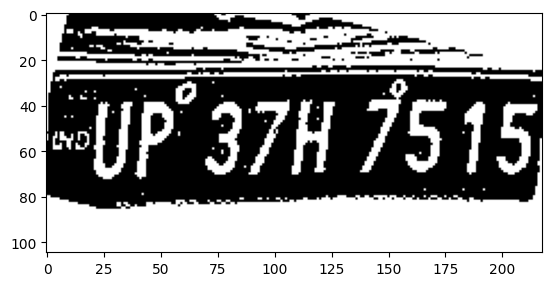

height =  191 width =  178
height =  86 width =  100
height =  884 width =  1002


[663.7672729492188, 636.773193359375, 891.25439453125, 751.1746215820312, 0.9184877276420593, 0.0] track_id: 307.0
-0.27716070733358933


[]
License Plate Number with contours :  None , Score :  None
-0.27891962172791485
['UP37H7515']
license before check UP37H7515
license after check UP37H7515
License Plate Number :  UP37H7515 , Score :  0.5971801734372572


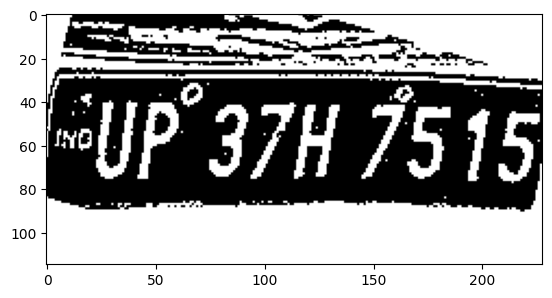

height =  193 width =  180
height =  87 width =  98
height =  949 width =  1074


[741.6204223632812, 691.2971801757812, 977.7073364257812, 818.1517333984375, 0.912659227848053, 0.0] track_id: 307.0
-0.29525745185327623


[]
License Plate Number with contours :  None , Score :  None
-0.296792448601017
['Up37H7515']
license before check Up37H7515
license after check UP37H7515
License Plate Number :  UP37H7515 , Score :  0.448470723143193


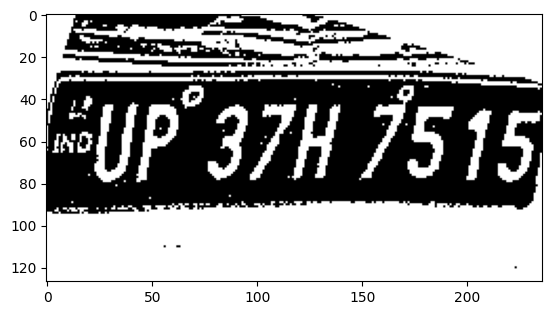

height =  198 width =  184
[75.04523468017578, 122.96369934082031, 127.8995590209961, 144.6705322265625, 0.35765576362609863, 0.0] track_id: 308.0
-0.23374318086890142
height =  89 width =  97
height =  1028 width =  1152


[827.5488891601562, 746.9716186523438, 1066.1468505859375, 882.1082763671875, 0.908906102180481, 0.0] track_id: 307.0
-0.3284618630279648


['FUP37H7515']
license before check FUP37H7515
hello
License Plate Number with contours :  None , Score :  None
-0.29736514522392365
['UP37H7515']
license before check UP37H7515
license after check UP37H7515
License Plate Number :  UP37H7515 , Score :  0.38559487927146013


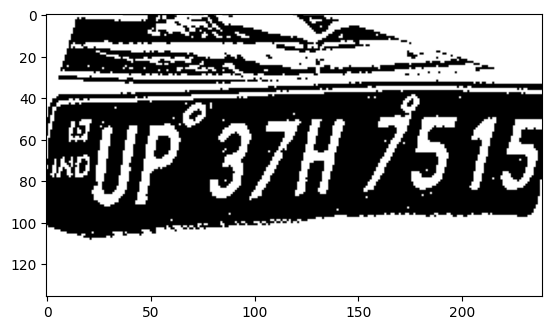

height =  201 width =  188
[77.21839904785156, 121.74449157714844, 130.95689392089844, 147.75418090820312, 0.49090486764907837, 0.0] track_id: 308.0
-0.2216495629786776
height =  90 width =  97
height =  1111 width =  1237


[929.4564208984375, 808.387451171875, 1169.6517333984375, 959.4535522460938, 0.9078093767166138, 0.0] track_id: 307.0
-0.4368682979810401


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.34920730373074266
['UP37H7515']
license before check UP37H7515
license after check UP37H7515
License Plate Number :  UP37H7515 , Score :  0.6561344581077242


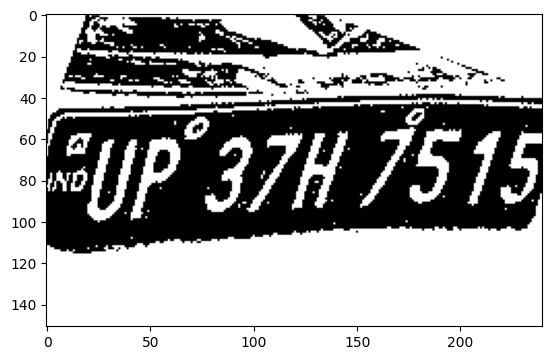

height =  204 width =  190


[77.63970947265625, 124.70955657958984, 132.2224578857422, 149.62901306152344, 0.7882992625236511, 0.0] track_id: 308.0
-0.220248723390689


[]
License Plate Number with contours :  None , Score :  None
-0.22527677921405528
[]
License Plate Number :  None , Score :  None
height =  91 width =  97
height =  1202 width =  1333


[1046.1817626953125, 870.1790771484375, 1280.941162109375, 1047.5018310546875, 0.9085519909858704, 0.0] track_id: 307.0
-0.3668969022274033


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.36397895650964407
['UP37H7515']
license before check UP37H7515
license after check UP37H7515
License Plate Number :  UP37H7515 , Score :  0.5027997770359676


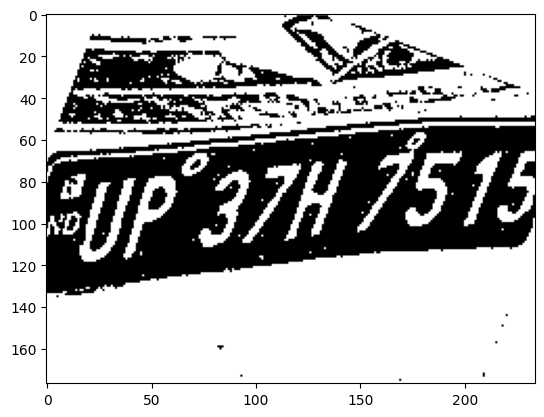

height =  208 width =  193
[78.30619049072266, 126.66642761230469, 137.4280242919922, 152.78846740722656, 0.4177161753177643, 0.0] track_id: 308.0
-0.21866894587394195
height =  94 width =  97
height =  1295 width =  1435


[1172.7493896484375, 934.535888671875, 1409.592041015625, 1142.896240234375, 0.7521964311599731, 0.0] track_id: 307.0
-0.5595449415392413


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.5595449415392413
['tP37H', '7515']
license before check tP37H7515
license after check TP37H7515
License Plate Number :  TP37H7515 , Score :  0.4645141627088081


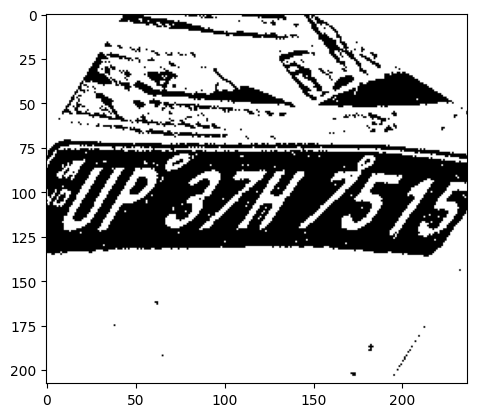

height =  211 width =  196
height =  94 width =  98
height =  1337 width =  1543
height =  216 width =  201


[82.5931396484375, 130.61720275878906, 140.79193115234375, 159.64105224609375, 0.8127541542053223, 0.0] track_id: 308.0
-0.23684876094692026


[]
License Plate Number with contours :  None , Score :  None
-0.22082876972934834
[]
License Plate Number :  None , Score :  None
height =  95 width =  101
height =  1347 width =  1653
height =  220 width =  205


[83.14241790771484, 133.667724609375, 144.19500732421875, 163.2086944580078, 0.6491417288780212, 0.0] track_id: 308.0
-0.22679884805388587


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
[]
License Plate Number :  None , Score :  None
height =  98 width =  103
height =  1342 width =  1769
height =  223 width =  209
[86.64945983886719, 137.09043884277344, 146.39886474609375, 166.37991333007812, 0.8810897469520569, 0.0] track_id: 308.0
-0.22290023232837577
height =  96 width =  104
height =  1338 width =  1892
height =  228 width =  213
[88.46971130371094, 140.3201141357422, 148.57376098632812, 170.6485137939453, 0.8848230242729187, 0.0] track_id: 308.0
-0.2802996563384511
height =  99 width =  105
height =  1331 width =  1951
height =  233 width =  218
[90.71629333496094, 143.31007385253906, 153.6529998779297, 174.4382781982422, 0.81700599193573, 0.0] track_id: 308.0
-0.21336864215180798
height =  103 width =  104
height =  1323 width =  1948
height =  240 width =  222


[93.71772766113281, 147.9917449951172, 157.84274291992188, 178.8179168701172, 0.8822958469390869, 0.0] track_id: 308.0
-0.2639637236257046


[]
License Plate Number with contours :  None , Score :  None
-0.23624526071843754
[]
License Plate Number :  None , Score :  None
height =  105 width =  109
height =  1312 width =  1907
height =  247 width =  228
[96.19706726074219, 152.57228088378906, 162.58547973632812, 183.0122528076172, 0.8649584054946899, 0.0] track_id: 308.0
-0.27632727497506515
height =  106 width =  110
height =  1310 width =  1857
height =  252 width =  235


[100.12369537353516, 154.90211486816406, 168.43878173828125, 186.5552520751953, 0.8029972314834595, 0.0] track_id: 308.0
-0.21109333322274654


[]
License Plate Number with contours :  None , Score :  None
-0.23554498072086333
['ICIEJt']
license before check ICIEJt
hello
License Plate Number :  None , Score :  None
height =  107 width =  109
height =  1292 width =  1807
height =  254 width =  237
[98.22465515136719, 157.28659057617188, 168.7815399169922, 190.6427001953125, 0.8762696385383606, 0.0] track_id: 308.0
-0.21866894587394195
height =  110 width =  110
height =  1264 width =  1738
height =  259 width =  243


[102.14662170410156, 160.59304809570312, 173.92276000976562, 194.54124450683594, 0.8805438280105591, 0.0] track_id: 308.0
-0.24192056868440487


[]
License Plate Number with contours :  None , Score :  None
-0.23297923907710288
['TTLSTE']
license before check TTLSTE
hello
License Plate Number :  None , Score :  None
height =  111 width =  113
height =  1236 width =  1659
height =  265 width =  249
[104.72843933105469, 164.3418426513672, 178.03131103515625, 200.9108123779297, 0.8947453498840332, 0.0] track_id: 308.0
-0.29770020971130084
height =  112 width =  116
height =  1205 width =  1589
height =  273 width =  255


[107.0590591430664, 171.5718994140625, 182.335693359375, 208.83563232421875, 0.8875400424003601, 0.0] track_id: 308.0
-0.23893644058616342


['DiTIEsdo']
license before check DiTIEsdo
hello
License Plate Number with contours :  None , Score :  None
-0.23501221572065709
['Diiciisos']
license before check Diiciisos
license after check DIICIISOS
License Plate Number :  DI1CI1505 , Score :  0.033389374095784415


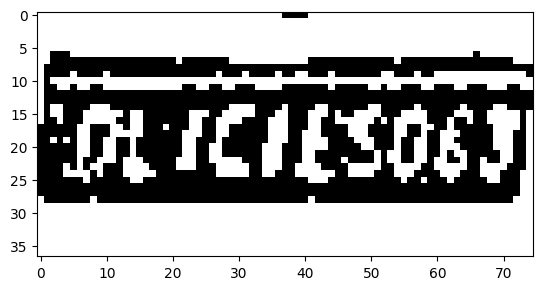

height =  112 width =  116
height =  1167 width =  1545
height =  280 width =  266
[113.180419921875, 175.34205627441406, 191.0036163330078, 213.37522888183594, 0.8986653685569763, 0.0] track_id: 308.0
-0.22679884805388587
height =  115 width =  119
height =  1121 width =  1360
height =  290 width =  273
[119.09986114501953, 182.63771057128906, 197.0484161376953, 220.56695556640625, 0.89676433801651, 0.0] track_id: 308.0
-0.22402364703792346
height =  118 width =  122
height =  297 width =  282


[123.07685852050781, 187.0059051513672, 204.91958618164062, 226.9410858154297, 0.8970251679420471, 0.0] track_id: 308.0
-0.23554498072086333


['Dl1CIESQeJ']
license before check Dl1CIESQeJ
hello
License Plate Number with contours :  None , Score :  None
-0.24175286786424297
['DLTcIcS03']
license before check DLTcIcS03
hello
License Plate Number :  None , Score :  None
height =  120 width =  123
height =  298 width =  286


[122.91915130615234, 191.53990173339844, 208.01722717285156, 235.99685668945312, 0.9013688564300537, 0.0] track_id: 308.0
-0.22441600903714554


['DLTCIL5uej']
license before check DLTCIL5uej
hello
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
['ColTCIESQE3']
license before check ColTCIESQE3
hello
License Plate Number :  None , Score :  None
height =  126 width =  126
height =  928 width =  720
height =  304 width =  295


[128.78199768066406, 196.26080322265625, 215.6735076904297, 240.50115966796875, 0.9011138677597046, 0.0] track_id: 308.0
-0.22595921768864075


['DLicieSvG']
license before check DLicieSvG
hello
License Plate Number with contours :  None , Score :  None
-0.2213144423477913
['FDLTc1E50631']
license before check FDLTc1E50631
hello
License Plate Number :  None , Score :  None
height =  127 width =  130
height =  318 width =  305


[132.99839782714844, 204.85574340820312, 223.45172119140625, 247.98703002929688, 0.9039481282234192, 0.0] track_id: 308.0
-0.22441600903714554
['diIc4ES063']
license before check diIc4ES063
license after check DIIC4ES063
License Plate Number with contours :  DI1CAE5063 , Score :  0.038945648145442074


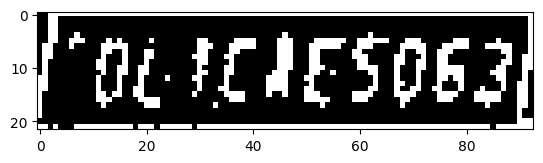

height =  130 width =  131
height =  326 width =  316


[140.8716278076172, 211.4311981201172, 232.63934326171875, 258.2656555175781, 0.9059037566184998, 0.0] track_id: 308.0
-0.23228898897102182


['DEc4e5063']
license before check DEc4e5063
hello
License Plate Number with contours :  None , Score :  None
-0.22923193327699534
['dlIcXE5Q63']
license before check dlIcXE5Q63
hello
License Plate Number :  None , Score :  None
height =  131 width =  130
height =  337 width =  325


[146.00794982910156, 219.2181396484375, 240.51748657226562, 267.2157287597656, 0.9068794846534729, 0.0] track_id: 308.0
-0.22527677921405528


['DLche50s3']
license before check DLche50s3
hello
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['plicae5063']
license before check plicae5063
license after check PLICAE5063
License Plate Number :  PL1CAE5063 , Score :  0.10246097070872562


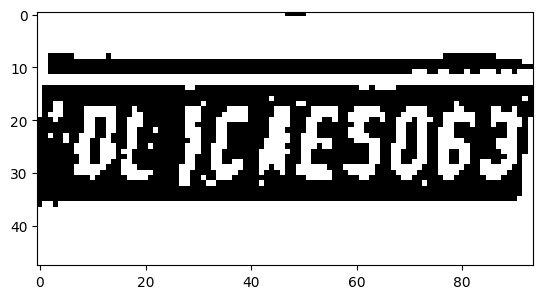

height =  137 width =  133
height =  349 width =  339


[154.80886840820312, 226.6787567138672, 253.04905700683594, 275.6486511230469, 0.9027081727981567, 0.0] track_id: 308.0
-0.2217809690225993
['OlIcae5053']
license before check OlIcae5053
license after check OLICAE5053
License Plate Number with contours :  OL1CAE5053 , Score :  0.24130067464064991


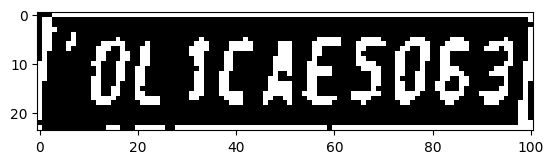

height =  140 width =  131
height =  354 width =  354


[164.45877075195312, 235.8866729736328, 265.69915771484375, 284.0959777832031, 0.9115704894065857, 0.0] track_id: 308.0
-0.2260683879938839


['OLCAESOG']
license before check OLCAESOG
hello
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
['FOLICKESO63']
license before check FOLICKESO63
hello
License Plate Number :  None , Score :  None
height =  143 width =  131
height =  367 width =  368


[173.1149444580078, 244.26290893554688, 277.5184326171875, 295.0602111816406, 0.9097698926925659, 0.0] track_id: 308.0
-0.22303096837155825


['TOLTCAESQ63']
license before check TOLTCAESQ63
hello
License Plate Number with contours :  None , Score :  None
-0.22303096837155825
['OLICAE5063']
license before check OLICAE5063
license after check OLICAE5063
License Plate Number :  OL1CAE5063 , Score :  0.2461641491443415


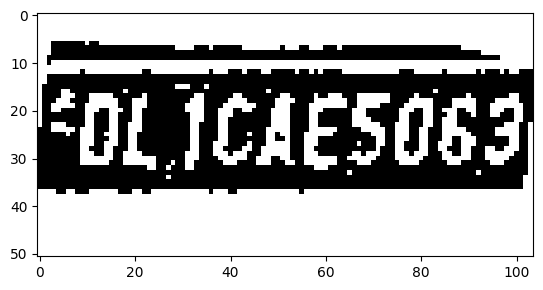

height =  147 width =  137
height =  383 width =  385


[184.6529541015625, 250.3360595703125, 292.5533142089844, 303.5294189453125, 0.9098872542381287, 0.0] track_id: 308.0
-0.1682067718570861


['OLTcRe5063t']
license before check OLTcRe5063t
hello
License Plate Number with contours :  None , Score :  None
-0.22082876972934834
['OLTcKES063']
license before check OLTcKES063
hello
License Plate Number :  None , Score :  None
height =  152 width =  141
height =  396 width =  398


[191.27859497070312, 261.503173828125, 303.879150390625, 315.78790283203125, 0.9214839935302734, 0.0] track_id: 308.0
-0.22423475110909616


['OL1CAESQ63']
license before check OL1CAESQ63
hello
License Plate Number with contours :  None , Score :  None
-0.2300861471922341
['EdLCAES0637']
license before check EdLCAES0637
hello
License Plate Number :  None , Score :  None
height =  149 width =  140
height =  404 width =  412


[199.01246643066406, 271.1880187988281, 316.17584228515625, 329.8233337402344, 0.9143821597099304, 0.0] track_id: 308.0
-0.22347660114063303
['DLICAE5O63']
license before check DLICAE5O63
license after check DLICAE5O63
License Plate Number with contours :  DL1CAE5063 , Score :  0.3322326371538751


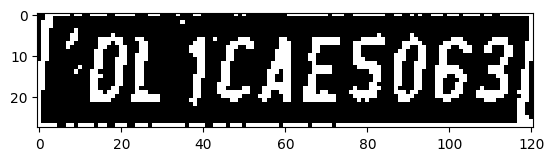

height =  147 width =  143
height =  418 width =  429


[210.296630859375, 280.4139709472656, 332.3515625, 339.672119140625, 0.910313606262207, 0.0] track_id: 308.0
-0.22423475110909616


['ILICAE5O63E']
license before check ILICAE5O63E
hello
License Plate Number with contours :  None , Score :  None
-0.22923193327699534
['edLCAE5063']
license before check edLCAE5063
license after check EDLCAE5063
License Plate Number :  ED4CAE5063 , Score :  0.08844034763438023


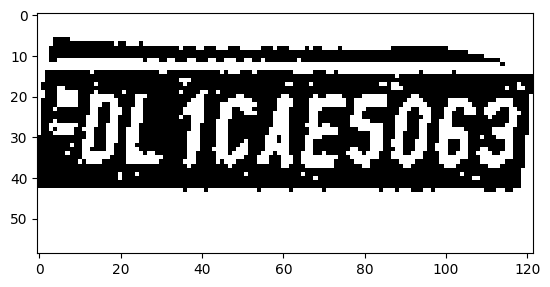

height =  148 width =  142
height =  426 width =  449


[222.9330596923828, 286.7739562988281, 349.1824951171875, 346.02130126953125, 0.9118101000785828, 0.0] track_id: 308.0
-0.22280115375939452
['OLICAESO63']
license before check OLICAESO63
license after check OLICAESO63
License Plate Number with contours :  OL1CAE5063 , Score :  0.4799854375306435


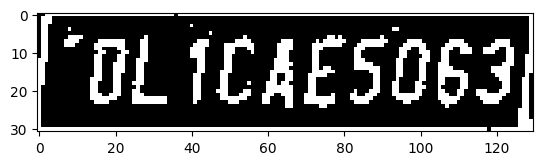

height =  152 width =  143
height =  440 width =  469


[235.76962280273438, 299.04931640625, 366.90948486328125, 363.634765625, 0.9131442904472351, 0.0] track_id: 308.0
-0.22581168154335537
['OLICAE5OS3']
license before check OLICAE5OS3
license after check OLICAE5OS3
License Plate Number with contours :  OL1CAE5053 , Score :  0.3098658705459356


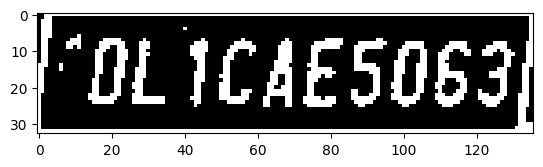

height =  154 width =  147
height =  462 width =  490


[247.619873046875, 313.0287170410156, 386.3102111816406, 378.4138488769531, 0.9231606125831604, 0.0] track_id: 308.0
-0.225601243836024
['DLICAE5O63']
license before check DLICAE5O63
license after check DLICAE5O63
License Plate Number with contours :  DL1CAE5063 , Score :  0.24669356547368418


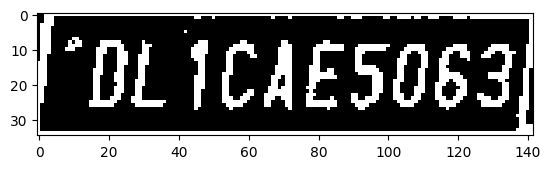

height =  157 width =  151
height =  481 width =  512


[262.6247253417969, 328.83563232421875, 406.67877197265625, 396.7596740722656, 0.9087816476821899, 0.0] track_id: 308.0
-0.22762393037490875


['OLICAE5O63I']
license before check OLICAE5O63I
hello
License Plate Number with contours :  None , Score :  None
-0.22512567616292364
['POLICAE5O6S']
license before check POLICAE5O6S
hello
License Plate Number :  None , Score :  None
height =  160 width =  156
height =  502 width =  536


[278.5334167480469, 346.3140563964844, 429.02813720703125, 417.7778625488281, 0.9097721576690674, 0.0] track_id: 308.0
-0.22244726542594168


['DLICAESO6JF']
license before check DLICAESO6JF
hello
License Plate Number with contours :  None , Score :  None
-0.21434308965628568
['DLICAE5O63']
license before check DLICAE5O63
license after check DLICAE5O63
License Plate Number :  DL1CAE5063 , Score :  0.46091094749642736


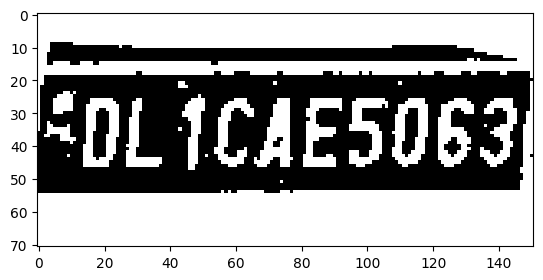

height =  164 width =  158
[69.73596954345703, 111.48351287841797, 111.09307098388672, 130.33132934570312, 0.26241403818130493, 0.0] track_id: 309.0
-0.24175286786424297
height =  526 width =  564


[296.1602783203125, 364.4101257324219, 453.31591796875, 440.0931091308594, 0.9129930138587952, 0.0] track_id: 308.0
-0.22863539328014904
['DLICAE5O63']
license before check DLICAE5O63
license after check DLICAE5O63
License Plate Number with contours :  DL1CAE5063 , Score :  0.6393751190175909


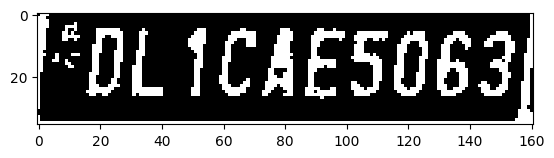

height =  172 width =  160
height =  552 width =  596


[317.18304443359375, 384.08544921875, 483.32830810546875, 464.49395751953125, 0.9247259497642517, 0.0] track_id: 308.0
-0.1767088560700366
['DLICAE5063']
license before check DLICAE5063
license after check DLICAE5063
License Plate Number with contours :  DL1CAE5063 , Score :  0.40120571963978113


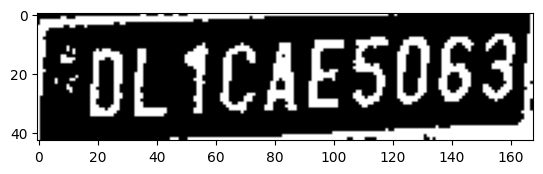

height =  178 width =  165
height =  584 width =  631


[342.4955139160156, 407.10211181640625, 516.8626098632812, 488.2256774902344, 0.917473316192627, 0.0] track_id: 308.0
-0.22679884805388587
['DLICAE5063']
license before check DLICAE5063
license after check DLICAE5063
License Plate Number with contours :  DL1CAE5063 , Score :  0.1760637286018128


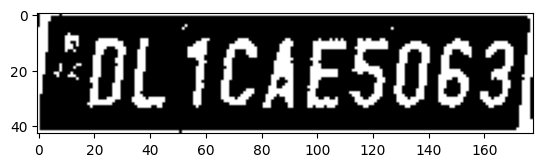

height =  176 width =  167
[74.17168426513672, 120.46802520751953, 117.20813751220703, 140.11715698242188, 0.8367707133293152, 0.0] track_id: 309.0
-0.23374318086890142
height =  618 width =  666


[367.583740234375, 435.6864929199219, 550.1375732421875, 520.409423828125, 0.9169970154762268, 0.0] track_id: 308.0
-0.22719146680088895
['OLICAE5O63']
license before check OLICAE5O63
license after check OLICAE5O63
License Plate Number with contours :  OL1CAE5063 , Score :  0.21468442343106944


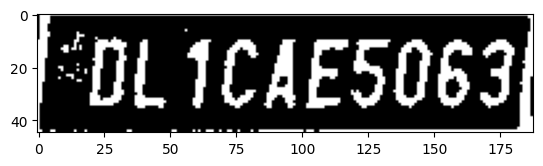

height =  181 width =  170


[75.43936920166016, 119.08008575439453, 119.92848205566406, 143.4788055419922, 0.8245528340339661, 0.0] track_id: 309.0
-0.27094685033842053


[]
License Plate Number with contours :  None , Score :  None
-0.2284966392918623
[]
License Plate Number :  None , Score :  None
height =  653 width =  708


[399.55859375, 460.5660400390625, 591.1600952148438, 551.9630737304688, 0.92250657081604, 0.0] track_id: 308.0
-0.22792794053606505
['DLICAESO63']
license before check DLICAESO63
license after check DLICAESO63
License Plate Number with contours :  DL1CAE5063 , Score :  0.5936191407520471


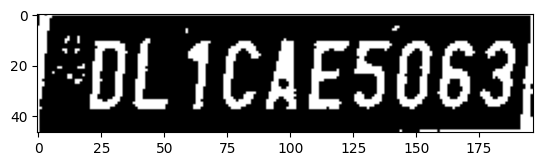

height =  178 width =  173


[77.65669250488281, 121.9643783569336, 122.09918212890625, 141.46524047851562, 0.8756529092788696, 0.0] track_id: 309.0
-0.2730087030867106


[]
License Plate Number with contours :  None , Score :  None
-0.25044308961135187
[]
License Plate Number :  None , Score :  None
height =  691 width =  754


[432.831787109375, 490.7891845703125, 636.6448364257812, 590.2042846679688, 0.9154050350189209, 0.0] track_id: 308.0
-0.22575026402715695


['FDLICAE5O6J']
license before check FDLICAE5O6J
hello
License Plate Number with contours :  None , Score :  None
-0.24239134677861826
['MoLchE5063']
license before check MoLchE5063
license after check MOLCHE5063
License Plate Number :  MO4CHE5063 , Score :  0.1461909148745694


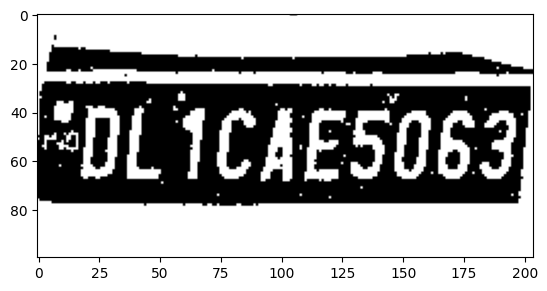

height =  183 width =  175


[77.97667694091797, 124.49156188964844, 123.37007904052734, 145.0155029296875, 0.8925442099571228, 0.0] track_id: 309.0
-0.2695890779209262


[]
License Plate Number with contours :  None , Score :  None
-0.23974310887045658
[]
License Plate Number :  None , Score :  None
height =  738 width =  806


[476.6428527832031, 524.816162109375, 689.6009521484375, 631.6541748046875, 0.9158477783203125, 0.0] track_id: 308.0
-0.2438736912008837
['DLICAE5O63']
license before check DLICAE5O63
license after check DLICAE5O63
License Plate Number with contours :  DL1CAE5063 , Score :  0.26786509478978243


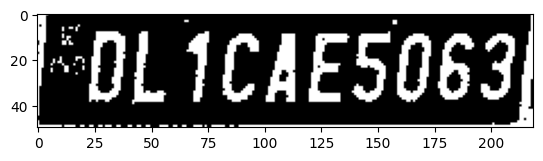

height =  188 width =  178
[78.37977600097656, 121.20048522949219, 125.0064926147461, 148.7459259033203, 0.8411062359809875, 0.0] track_id: 309.0
-0.2662520491509254
height =  790 width =  862


[525.370849609375, 566.5888061523438, 749.203125, 681.6239624023438, 0.9155697822570801, 0.0] track_id: 308.0
-0.25942210312457376
['DL1CAE5O63']
license before check DL1CAE5O63
license after check DL1CAE5O63
License Plate Number with contours :  DL1CAE5063 , Score :  0.20322788408619016


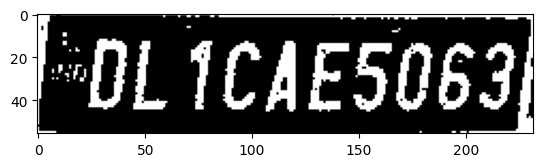

height =  190 width =  179
[79.32237243652344, 124.68162536621094, 126.55760955810547, 151.36944580078125, 0.823498010635376, 0.0] track_id: 309.0
-0.27829965900511133
height =  846 width =  925


[579.178955078125, 609.8599243164062, 814.438232421875, 735.2015991210938, 0.9199111461639404, 0.0] track_id: 308.0
-0.27891962172791485
['DLICAE5O63']
license before check DLICAE5O63
license after check DLICAE5O63
License Plate Number with contours :  DL1CAE5063 , Score :  0.8227325573284157


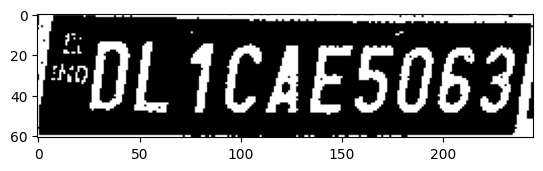

height =  191 width =  181
[79.33514404296875, 127.40316772460938, 127.68952178955078, 151.98077392578125, 0.8081409931182861, 0.0] track_id: 309.0
-0.23109066719589708
height =  911 width =  995


[642.85693359375, 659.986572265625, 889.3934936523438, 793.4785766601562, 0.9175528883934021, 0.0] track_id: 308.0
-0.27829965900511133
['DLICAESO6J']
license before check DLICAESO6J
license after check DLICAESO6J
License Plate Number with contours :  DL1CAE5063 , Score :  0.4557324674233014


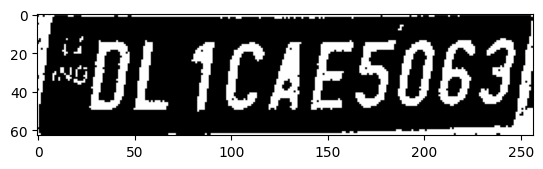

height =  194 width =  184
[79.78472137451172, 131.69859313964844, 129.96408081054688, 156.12503051757812, 0.7871336340904236, 0.0] track_id: 309.0
-0.2284966392918623
height =  983 width =  1068


[718.48193359375, 716.8860473632812, 973.6506958007812, 860.9489135742188, 0.9225009083747864, 0.0] track_id: 308.0
-0.3347368373168147
['DLICAE5063']
license before check DLICAE5063
license after check DLICAE5063
License Plate Number with contours :  DL1CAE5063 , Score :  0.6023063510945202


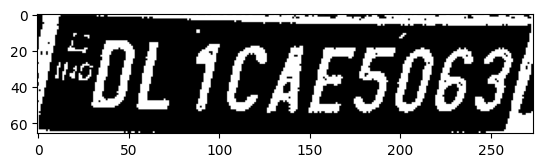

height =  198 width =  190


[82.69100952148438, 135.03268432617188, 133.1001739501953, 158.39549255371094, 0.8491612672805786, 0.0] track_id: 309.0
-0.2086817623350266


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
['Csy']
license before check Csy
hello
License Plate Number :  None , Score :  None
height =  1067 width =  1154


[805.9797973632812, 781.5186767578125, 1065.8604736328125, 939.5036010742188, 0.9256870746612549, 0.0] track_id: 308.0
-0.3686959026580498


['1CAE5063']
license before check 1CAE5063
hello
License Plate Number with contours :  None , Score :  None
-0.36679518938345607
['DLICAE5063']
license before check DLICAE5063
license after check DLICAE5063
License Plate Number :  DL1CAE5063 , Score :  0.46276379182245725


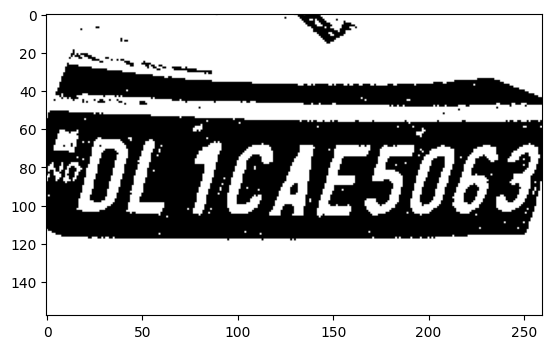

height =  202 width =  193
[85.66565704345703, 136.4302978515625, 136.1042022705078, 160.25204467773438, 0.8709452152252197, 0.0] track_id: 309.0
-0.25615138256560344
height =  1157 width =  1244


[903.2019653320312, 848.2842407226562, 1163.8924560546875, 1023.020751953125, 0.9300894737243652, 0.0] track_id: 308.0
-0.43824201509129235


['D']
license before check D
hello
License Plate Number with contours :  None , Score :  None
-0.3821166816786122
['DL1CAE5O63']
license before check DL1CAE5O63
license after check DL1CAE5O63
License Plate Number :  DL1CAE5063 , Score :  0.5768230195954291


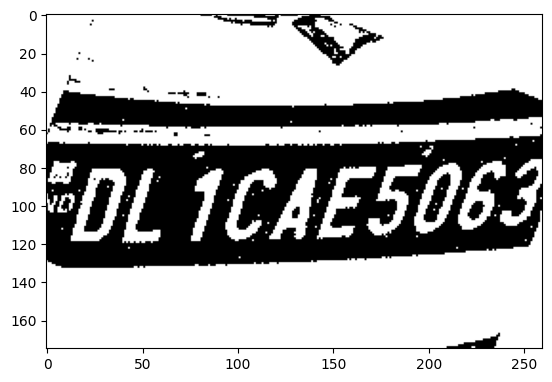

height =  206 width =  196
[87.62581634521484, 137.8275146484375, 138.14556884765625, 163.4355010986328, 0.8710597157478333, 0.0] track_id: 309.0
-0.2734609870902443
height =  1250 width =  1340


[1016.9368286132812, 918.9783935546875, 1274.3204345703125, 1117.8912353515625, 0.8144253492355347, 0.0] track_id: 308.0
-0.451636174670245


['D']
license before check D
hello
License Plate Number with contours :  None , Score :  None
-0.43662715981354133
['DLICAESO63']
license before check DLICAESO63
license after check DLICAESO63
License Plate Number :  DL1CAE5063 , Score :  0.21656967767649674


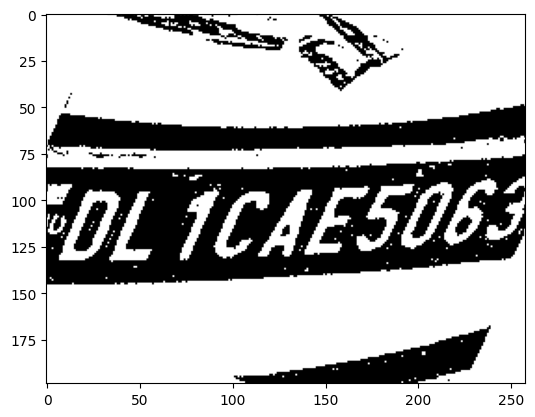

height =  208 width =  199
[89.05379486083984, 136.80506896972656, 140.09725952148438, 163.91329956054688, 0.8654840588569641, 0.0] track_id: 309.0
-0.2551823906208184
height =  1294 width =  1443
height =  212 width =  203


[91.29287719726562, 142.37252807617188, 143.32362365722656, 167.94737243652344, 0.8799716830253601, 0.0] track_id: 309.0
-0.2650428598974545


[]
License Plate Number with contours :  None , Score :  None
-0.23554498072086333
[]
License Plate Number :  None , Score :  None
height =  1307 width =  1537
height =  210 width =  205
[90.8260726928711, 140.40887451171875, 145.13192749023438, 167.58853149414062, 0.8811920285224915, 0.0] track_id: 309.0
-0.22266094063636496
height =  1314 width =  1646
height =  212 width =  209


[93.81169891357422, 143.90966796875, 147.52838134765625, 168.1252899169922, 0.8972373008728027, 0.0] track_id: 309.0
-0.14189705460416394


[]
License Plate Number with contours :  None , Score :  None
-0.22082876972934834
[]
License Plate Number :  None , Score :  None
height =  215 width =  214


[96.20525360107422, 143.2456817626953, 150.5000457763672, 168.6769561767578, 0.8823378086090088, 0.0] track_id: 309.0
-0.25786454780099666


[]
License Plate Number with contours :  None , Score :  None
-0.23109066719589708
[]
License Plate Number :  None , Score :  None
height =  220 width =  218
[97.77519989013672, 145.36264038085938, 153.24273681640625, 171.90843200683594, 0.8771275877952576, 0.0] track_id: 309.0
-0.259940140188528
height =  222 width =  221
[99.35265350341797, 147.65341186523438, 155.43096923828125, 174.21678161621094, 0.883094072341919, 0.0] track_id: 309.0
-0.2629947316809195
height =  1237 width =  1930
height =  225 width =  224
[100.7865982055664, 148.15576171875, 159.05996704101562, 175.78074645996094, 0.8856016993522644, 0.0] track_id: 309.0
-0.20401797959254858
height =  1223 width =  1935
height =  226 width =  228
[102.89653778076172, 149.68295288085938, 162.11871337890625, 177.19915771484375, 0.8828858137130737, 0.0] track_id: 309.0
-0.2284966392918623
height =  1250 width =  1894
height =  230 width =  232
[104.27082824707031, 152.69285583496094, 164.84010314941406, 182.3251953125, 0.8769394

[104.55084228515625, 154.66567993164062, 167.1720428466797, 184.45498657226562, 0.8773393034934998, 0.0] track_id: 309.0
-0.18998828791871572


[]
License Plate Number with contours :  None , Score :  None
-0.2168736156664083
[]
License Plate Number :  None , Score :  None
height =  1089 width =  1782
height =  238 width =  240
[108.20429992675781, 150.46092224121094, 170.27764892578125, 189.3642120361328, 0.8770217895507812, 0.0] track_id: 309.0
-0.21018258666216955
height =  1019 width =  1705
height =  241 width =  246
[110.48808288574219, 156.87164306640625, 174.89642333984375, 192.5631561279297, 0.8751096725463867, 0.0] track_id: 309.0
-0.2633976325455006
height =  956 width =  1617
height =  246 width =  250
[112.23192596435547, 166.44473266601562, 176.9176483154297, 196.0912322998047, 0.8966893553733826, 0.0] track_id: 309.0
-0.26147881571224924
height =  956 width =  1510
height =  253 width =  253
[112.5241470336914, 168.03192138671875, 179.98915100097656, 200.37887573242188, 0.8782241344451904, 0.0] track_id: 309.0
-0.14189705460416394
height =  895 width =  1384
height =  257 width =  258


[115.5683364868164, 172.92845153808594, 183.40858459472656, 203.81741333007812, 0.8987095355987549, 0.0] track_id: 309.0
-0.24220858710962045


[]
License Plate Number with contours :  None , Score :  None
-0.21535769969773805
[]
License Plate Number :  None , Score :  None
height =  761 width =  1221
height =  263 width =  262


[117.0755844116211, 176.40267944335938, 187.92066955566406, 209.64964294433594, 0.8936635851860046, 0.0] track_id: 309.0
-0.20795854725293414


['lt']
license before check lt
hello
License Plate Number with contours :  None , Score :  None
-0.23684876094692026
[]
License Plate Number :  None , Score :  None
height =  266 width =  268
[120.080322265625, 176.04087829589844, 190.56788635253906, 211.51788330078125, 0.8821401000022888, 0.0] track_id: 309.0
-0.2513277841608404
height =  271 width =  275


[123.24192810058594, 180.747314453125, 195.0441436767578, 215.4195098876953, 0.8869098424911499, 0.0] track_id: 309.0
-0.20612134187530706


['BrH2E53LE']
license before check BrH2E53LE
hello
License Plate Number with contours :  None , Score :  None
-0.22785704871709972
['WNTLT']
license before check WNTLT
hello
License Plate Number :  None , Score :  None
height =  275 width =  280
[125.18854522705078, 185.90977478027344, 198.22271728515625, 218.95213317871094, 0.8999075293540955, 0.0] track_id: 309.0
-0.1740452398427387
height =  282 width =  286
[127.81151580810547, 190.06410217285156, 201.92869567871094, 223.71649169921875, 0.8946502208709717, 0.0] track_id: 309.0
-0.22595921768864075
height =  289 width =  292
[130.38648986816406, 195.78240966796875, 206.825927734375, 229.2689666748047, 0.9120089411735535, 0.0] track_id: 309.0
-0.22679884805388587
height =  296 width =  294
[131.64584350585938, 201.3708038330078, 209.3693084716797, 235.36697387695312, 0.9076651930809021, 0.0] track_id: 309.0
-0.20401797959254858
height =  302 width =  301
[134.5885772705078, 206.2090606689453, 213.7162322998047, 241.14218139648438, 0.

[137.05908203125, 210.41773986816406, 218.74346923828125, 245.7487335205078, 0.8991658091545105, 0.0] track_id: 309.0
-0.22679884805388587


['WP']
license before check WP
hello
License Plate Number with contours :  None , Score :  None
-0.2171113147349052
['MAIBTTR']
license before check MAIBTTR
hello
License Plate Number :  None , Score :  None
height =  316 width =  312
[140.44668579101562, 214.95840454101562, 223.790771484375, 251.69253540039062, 0.9046408534049988, 0.0] track_id: 309.0
-0.2086817623350266
height =  324 width =  319
[143.6056365966797, 220.62216186523438, 228.61874389648438, 258.8172302246094, 0.905250608921051, 0.0] track_id: 309.0
-0.2080561367910258
height =  332 width =  325
[146.26036071777344, 227.3632049560547, 232.74627685546875, 267.2442321777344, 0.9045418500900269, 0.0] track_id: 309.0
-0.23602367862589738
height =  342 width =  333
[150.0525665283203, 235.99642944335938, 238.18446350097656, 278.02984619140625, 0.9055948257446289, 0.0] track_id: 309.0
-0.22402364703792346
height =  343 width =  342
[154.10780334472656, 234.65335083007812, 244.75013732910156, 279.6100769042969, 0.8923636078834

[160.807861328125, 240.88841247558594, 252.5033416748047, 285.36322021484375, 0.8981906175613403, 0.0] track_id: 309.0
-0.2058341781041252


[]
License Plate Number with contours :  None , Score :  None
-0.26211984126547283
['EURsZ8TZGI']
license before check EURsZ8TZGI
hello
License Plate Number :  None , Score :  None
height =  363 width =  359


[164.10690307617188, 250.38946533203125, 258.5238952636719, 295.3916931152344, 0.9088230729103088, 0.0] track_id: 309.0
-0.20539538918976738


[]
License Plate Number with contours :  None , Score :  None
-0.22244726542594168
['EveJzetzzsJ']
license before check EveJzetzzsJ
hello
License Plate Number :  None , Score :  None
height =  374 width =  365
[167.36024475097656, 260.5484619140625, 263.9817199707031, 305.35943603515625, 0.9157238006591797, 0.0] track_id: 309.0
-0.22266094063636496
height =  387 width =  374
[173.09088134765625, 274.4203186035156, 271.4769287109375, 320.6706237792969, 0.9085793495178223, 0.0] track_id: 309.0
-0.212270495716091
height =  396 width =  385
[178.14720153808594, 282.281494140625, 279.3149719238281, 330.7547607421875, 0.9007738828659058, 0.0] track_id: 309.0
-0.20846521837998772
height =  407 width =  396
[183.95941162109375, 290.69451904296875, 287.15509033203125, 339.5654602050781, 0.9007100462913513, 0.0] track_id: 309.0
-0.1934273267108474
height =  411 width =  407


[191.75692749023438, 294.7400207519531, 297.51544189453125, 344.74810791015625, 0.9027138352394104, 0.0] track_id: 309.0
-0.24335528792954136


['PT']
license before check PT
hello
License Plate Number with contours :  None , Score :  None
-0.23329695153662725
['RUPJ28TE461']
license before check RUPJ28TE461
hello
License Plate Number :  None , Score :  None
height =  420 width =  419
[198.88404846191406, 299.4923095703125, 306.5483703613281, 351.9562072753906, 0.9051306843757629, 0.0] track_id: 309.0
-0.22527677921405528
height =  421 width =  430
[206.4770965576172, 295.94085693359375, 318.0816345214844, 348.69189453125, 0.9096494317054749, 0.0] track_id: 309.0
-0.23837082978675084
height =  427 width =  445


[213.57891845703125, 301.8209533691406, 328.31329345703125, 354.2553405761719, 0.9173232913017273, 0.0] track_id: 309.0
-0.19032853969190713


[]
License Plate Number with contours :  None , Score :  None
-0.22545836628305996
['EuP12812L6']
license before check EuP12812L6
hello
License Plate Number :  None , Score :  None
height =  111 width =  110
height =  439 width =  459
[222.19505310058594, 311.2465515136719, 339.38824462890625, 364.5896911621094, 0.9110750555992126, 0.0] track_id: 309.0
-0.21018258666216955
height =  113 width =  112
height =  456 width =  471
[229.46185302734375, 324.369384765625, 350.2593688964844, 380.9746398925781, 0.9080395102500916, 0.0] track_id: 309.0
-0.20653607310567618
height =  472 width =  487
[237.7574920654297, 336.74639892578125, 363.44256591796875, 395.2027893066406, 0.9095985293388367, 0.0] track_id: 309.0
-0.24064343017060452
height =  113 width =  101
height =  482 width =  504
[248.64549255371094, 344.9076232910156, 377.09185791015625, 404.9731140136719, 0.9103820323944092, 0.0] track_id: 309.0
-0.2082059495239874
height =  499 width =  522
[260.8756103515625, 359.5712585449219, 393

[421.8427734375, 518.5750122070312, 604.6756591796875, 605.9365234375, 0.9178348183631897, 0.0] track_id: 309.0
-0.25436805855326594


[]
License Plate Number with contours :  None , Score :  None
-0.24358590636724095
['UP12BT4461']
license before check UP12BT4461
license after check UP12BT4461
License Plate Number :  UP12BT4461 , Score :  0.2912370649491678


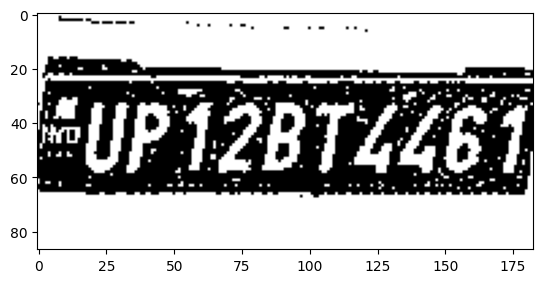

height =  142 width =  128
height =  715 width =  789


[451.204345703125, 549.390380859375, 641.7965087890625, 640.8801879882812, 0.9176989197731018, 0.0] track_id: 309.0
-0.2275674874105842


[]
License Plate Number with contours :  None , Score :  None
-0.24233316665301483
['UP12BTLz6']
license before check UP12BTLz6
hello
License Plate Number :  None , Score :  None
height =  146 width =  132
height =  747 width =  827


[480.48095703125, 579.5178833007812, 681.3509521484375, 674.929931640625, 0.9112564921379089, 0.0] track_id: 309.0
-0.2424470229658554


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
['Lnd', 'UP12BT446']
license before check LndUP12BT446
hello
License Plate Number :  None , Score :  None
height =  149 width =  134
height =  781 width =  868


[518.574951171875, 613.7486572265625, 724.5894775390625, 712.900146484375, 0.914046049118042, 0.0] track_id: 309.0
-0.22618760118624584


[]
License Plate Number with contours :  None , Score :  None
-0.26199272800824464
['UP12874461']
license before check UP12874461
hello
License Plate Number :  None , Score :  None
height =  152 width =  137
height =  819 width =  919


[563.4253540039062, 646.4423217773438, 777.5433959960938, 758.0282592773438, 0.9192384481430054, 0.0] track_id: 309.0
-0.2629947316809195


[]
License Plate Number with contours :  None , Score :  None
-0.26265637946916537
['UP12BTL461']
license before check UP12BTL461
license after check UP12BTL461
License Plate Number :  UP12BT4461 , Score :  0.5049273871586173


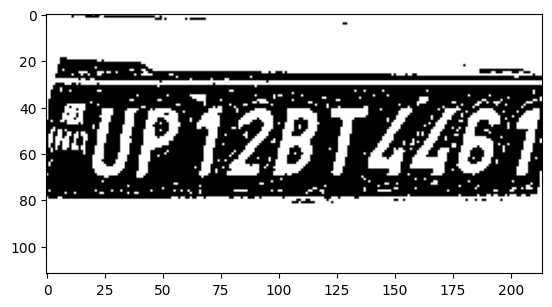

height =  154 width =  140
height =  859 width =  974


[613.169189453125, 680.33544921875, 836.10009765625, 800.7718505859375, 0.9199739694595337, 0.0] track_id: 309.0
-0.2596296294082575


[]
License Plate Number with contours :  None , Score :  None
-0.28309578529949553
['UP12814461']
license before check UP12814461
hello
License Plate Number :  None , Score :  None
height =  156 width =  139
height =  904 width =  1034


[668.0194702148438, 725.8945922851562, 899.1060791015625, 856.8328857421875, 0.9205276966094971, 0.0] track_id: 309.0
-0.29611514587496474


['B']
license before check B
hello
License Plate Number with contours :  None , Score :  None
-0.29715349008386427
['UPI2BT446']
license before check UPI2BT446
hello
License Plate Number :  None , Score :  None
height =  155 width =  140
height =  962 width =  1098
[728.9791870117188, 776.5343017578125, 968.9232177734375, 910.6110229492188, 0.924814760684967, 0.0] track_id: 309.0
-0.3151281346539744
height =  159 width =  145
height =  1018 width =  1164


[795.974853515625, 831.0508422851562, 1043.0345458984375, 978.483642578125, 0.9225802421569824, 0.0] track_id: 309.0
-0.3324263053840973


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.3153197748790414
['UP12BT446']
license before check UP12BT446
hello
License Plate Number :  None , Score :  None
height =  158 width =  148
height =  1075 width =  1237


[871.31396484375, 883.5472412109375, 1125.6248779296875, 1040.9595947265625, 0.925605058670044, 0.0] track_id: 309.0
-0.3500448882451459


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.3826961546341699
['UP12BT446']
license before check UP12BT446
hello
License Plate Number :  None , Score :  None
height =  167 width =  151
height =  1145 width =  1315


[953.5858154296875, 939.1967163085938, 1212.36376953125, 1110.9151611328125, 0.9270039796829224, 0.0] track_id: 309.0
-0.4182243295792291


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.36684369186917043
['OUPI2BTZL6']
license before check OUPI2BTZL6
hello
License Plate Number :  None , Score :  None
height =  171 width =  154
height =  1219 width =  1402


[1048.943115234375, 1001.066162109375, 1307.137451171875, 1187.3447265625, 0.912006676197052, 0.0] track_id: 309.0
-0.47184414675071873


[]
License Plate Number with contours :  None , Score :  None
-0.4555832676940391
['UP128T415']
license before check UP128T415
hello
License Plate Number :  None , Score :  None
height =  170 width =  158
height =  1299 width =  1482
[1151.3671875, 1043.8975830078125, 1402.1959228515625, 1261.3226318359375, 0.9077489376068115, 0.0] track_id: 309.0
-0.5053569526873578
height =  181 width =  160
height =  1377 width =  1577
[1266.46435546875, 1098.728759765625, 1510.219970703125, 1351.5556640625, 0.5696948170661926, 0.0] track_id: 309.0
-0.5752760179561178
height =  187 width =  164
height =  1398 width =  1668
[1458.9798583984375, 902.3844604492188, 1595.896484375, 1070.0611572265625, 0.47017988562583923, 0.0] track_id: 309.0
-0.5766209812153831
height =  191 width =  168


[68.14956665039062, 120.6283187866211, 115.88431549072266, 142.66860961914062, 0.6025566458702087, 0.0] track_id: 317.0
-0.25732371497108864


[]
License Plate Number with contours :  None , Score :  None
-0.2510026866430346
[]
License Plate Number :  None , Score :  None
height =  1401 width =  1770
[1596.6148681640625, 961.880859375, 1715.5377197265625, 1147.5933837890625, 0.7210055589675903, 0.0] track_id: 309.0
-0.7853981633974483
height =  192 width =  172


[71.0474853515625, 121.90560150146484, 119.68518829345703, 143.52081298828125, 0.43965885043144226, 0.0] track_id: 317.0
-0.2860514417173182


[]
License Plate Number with contours :  None , Score :  None
-0.28379410920832787
[]
License Plate Number :  None , Score :  None
height =  1398 width =  1865
height =  192 width =  175


[73.39971160888672, 119.4417495727539, 122.97614288330078, 143.30471801757812, 0.7674160599708557, 0.0] track_id: 317.0
-0.2629947316809195


[]
License Plate Number with contours :  None , Score :  None
-0.2721458905311873
[]
License Plate Number :  None , Score :  None
height =  1391 width =  1980
height =  193 width =  179


[76.5108413696289, 119.44561767578125, 126.38848114013672, 143.28343200683594, 0.251579612493515, 0.0] track_id: 317.0
-0.23374318086890142


[]
License Plate Number with contours :  None , Score :  None
-0.2662520491509254
[]
License Plate Number :  None , Score :  None
height =  1384 width =  2061
height =  196 width =  182


[77.65272521972656, 120.07545471191406, 129.81907653808594, 146.49755859375, 0.5385879278182983, 0.0] track_id: 317.0
-0.23783592745745075


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
[]
License Plate Number :  None , Score :  None
height =  1380 width =  2074
height =  200 width =  187
[79.09965515136719, 122.46958923339844, 132.98927307128906, 148.52711486816406, 0.8283059597015381, 0.0] track_id: 317.0
-0.24497866312686414
height =  1369 width =  2052
height =  203 width =  192


[82.75296783447266, 123.0992431640625, 137.26446533203125, 149.50762939453125, 0.7761839628219604, 0.0] track_id: 317.0
-0.25168997175818675


[]
License Plate Number with contours :  None , Score :  None
-0.2662520491509254
[]
License Plate Number :  None , Score :  None
height =  1358 width =  2038
height =  208 width =  194
height =  1343 width =  2031
height =  213 width =  199


[86.5013427734375, 128.9562225341797, 143.0214080810547, 158.7278289794922, 0.8314088582992554, 0.0] track_id: 317.0
-0.23860932250820097


[]
License Plate Number with contours :  None , Score :  None
-0.26448838254923257
[]
License Plate Number :  None , Score :  None
height =  1330 width =  1984
height =  214 width =  201
[86.41893768310547, 131.38392639160156, 144.63961791992188, 159.58819580078125, 0.813269317150116, 0.0] track_id: 317.0
-0.23501221572065709
height =  1313 width =  1985
height =  216 width =  206


[88.35594177246094, 134.58383178710938, 146.6624755859375, 162.9146728515625, 0.8655862808227539, 0.0] track_id: 317.0
-0.2425514834271907


[]
License Plate Number with contours :  None , Score :  None
-0.2405342479459046
[]
License Plate Number :  None , Score :  None
height =  1286 width =  1965
height =  221 width =  211


[90.4748306274414, 135.72369384765625, 151.1285400390625, 165.40708923339844, 0.8684720396995544, 0.0] track_id: 317.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.24925214138521365
[]
License Plate Number :  None , Score :  None
height =  1249 width =  1938
height =  222 width =  214
[91.60235595703125, 137.74032592773438, 151.8531494140625, 166.15846252441406, 0.7937204241752625, 0.0] track_id: 317.0
-0.22347660114063303
height =  1203 width =  1904
height =  226 width =  220


[95.16981506347656, 140.01797485351562, 158.28427124023438, 168.19305419921875, 0.8382594585418701, 0.0] track_id: 317.0
-0.2567083304333857


[]
License Plate Number with contours :  None , Score :  None
-0.25825221981103874
[]
License Plate Number :  None , Score :  None
height =  1158 width =  1869
height =  229 width =  225


[98.26917266845703, 141.7567138671875, 162.79322814941406, 172.82778930664062, 0.758300244808197, 0.0] track_id: 317.0
-0.23501221572065709


[]
License Plate Number with contours :  None , Score :  None
-0.24111767845146836
[]
License Plate Number :  None , Score :  None
height =  236 width =  232


[101.16320037841797, 145.62388610839844, 167.70375061035156, 178.10885620117188, 0.8458682298660278, 0.0] track_id: 317.0
-0.252095980668074


[]
License Plate Number with contours :  None , Score :  None
-0.25651661264432357
[]
License Plate Number :  None , Score :  None
height =  1101 width =  1797
height =  240 width =  237


[104.9223403930664, 150.3222198486328, 171.83200073242188, 184.15573120117188, 0.8954753279685974, 0.0] track_id: 317.0
-0.25615138256560344


[]
License Plate Number with contours :  None , Score :  None
-0.260602391747341
['wir']
license before check wir
hello
License Plate Number :  None , Score :  None
height =  245 width =  243


[106.95170593261719, 153.27272033691406, 176.14199829101562, 187.67919921875, 0.9002248048782349, 0.0] track_id: 317.0
-0.2247111684146427


[]
License Plate Number with contours :  None , Score :  None
-0.25651661264432357
[]
License Plate Number :  None , Score :  None
height =  253 width =  250


[110.10015106201172, 159.19680786132812, 180.2599639892578, 193.67745971679688, 0.9045205116271973, 0.0] track_id: 317.0
-0.2591020177794102


[]
License Plate Number with contours :  None , Score :  None
-0.23783592745745075
['i']
license before check i
hello
License Plate Number :  None , Score :  None
height =  261 width =  260


[115.38878631591797, 163.28515625, 188.51730346679688, 198.5242919921875, 0.8953753709793091, 0.0] track_id: 317.0
-0.23783592745745075


[]
License Plate Number with contours :  None , Score :  None
-0.25580856461537194
[]
License Plate Number :  None , Score :  None
height =  265 width =  266


[118.03466796875, 165.9458465576172, 192.37852478027344, 202.1668701171875, 0.9043912887573242, 0.0] track_id: 317.0
-0.23684876094692026


[]
License Plate Number with contours :  None , Score :  None
-0.24156570709532596
['bWjj']
license before check bWjj
hello
License Plate Number :  None , Score :  None
height =  271 width =  273


[122.9488525390625, 169.34210205078125, 199.1499786376953, 206.11915588378906, 0.9071133732795715, 0.0] track_id: 317.0
-0.2223487820699473


[]
License Plate Number with contours :  None , Score :  None
-0.25168997175818675
[]
License Plate Number :  None , Score :  None
height =  279 width =  282


[128.2393798828125, 172.66615295410156, 206.7820281982422, 210.05624389648438, 0.9176468253135681, 0.0] track_id: 317.0
-0.23602367862589738


[]
License Plate Number with contours :  None , Score :  None
-0.2551823906208184
['t7']
license before check t7
hello
License Plate Number :  None , Score :  None
height =  288 width =  290


[132.45230102539062, 177.4558563232422, 213.10081481933594, 217.03033447265625, 0.9224944114685059, 0.0] track_id: 317.0
-0.22494126505117096


[]
License Plate Number with contours :  None , Score :  None
-0.2513277841608404
['BR29639']
license before check BR29639
hello
License Plate Number :  None , Score :  None
height =  701 width =  614
height =  296 width =  298


[136.71746826171875, 184.18203735351562, 219.5172119140625, 225.9443359375, 0.9119340777397156, 0.0] track_id: 317.0
-0.26188526468051904


[]
License Plate Number with contours :  None , Score :  None
-0.24192056868440487
['HR3ZITKJL']
license before check HR3ZITKJL
hello
License Plate Number :  None , Score :  None
height =  307 width =  306


[140.3910675048828, 191.92172241210938, 226.4566192626953, 234.44163513183594, 0.9011052846908569, 0.0] track_id: 317.0
-0.22347660114063303


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
['6H5273899']
license before check 6H5273899
hello
License Plate Number :  None , Score :  None
height =  315 width =  317


[145.20005798339844, 198.20001220703125, 233.4252471923828, 241.53611755371094, 0.911217212677002, 0.0] track_id: 317.0
-0.2284966392918623


['ty0ji']
license before check ty0ji
hello
License Plate Number with contours :  None , Score :  None
-0.24207169457111893
['Rhr2T9S4']
license before check Rhr2T9S4
hello
License Plate Number :  None , Score :  None
height =  323 width =  326


[152.33627319335938, 205.64788818359375, 243.1162567138672, 250.69384765625, 0.9186888933181763, 0.0] track_id: 317.0
-0.22441600903714554


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
['6krzT96841']
license before check 6krzT96841
hello
License Plate Number :  None , Score :  None
height =  334 width =  339


[159.62428283691406, 213.6154327392578, 253.42681884765625, 258.7100524902344, 0.9145278334617615, 0.0] track_id: 317.0
-0.22595921768864075


[]
License Plate Number with contours :  None , Score :  None
-0.23645614219991717
['FHR1203696']
license before check FHR1203696
hello
License Plate Number :  None , Score :  None
height =  342 width =  348


[166.01988220214844, 222.05824279785156, 262.34136962890625, 266.6533508300781, 0.9108517169952393, 0.0] track_id: 317.0
-0.22571659739416963


['HfR5']
license before check HfR5
hello
License Plate Number with contours :  None , Score :  None
-0.24233316665301483
['GhG1709636']
license before check GhG1709636
hello
License Plate Number :  None , Score :  None
height =  354 width =  360


[173.16647338867188, 227.23780822753906, 272.5692443847656, 274.2851257324219, 0.921909749507904, 0.0] track_id: 317.0
-0.2217809690225993


['HfF259695']
license before check HfF259695
hello
License Plate Number with contours :  None , Score :  None
-0.24233316665301483
['FHR1219694']
license before check FHR1219694
hello
License Plate Number :  None , Score :  None
height =  362 width =  372


[180.16688537597656, 235.10464477539062, 282.71710205078125, 283.3505859375, 0.9163899421691895, 0.0] track_id: 317.0
-0.23753463189561275


[]
License Plate Number with contours :  None , Score :  None
-0.2424470229658554
['ZHR1213694']
license before check ZHR1213694
hello
License Plate Number :  None , Score :  None
height =  374 width =  384


[186.4527130126953, 243.69384765625, 291.9907531738281, 293.45928955078125, 0.9133614301681519, 0.0] track_id: 317.0
-0.22734380712800387
['KR12t9634']
license before check KR12t9634
license after check KR12T9634
License Plate Number with contours :  KR12T9634 , Score :  0.2856566391745692


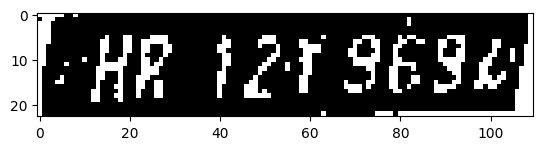

height =  387 width =  399


[195.45314025878906, 252.56761169433594, 304.9512023925781, 305.06146240234375, 0.9071474075317383, 0.0] track_id: 317.0
-0.21256680956305457


['2t96941']
license before check 2t96941
hello
License Plate Number with contours :  None , Score :  None
-0.24273651441777036
['FXR12163l']
license before check FXR12163l
hello
License Plate Number :  None , Score :  None
height =  401 width =  415
[205.17965698242188, 262.1623229980469, 318.71966552734375, 315.8553771972656, 0.9087632298469543, 0.0] track_id: 317.0
-0.22615243573280183
height =  412 width =  430


[214.4684295654297, 270.5855712890625, 331.9788513183594, 327.1388244628906, 0.9102581739425659, 0.0] track_id: 317.0
-0.2408464552414116


['219692']
license before check 219692
hello
License Plate Number with contours :  None , Score :  None
-0.22545836628305996
['FHR29692']
license before check FHR29692
hello
License Plate Number :  None , Score :  None
height =  422 width =  446


[224.63619995117188, 282.3407287597656, 346.7779541015625, 340.5028381347656, 0.9175993800163269, 0.0] track_id: 317.0
-0.22740234828236858


['219694']
license before check 219694
hello
License Plate Number with contours :  None , Score :  None
-0.2408464552414116
['HR1219691']
license before check HR1219691
license after check HR1219691
License Plate Number :  HR12I9691 , Score :  0.316739292092286


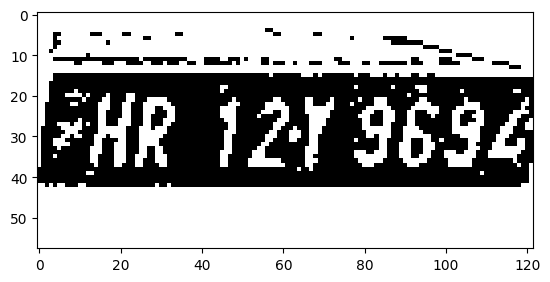

height =  438 width =  468


[239.29129028320312, 292.72314453125, 365.5343017578125, 354.2593078613281, 0.9182054996490479, 0.0] track_id: 317.0
-0.2283412632831686


['hR128963']
license before check hR128963
hello
License Plate Number with contours :  None , Score :  None
-0.22494126505117096
['FhR12Y9694']
license before check FhR12Y9694
hello
License Plate Number :  None , Score :  None
height =  455 width =  493


[254.08999633789062, 306.78497314453125, 386.0511474609375, 370.54901123046875, 0.9274677038192749, 0.0] track_id: 317.0
-0.23154377092565046
['HR12t9694']
license before check HR12t9694
license after check HR12T9694
License Plate Number with contours :  HR12T9694 , Score :  0.33109870113920253


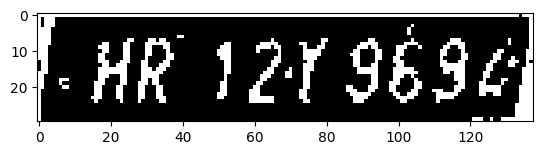

height =  474 width =  515


[269.54669189453125, 320.14874267578125, 405.8143615722656, 386.5313720703125, 0.9251694083213806, 0.0] track_id: 317.0
-0.24111767845146836


['HP12496961']
license before check HP12496961
hello
License Plate Number with contours :  None , Score :  None
-0.23066836992370324
['FHR12Y9634']
license before check FHR12Y9634
hello
License Plate Number :  None , Score :  None
height =  495 width =  539


[284.5765686035156, 332.3661193847656, 427.68017578125, 401.2823791503906, 0.9216054677963257, 0.0] track_id: 317.0
-0.22589140728662901
['HR12Y9694']
license before check HR12Y9694
license after check HR12Y9694
License Plate Number with contours :  HR12Y9694 , Score :  0.6018676862470758


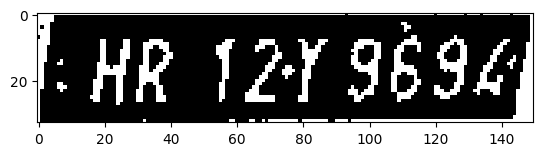

height =  516 width =  567


[304.7804870605469, 347.8421325683594, 453.8274841308594, 418.15594482421875, 0.9134056568145752, 0.0] track_id: 317.0
-0.24330921559601026


['HR12Y96941']
license before check HR12Y96941
hello
License Plate Number with contours :  None , Score :  None
-0.2287988453872256
['6HR12Y9694']
license before check 6HR12Y9694
hello
License Plate Number :  None , Score :  None
height =  542 width =  597


[323.6158447265625, 365.1528625488281, 481.6651611328125, 441.9869079589844, 0.9224995970726013, 0.0] track_id: 317.0
-0.20749622643520266
['HR1219634']
license before check HR1219634
license after check HR1219634
License Plate Number with contours :  HR12I9634 , Score :  0.2906620902784282


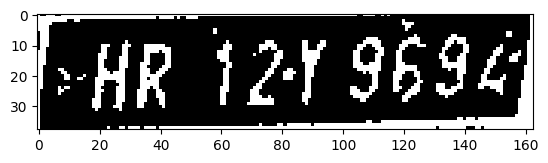

height =  573 width =  631


[348.6853942871094, 387.83349609375, 513.123291015625, 467.6855163574219, 0.9257786273956299, 0.0] track_id: 317.0
-0.24192056868440487


['2Y9694']
license before check 2Y9694
hello
License Plate Number with contours :  None , Score :  None
-0.22863539328014904
['HR1219594']
license before check HR1219594
license after check HR1219594
License Plate Number :  HR12I9594 , Score :  0.48984651181978217


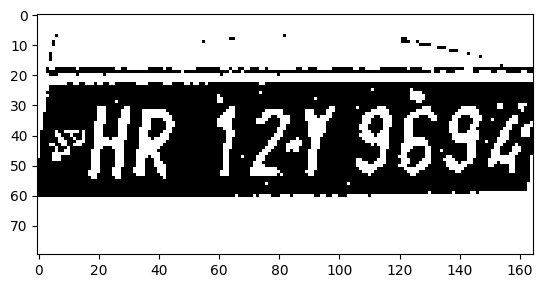

height =  599 width =  665


[374.3855285644531, 411.9450378417969, 546.98095703125, 494.6031188964844, 0.9153391122817993, 0.0] track_id: 317.0
-0.22978646187080273


['2Y9694']
license before check 2Y9694
hello
License Plate Number with contours :  None , Score :  None
-0.24199804602212852
['PHR', '219694']
license before check PHR219694
hello
License Plate Number :  None , Score :  None
height =  628 width =  705


[402.08221435546875, 435.48193359375, 582.66748046875, 522.1328125, 0.9162331223487854, 0.0] track_id: 317.0
-0.23985706898392337
['HR12Y9694']
license before check HR12Y9694
license after check HR12Y9694
License Plate Number with contours :  HR12Y9694 , Score :  0.4574088035036074


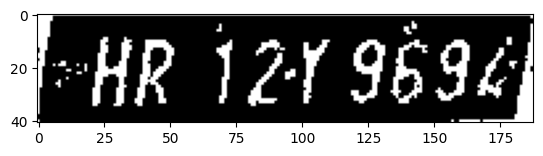

height =  662 width =  746


[435.3772277832031, 458.966064453125, 626.2525024414062, 552.34423828125, 0.9162954688072205, 0.0] track_id: 317.0
-0.2232429562850715
['HR12Y9694']
license before check HR12Y9694
license after check HR12Y9694
License Plate Number with contours :  HR12Y9694 , Score :  0.6231897645389458


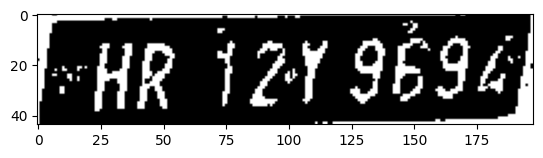

height =  699 width =  794


[476.95306396484375, 488.5960998535156, 676.0026245117188, 589.8316650390625, 0.9149793982505798, 0.0] track_id: 317.0
-0.24735395557182352


['12Y9694']
license before check 12Y9694
hello
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
['YHR12Y9694']
license before check YHR12Y9694
hello
License Plate Number :  None , Score :  None
height =  740 width =  846


[519.038330078125, 521.1244506835938, 727.9525146484375, 629.052490234375, 0.9150418639183044, 0.0] track_id: 317.0
-0.23985706898392337


['FhR1219694']
license before check FhR1219694
hello
License Plate Number with contours :  None , Score :  None
-0.2615451947363801
['HR1219691']
license before check HR1219691
license after check HR1219691
License Plate Number :  HR12I9691 , Score :  0.2291708117503408


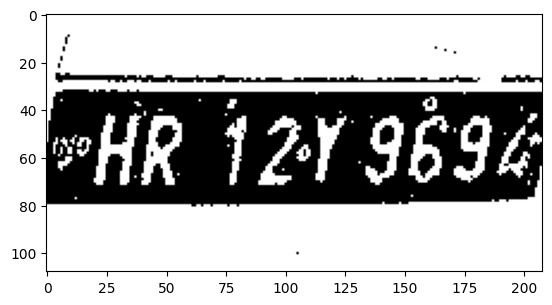

height =  786 width =  900


[568.2412719726562, 560.0372314453125, 785.3070678710938, 673.2252807617188, 0.9220483899116516, 0.0] track_id: 317.0
-0.2653839938134022


['HR12196941']
license before check HR12196941
hello
License Plate Number with contours :  None , Score :  None
-0.27891962172791485
['HR12Y9691']
license before check HR12Y9691
license after check HR12Y9691
License Plate Number :  HR12Y9691 , Score :  0.1921282321636276


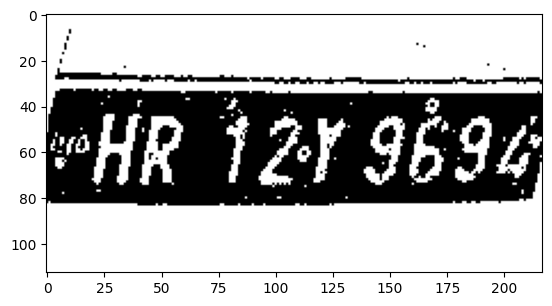

height =  840 width =  963


[627.4080200195312, 602.1739501953125, 853.0316162109375, 722.4136352539062, 0.9252786636352539, 0.0] track_id: 317.0
-0.296393671538545


['HR12196941']
license before check HR12196941
hello
License Plate Number with contours :  None , Score :  None
-0.26227253633223535
['HR1219694']
license before check HR1219694
license after check HR1219694
License Plate Number :  HR12I9694 , Score :  0.4109097539528347


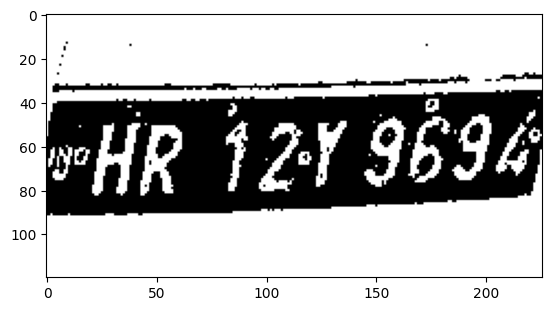

height =  896 width =  1028


[693.8759155273438, 647.6436767578125, 925.6697387695312, 775.4346923828125, 0.9198773503303528, 0.0] track_id: 317.0
-0.2984989315861793


['HR12196941']
license before check HR12196941
hello
License Plate Number with contours :  None , Score :  None
-0.29632096365471494
['HR12Y9694']
license before check HR12Y9694
license after check HR12Y9694
License Plate Number :  HR12Y9694 , Score :  0.6834214741593622


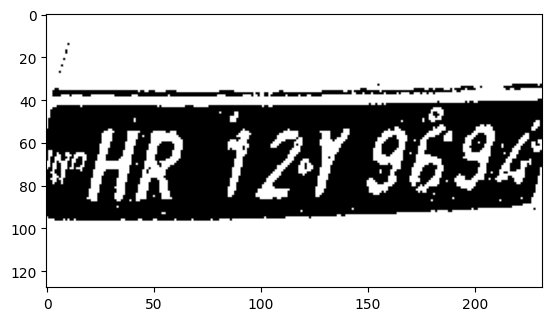

height =  961 width =  1099


[766.6565551757812, 701.9618530273438, 1003.4996948242188, 839.4435424804688, 0.9190869927406311, 0.0] track_id: 317.0
-0.3167000922875696


['FHR12Y9694']
license before check FHR12Y9694
hello
License Plate Number with contours :  None , Score :  None
-0.34639345219125584
['HR12Y9694']
license before check HR12Y9694
license after check HR12Y9694
License Plate Number :  HR12Y9694 , Score :  0.14476698157007378


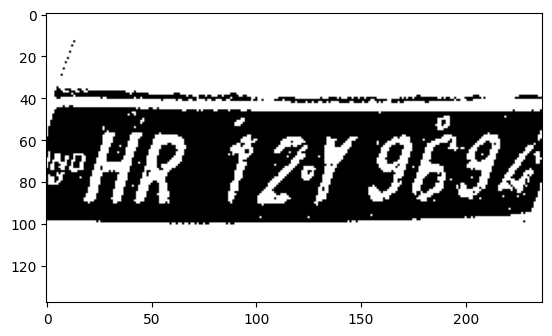

height =  1032 width =  1176


[852.9503784179688, 754.2528076171875, 1092.2030029296875, 906.5302124023438, 0.9139782786369324, 0.0] track_id: 317.0
-0.368817217712653


['FHR12y96941']
license before check FHR12y96941
hello
License Plate Number with contours :  None , Score :  None
-0.38344178942484003
['YHR129694']
license before check YHR129694
hello
License Plate Number :  None , Score :  None
height =  1104 width =  1258
[947.2771606445312, 792.1515502929688, 1185.194091796875, 978.8846435546875, 0.8909746408462524, 0.0] track_id: 317.0
-0.4533386958545628
height =  1189 width =  1346


[1048.778076171875, 835.4971923828125, 1288.4112548828125, 1058.160400390625, 0.3773269057273865, 0.0] track_id: 317.0
-0.5229002026642384


[]
License Plate Number with contours :  None , Score :  None
-0.49108497575320453
['HR12r9691']
license before check HR12r9691
license after check HR12R9691
License Plate Number :  HR12R9691 , Score :  0.24675854447662732


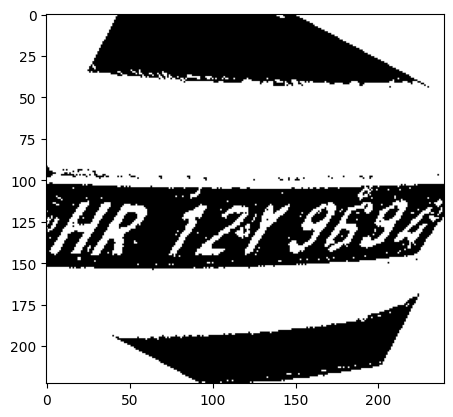

height =  1258 width =  1435
height =  1289 width =  1535
height =  1273 width =  1705
height =  1258 width =  1797
height =  1248 width =  1880
height =  1229 width =  1905
height =  1201 width =  1867
height =  1167 width =  1826
height =  1131 width =  1774
height =  1089 width =  1716
height =  1040 width =  1643
height =  983 width =  1561
height =  870 width =  1361
[637.9965209960938, 512.6176147460938, 730.7005615234375, 636.3563232421875, 0.7743997573852539, 0.0] track_id: 317.0
1.0651023158610793
height =  822 width =  1232
height =  745 width =  1095
height =  672 width =  925
height =  603 width =  705
height =  534 width =  487
height =  86 width =  93
height =  91 width =  96
[41.728546142578125, 58.57054138183594, 68.165771484375, 69.47665405273438, 0.297188937664032, 0.0] track_id: 325.0
0.07677189126977804
height =  99 width =  103
[47.060672760009766, 65.3458023071289, 74.37374877929688, 76.12208557128906, 0.5331851840019226, 0.0] track_id: 325.0
-0.17219081452293902


[59.808326721191406, 107.201171875, 100.36084747314453, 126.54088592529297, 0.35454055666923523, 0.0] track_id: 325.0
-0.22810262827994277


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
['Dd']
license before check Dd
hello
License Plate Number :  None , Score :  None
height =  171 width =  146
[59.31558609008789, 112.8122329711914, 101.50753784179688, 132.63768005371094, 0.43297114968299866, 0.0] track_id: 325.0
-0.23860932250820097
height =  176 width =  149
[60.87749481201172, 116.3480453491211, 104.47234344482422, 135.49960327148438, 0.252496600151062, 0.0] track_id: 325.0
-0.2148154004016586
height =  178 width =  154


[63.858245849609375, 115.00303649902344, 107.07926940917969, 136.5365753173828, 0.8194314241409302, 0.0] track_id: 325.0
-0.23210383807515567


[]
License Plate Number with contours :  None , Score :  None
-0.23860932250820097
['D']
license before check D
hello
License Plate Number :  None , Score :  None
height =  181 width =  158


[64.64152526855469, 117.7108154296875, 109.22232818603516, 138.379150390625, 0.8229587078094482, 0.0] track_id: 325.0
-0.2551823906208184


[]
License Plate Number with contours :  None , Score :  None
-0.23860932250820097
['Di']
license before check Di
hello
License Plate Number :  None , Score :  None
height =  183 width =  161
[66.25909423828125, 118.96012115478516, 111.37592315673828, 140.40505981445312, 0.8566955924034119, 0.0] track_id: 325.0
-0.22423475110909616
height =  191 width =  166


[69.75557708740234, 123.60077667236328, 116.64167022705078, 145.93922424316406, 0.8526070713996887, 0.0] track_id: 325.0
-0.21866894587394195


[]
License Plate Number with contours :  None , Score :  None
-0.21293834957939714
[]
License Plate Number :  None , Score :  None
height =  189 width =  169


[71.47858428955078, 121.21466827392578, 120.01189422607422, 144.79119873046875, 0.866246223449707, 0.0] track_id: 325.0
-0.21866894587394195


[]
License Plate Number with contours :  None , Score :  None
-0.2284966392918623
[]
License Plate Number :  None , Score :  None
height =  194 width =  172


[73.2990493774414, 125.43573760986328, 122.91230773925781, 147.98663330078125, 0.8177741765975952, 0.0] track_id: 325.0
-0.20749622643520266


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
[]
License Plate Number :  None , Score :  None
height =  202 width =  177


[76.50719451904297, 131.69595336914062, 127.19344329833984, 154.51531982421875, 0.6632013320922852, 0.0] track_id: 325.0
-0.24192056868440487


[]
License Plate Number with contours :  None , Score :  None
-0.2063238940297175
[]
License Plate Number :  None , Score :  None
height =  202 width =  180


[76.76874542236328, 130.6112823486328, 129.5364990234375, 154.97547912597656, 0.7098072171211243, 0.0] track_id: 325.0
-0.2099735128621634


[]
License Plate Number with contours :  None , Score :  None
-0.23374318086890142
[]
License Plate Number :  None , Score :  None
height =  207 width =  184
[79.05056762695312, 133.97824096679688, 131.687255859375, 158.5718536376953, 0.8472728729248047, 0.0] track_id: 325.0
-0.21866894587394195
height =  213 width =  189


[81.4748306274414, 140.30010986328125, 135.8873748779297, 163.30950927734375, 0.8041447401046753, 0.0] track_id: 325.0
-0.24497866312686414


['t']
license before check t
hello
License Plate Number with contours :  None , Score :  None
-0.21243202050874216
['ni']
license before check ni
hello
License Plate Number :  None , Score :  None
height =  218 width =  195


[83.42505645751953, 140.330078125, 139.66294860839844, 166.42929077148438, 0.8808878660202026, 0.0] track_id: 325.0
-0.22810262827994277


[]
License Plate Number with contours :  None , Score :  None
-0.22527677921405528
[]
License Plate Number :  None , Score :  None
height =  221 width =  199


[84.9469223022461, 143.30601501464844, 142.85528564453125, 169.53594970703125, 0.8624966740608215, 0.0] track_id: 325.0
-0.2213144423477913


['bhj']
license before check bhj
hello
License Plate Number with contours :  None , Score :  None
-0.22082876972934834
[]
License Plate Number :  None , Score :  None
height =  221 width =  202


[85.96573638916016, 144.24488830566406, 144.75582885742188, 170.7950439453125, 0.8750782608985901, 0.0] track_id: 325.0
-0.24497866312686414


['Dli']
license before check Dli
hello
License Plate Number with contours :  None , Score :  None
-0.19739555984988075
[]
License Plate Number :  None , Score :  None
height =  223 width =  208


[89.3302001953125, 142.32383728027344, 149.8464813232422, 170.67971801757812, 0.8842599391937256, 0.0] track_id: 325.0
-0.23602367862589738


['IXES']
license before check IXES
hello
License Plate Number with contours :  None , Score :  None
-0.22810262827994277
[]
License Plate Number :  None , Score :  None
height =  229 width =  214


[91.96266174316406, 149.39427185058594, 154.25955200195312, 176.3775177001953, 0.866756021976471, 0.0] track_id: 325.0
-0.23602367862589738


['ekt']
license before check ekt
hello
License Plate Number with contours :  None , Score :  None
-0.21655030497608926
[]
License Plate Number :  None , Score :  None
height =  236 width =  222


[97.6858901977539, 152.91909790039062, 161.21730041503906, 181.2550506591797, 0.8962689638137817, 0.0] track_id: 325.0
-0.21535769969773805


['0Zs']
license before check 0Zs
hello
License Plate Number with contours :  None , Score :  None
-0.2204937613666717
['NUAG']
license before check NUAG
hello
License Plate Number :  None , Score :  None
height =  242 width =  228


[100.94511413574219, 156.99270629882812, 166.53323364257812, 186.20957946777344, 0.8995709419250488, 0.0] track_id: 325.0
-0.24497866312686414


['ushi']
license before check ushi
hello
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
[]
License Plate Number :  None , Score :  None
height =  250 width =  237


[105.89694213867188, 162.0748291015625, 173.2887725830078, 192.04901123046875, 0.902866542339325, 0.0] track_id: 325.0
-0.22679884805388587


['370ESF']
license before check 370ESF
hello
License Plate Number with contours :  None , Score :  None
-0.20668321848424925
['Ica9a6s']
license before check Ica9a6s
hello
License Plate Number :  None , Score :  None
height =  257 width =  245


[110.92252349853516, 165.4173126220703, 180.71617126464844, 197.26998901367188, 0.9009997844696045, 0.0] track_id: 325.0
-0.2135604334804882


['0Yrrk6']
license before check 0Yrrk6
hello
License Plate Number with contours :  None , Score :  None
-0.2099735128621634
['Dz0tessf']
license before check Dz0tessf
hello
License Plate Number :  None , Score :  None
height =  262 width =  253


[114.76921844482422, 169.00833129882812, 185.88470458984375, 201.67453002929688, 0.8987112641334534, 0.0] track_id: 325.0
-0.2135604334804882


['JinR6']
license before check JinR6
hello
License Plate Number with contours :  None , Score :  None
-0.20401797959254858
['Ho7c436k5']
license before check Ho7c436k5
hello
License Plate Number :  None , Score :  None
height =  270 width =  261


[118.57970428466797, 174.3129425048828, 191.62669372558594, 207.87274169921875, 0.9001989960670471, 0.0] track_id: 325.0
-0.21264492235777152


['DJemJN5a']
license before check DJemJN5a
hello
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['EctIcnJess']
license before check EctIcnJess
hello
License Plate Number :  None , Score :  None
height =  279 width =  270


[123.90290832519531, 183.1106719970703, 199.40203857421875, 215.51194763183594, 0.8862987160682678, 0.0] track_id: 325.0
-0.20749622643520266


['47A8ESS']
license before check 47A8ESS
hello
License Plate Number with contours :  None , Score :  None
-0.20902294280626463
['OLIIXJ8GS']
license before check OLIIXJ8GS
license after check OLIIXJ8GS
License Plate Number :  OL1IX3865 , Score :  0.04193935322625727


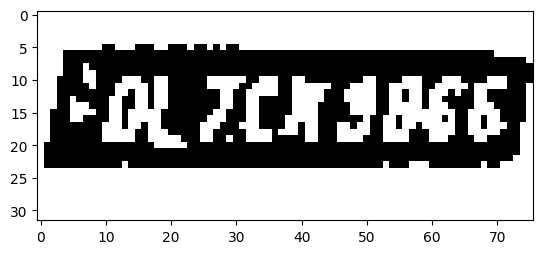

height =  288 width =  278


[128.42166137695312, 188.43638610839844, 206.35426330566406, 223.3222198486328, 0.9073147773742676, 0.0] track_id: 325.0
-0.21501488174750655


['07c09866']
license before check 07c09866
hello
License Plate Number with contours :  None , Score :  None
-0.1920480172407301
['Eol7ca9865']
license before check Eol7ca9865
license after check EOL7CA9865
License Plate Number :  EO47CA9865 , Score :  0.0756951132723752


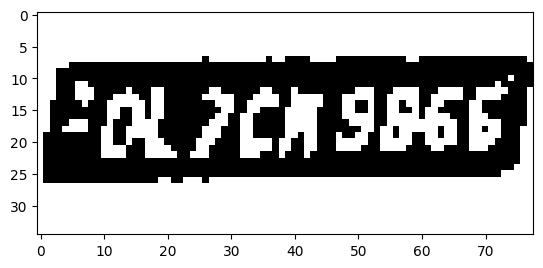

height =  295 width =  288


[133.27915954589844, 193.72181701660156, 214.59495544433594, 229.79998779296875, 0.898530125617981, 0.0] track_id: 325.0
-0.20687394897974307


['027Ca9666']
license before check 027Ca9666
hello
License Plate Number with contours :  None , Score :  None
-0.19164849668667716
['Eo7cn9866']
license before check Eo7cn9866
license after check EO7CN9866
License Plate Number :  EO7CN9866 , Score :  0.10243125107681421


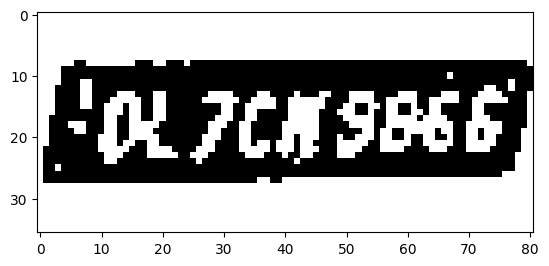

height =  304 width =  300


[140.3374786376953, 201.03443908691406, 224.00009155273438, 240.2442626953125, 0.9066057205200195, 0.0] track_id: 325.0
-0.21655030497608926


['DIcX9866']
license before check DIcX9866
hello
License Plate Number with contours :  None , Score :  None
-0.20539538918976738
['eo2C79866']
license before check eo2C79866
hello
License Plate Number :  None , Score :  None
height =  318 width =  313


[146.7006072998047, 209.79859924316406, 233.59707641601562, 250.3008270263672, 0.9080032706260681, 0.0] track_id: 325.0
-0.2216495629786776


['MZcH9866']
license before check MZcH9866
hello
License Plate Number with contours :  None , Score :  None
-0.18998828791871572
['0LZcK9856']
license before check 0LZcK9856
hello
License Plate Number :  None , Score :  None
height =  326 width =  324


[153.8069610595703, 218.98085021972656, 244.48460388183594, 259.2326965332031, 0.899770975112915, 0.0] track_id: 325.0
-0.19297080996556967


['DIcK9866']
license before check DIcK9866
hello
License Plate Number with contours :  None , Score :  None
-0.19270075866238556
['FoL7ch9866']
license before check FoL7ch9866
license after check FOL7CH9866
License Plate Number :  FO47CH9866 , Score :  0.01547169766163327


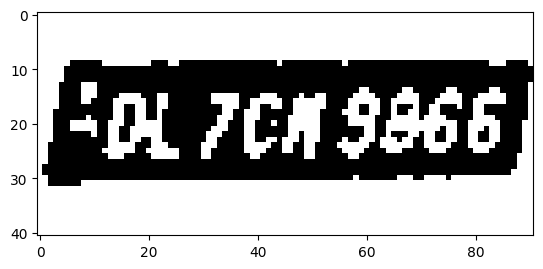

height =  335 width =  338


[162.97671508789062, 227.57464599609375, 256.1087646484375, 269.53704833984375, 0.9082110524177551, 0.0] track_id: 325.0
-0.19164849668667716


['OLZcn9866']
license before check OLZcn9866
hello
License Plate Number with contours :  None , Score :  None
-0.20442120537714656
['eol7Cn9056t']
license before check eol7Cn9056t
hello
License Plate Number :  None , Score :  None
height =  60 width =  68
height =  348 width =  354


[172.61473083496094, 238.15940856933594, 269.3754577636719, 281.5469970703125, 0.901344358921051, 0.0] track_id: 325.0
-0.1874291124436737


['DLZCM9866']
license before check DLZCM9866
hello
License Plate Number with contours :  None , Score :  None
-0.18873776752013358
['07c03866']
license before check 07c03866
hello
License Plate Number :  None , Score :  None
height =  62 width =  69
height =  364 width =  370


[182.98118591308594, 247.7585906982422, 283.19427490234375, 293.4607849121094, 0.9053726196289062, 0.0] track_id: 325.0
-0.20304521725346514


['0LZCN9866']
license before check 0LZCN9866
hello
License Plate Number with contours :  None , Score :  None
-0.18725391973348288
['EOL7cN9866']
license before check EOL7cN9866
license after check EOL7CN9866
License Plate Number :  EO47CN9866 , Score :  0.14272283926542226


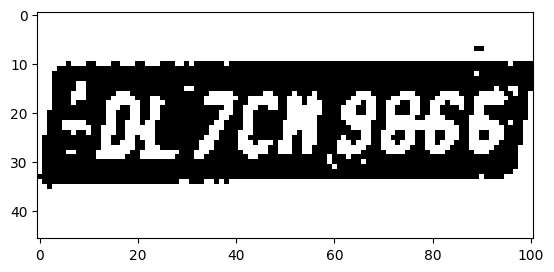

height =  66 width =  71
height =  380 width =  387


[193.28868103027344, 258.09222412109375, 298.4270935058594, 305.691650390625, 0.9057292342185974, 0.0] track_id: 325.0
-0.21447169874823943
['DL7c19866']
license before check DL7c19866
license after check DL7C19866
License Plate Number with contours :  DL7CI9866 , Score :  0.23831977012853478


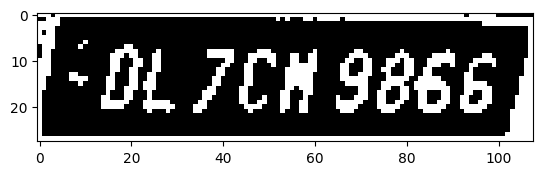

height =  66 width =  73
height =  394 width =  407


[206.56317138671875, 269.9432373046875, 315.3396911621094, 319.6693420410156, 0.9053594470024109, 0.0] track_id: 325.0
-0.17699022916334267


['DLZCN9866']
license before check DLZCN9866
hello
License Plate Number with contours :  None , Score :  None
-0.2104302033464736
['OL7CN9866']
license before check OL7CN9866
license after check OL7CN9866
License Plate Number :  OL7CN9866 , Score :  0.1855623351837518


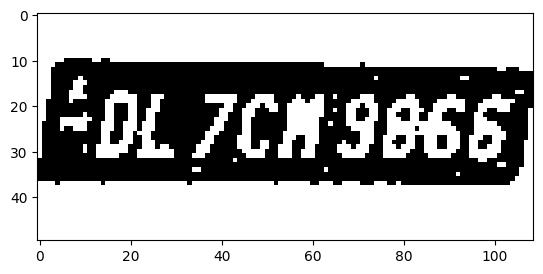

height =  66 width =  73
height =  411 width =  428


[220.439208984375, 280.5955505371094, 333.9389343261719, 331.4645690917969, 0.9057615399360657, 0.0] track_id: 325.0
-0.20401797959254858
['DL7CM9866']
license before check DL7CM9866
license after check DL7CM9866
License Plate Number with contours :  DL7CM9866 , Score :  0.34893759911284394


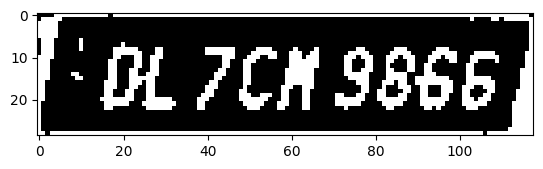

height =  69 width =  71
height =  427 width =  450


[234.3909912109375, 296.25885009765625, 354.42572021484375, 349.8040771484375, 0.9151508808135986, 0.0] track_id: 325.0
-0.1925016348099795


['DLZCN9866']
license before check DLZCN9866
hello
License Plate Number with contours :  None , Score :  None
-0.18998828791871572
['DL7cM9866']
license before check DL7cM9866
license after check DL7CM9866
License Plate Number :  DL7CM9866 , Score :  0.2946328865825599


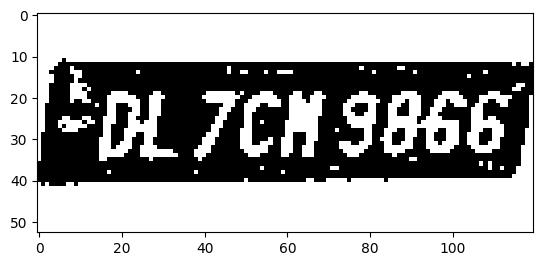

height =  68 width =  72
height =  449 width =  477


[253.94131469726562, 312.56219482421875, 378.76019287109375, 368.1449279785156, 0.9219803810119629, 0.0] track_id: 325.0
-0.2099735128621634
['DL7CH9866']
license before check DL7CH9866
license after check DL7CH9866
License Plate Number with contours :  DL7CH9866 , Score :  0.5788767209003906


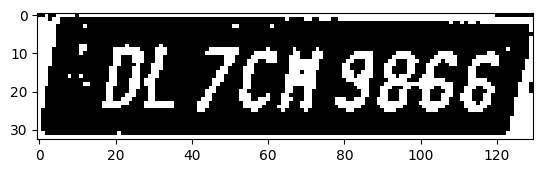

height =  68 width =  71
height =  472 width =  506


[273.42071533203125, 331.0317077636719, 404.1214904785156, 388.3780212402344, 0.9147650599479675, 0.0] track_id: 325.0
-0.1920480172407301


['DLZCN9866']
license before check DLZCN9866
hello
License Plate Number with contours :  None , Score :  None
-0.20278150417940963
['OL7CM3866']
license before check OL7CM3866
license after check OL7CM3866
License Plate Number :  OL7CM3866 , Score :  0.10298075731862767


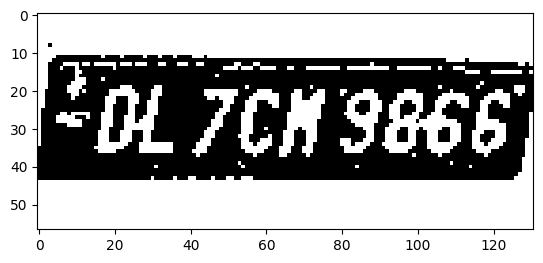

height =  69 width =  71
height =  498 width =  536


[296.5580749511719, 350.8374328613281, 433.8906555175781, 410.9933776855469, 0.9200696349143982, 0.0] track_id: 325.0
-0.18793957692205143


['OLZCX9866']
license before check OLZCX9866
hello
License Plate Number with contours :  None , Score :  None
-0.20668321848424925
['DL7CH9866']
license before check DL7CH9866
license after check DL7CH9866
License Plate Number :  DL7CH9866 , Score :  0.4857969554355794


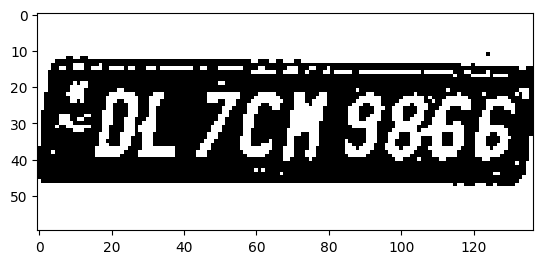

height =  71 width =  70
height =  526 width =  569


[321.0278015136719, 374.4920349121094, 465.0443115234375, 436.7703552246094, 0.9132681488990784, 0.0] track_id: 325.0
-0.20883089364403962


['DLZCH9866']
license before check DLZCH9866
hello
License Plate Number with contours :  None , Score :  None
-0.2063238940297175
['DLZCH9866']
license before check DLZCH9866
hello
License Plate Number :  None , Score :  None
height =  73 width =  74
height =  556 width =  611


[352.9620666503906, 396.1961975097656, 505.1360778808594, 462.6354064941406, 0.9188361167907715, 0.0] track_id: 325.0
-0.20539538918976738
['DL7CH9866']
license before check DL7CH9866
license after check DL7CH9866
License Plate Number with contours :  DL7CH9866 , Score :  0.878697251297164


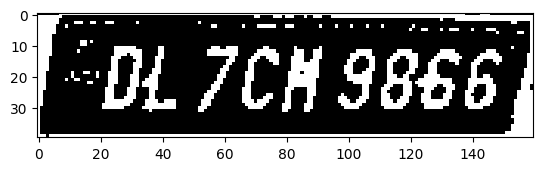

height =  74 width =  73
height =  589 width =  654


[386.8728332519531, 424.0119323730469, 547.8174438476562, 493.7260437011719, 0.9146275520324707, 0.0] track_id: 325.0
-0.1908311027212619


['DLZCH9866']
license before check DLZCH9866
hello
License Plate Number with contours :  None , Score :  None
-0.1920480172407301
['LTCH9866']
license before check LTCH9866
hello
License Plate Number :  None , Score :  None
height =  76 width =  76
height =  623 width =  699


[425.6793518066406, 450.4576721191406, 593.566162109375, 525.78564453125, 0.9125643372535706, 0.0] track_id: 325.0
-0.2077686317676094
['DL7cH9866']
license before check DL7cH9866
license after check DL7CH9866
License Plate Number with contours :  DL7CH9866 , Score :  0.605249034536998


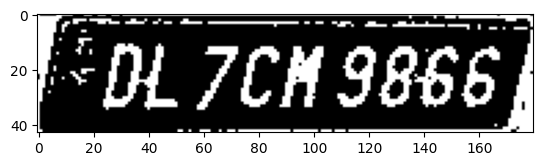

height =  74 width =  77
height =  665 width =  752


[469.6665954589844, 489.75982666015625, 647.6839599609375, 569.94384765625, 0.9162077903747559, 0.0] track_id: 325.0
-0.20464180982977792
['FDL7CH9866']
license before check FDL7CH9866
license after check FDL7CH9866
License Plate Number with contours :  FD47CH9866 , Score :  0.13677290683235518


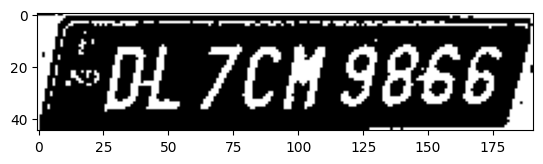

height =  74 width =  77
height =  713 width =  814


[525.1896362304688, 529.1488037109375, 713.1553955078125, 616.29638671875, 0.9275103807449341, 0.0] track_id: 325.0
-0.23075487137238676


['DLZcH9866']
license before check DLZcH9866
hello
License Plate Number with contours :  None , Score :  None
-0.2097711656370821
['DLZCH9866']
license before check DLZCH9866
hello
License Plate Number :  None , Score :  None
height =  74 width =  77
height =  772 width =  878


[590.02783203125, 579.9329223632812, 785.369140625, 671.8792114257812, 0.912722110748291, 0.0] track_id: 325.0
-0.22225530228522308
['DL7CH9856']
license before check DL7CH9856
license after check DL7CH9856
License Plate Number with contours :  DL7CH9856 , Score :  0.2173532240548142


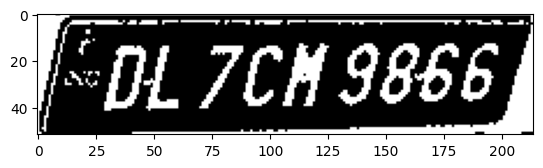

height =  75 width =  78
height =  834 width =  953


[665.35400390625, 633.923095703125, 866.4258422851562, 735.8663940429688, 0.920590877532959, 0.0] track_id: 325.0
-0.2809260482387086
['DL7CH9866']
license before check DL7CH9866
license after check DL7CH9866
License Plate Number with contours :  DL7CH9866 , Score :  0.38272681560296457


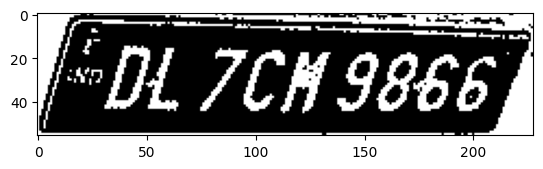

height =  78 width =  80
height =  901 width =  1036


[753.7474975585938, 689.3323974609375, 962.7124633789062, 805.0609741210938, 0.9201568365097046, 0.0] track_id: 325.0
-0.31022368742196094
['DL7CH9856']
license before check DL7CH9856
license after check DL7CH9856
License Plate Number with contours :  DL7CH9856 , Score :  0.5794924697220916


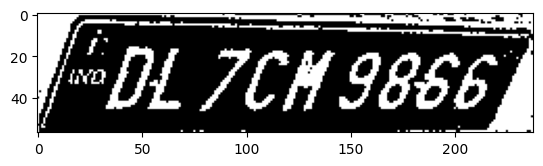

height =  81 width =  82
height =  975 width =  1130


[858.8602905273438, 760.017822265625, 1070.2406005859375, 883.8927612304688, 0.9167585968971252, 0.0] track_id: 325.0
-0.3643657288748097
['DL7CH9866']
license before check DL7CH9866
license after check DL7CH9866
License Plate Number with contours :  DL7CH9866 , Score :  0.5222240208376693


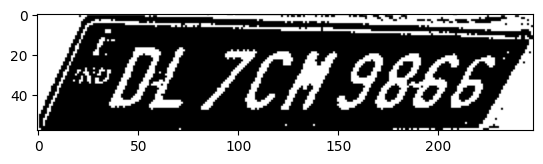

height =  81 width =  82
height =  1058 width =  1232
[972.0100708007812, 826.7838745117188, 1187.8450927734375, 973.2833251953125, 0.9167450666427612, 0.0] track_id: 325.0
-0.4020685300934589
height =  81 width =  82
height =  1155 width =  1335


[1099.6651611328125, 889.0606689453125, 1313.4395751953125, 1077.4686279296875, 0.8269376754760742, 0.0] track_id: 325.0
-0.48759512592301374


['2852']
license before check 2852
hello
License Plate Number with contours :  None , Score :  None
-0.5377575722189997
['EDL7CH9835']
license before check EDL7CH9835
license after check EDL7CH9835
License Plate Number :  ED47CH9835 , Score :  0.052242506592206396


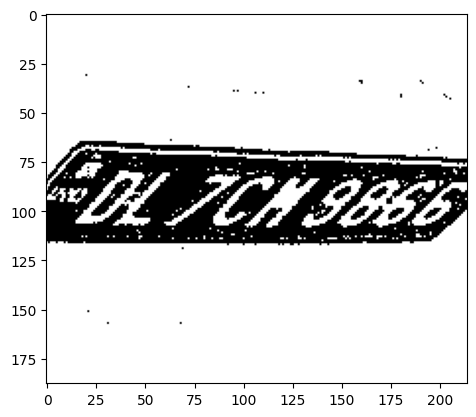

height =  81 width =  83
height =  1264 width =  1451
height =  80 width =  84
height =  1324 width =  1570
height =  82 width =  84
height =  1345 width =  1675
height =  84 width =  85
height =  1334 width =  1789
height =  86 width =  87
height =  1315 width =  1798
height =  87 width =  90
height =  1296 width =  1735
height =  86 width =  91
height =  1267 width =  1649
height =  85 width =  91
height =  1231 width =  1548
height =  87 width =  90
height =  1194 width =  1544
height =  88 width =  90
height =  1147 width =  1318
height =  88 width =  92
height =  88 width =  92
height =  1008 width =  888
height =  90 width =  93
height =  930 width =  631
height =  91 width =  94
height =  665 width =  344
height =  92 width =  95
height =  93 width =  95
height =  94 width =  98
height =  96 width =  98
height =  96 width =  99
height =  97 width =  100
height =  98 width =  102
height =  99 width =  107
height =  100 width =  107
height =  102 width =  106
height =  102 width =

[62.97111511230469, 89.36779022216797, 104.72698974609375, 110.13922882080078, 0.299825519323349, 0.0] track_id: 326.0
-0.2003985538258785


[]
License Plate Number with contours :  None , Score :  None
-0.23860932250820097
[]
License Plate Number :  None , Score :  None
height =  144 width =  146
height =  147 width =  149
height =  151 width =  149
[63.72330093383789, 93.47472381591797, 107.61143493652344, 115.32784271240234, 0.7843376994132996, 0.0] track_id: 326.0
-0.2401710078601731
height =  154 width =  152


[65.2269515991211, 96.88137817382812, 109.7575912475586, 117.6738510131836, 0.6182292699813843, 0.0] track_id: 326.0
-0.2171113147349052


[]
License Plate Number with contours :  None , Score :  None
-0.21608497229678642
['ndo']
license before check ndo
hello
License Plate Number :  None , Score :  None
height =  158 width =  157


[67.86974334716797, 99.34176635742188, 112.9498291015625, 120.99905395507812, 0.6451737284660339, 0.0] track_id: 326.0
-0.22679884805388587


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
[]
License Plate Number :  None , Score :  None
height =  161 width =  159
[68.37291717529297, 100.47574615478516, 114.67303466796875, 121.9167709350586, 0.6492696404457092, 0.0] track_id: 326.0
0.0425275346197842
height =  166 width =  164


[71.45436096191406, 101.36177825927734, 118.55232238769531, 124.34624481201172, 0.8610762357711792, 0.0] track_id: 326.0
-0.21336864215180798


[]
License Plate Number with contours :  None , Score :  None
-0.23374318086890142
['nod']
license before check nod
hello
License Plate Number :  None , Score :  None
height =  168 width =  165


[70.80366516113281, 101.96979522705078, 119.41238403320312, 126.59027099609375, 0.8564991354942322, 0.0] track_id: 326.0
-0.23374318086890142


[]
License Plate Number with contours :  None , Score :  None
-0.21608497229678642
['Jum']
license before check Jum
hello
License Plate Number :  None , Score :  None
height =  172 width =  166
[70.84934997558594, 105.7354736328125, 120.24321746826172, 129.85733032226562, 0.900856077671051, 0.0] track_id: 326.0
-0.2299044281319047
height =  175 width =  169
[72.6351089477539, 107.24436950683594, 122.39595794677734, 131.2655487060547, 0.9124320149421692, 0.0] track_id: 326.0
-0.22527677921405528
height =  180 width =  173
[74.4643325805664, 112.1317367553711, 125.73299407958984, 136.6085662841797, 0.895815372467041, 0.0] track_id: 326.0
-0.21018258666216955
height =  183 width =  178


[77.49253845214844, 115.01689147949219, 129.21560668945312, 139.07606506347656, 0.8715969324111938, 0.0] track_id: 326.0
-0.20749622643520266


[]
License Plate Number with contours :  None , Score :  None
-0.20539538918976738
['DSIYII']
license before check DSIYII
hello
License Plate Number :  None , Score :  None
height =  188 width =  181


[78.88678741455078, 118.0992202758789, 131.40574645996094, 142.75607299804688, 0.8880274891853333, 0.0] track_id: 326.0
-0.21293834957939714


[]
License Plate Number with contours :  None , Score :  None
-0.20963984587421253
['StyuIX']
license before check StyuIX
hello
License Plate Number :  None , Score :  None
height =  192 width =  184


[80.21366119384766, 120.79144287109375, 133.9766387939453, 145.5431671142578, 0.8754907250404358, 0.0] track_id: 326.0
-0.21018258666216955


[]
License Plate Number with contours :  None , Score :  None
-0.2063238940297175
['VWQUI']
license before check VWQUI
hello
License Plate Number :  None , Score :  None
height =  197 width =  189


[82.14193725585938, 123.65198516845703, 137.6346435546875, 148.96446228027344, 0.8831830024719238, 0.0] track_id: 326.0
-0.20487671703710847


[]
License Plate Number with contours :  None , Score :  None
-0.2299044281319047
['774510JI44']
license before check 774510JI44
hello
License Plate Number :  None , Score :  None
height =  199 width =  193


[83.29537963867188, 124.44628143310547, 139.9795684814453, 150.3487548828125, 0.8562731742858887, 0.0] track_id: 326.0
-0.23109066719589708


[]
License Plate Number with contours :  None , Score :  None
-0.23109066719589708
['1UJITE']
license before check 1UJITE
hello
License Plate Number :  None , Score :  None
height =  204 width =  200


[87.11164855957031, 126.73114013671875, 145.5828857421875, 153.72726440429688, 0.8918166160583496, 0.0] track_id: 326.0
-0.20902294280626463


[]
License Plate Number with contours :  None , Score :  None
-0.22266094063636496
['Ujinivo']
license before check Ujinivo
hello
License Plate Number :  None , Score :  None
height =  208 width =  203


[88.85687255859375, 129.97299194335938, 148.40769958496094, 156.95909118652344, 0.8916214108467102, 0.0] track_id: 326.0
-0.20202515640359237


[]
License Plate Number with contours :  None , Score :  None
-0.21655030497608926
[]
License Plate Number :  None , Score :  None
height =  211 width =  208


[90.9794692993164, 133.43295288085938, 151.87124633789062, 159.86288452148438, 0.8900086879730225, 0.0] track_id: 326.0
-0.21293834957939714


['']
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
[]
License Plate Number :  None , Score :  None
height =  215 width =  212


[92.95286560058594, 136.4860382080078, 155.3333282470703, 163.23825073242188, 0.8825865387916565, 0.0] track_id: 326.0
-0.21264492235777152


[]
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
[]
License Plate Number :  None , Score :  None
height =  221 width =  217


[94.34292602539062, 140.81642150878906, 158.3873291015625, 169.0061492919922, 0.8993338942527771, 0.0] track_id: 326.0
-0.21182754748141747


['7o8']
license before check 7o8
hello
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
[]
License Plate Number :  None , Score :  None
height =  227 width =  224


[96.87456512451172, 144.8158416748047, 162.72079467773438, 174.11253356933594, 0.8996080756187439, 0.0] track_id: 326.0
-0.2175541191340084


[]
License Plate Number with contours :  None , Score :  None
-0.20349304525756276
[]
License Plate Number :  None , Score :  None
height =  235 width =  231


[99.32034301757812, 149.6978759765625, 166.7534942626953, 179.7340545654297, 0.9003429412841797, 0.0] track_id: 326.0
-0.20963984587421253


['KJA']
license before check KJA
hello
License Plate Number with contours :  None , Score :  None
-0.225601243836024
[]
License Plate Number :  None , Score :  None
height =  237 width =  235


[101.94001770019531, 151.90380859375, 171.05772399902344, 182.5344696044922, 0.9098306894302368, 0.0] track_id: 326.0
-0.20442120537714656


['XIb']
license before check XIb
hello
License Plate Number with contours :  None , Score :  None
-0.2099735128621634
['E43z']
license before check E43z
hello
License Plate Number :  None , Score :  None
height =  244 width =  241


[106.8791732788086, 156.76043701171875, 177.45877075195312, 188.45999145507812, 0.9046644568443298, 0.0] track_id: 326.0
-0.2204937613666717


['Lfisi29']
license before check Lfisi29
hello
License Plate Number with contours :  None , Score :  None
-0.20668321848424925
['851S10jEG8']
license before check 851S10jEG8
hello
License Plate Number :  None , Score :  None
height =  251 width =  249


[110.05725860595703, 161.81869506835938, 183.22865295410156, 193.66539001464844, 0.8990827798843384, 0.0] track_id: 326.0
-0.21366898753998365


['FESInjEN']
license before check FESInjEN
hello
License Plate Number with contours :  None , Score :  None
-0.20304521725346514
['EupSiJE88']
license before check EupSiJE88
hello
License Plate Number :  None , Score :  None
height =  260 width =  256


[113.57360076904297, 166.5449676513672, 188.73228454589844, 199.62701416015625, 0.9090666770935059, 0.0] track_id: 326.0
-0.20982831175965547


['EWs3eav']
license before check EWs3eav
hello
License Plate Number with contours :  None , Score :  None
-0.20304521725346514
['PuP15J0JLBB']
license before check PuP15J0JLBB
hello
License Plate Number :  None , Score :  None
height =  267 width =  261


[116.857177734375, 170.85025024414062, 194.56495666503906, 205.13352966308594, 0.9153769016265869, 0.0] track_id: 326.0
-0.21173149522928755


['Vf15rjesr']
license before check Vf15rjesr
hello
License Plate Number with contours :  None , Score :  None
-0.21293834957939714
['p15171288']
license before check p15171288
hello
License Plate Number :  None , Score :  None
height =  274 width =  269


[120.68647003173828, 176.80006408691406, 200.5426483154297, 212.0139617919922, 0.9110278487205505, 0.0] track_id: 326.0
-0.20431586460012127


['Uf154n3e6e']
license before check Uf154n3e6e
hello
License Plate Number with contours :  None , Score :  None
-0.20265866914747613
['Fup05402288']
license before check Fup05402288
hello
License Plate Number :  None , Score :  None
height =  282 width =  281


[127.30039978027344, 183.23243713378906, 209.4180145263672, 219.19151306152344, 0.9063566327095032, 0.0] track_id: 326.0
-0.22390450013034954


['Uf1S40jca8']
license before check Uf1S40jca8
hello
License Plate Number with contours :  None , Score :  None
-0.21293834957939714
['UP154H3L88']
license before check UP154H3L88
license after check UP154H3L88
License Plate Number :  UP15AH3488 , Score :  0.07064024911681198


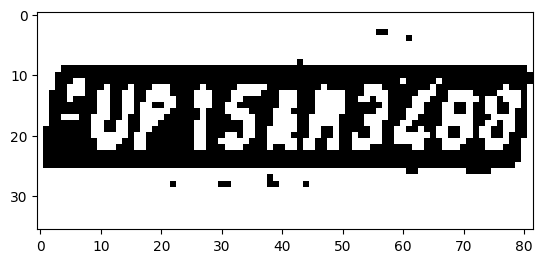

height =  289 width =  287


[130.9795684814453, 189.7119598388672, 215.07415771484375, 226.7411651611328, 0.8939659595489502, 0.0] track_id: 326.0
-0.21293834957939714
['Ufis1n3Ls8']
license before check Ufis1n3Ls8
license after check UFIS1N3LS8
License Plate Number with contours :  UF1SIN3458 , Score :  0.09819536807758568


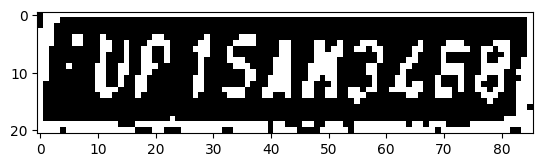

height =  297 width =  295


[134.87478637695312, 195.11276245117188, 222.26513671875, 232.82260131835938, 0.8955209255218506, 0.0] track_id: 326.0
-0.22679884805388587


['VP1541n34881']
license before check VP1541n34881
hello
License Plate Number with contours :  None , Score :  None
-0.19448011621510564
['Pup15443288']
license before check Pup15443288
hello
License Plate Number :  None , Score :  None
height =  305 width =  304


[139.8819580078125, 200.95664978027344, 229.50318908691406, 240.06979370117188, 0.8964643478393555, 0.0] track_id: 326.0
-0.24264766501773763
['UP154n3288']
license before check UP154n3288
license after check UP154N3288
License Plate Number with contours :  UP15AN3288 , Score :  0.44630507307920364


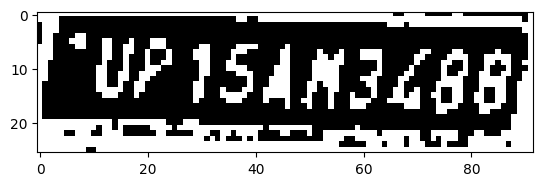

height =  312 width =  315


[144.3554229736328, 207.04644775390625, 236.58331298828125, 247.390380859375, 0.908738911151886, 0.0] track_id: 326.0
-0.2063238940297175
['UP1540L88']
license before check UP1540L88
license after check UP1540L88
License Plate Number with contours :  UP15A0488 , Score :  0.31556437376520446


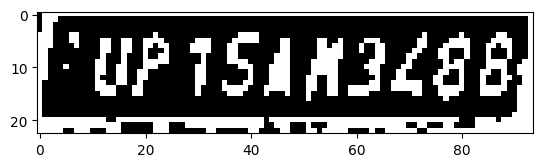

height =  323 width =  327


[151.31727600097656, 214.22775268554688, 246.13487243652344, 256.022705078125, 0.9128643274307251, 0.0] track_id: 326.0
-0.2058341781041252


['Vptsanjk88']
license before check Vptsanjk88
hello
License Plate Number with contours :  None , Score :  None
-0.20401797959254858
['evp154n328B']
license before check evp154n328B
hello
License Plate Number :  None , Score :  None
height =  332 width =  339


[158.97779846191406, 222.2272186279297, 256.904541015625, 264.713623046875, 0.9066823720932007, 0.0] track_id: 326.0
-0.2080561367910258


['UPtSkn36881']
license before check UPtSkn36881
hello
License Plate Number with contours :  None , Score :  None
-0.20365852597754822
['ISan3LB8', 'PVP']
license before check ISan3LB8PVP
hello
License Plate Number :  None , Score :  None
height =  342 width =  353


[166.92532348632812, 229.61981201171875, 268.2017517089844, 274.09124755859375, 0.9205870032310486, 0.0] track_id: 326.0
-0.20902294280626463
['Up5khJL881']
license before check Up5khJL881
license after check UP5KHJL881
License Plate Number with contours :  UP5KHJ4881 , Score :  0.14348470650792305


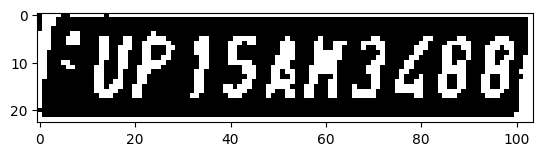

height =  353 width =  366


[175.0132598876953, 239.4381866455078, 280.68572998046875, 285.66033935546875, 0.9207203984260559, 0.0] track_id: 326.0
-0.206992194219821


['UP15an3Le8']
license before check UP15an3Le8
hello
License Plate Number with contours :  None , Score :  None
-0.20333608402827574
['FUP15403488']
license before check FUP15403488
hello
License Plate Number :  None , Score :  None
height =  367 width =  381


[183.91529846191406, 249.0830841064453, 293.8800354003906, 297.09344482421875, 0.9165944457054138, 0.0] track_id: 326.0
-0.20304521725346514


['UPIsamJlbb']
license before check UPIsamJlbb
hello
License Plate Number with contours :  None , Score :  None
-0.20112688581653948
['PUP15ANJL88']
license before check PUP15ANJL88
hello
License Plate Number :  None , Score :  None
height =  384 width =  398


[194.38011169433594, 262.16650390625, 309.5829162597656, 312.27166748046875, 0.9073710441589355, 0.0] track_id: 326.0
-0.215880849009154


['UPI5an3L88R']
license before check UPI5an3L88R
hello
License Plate Number with contours :  None , Score :  None
-0.20653607310567618
['Pup1SAn3Z88']
license before check Pup1SAn3Z88
hello
License Plate Number :  None , Score :  None
height =  398 width =  418


[208.68861389160156, 272.0418395996094, 327.1039733886719, 324.3233947753906, 0.9164813756942749, 0.0] track_id: 326.0
-0.20783904438543416
['UP15an3L88']
license before check UP15an3L88
license after check UP15AN3L88
License Plate Number with contours :  UP15AN3488 , Score :  0.1269281970368144


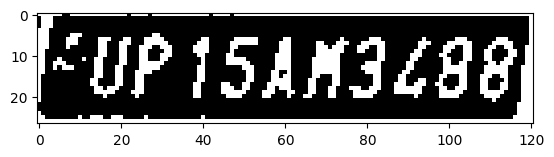

height =  410 width =  437


[221.33642578125, 285.4537658691406, 343.8891906738281, 338.7408142089844, 0.9205314517021179, 0.0] track_id: 326.0
-0.19118445959701444


['UPI5am3L981']
license before check UPI5am3L981
hello
License Plate Number with contours :  None , Score :  None
-0.1925016348099795
['UP15aN3488']
license before check UP15aN3488
license after check UP15AN3488
License Plate Number :  UP15AN3488 , Score :  0.2868590490785324


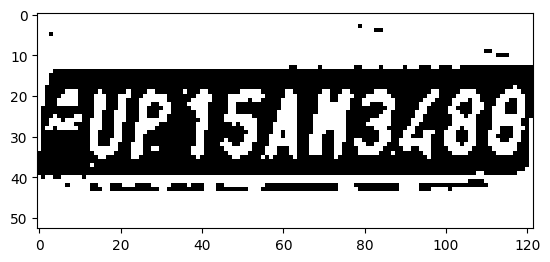

height =  429 width =  460


[236.55551147460938, 298.9840393066406, 364.8355407714844, 355.453369140625, 0.9111927151679993, 0.0] track_id: 326.0
-0.1925016348099795


['Pup15aH3L88']
license before check Pup15aH3L88
hello
License Plate Number with contours :  None , Score :  None
-0.19739555984988075
['FUP154513288']
license before check FUP154513288
hello
License Plate Number :  None , Score :  None
height =  448 width =  484


[254.44683837890625, 312.2004089355469, 389.13836669921875, 371.5479431152344, 0.90517258644104, 0.0] track_id: 326.0
-0.20599133667583147
['UP154h3488']
license before check UP154h3488
license after check UP154H3488
License Plate Number with contours :  UP15AH3488 , Score :  0.23678581447312125


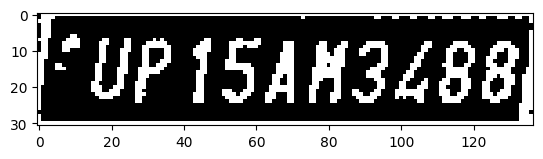

height =  472 width =  512


[274.91400146484375, 330.7117919921875, 415.4796447753906, 392.2101745605469, 0.9056536555290222, 0.0] track_id: 326.0
-0.1946855393839499
['UP15ah3L88']
license before check UP15ah3L88
license after check UP15AH3L88
License Plate Number with contours :  UP15AH3488 , Score :  0.2990688640898305


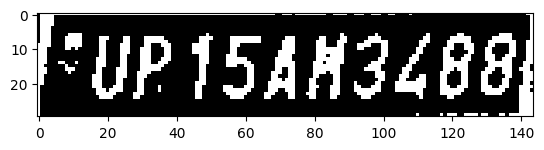

height =  493 width =  541


[293.8576965332031, 346.35784912109375, 441.5485534667969, 411.0070495605469, 0.9125407934188843, 0.0] track_id: 326.0
-0.20749622643520266
['UP15an3488']
license before check UP15an3488
license after check UP15AN3488
License Plate Number with contours :  UP15AN3488 , Score :  0.26025247064122325


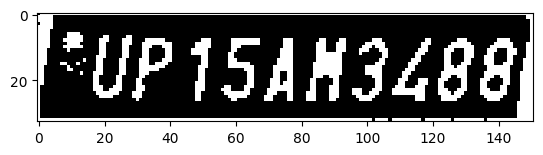

height =  519 width =  573


[317.13336181640625, 365.7335205078125, 471.52813720703125, 433.4431457519531, 0.9139653444290161, 0.0] track_id: 326.0
-0.18784171041228362


['FUP154m3L88']
license before check FUP154m3L88
hello
License Plate Number with contours :  None , Score :  None
-0.20539538918976738
['UP15am3L88']
license before check UP15am3L88
license after check UP15AM3L88
License Plate Number :  UP15AM3488 , Score :  0.14609298903266638


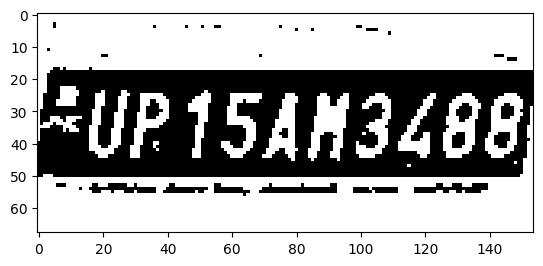

height =  547 width =  608


[344.1656188964844, 386.0748291015625, 504.7291259765625, 457.4687194824219, 0.9103032350540161, 0.0] track_id: 326.0
-0.19021864958245938
['Up15ah3L88']
license before check Up15ah3L88
license after check UP15AH3L88
License Plate Number with contours :  UP15AH3488 , Score :  0.3512323177155813


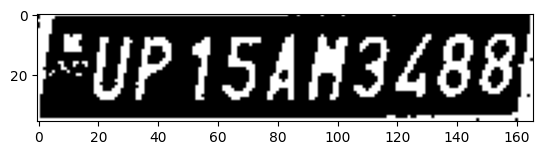

height =  575 width =  645


[376.4551086425781, 408.377197265625, 545.670166015625, 483.931884765625, 0.9160646200180054, 0.0] track_id: 326.0
-0.20607213169868224
['UP15AN3L88']
license before check UP15AN3L88
license after check UP15AN3L88
License Plate Number with contours :  UP15AN3488 , Score :  0.5342042867191641


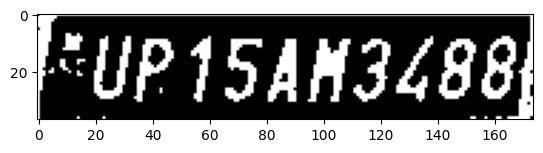

height =  609 width =  687


[409.7694396972656, 439.395751953125, 588.7864990234375, 519.4207153320312, 0.9144573211669922, 0.0] track_id: 326.0
-0.20693927856742042
['UP15an3L88']
license before check UP15an3L88
license after check UP15AN3L88
License Plate Number with contours :  UP15AN3488 , Score :  0.434261897980879


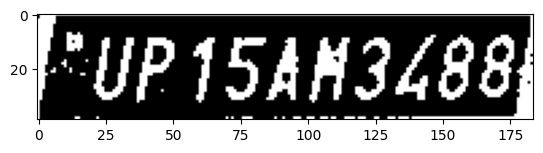

height =  645 width =  732


[448.9881896972656, 470.0714111328125, 635.7119750976562, 552.7447509765625, 0.9145245552062988, 0.0] track_id: 326.0
-0.20856260832903706
['UP15am3L88']
license before check UP15am3L88
license after check UP15AM3L88
License Plate Number with contours :  UP15AM3488 , Score :  0.43645841837125887


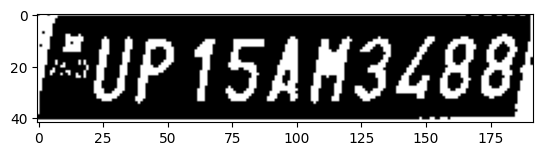

height =  685 width =  784


[493.1211853027344, 502.7099609375, 688.9063110351562, 591.1272583007812, 0.9105079174041748, 0.0] track_id: 326.0
-0.22457333244032607


['UP15aH3L885']
license before check UP15aH3L885
hello
License Plate Number with contours :  None , Score :  None
-0.23109066719589708
['UP15an3488']
license before check UP15an3488
license after check UP15AN3488
License Plate Number :  UP15AN3488 , Score :  0.6950985342224575


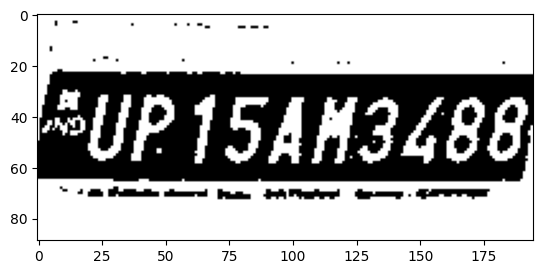

height =  730 width =  839


[546.1895751953125, 541.3269653320312, 747.265869140625, 636.1822509765625, 0.913720965385437, 0.0] track_id: 326.0
-0.24250035345484544


['eUP15aH3488']
license before check eUP15aH3488
hello
License Plate Number with contours :  None , Score :  None
-0.25168997175818675
['MUP15an3488']
license before check MUP15an3488
hello
License Plate Number :  None , Score :  None
height =  773 width =  904


[608.2521362304688, 578.2340698242188, 818.74462890625, 679.2398071289062, 0.9175175428390503, 0.0] track_id: 326.0
-0.24497866312686414


['FUP15am34881']
license before check FUP15am34881
hello
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
['UP15AH3488']
license before check UP15AH3488
license after check UP15AH3488
License Plate Number :  UP15AH3488 , Score :  0.18262518496298766


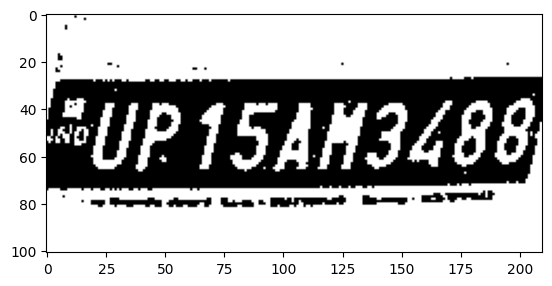

height =  828 width =  972


[675.50146484375, 624.2543334960938, 891.9884033203125, 732.9938354492188, 0.9111183881759644, 0.0] track_id: 326.0
-0.2770875383866211
['UP15AN3488']
license before check UP15AN3488
license after check UP15AN3488
License Plate Number with contours :  UP15AN3488 , Score :  0.3417245901731052


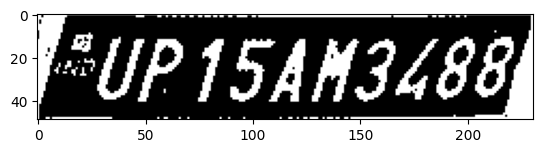

height =  891 width =  1043


[752.2984008789062, 634.978515625, 977.3655395507812, 799.85546875, 0.9218640327453613, 0.0] track_id: 326.0
-0.3186545890560927


['eUP154034881']
license before check eUP154034881
hello
License Plate Number with contours :  None , Score :  None
-0.2975042369540233
['UP154n34881']
license before check UP154n34881
hello
License Plate Number :  None , Score :  None
height =  962 width =  1120


[835.6929321289062, 702.0299682617188, 1057.7733154296875, 865.68505859375, 0.9078214764595032, 0.0] track_id: 326.0
-0.3805063771123649


['FUP15413488']
license before check FUP15413488
hello
License Plate Number with contours :  None , Score :  None
-0.36639441074924034
['UP15413488']
license before check UP15413488
license after check UP15413488
License Plate Number :  UP15AI3488 , Score :  0.3512426480856369


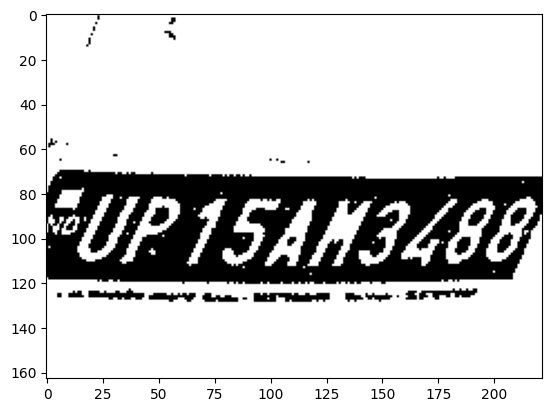

height =  1035 width =  1205


[932.2261352539062, 768.1500244140625, 1154.3260498046875, 938.4845581054688, 0.8355678915977478, 0.0] track_id: 326.0
-0.4015805401088795


['Fup154M34881']
license before check Fup154M34881
hello
License Plate Number with contours :  None , Score :  None
-0.4162692978569417
['15483488', 'UP']
license before check 15483488UP
hello
License Plate Number :  None , Score :  None
height =  1117 width =  1285


[1029.3399658203125, 816.3120727539062, 1247.6243896484375, 1016.265869140625, 0.647860586643219, 0.0] track_id: 326.0
-0.4729066036629292


['']
License Plate Number with contours :  None , Score :  None
-0.47161556786232767
['UP15A13488']
license before check UP15A13488
license after check UP15A13488
License Plate Number :  UP15AI3488 , Score :  0.27498374679806153


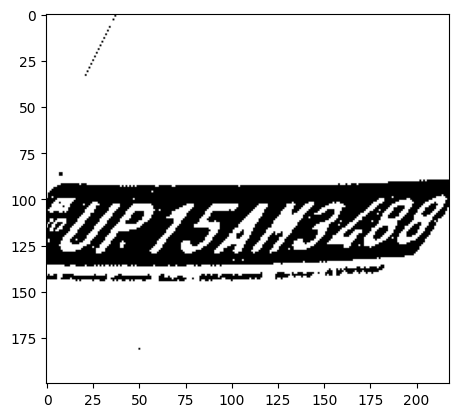

height =  1204 width =  1372
height =  1269 width =  1456
height =  1297 width =  1537
height =  1286 width =  1615
height =  1272 width =  1689
height =  1255 width =  1719
height =  1235 width =  1666
height =  1208 width =  1597
height =  1176 width =  1520
height =  1141 width =  1434
height =  1116 width =  1333
height =  1057 width =  1221
height =  1002 width =  1096
height =  944 width =  961
height =  882 width =  811
height =  812 width =  624
height =  104 width =  108
height =  103 width =  110
height =  107 width =  113
height =  108 width =  119
height =  117 width =  120
height =  120 width =  122
height =  122 width =  123
height =  124 width =  126
height =  128 width =  128
height =  132 width =  136
height =  136 width =  138
height =  141 width =  137
height =  144 width =  142
height =  144 width =  144
height =  146 width =  147
height =  150 width =  153
height =  152 width =  155
height =  156 width =  159
height =  159 width =  166
height =  165 width =  176
he

[101.61605834960938, 131.15292358398438, 154.39744567871094, 154.9544219970703, 0.5507473349571228, 0.0] track_id: 330.0
-0.24233316665301483


[]
License Plate Number with contours :  None , Score :  None
-0.21655030497608926
[]
License Plate Number :  None , Score :  None
height =  206 width =  218
[107.05506896972656, 137.03147888183594, 162.1324005126953, 162.46971130371094, 0.6276226043701172, 0.0] track_id: 330.0
-0.20687394897974307
height =  202 width =  224
[109.74065399169922, 142.26280212402344, 167.74220275878906, 167.4978790283203, 0.8425645232200623, 0.0] track_id: 330.0
-0.23554498072086333
height =  210 width =  232
[112.99244689941406, 146.32972717285156, 173.44850158691406, 173.28640747070312, 0.8299295902252197, 0.0] track_id: 330.0
-0.20749622643520266
height =  223 width =  242
[117.7932357788086, 153.8373565673828, 180.5124969482422, 180.7222137451172, 0.8939903378486633, 0.0] track_id: 330.0
-0.23783592745745075
height =  227 width =  244
[116.18745422363281, 154.9029998779297, 181.51361083984375, 182.52264404296875, 0.8978421092033386, 0.0] track_id: 330.0
-0.23811378241001133
height =  235 width =  254

[155.20115661621094, 202.06297302246094, 239.28819274902344, 237.7341766357422, 0.9083231687545776, 0.0] track_id: 330.0
-0.22208190190548016
['UF15050227']
license before check UF15050227
license after check UF15050227
License Plate Number with contours :  UF15OS0227 , Score :  0.33604782604138866


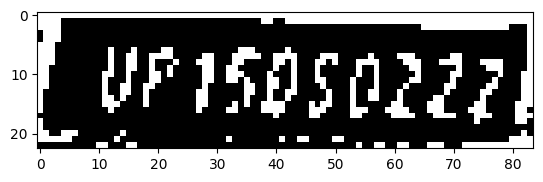

height =  293 width =  334


[162.079833984375, 211.38851928710938, 249.67762756347656, 248.43482971191406, 0.9112735986709595, 0.0] track_id: 330.0
-0.18998828791871572
['UF150s0222']
license before check UF150s0222
license after check UF150S0222
License Plate Number with contours :  UF15OS0222 , Score :  0.5231121543824853


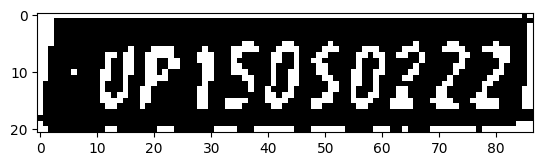

height =  311 width =  350


[172.7788543701172, 221.8850860595703, 264.18890380859375, 261.26361083984375, 0.9116922616958618, 0.0] track_id: 330.0
-0.1869792699189111


['WP150502Z2']
license before check WP150502Z2
hello
License Plate Number with contours :  None , Score :  None
-0.1746721990082397
['FUP15050zZ2']
license before check FUP15050zZ2
hello
License Plate Number :  None , Score :  None
height =  339 width =  367


[183.7483673095703, 234.34219360351562, 281.2786560058594, 275.2646179199219, 0.9132997393608093, 0.0] track_id: 330.0
-0.21008881321908357


['UP150502225']
license before check UP150502225
hello
License Plate Number with contours :  None , Score :  None
-0.19982864507299022
['FUP15050222']
license before check FUP15050222
hello
License Plate Number :  None , Score :  None
height =  370 width =  388


[195.87832641601562, 248.93348693847656, 298.39044189453125, 292.08221435546875, 0.9124012589454651, 0.0] track_id: 330.0
-0.17367119834157382
['UP150S0222']
license before check UP150S0222
license after check UP150S0222
License Plate Number with contours :  UP15OS0222 , Score :  0.44352779778706963


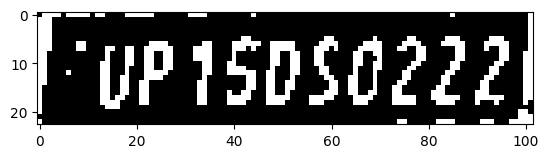

height =  392 width =  409


[208.49359130859375, 264.4411315917969, 316.69140625, 310.7162170410156, 0.9119173288345337, 0.0] track_id: 330.0
-0.20707267711703156
['UF15050222']
license before check UF15050222
license after check UF15050222
License Plate Number with contours :  UF15OS0222 , Score :  0.8607137728750544


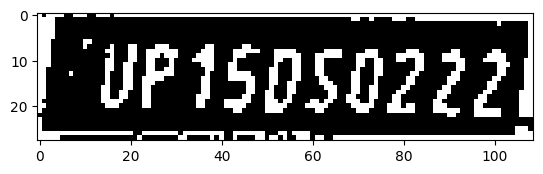

height =  415 width =  435
[222.72157287597656, 280.2863464355469, 337.243408203125, 330.47412109375, 0.9083833694458008, 0.0] track_id: 330.0
-0.20749622643520266
height =  441 width =  464


[241.46664428710938, 299.6967468261719, 362.8941650390625, 351.92254638671875, 0.9168334603309631, 0.0] track_id: 330.0
-0.18852380275626374
['UP15050222']
license before check UP15050222
license after check UP15050222
License Plate Number with contours :  UP15OS0222 , Score :  0.6970926155299279


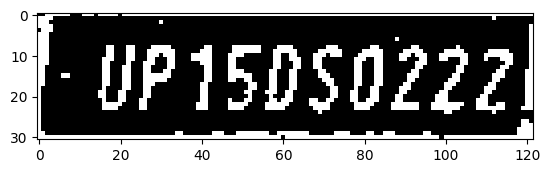

height =  468 width =  496


[264.052978515625, 319.0374755859375, 392.109619140625, 376.0330810546875, 0.9179962277412415, 0.0] track_id: 330.0
-0.19566245933205176


['UP15050222L']
license before check UP15050222L
hello
License Plate Number with contours :  None , Score :  None
-0.1863375587770487
['UP150S022Z']
license before check UP150S022Z
hello
License Plate Number :  None , Score :  None
height =  498 width =  530
[286.9403076171875, 341.0399169921875, 423.7287292480469, 401.87017822265625, 0.9073981046676636, 0.0] track_id: 330.0
-0.17189773129569183
height =  530 width =  575
[317.41595458984375, 367.5191955566406, 463.2588195800781, 434.4198913574219, 0.9156456589698792, 0.0] track_id: 330.0
-0.1750200250811692
height =  566 width =  625
[354.89794921875, 399.75689697265625, 510.8928527832031, 470.02301025390625, 0.9114010334014893, 0.0] track_id: 330.0
-0.19118445959701444
height =  612 width =  682
[400.11474609375, 435.6589660644531, 567.9369506835938, 514.1958618164062, 0.9188784956932068, 0.0] track_id: 330.0
-0.19739555984988075
height =  663 width =  750
[454.3621826171875, 480.4453430175781, 634.435546875, 565.40185546875, 0.91384

[521.269775390625, 535.0545654296875, 716.1583251953125, 628.2180786132812, 0.9149793982505798, 0.0] track_id: 330.0
-0.21072810314402643


[]
License Plate Number with contours :  None , Score :  None
-0.2082059495239874
['UP15DS0222']
license before check UP15DS0222
license after check UP15DS0222
License Plate Number :  UP15DS0222 , Score :  0.39160748380240484


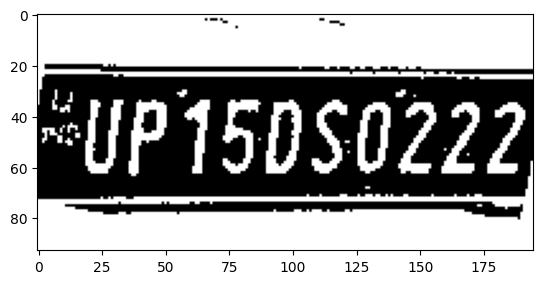

height =  796 width =  919


[606.923828125, 599.3367309570312, 817.337646484375, 702.4476318359375, 0.9209997057914734, 0.0] track_id: 330.0
-0.24358590636724095


[]
License Plate Number with contours :  None , Score :  None
-0.20578306119980944
['UP15DSO222']
license before check UP15DSO222
license after check UP15DSO222
License Plate Number :  UP15DS0222 , Score :  0.4663156009454092


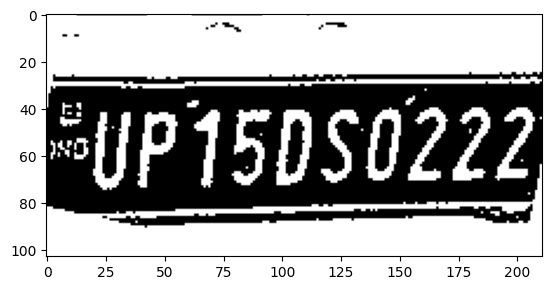

height =  878 width =  1020


[713.552001953125, 677.3101806640625, 936.983642578125, 797.5691528320312, 0.9188443422317505, 0.0] track_id: 330.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.2093853929534955
['UP15050222']
license before check UP15050222
license after check UP15050222
License Plate Number :  UP15OS0222 , Score :  0.8954934661448721


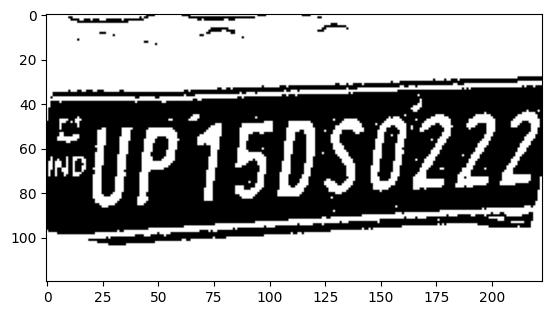

height =  975 width =  1141


[847.719970703125, 774.2996215820312, 1079.9278564453125, 912.6838989257812, 0.9047643542289734, 0.0] track_id: 330.0
-0.3324263053840973


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.33205946754288546
['UP150S0222']
license before check UP150S0222
license after check UP150S0222
License Plate Number :  UP15OS0222 , Score :  0.6230320799790903


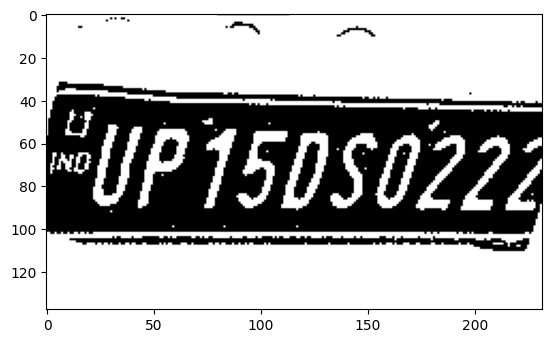

height =  1101 width =  1284


[1021.3506469726562, 848.0794677734375, 1254.21337890625, 1049.65966796875, 0.9022319316864014, 0.0] track_id: 330.0
-0.4015344847503711


['iid1Encn922']
license before check iid1Encn922
hello
License Plate Number with contours :  None , Score :  None
-0.40224208395415756
['UP15050222']
license before check UP15050222
license after check UP15050222
License Plate Number :  UP15OS0222 , Score :  0.5655228030297766


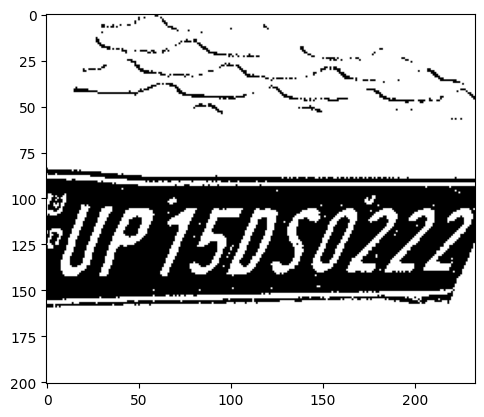

height =  1248 width =  1444


[1221.326904296875, 965.19140625, 1443.66943359375, 1205.7452392578125, 0.5115041732788086, 0.0] track_id: 330.0
-0.5410938090018289


['']
License Plate Number with contours :  None , Score :  None
-0.5567627701172992
['UP75050222']
license before check UP75050222
license after check UP75050222
License Plate Number :  UP75OS0222 , Score :  0.22417562471356117


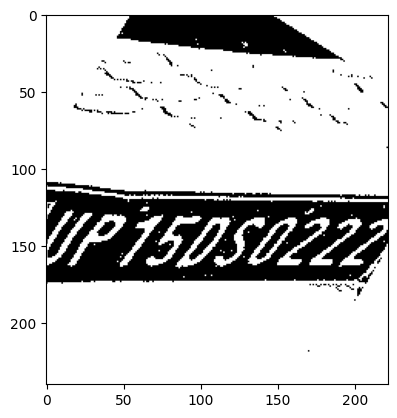

height =  1369 width =  1642
height =  1414 width =  1826
height =  1424 width =  1949
height =  1410 width =  1969
height =  1401 width =  1922
height =  1392 width =  1862
height =  1379 width =  1787
height =  1356 width =  1680
height =  1295 width =  1614
height =  1251 width =  1355
height =  1169 width =  1101
height =  1066 width =  713
height =  82 width =  95
height =  90 width =  118
height =  95 width =  122
height =  93 width =  123
height =  96 width =  127
height =  97 width =  130
height =  96 width =  130
height =  96 width =  132
height =  97 width =  133
height =  98 width =  137
height =  99 width =  140
height =  99 width =  139
height =  98 width =  141
height =  94 width =  145
height =  91 width =  147
height =  91 width =  147
height =  92 width =  148
height =  93 width =  148
height =  96 width =  151
height =  98 width =  149
height =  98 width =  151
height =  95 width =  154
height =  91 width =  165
height =  95 width =  166
height =  96 width =  168
heig

[129.54983520507812, 82.40487670898438, 175.05934143066406, 104.63911437988281, 0.7228483557701111, 0.0] track_id: 331.0
-0.162727374640381


[]
License Plate Number with contours :  None , Score :  None
-0.18394345653717517
['Mblh']
license before check Mblh
hello
License Plate Number :  None , Score :  None
height =  146 width =  218
[130.08450317382812, 82.5519027709961, 175.50106811523438, 104.46489715576172, 0.794523298740387, 0.0] track_id: 331.0
0.2299044281319047
height =  147 width =  220
[131.3129425048828, 83.52308654785156, 176.78109741210938, 105.07785034179688, 0.8043089509010315, 0.0] track_id: 331.0
-0.153707529058479
height =  148 width =  219
[129.37216186523438, 82.51637268066406, 175.38328552246094, 104.8902816772461, 0.7165327072143555, 0.0] track_id: 331.0
-0.16514867741462683
height =  148 width =  220


[129.86053466796875, 82.570556640625, 175.7841033935547, 105.68257904052734, 0.7840620875358582, 0.0] track_id: 331.0
-0.15660187698201536


[]
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
[]
License Plate Number :  None , Score :  None
height =  148 width =  221
[129.22003173828125, 83.67329406738281, 175.910888671875, 105.36329650878906, 0.7813078165054321, 0.0] track_id: 331.0
-0.18534794999569476
height =  148 width =  224


[129.68531799316406, 84.4857406616211, 176.34988403320312, 105.8170166015625, 0.813152015209198, 0.0] track_id: 331.0
-0.16514867741462683


[]
License Plate Number with contours :  None , Score :  None
-0.18822150530477078
['Sctut']
license before check Sctut
hello
License Plate Number :  None , Score :  None
height =  149 width =  223
[129.14288330078125, 84.5871810913086, 175.76295471191406, 105.95830535888672, 0.7954049110412598, 0.0] track_id: 331.0
-0.162727374640381
height =  149 width =  223
[128.9663848876953, 83.60082244873047, 174.828369140625, 106.23575592041016, 0.7742421627044678, 0.0] track_id: 331.0
-0.17219081452293902
height =  149 width =  223
[129.20936584472656, 83.96248626708984, 175.7045440673828, 106.39414978027344, 0.8163064122200012, 0.0] track_id: 331.0
-0.16514867741462683
height =  149 width =  223
[129.62164306640625, 84.51380920410156, 176.18124389648438, 106.60009765625, 0.7948346734046936, 0.0] track_id: 331.0
-0.16514867741462683
height =  149 width =  223
[129.8336944580078, 84.11465454101562, 176.78895568847656, 106.82710266113281, 0.7671658396720886, 0.0] track_id: 331.0
-0.1558682013983

[130.09622192382812, 84.32508087158203, 177.3542938232422, 106.69041442871094, 0.8251844644546509, 0.0] track_id: 331.0
-0.1558682013983225


['Wdet']
license before check Wdet
hello
License Plate Number with contours :  None , Score :  None
-0.15776873759595397
[]
License Plate Number :  None , Score :  None
height =  150 width =  223
[130.19102478027344, 84.39189147949219, 177.376953125, 106.77716827392578, 0.7880582809448242, 0.0] track_id: 331.0
-0.16292645885037274
height =  80 width =  85
height =  150 width =  223
[130.3758087158203, 83.65424346923828, 177.8371124267578, 106.7820816040039, 0.7681172490119934, 0.0] track_id: 331.0
-0.1607627406258347
height =  81 width =  86
height =  150 width =  223
[130.42770385742188, 84.14485931396484, 178.14913940429688, 106.68780517578125, 0.786628007888794, 0.0] track_id: 331.0
-0.1558682013983225
height =  85 width =  90
height =  149 width =  223


[130.5128631591797, 84.60865020751953, 178.3665771484375, 106.56385040283203, 0.8550442457199097, 0.0] track_id: 331.0
-0.1586552621864014


['Lednnat']
license before check Lednnat
hello
License Plate Number with contours :  None , Score :  None
-0.15431877592611903
['JInZ']
license before check JInZ
hello
License Plate Number :  None , Score :  None
height =  89 width =  95
height =  149 width =  223


[130.36773681640625, 85.09754180908203, 178.7938232421875, 106.49901580810547, 0.8671681880950928, 0.0] track_id: 331.0
-0.14756807131399477


[]
License Plate Number with contours :  None , Score :  None
-0.15776873759595397
[]
License Plate Number :  None , Score :  None
height =  89 width =  98
height =  149 width =  223


[130.6317138671875, 85.00907897949219, 178.772705078125, 106.42109680175781, 0.8628187775611877, 0.0] track_id: 331.0
-0.1558682013983225


['iints']
license before check iints
hello
License Plate Number with contours :  None , Score :  None
-0.18394345653717517
['Jotn']
license before check Jotn
hello
License Plate Number :  None , Score :  None
height =  91 width =  98
height =  149 width =  224
[130.7745361328125, 84.75065612792969, 179.17672729492188, 106.6203384399414, 0.8515618443489075, 0.0] track_id: 331.0
-0.15160548743827282
height =  91 width =  102
height =  149 width =  224


[130.92721557617188, 84.78556823730469, 179.2631072998047, 106.55422973632812, 0.860270619392395, 0.0] track_id: 331.0
-0.16977827396833844


[]
License Plate Number with contours :  None , Score :  None
-0.17593962545252784
[]
License Plate Number :  None , Score :  None
height =  92 width =  106
height =  149 width =  223
[130.06918334960938, 84.58426666259766, 178.30003356933594, 106.41525268554688, 0.8642661571502686, 0.0] track_id: 331.0
-0.153707529058479
height =  94 width =  109
height =  149 width =  223
[130.0768280029297, 84.58131408691406, 178.29339599609375, 106.42720031738281, 0.8650789856910706, 0.0] track_id: 331.0
-0.1586552621864014
height =  94 width =  109
height =  149 width =  223
[130.0188446044922, 84.3738784790039, 178.40748596191406, 106.39646911621094, 0.8667181730270386, 0.0] track_id: 331.0
-0.17162806838088
height =  95 width =  112
height =  149 width =  223
[130.0238494873047, 84.17717742919922, 178.49652099609375, 106.35028076171875, 0.8697642087936401, 0.0] track_id: 331.0
-0.16514867741462683
height =  97 width =  110
height =  149 width =  222


[130.15504455566406, 84.68960571289062, 178.3406524658203, 106.1104507446289, 0.8601478934288025, 0.0] track_id: 331.0
-0.19739555984988075


[]
License Plate Number with contours :  None , Score :  None
-0.17593962545252784
['Juwtm']
license before check Juwtm
hello
License Plate Number :  None , Score :  None
height =  99 width =  105
height =  149 width =  222
[130.1524200439453, 84.3482894897461, 178.41891479492188, 105.92166137695312, 0.8421676754951477, 0.0] track_id: 331.0
-0.1595517209332598
height =  99 width =  110
height =  149 width =  221
[130.2524871826172, 83.48064422607422, 178.38015747070312, 105.01947021484375, 0.8551032543182373, 0.0] track_id: 331.0
-0.18889718087762267
height =  103 width =  107
height =  149 width =  221


[130.24432373046875, 83.56819152832031, 178.38626098632812, 104.46723175048828, 0.8661388754844666, 0.0] track_id: 331.0
-0.153707529058479


[]
License Plate Number with contours :  None , Score :  None
-0.17593962545252784
['DEmT']
license before check DEmT
hello
License Plate Number :  None , Score :  None
height =  103 width =  108
height =  149 width =  222
[130.34893798828125, 83.57054138183594, 178.5426025390625, 104.71439361572266, 0.8422285318374634, 0.0] track_id: 331.0
-0.15264932839526515
height =  101 width =  103
height =  149 width =  222


[130.3633270263672, 83.58094787597656, 178.57603454589844, 104.39651489257812, 0.8434191346168518, 0.0] track_id: 331.0
-0.16292645885037274


['Juttit']
license before check Juttit
hello
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['ONTt']
license before check ONTt
hello
License Plate Number :  None , Score :  None
height =  103 width =  107
height =  148 width =  224
[130.2786102294922, 83.66842651367188, 178.17750549316406, 104.94139099121094, 0.8598665595054626, 0.0] track_id: 331.0
-0.153707529058479
height =  106 width =  108
height =  148 width =  224
[130.24745178222656, 83.69776916503906, 178.17686462402344, 104.8927993774414, 0.8624007105827332, 0.0] track_id: 331.0
-0.1558682013983225
height =  110 width =  109
height =  148 width =  223


[129.06057739257812, 83.75493621826172, 177.0724639892578, 105.4719009399414, 0.8769944310188293, 0.0] track_id: 331.0
-0.20687394897974307


[]
License Plate Number with contours :  None , Score :  None
-0.17593962545252784
[]
License Plate Number :  None , Score :  None
height =  107 width =  111
height =  149 width =  222


[130.3007049560547, 84.61768341064453, 178.42868041992188, 105.47864532470703, 0.8518632054328918, 0.0] track_id: 331.0
-0.19739555984988075


['Ctnnint']
license before check Ctnnint
hello
License Plate Number with contours :  None , Score :  None
-0.18394345653717517
[]
License Plate Number :  None , Score :  None
height =  106 width =  111
height =  149 width =  222


[130.27227783203125, 84.45929718017578, 178.3296661376953, 105.6716079711914, 0.8549216389656067, 0.0] track_id: 331.0
-0.15808997112168574


['Wr']
license before check Wr
hello
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['Joutu']
license before check Joutu
hello
License Plate Number :  None , Score :  None
height =  108 width =  111
height =  149 width =  222
[130.2567901611328, 84.5267562866211, 178.32546997070312, 105.7113037109375, 0.8547330498695374, 0.0] track_id: 331.0
-0.15160548743827282
height =  110 width =  113
height =  149 width =  222


[130.2377471923828, 84.6935806274414, 178.32847595214844, 105.98989868164062, 0.8717309832572937, 0.0] track_id: 331.0
-0.1595517209332598


['Wdi']
license before check Wdi
hello
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['pliftt']
license before check pliftt
hello
License Plate Number :  None , Score :  None
height =  112 width =  115
height =  148 width =  221


[129.1775360107422, 84.29315948486328, 177.31387329101562, 105.7102279663086, 0.8844050765037537, 0.0] track_id: 331.0
-0.1595517209332598


['Wdi']
license before check Wdi
hello
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['pliftt']
license before check pliftt
hello
License Plate Number :  None , Score :  None
height =  115 width =  116
height =  148 width =  221


[129.1411590576172, 84.25935363769531, 177.38894653320312, 105.64363098144531, 0.8900381922721863, 0.0] track_id: 331.0
-0.162727374640381


[]
License Plate Number with contours :  None , Score :  None
-0.15431877592611903
[]
License Plate Number :  None , Score :  None
height =  117 width =  117
height =  147 width =  222
[129.2008056640625, 84.0220947265625, 177.29086303710938, 105.39807891845703, 0.8850919008255005, 0.0] track_id: 331.0
-0.15002695678410782
height =  118 width =  119
height =  147 width =  222
[129.19406127929688, 84.03926849365234, 177.28125, 105.39900970458984, 0.8839649558067322, 0.0] track_id: 331.0
-0.15002695678410782
height =  116 width =  118
height =  147 width =  222
[129.19569396972656, 84.03388977050781, 177.2584991455078, 105.42053985595703, 0.8851825594902039, 0.0] track_id: 331.0
-0.15002695678410782
height =  117 width =  120
height =  147 width =  222
[129.19793701171875, 84.0064926147461, 177.15162658691406, 105.36907196044922, 0.8842765092849731, 0.0] track_id: 331.0
-0.15002695678410782
height =  119 width =  121
height =  147 width =  222
[129.2933807373047, 84.11885070800781, 176.9

[129.1712646484375, 84.0704345703125, 177.0000457763672, 105.26080322265625, 0.8828749656677246, 0.0] track_id: 331.0
-0.2093853929534955


[]
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['Vartttm']
license before check Vartttm
hello
License Plate Number :  None , Score :  None
height =  120 width =  125
height =  148 width =  222


[129.42617797851562, 84.11544036865234, 177.3466339111328, 105.39679718017578, 0.8826201558113098, 0.0] track_id: 331.0
-0.15741687272659072


[]
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
[]
License Plate Number :  None , Score :  None
height =  124 width =  129
height =  148 width =  221


[128.45645141601562, 84.01715850830078, 176.32460021972656, 105.24386596679688, 0.8805391192436218, 0.0] track_id: 331.0
-0.1595517209332598


[]
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['Juinn']
license before check Juinn
hello
License Plate Number :  None , Score :  None
height =  125 width =  129
height =  148 width =  221


[129.35179138183594, 84.16444396972656, 177.3817901611328, 105.4194107055664, 0.8895043730735779, 0.0] track_id: 331.0
-0.1586552621864014


['Vd']
license before check Vd
hello
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['iuion']
license before check iuion
hello
License Plate Number :  None , Score :  None
height =  123 width =  127
height =  148 width =  224


[129.0435028076172, 84.49381256103516, 177.2359619140625, 105.64364624023438, 0.8805596828460693, 0.0] track_id: 331.0
-0.1595517209332598


['JmWWt']
license before check JmWWt
hello
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['Iuimi']
license before check Iuimi
hello
License Plate Number :  None , Score :  None
height =  126 width =  128
height =  148 width =  224


[129.05616760253906, 84.47515869140625, 177.19813537597656, 105.72127532958984, 0.8807481527328491, 0.0] track_id: 331.0
-0.162727374640381


['4F']
license before check 4F
hello
License Plate Number with contours :  None , Score :  None
-0.15431877592611903
['BouuN']
license before check BouuN
hello
License Plate Number :  None , Score :  None
height =  126 width =  127
height =  148 width =  224


[129.04771423339844, 84.42121887207031, 177.15921020507812, 105.56349182128906, 0.8798320889472961, 0.0] track_id: 331.0
-0.1946855393839499


[]
License Plate Number with contours :  None , Score :  None
-0.13863973713415806
[]
License Plate Number :  None , Score :  None
height =  132 width =  128
height =  148 width =  224


[129.05043029785156, 84.43276977539062, 177.164794921875, 105.53389739990234, 0.8807457089424133, 0.0] track_id: 331.0
-0.1595517209332598


['JpWW']
license before check JpWW
hello
License Plate Number with contours :  None , Score :  None
-0.13863973713415806
[]
License Plate Number :  None , Score :  None
height =  135 width =  128
height =  148 width =  224


[129.0611114501953, 84.42484283447266, 177.20118713378906, 105.49453735351562, 0.8801531195640564, 0.0] track_id: 331.0
-0.1595517209332598


['JpW']
license before check JpW
hello
License Plate Number with contours :  None , Score :  None
-0.15264932839526515
['Gilna']
license before check Gilna
hello
License Plate Number :  None , Score :  None
height =  137 width =  131
height =  148 width =  224
[129.06480407714844, 84.41236877441406, 177.19540405273438, 105.49657440185547, 0.8793156743049622, 0.0] track_id: 331.0
-0.13863973713415806
height =  137 width =  131
height =  148 width =  223


[129.41244506835938, 84.03742980957031, 177.24526977539062, 105.0337905883789, 0.8816365599632263, 0.0] track_id: 331.0
-0.14888994760949725


[]
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['njintt']
license before check njintt
hello
License Plate Number :  None , Score :  None
height =  139 width =  132
height =  148 width =  222
[129.44842529296875, 84.0634536743164, 177.33306884765625, 105.10924530029297, 0.8803132772445679, 0.0] track_id: 331.0
-0.15002695678410782
height =  143 width =  135
height =  148 width =  223


[129.4490203857422, 84.07627868652344, 177.17709350585938, 105.09457397460938, 0.8844716548919678, 0.0] track_id: 331.0
-0.2093853929534955


['trett']
license before check trett
hello
License Plate Number with contours :  None , Score :  None
-0.13863973713415806
[]
License Plate Number :  None , Score :  None
height =  141 width =  136
height =  148 width =  223


[129.60348510742188, 84.1303482055664, 177.2691192626953, 104.8480453491211, 0.8760730624198914, 0.0] track_id: 331.0
-0.15499674192394097


['JNWNII']
license before check JNWNII
hello
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['Ifunni']
license before check Ifunni
hello
License Plate Number :  None , Score :  None
height =  141 width =  138
height =  148 width =  224


[129.343017578125, 84.5451431274414, 177.06956481933594, 105.55490112304688, 0.8896401524543762, 0.0] track_id: 331.0
-0.162727374640381


['D']
license before check D
hello
License Plate Number with contours :  None , Score :  None
-0.15660187698201536
['amtlt']
license before check amtlt
hello
License Plate Number :  None , Score :  None
height =  142 width =  142
height =  148 width =  224


[129.2880859375, 84.58210754394531, 177.1189727783203, 105.57996368408203, 0.8877525329589844, 0.0] track_id: 331.0
-0.15354378253955608


[]
License Plate Number with contours :  None , Score :  None
-0.16514867741462683
['Lant']
license before check Lant
hello
License Plate Number :  None , Score :  None
height =  148 width =  145
height =  148 width =  224
[129.24110412597656, 84.52827453613281, 177.08203125, 105.76020812988281, 0.8862193822860718, 0.0] track_id: 331.0
-0.17162806838088
height =  149 width =  144


[59.772422790527344, 95.99588012695312, 97.53296661376953, 110.33979797363281, 0.32673799991607666, 0.0] track_id: 332.0
-0.21866894587394195


[]
License Plate Number with contours :  None , Score :  None
-0.23783592745745075
[]
License Plate Number :  None , Score :  None
height =  148 width =  225
[130.43582153320312, 84.4610824584961, 178.15032958984375, 105.6748275756836, 0.8891144394874573, 0.0] track_id: 331.0
-0.15002695678410782
height =  153 width =  144


[60.718605041503906, 98.08162689208984, 98.5765609741211, 114.01675415039062, 0.5512917637825012, 0.0] track_id: 332.0
-0.2148154004016586


[]
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
[]
License Plate Number :  None , Score :  None
height =  148 width =  223


[129.51971435546875, 84.13288116455078, 177.1465301513672, 105.40296173095703, 0.8895506858825684, 0.0] track_id: 331.0
-0.1595517209332598


['JWW']
license before check JWW
hello
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
[]
License Plate Number :  None , Score :  None
height =  154 width =  145


[60.07010269165039, 98.04113006591797, 98.53955078125, 116.39833068847656, 0.7699985504150391, 0.0] track_id: 332.0
-0.2287988453872256


[]
License Plate Number with contours :  None , Score :  None
-0.2247111684146427
[]
License Plate Number :  None , Score :  None
height =  148 width =  222


[129.45008850097656, 84.14606475830078, 177.2802276611328, 105.44011688232422, 0.8861953020095825, 0.0] track_id: 331.0
-0.1595517209332598


['dma']
license before check dma
hello
License Plate Number with contours :  None , Score :  None
-0.15776873759595397
[]
License Plate Number :  None , Score :  None
height =  158 width =  148
[63.43680191040039, 101.20708465576172, 102.7994384765625, 118.95146942138672, 0.7608084082603455, 0.0] track_id: 332.0
-0.23860932250820097
height =  148 width =  222
[129.4359130859375, 84.17494201660156, 177.38331604003906, 105.41104888916016, 0.8872064352035522, 0.0] track_id: 331.0
-0.15354378253955608
height =  161 width =  149
[62.93138885498047, 100.30660247802734, 102.97404479980469, 120.9500503540039, 0.7968013286590576, 0.0] track_id: 332.0
-0.21018258666216955
height =  148 width =  222


[128.11181640625, 84.04602813720703, 176.2094268798828, 105.4779052734375, 0.888317346572876, 0.0] track_id: 331.0
-0.162727374640381


[]
License Plate Number with contours :  None , Score :  None
-0.15776873759595397
[]
License Plate Number :  None , Score :  None
height =  165 width =  151
[63.2072868347168, 102.85874938964844, 104.09201049804688, 123.66804504394531, 0.6290291547775269, 0.0] track_id: 332.0
-0.220248723390689
height =  148 width =  221


[128.44610595703125, 84.02376556396484, 176.25631713867188, 105.36775207519531, 0.8855207562446594, 0.0] track_id: 331.0
-0.1595517209332598


['4uT']
license before check 4uT
hello
License Plate Number with contours :  None , Score :  None
-0.16514867741462683
[]
License Plate Number :  None , Score :  None
height =  166 width =  150
[62.45079040527344, 106.81136322021484, 103.1889419555664, 124.77162170410156, 0.8346978425979614, 0.0] track_id: 332.0
-0.21866894587394195
height =  148 width =  221
[128.4185791015625, 84.0696792602539, 176.28103637695312, 105.32111358642578, 0.8834409117698669, 0.0] track_id: 331.0
-0.15002695678410782
height =  168 width =  153


[63.23039245605469, 106.71163177490234, 104.8050765991211, 125.09944915771484, 0.7050619721412659, 0.0] track_id: 332.0
-0.21336864215180798


[]
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
[]
License Plate Number :  None , Score :  None
height =  148 width =  221
[129.32699584960938, 84.3074951171875, 177.4155731201172, 105.32904815673828, 0.8874350786209106, 0.0] track_id: 331.0
-0.15176515532770313
height =  169 width =  155
[65.66362762451172, 107.51042175292969, 107.53593444824219, 125.91608428955078, 0.8472427129745483, 0.0] track_id: 332.0
-0.2213144423477913
height =  148 width =  221
[128.4091033935547, 84.16911315917969, 176.35842895507812, 105.30176544189453, 0.8849027156829834, 0.0] track_id: 331.0
-0.15176515532770313
height =  175 width =  157
[65.6631088256836, 112.15345001220703, 107.52814483642578, 130.07919311523438, 0.8748493194580078, 0.0] track_id: 332.0
-0.21866894587394195
height =  148 width =  220
[128.33709716796875, 84.28636169433594, 176.384765625, 105.27688598632812, 0.8868337273597717, 0.0] track_id: 331.0
-0.15176515532770313
height =  175 width =  160
[64.988

[129.3203125, 84.32044219970703, 177.42723083496094, 105.27752685546875, 0.8885841965675354, 0.0] track_id: 331.0
-0.1595517209332598


['JWW']
license before check JWW
hello
License Plate Number with contours :  None , Score :  None
-0.17324566645236494
[]
License Plate Number :  None , Score :  None
height =  52 width =  72
height =  148 width =  220


[128.30703735351562, 84.26898956298828, 176.380126953125, 105.29825592041016, 0.8879656791687012, 0.0] track_id: 331.0
-0.1595517209332598


['JWW']
license before check JWW
hello
License Plate Number with contours :  None , Score :  None
-0.17324566645236494
[]
License Plate Number :  None , Score :  None
height =  190 width =  180


[76.22106170654297, 118.95250701904297, 122.3302001953125, 144.44158935546875, 0.8892393112182617, 0.0] track_id: 332.0
-0.21535769969773805


[]
License Plate Number with contours :  None , Score :  None
-0.2284966392918623
[]
License Plate Number :  None , Score :  None
height =  54 width =  73
height =  148 width =  220
[128.3043670654297, 84.2774658203125, 176.37200927734375, 105.29664611816406, 0.8883799910545349, 0.0] track_id: 331.0
-0.15002695678410782
height =  195 width =  183
[76.61400604248047, 122.7881088256836, 125.16815185546875, 150.43203735351562, 0.9018383622169495, 0.0] track_id: 332.0
-0.21866894587394195
height =  57 width =  71
height =  148 width =  220
[128.37586975097656, 84.30467987060547, 176.3419189453125, 105.26231384277344, 0.887176513671875, 0.0] track_id: 331.0
-0.15176515532770313
height =  207 width =  192


[79.28274536132812, 131.59056091308594, 128.81150817871094, 158.93017578125, 0.9079282879829407, 0.0] track_id: 332.0
-0.23949926591015905


[]
License Plate Number with contours :  None , Score :  None
-0.20963984587421253
[]
License Plate Number :  None , Score :  None
height =  148 width =  220
[127.17281341552734, 84.09970092773438, 175.3611297607422, 105.25228881835938, 0.8870981931686401, 0.0] track_id: 331.0
-0.15074638112042166
height =  214 width =  196


[81.44635009765625, 135.4188690185547, 132.02188110351562, 163.50930786132812, 0.9096844792366028, 0.0] track_id: 332.0
-0.23021958727684372


[]
License Plate Number with contours :  None , Score :  None
-0.23923159996366056
[]
License Plate Number :  None , Score :  None
height =  148 width =  220
[127.20954895019531, 84.07527160644531, 175.37051391601562, 105.27406311035156, 0.8867906928062439, 0.0] track_id: 331.0
-0.15074638112042166
height =  65 width =  79
height =  147 width =  221


[128.52798461914062, 83.64488983154297, 176.4998779296875, 104.5479965209961, 0.881040632724762, 0.0] track_id: 331.0
-0.1595517209332598


['JNWWI']
license before check JNWWI
hello
License Plate Number with contours :  None , Score :  None
-0.13863973713415806
['3a1itmt']
license before check 3a1itmt
hello
License Plate Number :  None , Score :  None
height =  147 width =  221
[127.17694091796875, 83.45014953613281, 175.35202026367188, 104.58940887451172, 0.8826283812522888, 0.0] track_id: 331.0
-0.15002695678410782
height =  223 width =  203


[85.43543243408203, 137.93727111816406, 139.1487274169922, 169.36338806152344, 0.9060855507850647, 0.0] track_id: 332.0
-0.21535769969773805


[]
License Plate Number with contours :  None , Score :  None
-0.2299044281319047
[]
License Plate Number :  None , Score :  None
height =  62 width =  81
height =  147 width =  221


[127.36409759521484, 83.48429107666016, 175.6798553466797, 104.26759338378906, 0.8819397687911987, 0.0] track_id: 331.0
-0.15722805097656892


['Sr']
license before check Sr
hello
License Plate Number with contours :  None , Score :  None
-0.16514867741462683
['ftbw']
license before check ftbw
hello
License Plate Number :  None , Score :  None
height =  225 width =  205


[89.1517333984375, 140.39418029785156, 143.34934997558594, 172.08547973632812, 0.904985249042511, 0.0] track_id: 332.0
-0.20599133667583147


[]
License Plate Number with contours :  None , Score :  None
-0.20131710837464076
[]
License Plate Number :  None , Score :  None
height =  60 width =  83
height =  147 width =  222


[128.43675231933594, 83.42273712158203, 176.6742706298828, 104.26659393310547, 0.8848121762275696, 0.0] track_id: 331.0
-0.15002695678410782


[]
License Plate Number with contours :  None , Score :  None
-0.16514867741462683
['ftbw']
license before check ftbw
hello
License Plate Number :  None , Score :  None
height =  228 width =  208


[90.55360412597656, 146.53939819335938, 146.31417846679688, 178.25453186035156, 0.9093247652053833, 0.0] track_id: 332.0
-0.33432850740892484


[]
License Plate Number with contours :  None , Score :  None
-0.20846521837998772
[]
License Plate Number :  None , Score :  None
height =  63 width =  82
height =  146 width =  223


[129.73863220214844, 83.33711242675781, 177.5504913330078, 104.21369171142578, 0.8864037990570068, 0.0] track_id: 331.0
-0.16514867741462683


['Jnlit']
license before check Jnlit
hello
License Plate Number with contours :  None , Score :  None
-0.16514867741462683
['ftbw']
license before check ftbw
hello
License Plate Number :  None , Score :  None
height =  228 width =  215


[95.25569915771484, 143.17770385742188, 152.596923828125, 175.61245727539062, 0.9098365902900696, 0.0] track_id: 332.0
-0.21866894587394195


[]
License Plate Number with contours :  None , Score :  None
-0.21866894587394195
[]
License Plate Number :  None , Score :  None
height =  65 width =  88
height =  146 width =  226
[132.5802459716797, 83.5510025024414, 180.77102661132812, 102.96414947509766, 0.8781546950340271, 0.0] track_id: 331.0
-0.15002695678410782
height =  234 width =  222


[98.28726959228516, 145.2834930419922, 156.97543334960938, 179.4270782470703, 0.9081772565841675, 0.0] track_id: 332.0
-0.17219081452293902


[]
License Plate Number with contours :  None , Score :  None
-0.2148154004016586
['Eozzs']
license before check Eozzs
hello
License Plate Number :  None , Score :  None
height =  66 width =  85
height =  146 width =  224


[130.51673889160156, 83.36175537109375, 178.66925048828125, 104.31388092041016, 0.8863533139228821, 0.0] track_id: 331.0
-0.1595517209332598


['SnW']
license before check SnW
hello
License Plate Number with contours :  None , Score :  None
-0.17593962545252784
['Petot']
license before check Petot
hello
License Plate Number :  None , Score :  None
height =  237 width =  228


[102.65734100341797, 152.1978759765625, 162.54104614257812, 185.81488037109375, 0.8995997905731201, 0.0] track_id: 332.0
-0.21109333322274654


[]
License Plate Number with contours :  None , Score :  None
-0.21655030497608926
[]
License Plate Number :  None , Score :  None
height =  144 width =  217


[123.61080932617188, 82.99276733398438, 171.734130859375, 103.32786560058594, 0.8687170147895813, 0.0] track_id: 331.0
-0.15176515532770313


[]
License Plate Number with contours :  None , Score :  None
-0.14531001063570212
['elltu']
license before check elltu
hello
License Plate Number :  None , Score :  None
height =  233 width =  233
[103.78947448730469, 151.54502868652344, 165.5460662841797, 185.7620086669922, 0.9114485383033752, 0.0] track_id: 332.0
-0.220248723390689
height =  140 width =  215


[120.52082061767578, 82.52176666259766, 168.77230834960938, 103.49312591552734, 0.8790603280067444, 0.0] track_id: 331.0
-0.16137511042069147


['JrWitJhi']
license before check JrWitJhi
hello
License Plate Number with contours :  None , Score :  None
-0.17593962545252784
['uelint']
license before check uelint
hello
License Plate Number :  None , Score :  None
height =  245 width =  240
[106.34336853027344, 155.55909729003906, 168.69554138183594, 189.59385681152344, 0.9040952324867249, 0.0] track_id: 332.0
-0.21109333322274654
height =  137 width =  213


[118.61781311035156, 83.904296875, 166.84158325195312, 104.56322479248047, 0.8690411448478699, 0.0] track_id: 331.0
-0.16514867741462683


[]
License Plate Number with contours :  None , Score :  None
-0.15431877592611903
['auttt']
license before check auttt
hello
License Plate Number :  None , Score :  None
height =  253 width =  246


[110.11320495605469, 160.4868927001953, 173.3966522216797, 193.58364868164062, 0.9070774912834167, 0.0] track_id: 332.0
-0.21866894587394195


[]
License Plate Number with contours :  None , Score :  None
-0.22208190190548016
[]
License Plate Number :  None , Score :  None
height =  134 width =  209
[114.34833526611328, 84.69212341308594, 163.08482360839844, 104.21415710449219, 0.8601311445236206, 0.0] track_id: 331.0
-0.16324028278483738
height =  258 width =  250
[111.47535705566406, 161.3022918701172, 177.4087371826172, 197.5334930419922, 0.901942253112793, 0.0] track_id: 332.0
-0.16977827396833844
height =  74 width =  103
height =  133 width =  209
[114.3819580078125, 84.49974060058594, 163.1406707763672, 104.28487396240234, 0.8663917183876038, 0.0] track_id: 331.0
-0.16324028278483738
height =  265 width =  259


[116.9913330078125, 165.53916931152344, 185.68478393554688, 201.93951416015625, 0.9050865173339844, 0.0] track_id: 332.0
-0.22208190190548016


['055115']
license before check 055115
hello
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
[]
License Plate Number :  None , Score :  None
height =  71 width =  95
height =  132 width =  221
[126.02741241455078, 84.95631408691406, 174.10946655273438, 102.81513214111328, 0.8747716546058655, 0.0] track_id: 331.0
-0.153707529058479
height =  271 width =  273


[127.28424072265625, 171.6640625, 197.57496643066406, 208.14317321777344, 0.9021289944648743, 0.0] track_id: 332.0
-0.21866894587394195


[]
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['205tos']
license before check 205tos
hello
License Plate Number :  None , Score :  None
height =  69 width =  91
height =  133 width =  211
[114.71007537841797, 84.3755874633789, 163.08238220214844, 103.7918930053711, 0.8625487089157104, 0.0] track_id: 331.0
-0.15002695678410782
height =  277 width =  279
[130.09825134277344, 176.68301391601562, 202.06858825683594, 212.81947326660156, 0.9035707712173462, 0.0] track_id: 332.0
-0.2171113147349052
height =  70 width =  91
height =  132 width =  219


[122.64334869384766, 84.38511657714844, 170.88819885253906, 104.35651397705078, 0.8812340497970581, 0.0] track_id: 331.0
-0.1595517209332598


['Jtwinjit']
license before check Jtwinjit
hello
License Plate Number with contours :  None , Score :  None
-0.14888994760949725
['olo']
license before check olo
hello
License Plate Number :  None , Score :  None
height =  286 width =  289
[136.29933166503906, 180.67347717285156, 210.566650390625, 218.40943908691406, 0.9061071872711182, 0.0] track_id: 332.0
-0.2216495629786776
height =  71 width =  92
height =  133 width =  220
[122.648681640625, 84.41271209716797, 170.8857421875, 103.40150451660156, 0.8794759511947632, 0.0] track_id: 331.0
-0.15002695678410782
height =  295 width =  296
[139.65589904785156, 186.45802307128906, 216.8217010498047, 224.58966064453125, 0.9046592712402344, 0.0] track_id: 332.0
-0.2723402539884094
height =  71 width =  91
height =  132 width =  211
[113.65764617919922, 83.79205322265625, 161.96031188964844, 103.07032012939453, 0.8748733997344971, 0.0] track_id: 331.0
-0.15002695678410782
height =  303 width =  307
[145.72132873535156, 194.5131378173828, 225

[97.91126251220703, 84.93242645263672, 146.73634338378906, 106.0358657836914, 0.7735790014266968, 0.0] track_id: 331.0
-0.15913672579869362


['JTWW']
license before check JTWW
hello
License Plate Number with contours :  None , Score :  None
-0.13863973713415806
['eenat']
license before check eenat
hello
License Plate Number :  None , Score :  None
height =  315 width =  331


[162.98069763183594, 205.8643341064453, 247.02328491210938, 246.83824157714844, 0.91191166639328, 0.0] track_id: 332.0
-0.20539538918976738
['HPSSKFJs7L']
license before check HPSSKFJs7L
license after check HPSSKFJS7L
License Plate Number with contours :  HP5SKF3574 , Score :  0.050834511427081897


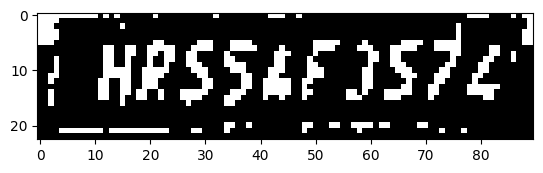

[304.82501220703125, 55.17286682128906, 331.0, 80.77336120605469, 0.42555612325668335, 0.0]

 track_id: 332.0


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  81 width =  98
height =  132 width =  199
[101.05987548828125, 84.50704193115234, 150.98109436035156, 103.6877670288086, 0.7377530336380005, 0.0] track_id: 331.0
-0.15176515532770313
height =  319 width =  344


[171.63902282714844, 213.81541442871094, 257.4977722167969, 255.0945281982422, 0.9121716618537903, 0.0] track_id: 332.0
-0.20687394897974307


['HrSSk7J5il']
license before check HrSSk7J5il
hello
License Plate Number with contours :  None , Score :  None
-0.1950202674049214
['E8R55F3572']
license before check E8R55F3572
hello
License Plate Number :  None , Score :  None
height =  81 width =  100
height =  132 width =  196
height =  331 width =  356


[178.2958984375, 222.41275024414062, 267.0608825683594, 265.3402099609375, 0.9152851700782776, 0.0] track_id: 332.0
-0.21743741940294756
['HRssa3574']
license before check HRssa3574
license after check HRSSA3574
License Plate Number with contours :  HR5SA3574 , Score :  0.20095810826754312


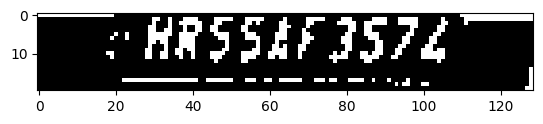

height =  95 width =  103
height =  131 width =  206
height =  346 width =  370
[185.88656616210938, 231.04702758789062, 279.0215759277344, 275.66094970703125, 0.9175590872764587, 0.0] track_id: 332.0
-0.17123873610543772
height =  99 width =  101
height =  129 width =  205
height =  360 width =  384
[194.5631866455078, 242.8802490234375, 291.5710144042969, 288.2160339355469, 0.9255629181861877, 0.0] track_id: 332.0
-0.20539538918976738
height =  101 width =  103
height =  375 width =  401


[207.1114501953125, 256.2257080078125, 306.6585998535156, 303.5976257324219, 0.9143922328948975, 0.0] track_id: 332.0
-0.20333608402827574
['R5SaF3576']
license before check R5SaF3576
license after check R5SAF3576
License Plate Number with contours :  RS5AF3576 , Score :  0.054332192824391085


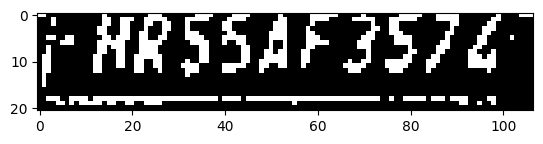

height =  108 width =  108
height =  393 width =  417
[217.2488555908203, 269.7053527832031, 320.4152526855469, 318.3389892578125, 0.9114968180656433, 0.0] track_id: 332.0
-0.19063890591409552
height =  109 width =  106
height =  406 width =  436
[229.2070770263672, 282.020751953125, 337.23931884765625, 332.7471008300781, 0.9125854969024658, 0.0] track_id: 332.0
-0.18822150530477078
height =  110 width =  105
height =  427 width =  455
[241.0758514404297, 298.2713317871094, 353.5478515625, 350.5938720703125, 0.91874098777771, 0.0] track_id: 332.0
-0.19032853969190713
height =  109 width =  105
height =  439 width =  478


[257.45526123046875, 312.7954406738281, 375.70361328125, 367.11212158203125, 0.9190659523010254, 0.0] track_id: 332.0
-0.20574261139803554
['HRssaf357L']
license before check HRssaf357L
license after check HRSSAF357L
License Plate Number with contours :  HR5SAF3574 , Score :  0.07255806757653692


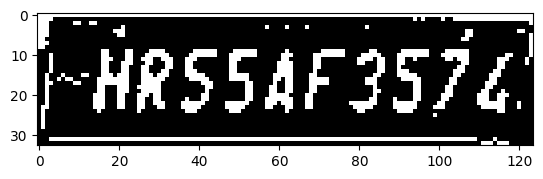

height =  109 width =  107
height =  456 width =  505


[278.7303466796875, 324.667724609375, 400.8630065917969, 381.5604553222656, 0.9204452037811279, 0.0] track_id: 332.0
-0.19097716275089585
['HRssaf3574']
license before check HRssaf3574
license after check HRSSAF3574
License Plate Number with contours :  HR5SAF3574 , Score :  0.07384966233226645


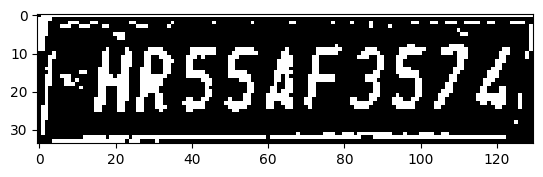

height =  112 width =  108
height =  479 width =  532
[297.1439514160156, 341.6883544921875, 425.0988464355469, 400.6713562011719, 0.9208295345306396, 0.0] track_id: 332.0
-0.21109333322274654
height =  114 width =  110
height =  503 width =  565
[318.76153564453125, 358.9542236328125, 453.9938049316406, 420.7168273925781, 0.9242748618125916, 0.0] track_id: 332.0
-0.19118445959701444
height =  114 width =  115
height =  529 width =  600
[345.4992980957031, 379.2371520996094, 487.2467041015625, 444.07147216796875, 0.9212929606437683, 0.0] track_id: 332.0
-0.20568266295376947
height =  116 width =  120
height =  558 width =  638


[375.24029541015625, 406.041748046875, 525.572998046875, 474.87127685546875, 0.9169567227363586, 0.0] track_id: 332.0
-0.18613195610711106
['HRSSAF3574']
license before check HRSSAF3574
license after check HRSSAF3574
License Plate Number with contours :  HR5SAF3574 , Score :  0.7167352098450861


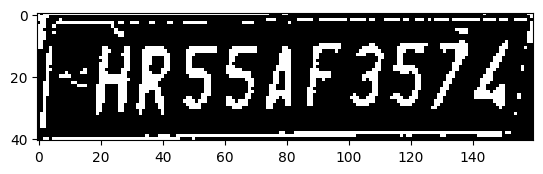

height =  121 width =  120
height =  589 width =  687
[411.69281005859375, 431.3861083984375, 570.8024291992188, 503.941162109375, 0.9232671856880188, 0.0] track_id: 332.0
-0.19189506526884237
height =  121 width =  118
height =  624 width =  734


[450.1626892089844, 460.4178161621094, 619.3034057617188, 539.5592651367188, 0.9148661494255066, 0.0] track_id: 332.0
-0.20647442842569014


['HR55AF357k']
license before check HR55AF357k
hello
License Plate Number with contours :  None , Score :  None
-0.19185545032610668
['HRSSAF3574']
license before check HRSSAF3574
license after check HRSSAF3574
License Plate Number :  HR5SAF3574 , Score :  0.5040082298907634


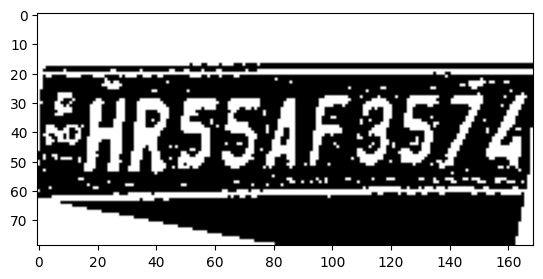

height =  123 width =  125
height =  664 width =  787
[496.3717956542969, 494.9051818847656, 674.3021850585938, 578.8931884765625, 0.9262822270393372, 0.0] track_id: 332.0
-0.20474065336014693
height =  122 width =  125
height =  707 width =  847
[552.5413818359375, 532.9933471679688, 737.2689208984375, 622.8265380859375, 0.929199755191803, 0.0] track_id: 332.0
-0.21038184277005323
height =  126 width =  131
height =  753 width =  918
[617.2752685546875, 576.8875122070312, 811.604736328125, 672.274169921875, 0.925643265247345, 0.0] track_id: 332.0
-0.22644081011716205
height =  130 width =  129
height =  806 width =  992
[692.1143798828125, 628.5475463867188, 896.2152709960938, 734.591796875, 0.9214928150177002, 0.0] track_id: 332.0
-0.2438736912008837
height =  136 width =  130
height =  872 width =  1075
[778.862060546875, 687.0332641601562, 994.2335205078125, 807.7561645507812, 0.9227725863456726, 0.0] track_id: 332.0
-0.2961879419729653
height =  138 width =  137
height =  945 widt

[887.23291015625, 756.266357421875, 1106.0645751953125, 888.5477294921875, 0.9135852456092834, 0.0] track_id: 332.0
-0.3510308867424203


['kHR5SAF']
license before check kHR5SAF
hello
License Plate Number with contours :  None , Score :  None
-0.35083882528511473
['HRSSAF357']
license before check HRSSAF357
hello
License Plate Number :  None , Score :  None
height =  141 width =  135
height =  137 width =  201
height =  1038 width =  1267


[1005.0595703125, 821.43896484375, 1222.0079345703125, 982.9586791992188, 0.9148868918418884, 0.0] track_id: 332.0
-0.3819188055516519


['H']
license before check H
hello
License Plate Number with contours :  None , Score :  None
-0.4182243295792291
['HRSSAF3574']
license before check HRSSAF3574
license after check HRSSAF3574
License Plate Number :  HR5SAF3574 , Score :  0.85030020632166


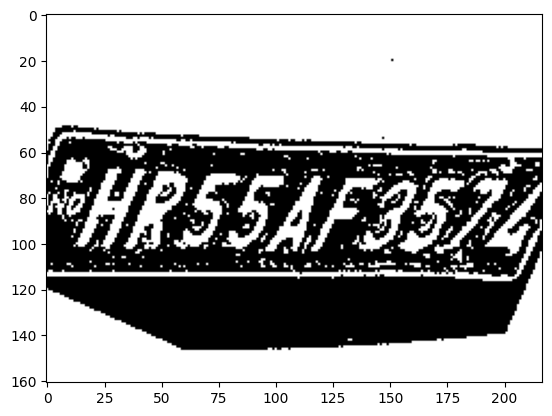

height =  142 width =  132
height =  140 width =  203
height =  1135 width =  1381


[1139.8798828125, 908.4362182617188, 1348.7333984375, 1074.545654296875, 0.9094603061676025, 0.0] track_id: 332.0
-0.5040296845653061


['H']
license before check H
hello
License Plate Number with contours :  None , Score :  None
-0.46959991965539777
['HRSSAF857']
license before check HRSSAF857
hello
License Plate Number :  None , Score :  None
height =  145 width =  139
height =  144 width =  209
height =  1237 width =  1522
[1307.73095703125, 979.286865234375, 1495.41552734375, 1174.3822021484375, 0.8293954133987427, 0.0] track_id: 332.0
-0.5765483507833596
height =  147 width =  145
height =  147 width =  210
height =  1340 width =  1639
height =  147 width =  150
height =  149 width =  220
height =  1385 width =  1747
height =  152 width =  154
height =  148 width =  224
[130.61849975585938, 83.61643981933594, 177.3325653076172, 101.50363159179688, 0.6952093839645386, 0.0] track_id: 331.0
-0.15660187698201536
height =  1391 width =  1891
height =  156 width =  156
height =  149 width =  227


[131.23464965820312, 83.26594543457031, 178.66671752929688, 105.33541870117188, 0.8136563301086426, 0.0] track_id: 331.0
-0.15160548743827282


[]
License Plate Number with contours :  None , Score :  None
-0.15776873759595397
['Jt']
license before check Jt
hello
License Plate Number :  None , Score :  None
height =  1382 width =  1938
height =  159 width =  157
height =  149 width =  227
[131.0148468017578, 83.23902893066406, 178.80088806152344, 105.49791717529297, 0.8125705122947693, 0.0] track_id: 331.0
0.0
height =  1374 width =  1902
height =  164 width =  161
height =  149 width =  227


[130.7948455810547, 83.42464447021484, 178.90892028808594, 106.07170104980469, 0.824781596660614, 0.0] track_id: 331.0
-0.16292645885037274


['Jeijutee']
license before check Jeijutee
hello
License Plate Number with contours :  None , Score :  None
-0.18394345653717517
['ecuer']
license before check ecuer
hello
License Plate Number :  None , Score :  None
height =  1365 width =  1858
height =  165 width =  160
height =  149 width =  228
[130.43692016601562, 83.18103790283203, 178.27301025390625, 105.6749267578125, 0.8562119603157043, 0.0] track_id: 331.0
-0.15660187698201536
height =  1357 width =  1801
height =  172 width =  164
height =  149 width =  229
[130.41647338867188, 83.4302749633789, 178.85679626464844, 104.39964294433594, 0.7972291111946106, 0.0] track_id: 331.0
-0.15808997112168574
height =  1351 width =  1740
height =  175 width =  165
height =  150 width =  228


[130.8470916748047, 83.57865905761719, 178.467041015625, 105.55165100097656, 0.7511599063873291, 0.0] track_id: 331.0
-0.1746721990082397


[]
License Plate Number with contours :  None , Score :  None
-0.17593962545252784
[]
License Plate Number :  None , Score :  None
height =  176 width =  167
height =  150 width =  226


[129.66409301757812, 83.19805145263672, 177.4427947998047, 105.35306549072266, 0.6695550084114075, 0.0] track_id: 331.0
-0.1558682013983225


['Wmt']
license before check Wmt
hello
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['Olto']
license before check Olto
hello
License Plate Number :  None , Score :  None
height =  1306 width =  1575
height =  178 width =  169
height =  150 width =  226


[130.28701782226562, 83.27872467041016, 178.18260192871094, 105.46393585205078, 0.6604030132293701, 0.0] track_id: 331.0
-0.15660187698201536


[]
License Plate Number with contours :  None , Score :  None
-0.18394345653717517
[]
License Plate Number :  None , Score :  None
height =  1270 width =  1460
height =  182 width =  171
height =  150 width =  227


[130.17330932617188, 83.46620178222656, 177.96078491210938, 104.94332122802734, 0.7682229280471802, 0.0] track_id: 331.0
-0.16977827396833844


[]
License Plate Number with contours :  None , Score :  None
-0.17593962545252784
[]
License Plate Number :  None , Score :  None
height =  1220 width =  1321
height =  183 width =  176
height =  150 width =  226
[129.6610565185547, 83.31654357910156, 177.63853454589844, 104.81864929199219, 0.618401825428009, 0.0] track_id: 331.0
-0.14955973987370316
height =  188 width =  178
height =  150 width =  225


[129.099609375, 83.37063598632812, 177.70603942871094, 104.54969024658203, 0.5852187871932983, 0.0] track_id: 331.0
-0.1676424378312157


[]
License Plate Number with contours :  None , Score :  None
-0.17593962545252784
[]
License Plate Number :  None , Score :  None
height =  1093 width =  964
height =  192 width =  182
height =  150 width =  224
[128.00364685058594, 83.43879699707031, 176.6920623779297, 104.62232971191406, 0.6135217547416687, 0.0] track_id: 331.0
-0.15176515532770313
height =  200 width =  184
height =  149 width =  224


[127.98662567138672, 83.72238159179688, 176.0755615234375, 105.65406036376953, 0.7704304456710815, 0.0] track_id: 331.0
-0.15776873759595397


['tMJ']
license before check tMJ
hello
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['Dun7']
license before check Dun7
hello
License Plate Number :  None , Score :  None
height =  203 width =  186
height =  149 width =  225


[128.77993774414062, 83.61490631103516, 177.06546020507812, 105.86268615722656, 0.7691648006439209, 0.0] track_id: 331.0
-0.15776873759595397


['MJ']
license before check MJ
hello
License Plate Number with contours :  None , Score :  None
-0.17985349979247828
[]
License Plate Number :  None , Score :  None
height =  205 width =  189


[81.7638168334961, 120.73695373535156, 138.91156005859375, 149.84048461914062, 0.7211574912071228, 0.0] track_id: 333.0
-0.06746502452190475


[]
License Plate Number with contours :  None , Score :  None
-0.24497866312686414
['jer']
license before check jer
hello
License Plate Number :  None , Score :  None
[81.96983337402344, 129.07949829101562, 138.85394287109375, 149.3561553955078, 0.2932310700416565, 0.0] track_id: 333.0
-0.017239671194529696
height =  149 width =  224
[128.51300048828125, 84.29818725585938, 177.13461303710938, 106.31795501708984, 0.8619359731674194, 0.0] track_id: 331.0
-0.19043511541355415
height =  205 width =  195


[83.79270935058594, 121.72586822509766, 142.2808074951172, 152.9354248046875, 0.7360668182373047, 0.0] track_id: 333.0
-0.10191836748087388


[]
License Plate Number with contours :  None , Score :  None
-0.2629947316809195
[]
License Plate Number :  None , Score :  None
height =  149 width =  225


[128.85389709472656, 83.9616470336914, 177.2214813232422, 106.28958129882812, 0.8480691909790039, 0.0] track_id: 331.0
-0.15660187698201536


['JIJn']
license before check JIJn
hello
License Plate Number with contours :  None , Score :  None
-0.16514867741462683
[]
License Plate Number :  None , Score :  None
height =  209 width =  199


[84.99020385742188, 132.74583435058594, 145.6222381591797, 156.8122100830078, 0.8345727920532227, 0.0] track_id: 333.0
-0.24497866312686414


[]
License Plate Number with contours :  None , Score :  None
-0.2551823906208184
['armir']
license before check armir
hello
License Plate Number :  None , Score :  None
height =  149 width =  224


[128.5449676513672, 84.28958129882812, 177.14019775390625, 106.32382202148438, 0.8636058568954468, 0.0] track_id: 331.0
-0.162727374640381


['Wmmtt']
license before check Wmmtt
hello
License Plate Number with contours :  None , Score :  None
-0.17593962545252784
[]
License Plate Number :  None , Score :  None
height =  213 width =  202


[86.3828353881836, 135.82456970214844, 148.15660095214844, 159.30813598632812, 0.8898277282714844, 0.0] track_id: 333.0
-0.2635638835830379


[]
License Plate Number with contours :  None , Score :  None
-0.2204937613666717
['EEE']
license before check EEE
hello
License Plate Number :  None , Score :  None
height =  149 width =  225
[129.22586059570312, 83.99154663085938, 177.59884643554688, 106.2092514038086, 0.8680465817451477, 0.0] track_id: 331.0
-0.15660187698201536
height =  219 width =  206


[88.08386993408203, 139.47891235351562, 151.4523162841797, 164.17922973632812, 0.8596989512443542, 0.0] track_id: 333.0
-0.23624526071843754


[]
License Plate Number with contours :  None , Score :  None
-0.2405342479459046
[]
License Plate Number :  None , Score :  None
height =  149 width =  224
[128.49417114257812, 83.99761962890625, 176.7594757080078, 106.19271850585938, 0.8629961013793945, 0.0] track_id: 331.0
-0.14531001063570212
height =  221 width =  214


[92.21453857421875, 141.2736053466797, 157.12725830078125, 166.02737426757812, 0.8301283717155457, 0.0] track_id: 333.0
-0.24896270579271707


['0r7']
license before check 0r7
hello
License Plate Number with contours :  None , Score :  None
-0.25825221981103874
['Jfr']
license before check Jfr
hello
License Plate Number :  None , Score :  None
height =  149 width =  225
[129.1704559326172, 83.79826354980469, 177.54698181152344, 106.05338287353516, 0.8461560010910034, 0.0] track_id: 331.0
-0.14888994760949725
height =  225 width =  218


[94.19842529296875, 140.4687042236328, 160.36131286621094, 170.14007568359375, 0.8852286338806152, 0.0] track_id: 333.0
-0.03795644518831435


[]
License Plate Number with contours :  None , Score :  None
-0.23624526071843754
[]
License Plate Number :  None , Score :  None
height =  148 width =  225
[128.8504180908203, 83.74198150634766, 177.33909606933594, 105.74883270263672, 0.8390766978263855, 0.0] track_id: 331.0
-0.15808997112168574
height =  237 width =  225


[97.82566833496094, 151.8859100341797, 165.459228515625, 181.86761474609375, 0.8873463869094849, 0.0] track_id: 333.0
-0.23021958727684372


['17Ufeli']
license before check 17Ufeli
hello
License Plate Number with contours :  None , Score :  None
-0.23374318086890142
[]
License Plate Number :  None , Score :  None
height =  148 width =  223
[127.96967315673828, 83.9350814819336, 176.43162536621094, 105.56507873535156, 0.8680166006088257, 0.0] track_id: 331.0
-0.1470783553884025
height =  243 width =  231


[99.53337860107422, 151.52658081054688, 169.88101196289062, 183.26649475097656, 0.8905481100082397, 0.0] track_id: 333.0
0.0


[]
License Plate Number with contours :  None , Score :  None
-0.24111767845146836
['Vplsegt8']
license before check Vplsegt8
hello
License Plate Number :  None , Score :  None
height =  148 width =  222
[126.86078643798828, 84.061767578125, 175.67095947265625, 105.68826293945312, 0.8786842823028564, 0.0] track_id: 331.0
-0.1470783553884025
height =  251 width =  237


[103.73641204833984, 156.10931396484375, 175.91111755371094, 189.84486389160156, 0.8862461447715759, 0.0] track_id: 333.0
-0.23783592745745075


[]
License Plate Number with contours :  None , Score :  None
-0.260602391747341
['UpusrC16']
license before check UpusrC16
hello
License Plate Number :  None , Score :  None
height =  148 width =  221
[126.84703826904297, 83.87380981445312, 175.55746459960938, 105.62552642822266, 0.8819221258163452, 0.0] track_id: 331.0
-0.17286060678714493
height =  254 width =  246


[107.1315689086914, 159.3143768310547, 181.1300811767578, 191.23631286621094, 0.8870826959609985, 0.0] track_id: 333.0
-0.23441567572381078


['UPTFEZ28E']
license before check UPTFEZ28E
hello
License Plate Number with contours :  None , Score :  None
-0.24896270579271707
['VP1SR2115']
license before check VP1SR2115
license after check VP1SR2115
License Plate Number :  VP1SR2115 , Score :  0.0716095631583648


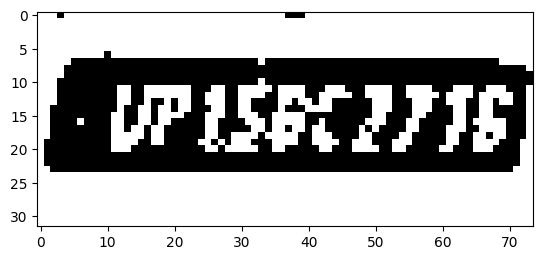

height =  148 width =  222


[128.11224365234375, 83.72463989257812, 176.6847381591797, 105.5210189819336, 0.8817720413208008, 0.0] track_id: 331.0
-0.18131977440149022


['3pa']
license before check 3pa
hello
License Plate Number with contours :  None , Score :  None
-0.15776873759595397


[]
License Plate Number :  None , Score :  None
[0.0, 79.25895690917969, 4.970714092254639, 101.03598022460938, 0.2887137830257416, 0.0] track_id: 331.0
[]
License Plate Number :  None , Score :  None
height =  261 width =  255


[112.6133041381836, 162.95834350585938, 188.2638702392578, 197.87672424316406, 0.8881155252456665, 0.0] track_id: 333.0
0.0


['WJSAcIJe']
license before check WJSAcIJe
hello
License Plate Number with contours :  None , Score :  None
0.0
['DPiezIq']
license before check DPiezIq
hello
License Plate Number :  None , Score :  None
height =  147 width =  222


[129.13394165039062, 83.98670959472656, 177.53346252441406, 105.59793090820312, 0.8700156211853027, 0.0] track_id: 331.0
-0.14888994760949725
[0.0, 78.91558074951172, 6.640426158905029, 109.29589080810547, 0.47812095284461975, 0.0] track_id: 331.0
[]
License Plate Number :  None , Score :  None
height =  273 width =  263


[116.93304443359375, 168.84056091308594, 195.2266082763672, 208.37283325195312, 0.8895887732505798, 0.0] track_id: 333.0
-0.07304056530311932


['15502216']
license before check 15502216
hello
License Plate Number with contours :  None , Score :  None
-0.2216495629786776
['VJ5802216']
license before check VJ5802216
license after check VJ5802216
License Plate Number :  VJ58O2216 , Score :  0.04599922052750878


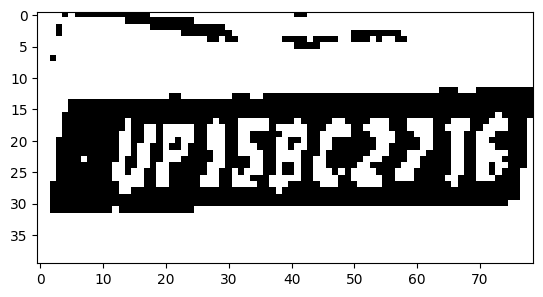

height =  147 width =  222
[129.06663513183594, 84.08277130126953, 177.67884826660156, 105.59703063964844, 0.8624355792999268, 0.0] track_id: 331.0
-0.20401797959254858
height =  280 width =  271


[120.91007995605469, 173.59939575195312, 201.84042358398438, 211.77052307128906, 0.890160858631134, 0.0] track_id: 333.0
0.03277514440407577
['VISEL7464']
license before check VISEL7464
license after check VISEL7464
License Plate Number with contours :  VI5EL7464 , Score :  0.006193318545407283


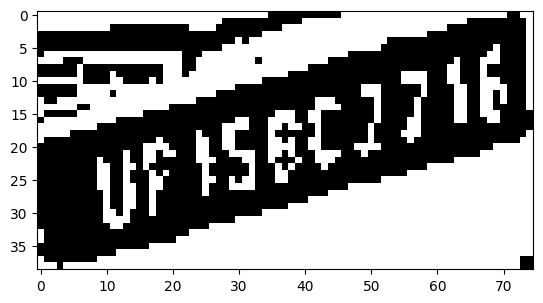

height =  145 width =  223


[129.57186889648438, 83.45670318603516, 178.15074157714844, 104.22327423095703, 0.8762653470039368, 0.0] track_id: 331.0
-0.14888994760949725


['31ttn']
license before check 31ttn
hello
License Plate Number with contours :  None , Score :  None
-0.17324566645236494
['Mbuntr']
license before check Mbuntr
hello
License Plate Number :  None , Score :  None
height =  290 width =  281


[125.18760681152344, 179.2202911376953, 208.6572723388672, 220.9604949951172, 0.8885268568992615, 0.0] track_id: 333.0
-0.23602367862589738
['VfISRC2716']
license before check VfISRC2716
license after check VFISRC2716
License Plate Number with contours :  VF1SRC2716 , Score :  0.07796886654245322


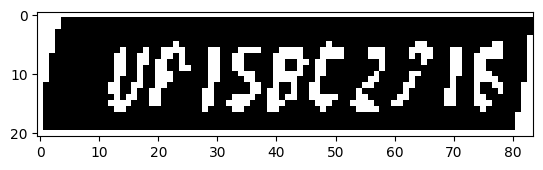

height =  144 width =  223
[128.00184631347656, 83.53538513183594, 176.4971466064453, 104.12966918945312, 0.8645086884498596, 0.0] track_id: 331.0
-0.16292645885037274
height =  298 width =  289


[128.78939819335938, 188.03329467773438, 215.2351837158203, 227.60643005371094, 0.8824828863143921, 0.0] track_id: 333.0
-0.056757157822093396


['ISB2716']
license before check ISB2716
hello
License Plate Number with contours :  None , Score :  None
-0.22244726542594168
['UP158C2746']
license before check UP158C2746
hello
License Plate Number :  None , Score :  None
height =  142 width =  222


[125.72463989257812, 83.42083740234375, 174.17201232910156, 104.07200622558594, 0.7963303923606873, 0.0] track_id: 331.0
-0.153707529058479


[]
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['eonn']
license before check eonn
hello
License Plate Number :  None , Score :  None
height =  311 width =  303


[137.3232879638672, 203.0009002685547, 226.85964965820312, 239.2487335205078, 0.8948161602020264, 0.0] track_id: 333.0
-0.24220858710962045


['UP1586716']
license before check UP1586716
hello
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['VPI58C2286']
license before check VPI58C2286
hello
License Plate Number :  None , Score :  None
height =  138 width =  218
[122.04296112060547, 83.94520568847656, 170.59669494628906, 105.72801208496094, 0.8961339592933655, 0.0] track_id: 331.0
-0.14888994760949725
height =  321 width =  314


[144.55323791503906, 206.63458251953125, 236.8426055908203, 245.76905822753906, 0.8925576210021973, 0.0] track_id: 333.0
0.0302937599187751


['15802716']
license before check 15802716
hello
License Plate Number with contours :  None , Score :  None
0.0
['Up158C2716']
license before check Up158C2716
hello
License Plate Number :  None , Score :  None
height =  137 width =  215
[117.93862915039062, 84.04076385498047, 166.41249084472656, 105.31092834472656, 0.8693562746047974, 0.0] track_id: 331.0
-0.18534794999569476
height =  332 width =  325


[148.2209930419922, 215.81072998046875, 245.95521545410156, 254.93019104003906, 0.8943507671356201, 0.0] track_id: 333.0
-0.2342552135942509
['UP58C2716']
license before check UP58C2716
license after check UP58C2716
License Plate Number with contours :  UP58C2716 , Score :  0.30635339143748175


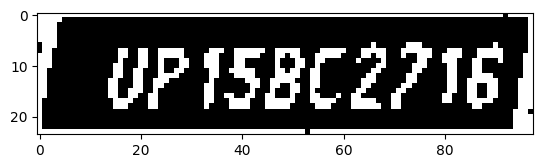

height =  136 width =  213
[114.63015747070312, 83.48674011230469, 162.54824829101562, 103.45329284667969, 0.8403792977333069, 0.0] track_id: 331.0
-0.15660187698201536
height =  347 width =  335


[152.06161499023438, 225.17010498046875, 253.4739227294922, 263.88116455078125, 0.8838794231414795, 0.0] track_id: 333.0
-0.23996617377864618
['UPISBC2716']
license before check UPISBC2716
license after check UPISBC2716
License Plate Number with contours :  UP1SBC2716 , Score :  0.5735406340595586


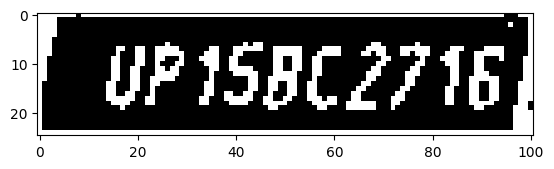

height =  136 width =  210
[112.7726821899414, 83.67271423339844, 160.65724182128906, 102.69955444335938, 0.6984027028083801, 0.0] track_id: 331.0
-0.15160548743827282
height =  362 width =  350


[159.8972625732422, 236.58702087402344, 265.45391845703125, 279.57452392578125, 0.8963941335678101, 0.0] track_id: 333.0
-0.22868682567222423
['UPISBC2716']
license before check UPISBC2716
license after check UPISBC2716
License Plate Number with contours :  UP1SBC2716 , Score :  0.5348640019716194


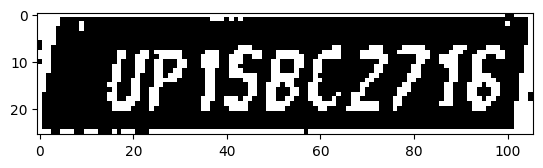

[323.41986083984375, 21.702579498291016, 349.3220520019531, 36.67266845703125, 0.7960774302482605, 0.0] track_id: 333.0
-0.14531001063570212


[]
License Plate Number with contours :  None , Score :  None
[]
License Plate Number :  None , Score :  None
height =  138 width =  210


[113.65072631835938, 83.57423400878906, 161.52894592285156, 104.80884552001953, 0.7122006416320801, 0.0] track_id: 331.0
-0.16292645885037274


[]
License Plate Number with contours :  None , Score :  None
-0.17324566645236494
['Janrjo']
license before check Janrjo
hello
License Plate Number :  None , Score :  None
height =  174 width =  155
height =  373 width =  363


[166.60134887695312, 245.6339874267578, 276.02886962890625, 289.7027893066406, 0.8877766728401184, 0.0] track_id: 333.0
-0.24146373911362573


['UP158C2716']
license before check UP158C2716
hello
License Plate Number with contours :  None , Score :  None
-0.22503828649260516


['UP158C2716']
license before check UP158C2716
hello
License Plate Number :  None , Score :  None
[316.6867980957031, 14.155355453491211, 361.8030700683594, 34.95109558105469, 0.8260146975517273, 0.0] track_id: 333.0
-0.14888994760949725


[]
License Plate Number with contours :  None , Score :  None
-0.15264932839526515
['SOMMty']
license before check SOMMty
hello
License Plate Number :  None , Score :  None
height =  140 width =  209
[113.49176788330078, 82.93446350097656, 161.69381713867188, 103.32951354980469, 0.734713077545166, 0.0] track_id: 331.0
-0.1707352114752828
height =  176 width =  154
height =  384 width =  376


[308.6705322265625, 11.861311912536621, 355.0987548828125, 31.436399459838867, 0.8953545093536377, 0.0] track_id: 333.0
-0.153707529058479


['adutto']
license before check adutto
hello
License Plate Number with contours :  None , Score :  None
-0.15776873759595397


['aunt']
license before check aunt
hello
License Plate Number :  None , Score :  None
[173.2742156982422, 242.13336181640625, 287.2316589355469, 301.5739440917969, 0.8827536702156067, 0.0] track_id: 333.0
-0.2260683879938839


['UP1SBCZ716']
license before check UP1SBCZ716
hello
License Plate Number with contours :  None , Score :  None
-0.23052183904336873
['Up158C2716']
license before check Up158C2716
hello
License Plate Number :  None , Score :  None
height =  137 width =  203
[106.8746109008789, 83.75645446777344, 155.23634338378906, 103.44930267333984, 0.6694514155387878, 0.0] track_id: 331.0
-0.171148605416182
height =  177 width =  160
height =  401 width =  397


[185.70101928710938, 259.2177429199219, 304.3002014160156, 317.54107666015625, 0.894363284111023, 0.0] track_id: 333.0
-0.23109066719589708
['UP1SBC2716']
license before check UP1SBC2716
license after check UP1SBC2716
License Plate Number with contours :  UP1SBC2716 , Score :  0.4714610980365006


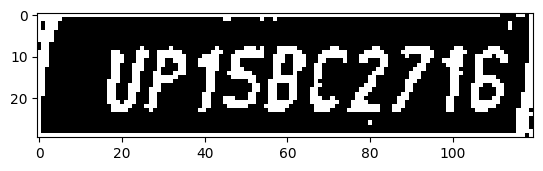

[304.39642333984375, 8.705551147460938, 352.0709228515625, 28.44416046142578, 0.8595287799835205, 0.0] track_id: 333.0
-0.15776873759595397
['Dant']
license before check Dant
hello
License Plate Number :  None , Score :  None
height =  135 width =  205
[108.8719253540039, 84.04444122314453, 156.96072387695312, 102.50999450683594, 0.5706125497817993, 0.0] track_id: 331.0
0.01999733397315053
height =  183 width =  164
height =  420 width =  417


[297.3898010253906, 5.448909759521484, 346.32135009765625, 26.465492248535156, 0.8875682353973389, 0.0] track_id: 333.0
-0.15264932839526515


[]
License Plate Number :  None , Score :  None
[196.15431213378906, 279.1954345703125, 322.4620666503906, 331.2447509765625, 0.882401704788208, 0.0] track_id: 333.0
-0.22734380712800387


['UP158C2716']
license before check UP158C2716
hello
License Plate Number with contours :  None , Score :  None
-0.2247111684146427
['Up158C27167']
license before check Up158C27167
hello
License Plate Number :  None , Score :  None
height =  133 width =  211
[115.06015014648438, 83.57006072998047, 163.23983764648438, 104.13158416748047, 0.6395550966262817, 0.0] track_id: 331.0
-0.17137912638950764
height =  193 width =  169
height =  442 width =  442


[211.9991912841797, 292.19073486328125, 344.3889465332031, 352.74383544921875, 0.8952711224555969, 0.0] track_id: 333.0
-0.2412403627840635
['Up15BC2716']
license before check Up15BC2716
license after check UP15BC2716
License Plate Number with contours :  UP15BC2716 , Score :  0.38821508977961433


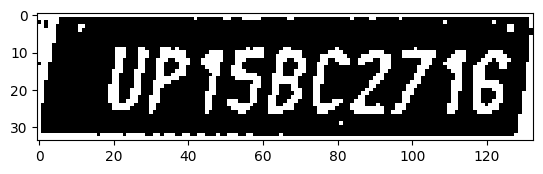

[294.6665344238281, 2.760634660720825, 341.803955078125, 22.590938568115234, 0.748710572719574, 0.0] track_id: 333.0
-0.16514867741462683
[]
License Plate Number :  None , Score :  None
height =  132 width =  215
height =  197 width =  175
height =  466 width =  468


[230.3119659423828, 296.0860900878906, 368.1625061035156, 372.64434814453125, 0.8971065282821655, 0.0] track_id: 333.0
-0.22581168154335537


['5B']
license before check 5B
hello
License Plate Number with contours :  None , Score :  None
-0.2157661964070423
['UP158C2716']
license before check UP158C2716
hello
License Plate Number :  None , Score :  None
height =  130 width =  216
height =  201 width =  183
height =  492 width =  499
[249.12686157226562, 331.0382080078125, 396.3542785644531, 396.7597351074219, 0.9037843346595764, 0.0] track_id: 333.0
-0.22821194179065735
height =  121 width =  218
height =  204 width =  189
height =  516 width =  534
[270.6925354003906, 344.9956359863281, 426.83807373046875, 415.4283142089844, 0.8993374705314636, 0.0] track_id: 333.0
-0.2333737682517934
height =  115 width =  221
height =  207 width =  193
height =  549 width =  572


[297.17694091796875, 368.5260009765625, 462.0763244628906, 447.3631286621094, 0.9088509678840637, 0.0] track_id: 333.0
-0.24497866312686414
['UP15BC2716']
license before check UP15BC2716
license after check UP15BC2716
License Plate Number with contours :  UP15BC2716 , Score :  0.6841539369932965


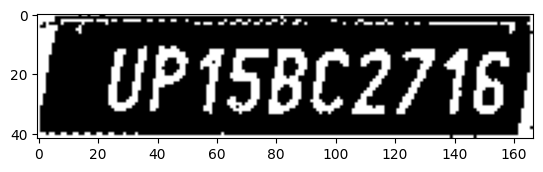

height =  110 width =  219
height =  213 width =  203
height =  580 width =  616


[327.53936767578125, 395.8207092285156, 503.50262451171875, 479.1915283203125, 0.9151535630226135, 0.0] track_id: 333.0
-0.24120034357486445
['UP1SBC2716']
license before check UP1SBC2716
license after check UP1SBC2716
License Plate Number with contours :  UP1SBC2716 , Score :  0.6310730552953321


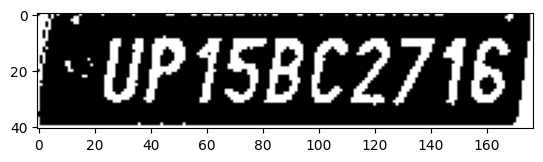

height =  113 width =  220
[123.74689483642578, 83.47899627685547, 169.73184204101562, 103.39385223388672, 0.6831179857254028, 0.0] track_id: 331.0
-0.153707529058479
height =  220 width =  213
height =  621 width =  665


[363.83734130859375, 435.0790100097656, 551.7661743164062, 523.8295288085938, 0.9178922176361084, 0.0] track_id: 333.0
-0.24183895601830027
['UP1SBC2716']
license before check UP1SBC2716
license after check UP1SBC2716
License Plate Number with contours :  UP1SBC2716 , Score :  0.9649638145980189


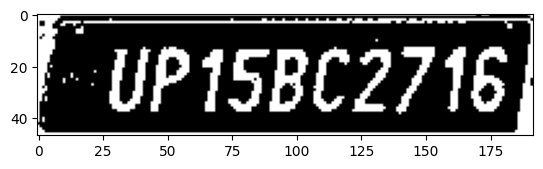

height =  117 width =  219
[124.5455551147461, 83.1661605834961, 171.20184326171875, 102.01544189453125, 0.4602730870246887, 0.0] track_id: 331.0
-0.1470783553884025
height =  224 width =  222
height =  673 width =  723


[408.5066223144531, 473.662841796875, 608.7537231445312, 570.2349853515625, 0.9174419045448303, 0.0] track_id: 333.0
-0.24497866312686414
['UP1SBC2716']
license before check UP1SBC2716
license after check UP1SBC2716
License Plate Number with contours :  UP1SBC2716 , Score :  0.6195908959515759


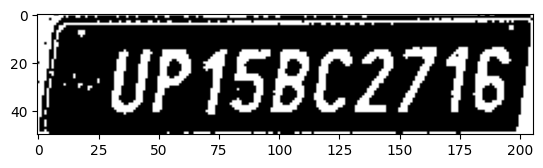

height =  124 width =  218
[122.70597839355469, 83.64613342285156, 171.3874053955078, 103.95012664794922, 0.7697300314903259, 0.0] track_id: 331.0
-0.15660187698201536
height =  230 width =  232
height =  725 width =  791


[464.5169677734375, 519.80810546875, 677.471923828125, 623.9304809570312, 0.9155152440071106, 0.0] track_id: 333.0
-0.2590457304891398
['UP1SBC2716']
license before check UP1SBC2716
license after check UP1SBC2716
License Plate Number with contours :  UP1SBC2716 , Score :  0.274902128906262


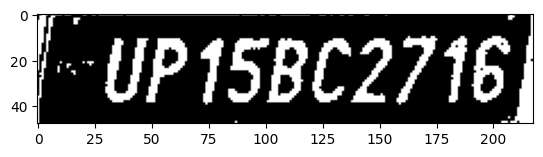

height =  133 width =  219


[122.81379699707031, 83.28167724609375, 171.11390686035156, 103.80204772949219, 0.8669859766960144, 0.0] track_id: 331.0
-0.21406068356382152


[]
License Plate Number with contours :  None , Score :  None
-0.16514867741462683
['Waut']
license before check Waut
hello
License Plate Number :  None , Score :  None
height =  235 width =  241
height =  790 width =  867


[527.631591796875, 572.4356689453125, 756.6947021484375, 685.1277465820312, 0.9141863584518433, 0.0] track_id: 333.0
-0.27656855859928864


['6']
license before check 6
hello
License Plate Number with contours :  None , Score :  None
-0.2775894318518023
['UP1SBC2716']
license before check UP1SBC2716
license after check UP1SBC2716
License Plate Number :  UP1SBC2716 , Score :  0.7436082949351694


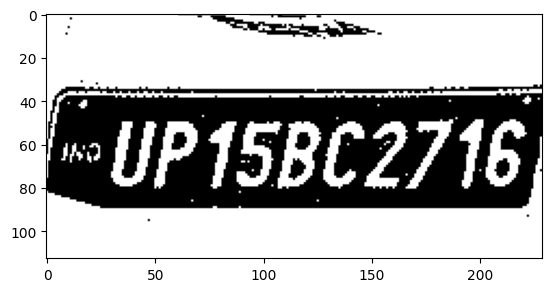

height =  141 width =  219


[120.22351837158203, 84.2199478149414, 168.82981872558594, 102.50916290283203, 0.7192770838737488, 0.0] track_id: 331.0
-0.14756807131399477


[]
License Plate Number with contours :  None , Score :  None
-0.14531001063570212
['oeija']
license before check oeija
hello
License Plate Number :  None , Score :  None
height =  244 width =  252
height =  869 width =  953


[610.6819458007812, 638.0488891601562, 849.9965209960938, 763.2933959960938, 0.9230804443359375, 0.0] track_id: 333.0
-0.34980441692598646
['UP15BC2716']
license before check UP15BC2716
license after check UP15BC2716
License Plate Number with contours :  UP15BC2716 , Score :  0.9622060640866897


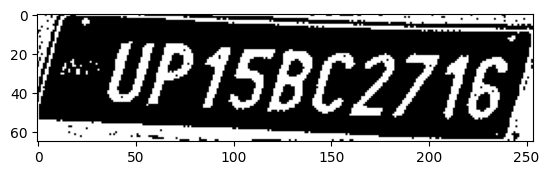

height =  145 width =  218
[118.39127349853516, 83.64553833007812, 166.39892578125, 104.01447296142578, 0.8583002090454102, 0.0] track_id: 331.0
-0.153707529058479
height =  256 width =  260


[123.01075744628906, 180.698974609375, 158.5042724609375, 205.20181274414062, 0.28225284814834595, 0.0] track_id: 334.0
-0.20902294280626463


['f']
license before check f
hello
License Plate Number with contours :  None , Score :  None
-0.23109066719589708
[]
License Plate Number :  None , Score :  None
height =  964 width =  1053


[710.6166381835938, 721.3460693359375, 963.4285888671875, 859.7968139648438, 0.9107792973518372, 0.0] track_id: 333.0
-0.34653886443394183
['UP15BC2716']
license before check UP15BC2716
license after check UP15BC2716
License Plate Number with contours :  UP15BC2716 , Score :  0.7956186280725446


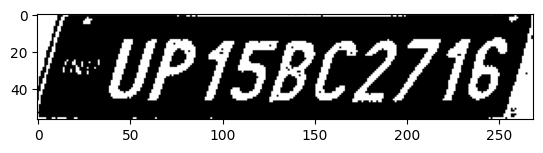

[0.13831235468387604, 121.34526824951172, 51.2890510559082, 153.13563537597656, 0.599406361579895, 0.0] track_id: 333.0
-0.20131710837464076
[]
License Plate Number :  None , Score :  None
height =  143 width =  218
[119.51004028320312, 84.42652130126953, 167.3750457763672, 104.47457885742188, 0.8163176774978638, 0.0] track_id: 331.0
-0.17722538494971946
height =  263 width =  270


[130.021728515625, 174.3216094970703, 182.1772003173828, 215.31524658203125, 0.47533318400382996, 0.0] track_id: 334.0
-0.20202515640359237


['UnJOIF']
license before check UnJOIF
hello
License Plate Number with contours :  None , Score :  None
-0.21243202050874216
['UP12404']
license before check UP12404
hello
License Plate Number :  None , Score :  None
height =  1068 width =  1163


[836.1569213867188, 777.2728881835938, 1091.0408935546875, 958.770263671875, 0.9065597653388977, 0.0] track_id: 333.0
-0.39983110074288014


['U']
license before check U
hello
License Plate Number with contours :  None , Score :  None
-0.38189045927352583


['UP158C2716']
license before check UP158C2716
hello
License Plate Number :  None , Score :  None
[0.34377968311309814, 114.08943176269531, 60.82046127319336, 148.86920166015625, 0.5011550188064575, 0.0] track_id: 333.0
-0.22810262827994277
['P1Zu104GS']
license before check P1Zu104GS
hello
License Plate Number :  None , Score :  None
height =  139 width =  210
[113.05963134765625, 84.36529541015625, 161.34210205078125, 105.74312591552734, 0.8518423438072205, 0.0] track_id: 331.0
-0.14756807131399477
height =  269 width =  282


[136.15548706054688, 178.87908935546875, 204.2080535888672, 222.7201690673828, 0.7195120453834534, 0.0] track_id: 334.0
-0.21195763724261935


['12oz6y']
license before check 12oz6y
hello
License Plate Number with contours :  None , Score :  None
-0.22679884805388587
['UP1z1o765']
license before check UP1z1o765
license after check UP1Z1O765
License Plate Number :  UP1ZI0765 , Score :  0.011991760085359408


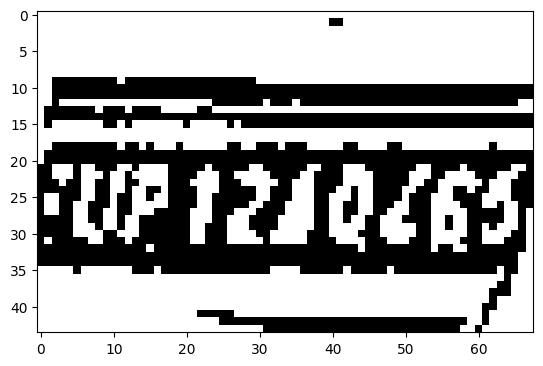

height =  1190 width =  1281


[982.6241455078125, 893.3165283203125, 1230.6942138671875, 1099.3133544921875, 0.5488898754119873, 0.0] track_id: 333.0
-0.4885258343889829


[]
License Plate Number with contours :  None , Score :  None
-0.4872918505582721


['UP158C2716']
license before check UP158C2716
hello
License Plate Number :  None , Score :  None
[0.034187301993370056, 109.13119506835938, 57.843482971191406, 143.74818420410156, 0.4556572437286377, 0.0] track_id: 333.0
-0.2063238940297175
['12102652']
license before check 12102652
hello
License Plate Number :  None , Score :  None
height =  138 width =  206


[108.71918487548828, 83.4229965209961, 157.09181213378906, 104.40557098388672, 0.8215059041976929, 0.0] track_id: 331.0
-0.15264932839526515


[]
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['Molt']
license before check Molt
hello
License Plate Number :  None , Score :  None
height =  280 width =  294


[141.89617919921875, 192.01705932617188, 221.0869903564453, 229.99349975585938, 0.8951939940452576, 0.0] track_id: 334.0
-0.22527677921405528


['UP124d658']
license before check UP124d658
hello
License Plate Number with contours :  None , Score :  None
-0.20749622643520266
['UP12402654']
license before check UP12402654
license after check UP12402654
License Plate Number :  UP12AO2654 , Score :  0.3051449172161161


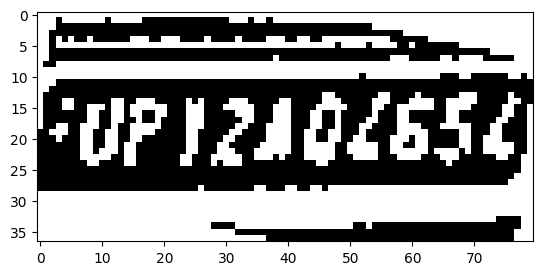

height =  1256 width =  1409


[0.0, 97.650146484375, 46.50187683105469, 134.88693237304688, 0.5184382200241089, 0.0] track_id: 333.0
-0.2284966392918623
['102654']
license before check 102654
hello
License Plate Number :  None , Score :  None
height =  136 width =  206


[107.9225845336914, 83.90068054199219, 156.0550994873047, 103.60691833496094, 0.8202994465827942, 0.0] track_id: 331.0
-0.18822150530477078


[]
License Plate Number with contours :  None , Score :  None
-0.1775961672834879
['Qutmo']
license before check Qutmo
hello
License Plate Number :  None , Score :  None
height =  288 width =  306


[148.7030792236328, 201.30599975585938, 229.49041748046875, 240.90403747558594, 0.9045420289039612, 0.0] track_id: 334.0
-0.20278150417940963
['Ur1240652']
license before check Ur1240652
license after check UR1240652
License Plate Number with contours :  UR12A0652 , Score :  0.13302468832058464


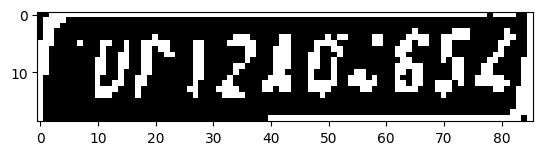

height =  1266 width =  1548
height =  134 width =  207


[108.57594299316406, 84.77408599853516, 156.8755645751953, 103.3596420288086, 0.7848994135856628, 0.0] track_id: 331.0
-0.14756807131399477


['Aeodtan']
license before check Aeodtan
hello
License Plate Number with contours :  None , Score :  None
-0.16910122600137703
['unta']
license before check unta
hello
License Plate Number :  None , Score :  None
height =  295 width =  322


[156.33274841308594, 209.93185424804688, 240.67918395996094, 250.1090087890625, 0.9041895866394043, 0.0] track_id: 334.0
-0.21969669474127057
['P12102652']
license before check P12102652
license after check P12102652
License Plate Number with contours :  PI21O2652 , Score :  0.29467891511402156


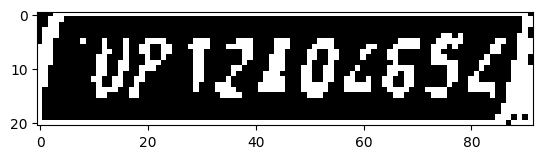

[305.303466796875, 19.962736129760742, 322.0, 46.04206466674805, 0.39647406339645386, 0.0] track_id: 334.0
height =  1249 width =  1679
height =  134 width =  208


[109.64044952392578, 84.688720703125, 158.29986572265625, 101.87506103515625, 0.7919251322746277, 0.0] track_id: 331.0
-0.14955973987370316


['1innny']
license before check 1innny
hello
License Plate Number with contours :  None , Score :  None
-0.1470783553884025
['uittt']
license before check uittt
hello
License Plate Number :  None , Score :  None
height =  305 width =  339


[165.62083435058594, 216.31832885742188, 253.60812377929688, 259.609375, 0.9010157585144043, 0.0] track_id: 334.0
-0.20304521725346514


['Uptziv652']
license before check Uptziv652
hello
License Plate Number with contours :  None , Score :  None
-0.20687394897974307


['FUP12402652']
license before check FUP12402652
hello
License Plate Number :  None , Score :  None
[302.7064514160156, 23.75019073486328, 338.9676818847656, 43.45213317871094, 0.5316848158836365, 0.0] track_id: 334.0
-0.1555948279770297


[]
License Plate Number with contours :  None , Score :  None
-0.15991312315821926
[]
License Plate Number :  None , Score :  None
height =  1232 width =  1796
height =  136 width =  210


[111.80941009521484, 83.94969177246094, 160.09368896484375, 102.2081298828125, 0.7949591279029846, 0.0] track_id: 331.0
-0.15660187698201536


['initan']
license before check initan
hello
License Plate Number with contours :  None , Score :  None
-0.16514867741462683
['ult']
license before check ult
hello
License Plate Number :  None , Score :  None
height =  314 width =  352


[173.88914489746094, 227.2130126953125, 265.480712890625, 270.4793701171875, 0.9078525900840759, 0.0] track_id: 334.0
-0.19410609803032688


['FuP12402654']
license before check FuP12402654
hello
License Plate Number with contours :  None , Score :  None
-0.21264492235777152


['FvP12102652']
license before check FvP12102652
hello
License Plate Number :  None , Score :  None
[297.7635192871094, 22.498722076416016, 345.56121826171875, 41.459068298339844, 0.7951512336730957, 0.0] track_id: 334.0
-0.15160548743827282


['dutita']
license before check dutita
hello
License Plate Number with contours :  None , Score :  None
-0.15776873759595397
['Uunt']
license before check Uunt
hello
License Plate Number :  None , Score :  None
height =  1208 width =  1852
height =  136 width =  211


[113.0134048461914, 83.9471206665039, 162.0596923828125, 103.18132019042969, 0.6968346238136292, 0.0] track_id: 331.0
-0.18822150530477078


[]
License Plate Number with contours :  None , Score :  None
-0.15431877592611903
['huintzi']
license before check huintzi
hello
License Plate Number :  None , Score :  None
height =  329 width =  371


[185.5574188232422, 238.82431030273438, 280.38238525390625, 284.15911865234375, 0.9054273962974548, 0.0] track_id: 334.0
-0.19968388537510157
['UP12h026s4']
license before check UP12h026s4
license after check UP12H026S4
License Plate Number with contours :  UP12HO2654 , Score :  0.13465480606718783


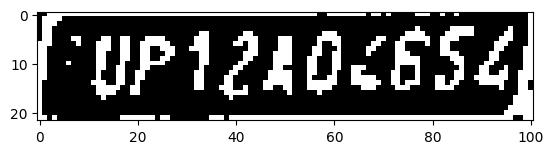

[294.1077575683594, 23.205318450927734, 342.3403625488281, 41.24542999267578, 0.8047440052032471, 0.0] track_id: 334.0
-0.153707529058479


[]
License Plate Number with contours :  None , Score :  None
-0.14531001063570212
[]
License Plate Number :  None , Score :  None
height =  1174 width =  1819
height =  138 width =  214


[115.56576538085938, 84.02114868164062, 164.2303466796875, 101.279052734375, 0.5832334160804749, 0.0] track_id: 331.0
-0.15460054543120083


[]
License Plate Number with contours :  None , Score :  None
-0.17219081452293902
['Dunt4']
license before check Dunt4
hello
License Plate Number :  None , Score :  None
height =  340 width =  392


[199.16465759277344, 249.76959228515625, 298.545654296875, 297.97576904296875, 0.9064180254936218, 0.0] track_id: 334.0
-0.22899423420849846


['Upiznozssz']
license before check Upiznozssz
hello
License Plate Number with contours :  None , Score :  None
-0.20539538918976738
['FUp12402652']
license before check FUp12402652
hello
License Plate Number :  None , Score :  None
[291.7983093261719, 23.320556640625, 339.89599609375, 40.79741287231445, 0.7817263603210449, 0.0] track_id: 334.0
-0.18092646075412158
height =  1128 width =  1729
height =  138 width =  213
height =  357 width =  410


[212.10147094726562, 264.1519775390625, 314.7999572753906, 313.8917541503906, 0.9021524786949158, 0.0] track_id: 334.0
-0.20795854725293414
['UP12R02652']
license before check UP12R02652
license after check UP12R02652
License Plate Number with contours :  UP12RO2652 , Score :  0.38850412845641547


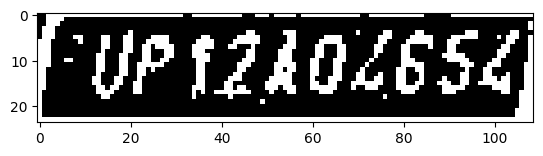

height =  137 width =  213
height =  373 width =  429


[224.3665313720703, 276.73980712890625, 331.8879699707031, 328.3402099609375, 0.9133827686309814, 0.0] track_id: 334.0
-0.20795854725293414
['UP12402654']
license before check UP12402654
license after check UP12402654
License Plate Number with contours :  UP12AO2654 , Score :  0.2919888170200096


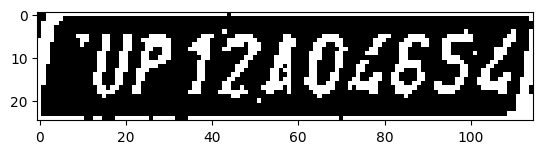

height =  126 width =  216
height =  387 width =  451


[239.38265991210938, 288.7563171386719, 352.73919677734375, 342.6739501953125, 0.9182712435722351, 0.0] track_id: 334.0
-0.19178814198670507
['UP12402554']
license before check UP12402554
license after check UP12402554
License Plate Number with contours :  UP12AO2554 , Score :  0.6130187335276852


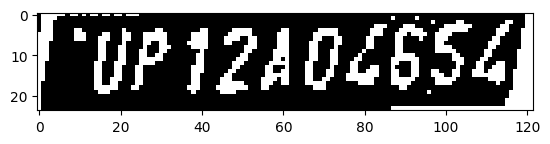

height =  111 width =  224
height =  405 width =  476


[255.65411376953125, 302.71527099609375, 374.4510192871094, 358.77764892578125, 0.9137111902236938, 0.0] track_id: 334.0
-0.20749622643520266


['UP12A0L6521']
license before check UP12A0L6521
hello
License Plate Number with contours :  None , Score :  None
-0.21109333322274654
['EUP12102652']
license before check EUP12102652
hello
License Plate Number :  None , Score :  None
height =  797 width =  960
height =  100 width =  224
height =  426 width =  505


[276.16790771484375, 320.1961975097656, 401.3043518066406, 379.3933410644531, 0.909622311592102, 0.0] track_id: 334.0
-0.23071655572812796
['UP12404652']
license before check UP12404652
license after check UP12404652
License Plate Number with contours :  UP12AO4652 , Score :  0.8324985696171394


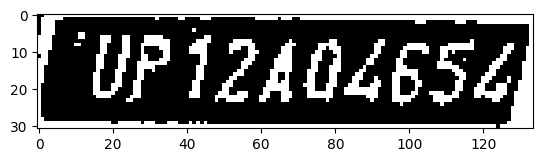

height =  672 width =  555
height =  99 width =  225
height =  451 width =  539


[300.60791015625, 342.0738220214844, 432.0072021484375, 403.07794189453125, 0.9163938760757446, 0.0] track_id: 334.0
-0.2222921184254023
['UP12404654']
license before check UP12404654
license after check UP12404654
License Plate Number with contours :  UP12AO4654 , Score :  0.5602378314469749


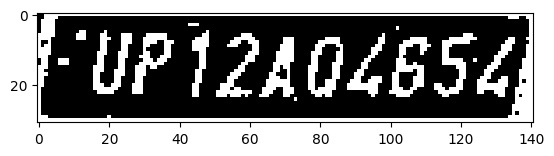

height =  102 width =  226
height =  475 width =  571


[322.4385986328125, 358.59222412109375, 462.07147216796875, 422.66058349609375, 0.917449951171875, 0.0] track_id: 334.0
-0.21026034715968
['UP12402554']
license before check UP12402554
license after check UP12402554
License Plate Number with contours :  UP12AO2554 , Score :  0.4505716412483136


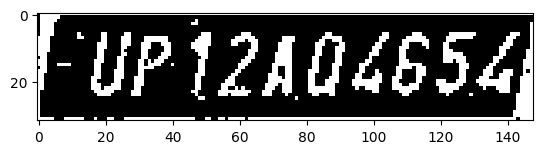

height =  109 width =  227
height =  507 width =  615


[354.780029296875, 387.05712890625, 501.08770751953125, 455.09307861328125, 0.9144775867462158, 0.0] track_id: 334.0
-0.22512567616292364


['UP124046541']
license before check UP124046541
hello
License Plate Number with contours :  None , Score :  None
-0.20831556258942585
['FUP12404652']
license before check FUP12404652
hello
License Plate Number :  None , Score :  None
height =  119 width =  229
height =  540 width =  660


[392.9775390625, 414.49017333984375, 549.706298828125, 488.67633056640625, 0.9225957989692688, 0.0] track_id: 334.0
-0.22679884805388587
['UP12404654']
license before check UP12404654
license after check UP12404654
License Plate Number with contours :  UP12AO4654 , Score :  0.6075451696043617


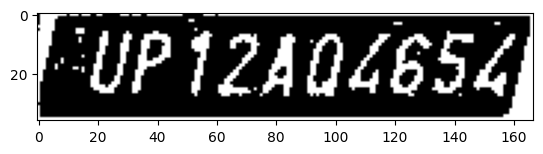

height =  128 width =  228


[132.41836547851562, 83.5181655883789, 174.1158447265625, 103.64676666259766, 0.8207662105560303, 0.0] track_id: 331.0
-0.16292645885037274


[]
License Plate Number with contours :  None , Score :  None
-0.16910122600137703
['Tu']
license before check Tu
hello
License Plate Number :  None , Score :  None
height =  576 width =  703


[431.4181823730469, 443.2344055175781, 596.47021484375, 523.153076171875, 0.9117798209190369, 0.0] track_id: 334.0
-0.1908311027212619
['UP12a026s4']
license before check UP12a026s4
license after check UP12A026S4
License Plate Number with contours :  UP12AO2654 , Score :  0.1855941073353967


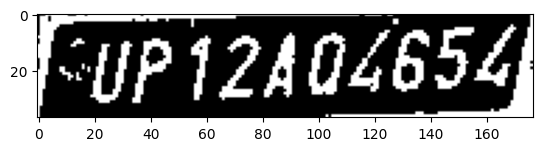

height =  135 width =  225
height =  620 width =  765


[481.5914306640625, 483.2440185546875, 657.4520874023438, 567.6349487304688, 0.9203352332115173, 0.0] track_id: 334.0
-0.24358590636724095
['UP12404654']
license before check UP12404654
license after check UP12404654
License Plate Number with contours :  UP12AO4654 , Score :  0.4976910812961138


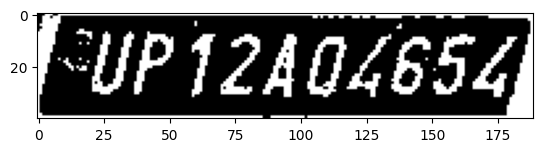

height =  141 width =  224
height =  669 width =  829


[537.9324340820312, 526.7422485351562, 723.1906127929688, 620.6552124023438, 0.9170399308204651, 0.0] track_id: 334.0
-0.23949926591015905


['FUP12404654']
license before check FUP12404654
hello
License Plate Number with contours :  None , Score :  None
-0.24094100000807706
['EUP12404654']
license before check EUP12404654
hello
License Plate Number :  None , Score :  None
height =  147 width =  226
height =  724 width =  898


[605.9449462890625, 575.9876708984375, 802.7467651367188, 681.7894897460938, 0.9150101542472839, 0.0] track_id: 334.0
-0.27898741680588834
['UP12404654']
license before check UP12404654
license after check UP12404654
License Plate Number with contours :  UP12AO4654 , Score :  0.5168426555322243


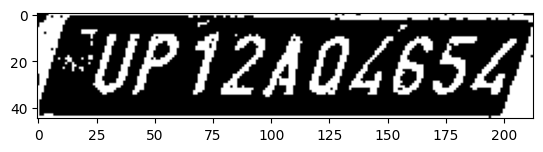

height =  149 width =  225
[130.63128662109375, 84.15986633300781, 177.94561767578125, 101.91567993164062, 0.5323906540870667, 0.0] track_id: 331.0
-0.1610919045375805
height =  790 width =  981


[690.8106079101562, 625.557861328125, 894.6069946289062, 749.1566772460938, 0.8939446210861206, 0.0] track_id: 334.0
-0.31076198571390856


['FUP12404652']
license before check FUP12404652
hello
License Plate Number with contours :  None , Score :  None
-0.3002814608925302
['MUP12404654']
license before check MUP12404654
hello
License Plate Number :  None , Score :  None
height =  149 width =  224
[131.28724670410156, 84.31448364257812, 177.67494201660156, 102.3095932006836, 0.6281430721282959, 0.0] track_id: 331.0
-0.1558682013983225
height =  868 width =  1074


[788.2371215820312, 677.8681640625, 997.96630859375, 827.7727661132812, 0.8323796391487122, 0.0] track_id: 334.0
-0.3321940389321956


['FUP12404654']
license before check FUP12404654
hello
License Plate Number with contours :  None , Score :  None
-0.31038740713235147
['EUP12404652']
license before check EUP12404652
hello
License Plate Number :  None , Score :  None
height =  150 width =  223


[130.5707550048828, 84.22779846191406, 177.7086639404297, 101.7911376953125, 0.6011504530906677, 0.0] track_id: 331.0
-0.14955973987370316


[]
License Plate Number with contours :  None , Score :  None
-0.13800602365751946
['R4']
license before check R4
hello
License Plate Number :  None , Score :  None
height =  952 width =  1176


[898.300537109375, 741.62353515625, 1112.14501953125, 914.8911743164062, 0.562991738319397, 0.0] track_id: 334.0
-0.3828446425313149


['FUP1240465']
license before check FUP1240465
hello
License Plate Number with contours :  None , Score :  None
-0.38549386692932924
['UP12402654']
license before check UP12402654
license after check UP12402654
License Plate Number :  UP12AO2654 , Score :  0.7527259129001131


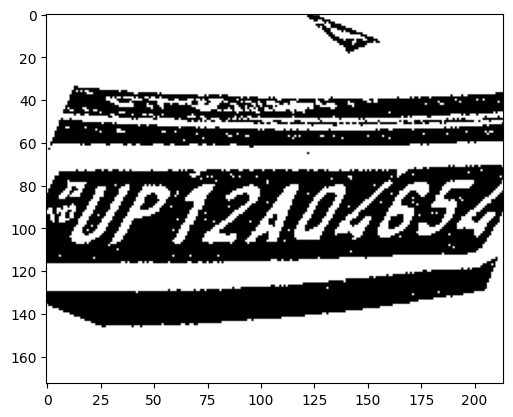

height =  150 width =  223
[130.582763671875, 84.21748352050781, 177.98245239257812, 101.82990264892578, 0.5752212405204773, 0.0] track_id: 331.0
-0.15160548743827282
height =  1056 width =  1280


[1021.06689453125, 831.8509521484375, 1237.416259765625, 1008.8826904296875, 0.5747630000114441, 0.0] track_id: 334.0
-0.5023691649809097


[]
License Plate Number with contours :  None , Score :  None
-0.45374694241281754
['GUP12402652']
license before check GUP12402652
hello
License Plate Number :  None , Score :  None
height =  150 width =  224
[131.31773376464844, 84.05744934082031, 178.41798400878906, 101.32539367675781, 0.6469070315361023, 0.0] track_id: 331.0
-0.15160548743827282
height =  1167 width =  1396
height =  150 width =  224
[131.620849609375, 84.04515075683594, 178.42745971679688, 101.43821716308594, 0.6810781359672546, 0.0] track_id: 331.0
-0.15913672579869362
height =  1248 width =  1525
height =  150 width =  224


[130.56881713867188, 83.00130462646484, 178.62149047851562, 102.88247680664062, 0.717545747756958, 0.0] track_id: 331.0
-0.14955973987370316


[]
License Plate Number with contours :  None , Score :  None
-0.15431877592611903
['Woty']
license before check Woty
hello
License Plate Number :  None , Score :  None
height =  1274 width =  1647
height =  150 width =  224
[130.298828125, 83.18389129638672, 178.42942810058594, 103.03887176513672, 0.6624341011047363, 0.0] track_id: 331.0
-0.16292645885037274
height =  1256 width =  1755
height =  150 width =  224


[130.29478454589844, 83.22145080566406, 178.43084716796875, 103.0018310546875, 0.6443873643875122, 0.0] track_id: 331.0
-0.153707529058479


[]
License Plate Number with contours :  None , Score :  None
-0.16910122600137703
['Imntty']
license before check Imntty
hello
License Plate Number :  None , Score :  None
height =  1238 width =  1841
height =  150 width =  223


[129.92909240722656, 83.1634750366211, 178.245849609375, 103.77867126464844, 0.7373512983322144, 0.0] track_id: 331.0
-0.15160548743827282


[]
License Plate Number with contours :  None , Score :  None
-0.1460122577112754
['onitdir']
license before check onitdir
hello
License Plate Number :  None , Score :  None
height =  1206 width =  1828
height =  148 width =  225


[128.97703552246094, 83.8076400756836, 177.67501831054688, 105.62863159179688, 0.8319324851036072, 0.0] track_id: 331.0
-0.17985349979247828


[]
License Plate Number with contours :  None , Score :  None
-0.16137511042069147
['uit']
license before check uit
hello
License Plate Number :  None , Score :  None
height =  1166 width =  1762
{'car': {'bbox': [426.4953308105469, 13.635473251342773, 810.1376342773438, 304.7712097167969]}, 'license_plate': {'bbox': [240.337646484375, 183.88381958007812, 326.4748840332031, 216.4966583251953], 'text': 'UP1SAC0823', 'bbox_score': 0.7290050983428955, 'text_score': 0.17651901583480636}}
{'car': {'bbox': [487.7434997558594, 9.781527519226074, 979.24365234375, 370.0227966308594]}, 'license_plate': {'bbox': [322.55645751953125, 234.51304626464844, 427.4761962890625, 275.7237548828125], 'text': 'UP15AG0623', 'bbox_score': 0.2862880825996399, 'text_score': 0.284434157400438}}
{'car': {'bbox': [516.3038940429688, 10.580705642700195, 1100.676025390625, 417.5476989746094]}, 'license_plate': {'bbox': [398.67266845703125, 271.12554931640625, 516.3572998046875, 315.2034912109375], 'text': 'UP1SAG062

In [ ]:
results = {}

# read video by index
video = cv.VideoCapture(videos[4])

ret = True
frame_number = -1
vehicles = [2,3,5]

# read the 10 first frames
while ret:
    frame_number += 1
    ret, frame = video.read()

    if ret:
        try:
            results[frame_number] = {}
            # vehicle detector
            detections = coco_model.track(frame, persist=True, verbose=False)[0]
            vehicle_bounding_boxes = []
            for detection in detections.boxes.data.tolist():
                x1, y1, x2, y2, track_id, score, class_id = detection
                if int(class_id) in vehicles and score > 0.5:
                    vehicle_bounding_boxes.append([x1, y1, x2, y2, track_id, score])
            for bbox in vehicle_bounding_boxes:
                # print(bbox)
                x1, y1, x2, y2, track_id, score = bbox
                roi = frame[int(y1):int(y2), int(x1):int(x2), :]
                height, width, _ = roi.shape
                print("height = ", height, "width = ", width)
                if height == 0 or width == 0:
                    continue

                # debugging check if bbox lines up with detected vehicles (should be identical to save_crops() above
                # cv.imwrite(str(track_id) + '.jpg', roi)

                # license plate detector for region of interest
                license_plates = np_model(roi, verbose=False)[0]
                # check every bounding box for a license plate
                for license_plate in license_plates.boxes.data.tolist():
                    plate_x1, plate_y1, plate_x2, plate_y2, plate_score, _ = license_plate
                    # verify detections
                    print(license_plate, 'track_id: ' + str(bbox[4]))
                    plate = roi[int(plate_y1) - 10:int(plate_y2) + 10, int(plate_x1) - 20:int(plate_x2) + 20]

                    if plate.size == 0:
                        plate = roi[int(plate_y1):int(plate_y2), int(plate_x1):int(plate_x2)]
                        corrected_plate = deskew(plate)
                        # Create the sharpening kernel
                        kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

                        # Sharpen the image
                        sharpened_image = cv.filter2D(corrected_plate, -1, kernel)
                        license_plate_crop_gray = cv.cvtColor(sharpened_image, cv.COLOR_BGR2GRAY)
                        _, license_plate_crop_thresh = cv.threshold(license_plate_crop_gray, 125, 255, cv.THRESH_BINARY_INV)
                        # Use EasyOCR to extract text
                        reader = easyocr.Reader(['en'])  # Initialize the reader with English language
                        result = reader.readtext(license_plate_crop_thresh)

                        # Extract the text from the result
                        plateNumber, license_plate_text_score = filter_text(license_plate_crop_thresh, result, 0.02)
                        print("License Plate Number : " , plateNumber, ", Score : ", license_plate_text_score )

                        cv.imwrite(str(track_id) + '.jpg', plate)
                        if plateNumber is not None:
                            plt.imshow(cv.cvtColor(license_plate_crop_thresh, cv.COLOR_BGR2RGB))
                            plt.show()
                            results[frame_number][track_id] = {'car': {'bbox': [x1, y1, x2, y2]},
                                                          'license_plate': {'bbox': [plate_x1, plate_y1, plate_x2, plate_y2],
                                                                            'text': plateNumber,
                                                                            'bbox_score': plate_score,
                                                                            'text_score': license_plate_text_score}}
                        continue


                    corrected_plate = deskew(plate)
                    gray = cv.cvtColor(corrected_plate, cv.COLOR_BGR2GRAY)
                    bfilter = cv.bilateralFilter(gray, 11, 17, 17) #Noise reduction
                    edged = cv.Canny(bfilter, 30, 200) #Edge detection
                    keypoints = cv.findContours(edged.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
                    contours = imutils.grab_contours(keypoints)
                    contours = sorted(contours, key=cv.contourArea, reverse=True)[:10]
                    location = None
                    for contour in contours:
                        approx = cv.approxPolyDP(contour, 10, True)
                        if len(approx) == 4:
                            location = approx
                            break
                    if location is None:
                      continue
                    mask = np.zeros(gray.shape, np.uint8)
                    new_image = cv.drawContours(mask, [location], 0,255, -1)
                    new_image = cv.bitwise_and(corrected_plate, corrected_plate, mask=mask)
                    (x,y) = np.where(mask==255)
                    (xx1, yy1) = (np.min(x), np.min(y))
                    (xx2, yy2) = (np.max(x), np.max(y))
                    cropped_image = corrected_plate[xx1:xx2+1, yy1:yy2+1]
                    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

                    # Sharpen the image
                    sharpened_image = cv.filter2D(cropped_image, -1, kernel)

                    license_plate_crop_gray = cv.cvtColor(sharpened_image, cv.COLOR_BGR2GRAY)
                    _, license_plate_crop_thresh = cv.threshold(license_plate_crop_gray, 64, 255, cv.THRESH_BINARY_INV)
                    # Use EasyOCR to extract text
                    reader = easyocr.Reader(['en'])  # Initialize the reader with English language
                    result = reader.readtext(license_plate_crop_thresh)

                    # Extract the text from the result
                    plateNumber, license_plate_text_score = filter_text(license_plate_crop_thresh, result, 0.35)
                    print("License Plate Number with contours : " , plateNumber, ", Score : ", license_plate_text_score )

                    if plateNumber is not None:
                      cv.imwrite(str(track_id) + '.jpg', plate)
                      if plateNumber is not None:
                          plt.imshow(cv.cvtColor(license_plate_crop_thresh, cv.COLOR_BGR2RGB))
                          plt.show()
                          results[frame_number][track_id] = {'car': {'bbox': [x1, y1, x2, y2]},
                                                        'license_plate': {'bbox': [plate_x1, plate_y1, plate_x2, plate_y2],
                                                                          'text': plateNumber,
                                                                          'bbox_score': plate_score,
                                                                          'text_score': license_plate_text_score}}
                      continue



                    plate = roi[int(plate_y1):int(plate_y2), int(plate_x1):int(plate_x2)]
                    corrected_plate = deskew(plate)
                    # Create the sharpening kernel
                    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

                    # Sharpen the image
                    sharpened_image = cv.filter2D(corrected_plate, -1, kernel)
                    license_plate_crop_gray = cv.cvtColor(sharpened_image, cv.COLOR_BGR2GRAY)
                    _, license_plate_crop_thresh = cv.threshold(license_plate_crop_gray, 125, 255, cv.THRESH_BINARY_INV)
                    # Use EasyOCR to extract text
                    reader = easyocr.Reader(['en'])  # Initialize the reader with English language
                    result = reader.readtext(license_plate_crop_thresh)

                    # Extract the text from the result
                    plateNumber, license_plate_text_score = filter_text(license_plate_crop_thresh, result, 0.02)
                    print("License Plate Number : " , plateNumber, ", Score : ", license_plate_text_score )

                    cv.imwrite(str(track_id) + '.jpg', plate)
                    if plateNumber is not None:
                        plt.imshow(cv.cvtColor(license_plate_crop_thresh, cv.COLOR_BGR2RGB))
                        plt.show()
                        results[frame_number][track_id] = {'car': {'bbox': [x1, y1, x2, y2]},
                                                      'license_plate': {'bbox': [plate_x1, plate_y1, plate_x2, plate_y2],
                                                                        'text': plateNumber,
                                                                        'bbox_score': plate_score,
                                                                        'text_score': license_plate_text_score}}
        except:
            pass
write_csv(results, '/content/drive/MyDrive/Intel/ayush_raj_with_contours_with_sharpening/test.csv')
video.release()

## Data Post-processing



1.   Among all the readings of the license plate from different frames, choose the one with highest confidence score.
2.   Interpolate missing frames in the reading.
Example :- We have readings for car A at frame 98 and 100, so we will fill same data for frame 99. So, when we will show the readings in the video, it will be smooth.



In [ ]:
import csv
import numpy as np
from scipy.interpolate import interp1d


def interpolate_bounding_boxes(data):
    # Extract necessary data columns from input data
    frame_numbers = np.array([int(row['frame_nmr']) for row in data])
    car_ids = np.array([int(float(row['car_id'])) for row in data])
    car_bboxes = np.array([list(map(float, row['car_bbox'][1:-1].split())) for row in data])
    license_plate_bboxes = np.array([list(map(float, row['license_plate_bbox'][1:-1].split())) for row in data])

    interpolated_data = []
    unique_car_ids = np.unique(car_ids)
    for car_id in unique_car_ids:

        frame_numbers_ = [p['frame_nmr'] for p in data if int(float(p['car_id'])) == int(float(car_id))]
        print(frame_numbers_, car_id)

        # Filter data for a specific car ID
        car_mask = car_ids == car_id
        car_frame_numbers = frame_numbers[car_mask]
        car_bboxes_interpolated = []
        license_plate_bboxes_interpolated = []

        first_frame_number = car_frame_numbers[0]
        last_frame_number = car_frame_numbers[-1]

        for i in range(len(car_bboxes[car_mask])):
            frame_number = car_frame_numbers[i]
            car_bbox = car_bboxes[car_mask][i]
            license_plate_bbox = license_plate_bboxes[car_mask][i]

            if i > 0:
                prev_frame_number = car_frame_numbers[i-1]
                prev_car_bbox = car_bboxes_interpolated[-1]
                prev_license_plate_bbox = license_plate_bboxes_interpolated[-1]

                if frame_number - prev_frame_number > 1:
                    # Interpolate missing frames' bounding boxes
                    frames_gap = frame_number - prev_frame_number
                    x = np.array([prev_frame_number, frame_number])
                    x_new = np.linspace(prev_frame_number, frame_number, num=frames_gap, endpoint=False)
                    interp_func = interp1d(x, np.vstack((prev_car_bbox, car_bbox)), axis=0, kind='linear')
                    interpolated_car_bboxes = interp_func(x_new)
                    interp_func = interp1d(x, np.vstack((prev_license_plate_bbox, license_plate_bbox)), axis=0, kind='linear')
                    interpolated_license_plate_bboxes = interp_func(x_new)

                    car_bboxes_interpolated.extend(interpolated_car_bboxes[1:])
                    license_plate_bboxes_interpolated.extend(interpolated_license_plate_bboxes[1:])

            car_bboxes_interpolated.append(car_bbox)
            license_plate_bboxes_interpolated.append(license_plate_bbox)

        for i in range(len(car_bboxes_interpolated)):
            frame_number = first_frame_number + i
            row = {}
            row['frame_nmr'] = str(frame_number)
            row['car_id'] = str(car_id)
            row['car_bbox'] = ' '.join(map(str, car_bboxes_interpolated[i]))
            row['license_plate_bbox'] = ' '.join(map(str, license_plate_bboxes_interpolated[i]))

            if str(frame_number) not in frame_numbers_:
                # Imputed row, set the following fields to '0'
                row['license_plate_bbox_score'] = '0'
                row['license_number'] = '0'
                row['license_number_score'] = '0'
            else:
                # Original row, retrieve values from the input data if available
                original_row = [p for p in data if int(p['frame_nmr']) == frame_number and int(float(p['car_id'])) == int(float(car_id))][0]
                row['license_plate_bbox_score'] = original_row['license_plate_bbox_score'] if 'license_plate_bbox_score' in original_row else '0'
                row['license_number'] = original_row['license_number'] if 'license_number' in original_row else '0'
                row['license_number_score'] = original_row['license_number_score'] if 'license_number_score' in original_row else '0'

            interpolated_data.append(row)

    return interpolated_data


# Load the CSV file
with open('/content/drive/MyDrive/Intel/ayush_raj_with_contours_with_sharpening/test.csv', 'r') as file:
    reader = csv.DictReader(file)
    data = list(reader)

# Interpolate missing data
interpolated_data = interpolate_bounding_boxes(data)

# Write updated data to a new CSV file
header = ['frame_nmr', 'car_id', 'car_bbox', 'license_plate_bbox', 'license_plate_bbox_score', 'license_number', 'license_number_score']
with open('/content/drive/MyDrive/Intel/ayush_raj_with_contours_with_sharpening/test_interpolated.csv', 'w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=header)
    writer.writeheader()
    writer.writerows(interpolated_data)


['57', '65', '69', '76', '77', '78', '79', '80', '81', '82', '93', '94'] 1
['89', '101', '104'] 3
['168', '169', '170', '171', '172', '173', '174', '176', '177', '178', '179', '180', '181', '182', '183', '184', '185', '186', '187', '188', '189'] 10
['164'] 12
['294', '300', '303', '304', '305', '307', '308', '309', '310', '311', '312', '314'] 32
['378'] 61
['594', '595', '596', '597', '598', '600', '601', '602', '603', '604', '605', '606', '607', '608', '609', '610', '611', '612', '613', '614', '615', '616', '617'] 78
['1998', '2001', '2002', '2004', '2005', '2006', '2007', '2010', '2011', '2012', '2013', '2015', '2016', '2018', '2020', '2021', '2023', '2024', '2026'] 177
['2081', '2084', '2093'] 178
['2201', '2208', '2214', '2216', '2218', '2219', '2220', '2221', '2222', '2223', '2225', '2226', '2228', '2229', '2230', '2231', '2232', '2234', '2235', '2236', '2237', '2238', '2239'] 183
['2162', '2163', '2164', '2168', '2171', '2172', '2174', '2178', '2179', '2180'] 184
['2354', '2357']

## Generate output video

Draw bounding box for car and license plate in each video frame and also print the license plate reading in each frame.

In [ ]:
import ast

import cv2
import numpy as np
import pandas as pd


def draw_border(img, top_left, bottom_right, color=(0, 255, 0), thickness=10, line_length_x=200, line_length_y=200):
    x1, y1 = top_left
    x2, y2 = bottom_right

    cv2.line(img, (x1, y1), (x1, y1 + line_length_y), color, thickness)  #-- top-left
    cv2.line(img, (x1, y1), (x1 + line_length_x, y1), color, thickness)

    cv2.line(img, (x1, y2), (x1, y2 - line_length_y), color, thickness)  #-- bottom-left
    cv2.line(img, (x1, y2), (x1 + line_length_x, y2), color, thickness)

    cv2.line(img, (x2, y1), (x2 - line_length_x, y1), color, thickness)  #-- top-right
    cv2.line(img, (x2, y1), (x2, y1 + line_length_y), color, thickness)

    cv2.line(img, (x2, y2), (x2, y2 - line_length_y), color, thickness)  #-- bottom-right
    cv2.line(img, (x2, y2), (x2 - line_length_x, y2), color, thickness)

    return img


results = pd.read_csv('/content/drive/MyDrive/Intel/ayush_raj_with_contours_with_sharpening/test_interpolated.csv')

# load video
cap = cv2.VideoCapture(videos[4])

fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Specify the codec
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
out = cv2.VideoWriter('/content/drive/MyDrive/Intel/ayush_raj_with_contours_with_sharpening/out.mp4', fourcc, fps, (width, height))

license_plate = {}
for car_id in np.unique(results['car_id']):
    max_ = np.amax(results[results['car_id'] == car_id]['license_number_score'])
    license_plate[car_id] = {'license_crop': None,
                             'license_number': results[(results['car_id'] == car_id) &
                                                             (results['license_number_score'] == max_)]['license_number'].iloc[0]}
    cap.set(cv2.CAP_PROP_POS_FRAMES, results[(results['car_id'] == car_id) &
                                             (results['license_number_score'] == max_)]['frame_nmr'].iloc[0])
    ret, frame = cap.read()

    x1, y1, x2, y2 = ast.literal_eval(results[(results['car_id'] == car_id) &
                                              (results['license_number_score'] == max_)]['license_plate_bbox'].iloc[0].replace('[ ', '[').replace('   ', ' ').replace('  ', ' ').replace(' ', ','))

    license_crop = frame[int(y1):int(y2), int(x1):int(x2), :]
    license_crop = cv2.resize(license_crop, (int((x2 - x1) * 400 / (y2 - y1)), 400))

    license_plate[car_id]['license_crop'] = license_crop


frame_nmr = -1

cap.set(cv2.CAP_PROP_POS_FRAMES, 0)

# read frames
ret = True
while ret:
    ret, frame = cap.read()
    frame_nmr += 1
    if ret:
        df_ = results[results['frame_nmr'] == frame_nmr]
        for row_indx in range(len(df_)):
            # draw car
            car_x1, car_y1, car_x2, car_y2 = ast.literal_eval(df_.iloc[row_indx]['car_bbox'].replace('[ ', '[').replace('   ', ' ').replace('  ', ' ').replace(' ', ','))
            draw_border(frame, (int(car_x1), int(car_y1)), (int(car_x2), int(car_y2)), (0, 255, 0), 25,
                        line_length_x=200, line_length_y=200)

            # draw license plate
            x1, y1, x2, y2 = ast.literal_eval(df_.iloc[row_indx]['license_plate_bbox'].replace('[ ', '[').replace('   ', ' ').replace('  ', ' ').replace(' ', ','))
            roi = frame[int(car_y1):int(car_y2), int(car_x1):int(car_x2)]

            cv2.rectangle(roi, (int(x1), int(y1)), (int(x2), int(y2)), (0, 0, 255), 12)
            # Calculate text size
            (text_width, text_height), _ = cv2.getTextSize(license_plate[df_.iloc[row_indx]['car_id']]['license_number'], cv2.FONT_HERSHEY_SIMPLEX, 1, 2)

            # Position the text above the rectangle
            text_x = int(x1)
            text_y = int(y1) - 10  # Adjust this value as needed

            # Draw the text
            cv2.putText(frame, license_plate[df_.iloc[row_indx]['car_id']]['license_number'], (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 4, (0, 255, 255), 7)

        out.write(frame)
        frame = cv2.resize(frame, (2160, 1440))

        # cv2.imshow('frame', frame)
        # cv2.waitKey(0)

out.release()
cap.release()
